In [1]:

import torch
#collections是python一个内置模块，提供了一些有用的数据结构
from collections import OrderedDict  #这个类是字典dict的一个子类，用于创建有序的字典。普通字典中元素顺序是无序的，在OrderedDict中元素的顺序是有序的，元素的顺序是按照它们被添加到字典中的顺序决定的。

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。
import numpy as np
import matplotlib.pyplot as plt
import scipy.io #导入了scipy库中的io模块。scipy.io模块包含了一些用于文件输入/输出的函数，例如读取和写入.mat文件（MATLAB格式）
from scipy.interpolate import griddata #`scipy.interpolate`是`scipy`库中的一个模块，提供了许多插值工具，用于在给定的离散数据点之间进行插值和拟合。`griddata`是这个模块中的一个函数，用于在无规则的数据点上进行插值。

import random

import skopt #用于优化问题的库，特别是机器学习中的超参数优化
from distutils.version import LooseVersion #distutils是Python的一个标准库，用于构建和安装Python包。LooseVersion是一个类，用于比较版本号


# from plotting_torch import newfig, savefig #从自定义的plotting_torch.py文件中导入了newfig和savefig函数。这两个函数用于创建和保存图形。这两个函数的定义在plotting_torch.py文件中

from mpl_toolkits.axes_grid1 import make_axes_locatable #`mpl_toolkits.axes_grid1`是`matplotlib`库的一个模块，提供了一些高级的工具来控制matplotlib图形中的坐标轴和颜色条。`make_axes_locatable`是模块中的一个函数，用于创建一个可分割的坐标轴。可以在这个坐标轴的四个方向（上、下、左、右）添加新的坐标轴或颜色条。
import matplotlib.gridspec as gridspec #是`matplotlib`库的一个模块，用于创建一个网格布局来放置子图。在`matplotlib`中可以创建一个或多个子图（subplot），每个子图都有自己的坐标轴，并可以在其中绘制图形。`gridspec`模块提供了一个灵活的方式来创建和放置子图。
import time #一个内置模块，用于处理时间相关的操作。


from tqdm import tqdm #一个快速，可扩展的python进度条库，可以在python长循环中添加一个进度提示信息，用户只需要封装任意的迭代器tqdm(iterator)。

import os
import pickle

import timeit #用于计时和测量小段代码的执行时间
import seaborn as sns  # 导入seaborn库用于绘制密度图
import pandas as pd #一个用于数据操作和分析的库，提供了数据结构和数据分析工具，特别是用于处理表格数据（类似于Excel中的数据表）

import sys #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
sys.path.insert(0, '../..') #在 Python的sys.path列表中插入一个新的路径。sys.path是一个 Python 在导入模块时会查找的路径列表。新的路径'../../Utilities/'相对于当前脚本的路径。当你尝试导入一个模块时，Python 会在 sys.path 列表中的路径下查找这个模块。通过在列表开始位置插入一个路径，你可以让 Python 优先在这个路径下查找模块。这在你需要导入自定义模块或者不在 Python 标准库中的模块时非常有用。
from util import *

In [2]:
torch.cuda.set_device(1) #设置当前使用的GPU设备。这里设置为1号GPU设备（第二块显卡）。

# CUDA support 

#设置pytorch的设备，代表了在哪里执行张量积算，设备可以是cpu或者cuda（gpu），并将这个做运算的设备对象存储在变量device中，后续张量计算回在这个设备上执行
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [3]:
# implementation of PINNsformer
# paper: PINNsFormer: A Transformer-Based Framework For Physics-Informed Neural Networks
# link: https://arxiv.org/abs/2307.11833

import torch
import torch.nn as nn
import pdb

from util import get_clones


#自定义激活函数Wavelet：w1 * sin(x) + w2 * cos(x)
class WaveAct(nn.Module):
    def __init__(self):
        super(WaveAct, self).__init__() 
        #自定义两个可学习参数w1和w2，初始化为1，训练过程中会更新这两个参数
        self.w1 = nn.Parameter(torch.ones(1), requires_grad=True)
        self.w2 = nn.Parameter(torch.ones(1), requires_grad=True)

    def forward(self, x):
        return self.w1 * torch.sin(x)+ self.w2 * torch.cos(x)

#MLP组件，第一层形状为(d_model, d_ff)，第二层形状为(d_ff, d_ff)，第三层形状为(d_ff, d_model)，前两个使用自定义激活函数WaveAct
class FeedForward(nn.Module):
    def __init__(self, d_model, d_ff=256):
        super(FeedForward, self).__init__() 
        self.linear = nn.Sequential(*[
            nn.Linear(d_model, d_ff),
            WaveAct(),
            nn.Linear(d_ff, d_ff),
            WaveAct(),
            nn.Linear(d_ff, d_model)
        ])

    def forward(self, x):
        return self.linear(x)

#编码器层
class EncoderLayer(nn.Module):
    def __init__(self, d_model, heads):
        super(EncoderLayer, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=heads, batch_first=True) #多头注意力，设置嵌入维度为d_model，头数为heads，batch_first=True表示输入和输出tensor以(批量大小,序列长度,嵌入维度) 形式提供
        self.ff = FeedForward(d_model) #MLP组件，输入和输出的形状均为d_model，隐藏层的形状为d_ff默认
        self.act1 = WaveAct() #激活函数
        self.act2 = WaveAct() #激活函数
        
    def forward(self, x): #形状为(点的数量，序列长度，d_model)
        x2 = self.act1(x) #对输入x应用激活函数
        # pdb.set_trace()
        x = x + self.attn(x2,x2,x2)[0] #多头注意力机制，查询、键和值均为原始输入经过激活函数后的x2，然后使用残差连接原始输入得到自注意力的输出
        x2 = self.act2(x) #对自注意力的输出应用激活函数
        x = x + self.ff(x2) #将通过激活函数后的自注意力输出通过MLP组件后残差连接原始自注意力输出，得到编码器的输出
        return x 


class DecoderLayer(nn.Module):
    def __init__(self, d_model, heads):
        super(DecoderLayer, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=heads, batch_first=True) # 多头注意力，设置嵌入维度为d_model，头数为heads，batch_first=True表示输入和输出tensor以(批量大小,序列长度,嵌入维度) 形式提供
        self.ff = FeedForward(d_model) #MLP组件，输入和输出的形状均为d_model，隐藏层的形状为d_ff默认
        self.act1 = WaveAct() #激活函数
        self.act2 = WaveAct() #激活函数

    def forward(self, x, e_outputs): #输入形状为(点的数量，序列长度，d_model)，e_outputs为编码器的输出，形状也是为(点的数量，序列长度，d_model)
        x2 = self.act1(x) #将解码器输入x通过激活函数
        x = x + self.attn(x2, e_outputs, e_outputs)[0] #多头注意力机制，查询为解码器输入经过激活函数后的x2，键和值为编码器的输出e_outputs，然后使用残差连接原始输入得到自注意力的输出
        x2 = self.act2(x) #将自注意力的输出通过激活函数
        x = x + self.ff(x2) #将通过激活函数后的自注意力输出通过MLP组件后残差连接原始自注意力输出，得到解码器的输出
        return x

#编码器层，包含多个堆叠的编码器架构
class Encoder(nn.Module):
    def __init__(self, d_model, N, heads): #参数N代表编码器的头数，N代表包含几个编码器，d_model是数据的嵌入维度（用于每个编码器），heads是头的数量
        super(Encoder, self).__init__()
        self.N = N 
        self.layers = get_clones(EncoderLayer(d_model, heads), N) #N个编码器
        self.act = WaveAct()

    def forward(self, x): #输入一次通过N个编码器，x的形状为(点的数量，序列长度，d_model)
        for i in range(self.N):
            x = self.layers[i](x)
        return self.act(x) #编码器的输出要经过激活函数

#解码器层，包含多个堆叠的解码器架构
class Decoder(nn.Module):
    def __init__(self, d_model, N, heads): #参数N代表解码器的头数，N代表包含几个解码器，d_model是数据的嵌入维度（用于每个解码器），heads是头的数量
        super(Decoder, self).__init__()
        self.N = N
        self.layers = get_clones(DecoderLayer(d_model, heads), N) #N个解码器
        self.act = WaveAct()
        
    def forward(self, x, e_outputs): #输入一次通过N个解码器层，x的形状为(点的数量，序列长度，d_model)，e_outputs为编码器的输出，形状也是为(点的数量，序列长度，d_model)
        for i in range(self.N): #输入和编码器输出依次通过N个解码器
            x = self.layers[i](x, e_outputs) 
        return self.act(x) #解码器的输出要经过激活函数



class DNN(nn.Module):
    def __init__(self, d_out, d_model, d_hidden, N, heads): #接受参数为：d_out代表整个模型的输出的维度（就是最后的mlp层的输出维度），d_model代表每个点的特征嵌入维度，d_hidden代表最后的output layer模块中的隐藏层的维度，N代表编码器和解码器的层数，heads代表多头注意力机制的头数
        super(DNN, self).__init__()

        self.linear_emb = nn.Linear(2, d_model) #线性层，将输入的2维数据映射到d_model维度

        self.encoder = Encoder(d_model, N, heads) #编码器层
        self.decoder = Decoder(d_model, N, heads) #解码器层

        #输出的mlp模块，包含三个线性层，前两个使用自定义激活函数WaveAct，最终将feature从d_model维度映射到d_hidden维度，最后将d_hidden维度映射到d_out维度
        self.linear_hidden = nn.Sequential(*[
            nn.Linear(d_model, d_hidden),
            WaveAct(),
            nn.Linear(d_hidden, d_hidden),
            WaveAct(),
            nn.Linear(d_hidden, 2),
        ])
        self.linear_out = nn.Sequential(*[
            WaveAct(),
            nn.Linear(2, d_out)
        ])

    def forward(self, x): #输入的x形状一般为(点的数量, 序列长度, 2)
        src = x #形状为(点的数量，序列长度，2)
        src = self.linear_emb(src) #特征向量通过第一个线性层，映射到高维，此时src的形状为(点的数量，序列长度，d_model)，d_model代表每个点的特征

        e_outputs = self.encoder(src) #编码器处理输入特征向量，得到编码后的输出，形状为(点的数量，序列长度，d_model)
        d_output = self.decoder(src, e_outputs) #解码器处理输入特征向量和编码后的输出，得到解码后的输出，形状为(点的数量，序列长度，d_model)
        output_hidden = self.linear_hidden(d_output) #解码后的输出通过输出的mlp模块，得到最终的预测结果。形状为(点的数量，序列长度，2)，d_out代表输出的维度
        output = self.linear_out(output_hidden) #形状为(点的数量，序列长度，d_out)，d_out代表输出的维度
        # pdb.set_trace()
        # raise Exception('stop')
        return output #(点的数量，序列长度，d_out)
    
    # 新增方法，获取最后一个隐藏层的输出
    def hidden_output(self, x):
        src = x #形状为(点的数量，序列长度，2)
        src = self.linear_emb(src) #特征向量通过第一个线性层，映射到高维，此时src的形状为(点的数量，序列长度，d_model)，d_model代表每个点的特征

        e_outputs = self.encoder(src) #编码器处理输入特征向量，得到编码后的输出，形状为(点的数量，序列长度，d_model)
        d_output = self.decoder(src, e_outputs) #解码器处理输入特征向量和编码后的输出，得到解码后的输出，形状为(点的数量，序列长度，d_model)
        output_hidden = self.linear_hidden(d_output) #解码后的输出通过输出的mlp模块，得到最终的预测结果。形状为(点的数量，序列长度，2)，d_out代表输出的维度
        # output = self.linear_out(output_hidden) #形状为(点的数量，序列长度，d_out)，d_out代表输出的维度
        # pdb.set_trace()
        # raise Exception('stop')
        return output_hidden #(点的数量，序列长度，2)

    
   

In [4]:
# the physics-guided neural network
class PhysicsInformedNN():
    # Initialize the class
    def __init__(self, b_left, b_right, b_upper, b_lower, X_f, lb, ub): #这个类包含的第一个方法__init__，这是一个特殊的方法，也就是这个类的构造函数，用于初始化新创建的对象，接受了几个参数

        
        # boundary conditions
        #将传入的lb和ub参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.lb和self.ub来访问这些值。
        self.lb = torch.tensor(lb).float().to(device) #创建一个pytorch张量（数据来源于lb），并将其转换为浮点类型，最后将张量移动到指定的设备上
        self.ub = torch.tensor(ub).float().to(device)

        X_f = make_time_sequence(X_f, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 

        b_left = make_time_sequence(b_left, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)\n",
        b_right = make_time_sequence(b_right, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)\n",
        b_upper = make_time_sequence(b_upper, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)\n",
        b_lower = make_time_sequence(b_lower, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)\n",
        
        # data
        #配位点数据
        self.x_f = torch.tensor(X_f[:,:, 0:1], requires_grad=True).float().to(device)
        self.t_f = torch.tensor(X_f[:,:, 1:2], requires_grad=True).float().to(device)

        self.x_left = torch.tensor(b_left[:,:, 0:1], requires_grad=True).float().to(device) #(点的数量，序列长度，1)\n",
        self.t_left = torch.tensor(b_left[:,:, 1:2], requires_grad=True).float().to(device)
        self.x_right = torch.tensor(b_right[:,:, 0:1], requires_grad=True).float().to(device) 
        self.t_right = torch.tensor(b_right[:,:, 1:2], requires_grad=True).float().to(device)
        self.x_upper = torch.tensor(b_upper[:,:, 0:1], requires_grad=True).float().to(device) 
        self.t_upper = torch.tensor(b_upper[:,:, 1:2], requires_grad=True).float().to(device)
        self.x_lower = torch.tensor(b_lower[:,:, 0:1], requires_grad=True).float().to(device)
        self.t_lower = torch.tensor(b_lower[:,:, 1:2], requires_grad=True).float().to(device)
        
        
        # deep neural networks
        self.dnn = DNN(d_out=1, d_hidden=512, d_model=32, N=1, heads=2).to(device) 
        # self.dnn.apply(self.init_weights) #初始化模型中线性层的权重和偏置
        
        # optimizers: using the same settings
        #创建优化器optimizer，使用LBFGS算法，具体每个参数意义见下方
        # self.optimizer_LBFGS = torch.optim.LBFGS(
        #     self.dnn.parameters(), #要优化的参数，这里返回的是一个生成器，包含了self.dnn中的所有参数（神经网络权重与偏置）
        #     lr=1.0,  #学习率设置为1
        #     max_iter=50000,  #最大迭代次数为50000
        #     max_eval=50000,  #最大评估次数为50000
        #     history_size=50, #历史大小为50，即用于计算Hessian矩阵近似的最近几步的信息
        #     # tolerance_grad=1e-10,  #优化的第一个停止条件，当梯度的L2范数小于1e-5时停止优化
        #     # tolerance_change=1.0 * np.finfo(float).eps, #优化的第二个停止条件，当优化的目标函数值的变化小于1.0 * np.finfo(float).eps时停止优化
        #     line_search_fn="strong_wolfe"       # 制定了用于一维搜索的方法，这里表示用强Wolfe条件
        # )
        self.optimizer_LBFGS = torch.optim.LBFGS(self.dnn.parameters(), line_search_fn='strong_wolfe') #使用LBFGS优化器，line_search_fn='strong_wolfe'表示使用强Wolfe线搜索方法

        #创建第二个优化器，括号内为要优化的参数，使用Adam优化方法
        self.optimizer_Adam = torch.optim.Adam(self.dnn.parameters())

        #创建第三个优化器，括号内为要优化的参数，使用SGD优化方法
        self.optimizer_SGD = torch.optim.SGD(self.dnn.parameters(), lr=0.01, momentum=0.9)

        self.iter = 0 #记录迭代次数 

        self.loss_value = [] #创建一个空列表，用于存储损失值

    #初始化神经网络的线性层权重参数，使用Xavier初始化权重，偏置则初始化为0.01
    def init_weights(self, m):
        if isinstance(m, nn.Linear): #判断是否是线性层
            torch.nn.init.xavier_uniform(m.weight)
            m.bias.data.fill_(0.01)
        
    #输入是两个(点的数量，序列长度，1)，输出(点的数量，序列长度，1)
    def net_u(self, x, t):  
        u = self.dnn(torch.cat([x, t], dim=-1))  #合并为(点的数量，序列长度，2)
        return u
    
    #输入是两个(点的数量，序列长度，1)
    def net_f(self, x, t):
        """ The pytorch autograd version of calculating residual """
        u = self.net_u(x, t) #输出(点的数量，序列长度，1)
        
        #计算u关于t的梯度，也就是u关于t的导数，这里使用了pytorch的自动求导功能
        u_t = torch.autograd.grad(
            u, t,  #输入的张量，要计算u关于t的导数
            grad_outputs=torch.ones_like(u), #生成一个与u形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度

        u_x = torch.autograd.grad(
            u, x,  #输入的张量，要计算u关于x的导数
            grad_outputs=torch.ones_like(u), #生成一个与u形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0]

        u_xx = torch.autograd.grad(
            u_x, x,  #输入的张量，要计算u_x关于x的
            grad_outputs=torch.ones_like(u_x), #生成一个与u_x形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0]

        u_tt = torch.autograd.grad(
            u_t, t,  #输入的张量，要计算u_t关于t的
            grad_outputs=torch.ones_like(u_t), #生成一个与u_t形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0]

        
        f=u_tt - 4 * u_xx #计算f，定义见论文
        return f #(点的数量，序列长度，1)
    
    def loss_func(self):
        self.optimizer_LBFGS.zero_grad() #清除之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
        
        pred_upper = self.net_u(self.x_upper, self.t_upper) #输出(点的数量，序列长度，1)\n",
        pred_lower = self.net_u(self.x_lower, self.t_lower) #输出(点的数量，序列长度，1)\n",
        pred_left = self.net_u(self.x_left, self.t_left) #输出(点的数量，序列长度，1)\n",
        f_pred = self.net_f(self.x_f, self.t_f) #输出(点的数量，序列长度，1)\n",

        pi = torch.tensor(np.pi, dtype=torch.float32, requires_grad=False).to(device)

        #计算损失，共三项损失
        loss_res = torch.mean(f_pred ** 2)
        loss_bc = torch.mean((pred_upper) ** 2) + torch.mean((pred_lower) ** 2)
        ui_t = torch.autograd.grad(pred_left, self.t_left, grad_outputs=torch.ones_like(pred_left), retain_graph=True, create_graph=True)[0]

        loss_ic_1 = torch.mean((pred_left[:,0] - torch.sin(pi*self.x_left[:,0]) - 0.5 * torch.sin(3*pi*self.x_left[:,0])) ** 2)
        loss_ic_2 = torch.mean((ui_t)**2)

        loss_ic = loss_ic_1 + loss_ic_2

        loss = loss_res + loss_bc + loss_ic

        loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数

        self.iter += 1 #每调用一次损失函数，迭代次数加1

        #record the loss value
        self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中

        return loss #返回loss

      
    
    def train(self, nIter, nIterLBFGS):
        self.dnn.train()#将神经网络设置为训练模式而不是评估模式
        #先使用Adam优化器优化nIter次\n",
        for epoch in tqdm(range(nIter), desc='Adam'):
            pred_upper = self.net_u(self.x_upper, self.t_upper) #输出(点的数量，序列长度，1)\n",
            pred_lower = self.net_u(self.x_lower, self.t_lower) #输出(点的数量，序列长度，1)\n",
            pred_left = self.net_u(self.x_left, self.t_left) #输出(点的数量，序列长度，1)\n",
            f_pred = self.net_f(self.x_f, self.t_f) #输出(点的数量，序列长度，1)\n",

            pi = torch.tensor(np.pi, dtype=torch.float32, requires_grad=False).to(device)

            #计算损失，共三项损失
            loss_res = torch.mean(f_pred ** 2)
            loss_bc = torch.mean((pred_upper) ** 2) + torch.mean((pred_lower) ** 2)
            ui_t = torch.autograd.grad(pred_left, self.t_left, grad_outputs=torch.ones_like(pred_left), retain_graph=True, create_graph=True)[0]

            loss_ic_1 = torch.mean((pred_left[:,0] - torch.sin(pi*self.x_left[:,0]) - 0.5 * torch.sin(3*pi*self.x_left[:,0])) ** 2)
            loss_ic_2 = torch.mean((ui_t)**2)

            loss_ic = loss_ic_1 + loss_ic_2

            loss = loss_res + loss_bc + loss_ic

            # Backward and optimize
            self.optimizer_Adam.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）\n",
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数\n",
            self.optimizer_Adam.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化\n",

            #record the loss value\n",
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中\n",

        #Backward the optimize，使用LBFGS优化器进一步，注意这里虽然迭代了500次，但其实使用LBFGS优化器优化的次数不止500次\n",
        for i in tqdm(range(nIterLBFGS), desc='LBFGS'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式\n",
            self.optimizer_LBFGS.step(self.loss_func)  #使用之前的优化器self.optimizer，调用step方法(执行一步优化算法)，传入计算损失函数的方法self.loss_func，进行优化   \n",

 

  


    def predict(self, X): #形状(点的数量，2)
        X = make_time_sequence(X, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        x = torch.tensor(X[:,:, 0:1], dtype=torch.float32, requires_grad=True).to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], dtype=torch.float32, requires_grad=True).to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        with torch.no_grad():
            u = self.net_u(x, t) #形状从两个(点的数量，序列长度，1)变为(点的数量，序列长度，1)
            u = u[:,0:1].reshape(-1,1) #将u的形状从(点的数量，序列长度，1)变为(点的数量，1)
            u = u.detach().cpu().numpy() #将张量u和f先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上

        return u #u形状是(点的数量，1)，f形状是(点的数量，1)
    
    def residual(self, X): #形状(点的数量，2)
        X = make_time_sequence(X, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        x = torch.tensor(X[:,:, 0:1], dtype=torch.float32, requires_grad=True).to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], dtype=torch.float32, requires_grad=True).to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        
        f = self.net_f(x, t) #形状从两个(点的数量，序列长度，1)变为(点的数量，序列长度，1)
        f = torch.mean(f, dim=1).reshape(-1,1) #对f在序列长度维度上求平均，得到(点的数量，1)，即每个点的平均残差
        # f = f[:,0:1].reshape(-1,1) #将f的形状从(点的数量，序列长度，1)变为(点的数量，1)
        f = f.detach().cpu().numpy()
        return f #u形状是(点的数量，1)，f形状是(点的数量，1)
    

    def hidden_predict(self, X):#形状(点的数量，序列长度，2)
        x = torch.tensor(X[:,:, 0:1], requires_grad=True).float().to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], requires_grad=True).float().to(device)
        self.dnn.eval()
        with torch.no_grad():
            hidden_output = self.dnn.hidden_output(torch.cat([x, t], dim=-1)) #(点的数量，序列长度，2)
            hidden_output = hidden_output.detach().cpu().numpy()
        # hidden_output_x = hidden_output[:, 0]
        # hidden_output_t = hidden_output[:, 1]
        # hidden_output_x = hidden_output_x.detach().cpu().numpy()
        # hidden_output_t = hidden_output_t.detach().cpu().numpy()
        return hidden_output #(点的数量，序列长度，2)
    

In [5]:
#定义设置随机数种子的函数，第一个参数seed表示种子；第二个参数用来设置CUDA的卷积操作是否确定性，默认为False，表示没有确定性
def set_seed(seed):
    # torch.manual_seed(seed) #设置pytorch的CPU随机数生成器的种子
    # torch.cuda.manual_seed_all(seed) #设置putorch的所有GPU随机数生成器的种子
    # np.random.seed(seed) #设置numpy的随机数生成器的种子
    # random.seed(seed) #设置python的内置随机数生成器的种子
    # torch.backends.cudnn.deterministic = deterministic #True会让CUDA的卷积操作变得确定性，即对于相同的输入，每次运行会得到相同的结果，False则相反
    """
    设置PyTorch的随机种子, 用于生成随机数. 通过设置相同的种子, 可以确保每次运行时生成的随机数序列相同
    """
    torch.manual_seed(seed)
 
    """
    设置PyTorch在所有可用的CUDA设备上的随机种子. 如果在使用GPU进行计算, 这个设置可以确保在不同的GPU上生成的随机数序列相同
    """
    torch.cuda.manual_seed_all(seed)
 
    """
    设置PyTorch在当前CUDA设备上的随机种子. 它与上一行代码的作用类似, 但只影响当前设备
    """
    torch.cuda.manual_seed(seed)
 
    """
    设置NumPy的随机种子, 用于生成随机数. 通过设置相同的种子，可以确保在使用NumPy的随机函数时生成的随机数序列相同
    """
    np.random.seed(seed)
    
    """
    设置Python内置的随机函数的种子. Python的random模块提供了许多随机函数, 包括生成随机数、打乱列表等. 通过设置相同的种子, 可以确保使用这些随机函数时生成的随机数序列相同
    """
    random.seed(seed)
    
    """
    设置Python的哈希种子 (哈希函数被广泛用于数据结构 (如字典和集合) 的实现，以及一些内部操作 (如查找和比较)). 通过设置相同的种子, 可以确保在不同的运行中生成的哈希结果相同
    """
    # os.environ["PYTHONHASHSEED"] = str(seed)
    
    """
    该设置确保每次运行代码时, cuDNN的计算结果是确定性的, 即相同的输入会产生相同的输出, 这是通过禁用一些非确定性的算法来实现的, 例如在卷积操作中使用的算法. 这样做可以保证模型的训练和推理在相同的硬件和软件环境下是可复现的, 即每次运行代码时的结果都相同. 但是, 这可能会导致一些性能上的损失, 因为禁用了一些优化的非确定性算法
    """
    torch.backends.cudnn.deterministic = True
    
    """
    该设置禁用了cuDNN的自动优化过程. 当它被设置为False时, PyTorch不会在每次运行时重新寻找最优的算法配置, 而是使用固定的算法配置. 这样做可以确保每次运行代码时的性能是一致的, 但可能会导致一些性能上的损失
    """
    torch.backends.cudnn.benchmark = False



In [6]:
#定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
def calculate_chaos(model, X, num_iter): #输入是(点的数量，2)
    """
    计算模型混沌情况的函数。
    参数:
    - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
    - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
    - num_iter: 计算混沌情况的迭代次数。
    返回:
    - distances: 每个采样点（与该采样点加上微扰比较）在最后一次迭代后的欧氏距离数组，形状为(N_f_new,)。
    """
    #对于所有的采样点
    X0 = X
    x0 = X[:, 0:1] #取X_f_train_new的第一列，赋值给x0，(N_f_new,1)形状
    t0 = X[:, 1:2] #取X_f_train_new的第二列，赋值给t0
    xs = []
    X0 = make_time_sequence(X0, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
    X = model.hidden_predict(X0) #(点的数量，序列长度，2)
    
    for i in range(num_iter): #循环num_iter次
        X = model.hidden_predict(X) #(点的数量，序列长度，2)
        xs.append(X) #新添加(点的数量，序列长度，2)

    # 给所有采样点加上一个很小的扰动
    x1 = x0 + np.random.normal(0, 0.0001) #加上一个很小的扰动，(N_f_new,1)形状
    t1 = t0 + np.random.normal(0, 0.0001)
    # 利用x0{1}和t0{1}计算x{t1}和t{t1}，存储在xs1中
    xs1 = [] #初始化xs1
    X1 = np.concatenate((x1, t1), axis=1) #(N_f_new,2)形状
    X1 = make_time_sequence(X1, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
    X1 = model.hidden_predict(X1) #(N_f_new,序列长度,2)

    for i in range(num_iter): #循环num_iter次
        X1 = model.hidden_predict(X1) #(N_f_new,序列长度,
        xs1.append(X1) #新添加(N_f_new,序列长度,2)

    

    # 计算最后一次迭代的隐藏层输出，即最后一次迭代的x和t,使用chunchaos要注释掉
    last_iter_xs = np.array(xs[-1]) #转换为数组，便于之后计算距离
    last_iter_xs1 = np.array(xs1[-1])
    distances = np.linalg.norm(last_iter_xs - last_iter_xs1, axis=(1,2))
    distances = distances.flatten()







    # #chunchaos方法
    # num_elements_to_average = 20
    # # 提取最后 20 个元素
    # last_20_xs = xs[-num_elements_to_average:] # 这是一个包含 20 个元素的列表
    # last_20_xs1 = xs1[-num_elements_to_average:] # 这是一个包含 20 个元素的列表
    # # 存储每个时间步（列表中的每个元素）的混沌度分数
    # step_chaos_scores = []
    # # 遍历最后 20 个元素,zip 将两个列表的对应元素配对
    # for step_xs, step_xs1 in zip(last_20_xs, last_20_xs1):
    #     # step_xs 和 step_xs1 都是形状为 (N_f_new, sequence_length, 2) 的数组/张量
    #     difference_step = step_xs - step_xs1 # 计算差异
    #     # 计算每个数据点在当前步的混沌度分数 (形状 (N_f_new,))
    #     # 假设使用 NumPy 进行计算
    #     step_scores = np.linalg.norm(difference_step, axis=(1, 2))
    #     # 将这 N_f_new 个分数添加到列表中
    #     step_chaos_scores.append(step_scores)

    # # step_chaos_scores 是一个包含 20 个元素的列表，每个元素都是形状为 (N_f_new,) 的 NumPy 数组
    # # 将列表转换成一个单一的 NumPy 数组，形状为 (20, N_f_new)
    # all_step_scores = np.stack(step_chaos_scores)
    # # 现在 all_step_scores 的形状是 (num_elements_to_average, N_f_new)
    # # axis 0 是时间步 (20)，axis 1 是原始数据点 (N_f_new)
    # # 计算最后 20 个时间步在每个数据点上的平均混沌度分数
    # # 沿着时间步轴 (axis=0) 求平均
    # distances = np.mean(all_step_scores, axis=0)
    # # 结果形状是 (N_f_new,)







    return distances

In [7]:
#RAR-G方法，对1000个点，先选择10个点训练500次，然后每500次迭代重采样100个点，选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练10000次
seeds = [0, 1, 12, 33, 123, 321, 1234, 4321, 12345, 54321] #生成10个随机种子\n",
# seeds = [0]

N_f = 51*51

lb = np.array([0.0, 0.0])
ub = np.array([2 * np.pi, 1.0])

# Train PINNsformer
_, b_left, b_right, b_upper, b_lower = get_data([0,2*np.pi], [0,1], 51, 51) #51代表初值点、边界值点数量！！
X_star, _, _, _, _ = get_data([0,2*np.pi], [0,1], 101, 101) #生成测试数据，采样点数为101x101,这里的X_star就是res_test

error_u = [] #创建一个空列表，用于存储误差
error_mae = [] #创建一个空列表，用于存储MAE值
error_mse = [] #创建一个空列表，用于存储MSE值

i = 0 #初始化i为0

nIter = 10000 #设置迭代次数为10000
nIterLBFGS = 1000 #设置LBFGS迭代次数为500

def u_ana(x,t):
    return np.sin(np.pi*x) * np.cos(2*np.pi*t) + 0.5 * np.sin(3*np.pi*x) * np.cos(6*np.pi*t)

for seed in seeds:
    set_seed(seed) #设置随机数种子
    # --- 1. 参数设置 ---
    nIter = 10000
    nIterLBFGS = 500
    # ... 其他参数 ...

    # --- 2. 初始化 ---
    N_f_1 = N_f // 20
    X_f_train = lb + (ub - lb) * lhs(2, N_f_1)
    model = PhysicsInformedNN(b_left, b_right, b_upper, b_lower, X_f_train, lb, ub)

    # 【新】创建巨大、固定的候选点池
    N_f_candidate = N_f * 2
    X_f_candidate = lb + (ub - lb) * lhs(2, N_f_candidate)
    is_point_selected_mask = np.zeros(N_f_candidate, dtype=bool) #布尔掩码，形状是(N_f_candidate,)，初始值为False，表示所有点都未被选择
    

    # --- 3. 初始训练 ---
    start_time = time.time()
    model.train(nIter // 20, 0)

    # --- 4. 主动学习循环 ---
    # 计算总轮数,这里是19
    num_active_rounds = (nIter - nIter // 20) // (nIter // 20)
    # 每轮训练中记录的检查点数量，其实就是后面的T
    num_checkpoints_per_round = 10
    # 两次检查点之间的训练迭代次数
    epochs_between_checkpoints = (nIter // 20) // num_checkpoints_per_round

    # 用于存储每一轮最终预测的全局历史
    global_final_predictions = []

    for i in range(num_active_rounds):        
        # a. 训练并记录预测历史
        prediction_history = []
        # 记录当前模型在整个候选池上的预测输出
        
        for j in range(num_checkpoints_per_round):
            model.train(epochs_between_checkpoints, 0)
            
            # 记录当前模型在整个候选池上的预测输出
            predictions = model.predict(X_f_candidate) # 返回 (N, 1) 的Numpy数组
            # prediction_history.append(predictions.flatten()) # 存为一维数组，每个元素形状为 (N, ) 
            prediction_history.append(predictions) # 存为二维数组，每个元素形状为 (N, 1)
        local_prediction_history = prediction_history

        # b. 计算不稳定性分数 g(x) = Σ v_t * a_t(x)
        # 将历史记录转为矩阵 (T+1, N_candidates,1)
        local_history_matrix = np.array(local_prediction_history)
        T_local, num_candidates, _ = local_history_matrix.shape #T表示共存储了多少个模型的预测结果，num_candidates表示候选点的数量

        # 获取最终预测u_T(x)
        local_final_prediction = local_history_matrix[-1, :, :] # (N_candidates, 1) 的数组

        # 计算不一致性矩阵 a_t(x) = |u_t(x) - u_T(x)|
        # 利用 NumPy 的广播机制高效计算，具体为(T, N_candidates,1)-(N_candidates,1)（相当于用T个元素分别和最后一个元素相减）,最后得到的形状是(T, N_candidates)
        # disagreement_matrix_A = np.abs(prediction_history_matrix - final_prediction_vec)
        local_disagreement = np.linalg.norm(local_history_matrix - local_final_prediction, ord=2, axis=-1)

        # 计算时间权重向量 v_t = (t/T)^k
        t_local = np.arange(1, T_local + 1) #形状是(T,)的数组
        k_local = 1.0  # 权重指数，可以作为超参数调整
        v_local = (t_local / T_local) ** k_local #形状是(T,)

        # 计算最终不稳定性分数 g(x)
        # g = V^T * A (矩阵乘法概念)
        # 实际操作：将权重向量V变形以进行逐元素乘法，然后在时间轴上求和
        # v_local（也就是V）的形状是(T,)，local_disagreement（也就是A）的形状是(T, N_candidates)
        # V[:, np.newaxis] 将V变为 (T, 1)，可以与A进行广播乘法
        g_micro = np.sum(v_local[:, np.newaxis] * local_disagreement, axis=0) #求和前形状为 (T, N_candidates)，求和后形状为(N_candidates,)

        
        # c. 更新并计算【宏观不稳定性 g_macro】
        # ------------------------------------------------------------------
        # 将本轮的最终预测加入全局历史列表
        global_final_predictions.append(local_final_prediction)
        
        g_macro = np.zeros(num_candidates) # 如果历史太短，宏观不稳定性为0
        
        # 只有当全局历史足够长时（至少有两次最终预测），计算才有意义
        if len(global_final_predictions) > 1:
            global_history_matrix = np.array(global_final_predictions)
            T_global, _, _ = global_history_matrix.shape # T_global 是当前的主动学习轮数 i+1
            
            # 使用全局最新的预测作为基准
            global_final_prediction = global_history_matrix[-1, :, :]
            
            # 计算宏观不一致性
            global_disagreement = np.linalg.norm(global_history_matrix - global_final_prediction, ord=2, axis=-1)
            
            # 【宏观 t, k】
            t_global = np.arange(1, T_global + 1)
            k_macro = 2.0 # 宏观时间尺度上，可以给后期变化更大的惩罚，所以k可以更大
            v_global = (t_global / T_global) ** k_macro
            
            # 计算宏观不稳定性分数
            g_macro = np.sum(v_global[:, np.newaxis] * global_disagreement, axis=0)


        # d. 融合分数
        # ------------------------------------------------------------------
        # 在融合前，对两种分数进行归一化，使其尺度相当，避免其中一个主导
        # 这是一个很好的实践，可以防止数值问题
        if np.std(g_micro) > 1e-6:
            g_micro_norm = (g_micro - np.mean(g_micro)) / np.std(g_micro)
        else:
            g_micro_norm = np.zeros_like(g_micro)

        if np.std(g_macro) > 1e-6:
            g_macro_norm = (g_macro - np.mean(g_macro)) / np.std(g_macro)
        else:
            g_macro_norm = np.zeros_like(g_macro)
            
        # 设置融合权重
        w_micro = 0.5
        w_macro = 0.5
        
        instability_scores_g = w_micro * g_micro_norm + w_macro * g_macro_norm



        batch_size = N_f_candidate // 10 # 设置批处理大小为候选点数量的十分之一，避免显存爆炸
        all_residuals = [] # 创建一个空列表来存储每个批次的残差结果


        # 循环处理每个批次
        for i in range(0, N_f_candidate, batch_size):
            # 获取当前批次的数据
            X_batch = X_f_candidate[i : i + batch_size]
            
            # 对当前批次计算残差
            # model.residual 内部的计算量大大减小，不会爆显存了
            residual_batch = model.residual(X_batch) # 返回 (batch_size, 1) 的 NumPy 数组
            
            # 将当前批次的结果添加到列表中
            all_residuals.append(residual_batch)

        # 将所有批次的结果拼接成一个大的 NumPy 数组
        residual = np.vstack(all_residuals) # vstack 用于垂直堆叠

        # --- 后续处理不变 ---
        # 计算残差的绝对值
        abs_residual = np.abs(residual)
        # 将二维数组转换为一维数组
        abs_residual = abs_residual.flatten()



        #进行归一化
        epsilon = 1e-5
        
        norm_residual = np.linalg.norm(abs_residual)
        if norm_residual > epsilon:
            abs_residual = abs_residual / norm_residual
        else:
            abs_residual = np.zeros_like(abs_residual)
        # norm_distances = np.linalg.norm(distances)
        # if norm_distances > epsilon:
        #     distances = distances / norm_distances
        # else:
        #     distances = np.zeros_like(distances)

        norm_instability = np.linalg.norm(instability_scores_g)
        if norm_instability > epsilon:
            instability_scores_g = instability_scores_g / norm_instability
        else:
            instability_scores_g = np.zeros_like(instability_scores_g)

        xinxi = instability_scores_g #将残差和不稳定性分数相加，得到新的分数


        # e. 选择新的点
        # 屏蔽已选中的点，防止重复选择
        xinxi[is_point_selected_mask] = -1.0
        
        # 找出分数最高的 N_f_1 个点的索引
        topk_indices = np.argpartition(xinxi, -N_f_1)[-N_f_1:]
        
        # 提取新点
        X_f_train_topk = X_f_candidate[topk_indices]
        
        # f. 更新训练集和掩码
        X_f_train = np.vstack((X_f_train, X_f_train_topk))
        is_point_selected_mask[topk_indices] = True


        # e. 更新模型内部的配位点
        X_f = make_time_sequence(X_f_train, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        
        #配位点数据
        model.x_f = torch.tensor(X_f[:,:, 0:1], requires_grad=True).float().to(device)
        model.t_f = torch.tensor(X_f[:,:, 1:2], requires_grad=True).float().to(device)



    model.train(0,nIterLBFGS) #使用LBFGS训练500次
    #训练结束后获取当前时间并减去start_time，得到训练时间并赋值给elapsed
    elapsed = time.time() - start_time
    #打印训练所花时间                
    print('Training time: %.4f' % (elapsed))


    #用训练好的模型进行预测，返回四个值（均为数组）  
    u_pred = model.predict(X_star).flatten()

    # u_pred = u_pred.reshape(101,101)

    u_star = u_ana(X_star[:,0], X_star[:,1])
    # .reshape(101,101)\n",


    #计算误差（基于2范数）        
    error_u.append(np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2)) #计算误差，然后将误差添加到error_u列表中             
    # 计算 MAE 和 MSE
    mae = np.mean(np.abs(u_star - u_pred))
    mse = np.mean((u_star - u_pred) ** 2)
    # 记录 MAE 和 MSE
    error_mae.append(mae)
    error_mse.append(mse)

    i+=1 #i加1
    print(f'当前为第{i}次循环，种子为{seed}')
    print('Error u : %e' % (np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2))) #打印误差  
    print('MAE: %e' % mae) #打印MAE
    print('MSE: %e' % mse) #打印MSE

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<01:09,  7.20it/s]

Adam:   1%|          | 4/500 [00:00<00:26, 18.69it/s]

Adam:   1%|▏         | 7/500 [00:00<00:22, 22.31it/s]

Adam:   2%|▏         | 10/500 [00:00<00:20, 24.07it/s]

Adam:   3%|▎         | 13/500 [00:00<00:19, 25.07it/s]

Adam:   3%|▎         | 16/500 [00:00<00:18, 25.73it/s]

Adam:   4%|▍         | 19/500 [00:00<00:18, 25.82it/s]

Adam:   4%|▍         | 22/500 [00:00<00:18, 26.13it/s]

Adam:   5%|▌         | 25/500 [00:01<00:18, 26.32it/s]

Adam:   6%|▌         | 28/500 [00:01<00:17, 26.53it/s]

Adam:   6%|▌         | 31/500 [00:01<00:17, 26.62it/s]

Adam:   7%|▋         | 34/500 [00:01<00:17, 26.70it/s]

Adam:   7%|▋         | 37/500 [00:01<00:17, 26.75it/s]

Adam:   8%|▊         | 40/500 [00:01<00:17, 26.76it/s]

Adam:   9%|▊         | 43/500 [00:01<00:17, 26.51it/s]

Adam:   9%|▉         | 46/500 [00:01<00:17, 26.60it/s]

Adam:  10%|▉         | 49/500 [00:01<00:16, 26.57it/s]

Adam:  10%|█         | 52/500 [00:02<00:16, 26.61it/s]

Adam:  11%|█         | 55/500 [00:02<00:16, 26.59it/s]

Adam:  12%|█▏        | 58/500 [00:02<00:16, 26.61it/s]

Adam:  12%|█▏        | 61/500 [00:02<00:16, 26.65it/s]

Adam:  13%|█▎        | 64/500 [00:02<00:16, 26.63it/s]

Adam:  13%|█▎        | 67/500 [00:02<00:16, 26.39it/s]

Adam:  14%|█▍        | 70/500 [00:02<00:16, 26.37it/s]

Adam:  15%|█▍        | 73/500 [00:02<00:16, 26.41it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:16, 26.41it/s]

Adam:  16%|█▌        | 79/500 [00:03<00:15, 26.49it/s]

Adam:  16%|█▋        | 82/500 [00:03<00:15, 26.55it/s]

Adam:  17%|█▋        | 85/500 [00:03<00:15, 26.58it/s]

Adam:  18%|█▊        | 88/500 [00:03<00:15, 26.64it/s]

Adam:  18%|█▊        | 91/500 [00:03<00:15, 26.38it/s]

Adam:  19%|█▉        | 94/500 [00:03<00:15, 26.50it/s]

Adam:  19%|█▉        | 97/500 [00:03<00:15, 26.53it/s]

Adam:  20%|██        | 100/500 [00:03<00:15, 26.62it/s]

Adam:  21%|██        | 103/500 [00:03<00:14, 26.74it/s]

Adam:  21%|██        | 106/500 [00:04<00:14, 26.73it/s]

Adam:  22%|██▏       | 109/500 [00:04<00:14, 26.49it/s]

Adam:  22%|██▏       | 112/500 [00:04<00:14, 26.60it/s]

Adam:  23%|██▎       | 115/500 [00:04<00:14, 26.66it/s]

Adam:  24%|██▎       | 118/500 [00:04<00:14, 26.75it/s]

Adam:  24%|██▍       | 121/500 [00:04<00:14, 26.65it/s]

Adam:  25%|██▍       | 124/500 [00:04<00:14, 26.70it/s]

Adam:  25%|██▌       | 127/500 [00:04<00:13, 26.77it/s]

Adam:  26%|██▌       | 130/500 [00:04<00:13, 26.74it/s]

Adam:  27%|██▋       | 133/500 [00:05<00:13, 26.79it/s]

Adam:  27%|██▋       | 136/500 [00:05<00:13, 26.81it/s]

Adam:  28%|██▊       | 139/500 [00:05<00:13, 26.79it/s]

Adam:  28%|██▊       | 142/500 [00:05<00:13, 27.27it/s]

Adam:  29%|██▉       | 145/500 [00:05<00:12, 27.58it/s]

Adam:  30%|██▉       | 148/500 [00:05<00:13, 26.92it/s]

Adam:  30%|███       | 151/500 [00:05<00:13, 26.17it/s]

Adam:  31%|███       | 154/500 [00:05<00:13, 25.93it/s]

Adam:  31%|███▏      | 157/500 [00:05<00:13, 25.63it/s]

Adam:  32%|███▏      | 160/500 [00:06<00:13, 25.46it/s]

Adam:  33%|███▎      | 163/500 [00:06<00:13, 25.45it/s]

Adam:  33%|███▎      | 166/500 [00:06<00:13, 25.46it/s]

Adam:  34%|███▍      | 169/500 [00:06<00:12, 25.47it/s]

Adam:  34%|███▍      | 172/500 [00:06<00:12, 25.49it/s]

Adam:  35%|███▌      | 175/500 [00:06<00:12, 25.50it/s]

Adam:  36%|███▌      | 178/500 [00:06<00:12, 25.38it/s]

Adam:  36%|███▌      | 181/500 [00:06<00:12, 25.15it/s]

Adam:  37%|███▋      | 184/500 [00:07<00:12, 25.23it/s]

Adam:  37%|███▋      | 187/500 [00:07<00:12, 25.32it/s]

Adam:  38%|███▊      | 190/500 [00:07<00:12, 25.23it/s]

Adam:  39%|███▊      | 193/500 [00:07<00:12, 25.17it/s]

Adam:  39%|███▉      | 196/500 [00:07<00:12, 24.85it/s]

Adam:  40%|███▉      | 199/500 [00:07<00:12, 25.07it/s]

Adam:  40%|████      | 202/500 [00:07<00:11, 25.16it/s]

Adam:  41%|████      | 205/500 [00:07<00:11, 25.10it/s]

Adam:  42%|████▏     | 208/500 [00:08<00:11, 25.17it/s]

Adam:  42%|████▏     | 211/500 [00:08<00:11, 25.26it/s]

Adam:  43%|████▎     | 214/500 [00:08<00:11, 25.11it/s]

Adam:  43%|████▎     | 217/500 [00:08<00:11, 25.19it/s]

Adam:  44%|████▍     | 220/500 [00:08<00:11, 25.25it/s]

Adam:  45%|████▍     | 223/500 [00:08<00:10, 25.33it/s]

Adam:  45%|████▌     | 226/500 [00:08<00:10, 25.31it/s]

Adam:  46%|████▌     | 229/500 [00:08<00:10, 25.31it/s]

Adam:  46%|████▋     | 232/500 [00:08<00:10, 25.30it/s]

Adam:  47%|████▋     | 235/500 [00:09<00:10, 25.24it/s]

Adam:  48%|████▊     | 238/500 [00:09<00:10, 25.27it/s]

Adam:  48%|████▊     | 241/500 [00:09<00:10, 25.30it/s]

Adam:  49%|████▉     | 244/500 [00:09<00:10, 25.30it/s]

Adam:  49%|████▉     | 247/500 [00:09<00:10, 25.06it/s]

Adam:  50%|█████     | 250/500 [00:09<00:10, 24.45it/s]

Adam:  51%|█████     | 253/500 [00:09<00:10, 24.50it/s]

Adam:  51%|█████     | 256/500 [00:09<00:09, 24.70it/s]

Adam:  52%|█████▏    | 259/500 [00:10<00:09, 24.78it/s]

Adam:  52%|█████▏    | 262/500 [00:10<00:09, 24.74it/s]

Adam:  53%|█████▎    | 265/500 [00:10<00:09, 24.87it/s]

Adam:  54%|█████▎    | 268/500 [00:10<00:09, 25.04it/s]

Adam:  54%|█████▍    | 271/500 [00:10<00:09, 25.08it/s]

Adam:  55%|█████▍    | 274/500 [00:10<00:08, 25.19it/s]

Adam:  55%|█████▌    | 277/500 [00:10<00:08, 25.08it/s]

Adam:  56%|█████▌    | 280/500 [00:10<00:08, 25.18it/s]

Adam:  57%|█████▋    | 283/500 [00:11<00:08, 25.27it/s]

Adam:  57%|█████▋    | 286/500 [00:11<00:08, 25.27it/s]

Adam:  58%|█████▊    | 289/500 [00:11<00:08, 25.36it/s]

Adam:  58%|█████▊    | 292/500 [00:11<00:08, 25.40it/s]

Adam:  59%|█████▉    | 295/500 [00:11<00:08, 24.92it/s]

Adam:  60%|█████▉    | 298/500 [00:11<00:08, 25.10it/s]

Adam:  60%|██████    | 301/500 [00:11<00:07, 25.16it/s]

Adam:  61%|██████    | 304/500 [00:11<00:07, 25.21it/s]

Adam:  61%|██████▏   | 307/500 [00:11<00:07, 25.20it/s]

Adam:  62%|██████▏   | 310/500 [00:12<00:07, 25.29it/s]

Adam:  63%|██████▎   | 313/500 [00:12<00:07, 25.38it/s]

Adam:  63%|██████▎   | 316/500 [00:12<00:07, 25.35it/s]

Adam:  64%|██████▍   | 319/500 [00:12<00:07, 25.39it/s]

Adam:  64%|██████▍   | 322/500 [00:12<00:06, 25.46it/s]

Adam:  65%|██████▌   | 325/500 [00:12<00:06, 25.38it/s]

Adam:  66%|██████▌   | 328/500 [00:12<00:06, 25.24it/s]

Adam:  66%|██████▌   | 331/500 [00:12<00:06, 25.23it/s]

Adam:  67%|██████▋   | 334/500 [00:13<00:06, 25.10it/s]

Adam:  67%|██████▋   | 337/500 [00:13<00:06, 25.22it/s]

Adam:  68%|██████▊   | 340/500 [00:13<00:06, 25.25it/s]

Adam:  69%|██████▊   | 343/500 [00:13<00:06, 25.23it/s]

Adam:  69%|██████▉   | 346/500 [00:13<00:06, 25.16it/s]

Adam:  70%|██████▉   | 349/500 [00:13<00:05, 25.23it/s]

Adam:  70%|███████   | 352/500 [00:13<00:05, 25.32it/s]

Adam:  71%|███████   | 355/500 [00:13<00:05, 25.15it/s]

Adam:  72%|███████▏  | 358/500 [00:13<00:05, 25.17it/s]

Adam:  72%|███████▏  | 361/500 [00:14<00:05, 25.22it/s]

Adam:  73%|███████▎  | 364/500 [00:14<00:05, 25.22it/s]

Adam:  73%|███████▎  | 367/500 [00:14<00:05, 25.23it/s]

Adam:  74%|███████▍  | 370/500 [00:14<00:05, 25.09it/s]

Adam:  75%|███████▍  | 373/500 [00:14<00:05, 25.17it/s]

Adam:  75%|███████▌  | 376/500 [00:14<00:04, 25.20it/s]

Adam:  76%|███████▌  | 379/500 [00:14<00:04, 25.26it/s]

Adam:  76%|███████▋  | 382/500 [00:14<00:04, 25.14it/s]

Adam:  77%|███████▋  | 385/500 [00:15<00:04, 25.16it/s]

Adam:  78%|███████▊  | 388/500 [00:15<00:04, 25.12it/s]

Adam:  78%|███████▊  | 391/500 [00:15<00:04, 25.14it/s]

Adam:  79%|███████▉  | 394/500 [00:15<00:04, 25.24it/s]

Adam:  79%|███████▉  | 397/500 [00:15<00:04, 25.08it/s]

Adam:  80%|████████  | 400/500 [00:15<00:03, 25.10it/s]

Adam:  81%|████████  | 403/500 [00:15<00:03, 25.19it/s]

Adam:  81%|████████  | 406/500 [00:15<00:03, 25.26it/s]

Adam:  82%|████████▏ | 409/500 [00:16<00:03, 25.28it/s]

Adam:  82%|████████▏ | 412/500 [00:16<00:03, 25.30it/s]

Adam:  83%|████████▎ | 415/500 [00:16<00:03, 25.36it/s]

Adam:  84%|████████▎ | 418/500 [00:16<00:03, 25.35it/s]

Adam:  84%|████████▍ | 421/500 [00:16<00:03, 25.36it/s]

Adam:  85%|████████▍ | 424/500 [00:16<00:02, 25.36it/s]

Adam:  85%|████████▌ | 427/500 [00:16<00:02, 25.36it/s]

Adam:  86%|████████▌ | 430/500 [00:16<00:02, 25.26it/s]

Adam:  87%|████████▋ | 433/500 [00:16<00:02, 25.14it/s]

Adam:  87%|████████▋ | 436/500 [00:17<00:02, 25.18it/s]

Adam:  88%|████████▊ | 439/500 [00:17<00:02, 25.23it/s]

Adam:  88%|████████▊ | 442/500 [00:17<00:02, 25.24it/s]

Adam:  89%|████████▉ | 445/500 [00:17<00:02, 25.12it/s]

Adam:  90%|████████▉ | 448/500 [00:17<00:02, 25.19it/s]

Adam:  90%|█████████ | 451/500 [00:17<00:01, 25.26it/s]

Adam:  91%|█████████ | 454/500 [00:17<00:01, 25.27it/s]

Adam:  91%|█████████▏| 457/500 [00:17<00:01, 25.32it/s]

Adam:  92%|█████████▏| 460/500 [00:18<00:01, 25.33it/s]

Adam:  93%|█████████▎| 463/500 [00:18<00:01, 25.34it/s]

Adam:  93%|█████████▎| 466/500 [00:18<00:01, 25.34it/s]

Adam:  94%|█████████▍| 469/500 [00:18<00:01, 25.32it/s]

Adam:  94%|█████████▍| 472/500 [00:18<00:01, 25.32it/s]

Adam:  95%|█████████▌| 475/500 [00:18<00:00, 25.22it/s]

Adam:  96%|█████████▌| 478/500 [00:18<00:00, 25.32it/s]

Adam:  96%|█████████▌| 481/500 [00:18<00:00, 25.35it/s]

Adam:  97%|█████████▋| 484/500 [00:18<00:00, 25.38it/s]

Adam:  97%|█████████▋| 487/500 [00:19<00:00, 25.42it/s]

Adam:  98%|█████████▊| 490/500 [00:19<00:00, 25.43it/s]

Adam:  99%|█████████▊| 493/500 [00:19<00:00, 25.42it/s]

Adam:  99%|█████████▉| 496/500 [00:19<00:00, 25.08it/s]

Adam: 100%|█████████▉| 499/500 [00:19<00:00, 25.10it/s]

Adam: 100%|██████████| 500/500 [00:19<00:00, 25.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.20it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.28it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.31it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.37it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.33it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.37it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.40it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.48it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.25it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.15it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.93it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.04it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.12it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.20it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.29it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.35it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.26it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.07it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.01it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.29it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.99it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.08it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.19it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.26it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.37it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.31it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.31it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.35it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.10it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.58it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.10it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.03it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.12it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.10it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.14it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.14it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.18it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.14it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.99it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.97it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.01it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.02it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.04it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.05it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.99it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.00it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.01it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.97it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.87it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 23.88it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.79it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.77it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.81it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.84it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.90it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.93it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.14it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.98it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.03it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.04it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 23.90it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.00it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.86it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.77it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.74it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.75it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.81it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.19it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.19it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.04it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.82it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.75it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.96it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.08it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.01it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.03it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.86it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.10it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.07it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.03it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.89it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.94it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.98it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.96it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.96it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.95it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.16it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.04it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.08it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.05it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.08it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.12it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.17it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.19it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.95it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.02it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.01it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.08it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.13it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.09it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.02it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.02it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.93it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.90it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.72it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.17it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.15it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.17it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.13it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.06it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.99it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.96it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.77it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.14it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.16it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.07it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.03it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.07it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.11it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.90it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.72it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.21it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.20it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.15it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.16it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.16it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.14it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.14it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.12it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.15it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.22it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.15it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.10it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.12it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.17it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.15it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.10it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.14it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.26it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.26it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.23it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.08it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.07it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.06it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.05it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.10it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.23it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.77it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.64it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.57it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.72it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.54it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.68it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.60it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.56it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.61it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.75it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.87it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.85it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.87it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.91it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.02it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.01it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.97it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.01it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.97it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.05it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.63it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.25it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.48it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.51it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.58it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.65it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.54it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.37it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.47it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.47it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.71it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.15it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.92it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.81it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.88it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.87it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.94it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.76it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.49it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.80it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.05it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.68it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.68it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.77it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.79it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.72it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.66it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.72it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.66it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.64it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.71it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.76it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.74it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.46it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.41it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.61it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.68it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.69it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.63it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.75it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.73it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.64it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.46it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.48it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.68it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.64it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.66it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.52it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.54it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.60it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.63it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.56it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.91it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.60it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.63it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.53it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.65it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.63it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.60it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.60it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.64it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.58it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.57it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.62it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.68it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.73it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.57it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.34it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.35it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.43it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.55it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.59it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.93it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.84it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.56it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.52it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.52it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.47it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.50it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.54it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.57it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.62it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.67it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.59it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.72it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.71it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.80it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.82it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.80it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.86it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.86it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.85it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.82it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.86it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.83it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.80it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.78it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.65it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.66it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.60it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.52it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.56it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.53it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.60it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.67it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.63it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.61it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.61it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.48it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.98it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.88it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.67it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.73it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.74it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.75it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.72it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.75it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.80it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.86it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.83it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.83it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.84it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.84it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.94it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.91it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.89it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.83it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.72it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.78it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.59it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.68it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.71it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.60it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.76it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.70it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.70it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.75it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.77it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.81it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.86it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.32it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.51it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.63it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.72it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.64it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.65it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.66it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.61it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.60it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.80it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.82it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.81it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.77it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.70it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.79it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.84it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.79it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.66it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.64it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.72it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.72it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.79it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.84it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.84it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.76it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.83it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.75it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.78it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.79it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.74it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.57it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.96it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.97it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.07it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.90it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.97it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.99it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.07it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.11it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.10it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.84it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.98it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.92it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.03it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.06it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.99it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.98it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.06it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.19it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.00it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.01it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.73it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.26it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.16it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.10it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.98it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.04it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.06it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.01it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.27it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.04it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.06it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.08it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.02it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.04it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.10it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.16it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.10it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.04it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.08it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.24it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.12it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.01it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.16it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.07it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.21it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.12it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.14it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.00it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.04it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.00it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.00it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.09it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.08it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.03it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.18it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.11it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.10it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.16it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.95it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.89it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.74it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.85it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.00it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.21it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.20it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.85it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.83it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.85it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.86it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.88it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.03it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.11it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.12it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.19it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.10it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.17it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.12it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.08it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.14it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.04it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.31it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.95it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.75it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.00it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.02it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.89it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.91it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.89it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.90it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.87it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.90it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.98it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.94it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.90it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.93it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.91it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.19it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.21it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.26it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.14it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.08it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.02it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.00it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.97it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.12it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.13it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.10it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.10it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.97it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 18.00it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.01it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.95it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.09it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.10it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.08it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.53it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.45it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.26it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.14it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.14it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.11it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.15it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.10it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.10it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.10it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.11it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.17it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.15it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.14it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.17it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.17it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.25it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.26it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.25it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.07it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.12it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.10it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.12it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.08it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.11it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.90it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.25it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.23it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.28it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.26it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.25it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.32it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.35it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.92it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.80it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.72it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.52it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.48it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.43it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.44it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.44it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.42it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.47it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.46it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.53it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.48it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.48it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.48it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.43it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.51it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.49it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.44it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.48it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.29it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.65it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.39it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.37it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.42it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.44it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.44it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.39it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.49it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.46it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.46it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.37it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.58it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.31it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.33it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.31it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.41it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.39it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.48it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.39it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.46it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.45it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.44it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.50it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.45it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.44it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.50it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.55it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.46it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.74it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.70it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.34it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.56it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.45it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.48it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.55it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.61it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.54it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.64it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.68it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.68it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.67it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.62it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.63it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.58it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.63it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.63it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.66it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.62it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.53it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.66it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.65it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.62it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.70it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.67it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.42it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.54it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.40it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.95it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.97it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.92it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.92it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.93it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.92it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.92it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.93it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.88it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.94it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.89it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.94it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.96it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.89it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.91it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.99it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.91it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.95it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.99it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.00it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.96it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.85it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.92it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.00it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.05it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.00it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.04it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.99it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.99it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.00it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.94it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.95it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.97it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.97it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.96it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.92it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.92it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.87it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.08it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.99it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.93it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.89it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.82it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.87it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.84it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.88it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.88it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.93it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.04it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.82it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.88it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.88it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.96it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.29it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.13it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.74it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.67it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.63it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.71it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.72it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.75it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.72it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.71it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.73it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.71it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.66it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.64it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.68it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.67it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.70it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.63it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.65it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.68it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.64it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.58it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.60it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.69it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.70it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.69it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.68it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.74it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.69it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.71it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.69it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.70it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.69it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.66it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.66it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.70it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.55it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.57it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.63it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.60it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.67it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.97it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.02it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.02it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.04it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.07it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.06it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.10it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.07it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.05it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.02it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.05it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.05it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.05it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.46it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.44it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.44it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.42it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.47it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.90it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.85it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.78it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.79it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.75it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.72it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.74it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.85it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.89it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.89it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.89it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.87it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.83it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.78it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.82it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.83it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.87it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.30it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.28it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.23it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.27it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.32it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.31it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.37it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.45it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.25it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.53it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.45it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.38it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.26it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.78it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.78it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.73it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.73it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.71it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.70it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.72it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.76it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.72it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.73it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.76it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.74it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.76it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.74it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.73it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.76it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.74it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.75it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.73it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.76it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.77it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.79it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.80it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.76it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.74it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.39it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.41it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.36it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.32it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.36it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.35it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.38it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.33it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.36it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.34it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.33it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.37it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.40it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.36it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.37it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.36it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.37it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.38it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.33it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.32it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.32it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.38it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.38it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.38it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.38it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.38it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.94it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.91it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.92it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.90it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.88it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.89it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.94it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.91it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.93it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.90it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.92it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.90it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.90it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.90it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.86it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.90it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.91it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.89it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.96it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.93it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.97it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.93it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.94it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.89it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.95it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.96it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.89it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.89it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.89it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.91it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.89it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.88it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.93it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.95it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.97it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.96it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.96it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.94it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.89it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.91it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.91it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.93it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.82it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.86it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.93it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.90it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.89it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.88it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.90it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.90it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.91it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.93it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.95it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.92it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.91it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.93it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.00it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.96it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.97it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.93it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.95it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.92it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.54it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.52it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.51it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.53it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.54it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.53it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.56it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.60it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.60it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.58it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.55it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.54it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.47it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.53it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.51it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.50it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.52it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.49it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.49it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.51it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.45it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.46it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.44it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.47it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.44it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.48it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.51it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.52it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.52it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.48it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.47it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.49it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.49it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.48it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.50it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.49it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.51it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.52it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.55it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.51it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.52it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.50it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.47it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.43it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.41it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.41it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.45it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.45it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.51it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.52it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.52it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.54it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.53it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.44it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.48it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.48it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.55it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.56it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.57it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.56it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.59it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.54it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.54it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.51it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.50it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.48it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.50it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.46it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.52it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.51it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.52it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.53it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.54it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.48it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.47it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.52it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.55it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.56it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.54it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.53it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.50it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.56it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.50it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.52it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.55it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.56it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.52it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.55it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.52it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.45it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.45it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.49it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.53it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.53it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.53it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.51it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.51it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.52it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.49it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.52it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.50it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.54it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.53it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.49it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.45it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.44it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.48it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.47it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.50it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.53it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.51it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.50it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.51it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.51it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.52it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.54it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.48it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.45it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.39it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.41it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.39it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.35it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.43it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.51it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.51it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.48it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.49it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.50it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.46it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.48it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.48it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.47it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.51it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.54it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.51it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.51it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.60it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.60it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.59it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.58it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.55it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.51it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.55it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.58it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.49it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.18it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.27it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.24it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.19it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.23it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.19it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.19it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.17it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.16it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.16it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.12it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.20it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.13it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.19it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.17it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.16it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.19it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.17it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.14it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.14it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.17it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.17it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.19it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.22it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.18it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.16it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.21it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.15it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.14it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.15it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.21it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.22it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.24it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.87it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.86it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.88it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.91it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.91it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.86it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.85it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.90it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.92it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.90it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.91it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.92it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.94it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.92it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.94it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.90it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.91it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.91it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.89it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.86it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.90it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.86it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.85it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.87it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.91it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.93it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.93it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.91it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.93it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.93it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.93it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.91it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.93it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.95it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.91it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.90it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.89it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.89it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  9.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.94it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.94it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.90it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.87it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.86it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.89it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.94it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.91it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.91it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.85it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.85it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.83it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.87it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.84it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.89it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.88it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.85it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.85it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.90it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.90it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.90it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.84it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.82it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.95it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.95it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.96it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.98it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.97it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.97it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.97it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.94it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.91it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.91it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.92it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.88it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.88it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.90it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.89it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.89it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.91it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.91it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.89it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.90it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.85it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.86it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.83it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.84it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.81it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.85it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.89it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.94it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.93it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.85it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.87it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.88it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.88it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.92it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.92it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.93it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.91it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.90it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.92it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.93it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.94it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.92it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.92it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.91it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.89it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.88it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.92it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.92it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.90it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.88it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.86it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.89it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.84it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.87it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.89it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.88it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.87it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.90it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.91it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.89it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.90it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.90it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.89it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.90it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.93it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.93it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.90it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.88it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.88it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.88it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.91it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.89it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.93it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.88it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.90it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.87it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.87it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.87it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.87it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.89it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.92it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.90it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.93it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.92it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.92it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.92it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.92it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.94it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.92it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.89it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.87it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.50it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.54it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.58it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.50it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.46it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.46it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.49it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.50it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.54it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.54it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.50it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.52it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.50it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.52it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.52it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.50it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.50it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.48it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.49it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.51it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.54it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.54it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.56it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.51it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.52it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.53it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.54it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.54it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.54it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.54it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.51it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.48it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.48it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.54it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.55it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.53it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.49it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.51it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.53it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.56it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.56it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.55it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.55it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.53it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.51it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.52it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.57it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.60it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.49it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.50it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.51it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.49it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.49it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.49it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.53it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.51it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.55it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.55it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.56it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.58it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.59it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.57it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.52it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.51it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.54it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.30it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.28it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.28it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.25it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.28it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.29it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.30it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.30it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.29it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.26it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.26it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.25it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.27it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.26it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.28it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.28it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.26it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.25it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.24it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.24it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.25it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.27it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.39it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.45it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.38it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.28it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.22it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.35it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.31it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.32it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.29it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.27it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.36it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.54it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.31it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.35it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.33it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.30it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.37it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.36it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.40it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.33it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.24it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.36it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.34it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.28it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.42it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.27it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.36it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.37it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.41it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.31it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.25it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.33it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.37it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.30it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.34it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.37it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.23it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.33it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.24it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.23it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.40it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.29it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.21it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.23it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.24it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.23it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.25it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.27it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.28it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.27it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.24it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.27it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.25it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.28it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.26it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.27it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.25it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.21it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.21it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.23it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.25it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.28it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.26it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.29it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.29it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.28it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.24it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.24it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.20it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.17it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.18it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.21it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.24it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.26it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.28it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.25it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.24it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.25it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.25it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.25it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.28it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.26it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.16it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.20it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.24it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.22it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.22it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.28it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.47it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.54it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.44it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.35it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.40it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.35it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.33it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.35it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.33it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.30it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.25it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.42it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.49it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.39it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.42it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.34it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.35it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.22it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.39it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.41it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.29it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.23it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.35it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.42it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.30it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.25it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.35it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.29it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.25it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.15it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.15it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.18it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.96it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.97it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.98it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.98it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.01it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.03it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.03it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.00it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.98it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.98it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.00it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.01it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.03it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.02it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.97it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.95it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.99it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.99it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.01it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.99it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.92it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.96it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.97it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  8.00it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.02it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.99it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.03it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.02it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.00it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.02it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.01it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.04it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.07it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.04it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.03it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.02it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.02it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.03it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.03it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.03it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.02it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.01it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.99it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.96it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.97it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.97it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.97it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.00it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.02it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.03it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.02it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.97it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.99it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.03it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.95it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.96it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.94it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.99it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.98it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.96it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.99it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.01it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.99it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.00it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.03it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.01it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.98it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.98it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.97it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.01it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.02it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.00it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.03it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.03it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.02it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.01it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.00it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.00it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.99it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.02it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.76it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.93it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.82it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.82it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.93it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.82it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.84it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.75it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.67it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.81it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.81it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.86it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.85it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.82it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.83it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.95it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.91it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.88it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.84it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.61it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.85it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.68it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.92it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.90it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.84it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.82it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.78it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.68it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.77it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.80it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.79it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.86it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.84it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.75it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.81it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.83it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.86it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.71it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.78it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.74it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.84it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.88it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.77it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.80it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.78it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.79it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.68it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.91it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.76it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.77it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.81it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.88it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.84it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.83it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.69it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.84it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.67it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.80it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.86it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.80it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.80it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.83it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.75it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.78it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.76it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.79it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.76it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.77it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.84it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.81it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.85it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.82it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.86it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.83it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.85it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.77it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.75it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.74it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.83it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.71it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.81it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.80it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.75it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.77it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.77it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.70it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.69it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.75it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.75it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.69it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.71it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.61it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.64it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.62it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.76it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.76it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.77it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.80it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.79it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.78it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.78it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.75it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.74it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.69it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.73it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.74it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.68it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.71it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.73it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.75it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.78it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.78it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.74it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.76it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.75it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.84it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.82it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.80it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.85it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.69it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.71it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.84it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.71it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.82it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.86it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.83it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.83it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.80it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.81it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.76it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.72it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.86it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.66it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.83it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.82it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.72it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.70it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.87it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.82it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.74it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.84it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.80it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.78it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.96it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.84it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.85it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.83it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.69it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.77it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.73it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.83it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.83it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.77it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.81it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.80it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.84it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.77it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.74it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.89it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.81it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.79it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.76it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.78it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.80it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.51it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.49it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.47it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.48it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.47it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.48it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.45it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.47it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.47it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.48it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.47it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.48it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.49it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.50it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.51it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.48it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.47it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.47it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.49it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.46it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.46it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.47it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.48it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.46it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.48it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.48it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.51it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.49it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.52it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.53it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.47it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.49it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.49it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.51it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.44it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.48it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.43it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.45it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.45it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.45it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.45it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.46it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.45it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.47it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.48it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.49it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.47it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.50it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.52it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.51it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.50it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.51it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.53it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.52it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.52it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.50it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.47it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.46it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.47it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.45it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.46it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.46it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.49it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.47it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.46it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.48it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.49it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.47it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.47it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.52it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.52it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.49it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.48it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.47it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.47it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.46it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.48it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.51it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.48it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.48it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.48it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.50it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.52it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.48it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.39it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.42it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.43it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.46it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.50it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.50it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.46it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.42it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.41it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.39it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.28it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.23it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.27it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.23it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.25it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.24it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.23it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.23it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.21it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.22it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.21it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.22it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.23it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.24it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.24it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.26it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.26it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.25it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.30it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.27it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.26it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.26it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.26it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.26it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.25it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.27it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.27it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.25it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.25it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.19it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.21it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.19it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.20it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.24it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.25it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.24it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.28it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.29it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.28it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.27it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.28it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.27it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.28it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.26it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.25it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.28it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.27it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.26it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.24it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.26it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.24it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.25it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.24it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.26it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.21it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.22it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.26it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.28it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.32it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.30it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.28it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.28it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.27it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.28it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.26it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.25it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.26it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.27it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.27it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.28it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.25it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.23it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.21it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.20it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.22it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.23it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.20it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.18it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.20it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.19it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.20it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.20it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.23it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.22it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.23it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.22it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.21it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.23it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.24it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.24it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.23it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.24it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.25it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.28it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.23it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.24it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.25it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.26it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.25it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.25it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.23it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.24it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.24it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.24it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.23it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.23it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.24it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.22it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.22it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.25it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.22it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.24it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.42it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.51it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.56it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.80it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.01it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.50it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.35it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.31it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.21it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.25it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.25it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.26it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.23it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.27it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.25it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.25it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.27it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.29it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.28it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.28it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.26it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.24it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.26it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.26it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.26it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.24it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.24it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.25it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.27it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.36it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.29it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.39it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.38it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.34it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.34it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.39it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.21it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.33it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.25it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.30it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.29it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.35it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.35it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.25it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.29it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.27it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.37it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.30it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.31it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.32it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.42it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.21it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.33it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.28it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.32it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.35it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.26it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.32it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.36it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.39it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.31it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.31it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.30it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.38it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.27it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.27it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.32it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.32it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.33it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.33it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.41it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.33it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.21it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.25it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.26it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.33it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.28it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.30it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.35it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.36it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.34it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.29it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.27it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.31it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.15it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.00it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.99it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.96it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.96it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.00it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.02it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  7.00it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.01it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.02it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.02it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.01it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.96it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.99it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.98it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.97it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.95it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.98it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.98it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.98it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.02it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.02it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.02it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.02it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.01it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.02it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.02it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.00it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.02it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.00it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.99it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.98it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.02it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.03it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.04it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.04it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.01it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.02it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.00it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.03it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.05it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.04it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.07it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.07it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.06it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.02it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.01it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.01it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.03it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.05it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.08it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.07it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.06it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.07it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.05it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.05it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.07it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.06it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.06it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.01it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.04it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.04it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.03it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.04it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.03it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.00it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.02it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.04it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.04it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.04it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.98it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.99it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.01it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.00it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.99it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.01it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.02it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.03it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.02it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.02it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.04it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.03it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.03it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.04it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.06it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.04it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.03it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.04it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.04it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.00it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.01it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.01it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.02it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.01it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.00it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.99it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.98it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.99it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.01it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.08it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.91it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.89it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.87it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.86it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.87it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.87it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.85it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.80it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.80it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.81it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.84it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.83it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.83it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.79it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.82it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.80it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.79it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.79it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.80it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.81it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.82it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.82it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.87it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.79it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.82it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.80it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.82it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.84it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.80it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.81it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.78it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.77it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.80it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.76it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.77it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.79it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.80it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.83it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.81it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.82it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.83it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.82it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.82it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.81it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.80it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.80it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.82it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.81it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.80it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.80it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.80it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.76it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.78it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.80it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.80it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.82it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.86it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.85it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.82it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.82it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.84it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.83it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.83it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.80it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.80it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.82it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.84it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.85it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.83it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.95it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.88it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.85it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.96it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.86it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.89it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.90it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.85it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.86it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.84it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.80it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.88it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.86it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.82it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.82it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.87it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.85it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.89it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.83it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.78it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.90it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.89it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.88it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.87it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.89it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.87it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.86it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.80it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.91it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.91it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.79it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.85it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.86it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.84it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.81it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.89it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.85it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.84it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.85it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.86it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.89it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.93it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.86it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.80it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.89it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.83it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.84it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.85it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.86it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.90it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.89it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.82it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.90it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.84it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.78it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.80it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.85it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.78it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.88it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.85it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.84it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.87it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.78it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.87it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.83it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.88it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.82it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.87it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.87it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.90it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.86it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.86it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.87it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.90it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.84it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.80it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.81it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.77it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.84it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.91it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.84it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.76it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.81it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.84it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.86it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.80it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.86it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.76it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.88it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.89it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.87it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.82it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.84it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.86it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.85it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.85it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.95it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.88it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.87it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.86it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.83it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.88it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.85it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.85it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.83it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.88it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.89it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.82it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.81it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.84it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.87it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.88it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.83it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.86it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.82it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.88it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.78it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.85it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.85it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.85it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.78it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.82it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.80it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.91it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.84it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.83it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.86it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.83it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.87it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.86it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.72it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.85it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.83it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.88it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.82it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.81it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.87it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.88it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.88it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.93it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.92it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.85it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.93it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.93it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.84it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.84it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.87it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.91it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.88it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.89it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.85it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.94it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.85it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.83it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.82it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.83it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.77it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.94it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.18it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.41it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:02,  7.58it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.32it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.17it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.04it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.99it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.91it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.87it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.87it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.83it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.83it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.84it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.81it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.82it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.84it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.79it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.77it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.81it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.78it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.80it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.82it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.80it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.80it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.80it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.88it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.79it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.61it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.59it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.58it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.58it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.58it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.59it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.57it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.56it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.59it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.58it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.60it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.60it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.59it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.58it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.55it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.55it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.56it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.59it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.59it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.58it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.57it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.58it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.59it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.59it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.63it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.64it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.63it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.64it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.61it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.61it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.59it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.60it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.62it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.63it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.60it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.60it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.58it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.58it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.57it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.61it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.63it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.62it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.61it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.63it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.61it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.59it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.59it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.60it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.58it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.58it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.60it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.61it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.58it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.59it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.60it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.61it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.60it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.60it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.60it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.61it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.60it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.60it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.58it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.58it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.61it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.60it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.60it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.61it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.60it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.59it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.59it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.58it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.59it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.63it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.61it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.58it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.58it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.57it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.54it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.56it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.60it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.59it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.58it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.55it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.53it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.56it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.54it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.55it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.55it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.58it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.59it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.62it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.81it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.68it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.52it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.43it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.43it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.41it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.43it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.43it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.41it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.41it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.40it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.40it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.41it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.41it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.41it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.41it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.42it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.43it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.42it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.45it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.43it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.42it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.41it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.42it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.42it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.42it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.40it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.42it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.41it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.40it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.38it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.40it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.40it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.42it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.43it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.43it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.40it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.37it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.40it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.41it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.36it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.34it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.37it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.37it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.37it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.36it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.38it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.39it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.39it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.40it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.38it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.38it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.39it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.39it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.41it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.40it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.41it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.40it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.43it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.42it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.42it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.43it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.42it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.43it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.43it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.43it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.37it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.40it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.41it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.42it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.43it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.45it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.43it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.45it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.41it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.41it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.45it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.48it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.67it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.72it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.95it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.13it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.89it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.75it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.60it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.54it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.49it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.47it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.46it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.42it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.42it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.40it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.42it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.41it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.41it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.39it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.39it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.40it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.43it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.44it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.44it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.42it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.41it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.40it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.42it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.38it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.42it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.48it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.46it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.41it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.36it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.42it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.41it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.43it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.43it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.45it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.46it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.40it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.43it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.40it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.46it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.54it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.67it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.71it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.83it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.79it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.90it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.67it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.59it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.54it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.49it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.48it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.46it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.45it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.45it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.44it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.43it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.44it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.44it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.43it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.43it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.44it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.45it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.43it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.43it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.43it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.45it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.39it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.41it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.40it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.39it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.41it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.42it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.41it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.39it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.39it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.41it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.42it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.41it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.43it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.40it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.41it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.40it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.40it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.40it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.39it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.39it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.43it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.45it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.50it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.65it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.63it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.62it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.54it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.50it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.46it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.50it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.51it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.44it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.47it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.53it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.44it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.42it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.45it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.44it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.40it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.44it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.36it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.39it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.45it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.50it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.44it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.39it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.41it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.47it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.46it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.44it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.46it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.47it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.47it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.34it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.40it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.46it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.43it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.41it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.46it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.38it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.41it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.50it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.42it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.47it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.51it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.47it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.37it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.55it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.67it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.75it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.88it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.87it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.96it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.44it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.44it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.43it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.43it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.52it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.55it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.51it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.49it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.49it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.49it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.43it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.42it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.51it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.49it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.49it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.44it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.45it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.47it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.45it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.43it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.39it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.44it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.41it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.39it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.37it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.42it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.44it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.37it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.39it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.39it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.51it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.40it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.44it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.42it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.46it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.43it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.47it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.27it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.20it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.22it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.23it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.22it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.20it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.21it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.20it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.22it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.23it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.25it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.23it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.23it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.25it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.22it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.22it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.23it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.24it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.22it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.22it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.21it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.22it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.22it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.22it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.21it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.22it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.23it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.22it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.22it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.21it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.20it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.24it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.24it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.23it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.23it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.26it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.23it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.23it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.27it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.24it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.22it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.22it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.22it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.23it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.25it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.25it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.24it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.23it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.24it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.25it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.25it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.24it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.22it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.24it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.24it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.26it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.25it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.25it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.24it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.22it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.22it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.23it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.25it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.23it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.21it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.24it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.22it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.24it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.24it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.23it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.23it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.22it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.20it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.21it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.23it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.24it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.25it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.25it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.17it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.18it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.21it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.18it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.18it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.19it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.15it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.16it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.17it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.19it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.18it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.20it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.21it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.21it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.21it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.23it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.25it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.23it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.23it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.23it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.23it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.25it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.24it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.24it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.22it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.23it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.22it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.21it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.22it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.22it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.23it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.24it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.22it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.20it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.22it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.27it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.27it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.14it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.12it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.00it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.68it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.10it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.47it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.79it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.15it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.80it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.55it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.38it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.28it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.40it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.32it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.28it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.94it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.68it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.47it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.57it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.37it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.81it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.89it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.66it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.69it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  7.09it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.07it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.74it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.55it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.44it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.11it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.11it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.02it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.33it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.23it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.97it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.05it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.52it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.04it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.20it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.15it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.06it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.24it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.15it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.25it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.22it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.09it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.56it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.01it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.36it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.82it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.61it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.33it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.70it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.81it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.90it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.78it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.88it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.56it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.25it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.96it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.27it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.95it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.00it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.47it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.95it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.36it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.93it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.35it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.86it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.16it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.08it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.08it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.30it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.57it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.07it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.98it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.53it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.00it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.20it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.00it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.49it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.33it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.09it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.30it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.27it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.37it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.47it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.72it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.16it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.52it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.09it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.18it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.34it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.47it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.45it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.51it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.57it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.52it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.59it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.54it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.18it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.65it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.69it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.89it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.07it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.89it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.24it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.35it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.38it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.51it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.47it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.57it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.53it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.25it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.50it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.92it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.33it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.70it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.39it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.70it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.95it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.52it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.84it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.06it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.19it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.33it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.38it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.11it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.23it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.16it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.71it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.15it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.20it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.51it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.43it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.68it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.47it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.14it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.20it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.54it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.70it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.12it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.36it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.32it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.29it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.47it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.36it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.05it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.42it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.63it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.81it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.18it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.29it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.23it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.28it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.84it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.13it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.44it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.39it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.29it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.26it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  9.22it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.25it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.81it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.32it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  9.03it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.37it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.54it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.52it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.08it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.75it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.32it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.18it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  9.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.21it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.94it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.58it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.16it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.09it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.14it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.47it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.95it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.90it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.06it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.41it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.36it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.62it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.43it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.45it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.69it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.32it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.20it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.21it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.54it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.06it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.92it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.22it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.28it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.25it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.52it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.10it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.21it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.45it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.46it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.37it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.28it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.40it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.38it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.37it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.20it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.26it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.53it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.70it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.89it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.97it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.02it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.21it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.40it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.50it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.51it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.21it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.47it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.81it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.04it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.17it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.21it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.43it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.39it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.00it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.92it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.89it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.05it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.13it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.11it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.03it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.95it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.06it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.21it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.22it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.20it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.23it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.80it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.31it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.89it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.35it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  7.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.22it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.18it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.46it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.38it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.52it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.57it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.66it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.49it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.71it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:03<27:30,  3.31s/it]

LBFGS:   0%|          | 2/500 [00:06<29:10,  3.51s/it]

LBFGS:   1%|          | 3/500 [00:10<29:02,  3.51s/it]

LBFGS:   1%|          | 4/500 [00:14<30:37,  3.70s/it]

LBFGS:   1%|          | 5/500 [00:18<32:15,  3.91s/it]

LBFGS:   1%|          | 6/500 [00:23<34:49,  4.23s/it]

LBFGS:   1%|▏         | 7/500 [00:27<34:42,  4.22s/it]

LBFGS:   2%|▏         | 8/500 [00:32<35:38,  4.35s/it]

LBFGS:   2%|▏         | 9/500 [00:36<35:45,  4.37s/it]

LBFGS:   2%|▏         | 10/500 [00:41<35:26,  4.34s/it]

LBFGS:   2%|▏         | 11/500 [00:45<35:12,  4.32s/it]

LBFGS:   2%|▏         | 12/500 [00:49<34:56,  4.30s/it]

LBFGS:   3%|▎         | 13/500 [00:54<35:08,  4.33s/it]

LBFGS:   3%|▎         | 14/500 [00:58<34:52,  4.31s/it]

LBFGS:   3%|▎         | 15/500 [01:02<34:39,  4.29s/it]

LBFGS:   3%|▎         | 16/500 [01:06<34:28,  4.27s/it]

LBFGS:   3%|▎         | 17/500 [01:10<34:16,  4.26s/it]

LBFGS:   4%|▎         | 18/500 [01:15<34:37,  4.31s/it]

LBFGS:   4%|▍         | 19/500 [01:19<34:24,  4.29s/it]

LBFGS:   4%|▍         | 20/500 [01:24<34:41,  4.34s/it]

LBFGS:   4%|▍         | 21/500 [01:28<35:16,  4.42s/it]

LBFGS:   4%|▍         | 22/500 [01:32<34:49,  4.37s/it]

LBFGS:   5%|▍         | 23/500 [01:37<34:28,  4.34s/it]

LBFGS:   5%|▍         | 24/500 [01:41<34:12,  4.31s/it]

LBFGS:   5%|▌         | 25/500 [01:46<34:47,  4.39s/it]

LBFGS:   5%|▌         | 26/500 [01:50<34:49,  4.41s/it]

LBFGS:   5%|▌         | 27/500 [01:54<34:20,  4.36s/it]

LBFGS:   6%|▌         | 28/500 [01:59<34:39,  4.41s/it]

LBFGS:   6%|▌         | 29/500 [02:03<34:21,  4.38s/it]

LBFGS:   6%|▌         | 30/500 [02:07<33:59,  4.34s/it]

LBFGS:   6%|▌         | 31/500 [02:12<33:40,  4.31s/it]

LBFGS:   6%|▋         | 32/500 [02:16<33:52,  4.34s/it]

LBFGS:   7%|▋         | 33/500 [02:20<33:59,  4.37s/it]

LBFGS:   7%|▋         | 34/500 [02:25<33:38,  4.33s/it]

LBFGS:   7%|▋         | 35/500 [02:29<33:48,  4.36s/it]

LBFGS:   7%|▋         | 36/500 [02:33<33:21,  4.31s/it]

LBFGS:   7%|▋         | 37/500 [02:38<33:28,  4.34s/it]

LBFGS:   8%|▊         | 38/500 [02:42<33:35,  4.36s/it]

LBFGS:   8%|▊         | 39/500 [02:46<33:13,  4.32s/it]

LBFGS:   8%|▊         | 40/500 [02:51<32:55,  4.29s/it]

LBFGS:   8%|▊         | 41/500 [02:55<32:39,  4.27s/it]

LBFGS:   8%|▊         | 42/500 [02:59<32:42,  4.29s/it]

LBFGS:   9%|▊         | 43/500 [03:03<32:30,  4.27s/it]

LBFGS:   9%|▉         | 44/500 [03:08<32:31,  4.28s/it]

LBFGS:   9%|▉         | 45/500 [03:12<32:56,  4.34s/it]

LBFGS:   9%|▉         | 46/500 [03:17<33:02,  4.37s/it]

LBFGS:   9%|▉         | 47/500 [03:21<32:37,  4.32s/it]

LBFGS:  10%|▉         | 48/500 [03:25<32:54,  4.37s/it]

LBFGS:  10%|▉         | 49/500 [03:30<33:06,  4.41s/it]

LBFGS:  10%|█         | 50/500 [03:34<33:12,  4.43s/it]

LBFGS:  10%|█         | 51/500 [03:39<33:06,  4.42s/it]

LBFGS:  10%|█         | 52/500 [03:43<33:12,  4.45s/it]

LBFGS:  11%|█         | 53/500 [03:47<32:37,  4.38s/it]

LBFGS:  11%|█         | 54/500 [03:52<32:47,  4.41s/it]

LBFGS:  11%|█         | 55/500 [03:57<33:19,  4.49s/it]

LBFGS:  11%|█         | 56/500 [04:01<32:31,  4.39s/it]

LBFGS:  11%|█▏        | 57/500 [04:05<32:41,  4.43s/it]

LBFGS:  12%|█▏        | 58/500 [04:11<34:58,  4.75s/it]

LBFGS:  12%|█▏        | 59/500 [04:16<36:31,  4.97s/it]

LBFGS:  12%|█▏        | 60/500 [04:21<37:12,  5.07s/it]

LBFGS:  12%|█▏        | 61/500 [04:27<37:40,  5.15s/it]

LBFGS:  12%|█▏        | 62/500 [04:32<38:22,  5.26s/it]

LBFGS:  13%|█▎        | 63/500 [04:38<39:23,  5.41s/it]

LBFGS:  13%|█▎        | 64/500 [04:44<39:30,  5.44s/it]

LBFGS:  13%|█▎        | 65/500 [04:49<39:07,  5.40s/it]

LBFGS:  13%|█▎        | 66/500 [04:54<38:50,  5.37s/it]

LBFGS:  13%|█▎        | 67/500 [05:00<38:39,  5.36s/it]

LBFGS:  14%|█▎        | 68/500 [05:05<38:28,  5.34s/it]

LBFGS:  14%|█▍        | 69/500 [05:10<38:43,  5.39s/it]

LBFGS:  14%|█▍        | 70/500 [05:16<38:28,  5.37s/it]

LBFGS:  14%|█▍        | 71/500 [05:21<39:04,  5.47s/it]

LBFGS:  14%|█▍        | 72/500 [05:27<38:40,  5.42s/it]

LBFGS:  15%|█▍        | 73/500 [05:32<38:31,  5.41s/it]

LBFGS:  15%|█▍        | 74/500 [05:37<38:12,  5.38s/it]

LBFGS:  15%|█▌        | 75/500 [05:43<38:58,  5.50s/it]

LBFGS:  15%|█▌        | 76/500 [05:49<39:03,  5.53s/it]

LBFGS:  15%|█▌        | 77/500 [05:54<39:04,  5.54s/it]

LBFGS:  16%|█▌        | 78/500 [06:00<39:04,  5.56s/it]

LBFGS:  16%|█▌        | 79/500 [06:06<39:47,  5.67s/it]

LBFGS:  16%|█▌        | 80/500 [06:11<39:18,  5.62s/it]

LBFGS:  16%|█▌        | 81/500 [06:17<38:35,  5.53s/it]

LBFGS:  16%|█▋        | 82/500 [06:22<38:27,  5.52s/it]

LBFGS:  17%|█▋        | 83/500 [06:27<37:56,  5.46s/it]

LBFGS:  17%|█▋        | 84/500 [06:33<37:54,  5.47s/it]

LBFGS:  17%|█▋        | 85/500 [06:38<37:41,  5.45s/it]

LBFGS:  17%|█▋        | 86/500 [06:44<38:16,  5.55s/it]

LBFGS:  17%|█▋        | 87/500 [06:50<38:33,  5.60s/it]

LBFGS:  18%|█▊        | 88/500 [06:55<38:13,  5.57s/it]

LBFGS:  18%|█▊        | 89/500 [07:01<38:20,  5.60s/it]

LBFGS:  18%|█▊        | 90/500 [07:06<37:39,  5.51s/it]

LBFGS:  18%|█▊        | 91/500 [07:12<37:33,  5.51s/it]

LBFGS:  18%|█▊        | 92/500 [07:17<37:29,  5.51s/it]

LBFGS:  19%|█▊        | 93/500 [07:23<37:19,  5.50s/it]

LBFGS:  19%|█▉        | 94/500 [07:28<36:33,  5.40s/it]

LBFGS:  19%|█▉        | 95/500 [07:29<28:06,  4.16s/it]

LBFGS:  19%|█▉        | 96/500 [07:31<22:12,  3.30s/it]

LBFGS:  19%|█▉        | 97/500 [07:32<18:05,  2.69s/it]

LBFGS:  20%|█▉        | 98/500 [07:33<15:01,  2.24s/it]

LBFGS:  20%|█▉        | 99/500 [07:34<13:03,  1.95s/it]

LBFGS:  20%|██        | 100/500 [07:36<11:51,  1.78s/it]

LBFGS:  20%|██        | 101/500 [07:37<10:50,  1.63s/it]

LBFGS:  20%|██        | 102/500 [07:38<10:07,  1.53s/it]

LBFGS:  21%|██        | 103/500 [07:40<09:36,  1.45s/it]

LBFGS:  21%|██        | 104/500 [07:41<09:05,  1.38s/it]

LBFGS:  21%|██        | 105/500 [07:42<08:52,  1.35s/it]

LBFGS:  21%|██        | 106/500 [07:43<08:42,  1.33s/it]

LBFGS:  21%|██▏       | 107/500 [07:45<08:35,  1.31s/it]

LBFGS:  22%|██▏       | 108/500 [07:46<08:30,  1.30s/it]

LBFGS:  22%|██▏       | 109/500 [07:47<08:26,  1.30s/it]

LBFGS:  22%|██▏       | 110/500 [07:48<08:24,  1.29s/it]

LBFGS:  22%|██▏       | 111/500 [07:50<08:11,  1.26s/it]

LBFGS:  22%|██▏       | 112/500 [07:51<08:12,  1.27s/it]

LBFGS:  23%|██▎       | 113/500 [07:52<08:12,  1.27s/it]

LBFGS:  23%|██▎       | 114/500 [07:53<08:11,  1.27s/it]

LBFGS:  23%|██▎       | 115/500 [07:55<08:10,  1.27s/it]

LBFGS:  23%|██▎       | 116/500 [07:56<08:11,  1.28s/it]

LBFGS:  23%|██▎       | 117/500 [07:57<08:06,  1.27s/it]

LBFGS:  24%|██▎       | 118/500 [07:58<07:56,  1.25s/it]

LBFGS:  24%|██▍       | 119/500 [08:00<07:58,  1.26s/it]

LBFGS:  24%|██▍       | 120/500 [08:01<07:59,  1.26s/it]

LBFGS:  24%|██▍       | 121/500 [08:02<08:08,  1.29s/it]

LBFGS:  24%|██▍       | 122/500 [08:04<08:05,  1.28s/it]

LBFGS:  25%|██▍       | 123/500 [08:05<08:03,  1.28s/it]

LBFGS:  25%|██▍       | 124/500 [08:06<08:01,  1.28s/it]

LBFGS:  25%|██▌       | 125/500 [08:07<07:50,  1.26s/it]

LBFGS:  25%|██▌       | 126/500 [08:09<07:52,  1.26s/it]

LBFGS:  25%|██▌       | 127/500 [08:10<07:52,  1.27s/it]

LBFGS:  26%|██▌       | 128/500 [08:11<07:52,  1.27s/it]

LBFGS:  26%|██▌       | 129/500 [08:13<07:52,  1.27s/it]

LBFGS:  26%|██▌       | 130/500 [08:14<07:52,  1.28s/it]

LBFGS:  26%|██▌       | 131/500 [08:15<07:51,  1.28s/it]

LBFGS:  26%|██▋       | 132/500 [08:16<07:49,  1.28s/it]

LBFGS:  27%|██▋       | 133/500 [08:18<07:48,  1.28s/it]

LBFGS:  27%|██▋       | 134/500 [08:19<07:47,  1.28s/it]

LBFGS:  27%|██▋       | 135/500 [08:20<07:47,  1.28s/it]

LBFGS:  27%|██▋       | 136/500 [08:21<07:46,  1.28s/it]

LBFGS:  27%|██▋       | 137/500 [08:23<07:35,  1.26s/it]

LBFGS:  28%|██▊       | 138/500 [08:24<07:36,  1.26s/it]

LBFGS:  28%|██▊       | 139/500 [08:25<07:36,  1.26s/it]

LBFGS:  28%|██▊       | 140/500 [08:26<07:36,  1.27s/it]

LBFGS:  28%|██▊       | 141/500 [08:28<07:36,  1.27s/it]

LBFGS:  28%|██▊       | 142/500 [08:29<07:38,  1.28s/it]

LBFGS:  29%|██▊       | 143/500 [08:30<07:34,  1.27s/it]

LBFGS:  29%|██▉       | 144/500 [08:32<07:25,  1.25s/it]

LBFGS:  29%|██▉       | 145/500 [08:33<07:27,  1.26s/it]

LBFGS:  29%|██▉       | 146/500 [08:34<07:27,  1.26s/it]

LBFGS:  29%|██▉       | 147/500 [08:35<07:27,  1.27s/it]

LBFGS:  30%|██▉       | 148/500 [08:37<07:27,  1.27s/it]

LBFGS:  30%|██▉       | 149/500 [08:38<07:27,  1.27s/it]

LBFGS:  30%|███       | 150/500 [08:39<07:26,  1.28s/it]

LBFGS:  30%|███       | 151/500 [08:40<07:16,  1.25s/it]

LBFGS:  30%|███       | 152/500 [08:42<07:17,  1.26s/it]

LBFGS:  31%|███       | 153/500 [08:43<07:18,  1.26s/it]

LBFGS:  31%|███       | 154/500 [08:44<07:19,  1.27s/it]

LBFGS:  31%|███       | 155/500 [08:46<07:18,  1.27s/it]

LBFGS:  31%|███       | 156/500 [08:47<07:18,  1.27s/it]

LBFGS:  31%|███▏      | 157/500 [08:48<07:18,  1.28s/it]

LBFGS:  32%|███▏      | 158/500 [08:49<07:08,  1.25s/it]

LBFGS:  32%|███▏      | 159/500 [08:51<07:10,  1.26s/it]

LBFGS:  32%|███▏      | 160/500 [08:52<07:10,  1.27s/it]

LBFGS:  32%|███▏      | 161/500 [08:53<07:10,  1.27s/it]

LBFGS:  32%|███▏      | 162/500 [08:54<07:09,  1.27s/it]

LBFGS:  33%|███▎      | 163/500 [08:56<07:09,  1.28s/it]

LBFGS:  33%|███▎      | 164/500 [08:57<07:06,  1.27s/it]

LBFGS:  33%|███▎      | 165/500 [08:58<06:57,  1.25s/it]

LBFGS:  33%|███▎      | 166/500 [08:59<06:59,  1.26s/it]

LBFGS:  33%|███▎      | 167/500 [09:01<07:00,  1.26s/it]

LBFGS:  34%|███▎      | 168/500 [09:02<07:00,  1.27s/it]

LBFGS:  34%|███▍      | 169/500 [09:03<07:00,  1.27s/it]

LBFGS:  34%|███▍      | 170/500 [09:05<07:01,  1.28s/it]

LBFGS:  34%|███▍      | 171/500 [09:06<06:57,  1.27s/it]

LBFGS:  34%|███▍      | 172/500 [09:07<06:50,  1.25s/it]

LBFGS:  35%|███▍      | 173/500 [09:08<06:51,  1.26s/it]

LBFGS:  35%|███▍      | 174/500 [09:10<06:52,  1.26s/it]

LBFGS:  35%|███▌      | 175/500 [09:11<06:51,  1.27s/it]

LBFGS:  35%|███▌      | 176/500 [09:12<06:51,  1.27s/it]

LBFGS:  35%|███▌      | 177/500 [09:13<06:51,  1.28s/it]

LBFGS:  36%|███▌      | 178/500 [09:15<06:48,  1.27s/it]

LBFGS:  36%|███▌      | 179/500 [09:16<06:47,  1.27s/it]

LBFGS:  36%|███▌      | 180/500 [09:17<06:47,  1.27s/it]

LBFGS:  36%|███▌      | 181/500 [09:18<06:46,  1.27s/it]

LBFGS:  36%|███▋      | 182/500 [09:20<06:45,  1.27s/it]

LBFGS:  37%|███▋      | 183/500 [09:21<06:44,  1.28s/it]

LBFGS:  37%|███▋      | 184/500 [09:22<06:44,  1.28s/it]

LBFGS:  37%|███▋      | 185/500 [09:24<06:43,  1.28s/it]

LBFGS:  37%|███▋      | 186/500 [09:25<06:41,  1.28s/it]

LBFGS:  37%|███▋      | 187/500 [09:26<06:40,  1.28s/it]

LBFGS:  38%|███▊      | 188/500 [09:27<06:37,  1.28s/it]

LBFGS:  38%|███▊      | 189/500 [09:29<06:36,  1.27s/it]

LBFGS:  38%|███▊      | 190/500 [09:30<06:36,  1.28s/it]

LBFGS:  38%|███▊      | 191/500 [09:31<06:27,  1.26s/it]

LBFGS:  38%|███▊      | 192/500 [09:32<06:28,  1.26s/it]

LBFGS:  39%|███▊      | 193/500 [09:34<06:28,  1.27s/it]

LBFGS:  39%|███▉      | 194/500 [09:35<06:28,  1.27s/it]

LBFGS:  39%|███▉      | 195/500 [09:36<06:28,  1.27s/it]

LBFGS:  39%|███▉      | 196/500 [09:38<06:29,  1.28s/it]

LBFGS:  39%|███▉      | 197/500 [09:39<06:24,  1.27s/it]

LBFGS:  40%|███▉      | 198/500 [09:40<06:17,  1.25s/it]

LBFGS:  40%|███▉      | 199/500 [09:41<06:18,  1.26s/it]

LBFGS:  40%|████      | 200/500 [09:43<06:19,  1.26s/it]

LBFGS:  40%|████      | 201/500 [09:44<06:18,  1.27s/it]

LBFGS:  40%|████      | 202/500 [09:45<06:17,  1.27s/it]

LBFGS:  41%|████      | 203/500 [09:46<06:17,  1.27s/it]

LBFGS:  41%|████      | 204/500 [09:48<06:17,  1.28s/it]

LBFGS:  41%|████      | 205/500 [09:49<06:09,  1.25s/it]

LBFGS:  41%|████      | 206/500 [09:50<06:10,  1.26s/it]

LBFGS:  41%|████▏     | 207/500 [09:51<06:10,  1.27s/it]

LBFGS:  42%|████▏     | 208/500 [09:53<06:10,  1.27s/it]

LBFGS:  42%|████▏     | 209/500 [09:54<06:09,  1.27s/it]

LBFGS:  42%|████▏     | 210/500 [09:55<06:09,  1.27s/it]

LBFGS:  42%|████▏     | 211/500 [09:57<06:09,  1.28s/it]

LBFGS:  42%|████▏     | 212/500 [09:58<06:01,  1.25s/it]

LBFGS:  43%|████▎     | 213/500 [09:59<06:01,  1.26s/it]

LBFGS:  43%|████▎     | 214/500 [10:00<06:01,  1.26s/it]

LBFGS:  43%|████▎     | 215/500 [10:02<06:01,  1.27s/it]

LBFGS:  43%|████▎     | 216/500 [10:03<06:01,  1.27s/it]

LBFGS:  43%|████▎     | 217/500 [10:04<06:01,  1.28s/it]

LBFGS:  44%|████▎     | 218/500 [10:05<05:59,  1.27s/it]

LBFGS:  44%|████▍     | 219/500 [10:07<05:52,  1.25s/it]

LBFGS:  44%|████▍     | 220/500 [10:08<05:53,  1.26s/it]

LBFGS:  44%|████▍     | 221/500 [10:09<05:53,  1.27s/it]

LBFGS:  44%|████▍     | 222/500 [10:10<05:52,  1.27s/it]

LBFGS:  45%|████▍     | 223/500 [10:12<05:51,  1.27s/it]

LBFGS:  45%|████▍     | 224/500 [10:13<05:52,  1.28s/it]

LBFGS:  45%|████▌     | 225/500 [10:14<05:49,  1.27s/it]

LBFGS:  45%|████▌     | 226/500 [10:15<05:41,  1.25s/it]

LBFGS:  45%|████▌     | 227/500 [10:17<05:43,  1.26s/it]

LBFGS:  46%|████▌     | 228/500 [10:18<05:43,  1.26s/it]

LBFGS:  46%|████▌     | 229/500 [10:19<05:42,  1.26s/it]

LBFGS:  46%|████▌     | 230/500 [10:21<05:42,  1.27s/it]

LBFGS:  46%|████▌     | 231/500 [10:22<05:42,  1.27s/it]

LBFGS:  46%|████▋     | 232/500 [10:23<05:41,  1.28s/it]

LBFGS:  47%|████▋     | 233/500 [10:24<05:34,  1.25s/it]

LBFGS:  47%|████▋     | 234/500 [10:26<05:34,  1.26s/it]

LBFGS:  47%|████▋     | 235/500 [10:27<05:34,  1.26s/it]

LBFGS:  47%|████▋     | 236/500 [10:28<05:40,  1.29s/it]

LBFGS:  47%|████▋     | 237/500 [10:30<05:38,  1.29s/it]

LBFGS:  48%|████▊     | 238/500 [10:31<05:36,  1.28s/it]

LBFGS:  48%|████▊     | 239/500 [10:32<05:28,  1.26s/it]

LBFGS:  48%|████▊     | 240/500 [10:33<05:35,  1.29s/it]

LBFGS:  48%|████▊     | 241/500 [10:35<05:33,  1.29s/it]

LBFGS:  48%|████▊     | 242/500 [10:36<05:32,  1.29s/it]

LBFGS:  49%|████▊     | 243/500 [10:37<05:30,  1.28s/it]

LBFGS:  49%|████▉     | 244/500 [10:38<05:28,  1.28s/it]

LBFGS:  49%|████▉     | 245/500 [10:40<05:20,  1.26s/it]

LBFGS:  49%|████▉     | 246/500 [10:41<05:21,  1.26s/it]

LBFGS:  49%|████▉     | 247/500 [10:42<05:20,  1.27s/it]

LBFGS:  50%|████▉     | 248/500 [10:44<05:20,  1.27s/it]

LBFGS:  50%|████▉     | 249/500 [10:45<05:20,  1.28s/it]

LBFGS:  50%|█████     | 250/500 [10:46<05:19,  1.28s/it]

LBFGS:  50%|█████     | 251/500 [10:47<05:18,  1.28s/it]

LBFGS:  50%|█████     | 252/500 [10:49<05:10,  1.25s/it]

LBFGS:  51%|█████     | 253/500 [10:50<05:11,  1.26s/it]

LBFGS:  51%|█████     | 254/500 [10:51<05:11,  1.27s/it]

LBFGS:  51%|█████     | 255/500 [10:52<05:10,  1.27s/it]

LBFGS:  51%|█████     | 256/500 [10:54<05:15,  1.29s/it]

LBFGS:  51%|█████▏    | 257/500 [10:55<05:13,  1.29s/it]

LBFGS:  52%|█████▏    | 258/500 [10:56<05:05,  1.26s/it]

LBFGS:  52%|█████▏    | 259/500 [10:57<05:05,  1.27s/it]

LBFGS:  52%|█████▏    | 260/500 [10:59<05:04,  1.27s/it]

LBFGS:  52%|█████▏    | 261/500 [11:00<05:03,  1.27s/it]

LBFGS:  52%|█████▏    | 262/500 [11:01<05:02,  1.27s/it]

LBFGS:  53%|█████▎    | 263/500 [11:03<05:02,  1.28s/it]

LBFGS:  53%|█████▎    | 264/500 [11:04<04:59,  1.27s/it]

LBFGS:  53%|█████▎    | 265/500 [11:05<04:56,  1.26s/it]

LBFGS:  53%|█████▎    | 266/500 [11:06<04:51,  1.25s/it]

LBFGS:  53%|█████▎    | 267/500 [11:08<04:52,  1.26s/it]

LBFGS:  54%|█████▎    | 268/500 [11:09<04:52,  1.26s/it]

LBFGS:  54%|█████▍    | 269/500 [11:10<04:52,  1.27s/it]

LBFGS:  54%|█████▍    | 270/500 [11:11<04:52,  1.27s/it]

LBFGS:  54%|█████▍    | 271/500 [11:13<04:50,  1.27s/it]

LBFGS:  54%|█████▍    | 272/500 [11:14<04:44,  1.25s/it]

LBFGS:  55%|█████▍    | 273/500 [11:15<04:45,  1.26s/it]

LBFGS:  55%|█████▍    | 274/500 [11:16<04:45,  1.26s/it]

LBFGS:  55%|█████▌    | 275/500 [11:17<04:19,  1.15s/it]

LBFGS:  55%|█████▌    | 276/500 [11:18<03:41,  1.01it/s]

LBFGS:  55%|█████▌    | 277/500 [11:19<03:14,  1.15it/s]

LBFGS:  56%|█████▌    | 278/500 [11:19<02:55,  1.27it/s]

LBFGS:  56%|█████▌    | 279/500 [11:20<02:41,  1.37it/s]

LBFGS:  56%|█████▌    | 280/500 [11:20<02:31,  1.45it/s]

LBFGS:  56%|█████▌    | 281/500 [11:21<02:24,  1.51it/s]

LBFGS:  56%|█████▋    | 282/500 [11:22<02:20,  1.56it/s]

LBFGS:  57%|█████▋    | 283/500 [11:22<02:16,  1.59it/s]

LBFGS:  57%|█████▋    | 284/500 [11:23<02:14,  1.61it/s]

LBFGS:  57%|█████▋    | 285/500 [11:23<02:11,  1.63it/s]

LBFGS:  57%|█████▋    | 286/500 [11:24<02:10,  1.64it/s]

LBFGS:  57%|█████▋    | 287/500 [11:25<02:09,  1.65it/s]

LBFGS:  58%|█████▊    | 288/500 [11:25<02:24,  1.47it/s]

LBFGS:  58%|█████▊    | 289/500 [11:26<02:46,  1.27it/s]

LBFGS:  58%|█████▊    | 290/500 [11:27<03:00,  1.16it/s]

LBFGS:  58%|█████▊    | 291/500 [11:28<03:09,  1.10it/s]

LBFGS:  58%|█████▊    | 292/500 [11:29<03:16,  1.06it/s]

LBFGS:  59%|█████▊    | 293/500 [11:30<03:19,  1.04it/s]

LBFGS:  59%|█████▉    | 294/500 [11:32<03:22,  1.02it/s]

LBFGS:  59%|█████▉    | 295/500 [11:33<03:24,  1.00it/s]

LBFGS:  59%|█████▉    | 296/500 [11:34<03:25,  1.01s/it]

LBFGS:  59%|█████▉    | 297/500 [11:35<03:26,  1.02s/it]

LBFGS:  60%|█████▉    | 298/500 [11:36<03:26,  1.02s/it]

LBFGS:  60%|█████▉    | 299/500 [11:37<03:26,  1.03s/it]

LBFGS:  60%|██████    | 300/500 [11:38<03:25,  1.03s/it]

LBFGS:  60%|██████    | 301/500 [11:39<03:25,  1.03s/it]

LBFGS:  60%|██████    | 302/500 [11:40<03:25,  1.04s/it]

LBFGS:  61%|██████    | 303/500 [11:41<03:23,  1.03s/it]

LBFGS:  61%|██████    | 304/500 [11:42<03:21,  1.03s/it]

LBFGS:  61%|██████    | 305/500 [11:43<03:21,  1.03s/it]

LBFGS:  61%|██████    | 306/500 [11:44<03:20,  1.03s/it]

LBFGS:  61%|██████▏   | 307/500 [11:45<03:19,  1.03s/it]

LBFGS:  62%|██████▏   | 308/500 [11:46<03:18,  1.03s/it]

LBFGS:  62%|██████▏   | 309/500 [11:47<03:18,  1.04s/it]

LBFGS:  62%|██████▏   | 310/500 [11:48<03:15,  1.03s/it]

LBFGS:  62%|██████▏   | 311/500 [11:49<03:15,  1.03s/it]

LBFGS:  62%|██████▏   | 312/500 [11:50<03:14,  1.04s/it]

LBFGS:  63%|██████▎   | 313/500 [11:51<03:14,  1.04s/it]

LBFGS:  63%|██████▎   | 314/500 [11:52<03:13,  1.04s/it]

LBFGS:  63%|██████▎   | 315/500 [11:53<03:12,  1.04s/it]

LBFGS:  63%|██████▎   | 316/500 [11:54<03:11,  1.04s/it]

LBFGS:  63%|██████▎   | 317/500 [11:55<03:09,  1.04s/it]

LBFGS:  64%|██████▎   | 318/500 [11:56<03:09,  1.04s/it]

LBFGS:  64%|██████▍   | 319/500 [11:57<03:07,  1.04s/it]

LBFGS:  64%|██████▍   | 320/500 [11:58<03:06,  1.04s/it]

LBFGS:  64%|██████▍   | 321/500 [11:59<03:04,  1.03s/it]

LBFGS:  64%|██████▍   | 322/500 [12:01<03:04,  1.03s/it]

LBFGS:  65%|██████▍   | 323/500 [12:02<03:03,  1.04s/it]

LBFGS:  65%|██████▍   | 324/500 [12:03<03:02,  1.03s/it]

LBFGS:  65%|██████▌   | 325/500 [12:04<02:59,  1.03s/it]

LBFGS:  65%|██████▌   | 326/500 [12:05<02:59,  1.03s/it]

LBFGS:  65%|██████▌   | 327/500 [12:06<02:57,  1.03s/it]

LBFGS:  66%|██████▌   | 328/500 [12:07<02:56,  1.03s/it]

LBFGS:  66%|██████▌   | 329/500 [12:08<02:56,  1.03s/it]

LBFGS:  66%|██████▌   | 330/500 [12:09<02:55,  1.03s/it]

LBFGS:  66%|██████▌   | 331/500 [12:10<02:54,  1.03s/it]

LBFGS:  66%|██████▋   | 332/500 [12:11<02:52,  1.03s/it]

LBFGS:  67%|██████▋   | 333/500 [12:12<02:50,  1.02s/it]

LBFGS:  67%|██████▋   | 334/500 [12:13<02:50,  1.03s/it]

LBFGS:  67%|██████▋   | 335/500 [12:14<02:51,  1.04s/it]

LBFGS:  67%|██████▋   | 336/500 [12:15<02:53,  1.06s/it]

LBFGS:  67%|██████▋   | 337/500 [12:16<02:53,  1.06s/it]

LBFGS:  68%|██████▊   | 338/500 [12:17<02:54,  1.08s/it]

LBFGS:  68%|██████▊   | 339/500 [12:18<02:53,  1.08s/it]

LBFGS:  68%|██████▊   | 340/500 [12:19<02:52,  1.08s/it]

LBFGS:  68%|██████▊   | 341/500 [12:20<02:52,  1.08s/it]

LBFGS:  68%|██████▊   | 342/500 [12:22<02:51,  1.08s/it]

LBFGS:  69%|██████▊   | 343/500 [12:23<02:50,  1.08s/it]

LBFGS:  69%|██████▉   | 344/500 [12:24<02:50,  1.10s/it]

LBFGS:  69%|██████▉   | 345/500 [12:25<02:49,  1.09s/it]

LBFGS:  69%|██████▉   | 346/500 [12:26<02:48,  1.09s/it]

LBFGS:  69%|██████▉   | 347/500 [12:27<02:45,  1.08s/it]

LBFGS:  70%|██████▉   | 348/500 [12:28<02:42,  1.07s/it]

LBFGS:  70%|██████▉   | 349/500 [12:29<02:42,  1.07s/it]

LBFGS:  70%|███████   | 350/500 [12:30<02:41,  1.08s/it]

LBFGS:  70%|███████   | 351/500 [12:31<02:41,  1.08s/it]

LBFGS:  70%|███████   | 352/500 [12:32<02:40,  1.09s/it]

LBFGS:  71%|███████   | 353/500 [12:33<02:39,  1.08s/it]

LBFGS:  71%|███████   | 354/500 [12:35<02:37,  1.08s/it]

LBFGS:  71%|███████   | 355/500 [12:36<02:37,  1.08s/it]

LBFGS:  71%|███████   | 356/500 [12:37<02:37,  1.09s/it]

LBFGS:  71%|███████▏  | 357/500 [12:38<02:35,  1.09s/it]

LBFGS:  72%|███████▏  | 358/500 [12:39<02:36,  1.10s/it]

LBFGS:  72%|███████▏  | 359/500 [12:40<02:37,  1.12s/it]

LBFGS:  72%|███████▏  | 360/500 [12:41<02:38,  1.13s/it]

LBFGS:  72%|███████▏  | 361/500 [12:42<02:38,  1.14s/it]

LBFGS:  72%|███████▏  | 362/500 [12:44<02:36,  1.13s/it]

LBFGS:  73%|███████▎  | 363/500 [12:45<02:35,  1.14s/it]

LBFGS:  73%|███████▎  | 364/500 [12:46<02:35,  1.14s/it]

LBFGS:  73%|███████▎  | 365/500 [12:47<02:34,  1.14s/it]

LBFGS:  73%|███████▎  | 366/500 [12:48<02:34,  1.15s/it]

LBFGS:  73%|███████▎  | 367/500 [12:49<02:32,  1.15s/it]

LBFGS:  74%|███████▎  | 368/500 [12:50<02:31,  1.15s/it]

LBFGS:  74%|███████▍  | 369/500 [12:52<02:28,  1.13s/it]

LBFGS:  74%|███████▍  | 370/500 [12:53<02:27,  1.13s/it]

LBFGS:  74%|███████▍  | 371/500 [12:54<02:27,  1.15s/it]

LBFGS:  74%|███████▍  | 372/500 [12:55<02:26,  1.15s/it]

LBFGS:  75%|███████▍  | 373/500 [12:56<02:24,  1.14s/it]

LBFGS:  75%|███████▍  | 374/500 [12:57<02:23,  1.14s/it]

LBFGS:  75%|███████▌  | 375/500 [12:58<02:20,  1.13s/it]

LBFGS:  75%|███████▌  | 376/500 [13:00<02:20,  1.13s/it]

LBFGS:  75%|███████▌  | 377/500 [13:01<02:19,  1.13s/it]

LBFGS:  76%|███████▌  | 378/500 [13:02<02:17,  1.13s/it]

LBFGS:  76%|███████▌  | 379/500 [13:03<02:17,  1.14s/it]

LBFGS:  76%|███████▌  | 380/500 [13:04<02:16,  1.13s/it]

LBFGS:  76%|███████▌  | 381/500 [13:05<02:16,  1.14s/it]

LBFGS:  76%|███████▋  | 382/500 [13:06<02:16,  1.15s/it]

LBFGS:  77%|███████▋  | 383/500 [13:08<02:15,  1.16s/it]

LBFGS:  77%|███████▋  | 384/500 [13:09<02:15,  1.17s/it]

LBFGS:  77%|███████▋  | 385/500 [13:10<02:13,  1.16s/it]

LBFGS:  77%|███████▋  | 386/500 [13:11<02:12,  1.16s/it]

LBFGS:  77%|███████▋  | 387/500 [13:12<02:10,  1.15s/it]

LBFGS:  78%|███████▊  | 388/500 [13:13<02:09,  1.16s/it]

LBFGS:  78%|███████▊  | 389/500 [13:15<02:08,  1.16s/it]

LBFGS:  78%|███████▊  | 390/500 [13:16<02:08,  1.17s/it]

LBFGS:  78%|███████▊  | 391/500 [13:17<02:07,  1.17s/it]

LBFGS:  78%|███████▊  | 392/500 [13:18<02:06,  1.17s/it]

LBFGS:  79%|███████▊  | 393/500 [13:19<02:05,  1.17s/it]

LBFGS:  79%|███████▉  | 394/500 [13:20<02:05,  1.18s/it]

LBFGS:  79%|███████▉  | 395/500 [13:22<02:02,  1.16s/it]

LBFGS:  79%|███████▉  | 396/500 [13:23<02:01,  1.17s/it]

LBFGS:  79%|███████▉  | 397/500 [13:24<02:00,  1.17s/it]

LBFGS:  80%|███████▉  | 398/500 [13:25<01:58,  1.16s/it]

LBFGS:  80%|███████▉  | 399/500 [13:26<01:57,  1.16s/it]

LBFGS:  80%|████████  | 400/500 [13:27<01:55,  1.16s/it]

LBFGS:  80%|████████  | 401/500 [13:29<01:53,  1.15s/it]

LBFGS:  80%|████████  | 402/500 [13:30<01:53,  1.16s/it]

LBFGS:  81%|████████  | 403/500 [13:31<01:52,  1.16s/it]

LBFGS:  81%|████████  | 404/500 [13:32<01:50,  1.15s/it]

LBFGS:  81%|████████  | 405/500 [13:33<01:49,  1.16s/it]

LBFGS:  81%|████████  | 406/500 [13:34<01:48,  1.16s/it]

LBFGS:  81%|████████▏ | 407/500 [13:35<01:48,  1.16s/it]

LBFGS:  82%|████████▏ | 408/500 [13:37<01:48,  1.18s/it]

LBFGS:  82%|████████▏ | 409/500 [13:38<01:46,  1.17s/it]

LBFGS:  82%|████████▏ | 410/500 [13:39<01:47,  1.19s/it]

LBFGS:  82%|████████▏ | 411/500 [13:40<01:45,  1.19s/it]

LBFGS:  82%|████████▏ | 412/500 [13:41<01:43,  1.18s/it]

LBFGS:  83%|████████▎ | 413/500 [13:43<01:42,  1.18s/it]

LBFGS:  83%|████████▎ | 414/500 [13:44<01:41,  1.18s/it]

LBFGS:  83%|████████▎ | 415/500 [13:45<01:40,  1.18s/it]

LBFGS:  83%|████████▎ | 416/500 [13:46<01:39,  1.19s/it]

LBFGS:  83%|████████▎ | 417/500 [13:47<01:38,  1.18s/it]

LBFGS:  84%|████████▎ | 418/500 [13:49<01:36,  1.18s/it]

LBFGS:  84%|████████▍ | 419/500 [13:50<01:34,  1.16s/it]

LBFGS:  84%|████████▍ | 420/500 [13:51<01:33,  1.16s/it]

LBFGS:  84%|████████▍ | 421/500 [13:52<01:32,  1.17s/it]

LBFGS:  84%|████████▍ | 422/500 [13:53<01:31,  1.17s/it]

LBFGS:  85%|████████▍ | 423/500 [13:54<01:29,  1.16s/it]

LBFGS:  85%|████████▍ | 424/500 [13:55<01:27,  1.16s/it]

LBFGS:  85%|████████▌ | 425/500 [13:57<01:25,  1.15s/it]

LBFGS:  85%|████████▌ | 426/500 [13:58<01:24,  1.15s/it]

LBFGS:  85%|████████▌ | 427/500 [13:59<01:24,  1.16s/it]

LBFGS:  86%|████████▌ | 428/500 [14:00<01:24,  1.18s/it]

LBFGS:  86%|████████▌ | 429/500 [14:01<01:22,  1.16s/it]

LBFGS:  86%|████████▌ | 430/500 [14:02<01:21,  1.17s/it]

LBFGS:  86%|████████▌ | 431/500 [14:04<01:21,  1.18s/it]

LBFGS:  86%|████████▋ | 432/500 [14:05<01:20,  1.18s/it]

LBFGS:  87%|████████▋ | 433/500 [14:06<01:18,  1.18s/it]

LBFGS:  87%|████████▋ | 434/500 [14:07<01:18,  1.18s/it]

LBFGS:  87%|████████▋ | 435/500 [14:08<01:16,  1.17s/it]

LBFGS:  87%|████████▋ | 436/500 [14:10<01:15,  1.18s/it]

LBFGS:  87%|████████▋ | 437/500 [14:11<01:14,  1.19s/it]

LBFGS:  88%|████████▊ | 438/500 [14:12<01:13,  1.19s/it]

LBFGS:  88%|████████▊ | 439/500 [14:13<01:12,  1.19s/it]

LBFGS:  88%|████████▊ | 440/500 [14:14<01:12,  1.20s/it]

LBFGS:  88%|████████▊ | 441/500 [14:16<01:10,  1.20s/it]

LBFGS:  88%|████████▊ | 442/500 [14:17<01:09,  1.20s/it]

LBFGS:  89%|████████▊ | 443/500 [14:18<01:08,  1.20s/it]

LBFGS:  89%|████████▉ | 444/500 [14:19<01:07,  1.21s/it]

LBFGS:  89%|████████▉ | 445/500 [14:20<01:05,  1.19s/it]

LBFGS:  89%|████████▉ | 446/500 [14:22<01:04,  1.19s/it]

LBFGS:  89%|████████▉ | 447/500 [14:23<01:02,  1.17s/it]

LBFGS:  90%|████████▉ | 448/500 [14:24<01:00,  1.17s/it]

LBFGS:  90%|████████▉ | 449/500 [14:25<01:00,  1.18s/it]

LBFGS:  90%|█████████ | 450/500 [14:26<00:58,  1.17s/it]

LBFGS:  90%|█████████ | 451/500 [14:27<00:56,  1.16s/it]

LBFGS:  90%|█████████ | 452/500 [14:28<00:55,  1.16s/it]

LBFGS:  91%|█████████ | 453/500 [14:30<00:54,  1.16s/it]

LBFGS:  91%|█████████ | 454/500 [14:31<00:52,  1.15s/it]

LBFGS:  91%|█████████ | 455/500 [14:32<00:51,  1.14s/it]

LBFGS:  91%|█████████ | 456/500 [14:33<00:50,  1.14s/it]

LBFGS:  91%|█████████▏| 457/500 [14:34<00:48,  1.12s/it]

LBFGS:  92%|█████████▏| 458/500 [14:35<00:48,  1.14s/it]

LBFGS:  92%|█████████▏| 459/500 [14:36<00:47,  1.16s/it]

LBFGS:  92%|█████████▏| 460/500 [14:38<00:47,  1.19s/it]

LBFGS:  92%|█████████▏| 461/500 [14:39<00:46,  1.20s/it]

LBFGS:  92%|█████████▏| 462/500 [14:40<00:45,  1.20s/it]

LBFGS:  93%|█████████▎| 463/500 [14:41<00:44,  1.19s/it]

LBFGS:  93%|█████████▎| 464/500 [14:43<00:42,  1.19s/it]

LBFGS:  93%|█████████▎| 465/500 [14:44<00:41,  1.19s/it]

LBFGS:  93%|█████████▎| 466/500 [14:45<00:40,  1.18s/it]

LBFGS:  93%|█████████▎| 467/500 [14:46<00:39,  1.20s/it]

LBFGS:  94%|█████████▎| 468/500 [14:47<00:39,  1.22s/it]

LBFGS:  94%|█████████▍| 469/500 [14:49<00:38,  1.23s/it]

LBFGS:  94%|█████████▍| 470/500 [14:50<00:36,  1.21s/it]

LBFGS:  94%|█████████▍| 471/500 [14:51<00:34,  1.20s/it]

LBFGS:  94%|█████████▍| 472/500 [14:52<00:34,  1.22s/it]

LBFGS:  95%|█████████▍| 473/500 [14:53<00:32,  1.22s/it]

LBFGS:  95%|█████████▍| 474/500 [14:55<00:31,  1.22s/it]

LBFGS:  95%|█████████▌| 475/500 [14:56<00:30,  1.20s/it]

LBFGS:  95%|█████████▌| 476/500 [14:57<00:29,  1.21s/it]

LBFGS:  95%|█████████▌| 477/500 [14:58<00:28,  1.22s/it]

LBFGS:  96%|█████████▌| 478/500 [15:00<00:26,  1.22s/it]

LBFGS:  96%|█████████▌| 479/500 [15:01<00:25,  1.22s/it]

LBFGS:  96%|█████████▌| 480/500 [15:02<00:24,  1.21s/it]

LBFGS:  96%|█████████▌| 481/500 [15:03<00:22,  1.19s/it]

LBFGS:  96%|█████████▋| 482/500 [15:04<00:21,  1.20s/it]

LBFGS:  97%|█████████▋| 483/500 [15:05<00:20,  1.19s/it]

LBFGS:  97%|█████████▋| 484/500 [15:07<00:18,  1.19s/it]

LBFGS:  97%|█████████▋| 485/500 [15:08<00:17,  1.19s/it]

LBFGS:  97%|█████████▋| 486/500 [15:09<00:16,  1.20s/it]

LBFGS:  97%|█████████▋| 487/500 [15:10<00:15,  1.22s/it]

LBFGS:  98%|█████████▊| 488/500 [15:12<00:14,  1.22s/it]

LBFGS:  98%|█████████▊| 489/500 [15:13<00:13,  1.22s/it]

LBFGS:  98%|█████████▊| 490/500 [15:14<00:12,  1.22s/it]

LBFGS:  98%|█████████▊| 491/500 [15:15<00:11,  1.25s/it]

LBFGS:  98%|█████████▊| 492/500 [15:17<00:10,  1.26s/it]

LBFGS:  99%|█████████▊| 493/500 [15:18<00:08,  1.27s/it]

LBFGS:  99%|█████████▉| 494/500 [15:19<00:07,  1.26s/it]

LBFGS:  99%|█████████▉| 495/500 [15:20<00:06,  1.26s/it]

LBFGS:  99%|█████████▉| 496/500 [15:22<00:04,  1.24s/it]

LBFGS:  99%|█████████▉| 497/500 [15:23<00:03,  1.24s/it]

LBFGS: 100%|█████████▉| 498/500 [15:24<00:02,  1.23s/it]

LBFGS: 100%|█████████▉| 499/500 [15:25<00:01,  1.22s/it]

LBFGS: 100%|██████████| 500/500 [15:26<00:00,  1.23s/it]

LBFGS: 100%|██████████| 500/500 [15:26<00:00,  1.85s/it]

Training time: 1850.3367
当前为第5201次循环，种子为0
Error u : 6.053730e-01
MAE: 2.666512e-01
MSE: 1.130693e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 2/500 [00:00<00:25, 19.48it/s]

Adam:   1%|          | 4/500 [00:00<00:28, 17.55it/s]

Adam:   1%|▏         | 7/500 [00:00<00:26, 18.69it/s]

Adam:   2%|▏         | 9/500 [00:00<00:26, 18.62it/s]

Adam:   2%|▏         | 12/500 [00:00<00:24, 20.03it/s]

Adam:   3%|▎         | 14/500 [00:00<00:24, 19.52it/s]

Adam:   3%|▎         | 17/500 [00:00<00:23, 20.92it/s]

Adam:   4%|▍         | 20/500 [00:00<00:22, 21.56it/s]

Adam:   5%|▍         | 23/500 [00:01<00:23, 20.51it/s]

Adam:   5%|▌         | 26/500 [00:01<00:23, 19.79it/s]

Adam:   6%|▌         | 29/500 [00:01<00:22, 20.81it/s]

Adam:   6%|▋         | 32/500 [00:01<00:23, 20.02it/s]

Adam:   7%|▋         | 35/500 [00:01<00:22, 20.86it/s]

Adam:   8%|▊         | 38/500 [00:01<00:23, 20.03it/s]

Adam:   8%|▊         | 41/500 [00:02<00:23, 19.73it/s]

Adam:   9%|▊         | 43/500 [00:02<00:23, 19.17it/s]

Adam:   9%|▉         | 46/500 [00:02<00:22, 20.15it/s]

Adam:  10%|▉         | 49/500 [00:02<00:21, 20.95it/s]

Adam:  10%|█         | 52/500 [00:02<00:22, 19.92it/s]

Adam:  11%|█         | 55/500 [00:02<00:23, 19.34it/s]

Adam:  11%|█▏        | 57/500 [00:02<00:23, 18.99it/s]

Adam:  12%|█▏        | 59/500 [00:02<00:23, 18.91it/s]

Adam:  12%|█▏        | 62/500 [00:03<00:21, 20.08it/s]

Adam:  13%|█▎        | 65/500 [00:03<00:20, 20.83it/s]

Adam:  14%|█▎        | 68/500 [00:03<00:19, 21.63it/s]

Adam:  14%|█▍        | 71/500 [00:03<00:20, 20.75it/s]

Adam:  15%|█▍        | 74/500 [00:03<00:18, 22.64it/s]

Adam:  15%|█▌        | 77/500 [00:03<00:18, 23.49it/s]

Adam:  16%|█▌        | 80/500 [00:03<00:18, 22.94it/s]

Adam:  17%|█▋        | 83/500 [00:04<00:19, 20.92it/s]

Adam:  17%|█▋        | 86/500 [00:04<00:19, 21.15it/s]

Adam:  18%|█▊        | 89/500 [00:04<00:20, 19.88it/s]

Adam:  18%|█▊        | 92/500 [00:04<00:20, 19.82it/s]

Adam:  19%|█▉        | 95/500 [00:04<00:19, 20.29it/s]

Adam:  20%|█▉        | 98/500 [00:04<00:19, 20.84it/s]

Adam:  20%|██        | 101/500 [00:04<00:20, 19.63it/s]

Adam:  21%|██        | 104/500 [00:05<00:19, 20.16it/s]

Adam:  21%|██▏       | 107/500 [00:05<00:19, 20.11it/s]

Adam:  22%|██▏       | 110/500 [00:05<00:18, 20.78it/s]

Adam:  23%|██▎       | 113/500 [00:05<00:19, 20.20it/s]

Adam:  23%|██▎       | 116/500 [00:05<00:18, 20.66it/s]

Adam:  24%|██▍       | 119/500 [00:05<00:18, 20.83it/s]

Adam:  24%|██▍       | 122/500 [00:05<00:18, 20.21it/s]

Adam:  25%|██▌       | 125/500 [00:06<00:18, 20.39it/s]

Adam:  26%|██▌       | 128/500 [00:06<00:18, 19.69it/s]

Adam:  26%|██▌       | 130/500 [00:06<00:19, 19.24it/s]

Adam:  27%|██▋       | 133/500 [00:06<00:17, 20.76it/s]

Adam:  27%|██▋       | 136/500 [00:06<00:18, 20.20it/s]

Adam:  28%|██▊       | 139/500 [00:06<00:17, 20.44it/s]

Adam:  28%|██▊       | 142/500 [00:06<00:16, 21.17it/s]

Adam:  29%|██▉       | 145/500 [00:07<00:16, 21.08it/s]

Adam:  30%|██▉       | 148/500 [00:07<00:16, 21.32it/s]

Adam:  30%|███       | 151/500 [00:07<00:16, 21.31it/s]

Adam:  31%|███       | 154/500 [00:07<00:16, 21.29it/s]

Adam:  31%|███▏      | 157/500 [00:07<00:16, 21.07it/s]

Adam:  32%|███▏      | 160/500 [00:07<00:15, 21.25it/s]

Adam:  33%|███▎      | 163/500 [00:07<00:15, 21.54it/s]

Adam:  33%|███▎      | 166/500 [00:08<00:15, 21.47it/s]

Adam:  34%|███▍      | 169/500 [00:08<00:15, 21.04it/s]

Adam:  34%|███▍      | 172/500 [00:08<00:15, 21.10it/s]

Adam:  35%|███▌      | 175/500 [00:08<00:16, 19.88it/s]

Adam:  36%|███▌      | 178/500 [00:08<00:16, 19.94it/s]

Adam:  36%|███▌      | 181/500 [00:08<00:15, 20.58it/s]

Adam:  37%|███▋      | 184/500 [00:08<00:15, 20.40it/s]

Adam:  37%|███▋      | 187/500 [00:09<00:15, 20.74it/s]

Adam:  38%|███▊      | 190/500 [00:09<00:15, 20.35it/s]

Adam:  39%|███▊      | 193/500 [00:09<00:15, 20.34it/s]

Adam:  39%|███▉      | 196/500 [00:09<00:14, 20.76it/s]

Adam:  40%|███▉      | 199/500 [00:09<00:14, 21.14it/s]

Adam:  40%|████      | 202/500 [00:09<00:13, 21.46it/s]

Adam:  41%|████      | 205/500 [00:09<00:13, 21.59it/s]

Adam:  42%|████▏     | 208/500 [00:10<00:13, 21.19it/s]

Adam:  42%|████▏     | 211/500 [00:10<00:13, 21.82it/s]

Adam:  43%|████▎     | 214/500 [00:10<00:14, 20.39it/s]

Adam:  43%|████▎     | 217/500 [00:10<00:14, 20.04it/s]

Adam:  44%|████▍     | 220/500 [00:10<00:14, 19.83it/s]

Adam:  45%|████▍     | 223/500 [00:10<00:13, 20.31it/s]

Adam:  45%|████▌     | 226/500 [00:11<00:13, 20.39it/s]

Adam:  46%|████▌     | 229/500 [00:11<00:13, 19.81it/s]

Adam:  46%|████▌     | 231/500 [00:11<00:13, 19.24it/s]

Adam:  47%|████▋     | 233/500 [00:11<00:14, 19.00it/s]

Adam:  47%|████▋     | 236/500 [00:11<00:13, 19.87it/s]

Adam:  48%|████▊     | 239/500 [00:11<00:12, 20.14it/s]

Adam:  48%|████▊     | 242/500 [00:11<00:13, 19.34it/s]

Adam:  49%|████▉     | 244/500 [00:11<00:13, 19.06it/s]

Adam:  49%|████▉     | 246/500 [00:12<00:13, 18.72it/s]

Adam:  50%|████▉     | 248/500 [00:12<00:13, 18.06it/s]

Adam:  50%|█████     | 251/500 [00:12<00:13, 19.14it/s]

Adam:  51%|█████     | 254/500 [00:12<00:12, 19.98it/s]

Adam:  51%|█████     | 256/500 [00:12<00:12, 19.53it/s]

Adam:  52%|█████▏    | 258/500 [00:12<00:12, 19.33it/s]

Adam:  52%|█████▏    | 261/500 [00:12<00:12, 19.85it/s]

Adam:  53%|█████▎    | 264/500 [00:12<00:11, 20.48it/s]

Adam:  53%|█████▎    | 267/500 [00:13<00:11, 19.89it/s]

Adam:  54%|█████▍    | 270/500 [00:13<00:11, 20.47it/s]

Adam:  55%|█████▍    | 273/500 [00:13<00:11, 20.60it/s]

Adam:  55%|█████▌    | 276/500 [00:13<00:10, 21.07it/s]

Adam:  56%|█████▌    | 279/500 [00:13<00:10, 20.38it/s]

Adam:  56%|█████▋    | 282/500 [00:13<00:10, 20.80it/s]

Adam:  57%|█████▋    | 285/500 [00:14<00:11, 19.53it/s]

Adam:  58%|█████▊    | 288/500 [00:14<00:10, 19.91it/s]

Adam:  58%|█████▊    | 291/500 [00:14<00:10, 19.27it/s]

Adam:  59%|█████▉    | 294/500 [00:14<00:10, 20.05it/s]

Adam:  59%|█████▉    | 297/500 [00:14<00:09, 20.34it/s]

Adam:  60%|██████    | 300/500 [00:14<00:10, 19.63it/s]

Adam:  61%|██████    | 303/500 [00:14<00:09, 20.20it/s]

Adam:  61%|██████    | 306/500 [00:15<00:09, 20.01it/s]

Adam:  62%|██████▏   | 309/500 [00:15<00:09, 20.06it/s]

Adam:  62%|██████▏   | 312/500 [00:15<00:09, 20.18it/s]

Adam:  63%|██████▎   | 315/500 [00:15<00:09, 19.62it/s]

Adam:  64%|██████▎   | 318/500 [00:15<00:08, 20.88it/s]

Adam:  64%|██████▍   | 321/500 [00:15<00:08, 20.07it/s]

Adam:  65%|██████▍   | 324/500 [00:15<00:09, 19.08it/s]

Adam:  65%|██████▌   | 326/500 [00:16<00:09, 19.22it/s]

Adam:  66%|██████▌   | 329/500 [00:16<00:08, 19.96it/s]

Adam:  66%|██████▋   | 332/500 [00:16<00:08, 20.22it/s]

Adam:  67%|██████▋   | 335/500 [00:16<00:07, 20.76it/s]

Adam:  68%|██████▊   | 338/500 [00:16<00:07, 20.72it/s]

Adam:  68%|██████▊   | 341/500 [00:16<00:07, 20.85it/s]

Adam:  69%|██████▉   | 344/500 [00:16<00:07, 20.52it/s]

Adam:  69%|██████▉   | 347/500 [00:17<00:07, 20.85it/s]

Adam:  70%|███████   | 350/500 [00:17<00:07, 19.56it/s]

Adam:  71%|███████   | 353/500 [00:17<00:07, 20.20it/s]

Adam:  71%|███████   | 356/500 [00:17<00:07, 19.79it/s]

Adam:  72%|███████▏  | 359/500 [00:17<00:06, 20.15it/s]

Adam:  72%|███████▏  | 362/500 [00:17<00:06, 20.74it/s]

Adam:  73%|███████▎  | 365/500 [00:17<00:06, 19.47it/s]

Adam:  74%|███████▎  | 368/500 [00:18<00:06, 20.14it/s]

Adam:  74%|███████▍  | 371/500 [00:18<00:06, 19.27it/s]

Adam:  75%|███████▍  | 374/500 [00:18<00:06, 19.89it/s]

Adam:  75%|███████▌  | 377/500 [00:18<00:06, 20.18it/s]

Adam:  76%|███████▌  | 380/500 [00:18<00:06, 19.82it/s]

Adam:  76%|███████▋  | 382/500 [00:18<00:06, 19.40it/s]

Adam:  77%|███████▋  | 385/500 [00:19<00:05, 19.85it/s]

Adam:  78%|███████▊  | 388/500 [00:19<00:05, 20.76it/s]

Adam:  78%|███████▊  | 391/500 [00:19<00:05, 19.22it/s]

Adam:  79%|███████▊  | 393/500 [00:19<00:05, 18.91it/s]

Adam:  79%|███████▉  | 395/500 [00:19<00:05, 18.35it/s]

Adam:  80%|███████▉  | 398/500 [00:19<00:05, 19.14it/s]

Adam:  80%|████████  | 400/500 [00:19<00:05, 18.75it/s]

Adam:  81%|████████  | 403/500 [00:19<00:04, 19.66it/s]

Adam:  81%|████████  | 406/500 [00:20<00:04, 20.20it/s]

Adam:  82%|████████▏ | 409/500 [00:20<00:04, 19.73it/s]

Adam:  82%|████████▏ | 412/500 [00:20<00:04, 20.27it/s]

Adam:  83%|████████▎ | 415/500 [00:20<00:04, 20.55it/s]

Adam:  84%|████████▎ | 418/500 [00:20<00:04, 19.85it/s]

Adam:  84%|████████▍ | 421/500 [00:20<00:03, 20.26it/s]

Adam:  85%|████████▍ | 424/500 [00:20<00:03, 20.20it/s]

Adam:  85%|████████▌ | 427/500 [00:21<00:03, 20.28it/s]

Adam:  86%|████████▌ | 430/500 [00:21<00:03, 20.66it/s]

Adam:  87%|████████▋ | 433/500 [00:21<00:03, 21.07it/s]

Adam:  87%|████████▋ | 436/500 [00:21<00:03, 21.04it/s]

Adam:  88%|████████▊ | 439/500 [00:21<00:02, 21.77it/s]

Adam:  88%|████████▊ | 442/500 [00:21<00:02, 21.89it/s]

Adam:  89%|████████▉ | 445/500 [00:21<00:02, 20.45it/s]

Adam:  90%|████████▉ | 448/500 [00:22<00:02, 20.50it/s]

Adam:  90%|█████████ | 451/500 [00:22<00:02, 20.30it/s]

Adam:  91%|█████████ | 454/500 [00:22<00:02, 20.27it/s]

Adam:  91%|█████████▏| 457/500 [00:22<00:02, 19.88it/s]

Adam:  92%|█████████▏| 459/500 [00:22<00:02, 19.90it/s]

Adam:  92%|█████████▏| 462/500 [00:22<00:01, 20.65it/s]

Adam:  93%|█████████▎| 465/500 [00:22<00:01, 20.95it/s]

Adam:  94%|█████████▎| 468/500 [00:23<00:01, 19.51it/s]

Adam:  94%|█████████▍| 471/500 [00:23<00:01, 20.28it/s]

Adam:  95%|█████████▍| 474/500 [00:23<00:01, 19.49it/s]

Adam:  95%|█████████▌| 477/500 [00:23<00:01, 20.15it/s]

Adam:  96%|█████████▌| 480/500 [00:23<00:00, 20.68it/s]

Adam:  97%|█████████▋| 483/500 [00:23<00:00, 19.48it/s]

Adam:  97%|█████████▋| 485/500 [00:23<00:00, 19.42it/s]

Adam:  98%|█████████▊| 488/500 [00:24<00:00, 19.96it/s]

Adam:  98%|█████████▊| 491/500 [00:24<00:00, 20.70it/s]

Adam:  99%|█████████▉| 494/500 [00:24<00:00, 20.85it/s]

Adam:  99%|█████████▉| 497/500 [00:24<00:00, 19.65it/s]

Adam: 100%|██████████| 500/500 [00:24<00:00, 20.39it/s]

Adam: 100%|██████████| 500/500 [00:24<00:00, 20.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.83it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.84it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.12it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.88it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.48it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.78it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.93it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.21it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.50it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.48it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.71it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.82it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.65it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.58it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.50it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.40it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.68it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.94it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 21.00it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.97it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.05it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.06it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.69it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.00it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.72it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.15it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.92it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.46it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.77it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.29it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.91it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.37it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.40it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.86it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.59it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.03it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.98it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.79it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.10it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.31it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.91it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.82it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.97it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.37it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.98it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.84it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.46it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.37it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.60it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.64it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.53it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.93it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.54it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.24it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.36it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.06it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.12it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.83it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.16it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.96it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.86it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.33it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.80it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.42it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.26it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.06it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.66it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 21.15it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.72it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.63it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.21it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.02it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.62it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.20it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.32it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.99it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.40it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.81it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.83it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.84it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.90it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.44it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.46it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.97it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.30it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.58it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.74it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.91it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.24it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.89it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.74it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.11it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.36it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.59it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.45it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.57it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.65it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.67it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.54it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.04it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.18it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.72it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.31it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.55it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.32it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.56it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.92it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.82it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.76it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.09it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.83it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.40it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.21it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.86it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.16it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.57it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.63it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.37it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.05it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.17it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.23it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.20it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.40it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.89it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.77it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.30it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.54it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.80it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.76it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.08it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.14it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.53it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.65it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.70it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.67it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.55it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.89it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.41it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.07it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.04it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.22it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.11it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.43it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.50it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.07it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.82it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.37it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.73it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.90it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.85it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.65it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.47it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.17it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.06it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.62it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.43it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.41it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.43it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.00it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.67it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.96it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.97it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.04it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.28it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.20it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.00it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.44it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.62it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.79it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.74it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.35it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.75it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.71it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.40it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.05it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.82it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.79it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 20.07it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.87it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.06it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.12it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.91it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.66it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.94it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.86it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.66it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.95it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.30it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.02it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.82it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.99it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.47it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.98it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.58it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.06it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.89it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.85it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.31it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.20it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.33it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.55it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.85it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.04it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.83it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.43it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.43it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.04it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.76it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.31it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.74it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.49it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.58it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.56it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.13it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.79it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.59it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.32it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.76it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.19it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.29it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.91it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.36it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.49it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.73it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.74it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.43it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.15it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.92it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.89it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.92it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.90it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.07it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.49it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.73it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.95it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.97it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.90it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.54it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.85it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.24it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.09it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.78it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.07it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.22it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.27it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.19it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.95it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.31it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.59it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.78it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.30it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.83it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.72it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.71it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.50it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.87it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.10it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.22it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.35it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.67it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.46it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.58it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.16it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.62it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.36it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.38it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.89it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.50it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.61it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.97it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.06it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.11it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.62it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.39it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.64it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.86it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.82it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.97it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.77it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.23it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.61it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.89it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.68it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.06it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.06it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.24it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.94it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.37it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.86it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.74it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.99it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.17it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.24it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.13it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.56it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.66it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.97it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.16it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.06it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.97it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.51it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.40it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.95it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.67it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.54it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.84it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.12it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.95it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.74it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.24it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.46it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.87it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.13it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.25it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.50it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.52it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.72it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.01it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.58it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.64it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.21it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.64it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.78it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.74it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.30it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.20it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.11it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.13it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.13it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.57it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.41it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.50it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.51it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.42it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.75it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.38it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.59it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.56it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.76it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.28it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.74it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.81it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.61it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.76it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.26it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.45it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.84it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.04it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.31it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.67it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.89it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.70it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.13it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.35it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.20it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.51it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.98it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.11it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.41it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.61it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.18it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.45it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.46it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.48it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.78it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.03it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.31it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.51it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.96it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.26it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.90it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.49it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.42it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.06it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.30it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.65it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.83it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.07it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.30it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.73it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.99it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.40it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.60it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.43it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.90it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.51it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.88it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.38it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.10it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.55it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.10it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.01it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.05it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.65it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.45it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.13it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.75it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.28it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.61it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.11it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.65it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.91it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.61it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.36it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.80it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.05it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.86it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.30it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.16it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.33it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.32it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.49it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.66it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.45it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.99it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.03it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.24it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.04it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.16it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.18it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.66it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.04it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.35it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.84it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.09it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.02it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.67it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.11it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 19.29it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.68it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.64it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.56it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.00it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.94it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.70it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.04it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.74it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.16it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.77it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.24it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.10it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.06it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.30it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.47it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.02it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.82it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.96it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.12it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.74it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.56it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.03it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.42it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.85it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.33it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.56it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.83it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.21it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.34it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.08it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.26it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.78it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.06it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.21it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.90it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.45it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.64it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.27it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.60it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.53it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.71it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.81it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.72it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.64it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.61it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.75it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.45it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.72it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.10it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.03it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.09it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.41it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.91it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.63it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.06it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.55it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.81it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.71it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.89it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.27it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.85it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.83it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.14it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.01it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.61it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.23it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.80it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.71it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.81it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.02it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.54it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.04it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.72it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.69it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.33it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.06it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 14.93it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.94it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.58it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.47it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.77it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.97it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.74it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.04it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.20it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.88it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.00it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.81it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.35it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.57it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.02it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.49it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.07it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.32it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.66it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.23it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.65it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.75it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.72it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.87it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.37it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.09it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.04it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.61it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.65it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.48it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.44it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.89it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.01it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.09it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.82it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.01it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.58it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.48it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.91it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.23it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.53it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.45it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.81it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.80it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 14.30it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.10it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.76it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.77it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.02it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.98it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.35it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.56it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.93it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.56it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.99it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.88it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.63it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.34it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.70it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 15.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.02it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.84it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.00it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.66it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.69it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.61it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.52it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.89it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.90it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.18it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.59it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.11it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.09it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.77it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.93it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.90it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.49it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.37it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.69it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.60it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.56it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.93it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.08it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.58it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.69it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.00it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.92it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.81it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.53it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.91it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.80it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.91it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.08it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.03it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.71it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.08it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.85it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.83it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.94it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.79it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.91it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.13it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.12it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.01it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.05it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.69it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.61it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.87it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.54it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.75it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.98it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.96it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.77it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 15.20it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.62it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.86it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.86it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.74it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.88it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.80it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.79it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.70it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.76it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.51it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.84it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.81it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.67it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.79it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.87it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.25it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.98it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.72it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.61it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.16it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.93it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.06it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.94it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.75it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.51it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.05it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.74it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.72it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.72it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.80it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.85it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.82it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.82it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.09it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.98it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.01it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.83it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.19it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.78it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.05it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.23it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.90it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.97it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.75it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.76it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.58it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.08it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.08it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.74it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.57it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.90it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.94it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.03it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.96it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.97it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.47it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.69it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.58it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.19it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.46it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.72it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.20it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.72it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.44it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.47it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.13it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.07it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.08it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.02it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.63it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.00it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.03it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.63it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.80it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.62it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.68it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.73it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.79it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.12it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.98it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.91it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.92it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.13it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.45it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.08it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.31it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.71it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.84it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.84it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.80it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.98it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.13it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.19it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.67it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.70it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.64it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.43it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.71it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.41it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.71it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.67it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.37it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.37it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.50it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.49it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.42it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.37it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.52it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.65it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.52it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.76it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.10it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.14it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.17it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.34it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.39it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.70it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.46it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.62it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.45it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.40it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.87it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.60it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.75it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.93it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.68it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.68it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.77it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.84it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.82it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.87it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.68it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.87it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.98it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.20it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.22it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.93it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.51it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.82it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.55it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.31it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.43it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.29it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.20it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.39it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.18it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.41it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.20it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.44it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.36it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.52it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.40it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.65it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.70it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.47it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.63it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.64it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.44it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.66it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.52it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.38it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.55it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.42it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.50it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.52it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.44it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.69it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.73it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.50it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.65it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.36it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.48it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.37it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.43it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.56it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.36it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.50it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.37it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.51it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.25it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.55it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.19it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.60it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.48it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.47it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.66it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.72it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.65it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.50it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.97it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.05it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.93it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.87it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.60it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.40it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.48it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.55it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.31it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.41it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.61it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.39it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.61it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.48it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.59it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.39it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.44it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.60it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.38it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.63it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.52it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.61it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.26it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.42it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.71it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.69it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.64it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.40it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.58it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.10it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.25it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.45it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.45it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.86it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.76it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.47it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.38it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.94it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.73it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.02it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.88it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.81it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.09it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.82it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.75it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.96it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.95it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.88it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.13it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.02it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.94it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.04it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.96it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.18it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.99it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.95it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.47it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.76it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.75it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.01it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.68it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.51it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.07it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.66it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.48it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.95it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.85it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.83it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.19it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.93it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.97it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.21it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.31it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.99it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.97it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.74it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.91it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.89it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.69it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.56it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.90it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.75it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.67it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.73it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.82it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.73it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.39it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  8.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.30it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.91it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.94it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.93it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.35it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.36it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.73it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.51it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.83it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.56it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.94it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.69it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.68it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.85it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.49it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.83it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.88it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.70it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.63it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.87it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.67it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.55it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.85it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.71it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.84it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.31it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.39it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.44it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.45it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.81it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.86it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.66it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.94it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.67it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.89it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.13it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.52it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.39it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.45it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.75it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.63it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.49it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.84it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.65it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.53it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.86it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.68it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.66it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.87it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.64it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.67it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.89it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.83it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.36it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.77it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.78it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.50it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.60it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.46it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.46it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.79it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.57it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.66it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.87it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.12it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.94it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.65it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.69it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.68it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.85it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.77it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.64it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.66it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.59it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.86it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.48it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.33it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.75it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.81it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.94it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.91it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.30it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.48it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.55it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.26it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.28it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.52it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.25it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.20it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.98it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.40it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.19it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.43it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.27it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.20it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.14it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.29it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.75it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.75it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.36it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.15it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.25it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.52it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.26it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.27it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.53it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.38it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.24it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.51it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.35it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.49it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.38it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.16it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.37it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.49it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.25it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.41it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.20it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.52it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.38it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.27it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.50it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.03it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.15it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.42it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.96it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.86it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.36it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.06it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.49it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.09it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.00it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.32it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.17it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.87it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.71it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.82it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.08it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.88it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.43it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.09it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.17it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.51it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.25it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.31it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.40it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.32it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.31it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.23it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.47it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.22it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.02it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.32it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.14it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.49it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.52it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.23it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.28it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.85it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.90it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.34it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  8.44it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  8.33it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.28it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.41it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.51it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.21it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.01it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.06it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  9.52it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:00,  9.31it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  9.26it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.96it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.77it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.27it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.95it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.85it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.47it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.40it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.37it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.04it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.01it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.82it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.04it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.93it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.24it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.95it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.07it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.31it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.07it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.96it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:04,  6.82it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.87it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.96it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.96it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.82it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.97it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:03,  6.93it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.77it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.99it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.03it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.95it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.81it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.88it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.93it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.85it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.02it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.99it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.96it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.97it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.26it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.67it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.88it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  8.02it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.37it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.51it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.63it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.31it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.19it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.71it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.88it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.11it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.51it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.92it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:02,  8.96it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.99it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.02it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.91it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  9.10it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.86it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.12it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.86it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.87it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.09it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.10it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.88it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.87it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.13it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.93it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.87it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.10it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.89it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.95it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.07it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.27it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.97it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.91it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.15it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.12it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.98it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.94it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.93it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.10it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.10it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.98it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.83it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.06it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.05it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.77it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.99it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.87it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.42it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.59it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.37it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.99it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.49it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.43it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.46it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.55it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.45it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.49it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.53it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.65it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.43it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.51it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.85it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.73it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.41it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.53it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.89it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.90it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.91it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.53it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.28it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.66it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.73it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.40it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.89it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.53it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.82it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.59it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.62it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.87it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.57it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.91it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.94it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.54it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.91it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.65it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.49it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.27it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.44it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.25it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.35it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.68it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.73it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.54it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.49it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.86it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.86it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.85it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.84it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.69it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.48it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.88it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.77it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.52it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.80it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.84it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.57it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.31it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.92it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.69it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.92it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.73it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.88it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.88it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.89it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.41it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.22it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.21it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.54it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.43it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.48it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.80it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.82it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.54it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.56it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.88it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.90it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.52it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.48it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.30it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.81it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.39it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.28it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.43it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.81it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.86it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.65it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.82it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.55it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.87it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.87it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.56it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.68it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.86it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.87it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.58it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.90it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.88it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.50it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.41it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.53it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.86it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.60it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.46it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.80it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.55it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.92it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.88it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.48it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.58it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.93it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.88it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.49it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.68it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.93it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.89it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.56it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.92it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.88it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.56it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.64it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.36it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.33it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.47it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.87it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.84it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.91it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.91it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.59it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.62it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.96it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.88it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.49it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.67it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.81it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.51it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.50it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.83it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.58it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.53it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.87it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.92it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.90it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.57it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.61it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.89it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.96it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.90it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.68it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.59it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.87it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.84it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.48it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.95it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.96it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.84it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.85it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.56it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.59it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.91it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.86it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.41it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.50it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.88it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.86it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.56it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.88it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.88it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.41it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.47it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.66it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.56it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.63it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.82it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.83it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.59it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.88it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.60it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.44it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.91it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.68it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.89it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.88it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.20it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.95it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.68it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.46it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.69it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.65it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.11it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.09it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.43it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.50it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.32it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.64it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.34it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.38it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.64it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.63it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.43it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.32it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.12it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.04it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.96it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.33it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.01it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.34it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.08it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.36it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.38it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.03it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.38it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.30it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.07it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.99it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.29it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.29it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.02it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.96it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.73it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.00it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.37it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.38it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.02it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.89it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.27it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.30it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.94it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.93it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.90it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.03it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.27it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.29it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.30it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.28it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.07it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.01it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.33it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.32it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.96it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.29it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.30it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.07it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.94it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.86it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.96it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.33it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.06it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.15it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.32it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.35it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.08it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.28it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.28it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.87it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.66it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.07it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.21it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.08it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.99it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.29it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.28it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.02it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.07it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.31it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.93it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.96it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.19it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.12it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.31it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.98it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.35it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.05it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.35it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.34it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.15it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.84it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.69it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.86it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.90it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.02it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.84it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.83it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.93it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.03it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.80it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.03it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.23it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.76it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.29it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.95it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.75it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.89it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.29it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.26it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.00it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.95it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.31it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.29it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.92it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.00it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.34it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.31it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.04it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.54it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.76it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.07it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.88it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.94it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.84it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.12it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.10it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.39it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.13it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.77it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.78it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.17it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.29it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.30it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.02it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.09it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.29it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.88it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.69it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.06it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.19it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.92it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.83it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.99it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.16it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.80it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.96it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.05it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.03it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.30it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.84it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.81it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.00it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.35it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.08it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.39it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.36it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.41it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.39it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.92it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.81it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.83it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.95it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.00it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.04it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.84it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.87it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.32it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.39it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.29it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.98it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.12it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.10it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.90it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.92it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.02it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.98it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.33it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.34it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.06it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.35it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.35it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.03it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.84it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.88it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.14it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.22it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.94it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.03it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.35it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.34it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.16it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.21it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.23it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.06it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.30it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.88it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.92it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.08it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.24it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.03it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.06it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.30it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.00it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.03it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.32it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.24it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.02it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.98it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.30it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.32it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.07it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.31it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.33it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.05it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.99it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.33it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.05it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.89it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.07it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.77it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.74it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.09it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.86it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.99it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.05it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.86it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.04it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.17it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.22it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.01it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.09it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.31it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.30it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.08it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.25it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.39it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.57it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.62it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.38it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.19it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.20it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.38it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.54it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.43it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.56it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.50it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.76it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.84it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.58it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.65it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.77it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.84it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.56it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.55it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.42it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.30it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.43it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.54it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.68it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.44it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.22it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.49it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.67it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.77it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.31it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.45it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.23it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.12it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.06it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.52it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.56it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.72it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.81it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.55it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.31it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.39it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.26it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.57it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.71it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.52it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.58it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.64it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.85it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.69it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.69it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.78it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.48it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.10it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.41it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.97it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.93it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.26it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.06it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.22it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.00it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.56it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.42it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.36it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.57it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.47it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.51it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.25it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.33it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.24it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.19it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.42it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.05it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.97it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.69it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.53it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.65it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.83it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.60it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.51it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.41it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.03it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.83it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.58it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.19it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.95it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.53it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.53it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.32it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.46it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.47it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.26it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.44it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.53it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  9.52it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02, 10.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.87it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.57it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01, 10.07it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01, 10.36it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.94it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.26it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  9.15it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.90it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.19it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00, 10.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.21it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:04,  8.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:04,  7.96it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.49it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.53it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.78it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.07it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.32it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.51it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.06it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.38it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:02,  7.79it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.81it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.00it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.83it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00, 10.67it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.65it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.36it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  7.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.07it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.02it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.23it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 11.30it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 12.03it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.00it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.64it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.74it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.70it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.53it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.03it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 12.04it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.82it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.86it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.29it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.75it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.18it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.91it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.50it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.16it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.03it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.37it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.36it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.58it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.55it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.98it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.35it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.27it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.99it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.51it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.94it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.86it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.72it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.08it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.97it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.46it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.81it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.72it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.41it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.64it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.81it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.34it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.84it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.89it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.29it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.78it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.68it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.69it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.68it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.23it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.90it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.36it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.10it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.64it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.77it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.23it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.74it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.46it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.33it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.83it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.74it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.31it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.75it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.71it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.79it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.33it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.21it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.05it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.95it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.42it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.78it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.95it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.11it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.97it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.82it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.40it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.42it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.40it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.86it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.50it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.39it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.87it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.76it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.10it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.59it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.67it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.89it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.99it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.01it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.98it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.16it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.15it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.92it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.66it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.41it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.68it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.64it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.85it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.70it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.88it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.37it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.95it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.85it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.47it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.45it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  7.94it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  7.73it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.57it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.16it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  6.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  6.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.30it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:04,  8.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.08it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.43it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.77it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.72it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.75it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.74it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.69it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.08it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.73it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.69it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.08it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.78it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.52it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.56it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.50it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.49it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.47it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.41it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.23it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.23it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  9.56it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.65it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.88it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.36it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:03,  6.54it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  6.64it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.53it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.21it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.33it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.36it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.66it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.07it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.22it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.67it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00, 10.01it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.73it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00, 10.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.98it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.71it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.76it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.95it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.82it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.86it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 11.06it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.61it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.31it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.40it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.54it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.30it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.05it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.47it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.06it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.36it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.92it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.75it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.34it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.66it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.86it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.45it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.02it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.46it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.14it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.79it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.48it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.18it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.77it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.14it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.79it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.40it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.19it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.07it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.25it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.84it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.20it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.89it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.20it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.88it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.03it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.68it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.27it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.21it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.42it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.88it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02, 10.04it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.88it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.01it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.51it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.77it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.68it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.82it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.78it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.71it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.89it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.14it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.37it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.42it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.79it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.74it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.04it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.84it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.06it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.88it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.19it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.89it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.85it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.02it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.36it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.94it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.02it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.40it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.81it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.01it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.40it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.02it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.50it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.53it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.55it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.36it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.95it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.39it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.27it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.40it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.04it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02, 10.00it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.45it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.98it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.45it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.40it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.90it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.42it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.29it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.79it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.42it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:04,  8.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.42it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.03it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.78it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.09it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02, 10.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.51it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.02it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.39it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.47it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.93it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.96it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.66it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.40it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.86it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.28it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.94it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.93it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.42it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.85it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.76it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.36it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.73it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.68it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.96it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.83it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.15it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.82it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.88it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.34it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.76it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00, 10.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.50it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.20it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.02it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.55it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.83it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.15it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.28it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.37it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.40it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.41it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.65it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.39it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.72it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  8.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.01it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.38it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.02it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.95it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  5.88it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:03,  6.31it/s]

Adam:  60%|██████    | 30/50 [00:03<00:03,  6.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  6.93it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.34it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.17it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:00,  9.11it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.24it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.57it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.33it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.91it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.47it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.44it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.89it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.47it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.63it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.78it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.06it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.25it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.43it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:03,  6.44it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.05it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.21it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.41it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.48it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.02it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.20it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.40it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.85it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.37it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.51it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.96it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.28it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.93it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.41it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  6.90it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.47it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.82it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.52it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.36it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.38it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.39it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.41it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.53it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.24it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.57it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.46it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.44it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.10it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.27it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.99it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.24it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.23it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.98it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.94it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.93it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.98it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.82it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.19it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.84it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.85it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.16it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.95it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.74it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.18it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.87it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.55it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.19it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.89it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.50it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.49it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.15it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.35it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.66it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.38it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.08it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.00it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.31it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.47it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.52it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.47it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02, 10.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.33it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.03it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.12it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.82it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.34it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.59it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.43it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.41it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.53it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.35it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.48it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.22it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.83it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.93it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.86it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.06it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.25it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.30it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.34it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.38it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.46it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.44it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.56it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.73it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.36it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.53it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.58it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.55it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.51it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.49it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.81it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.99it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:01,  7.54it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.87it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.24it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.19it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.89it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.99it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.41it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.28it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.22it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.23it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.32it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.90it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.29it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.57it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.22it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.37it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.35it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.01it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.05it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.14it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.09it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.18it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.75it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.26it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.36it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.47it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.46it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.59it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.92it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.28it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.14it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.10it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.02it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.15it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.35it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.47it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.70it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.81it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.91it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.92it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.99it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.36it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.59it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.80it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.51it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.03it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.07it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.12it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.18it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.23it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.93it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.54it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.14it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.42it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.80it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.97it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.31it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.69it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.23it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.16it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.21it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.71it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.31it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.77it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.20it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.02it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.27it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.11it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.56it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.68it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.19it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.19it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.18it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.44it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.65it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.79it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.92it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.41it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.52it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.03it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.95it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.03it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.37it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.88it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.00it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  9.00it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.06it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.47it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.21it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.50it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.23it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.52it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.91it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.49it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.99it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.37it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.37it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.37it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.97it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.83it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  6.90it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:09,  4.93it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.70it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.08it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:06,  6.09it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:05,  6.67it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.52it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.94it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.44it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:04,  7.16it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.70it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.38it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.20it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.84it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.23it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  7.02it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  7.56it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.97it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.74it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.81it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.07it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.98it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.41it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.82it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.48it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.22it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.54it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.74it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.03it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  7.10it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.33it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.43it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.18it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.00it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.39it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.71it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.14it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.99it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.92it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.33it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.92it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.36it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.76it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.31it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.88it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.52it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.51it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.68it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.55it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.64it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.71it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.84it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.89it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.01it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.13it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.00it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.91it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.18it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.70it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.28it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.07it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.00it/s]

Adam:  70%|███████   | 35/50 [00:05<00:01,  7.58it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.23it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.68it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  7.09it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  7.36it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.50it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.58it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  7.64it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.65it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.23it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.19it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.22it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.22it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.40it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.53it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.94it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.42it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.10it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.20it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.05it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.94it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.60it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.84it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.25it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.42it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.34it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.56it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.13it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  6.81it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.43it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.76it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:03<31:43,  3.81s/it]

LBFGS:   0%|          | 2/500 [00:07<32:43,  3.94s/it]

LBFGS:   1%|          | 3/500 [00:12<34:25,  4.16s/it]

LBFGS:   1%|          | 4/500 [00:17<37:03,  4.48s/it]

LBFGS:   1%|          | 5/500 [00:23<41:12,  5.00s/it]

LBFGS:   1%|          | 6/500 [00:28<43:31,  5.29s/it]

LBFGS:   1%|▏         | 7/500 [00:34<45:14,  5.51s/it]

LBFGS:   2%|▏         | 8/500 [00:41<46:34,  5.68s/it]

LBFGS:   2%|▏         | 9/500 [00:47<47:24,  5.79s/it]

LBFGS:   2%|▏         | 10/500 [00:52<47:38,  5.83s/it]

LBFGS:   2%|▏         | 11/500 [00:59<48:10,  5.91s/it]

LBFGS:   2%|▏         | 12/500 [01:05<48:39,  5.98s/it]

LBFGS:   3%|▎         | 13/500 [01:11<48:43,  6.00s/it]

LBFGS:   3%|▎         | 14/500 [01:18<50:35,  6.25s/it]

LBFGS:   3%|▎         | 15/500 [01:24<51:31,  6.37s/it]

LBFGS:   3%|▎         | 16/500 [01:31<51:56,  6.44s/it]

LBFGS:   3%|▎         | 17/500 [01:37<52:14,  6.49s/it]

LBFGS:   4%|▎         | 18/500 [01:45<53:38,  6.68s/it]

LBFGS:   4%|▍         | 19/500 [01:51<53:58,  6.73s/it]

LBFGS:   4%|▍         | 20/500 [01:59<55:31,  6.94s/it]

LBFGS:   4%|▍         | 21/500 [02:05<54:36,  6.84s/it]

LBFGS:   4%|▍         | 22/500 [02:12<54:24,  6.83s/it]

LBFGS:   5%|▍         | 23/500 [02:19<54:22,  6.84s/it]

LBFGS:   5%|▍         | 24/500 [02:26<53:52,  6.79s/it]

LBFGS:   5%|▌         | 25/500 [02:33<54:16,  6.86s/it]

LBFGS:   5%|▌         | 26/500 [02:40<54:05,  6.85s/it]

LBFGS:   5%|▌         | 27/500 [02:46<53:26,  6.78s/it]

LBFGS:   6%|▌         | 28/500 [02:53<53:03,  6.75s/it]

LBFGS:   6%|▌         | 29/500 [02:59<52:33,  6.70s/it]

LBFGS:   6%|▌         | 30/500 [03:06<52:18,  6.68s/it]

LBFGS:   6%|▌         | 31/500 [03:13<52:29,  6.71s/it]

LBFGS:   6%|▋         | 32/500 [03:20<52:05,  6.68s/it]

LBFGS:   7%|▋         | 33/500 [03:26<51:41,  6.64s/it]

LBFGS:   7%|▋         | 34/500 [03:33<52:10,  6.72s/it]

LBFGS:   7%|▋         | 35/500 [03:40<51:46,  6.68s/it]

LBFGS:   7%|▋         | 36/500 [03:46<52:06,  6.74s/it]

LBFGS:   7%|▋         | 37/500 [03:51<45:54,  5.95s/it]

LBFGS:   8%|▊         | 38/500 [03:52<34:55,  4.53s/it]

LBFGS:   8%|▊         | 39/500 [03:53<27:15,  3.55s/it]

LBFGS:   8%|▊         | 40/500 [03:54<22:04,  2.88s/it]

LBFGS:   8%|▊         | 41/500 [03:56<18:14,  2.39s/it]

LBFGS:   8%|▊         | 42/500 [03:57<15:35,  2.04s/it]

LBFGS:   9%|▊         | 43/500 [03:58<13:43,  1.80s/it]

LBFGS:   9%|▉         | 44/500 [03:59<12:34,  1.66s/it]

LBFGS:   9%|▉         | 45/500 [04:01<11:34,  1.53s/it]

LBFGS:   9%|▉         | 46/500 [04:02<10:53,  1.44s/it]

LBFGS:   9%|▉         | 47/500 [04:03<10:26,  1.38s/it]

LBFGS:  10%|▉         | 48/500 [04:04<10:04,  1.34s/it]

LBFGS:  10%|▉         | 49/500 [04:06<10:00,  1.33s/it]

LBFGS:  10%|█         | 50/500 [04:07<09:39,  1.29s/it]

LBFGS:  10%|█         | 51/500 [04:08<09:13,  1.23s/it]

LBFGS:  10%|█         | 52/500 [04:09<08:54,  1.19s/it]

LBFGS:  11%|█         | 53/500 [04:10<08:51,  1.19s/it]

LBFGS:  11%|█         | 54/500 [04:11<08:37,  1.16s/it]

LBFGS:  11%|█         | 55/500 [04:12<08:27,  1.14s/it]

LBFGS:  11%|█         | 56/500 [04:13<08:20,  1.13s/it]

LBFGS:  11%|█▏        | 57/500 [04:15<08:15,  1.12s/it]

LBFGS:  12%|█▏        | 58/500 [04:16<08:23,  1.14s/it]

LBFGS:  12%|█▏        | 59/500 [04:17<08:18,  1.13s/it]

LBFGS:  12%|█▏        | 60/500 [04:18<08:12,  1.12s/it]

LBFGS:  12%|█▏        | 61/500 [04:19<08:07,  1.11s/it]

LBFGS:  12%|█▏        | 62/500 [04:20<08:14,  1.13s/it]

LBFGS:  13%|█▎        | 63/500 [04:21<08:08,  1.12s/it]

LBFGS:  13%|█▎        | 64/500 [04:22<08:03,  1.11s/it]

LBFGS:  13%|█▎        | 65/500 [04:23<07:49,  1.08s/it]

LBFGS:  13%|█▎        | 66/500 [04:25<08:01,  1.11s/it]

LBFGS:  13%|█▎        | 67/500 [04:26<08:00,  1.11s/it]

LBFGS:  14%|█▎        | 68/500 [04:27<07:57,  1.11s/it]

LBFGS:  14%|█▍        | 69/500 [04:28<07:54,  1.10s/it]

LBFGS:  14%|█▍        | 70/500 [04:29<07:53,  1.10s/it]

LBFGS:  14%|█▍        | 71/500 [04:30<08:03,  1.13s/it]

LBFGS:  14%|█▍        | 72/500 [04:31<08:00,  1.12s/it]

LBFGS:  15%|█▍        | 73/500 [04:32<07:56,  1.12s/it]

LBFGS:  15%|█▍        | 74/500 [04:34<07:53,  1.11s/it]

LBFGS:  15%|█▌        | 75/500 [04:35<07:59,  1.13s/it]

LBFGS:  15%|█▌        | 76/500 [04:36<07:52,  1.11s/it]

LBFGS:  15%|█▌        | 77/500 [04:37<07:50,  1.11s/it]

LBFGS:  16%|█▌        | 78/500 [04:38<07:47,  1.11s/it]

LBFGS:  16%|█▌        | 79/500 [04:39<07:44,  1.10s/it]

LBFGS:  16%|█▌        | 80/500 [04:40<07:53,  1.13s/it]

LBFGS:  16%|█▌        | 81/500 [04:41<07:47,  1.12s/it]

LBFGS:  16%|█▋        | 82/500 [04:42<07:34,  1.09s/it]

LBFGS:  17%|█▋        | 83/500 [04:43<07:34,  1.09s/it]

LBFGS:  17%|█▋        | 84/500 [04:45<07:44,  1.12s/it]

LBFGS:  17%|█▋        | 85/500 [04:46<07:40,  1.11s/it]

LBFGS:  17%|█▋        | 86/500 [04:47<07:36,  1.10s/it]

LBFGS:  17%|█▋        | 87/500 [04:48<07:24,  1.08s/it]

LBFGS:  18%|█▊        | 88/500 [04:49<07:35,  1.11s/it]

LBFGS:  18%|█▊        | 89/500 [04:50<07:32,  1.10s/it]

LBFGS:  18%|█▊        | 90/500 [04:51<07:30,  1.10s/it]

LBFGS:  18%|█▊        | 91/500 [04:52<07:25,  1.09s/it]

LBFGS:  18%|█▊        | 92/500 [04:53<07:29,  1.10s/it]

LBFGS:  19%|█▊        | 93/500 [04:54<07:25,  1.09s/it]

LBFGS:  19%|█▉        | 94/500 [04:56<07:25,  1.10s/it]

LBFGS:  19%|█▉        | 95/500 [04:57<07:24,  1.10s/it]

LBFGS:  19%|█▉        | 96/500 [04:58<07:31,  1.12s/it]

LBFGS:  19%|█▉        | 97/500 [04:59<07:28,  1.11s/it]

LBFGS:  20%|█▉        | 98/500 [05:00<07:24,  1.10s/it]

LBFGS:  20%|█▉        | 99/500 [05:01<07:21,  1.10s/it]

LBFGS:  20%|██        | 100/500 [05:02<07:20,  1.10s/it]

LBFGS:  20%|██        | 101/500 [05:03<07:30,  1.13s/it]

LBFGS:  20%|██        | 102/500 [05:04<07:25,  1.12s/it]

LBFGS:  21%|██        | 103/500 [05:06<07:22,  1.11s/it]

LBFGS:  21%|██        | 104/500 [05:07<07:18,  1.11s/it]

LBFGS:  21%|██        | 105/500 [05:08<07:25,  1.13s/it]

LBFGS:  21%|██        | 106/500 [05:09<07:20,  1.12s/it]

LBFGS:  21%|██▏       | 107/500 [05:10<07:17,  1.11s/it]

LBFGS:  22%|██▏       | 108/500 [05:11<07:14,  1.11s/it]

LBFGS:  22%|██▏       | 109/500 [05:12<07:11,  1.10s/it]

LBFGS:  22%|██▏       | 110/500 [05:13<07:20,  1.13s/it]

LBFGS:  22%|██▏       | 111/500 [05:15<07:17,  1.12s/it]

LBFGS:  22%|██▏       | 112/500 [05:16<07:12,  1.11s/it]

LBFGS:  23%|██▎       | 113/500 [05:17<07:09,  1.11s/it]

LBFGS:  23%|██▎       | 114/500 [05:18<07:15,  1.13s/it]

LBFGS:  23%|██▎       | 115/500 [05:19<07:12,  1.12s/it]

LBFGS:  23%|██▎       | 116/500 [05:20<07:08,  1.12s/it]

LBFGS:  23%|██▎       | 117/500 [05:21<07:05,  1.11s/it]

LBFGS:  24%|██▎       | 118/500 [05:22<07:02,  1.11s/it]

LBFGS:  24%|██▍       | 119/500 [05:24<07:12,  1.13s/it]

LBFGS:  24%|██▍       | 120/500 [05:25<07:08,  1.13s/it]

LBFGS:  24%|██▍       | 121/500 [05:26<07:05,  1.12s/it]

LBFGS:  24%|██▍       | 122/500 [05:27<07:10,  1.14s/it]

LBFGS:  25%|██▍       | 123/500 [05:28<07:03,  1.12s/it]

LBFGS:  25%|██▍       | 124/500 [05:29<07:01,  1.12s/it]

LBFGS:  25%|██▌       | 125/500 [05:30<07:01,  1.12s/it]

LBFGS:  25%|██▌       | 126/500 [05:32<08:18,  1.33s/it]

LBFGS:  25%|██▌       | 127/500 [05:33<08:07,  1.31s/it]

LBFGS:  26%|██▌       | 128/500 [05:34<07:49,  1.26s/it]

LBFGS:  26%|██▌       | 129/500 [05:36<07:33,  1.22s/it]

LBFGS:  26%|██▌       | 130/500 [05:37<08:10,  1.33s/it]

LBFGS:  26%|██▌       | 131/500 [05:39<09:02,  1.47s/it]

LBFGS:  26%|██▋       | 132/500 [05:41<09:10,  1.50s/it]

LBFGS:  27%|██▋       | 133/500 [05:42<08:41,  1.42s/it]

LBFGS:  27%|██▋       | 134/500 [05:43<08:09,  1.34s/it]

LBFGS:  27%|██▋       | 135/500 [05:44<07:46,  1.28s/it]

LBFGS:  27%|██▋       | 136/500 [05:45<07:29,  1.24s/it]

LBFGS:  27%|██▋       | 137/500 [05:46<07:27,  1.23s/it]

LBFGS:  28%|██▊       | 138/500 [05:48<07:17,  1.21s/it]

LBFGS:  28%|██▊       | 139/500 [05:49<07:09,  1.19s/it]

LBFGS:  28%|██▊       | 140/500 [05:50<07:02,  1.17s/it]

LBFGS:  28%|██▊       | 141/500 [05:51<07:06,  1.19s/it]

LBFGS:  28%|██▊       | 142/500 [05:52<07:01,  1.18s/it]

LBFGS:  29%|██▊       | 143/500 [05:53<06:56,  1.17s/it]

LBFGS:  29%|██▉       | 144/500 [05:55<06:52,  1.16s/it]

LBFGS:  29%|██▉       | 145/500 [05:56<06:49,  1.15s/it]

LBFGS:  29%|██▉       | 146/500 [05:57<06:56,  1.18s/it]

LBFGS:  29%|██▉       | 147/500 [05:58<06:52,  1.17s/it]

LBFGS:  30%|██▉       | 148/500 [05:59<06:48,  1.16s/it]

LBFGS:  30%|██▉       | 149/500 [06:00<06:45,  1.16s/it]

LBFGS:  30%|███       | 150/500 [06:02<06:52,  1.18s/it]

LBFGS:  30%|███       | 151/500 [06:03<06:48,  1.17s/it]

LBFGS:  30%|███       | 152/500 [06:04<06:45,  1.17s/it]

LBFGS:  31%|███       | 153/500 [06:05<06:43,  1.16s/it]

LBFGS:  31%|███       | 154/500 [06:06<06:40,  1.16s/it]

LBFGS:  31%|███       | 155/500 [06:07<06:38,  1.16s/it]

LBFGS:  31%|███       | 156/500 [06:08<06:36,  1.15s/it]

LBFGS:  31%|███▏      | 157/500 [06:10<06:35,  1.15s/it]

LBFGS:  32%|███▏      | 158/500 [06:11<06:33,  1.15s/it]

LBFGS:  32%|███▏      | 159/500 [06:12<06:33,  1.15s/it]

LBFGS:  32%|███▏      | 160/500 [06:13<06:32,  1.15s/it]

LBFGS:  32%|███▏      | 161/500 [06:14<06:30,  1.15s/it]

LBFGS:  32%|███▏      | 162/500 [06:15<06:30,  1.15s/it]

LBFGS:  33%|███▎      | 163/500 [06:17<06:37,  1.18s/it]

LBFGS:  33%|███▎      | 164/500 [06:18<06:34,  1.17s/it]

LBFGS:  33%|███▎      | 165/500 [06:19<06:31,  1.17s/it]

LBFGS:  33%|███▎      | 166/500 [06:20<06:28,  1.16s/it]

LBFGS:  33%|███▎      | 167/500 [06:21<06:34,  1.19s/it]

LBFGS:  34%|███▎      | 168/500 [06:22<06:31,  1.18s/it]

LBFGS:  34%|███▍      | 169/500 [06:24<06:27,  1.17s/it]

LBFGS:  34%|███▍      | 170/500 [06:25<06:25,  1.17s/it]

LBFGS:  34%|███▍      | 171/500 [06:26<06:23,  1.17s/it]

LBFGS:  34%|███▍      | 172/500 [06:27<06:29,  1.19s/it]

LBFGS:  35%|███▍      | 173/500 [06:28<06:25,  1.18s/it]

LBFGS:  35%|███▍      | 174/500 [06:30<06:23,  1.18s/it]

LBFGS:  35%|███▌      | 175/500 [06:31<06:20,  1.17s/it]

LBFGS:  35%|███▌      | 176/500 [06:32<06:26,  1.19s/it]

LBFGS:  35%|███▌      | 177/500 [06:33<06:21,  1.18s/it]

LBFGS:  36%|███▌      | 178/500 [06:34<06:18,  1.17s/it]

LBFGS:  36%|███▌      | 179/500 [06:35<06:15,  1.17s/it]

LBFGS:  36%|███▌      | 180/500 [06:37<06:13,  1.17s/it]

LBFGS:  36%|███▌      | 181/500 [06:38<06:19,  1.19s/it]

LBFGS:  36%|███▋      | 182/500 [06:39<06:15,  1.18s/it]

LBFGS:  37%|███▋      | 183/500 [06:40<06:12,  1.18s/it]

LBFGS:  37%|███▋      | 184/500 [06:41<06:09,  1.17s/it]

LBFGS:  37%|███▋      | 185/500 [06:43<06:15,  1.19s/it]

LBFGS:  37%|███▋      | 186/500 [06:44<06:10,  1.18s/it]

LBFGS:  37%|███▋      | 187/500 [06:45<06:07,  1.17s/it]

LBFGS:  38%|███▊      | 188/500 [06:46<06:04,  1.17s/it]

LBFGS:  38%|███▊      | 189/500 [06:47<06:01,  1.16s/it]

LBFGS:  38%|███▊      | 190/500 [06:48<06:07,  1.19s/it]

LBFGS:  38%|███▊      | 191/500 [06:50<06:04,  1.18s/it]

LBFGS:  38%|███▊      | 192/500 [06:51<06:01,  1.17s/it]

LBFGS:  39%|███▊      | 193/500 [06:52<05:58,  1.17s/it]

LBFGS:  39%|███▉      | 194/500 [06:53<06:04,  1.19s/it]

LBFGS:  39%|███▉      | 195/500 [06:54<05:59,  1.18s/it]

LBFGS:  39%|███▉      | 196/500 [06:55<05:56,  1.17s/it]

LBFGS:  39%|███▉      | 197/500 [06:57<05:54,  1.17s/it]

LBFGS:  40%|███▉      | 198/500 [06:58<05:51,  1.17s/it]

LBFGS:  40%|███▉      | 199/500 [06:59<05:57,  1.19s/it]

LBFGS:  40%|████      | 200/500 [07:00<05:53,  1.18s/it]

LBFGS:  40%|████      | 201/500 [07:01<05:50,  1.17s/it]

LBFGS:  40%|████      | 202/500 [07:02<05:48,  1.17s/it]

LBFGS:  41%|████      | 203/500 [07:04<05:53,  1.19s/it]

LBFGS:  41%|████      | 204/500 [07:05<05:49,  1.18s/it]

LBFGS:  41%|████      | 205/500 [07:06<05:46,  1.17s/it]

LBFGS:  41%|████      | 206/500 [07:07<05:44,  1.17s/it]

LBFGS:  41%|████▏     | 207/500 [07:08<05:41,  1.17s/it]

LBFGS:  42%|████▏     | 208/500 [07:10<05:46,  1.19s/it]

LBFGS:  42%|████▏     | 209/500 [07:11<05:46,  1.19s/it]

LBFGS:  42%|████▏     | 210/500 [07:12<05:48,  1.20s/it]

LBFGS:  42%|████▏     | 211/500 [07:13<05:51,  1.21s/it]

LBFGS:  42%|████▏     | 212/500 [07:15<05:58,  1.25s/it]

LBFGS:  43%|████▎     | 213/500 [07:16<05:49,  1.22s/it]

LBFGS:  43%|████▎     | 214/500 [07:17<05:51,  1.23s/it]

LBFGS:  43%|████▎     | 215/500 [07:18<05:49,  1.23s/it]

LBFGS:  43%|████▎     | 216/500 [07:19<05:56,  1.25s/it]

LBFGS:  43%|████▎     | 217/500 [07:21<05:53,  1.25s/it]

LBFGS:  44%|████▎     | 218/500 [07:22<05:51,  1.24s/it]

LBFGS:  44%|████▍     | 219/500 [07:23<05:49,  1.24s/it]

LBFGS:  44%|████▍     | 220/500 [07:24<05:48,  1.24s/it]

LBFGS:  44%|████▍     | 221/500 [07:26<05:52,  1.26s/it]

LBFGS:  44%|████▍     | 222/500 [07:27<05:48,  1.25s/it]

LBFGS:  45%|████▍     | 223/500 [07:28<05:45,  1.25s/it]

LBFGS:  45%|████▍     | 224/500 [07:29<05:43,  1.25s/it]

LBFGS:  45%|████▌     | 225/500 [07:31<05:48,  1.27s/it]

LBFGS:  45%|████▌     | 226/500 [07:32<05:42,  1.25s/it]

LBFGS:  45%|████▌     | 227/500 [07:33<05:41,  1.25s/it]

LBFGS:  46%|████▌     | 228/500 [07:34<05:39,  1.25s/it]

LBFGS:  46%|████▌     | 229/500 [07:36<05:37,  1.25s/it]

LBFGS:  46%|████▌     | 230/500 [07:37<05:41,  1.27s/it]

LBFGS:  46%|████▌     | 231/500 [07:38<05:38,  1.26s/it]

LBFGS:  46%|████▋     | 232/500 [07:39<05:35,  1.25s/it]

LBFGS:  47%|████▋     | 233/500 [07:41<05:32,  1.25s/it]

LBFGS:  47%|████▋     | 234/500 [07:42<05:37,  1.27s/it]

LBFGS:  47%|████▋     | 235/500 [07:43<05:33,  1.26s/it]

LBFGS:  47%|████▋     | 236/500 [07:45<05:30,  1.25s/it]

LBFGS:  47%|████▋     | 237/500 [07:46<05:27,  1.24s/it]

LBFGS:  48%|████▊     | 238/500 [07:47<05:25,  1.24s/it]

LBFGS:  48%|████▊     | 239/500 [07:48<05:29,  1.26s/it]

LBFGS:  48%|████▊     | 240/500 [07:50<05:26,  1.26s/it]

LBFGS:  48%|████▊     | 241/500 [07:51<05:23,  1.25s/it]

LBFGS:  48%|████▊     | 242/500 [07:52<05:21,  1.24s/it]

LBFGS:  49%|████▊     | 243/500 [07:53<05:25,  1.27s/it]

LBFGS:  49%|████▉     | 244/500 [07:55<05:21,  1.26s/it]

LBFGS:  49%|████▉     | 245/500 [07:56<05:18,  1.25s/it]

LBFGS:  49%|████▉     | 246/500 [07:57<05:16,  1.25s/it]

LBFGS:  49%|████▉     | 247/500 [07:58<05:14,  1.24s/it]

LBFGS:  50%|████▉     | 248/500 [08:00<05:18,  1.26s/it]

LBFGS:  50%|████▉     | 249/500 [08:01<05:14,  1.25s/it]

LBFGS:  50%|█████     | 250/500 [08:02<05:12,  1.25s/it]

LBFGS:  50%|█████     | 251/500 [08:03<05:10,  1.25s/it]

LBFGS:  50%|█████     | 252/500 [08:05<05:14,  1.27s/it]

LBFGS:  51%|█████     | 253/500 [08:06<05:10,  1.26s/it]

LBFGS:  51%|█████     | 254/500 [08:07<05:07,  1.25s/it]

LBFGS:  51%|█████     | 255/500 [08:08<05:05,  1.25s/it]

LBFGS:  51%|█████     | 256/500 [08:10<05:04,  1.25s/it]

LBFGS:  51%|█████▏    | 257/500 [08:11<05:07,  1.26s/it]

LBFGS:  52%|█████▏    | 258/500 [08:12<05:03,  1.25s/it]

LBFGS:  52%|█████▏    | 259/500 [08:13<05:00,  1.25s/it]

LBFGS:  52%|█████▏    | 260/500 [08:15<04:58,  1.24s/it]

LBFGS:  52%|█████▏    | 261/500 [08:16<05:03,  1.27s/it]

LBFGS:  52%|█████▏    | 262/500 [08:17<04:54,  1.24s/it]

LBFGS:  53%|█████▎    | 263/500 [08:18<04:59,  1.27s/it]

LBFGS:  53%|█████▎    | 264/500 [08:20<04:56,  1.26s/it]

LBFGS:  53%|█████▎    | 265/500 [08:21<04:53,  1.25s/it]

LBFGS:  53%|█████▎    | 266/500 [08:22<04:51,  1.25s/it]

LBFGS:  53%|█████▎    | 267/500 [08:23<04:49,  1.24s/it]

LBFGS:  54%|█████▎    | 268/500 [08:25<04:48,  1.24s/it]

LBFGS:  54%|█████▍    | 269/500 [08:26<04:45,  1.24s/it]

LBFGS:  54%|█████▍    | 270/500 [08:27<04:49,  1.26s/it]

LBFGS:  54%|█████▍    | 271/500 [08:28<04:47,  1.25s/it]

LBFGS:  54%|█████▍    | 272/500 [08:30<04:44,  1.25s/it]

LBFGS:  55%|█████▍    | 273/500 [08:31<04:43,  1.25s/it]

LBFGS:  55%|█████▍    | 274/500 [08:32<04:40,  1.24s/it]

LBFGS:  55%|█████▌    | 275/500 [08:33<04:38,  1.24s/it]

LBFGS:  55%|█████▌    | 276/500 [08:35<04:37,  1.24s/it]

LBFGS:  55%|█████▌    | 277/500 [08:36<04:35,  1.24s/it]

LBFGS:  56%|█████▌    | 278/500 [08:37<04:40,  1.26s/it]

LBFGS:  56%|█████▌    | 279/500 [08:38<04:37,  1.25s/it]

LBFGS:  56%|█████▌    | 280/500 [08:40<04:34,  1.25s/it]

LBFGS:  56%|█████▌    | 281/500 [08:41<04:32,  1.24s/it]

LBFGS:  56%|█████▋    | 282/500 [08:42<04:30,  1.24s/it]

LBFGS:  57%|█████▋    | 283/500 [08:43<04:33,  1.26s/it]

LBFGS:  57%|█████▋    | 284/500 [08:45<04:30,  1.25s/it]

LBFGS:  57%|█████▋    | 285/500 [08:46<04:27,  1.25s/it]

LBFGS:  57%|█████▋    | 286/500 [08:47<04:24,  1.24s/it]

LBFGS:  57%|█████▋    | 287/500 [08:48<04:29,  1.27s/it]

LBFGS:  58%|█████▊    | 288/500 [08:49<04:21,  1.23s/it]

LBFGS:  58%|█████▊    | 289/500 [08:51<04:21,  1.24s/it]

LBFGS:  58%|█████▊    | 290/500 [08:52<04:21,  1.24s/it]

LBFGS:  58%|█████▊    | 291/500 [08:53<04:22,  1.26s/it]

LBFGS:  58%|█████▊    | 292/500 [08:55<04:19,  1.25s/it]

LBFGS:  59%|█████▊    | 293/500 [08:56<04:17,  1.24s/it]

LBFGS:  59%|█████▉    | 294/500 [08:57<04:16,  1.24s/it]

LBFGS:  59%|█████▉    | 295/500 [08:58<04:14,  1.24s/it]

LBFGS:  59%|█████▉    | 296/500 [09:00<04:17,  1.26s/it]

LBFGS:  59%|█████▉    | 297/500 [09:01<04:14,  1.25s/it]

LBFGS:  60%|█████▉    | 298/500 [09:02<04:11,  1.25s/it]

LBFGS:  60%|█████▉    | 299/500 [09:03<04:09,  1.24s/it]

LBFGS:  60%|██████    | 300/500 [09:05<04:12,  1.26s/it]

LBFGS:  60%|██████    | 301/500 [09:06<04:09,  1.26s/it]

LBFGS:  60%|██████    | 302/500 [09:07<04:07,  1.25s/it]

LBFGS:  61%|██████    | 303/500 [09:08<04:05,  1.25s/it]

LBFGS:  61%|██████    | 304/500 [09:09<04:03,  1.24s/it]

LBFGS:  61%|██████    | 305/500 [09:11<04:06,  1.26s/it]

LBFGS:  61%|██████    | 306/500 [09:12<04:03,  1.25s/it]

LBFGS:  61%|██████▏   | 307/500 [09:13<04:00,  1.25s/it]

LBFGS:  62%|██████▏   | 308/500 [09:14<03:59,  1.25s/it]

LBFGS:  62%|██████▏   | 309/500 [09:16<04:02,  1.27s/it]

LBFGS:  62%|██████▏   | 310/500 [09:17<03:58,  1.26s/it]

LBFGS:  62%|██████▏   | 311/500 [09:18<03:56,  1.25s/it]

LBFGS:  62%|██████▏   | 312/500 [09:20<03:54,  1.25s/it]

LBFGS:  63%|██████▎   | 313/500 [09:21<03:53,  1.25s/it]

LBFGS:  63%|██████▎   | 314/500 [09:22<03:56,  1.27s/it]

LBFGS:  63%|██████▎   | 315/500 [09:23<03:52,  1.26s/it]

LBFGS:  63%|██████▎   | 316/500 [09:25<03:49,  1.25s/it]

LBFGS:  63%|██████▎   | 317/500 [09:26<03:48,  1.25s/it]

LBFGS:  64%|██████▎   | 318/500 [09:27<03:51,  1.27s/it]

LBFGS:  64%|██████▍   | 319/500 [09:28<03:47,  1.26s/it]

LBFGS:  64%|██████▍   | 320/500 [09:30<03:44,  1.25s/it]

LBFGS:  64%|██████▍   | 321/500 [09:31<03:42,  1.24s/it]

LBFGS:  64%|██████▍   | 322/500 [09:32<03:40,  1.24s/it]

LBFGS:  65%|██████▍   | 323/500 [09:33<03:42,  1.26s/it]

LBFGS:  65%|██████▍   | 324/500 [09:35<03:40,  1.25s/it]

LBFGS:  65%|██████▌   | 325/500 [09:36<03:38,  1.25s/it]

LBFGS:  65%|██████▌   | 326/500 [09:37<03:36,  1.25s/it]

LBFGS:  65%|██████▌   | 327/500 [09:38<03:39,  1.27s/it]

LBFGS:  66%|██████▌   | 328/500 [09:40<03:36,  1.26s/it]

LBFGS:  66%|██████▌   | 329/500 [09:41<03:33,  1.25s/it]

LBFGS:  66%|██████▌   | 330/500 [09:42<03:32,  1.25s/it]

LBFGS:  66%|██████▌   | 331/500 [09:43<03:30,  1.24s/it]

LBFGS:  66%|██████▋   | 332/500 [09:45<03:32,  1.26s/it]

LBFGS:  67%|██████▋   | 333/500 [09:46<03:29,  1.25s/it]

LBFGS:  67%|██████▋   | 334/500 [09:47<03:27,  1.25s/it]

LBFGS:  67%|██████▋   | 335/500 [09:48<03:25,  1.25s/it]

LBFGS:  67%|██████▋   | 336/500 [09:50<03:27,  1.27s/it]

LBFGS:  67%|██████▋   | 337/500 [09:51<03:25,  1.26s/it]

LBFGS:  68%|██████▊   | 338/500 [09:52<03:22,  1.25s/it]

LBFGS:  68%|██████▊   | 339/500 [09:53<03:21,  1.25s/it]

LBFGS:  68%|██████▊   | 340/500 [09:55<03:19,  1.24s/it]

LBFGS:  68%|██████▊   | 341/500 [09:56<03:21,  1.27s/it]

LBFGS:  68%|██████▊   | 342/500 [09:57<03:18,  1.26s/it]

LBFGS:  69%|██████▊   | 343/500 [09:58<03:16,  1.25s/it]

LBFGS:  69%|██████▉   | 344/500 [10:00<03:14,  1.25s/it]

LBFGS:  69%|██████▉   | 345/500 [10:01<03:16,  1.27s/it]

LBFGS:  69%|██████▉   | 346/500 [10:02<03:09,  1.23s/it]

LBFGS:  69%|██████▉   | 347/500 [10:03<03:08,  1.23s/it]

LBFGS:  70%|██████▉   | 348/500 [10:05<03:07,  1.23s/it]

LBFGS:  70%|██████▉   | 349/500 [10:06<03:09,  1.26s/it]

LBFGS:  70%|███████   | 350/500 [10:07<03:07,  1.25s/it]

LBFGS:  70%|███████   | 351/500 [10:08<03:05,  1.24s/it]

LBFGS:  70%|███████   | 352/500 [10:10<03:03,  1.24s/it]

LBFGS:  71%|███████   | 353/500 [10:11<03:02,  1.24s/it]

LBFGS:  71%|███████   | 354/500 [10:12<03:03,  1.26s/it]

LBFGS:  71%|███████   | 355/500 [10:13<03:01,  1.25s/it]

LBFGS:  71%|███████   | 356/500 [10:15<02:59,  1.25s/it]

LBFGS:  71%|███████▏  | 357/500 [10:16<02:58,  1.25s/it]

LBFGS:  72%|███████▏  | 358/500 [10:17<02:59,  1.27s/it]

LBFGS:  72%|███████▏  | 359/500 [10:18<02:57,  1.26s/it]

LBFGS:  72%|███████▏  | 360/500 [10:20<02:54,  1.25s/it]

LBFGS:  72%|███████▏  | 361/500 [10:21<02:52,  1.24s/it]

LBFGS:  72%|███████▏  | 362/500 [10:22<02:51,  1.24s/it]

LBFGS:  73%|███████▎  | 363/500 [10:23<02:50,  1.24s/it]

LBFGS:  73%|███████▎  | 364/500 [10:25<02:49,  1.25s/it]

LBFGS:  73%|███████▎  | 365/500 [10:26<02:46,  1.24s/it]

LBFGS:  73%|███████▎  | 366/500 [10:27<02:45,  1.23s/it]

LBFGS:  73%|███████▎  | 367/500 [10:28<02:47,  1.26s/it]

LBFGS:  74%|███████▎  | 368/500 [10:30<02:45,  1.25s/it]

LBFGS:  74%|███████▍  | 369/500 [10:31<02:43,  1.24s/it]

LBFGS:  74%|███████▍  | 370/500 [10:32<02:41,  1.24s/it]

LBFGS:  74%|███████▍  | 371/500 [10:33<02:43,  1.27s/it]

LBFGS:  74%|███████▍  | 372/500 [10:35<02:40,  1.25s/it]

LBFGS:  75%|███████▍  | 373/500 [10:36<02:38,  1.25s/it]

LBFGS:  75%|███████▍  | 374/500 [10:37<02:35,  1.24s/it]

LBFGS:  75%|███████▌  | 375/500 [10:38<02:35,  1.24s/it]

LBFGS:  75%|███████▌  | 376/500 [10:40<02:34,  1.24s/it]

LBFGS:  75%|███████▌  | 377/500 [10:41<02:35,  1.27s/it]

LBFGS:  76%|███████▌  | 378/500 [10:42<02:33,  1.26s/it]

LBFGS:  76%|███████▌  | 379/500 [10:43<02:31,  1.25s/it]

LBFGS:  76%|███████▌  | 380/500 [10:45<02:32,  1.27s/it]

LBFGS:  76%|███████▌  | 381/500 [10:46<02:29,  1.26s/it]

LBFGS:  76%|███████▋  | 382/500 [10:47<02:28,  1.26s/it]

LBFGS:  77%|███████▋  | 383/500 [10:48<02:24,  1.24s/it]

LBFGS:  77%|███████▋  | 384/500 [10:50<02:24,  1.24s/it]

LBFGS:  77%|███████▋  | 385/500 [10:51<02:22,  1.24s/it]

LBFGS:  77%|███████▋  | 386/500 [10:52<02:21,  1.24s/it]

LBFGS:  77%|███████▋  | 387/500 [10:53<02:19,  1.24s/it]

LBFGS:  78%|███████▊  | 388/500 [10:54<02:18,  1.24s/it]

LBFGS:  78%|███████▊  | 389/500 [10:56<02:17,  1.24s/it]

LBFGS:  78%|███████▊  | 390/500 [10:57<02:16,  1.24s/it]

LBFGS:  78%|███████▊  | 391/500 [10:58<02:14,  1.23s/it]

LBFGS:  78%|███████▊  | 392/500 [10:59<02:13,  1.24s/it]

LBFGS:  79%|███████▊  | 393/500 [11:01<02:14,  1.26s/it]

LBFGS:  79%|███████▉  | 394/500 [11:02<02:12,  1.25s/it]

LBFGS:  79%|███████▉  | 395/500 [11:03<02:11,  1.25s/it]

LBFGS:  79%|███████▉  | 396/500 [11:04<02:09,  1.25s/it]

LBFGS:  79%|███████▉  | 397/500 [11:06<02:10,  1.27s/it]

LBFGS:  80%|███████▉  | 398/500 [11:07<02:08,  1.26s/it]

LBFGS:  80%|███████▉  | 399/500 [11:08<02:06,  1.25s/it]

LBFGS:  80%|████████  | 400/500 [11:10<02:04,  1.25s/it]

LBFGS:  80%|████████  | 401/500 [11:11<02:03,  1.24s/it]

LBFGS:  80%|████████  | 402/500 [11:12<02:04,  1.27s/it]

LBFGS:  81%|████████  | 403/500 [11:13<01:45,  1.09s/it]

LBFGS:  81%|████████  | 404/500 [11:13<01:32,  1.04it/s]

LBFGS:  81%|████████  | 405/500 [11:14<01:22,  1.15it/s]

LBFGS:  81%|████████  | 406/500 [11:15<01:15,  1.24it/s]

LBFGS:  81%|████████▏ | 407/500 [11:15<01:10,  1.31it/s]

LBFGS:  82%|████████▏ | 408/500 [11:16<01:07,  1.37it/s]

LBFGS:  82%|████████▏ | 409/500 [11:17<01:04,  1.41it/s]

LBFGS:  82%|████████▏ | 410/500 [11:17<01:02,  1.44it/s]

LBFGS:  82%|████████▏ | 411/500 [11:18<01:00,  1.46it/s]

LBFGS:  82%|████████▏ | 412/500 [11:19<00:59,  1.48it/s]

LBFGS:  83%|████████▎ | 413/500 [11:19<00:58,  1.49it/s]

LBFGS:  83%|████████▎ | 414/500 [11:20<00:57,  1.50it/s]

LBFGS:  83%|████████▎ | 415/500 [11:21<00:56,  1.50it/s]

LBFGS:  83%|████████▎ | 416/500 [11:22<01:03,  1.32it/s]

LBFGS:  83%|████████▎ | 417/500 [11:23<01:12,  1.14it/s]

LBFGS:  84%|████████▎ | 418/500 [11:24<01:18,  1.04it/s]

LBFGS:  84%|████████▍ | 419/500 [11:25<01:22,  1.02s/it]

LBFGS:  84%|████████▍ | 420/500 [11:26<01:23,  1.05s/it]

LBFGS:  84%|████████▍ | 421/500 [11:27<01:24,  1.07s/it]

LBFGS:  84%|████████▍ | 422/500 [11:28<01:25,  1.10s/it]

LBFGS:  85%|████████▍ | 423/500 [11:30<01:25,  1.11s/it]

LBFGS:  85%|████████▍ | 424/500 [11:31<01:24,  1.12s/it]

LBFGS:  85%|████████▌ | 425/500 [11:32<01:24,  1.12s/it]

LBFGS:  85%|████████▌ | 426/500 [11:33<01:23,  1.12s/it]

LBFGS:  85%|████████▌ | 427/500 [11:34<01:22,  1.13s/it]

LBFGS:  86%|████████▌ | 428/500 [11:35<01:21,  1.14s/it]

LBFGS:  86%|████████▌ | 429/500 [11:36<01:20,  1.14s/it]

LBFGS:  86%|████████▌ | 430/500 [11:38<01:20,  1.15s/it]

LBFGS:  86%|████████▌ | 431/500 [11:39<01:18,  1.14s/it]

LBFGS:  86%|████████▋ | 432/500 [11:40<01:17,  1.14s/it]

LBFGS:  87%|████████▋ | 433/500 [11:41<01:16,  1.14s/it]

LBFGS:  87%|████████▋ | 434/500 [11:42<01:15,  1.14s/it]

LBFGS:  87%|████████▋ | 435/500 [11:43<01:14,  1.14s/it]

LBFGS:  87%|████████▋ | 436/500 [11:44<01:13,  1.15s/it]

LBFGS:  87%|████████▋ | 437/500 [11:46<01:12,  1.15s/it]

LBFGS:  88%|████████▊ | 438/500 [11:47<01:11,  1.15s/it]

LBFGS:  88%|████████▊ | 439/500 [11:48<01:10,  1.15s/it]

LBFGS:  88%|████████▊ | 440/500 [11:49<01:08,  1.14s/it]

LBFGS:  88%|████████▊ | 441/500 [11:50<01:07,  1.14s/it]

LBFGS:  88%|████████▊ | 442/500 [11:51<01:05,  1.13s/it]

LBFGS:  89%|████████▊ | 443/500 [11:52<01:04,  1.13s/it]

LBFGS:  89%|████████▉ | 444/500 [11:54<01:02,  1.12s/it]

LBFGS:  89%|████████▉ | 445/500 [11:55<01:02,  1.13s/it]

LBFGS:  89%|████████▉ | 446/500 [11:56<01:01,  1.13s/it]

LBFGS:  89%|████████▉ | 447/500 [11:57<01:00,  1.14s/it]

LBFGS:  90%|████████▉ | 448/500 [11:58<00:59,  1.14s/it]

LBFGS:  90%|████████▉ | 449/500 [11:59<00:57,  1.14s/it]

LBFGS:  90%|█████████ | 450/500 [12:00<00:56,  1.14s/it]

LBFGS:  90%|█████████ | 451/500 [12:02<00:55,  1.14s/it]

LBFGS:  90%|█████████ | 452/500 [12:03<00:54,  1.15s/it]

LBFGS:  91%|█████████ | 453/500 [12:04<00:54,  1.15s/it]

LBFGS:  91%|█████████ | 454/500 [12:05<00:53,  1.16s/it]

LBFGS:  91%|█████████ | 455/500 [12:06<00:51,  1.15s/it]

LBFGS:  91%|█████████ | 456/500 [12:07<00:50,  1.14s/it]

LBFGS:  91%|█████████▏| 457/500 [12:08<00:49,  1.15s/it]

LBFGS:  92%|█████████▏| 458/500 [12:10<00:48,  1.16s/it]

LBFGS:  92%|█████████▏| 459/500 [12:11<00:48,  1.18s/it]

LBFGS:  92%|█████████▏| 460/500 [12:12<00:47,  1.19s/it]

LBFGS:  92%|█████████▏| 461/500 [12:13<00:46,  1.20s/it]

LBFGS:  92%|█████████▏| 462/500 [12:14<00:45,  1.20s/it]

LBFGS:  93%|█████████▎| 463/500 [12:16<00:44,  1.20s/it]

LBFGS:  93%|█████████▎| 464/500 [12:17<00:43,  1.20s/it]

LBFGS:  93%|█████████▎| 465/500 [12:18<00:42,  1.20s/it]

LBFGS:  93%|█████████▎| 466/500 [12:19<00:41,  1.21s/it]

LBFGS:  93%|█████████▎| 467/500 [12:21<00:39,  1.20s/it]

LBFGS:  94%|█████████▎| 468/500 [12:22<00:38,  1.20s/it]

LBFGS:  94%|█████████▍| 469/500 [12:23<00:37,  1.19s/it]

LBFGS:  94%|█████████▍| 470/500 [12:24<00:35,  1.20s/it]

LBFGS:  94%|█████████▍| 471/500 [12:25<00:34,  1.20s/it]

LBFGS:  94%|█████████▍| 472/500 [12:27<00:33,  1.20s/it]

LBFGS:  95%|█████████▍| 473/500 [12:28<00:32,  1.20s/it]

LBFGS:  95%|█████████▍| 474/500 [12:29<00:30,  1.19s/it]

LBFGS:  95%|█████████▌| 475/500 [12:30<00:29,  1.20s/it]

LBFGS:  95%|█████████▌| 476/500 [12:31<00:28,  1.20s/it]

LBFGS:  95%|█████████▌| 477/500 [12:33<00:27,  1.22s/it]

LBFGS:  96%|█████████▌| 478/500 [12:34<00:27,  1.23s/it]

LBFGS:  96%|█████████▌| 479/500 [12:35<00:26,  1.24s/it]

LBFGS:  96%|█████████▌| 480/500 [12:36<00:24,  1.25s/it]

LBFGS:  96%|█████████▌| 481/500 [12:38<00:23,  1.26s/it]

LBFGS:  96%|█████████▋| 482/500 [12:39<00:22,  1.26s/it]

LBFGS:  97%|█████████▋| 483/500 [12:40<00:21,  1.25s/it]

LBFGS:  97%|█████████▋| 484/500 [12:41<00:19,  1.25s/it]

LBFGS:  97%|█████████▋| 485/500 [12:43<00:18,  1.24s/it]

LBFGS:  97%|█████████▋| 486/500 [12:44<00:17,  1.24s/it]

LBFGS:  97%|█████████▋| 487/500 [12:45<00:16,  1.26s/it]

LBFGS:  98%|█████████▊| 488/500 [12:46<00:15,  1.26s/it]

LBFGS:  98%|█████████▊| 489/500 [12:48<00:13,  1.26s/it]

LBFGS:  98%|█████████▊| 490/500 [12:49<00:12,  1.27s/it]

LBFGS:  98%|█████████▊| 491/500 [12:50<00:11,  1.26s/it]

LBFGS:  98%|█████████▊| 492/500 [12:51<00:10,  1.27s/it]

LBFGS:  99%|█████████▊| 493/500 [12:53<00:08,  1.27s/it]

LBFGS:  99%|█████████▉| 494/500 [12:54<00:07,  1.27s/it]

LBFGS:  99%|█████████▉| 495/500 [12:55<00:06,  1.27s/it]

LBFGS:  99%|█████████▉| 496/500 [12:57<00:05,  1.26s/it]

LBFGS:  99%|█████████▉| 497/500 [12:58<00:03,  1.29s/it]

LBFGS: 100%|█████████▉| 498/500 [12:59<00:02,  1.30s/it]

LBFGS: 100%|█████████▉| 499/500 [13:00<00:01,  1.30s/it]

LBFGS: 100%|██████████| 500/500 [13:02<00:00,  1.27s/it]

LBFGS: 100%|██████████| 500/500 [13:02<00:00,  1.56s/it]

Training time: 1662.6696
当前为第5201次循环，种子为1
Error u : 5.373225e-01
MAE: 2.336774e-01
MSE: 8.907766e-02


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:03<30:44,  3.70s/it]

Adam:   1%|          | 4/500 [00:03<06:05,  1.36it/s]

Adam:   1%|▏         | 7/500 [00:03<03:00,  2.73it/s]

Adam:   2%|▏         | 10/500 [00:04<01:51,  4.38it/s]

Adam:   3%|▎         | 13/500 [00:04<01:17,  6.30it/s]

Adam:   3%|▎         | 16/500 [00:04<00:57,  8.38it/s]

Adam:   4%|▍         | 19/500 [00:04<00:45, 10.54it/s]

Adam:   4%|▍         | 22/500 [00:04<00:37, 12.60it/s]

Adam:   5%|▌         | 25/500 [00:04<00:32, 14.50it/s]

Adam:   6%|▌         | 28/500 [00:04<00:28, 16.46it/s]

Adam:   6%|▌         | 31/500 [00:05<00:26, 17.97it/s]

Adam:   7%|▋         | 34/500 [00:05<00:24, 18.88it/s]

Adam:   7%|▋         | 37/500 [00:05<00:23, 19.53it/s]

Adam:   8%|▊         | 40/500 [00:05<00:22, 20.10it/s]

Adam:   9%|▊         | 43/500 [00:05<00:22, 20.55it/s]

Adam:   9%|▉         | 46/500 [00:05<00:21, 20.85it/s]

Adam:  10%|▉         | 49/500 [00:05<00:21, 20.91it/s]

Adam:  10%|█         | 52/500 [00:06<00:21, 20.98it/s]

Adam:  11%|█         | 55/500 [00:06<00:21, 21.15it/s]

Adam:  12%|█▏        | 58/500 [00:06<00:20, 21.15it/s]

Adam:  12%|█▏        | 61/500 [00:06<00:20, 21.24it/s]

Adam:  13%|█▎        | 64/500 [00:06<00:20, 21.38it/s]

Adam:  13%|█▎        | 67/500 [00:06<00:20, 21.39it/s]

Adam:  14%|█▍        | 70/500 [00:06<00:20, 21.40it/s]

Adam:  15%|█▍        | 73/500 [00:07<00:19, 21.42it/s]

Adam:  15%|█▌        | 76/500 [00:07<00:19, 21.37it/s]

Adam:  16%|█▌        | 79/500 [00:07<00:19, 21.43it/s]

Adam:  16%|█▋        | 82/500 [00:07<00:19, 21.40it/s]

Adam:  17%|█▋        | 85/500 [00:07<00:19, 21.23it/s]

Adam:  18%|█▊        | 88/500 [00:07<00:19, 21.27it/s]

Adam:  18%|█▊        | 91/500 [00:07<00:19, 20.97it/s]

Adam:  19%|█▉        | 94/500 [00:08<00:19, 21.17it/s]

Adam:  19%|█▉        | 97/500 [00:08<00:19, 21.04it/s]

Adam:  20%|██        | 100/500 [00:08<00:18, 21.16it/s]

Adam:  21%|██        | 103/500 [00:08<00:18, 21.51it/s]

Adam:  21%|██        | 106/500 [00:08<00:17, 22.24it/s]

Adam:  22%|██▏       | 109/500 [00:08<00:17, 21.81it/s]

Adam:  22%|██▏       | 112/500 [00:08<00:18, 21.43it/s]

Adam:  23%|██▎       | 115/500 [00:09<00:18, 21.05it/s]

Adam:  24%|██▎       | 118/500 [00:09<00:18, 20.89it/s]

Adam:  24%|██▍       | 121/500 [00:09<00:18, 20.87it/s]

Adam:  25%|██▍       | 124/500 [00:09<00:18, 20.83it/s]

Adam:  25%|██▌       | 127/500 [00:09<00:17, 20.74it/s]

Adam:  26%|██▌       | 130/500 [00:09<00:17, 20.64it/s]

Adam:  27%|██▋       | 133/500 [00:09<00:17, 20.41it/s]

Adam:  27%|██▋       | 136/500 [00:10<00:17, 20.49it/s]

Adam:  28%|██▊       | 139/500 [00:10<00:17, 20.23it/s]

Adam:  28%|██▊       | 142/500 [00:10<00:17, 20.29it/s]

Adam:  29%|██▉       | 145/500 [00:10<00:17, 20.30it/s]

Adam:  30%|██▉       | 148/500 [00:10<00:17, 20.29it/s]

Adam:  30%|███       | 151/500 [00:10<00:17, 20.35it/s]

Adam:  31%|███       | 154/500 [00:10<00:17, 20.31it/s]

Adam:  31%|███▏      | 157/500 [00:11<00:17, 20.05it/s]

Adam:  32%|███▏      | 160/500 [00:11<00:16, 20.14it/s]

Adam:  33%|███▎      | 163/500 [00:11<00:16, 20.20it/s]

Adam:  33%|███▎      | 166/500 [00:11<00:15, 21.43it/s]

Adam:  34%|███▍      | 169/500 [00:11<00:15, 21.14it/s]

Adam:  34%|███▍      | 172/500 [00:11<00:15, 20.95it/s]

Adam:  35%|███▌      | 175/500 [00:11<00:15, 20.67it/s]

Adam:  36%|███▌      | 178/500 [00:12<00:15, 20.48it/s]

Adam:  36%|███▌      | 181/500 [00:12<00:15, 20.43it/s]

Adam:  37%|███▋      | 184/500 [00:12<00:15, 20.49it/s]

Adam:  37%|███▋      | 187/500 [00:12<00:15, 20.41it/s]

Adam:  38%|███▊      | 190/500 [00:12<00:15, 20.27it/s]

Adam:  39%|███▊      | 193/500 [00:12<00:15, 20.39it/s]

Adam:  39%|███▉      | 196/500 [00:12<00:14, 20.36it/s]

Adam:  40%|███▉      | 199/500 [00:13<00:14, 20.31it/s]

Adam:  40%|████      | 202/500 [00:13<00:14, 20.44it/s]

Adam:  41%|████      | 205/500 [00:13<00:14, 20.51it/s]

Adam:  42%|████▏     | 208/500 [00:13<00:13, 20.94it/s]

Adam:  42%|████▏     | 211/500 [00:13<00:13, 21.06it/s]

Adam:  43%|████▎     | 214/500 [00:13<00:13, 20.84it/s]

Adam:  43%|████▎     | 217/500 [00:13<00:13, 20.71it/s]

Adam:  44%|████▍     | 220/500 [00:14<00:13, 20.50it/s]

Adam:  45%|████▍     | 223/500 [00:14<00:13, 20.28it/s]

Adam:  45%|████▌     | 226/500 [00:14<00:13, 20.26it/s]

Adam:  46%|████▌     | 229/500 [00:14<00:12, 21.41it/s]

Adam:  46%|████▋     | 232/500 [00:14<00:12, 21.18it/s]

Adam:  47%|████▋     | 235/500 [00:14<00:12, 20.94it/s]

Adam:  48%|████▊     | 238/500 [00:14<00:12, 20.75it/s]

Adam:  48%|████▊     | 241/500 [00:15<00:12, 20.59it/s]

Adam:  49%|████▉     | 244/500 [00:15<00:12, 20.36it/s]

Adam:  49%|████▉     | 247/500 [00:15<00:12, 20.39it/s]

Adam:  50%|█████     | 250/500 [00:15<00:12, 20.06it/s]

Adam:  51%|█████     | 253/500 [00:15<00:12, 20.06it/s]

Adam:  51%|█████     | 256/500 [00:15<00:11, 20.51it/s]

Adam:  52%|█████▏    | 259/500 [00:16<00:11, 21.27it/s]

Adam:  52%|█████▏    | 262/500 [00:16<00:11, 20.83it/s]

Adam:  53%|█████▎    | 265/500 [00:16<00:11, 20.74it/s]

Adam:  54%|█████▎    | 268/500 [00:16<00:11, 20.73it/s]

Adam:  54%|█████▍    | 271/500 [00:16<00:11, 20.68it/s]

Adam:  55%|█████▍    | 274/500 [00:16<00:11, 20.40it/s]

Adam:  55%|█████▌    | 277/500 [00:16<00:10, 20.32it/s]

Adam:  56%|█████▌    | 280/500 [00:17<00:10, 20.18it/s]

Adam:  57%|█████▋    | 283/500 [00:17<00:10, 20.26it/s]

Adam:  57%|█████▋    | 286/500 [00:17<00:10, 20.40it/s]

Adam:  58%|█████▊    | 289/500 [00:17<00:10, 20.38it/s]

Adam:  58%|█████▊    | 292/500 [00:17<00:10, 20.38it/s]

Adam:  59%|█████▉    | 295/500 [00:17<00:10, 20.28it/s]

Adam:  60%|█████▉    | 298/500 [00:17<00:09, 20.38it/s]

Adam:  60%|██████    | 301/500 [00:18<00:09, 20.42it/s]

Adam:  61%|██████    | 304/500 [00:18<00:09, 20.46it/s]

Adam:  61%|██████▏   | 307/500 [00:18<00:09, 20.10it/s]

Adam:  62%|██████▏   | 310/500 [00:18<00:09, 20.19it/s]

Adam:  63%|██████▎   | 313/500 [00:18<00:09, 19.88it/s]

Adam:  63%|██████▎   | 316/500 [00:18<00:09, 20.06it/s]

Adam:  64%|██████▍   | 319/500 [00:18<00:08, 20.21it/s]

Adam:  64%|██████▍   | 322/500 [00:19<00:08, 20.25it/s]

Adam:  65%|██████▌   | 325/500 [00:19<00:08, 20.34it/s]

Adam:  66%|██████▌   | 328/500 [00:19<00:08, 20.31it/s]

Adam:  66%|██████▌   | 331/500 [00:19<00:08, 20.29it/s]

Adam:  67%|██████▋   | 334/500 [00:19<00:08, 20.34it/s]

Adam:  67%|██████▋   | 337/500 [00:19<00:07, 20.42it/s]

Adam:  68%|██████▊   | 340/500 [00:20<00:07, 20.39it/s]

Adam:  69%|██████▊   | 343/500 [00:20<00:07, 20.95it/s]

Adam:  69%|██████▉   | 346/500 [00:20<00:07, 21.08it/s]

Adam:  70%|██████▉   | 349/500 [00:20<00:07, 20.74it/s]

Adam:  70%|███████   | 352/500 [00:20<00:07, 20.68it/s]

Adam:  71%|███████   | 355/500 [00:20<00:07, 20.52it/s]

Adam:  72%|███████▏  | 358/500 [00:20<00:06, 20.44it/s]

Adam:  72%|███████▏  | 361/500 [00:21<00:06, 20.33it/s]

Adam:  73%|███████▎  | 364/500 [00:21<00:06, 20.17it/s]

Adam:  73%|███████▎  | 367/500 [00:21<00:06, 20.03it/s]

Adam:  74%|███████▍  | 370/500 [00:21<00:06, 20.00it/s]

Adam:  75%|███████▍  | 373/500 [00:21<00:06, 20.06it/s]

Adam:  75%|███████▌  | 376/500 [00:21<00:06, 20.05it/s]

Adam:  76%|███████▌  | 379/500 [00:21<00:05, 20.78it/s]

Adam:  76%|███████▋  | 382/500 [00:22<00:05, 21.09it/s]

Adam:  77%|███████▋  | 385/500 [00:22<00:05, 20.85it/s]

Adam:  78%|███████▊  | 388/500 [00:22<00:05, 20.77it/s]

Adam:  78%|███████▊  | 391/500 [00:22<00:05, 21.40it/s]

Adam:  79%|███████▉  | 394/500 [00:22<00:04, 21.68it/s]

Adam:  79%|███████▉  | 397/500 [00:22<00:04, 21.32it/s]

Adam:  80%|████████  | 400/500 [00:22<00:04, 20.97it/s]

Adam:  81%|████████  | 403/500 [00:23<00:04, 20.81it/s]

Adam:  81%|████████  | 406/500 [00:23<00:04, 20.70it/s]

Adam:  82%|████████▏ | 409/500 [00:23<00:04, 20.71it/s]

Adam:  82%|████████▏ | 412/500 [00:23<00:04, 20.64it/s]

Adam:  83%|████████▎ | 415/500 [00:23<00:04, 20.51it/s]

Adam:  84%|████████▎ | 418/500 [00:23<00:04, 20.29it/s]

Adam:  84%|████████▍ | 421/500 [00:23<00:03, 20.33it/s]

Adam:  85%|████████▍ | 424/500 [00:24<00:03, 20.41it/s]

Adam:  85%|████████▌ | 427/500 [00:24<00:03, 20.23it/s]

Adam:  86%|████████▌ | 430/500 [00:24<00:03, 20.14it/s]

Adam:  87%|████████▋ | 433/500 [00:24<00:03, 20.12it/s]

Adam:  87%|████████▋ | 436/500 [00:24<00:03, 20.23it/s]

Adam:  88%|████████▊ | 439/500 [00:24<00:03, 20.32it/s]

Adam:  88%|████████▊ | 442/500 [00:24<00:02, 20.12it/s]

Adam:  89%|████████▉ | 445/500 [00:25<00:02, 20.08it/s]

Adam:  90%|████████▉ | 448/500 [00:25<00:02, 20.24it/s]

Adam:  90%|█████████ | 451/500 [00:25<00:02, 20.06it/s]

Adam:  91%|█████████ | 454/500 [00:25<00:02, 20.23it/s]

Adam:  91%|█████████▏| 457/500 [00:25<00:02, 20.32it/s]

Adam:  92%|█████████▏| 460/500 [00:25<00:01, 20.42it/s]

Adam:  93%|█████████▎| 463/500 [00:26<00:01, 20.33it/s]

Adam:  93%|█████████▎| 466/500 [00:26<00:01, 20.19it/s]

Adam:  94%|█████████▍| 469/500 [00:26<00:01, 20.15it/s]

Adam:  94%|█████████▍| 472/500 [00:26<00:01, 20.31it/s]

Adam:  95%|█████████▌| 475/500 [00:26<00:01, 20.33it/s]

Adam:  96%|█████████▌| 478/500 [00:26<00:01, 20.19it/s]

Adam:  96%|█████████▌| 481/500 [00:26<00:00, 20.26it/s]

Adam:  97%|█████████▋| 484/500 [00:27<00:00, 20.23it/s]

Adam:  97%|█████████▋| 487/500 [00:27<00:00, 20.32it/s]

Adam:  98%|█████████▊| 490/500 [00:27<00:00, 20.25it/s]

Adam:  99%|█████████▊| 493/500 [00:27<00:00, 20.12it/s]

Adam:  99%|█████████▉| 496/500 [00:27<00:00, 20.23it/s]

Adam: 100%|█████████▉| 499/500 [00:27<00:00, 20.39it/s]

Adam: 100%|██████████| 500/500 [00:27<00:00, 17.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.98it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.02it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.74it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.55it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.80it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.53it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.17it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.91it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.82it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.47it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.32it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.45it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.74it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.66it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.29it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.80it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.58it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.63it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.43it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.58it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.94it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.45it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.17it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.85it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.76it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 19.75it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.64it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.50it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.30it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.12it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.67it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.71it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.07it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.84it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.89it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.01it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.85it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.37it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.95it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.68it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.99it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.34it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.93it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.05it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.01it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.98it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.05it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.97it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.83it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.03it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.22it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.10it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.14it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.00it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.08it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.09it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.34it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.37it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.39it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.24it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.43it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.03it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.74it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.65it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.45it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.31it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.31it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.34it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.30it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.31it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.29it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.18it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.06it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.02it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.21it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.06it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.95it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.23it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.22it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.26it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.84it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.67it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.57it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.33it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.34it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.45it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.37it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.85it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.51it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.45it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.30it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.83it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.99it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.04it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.27it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.44it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.18it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.20it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.34it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.33it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.32it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.33it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.72it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.57it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.23it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.30it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.20it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.27it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.13it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.09it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.19it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.28it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.27it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.19it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.83it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.96it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.95it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.93it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.19it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.88it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.32it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.12it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 18.93it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.78it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.58it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.63it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.51it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.43it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.33it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.43it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.20it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.32it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.36it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.40it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.78it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.36it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.55it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.37it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.37it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.93it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.07it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.07it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.27it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 20.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.64it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.26it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.51it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.52it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.54it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.06it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.55it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.17it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.20it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 21.37it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.72it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.60it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.59it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.48it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.81it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.49it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.07it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.93it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.47it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.57it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.42it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.67it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.23it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.66it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.79it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.73it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.37it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.02it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.41it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.17it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.19it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.28it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.32it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.33it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.06it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.16it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.29it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.30it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.45it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.38it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.38it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.45it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.33it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.38it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.70it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.65it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.27it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.79it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.07it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.03it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.46it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.33it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.68it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.14it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.95it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.75it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.79it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.92it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.42it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.05it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.69it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.47it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.24it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.32it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.65it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.87it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.60it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.76it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.65it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.66it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.00it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.47it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.09it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.01it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.78it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.26it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.82it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.74it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.73it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.78it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.81it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.97it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.57it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.29it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.03it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.80it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.76it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.71it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.59it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.97it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.26it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.65it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.88it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.99it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.64it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.92it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.10it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.58it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.65it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.70it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.84it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.72it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.74it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.79it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.68it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.91it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.74it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.68it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.65it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.20it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.64it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.19it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.06it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.92it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.70it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.62it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.72it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.58it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.79it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.05it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.98it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.86it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.62it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.06it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.73it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.02it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.46it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.32it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.96it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.92it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.80it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.68it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.69it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.63it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.91it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.14it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.36it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.46it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.78it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.01it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.41it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.98it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.55it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.08it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.90it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.22it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.39it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.23it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.34it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.83it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 15.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.47it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.06it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.66it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.71it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.46it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.71it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.19it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.70it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.23it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.02it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.79it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.10it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.78it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.21it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.84it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.49it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.45it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.36it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.94it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.77it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.57it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.23it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.77it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.64it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.92it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.19it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.97it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.80it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.02it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.73it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.08it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.16it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.96it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.53it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.52it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.97it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.28it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.09it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.55it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.37it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.03it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.85it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.42it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.07it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.86it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.64it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.52it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.45it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.50it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.45it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.97it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.99it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.91it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.86it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.91it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.02it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.92it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.85it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.40it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.61it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.67it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.69it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.65it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.63it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.15it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.44it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.29it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.42it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.68it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.94it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.02it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.05it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.65it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.73it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.45it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.14it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.66it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.84it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.82it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.21it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.76it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.67it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.69it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.70it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.70it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.42it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:00, 17.33it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.74it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.27it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.06it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.83it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.76it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.83it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.72it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.54it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.66it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.79it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.33it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.83it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.44it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.95it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.96it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.74it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.90it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.85it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.37it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.09it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.19it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.02it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.55it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.25it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.29it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.44it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.86it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.31it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.91it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.78it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.57it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.43it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.75it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.82it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.98it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.76it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.80it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.39it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.64it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.85it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 18.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.74it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.31it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.77it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.96it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.82it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.44it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.72it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.98it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.04it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.75it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.58it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.17it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.64it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.23it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.26it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.00it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.91it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.87it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.89it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.90it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.37it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.23it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.84it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.05it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.66it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.54it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.58it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.22it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.13it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.91it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.99it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.86it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.01it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.46it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.13it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.22it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.92it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.98it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.71it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.54it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.40it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.47it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.79it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.93it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.92it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.73it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.89it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.82it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.05it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.77it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.84it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.70it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.04it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.27it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.05it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.51it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.65it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.77it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.16it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.75it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.28it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.74it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.22it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.33it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.17it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.91it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.49it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.66it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.24it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 14.18it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.04it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.91it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.57it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.66it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.36it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 13.80it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.76it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.17it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.09it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.91it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.84it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.66it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.89it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.54it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.81it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.69it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.72it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.00it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.65it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.93it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.01it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.96it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 12.89it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.89it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.87it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.08it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.85it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.78it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.06it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 12.92it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.92it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.58it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.68it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.06it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.90it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.87it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.03it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.69it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.99it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.50it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.84it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.06it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.80it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.54it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.46it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.86it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.86it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.19it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.05it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.93it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.89it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.77it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.68it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.89it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.75it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.72it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.06it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.66it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.08it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.67it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.78it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.96it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.10it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.90it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.43it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.85it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.29it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.94it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.54it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.63it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.08it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.40it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.84it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.84it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.05it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.92it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.71it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.88it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.71it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.71it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.01it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.87it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.12it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.84it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.79it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.86it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.82it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.82it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.03it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.88it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.70it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.84it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.00it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.78it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.23it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.87it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 11.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.03it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.96it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.09it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.71it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 13.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.69it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.02it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.10it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.98it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.10it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.53it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.84it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.95it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.72it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.86it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.85it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.62it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.00it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.03it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.19it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.64it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.04it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.78it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.98it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.70it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.14it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.98it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.99it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.82it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.49it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.54it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.57it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 11.93it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 12.05it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.90it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.98it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.54it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.29it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 12.75it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 12.64it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 12.57it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 13.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.91it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.96it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.72it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.69it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00,  9.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00,  9.67it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00,  9.72it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.10it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.68it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.15it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.26it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.74it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.48it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00,  9.99it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.24it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.53it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.31it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.96it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.82it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.16it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.18it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.72it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.95it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.07it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.58it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.79it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.87it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.04it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.92it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.97it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 12.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.89it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.87it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.03it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.13it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.93it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.55it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.68it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.93it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.71it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.84it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.16it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.96it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.72it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.06it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.86it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.05it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.87it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.65it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.10it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.94it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.86it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.71it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.78it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.74it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.90it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.80it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.82it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.86it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.04it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.95it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.52it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.71it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.99it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.84it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.14it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.70it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.95it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.78it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.09it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.88it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.01it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.79it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.72it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.92it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.61it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.94it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.73it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.71it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.41it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.90it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.84it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.53it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.63it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.65it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.02it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.66it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.69it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.04it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.68it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.42it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.32it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.32it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.16it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.07it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.03it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.83it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.90it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.00it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.66it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.79it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.01it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.83it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.88it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.92it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.67it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.87it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.86it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.10it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.92it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.18it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.68it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.74it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.63it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.30it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.68it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.61it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.92it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.75it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.07it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.87it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.11it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.68it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.95it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.09it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.89it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.97it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.16it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.96it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.77it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.02it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.79it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.12it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.65it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.92it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.86it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.04it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.87it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.09it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.03it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.68it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.53it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.48it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.90it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.85it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.01it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.53it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.39it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.44it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.84it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.69it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.38it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.18it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.83it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.89it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.38it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.46it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.68it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.47it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.61it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.51it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.25it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.30it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.02it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.15it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.87it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.64it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.51it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.43it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.44it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.57it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.54it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.47it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.17it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.90it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.64it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.48it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.29it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.04it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.99it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.99it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.36it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.50it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.38it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.24it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.18it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.16it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.15it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.11it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.18it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.18it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.16it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.20it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.31it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.07it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00, 10.01it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.02it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.98it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.00it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.99it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.01it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.10it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.97it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.00it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.03it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.03it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.06it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.05it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.06it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.16it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.99it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.99it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.01it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.00it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.48it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.28it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.38it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.43it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02, 10.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.69it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.50it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.81it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.75it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.13it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.28it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.21it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.40it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.39it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.89it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.17it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.79it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.52it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.36it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.25it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.57it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.84it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.56it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.44it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.93it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.96it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.44it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.26it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.80it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.46it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.81it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.32it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.22it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.39it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.42it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.19it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.05it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.95it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.73it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.51it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.35it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.09it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.00it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.44it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.73it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.02it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.01it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.34it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.09it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.28it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.05it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.10it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.93it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.63it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.46it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.44it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.71it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.97it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  9.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.07it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.64it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.71it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.04it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.78it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.77it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.10it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.85it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.75it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.52it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.17it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.84it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.59it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.41it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.95it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.72it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.24it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.86it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.30it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.23it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.05it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.35it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.46it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.82it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.39it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.31it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.04it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.54it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.71it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.43it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.32it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.17it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.22it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.15it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.65it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.35it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.27it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.84it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.46it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.26it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.90it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.91it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.05it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.41it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.38it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.01it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.44it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.70it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.38it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.46it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.36it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.50it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.51it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.10it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.35it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.00it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.74it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.56it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.36it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.26it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.27it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.52it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.38it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.47it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.93it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.71it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.47it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.35it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.33it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.97it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.88it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.41it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.93it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.95it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.67it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.95it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.76it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.74it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.94it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.46it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.37it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.37it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.51it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.89it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.95it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.43it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.08it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.84it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.48it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.40it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.35it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.33it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.30it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.27it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.27it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.06it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.14it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.78it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.95it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.99it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.79it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.94it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.02it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.30it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.93it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.80it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.42it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.39it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.35it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.30it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.31it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.20it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.27it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.15it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.16it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.45it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.44it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.66it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.87it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.00it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.96it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.04it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.40it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.05it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.93it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.90it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.79it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.33it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.18it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.30it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.26it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.23it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.24it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.30it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.03it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.47it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.91it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.04it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.60it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.48it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.43it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.50it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.44it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.46it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.10it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.89it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.73it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.64it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.47it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.67it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.49it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.47it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.42it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.01it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.61it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.81it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.19it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.97it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.14it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.82it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.50it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.06it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.86it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.53it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.94it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.73it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.58it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.08it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.80it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.69it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.49it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.17it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.18it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.67it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.75it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.99it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.94it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.87it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.50it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.01it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.77it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.89it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.96it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.98it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.28it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.97it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.62it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.43it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.19it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.30it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.38it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.94it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.84it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.79it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.88it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.96it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.32it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.91it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.96it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.70it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.78it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.48it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.40it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.28it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.27it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.92it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.65it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.45it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.36it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.17it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.37it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.89it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.90it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.94it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.69it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.02it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.96it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.69it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.00it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.06it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.76it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.86it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.30it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.97it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.03it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.38it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.01it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.85it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.84it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.63it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.95it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.98it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.70it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.96it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.16it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.38it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.95it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.70it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.57it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.57it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.56it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.53it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.59it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.81it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.83it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.77it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.99it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.19it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.34it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.09it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.94it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.89it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.64it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.67it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.68it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.18it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.96it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.52it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.52it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.55it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.36it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.29it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:01,  8.81it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.47it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.21it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.99it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.92it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.81it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.81it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.22it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.54it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.24it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.97it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.07it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.93it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.78it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.76it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.03it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.96it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.69it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.89it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.79it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.79it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.72it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.69it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.41it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.01it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.86it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.80it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.75it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.00it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.92it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.40it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.57it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.28it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.03it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.89it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.80it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.39it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.13it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.94it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.02it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.51it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.19it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.98it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.62it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.61it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.63it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.62it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.67it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.94it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.15it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.30it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.45it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.09it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.92it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.83it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.79it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.76it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.87it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.41it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.17it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.99it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.91it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.91it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.94it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.38it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.30it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.83it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.77it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.94it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.40it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.62it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.38it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.33it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.33it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.12it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.18it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.35it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.49it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.15it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.97it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.79it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.71it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.68it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.81it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.12it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.41it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.42it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.73it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.82it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.56it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.61it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.43it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.18it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.14it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.23it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.92it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.84it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.27it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.41it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.05it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.86it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.77it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.73it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.63it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.62it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.62it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.63it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.56it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.57it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.51it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.52it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.54it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.51it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.55it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.55it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.57it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.53it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.46it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.51it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.48it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.48it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.50it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.55it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.55it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.52it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.48it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.52it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.54it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.51it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.53it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.47it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.49it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.46it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.44it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.49it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.12it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.36it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.95it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.81it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.86it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.03it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.26it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.01it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.06it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.84it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.23it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.36it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.16it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.26it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.51it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.67it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.31it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.34it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.25it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.44it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.51it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.35it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.98it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.84it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.92it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.16it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.47it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.05it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.43it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.45it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:01,  8.52it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.14it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.96it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.30it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.45it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.17it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.22it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.67it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.68it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.37it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.31it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.34it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.39it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.46it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.58it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.95it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.39it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.34it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.60it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.36it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.35it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.64it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.65it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.26it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.01it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.76it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.75it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.84it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.19it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.32it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.04it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.42it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.52it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.03it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.12it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.42it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.28it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.43it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.92it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.43it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.29it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.26it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.38it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.72it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.89it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.70it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.61it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.66it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.88it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.77it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.83it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.60it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.34it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.38it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.35it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.56it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.83it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.63it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  8.00it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.08it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.88it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.84it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.88it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.03it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.74it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.60it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.68it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.45it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.40it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.34it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.45it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.81it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.00it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.84it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.83it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.06it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.14it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.73it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.44it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.28it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.19it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.42it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.49it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.94it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.40it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.41it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.74it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.84it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.93it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.43it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.43it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.21it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.29it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.26it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.42it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.32it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.24it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.21it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.16it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.16it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.08it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.08it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.14it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.29it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.40it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.60it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.78it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.56it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.48it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.56it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.35it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.52it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.50it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.29it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.26it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.23it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.35it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.68it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.50it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.34it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.26it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.26it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.31it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.41it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.38it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.39it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.55it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.67it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.84it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.64it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.50it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.57it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.54it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.65it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.89it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  8.04it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.72it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.52it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.41it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.12it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.30it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.69it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.87it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.21it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.21it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.31it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.45it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.57it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.82it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.00it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.78it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.86it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.49it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.37it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.47it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.63it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.83it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.61it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.44it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.37it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.27it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.32it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.51it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.68it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.82it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.98it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.79it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.81it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.08it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.27it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.42it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.58it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.79it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.56it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.41it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.37it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.50it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.40it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.57it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.77it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.94it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.69it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.51it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.38it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.22it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.17it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.14it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.35it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.40it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.54it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.81it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.72it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.80it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.60it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.44it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.42it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.42it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.52it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.35it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.89it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.54it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.53it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.69it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.69it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.63it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.65it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.88it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.87it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.81it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.56it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.42it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.38it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.52it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.52it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.69it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.84it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.99it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.57it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.67it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.65it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.81it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.89it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.10it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.47it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.44it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.36it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.48it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.73it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.80it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.69it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.76it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.87it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.01it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.32it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.24it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.17it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.11it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.14it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.18it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.46it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.86it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.00it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.72it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.74it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.60it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.44it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.35it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.89it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.25it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.52it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.55it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.11it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.04it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.49it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.64it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.86it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.57it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.75it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.03it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.10it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.83it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.86it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.20it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.16it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.46it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.37it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.47it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.35it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.76it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.90it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.88it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.83it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.88it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.51it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.45it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.43it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.66it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.47it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.77it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.88it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.55it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.41it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.84it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  8.08it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.77it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.66it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.52it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.83it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.79it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.69it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.94it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.97it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.86it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.52it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.50it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.44it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.76it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.86it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.60it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.74it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.65it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.30it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.30it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.35it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.10it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.99it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.81it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.79it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.77it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.95it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.18it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.12it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.24it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.01it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.95it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.15it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.00it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.83it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.82it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.77it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.36it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.09it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.95it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.14it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.05it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.16it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.37it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.52it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.09it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.87it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.98it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.71it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.71it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.95it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.98it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.91it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.27it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.44it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.11it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.84it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.75it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.79it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.80it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.96it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.93it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.03it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.02it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.19it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.40it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.18it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.05it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.01it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.18it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.05it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.38it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.34it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.43it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.18it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.98it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.94it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.12it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.28it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.08it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.92it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.25it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.24it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.98it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.98it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.10it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.27it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.41it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.20it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  7.00it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.91it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.80it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.73it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.70it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.67it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.69it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.85it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.99it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.37it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.53it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.28it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.02it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.99it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.14it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.05it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.90it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.87it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.78it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.80it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.89it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.23it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.91it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.88it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.03it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.94it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.91it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.27it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.41it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.97it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.90it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.88it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.84it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.80it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.80it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.94it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.24it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.36it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.21it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.11it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.23it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.21it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.98it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.11it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.29it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.45it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.21it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.13it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.20it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.07it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.86it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.90it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.27it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.27it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.38it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.63it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.21it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.07it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.82it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.72it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.97it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.95it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.08it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.44it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.22it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.10it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.88it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.83it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.83it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.96it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.98it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.01it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.36it/s]

Adam:  70%|███████   | 35/50 [00:05<00:01,  7.50it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.25it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.01it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.97it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.94it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.98it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.92it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.88it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.97it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.30it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.49it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.26it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.10it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.14it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.91it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.37it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.23it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.39it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.29it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.07it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.97it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.99it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.11it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.98it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.89it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.87it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.00it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.24it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.41it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.12it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.00it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.87it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.83it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.79it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.76it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.68it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.62it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.65it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.77it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.91it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.99it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.04it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.22it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.39it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.08it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.91it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.84it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.60it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.30it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.96it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.03it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.96it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.13it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.43it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.05it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.93it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.85it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.78it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.74it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.72it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.61it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.67it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.91it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.95it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.85it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.84it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.84it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.92it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.26it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.45it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.25it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.10it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.00it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.95it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.92it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.98it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.96it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.20it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.86it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.86it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.81it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.40it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.58it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.32it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.12it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.02it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.18it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.05it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.31it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.49it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.26it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.09it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.99it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.05it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.01it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.99it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.89it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.84it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.81it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.77it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.72it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.66it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.70it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.85it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.18it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.38it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.20it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.04it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.87it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.80it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.74it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.77it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.83it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.15it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.98it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.89it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.76it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.64it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.66it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.64it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.80it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.87it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.80it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.82it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.73it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.62it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.79it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.04it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.15it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.30it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.08it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.96it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.88it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.76it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.72it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.77it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.97it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.88it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.84it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.81it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.71it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.67it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.74it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.97it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.17it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.89it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.21it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.95it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.85it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.24it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.41it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.15it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.96it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.83it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.70it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.68it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.63it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.80it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.82it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.92it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.33it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.50it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.09it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  8.47it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.81it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.37it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.41it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.41it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.43it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.48it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.11it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.01it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.21it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.20it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.21it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.33it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.09it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.18it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.48it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.44it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.92it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.74it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.49it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.36it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.51it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.45it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.40it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.41it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.62it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.89it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.76it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.70it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.77it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.56it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.87it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.76it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.84it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.66it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.50it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.48it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.45it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.54it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.60it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.66it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.81it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.01it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.79it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.56it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.45it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.40it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.35it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.34it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.65it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.84it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.48it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.80it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.55it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.50it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.49it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.69it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.63it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.74it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.89it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.05it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.77it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.59it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.45it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.39it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.60it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.57it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.47it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.40it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.34it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.31it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.33it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.34it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.32it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.36it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.52it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.70it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.87it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.67it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.61it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.73it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.66it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.73it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.85it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.44it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.39it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.74it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.92it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.75it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.86it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.67it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.85it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.03it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.78it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.60it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.73it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.51it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.42it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.44it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.60it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.80it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.95it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.74it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.60it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.49it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.46it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.60it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.59it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.58it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.66it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.82it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.96it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.75it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.54it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.43it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.40it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.38it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.55it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.46it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.43it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.55it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.41it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.35it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.25it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.31it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.48it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.50it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.41it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.26it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.24it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.29it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.29it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.26it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.21it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.30it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.26it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.28it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.24it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.30it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.29it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.38it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.72it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.95it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.82it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.90it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.11it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.03it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.12it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.85it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.65it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.54it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.50it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.62it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.68it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.82it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.87it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.95it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.80it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.96it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.46it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.50it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.59it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.69it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.63it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.97it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.11it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.91it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.98it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.76it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.57it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.44it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.41it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.40it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.50it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.57it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.76it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.91it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.75it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.60it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.48it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.41it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.38it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.33it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.32it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.30it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.26it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.26it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.31it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.47it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.44it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.44it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.31it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.33it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.88it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.90it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.62it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.53it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.52it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.48it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.44it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.44it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.33it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.33it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.37it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.57it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.75it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.76it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.57it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.58it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.68it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.55it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.65it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.84it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.98it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.87it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.91it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.79it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.84it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.96it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.09it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.86it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.71it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.53it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.50it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.70it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.83it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.83it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.90it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.66it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.64it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.73it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.74it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.75it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.97it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.85it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.75it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.74it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.62it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.53it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.48it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.83it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.99it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.76it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.61it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.48it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.52it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.61it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.51it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.49it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.51it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.65it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.77it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.92it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.78it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.81it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.69it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.55it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.57it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.66it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.45it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.40it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.95it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.77it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.64it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.72it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.60it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.82it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.79it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.87it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.67it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.55it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.48it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.37it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.35it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.34it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.39it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.59it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.55it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.68it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.81it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.97it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.74it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.62it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.77it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.69it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.53it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.46it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.45it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.43it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.36it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.40it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.61it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.97it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.75it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.69it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.80it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.04it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.78it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.61it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.56it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.44it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.45it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.82it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.98it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.76it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.49it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.43it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.40it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.32it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.24it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.23it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.26it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.30it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.50it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.49it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.44it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.30it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.34it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.35it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.55it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.72it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.92it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.74it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.04it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.36it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.38it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.48it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.75it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.93it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.73it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.65it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.54it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.68it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.45it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.40it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.36it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.39it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.35it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.37it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.45it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.72it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.76it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.73it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.61it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.56it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.69it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.49it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.47it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.41it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.36it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.33it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.29it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.48it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.54it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.67it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.62it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.77it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.62it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.47it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.10it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.08it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.11it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.08it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.16it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.06it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.10it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.11it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.13it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.15it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.21it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.32it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.45it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.44it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.57it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.49it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.32it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.25it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.23it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.33it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.72it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  7.16it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.96it/s]

Adam:  70%|███████   | 35/50 [00:05<00:01,  7.60it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.21it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.74it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  7.95it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  7.22it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.82it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.83it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.07it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.04it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.72it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.58it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.92it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.93it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.86it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.19it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.74it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  8.18it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.59it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.92it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.64it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.03it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.61it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.07it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.65it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.66it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.14it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.70it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.04it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.63it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.04it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.17it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.39it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.77it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.47it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.04it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.09it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.94it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.01it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.93it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.31it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.08it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.28it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.48it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.23it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.80it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.37it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.02it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.42it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.43it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.39it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.01it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.76it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.29it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.43it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.92it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.07it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.97it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.14it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.09it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.96it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.80it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.74it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.00it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.44it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.68it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.35it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.36it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.20it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.17it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.20it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.54it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.38it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.70it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.17it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.39it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.94it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.70it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.45it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.51it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.08it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.24it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.91it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.77it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  9.00it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.52it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.64it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.33it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.26it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.21it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.88it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.03it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.56it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.69it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.35it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.80it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.44it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.78it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.01it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.08it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.65it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.86it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.87it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.96it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.84it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.64it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.38it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.85it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.53it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.85it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.54it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.42it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.19it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.69it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.80it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.32it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.42it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.40it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.52it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.17it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.87it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.78it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.05it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.63it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.02it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.49it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.04it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.26it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.55it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.83it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.71it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.56it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.89it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.42it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.96it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.07it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.43it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.34it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.46it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.80it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.44it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.86it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.04it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.52it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.78it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.50it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.49it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.51it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.32it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.94it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.90it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.42it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.53it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.55it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.33it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.78it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.87it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.49it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.94it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.33it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.85it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.78it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.24it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.96it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.88it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.47it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.39it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.95it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.55it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.36it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.44it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.81it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.46it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.36it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.80it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.76it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.45it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.56it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.32it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.33it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.38it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.60it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  9.28it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.07it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.94it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.10it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.52it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.40it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.39it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.35it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.46it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.65it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.37it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.84it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.37it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.21it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.44it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.27it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.77it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.42it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.40it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.03it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.51it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.41it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.51it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.82it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.47it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.37it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.94it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.03it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.07it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.68it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.85it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.00it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.53it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.80it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.85it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.45it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.32it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.57it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.35it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.87it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.93it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.06it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.98it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.30it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.40it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.97it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.69it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.29it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.18it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.78it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.43it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  9.00it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.57it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.37it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.09it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.26it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.44it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.41it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  7.86it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.42it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.51it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.95it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.24it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.80it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.47it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.78it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.86it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.49it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.55it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.98it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.83it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.75it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.49it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.35it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.44it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.67it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.83it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.96it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.45it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.44it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.52it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.22it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.52it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.72it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.97it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.05it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.92it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.24it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.89it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:02,  7.99it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.16it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.74it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.14it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.37it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.40it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.24it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.44it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.69it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.52it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.49it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.25it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.40it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.91it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.13it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.86it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.84it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.41it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.92it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.90it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.99it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.54it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.14it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.84it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.34it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.47it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.71it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.04it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.76it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.56it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.44it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.06it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.82it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.36it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.64it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.97it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.44it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.25it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.70it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.03it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.85it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.70it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.96it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.78it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.21it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.02it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.86it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.47it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.33it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.40it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.24it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.51it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.04it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.15it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.28it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:01,  7.79it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.59it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.31it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.43it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.97it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.47it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.39it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.93it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.47it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.57it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.10it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.97it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.27it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.95it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.46it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.35it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.40it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.24it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.40it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.04it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.45it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.35it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.90it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.91it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.90it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.55it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.91it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.97it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.37it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.90it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.28it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.97it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.47it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.24it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.89it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.97it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.79it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.43it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.36it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.76it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  7.90it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.12it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.90it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.96it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.15it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.89it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.75it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.16it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.93it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.84it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.89it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.99it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.94it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.95it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.04it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.26it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.95it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.89it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.87it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.31it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.18it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.32it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.40it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.06it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.19it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.03it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.93it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.89it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.70it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.53it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.38it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.99it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.47it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.21it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.93it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.87it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.10it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.51it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.18it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.94it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.71it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.32it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:02<24:26,  2.94s/it]

LBFGS:   0%|          | 2/500 [00:06<26:46,  3.23s/it]

LBFGS:   1%|          | 3/500 [00:10<29:32,  3.57s/it]

LBFGS:   1%|          | 4/500 [00:14<32:14,  3.90s/it]

LBFGS:   1%|          | 5/500 [00:19<35:21,  4.29s/it]

LBFGS:   1%|          | 6/500 [00:24<37:41,  4.58s/it]

LBFGS:   1%|▏         | 7/500 [00:30<39:18,  4.78s/it]

LBFGS:   2%|▏         | 8/500 [00:35<40:20,  4.92s/it]

LBFGS:   2%|▏         | 9/500 [00:40<41:00,  5.01s/it]

LBFGS:   2%|▏         | 10/500 [00:45<41:39,  5.10s/it]

LBFGS:   2%|▏         | 11/500 [00:51<41:50,  5.13s/it]

LBFGS:   2%|▏         | 12/500 [00:56<42:03,  5.17s/it]

LBFGS:   3%|▎         | 13/500 [01:01<42:30,  5.24s/it]

LBFGS:   3%|▎         | 14/500 [01:06<42:21,  5.23s/it]

LBFGS:   3%|▎         | 15/500 [01:11<41:47,  5.17s/it]

LBFGS:   3%|▎         | 16/500 [01:17<41:47,  5.18s/it]

LBFGS:   3%|▎         | 17/500 [01:22<41:40,  5.18s/it]

LBFGS:   4%|▎         | 18/500 [01:27<41:42,  5.19s/it]

LBFGS:   4%|▍         | 19/500 [01:32<41:46,  5.21s/it]

LBFGS:   4%|▍         | 20/500 [01:38<41:47,  5.22s/it]

LBFGS:   4%|▍         | 21/500 [01:43<41:40,  5.22s/it]

LBFGS:   4%|▍         | 22/500 [01:48<41:23,  5.20s/it]

LBFGS:   5%|▍         | 23/500 [01:53<41:28,  5.22s/it]

LBFGS:   5%|▍         | 24/500 [01:58<41:28,  5.23s/it]

LBFGS:   5%|▌         | 25/500 [02:05<44:00,  5.56s/it]

LBFGS:   5%|▌         | 26/500 [02:11<46:14,  5.85s/it]

LBFGS:   5%|▌         | 27/500 [02:18<48:13,  6.12s/it]

LBFGS:   6%|▌         | 28/500 [02:25<49:47,  6.33s/it]

LBFGS:   6%|▌         | 29/500 [02:32<50:57,  6.49s/it]

LBFGS:   6%|▌         | 30/500 [02:38<50:43,  6.48s/it]

LBFGS:   6%|▌         | 31/500 [02:45<50:34,  6.47s/it]

LBFGS:   6%|▋         | 32/500 [02:51<50:23,  6.46s/it]

LBFGS:   7%|▋         | 33/500 [02:58<50:26,  6.48s/it]

LBFGS:   7%|▋         | 34/500 [03:04<50:04,  6.45s/it]

LBFGS:   7%|▋         | 35/500 [03:11<50:22,  6.50s/it]

LBFGS:   7%|▋         | 36/500 [03:17<49:22,  6.38s/it]

LBFGS:   7%|▋         | 37/500 [03:23<48:46,  6.32s/it]

LBFGS:   8%|▊         | 38/500 [03:28<46:32,  6.04s/it]

LBFGS:   8%|▊         | 39/500 [03:34<44:44,  5.82s/it]

LBFGS:   8%|▊         | 40/500 [03:39<43:52,  5.72s/it]

LBFGS:   8%|▊         | 41/500 [03:44<42:49,  5.60s/it]

LBFGS:   8%|▊         | 42/500 [03:50<42:30,  5.57s/it]

LBFGS:   9%|▊         | 43/500 [03:55<41:47,  5.49s/it]

LBFGS:   9%|▉         | 44/500 [04:01<41:32,  5.47s/it]

LBFGS:   9%|▉         | 45/500 [04:06<41:22,  5.46s/it]

LBFGS:   9%|▉         | 46/500 [04:12<41:34,  5.49s/it]

LBFGS:   9%|▉         | 47/500 [04:17<41:05,  5.44s/it]

LBFGS:  10%|▉         | 48/500 [04:22<40:54,  5.43s/it]

LBFGS:  10%|▉         | 49/500 [04:28<41:09,  5.48s/it]

LBFGS:  10%|█         | 50/500 [04:33<40:39,  5.42s/it]

LBFGS:  10%|█         | 51/500 [04:39<41:10,  5.50s/it]

LBFGS:  10%|█         | 52/500 [04:44<40:51,  5.47s/it]

LBFGS:  11%|█         | 53/500 [04:50<40:23,  5.42s/it]

LBFGS:  11%|█         | 54/500 [04:55<40:40,  5.47s/it]

LBFGS:  11%|█         | 55/500 [05:00<39:43,  5.36s/it]

LBFGS:  11%|█         | 56/500 [05:07<42:06,  5.69s/it]

LBFGS:  11%|█▏        | 57/500 [05:14<45:01,  6.10s/it]

LBFGS:  12%|█▏        | 58/500 [05:20<44:42,  6.07s/it]

LBFGS:  12%|█▏        | 59/500 [05:26<44:01,  5.99s/it]

LBFGS:  12%|█▏        | 60/500 [05:32<43:53,  5.98s/it]

LBFGS:  12%|█▏        | 61/500 [05:38<43:49,  5.99s/it]

LBFGS:  12%|█▏        | 62/500 [05:44<43:47,  6.00s/it]

LBFGS:  13%|█▎        | 63/500 [05:49<43:28,  5.97s/it]

LBFGS:  13%|█▎        | 64/500 [05:55<43:12,  5.95s/it]

LBFGS:  13%|█▎        | 65/500 [06:01<43:08,  5.95s/it]

LBFGS:  13%|█▎        | 66/500 [06:07<43:06,  5.96s/it]

LBFGS:  13%|█▎        | 67/500 [06:14<44:07,  6.12s/it]

LBFGS:  14%|█▎        | 68/500 [06:20<43:38,  6.06s/it]

LBFGS:  14%|█▍        | 69/500 [06:26<43:18,  6.03s/it]

LBFGS:  14%|█▍        | 70/500 [06:32<44:13,  6.17s/it]

LBFGS:  14%|█▍        | 71/500 [06:39<45:20,  6.34s/it]

LBFGS:  14%|█▍        | 72/500 [06:46<45:58,  6.45s/it]

LBFGS:  15%|█▍        | 73/500 [06:53<47:14,  6.64s/it]

LBFGS:  15%|█▍        | 74/500 [06:59<46:44,  6.58s/it]

LBFGS:  15%|█▌        | 75/500 [07:06<46:47,  6.61s/it]

LBFGS:  15%|█▌        | 76/500 [07:12<46:29,  6.58s/it]

LBFGS:  15%|█▌        | 77/500 [07:19<47:07,  6.69s/it]

LBFGS:  16%|█▌        | 78/500 [07:26<46:31,  6.61s/it]

LBFGS:  16%|█▌        | 79/500 [07:32<46:06,  6.57s/it]

LBFGS:  16%|█▌        | 80/500 [07:39<46:15,  6.61s/it]

LBFGS:  16%|█▌        | 81/500 [07:45<46:00,  6.59s/it]

LBFGS:  16%|█▋        | 82/500 [07:52<45:50,  6.58s/it]

LBFGS:  17%|█▋        | 83/500 [07:58<45:27,  6.54s/it]

LBFGS:  17%|█▋        | 84/500 [08:05<46:14,  6.67s/it]

LBFGS:  17%|█▋        | 85/500 [08:12<45:43,  6.61s/it]

LBFGS:  17%|█▋        | 86/500 [08:18<45:44,  6.63s/it]

LBFGS:  17%|█▋        | 87/500 [08:25<45:27,  6.60s/it]

LBFGS:  18%|█▊        | 88/500 [08:32<45:08,  6.57s/it]

LBFGS:  18%|█▊        | 89/500 [08:38<45:22,  6.62s/it]

LBFGS:  18%|█▊        | 90/500 [08:45<45:05,  6.60s/it]

LBFGS:  18%|█▊        | 91/500 [08:51<44:41,  6.56s/it]

LBFGS:  18%|█▊        | 92/500 [08:58<44:37,  6.56s/it]

LBFGS:  19%|█▊        | 93/500 [09:05<44:55,  6.62s/it]

LBFGS:  19%|█▉        | 94/500 [09:11<44:36,  6.59s/it]

LBFGS:  19%|█▉        | 95/500 [09:18<44:15,  6.56s/it]

LBFGS:  19%|█▉        | 96/500 [09:24<44:09,  6.56s/it]

LBFGS:  19%|█▉        | 97/500 [09:31<44:02,  6.56s/it]

LBFGS:  20%|█▉        | 98/500 [09:38<45:13,  6.75s/it]

LBFGS:  20%|█▉        | 99/500 [09:45<45:20,  6.78s/it]

LBFGS:  20%|██        | 100/500 [09:51<44:51,  6.73s/it]

LBFGS:  20%|██        | 101/500 [09:58<45:15,  6.80s/it]

LBFGS:  20%|██        | 102/500 [10:05<44:51,  6.76s/it]

LBFGS:  21%|██        | 103/500 [10:11<44:05,  6.66s/it]

LBFGS:  21%|██        | 104/500 [10:18<43:39,  6.62s/it]

LBFGS:  21%|██        | 105/500 [10:25<43:26,  6.60s/it]

LBFGS:  21%|██        | 106/500 [10:31<43:03,  6.56s/it]

LBFGS:  21%|██▏       | 107/500 [10:38<43:19,  6.61s/it]

LBFGS:  22%|██▏       | 108/500 [10:44<43:01,  6.59s/it]

LBFGS:  22%|██▏       | 109/500 [10:51<42:50,  6.57s/it]

LBFGS:  22%|██▏       | 110/500 [10:58<42:57,  6.61s/it]

LBFGS:  22%|██▏       | 111/500 [11:04<42:34,  6.57s/it]

LBFGS:  22%|██▏       | 112/500 [11:11<42:26,  6.56s/it]

LBFGS:  23%|██▎       | 113/500 [11:17<42:30,  6.59s/it]

LBFGS:  23%|██▎       | 114/500 [11:24<42:20,  6.58s/it]

LBFGS:  23%|██▎       | 115/500 [11:30<42:02,  6.55s/it]

LBFGS:  23%|██▎       | 116/500 [11:37<42:05,  6.58s/it]

LBFGS:  23%|██▎       | 117/500 [11:44<42:09,  6.60s/it]

LBFGS:  24%|██▎       | 118/500 [11:50<41:56,  6.59s/it]

LBFGS:  24%|██▍       | 119/500 [11:57<41:40,  6.56s/it]

LBFGS:  24%|██▍       | 120/500 [12:03<41:24,  6.54s/it]

LBFGS:  24%|██▍       | 121/500 [12:09<39:36,  6.27s/it]

LBFGS:  24%|██▍       | 122/500 [12:12<32:58,  5.23s/it]

LBFGS:  25%|██▍       | 123/500 [12:14<28:20,  4.51s/it]

LBFGS:  25%|██▍       | 124/500 [12:17<25:05,  4.00s/it]

LBFGS:  25%|██▌       | 125/500 [12:22<25:50,  4.14s/it]

LBFGS:  25%|██▌       | 126/500 [12:27<28:25,  4.56s/it]

LBFGS:  25%|██▌       | 127/500 [12:32<29:45,  4.79s/it]

LBFGS:  26%|██▌       | 128/500 [12:38<30:07,  4.86s/it]

LBFGS:  26%|██▌       | 129/500 [12:43<30:40,  4.96s/it]

LBFGS:  26%|██▌       | 130/500 [12:48<30:37,  4.97s/it]

LBFGS:  26%|██▌       | 131/500 [12:53<30:46,  5.00s/it]

LBFGS:  26%|██▋       | 132/500 [12:58<31:19,  5.11s/it]

LBFGS:  27%|██▋       | 133/500 [13:04<32:11,  5.26s/it]

LBFGS:  27%|██▋       | 134/500 [13:09<32:16,  5.29s/it]

LBFGS:  27%|██▋       | 135/500 [13:14<32:06,  5.28s/it]

LBFGS:  27%|██▋       | 136/500 [13:20<32:19,  5.33s/it]

LBFGS:  27%|██▋       | 137/500 [13:25<31:32,  5.21s/it]

LBFGS:  28%|██▊       | 138/500 [13:30<31:46,  5.27s/it]

LBFGS:  28%|██▊       | 139/500 [13:36<32:12,  5.35s/it]

LBFGS:  28%|██▊       | 140/500 [13:42<33:15,  5.54s/it]

LBFGS:  28%|██▊       | 141/500 [13:47<33:37,  5.62s/it]

LBFGS:  28%|██▊       | 142/500 [13:54<35:30,  5.95s/it]

LBFGS:  29%|██▊       | 143/500 [14:00<35:34,  5.98s/it]

LBFGS:  29%|██▉       | 144/500 [14:06<35:39,  6.01s/it]

LBFGS:  29%|██▉       | 145/500 [14:12<34:24,  5.81s/it]

LBFGS:  29%|██▉       | 146/500 [14:17<32:33,  5.52s/it]

LBFGS:  29%|██▉       | 147/500 [14:21<29:59,  5.10s/it]

LBFGS:  30%|██▉       | 148/500 [14:25<28:32,  4.86s/it]

LBFGS:  30%|██▉       | 149/500 [14:29<27:27,  4.69s/it]

LBFGS:  30%|███       | 150/500 [14:34<27:02,  4.63s/it]

LBFGS:  30%|███       | 151/500 [14:38<26:15,  4.52s/it]

LBFGS:  30%|███       | 152/500 [14:42<25:57,  4.48s/it]

LBFGS:  31%|███       | 153/500 [14:47<25:42,  4.44s/it]

LBFGS:  31%|███       | 154/500 [14:51<25:23,  4.40s/it]

LBFGS:  31%|███       | 155/500 [14:56<25:44,  4.48s/it]

LBFGS:  31%|███       | 156/500 [15:00<25:40,  4.48s/it]

LBFGS:  31%|███▏      | 157/500 [15:05<25:56,  4.54s/it]

LBFGS:  32%|███▏      | 158/500 [15:09<25:43,  4.51s/it]

LBFGS:  32%|███▏      | 159/500 [15:14<26:05,  4.59s/it]

LBFGS:  32%|███▏      | 160/500 [15:18<25:41,  4.53s/it]

LBFGS:  32%|███▏      | 161/500 [15:24<26:44,  4.73s/it]

LBFGS:  32%|███▏      | 162/500 [15:28<26:32,  4.71s/it]

LBFGS:  33%|███▎      | 163/500 [15:33<26:30,  4.72s/it]

LBFGS:  33%|███▎      | 164/500 [15:38<26:18,  4.70s/it]

LBFGS:  33%|███▎      | 165/500 [15:42<26:10,  4.69s/it]

LBFGS:  33%|███▎      | 166/500 [15:47<25:57,  4.66s/it]

LBFGS:  33%|███▎      | 167/500 [15:51<25:31,  4.60s/it]

LBFGS:  34%|███▎      | 168/500 [15:57<26:54,  4.86s/it]

LBFGS:  34%|███▍      | 169/500 [16:04<30:11,  5.47s/it]

LBFGS:  34%|███▍      | 170/500 [16:10<32:02,  5.83s/it]

LBFGS:  34%|███▍      | 171/500 [16:16<32:11,  5.87s/it]

LBFGS:  34%|███▍      | 172/500 [16:22<32:03,  5.87s/it]

LBFGS:  35%|███▍      | 173/500 [16:29<33:05,  6.07s/it]

LBFGS:  35%|███▍      | 174/500 [16:36<34:25,  6.34s/it]

LBFGS:  35%|███▌      | 175/500 [16:42<33:20,  6.15s/it]

LBFGS:  35%|███▌      | 176/500 [16:48<33:27,  6.19s/it]

LBFGS:  35%|███▌      | 177/500 [16:53<31:58,  5.94s/it]

LBFGS:  36%|███▌      | 178/500 [17:00<32:39,  6.09s/it]

LBFGS:  36%|███▌      | 179/500 [17:06<33:53,  6.33s/it]

LBFGS:  36%|███▌      | 180/500 [17:13<34:09,  6.41s/it]

LBFGS:  36%|███▌      | 181/500 [17:20<34:51,  6.56s/it]

LBFGS:  36%|███▋      | 182/500 [17:27<35:59,  6.79s/it]

LBFGS:  37%|███▋      | 183/500 [17:36<38:14,  7.24s/it]

LBFGS:  37%|███▋      | 184/500 [17:43<39:04,  7.42s/it]

LBFGS:  37%|███▋      | 185/500 [17:51<39:31,  7.53s/it]

LBFGS:  37%|███▋      | 186/500 [17:59<40:11,  7.68s/it]

LBFGS:  37%|███▋      | 187/500 [18:07<40:11,  7.70s/it]

LBFGS:  38%|███▊      | 188/500 [18:15<40:39,  7.82s/it]

LBFGS:  38%|███▊      | 189/500 [18:23<40:46,  7.87s/it]

LBFGS:  38%|███▊      | 190/500 [18:31<40:11,  7.78s/it]

LBFGS:  38%|███▊      | 191/500 [18:38<39:54,  7.75s/it]

LBFGS:  38%|███▊      | 192/500 [18:46<40:03,  7.80s/it]

LBFGS:  39%|███▊      | 193/500 [18:55<40:42,  7.96s/it]

LBFGS:  39%|███▉      | 194/500 [19:03<41:32,  8.15s/it]

LBFGS:  39%|███▉      | 195/500 [19:12<41:53,  8.24s/it]

LBFGS:  39%|███▉      | 196/500 [19:20<42:28,  8.38s/it]

LBFGS:  39%|███▉      | 197/500 [19:29<42:12,  8.36s/it]

LBFGS:  40%|███▉      | 198/500 [19:37<42:02,  8.35s/it]

LBFGS:  40%|███▉      | 199/500 [19:45<41:51,  8.34s/it]

LBFGS:  40%|████      | 200/500 [19:55<43:04,  8.62s/it]

LBFGS:  40%|████      | 201/500 [20:03<42:37,  8.55s/it]

LBFGS:  40%|████      | 202/500 [20:11<41:57,  8.45s/it]

LBFGS:  41%|████      | 203/500 [20:19<41:19,  8.35s/it]

LBFGS:  41%|████      | 204/500 [20:28<41:23,  8.39s/it]

LBFGS:  41%|████      | 205/500 [20:37<41:55,  8.53s/it]

LBFGS:  41%|████      | 206/500 [20:46<42:52,  8.75s/it]

LBFGS:  41%|████▏     | 207/500 [20:55<43:16,  8.86s/it]

LBFGS:  42%|████▏     | 208/500 [21:04<43:11,  8.88s/it]

LBFGS:  42%|████▏     | 209/500 [21:12<41:59,  8.66s/it]

LBFGS:  42%|████▏     | 210/500 [21:21<41:40,  8.62s/it]

LBFGS:  42%|████▏     | 211/500 [21:30<42:17,  8.78s/it]

LBFGS:  42%|████▏     | 212/500 [21:39<43:04,  8.98s/it]

LBFGS:  43%|████▎     | 213/500 [21:49<44:00,  9.20s/it]

LBFGS:  43%|████▎     | 214/500 [21:57<41:57,  8.80s/it]

LBFGS:  43%|████▎     | 215/500 [22:06<42:06,  8.86s/it]

LBFGS:  43%|████▎     | 216/500 [22:15<43:00,  9.08s/it]

LBFGS:  43%|████▎     | 217/500 [22:23<40:53,  8.67s/it]

LBFGS:  44%|████▎     | 218/500 [22:32<40:59,  8.72s/it]

LBFGS:  44%|████▍     | 219/500 [22:41<41:20,  8.83s/it]

LBFGS:  44%|████▍     | 220/500 [22:50<41:51,  8.97s/it]

LBFGS:  44%|████▍     | 221/500 [23:00<42:05,  9.05s/it]

LBFGS:  44%|████▍     | 222/500 [23:09<42:48,  9.24s/it]

LBFGS:  45%|████▍     | 223/500 [23:19<43:22,  9.40s/it]

LBFGS:  45%|████▍     | 224/500 [23:28<43:11,  9.39s/it]

LBFGS:  45%|████▌     | 225/500 [23:38<43:49,  9.56s/it]

LBFGS:  45%|████▌     | 226/500 [23:47<43:00,  9.42s/it]

LBFGS:  45%|████▌     | 227/500 [23:56<42:10,  9.27s/it]

LBFGS:  46%|████▌     | 228/500 [24:05<41:34,  9.17s/it]

LBFGS:  46%|████▌     | 229/500 [24:15<42:25,  9.39s/it]

LBFGS:  46%|████▌     | 230/500 [24:25<42:53,  9.53s/it]

LBFGS:  46%|████▌     | 231/500 [24:35<43:29,  9.70s/it]

LBFGS:  46%|████▋     | 232/500 [24:45<43:38,  9.77s/it]

LBFGS:  47%|████▋     | 233/500 [24:55<43:07,  9.69s/it]

LBFGS:  47%|████▋     | 234/500 [25:02<40:12,  9.07s/it]

LBFGS:  47%|████▋     | 235/500 [25:07<34:59,  7.92s/it]

LBFGS:  47%|████▋     | 236/500 [25:12<30:34,  6.95s/it]

LBFGS:  47%|████▋     | 237/500 [25:16<26:56,  6.15s/it]

LBFGS:  48%|████▊     | 238/500 [25:21<24:21,  5.58s/it]

LBFGS:  48%|████▊     | 239/500 [25:25<22:33,  5.19s/it]

LBFGS:  48%|████▊     | 240/500 [25:29<21:34,  4.98s/it]

LBFGS:  48%|████▊     | 241/500 [25:34<20:55,  4.85s/it]

LBFGS:  48%|████▊     | 242/500 [25:39<20:35,  4.79s/it]

LBFGS:  49%|████▊     | 243/500 [25:43<20:02,  4.68s/it]

LBFGS:  49%|████▉     | 244/500 [25:47<19:38,  4.60s/it]

LBFGS:  49%|████▉     | 245/500 [25:52<19:20,  4.55s/it]

LBFGS:  49%|████▉     | 246/500 [25:56<19:06,  4.51s/it]

LBFGS:  49%|████▉     | 247/500 [26:01<19:02,  4.52s/it]

LBFGS:  50%|████▉     | 248/500 [26:05<18:52,  4.50s/it]

LBFGS:  50%|████▉     | 249/500 [26:10<18:47,  4.49s/it]

LBFGS:  50%|█████     | 250/500 [26:14<18:36,  4.47s/it]

LBFGS:  50%|█████     | 251/500 [26:18<18:16,  4.40s/it]

LBFGS:  50%|█████     | 252/500 [26:23<17:59,  4.35s/it]

LBFGS:  51%|█████     | 253/500 [26:27<18:06,  4.40s/it]

LBFGS:  51%|█████     | 254/500 [26:32<18:04,  4.41s/it]

LBFGS:  51%|█████     | 255/500 [26:36<18:02,  4.42s/it]

LBFGS:  51%|█████     | 256/500 [26:42<19:20,  4.76s/it]

LBFGS:  51%|█████▏    | 257/500 [26:47<20:07,  4.97s/it]

LBFGS:  52%|█████▏    | 258/500 [26:52<20:24,  5.06s/it]

LBFGS:  52%|█████▏    | 259/500 [26:57<19:48,  4.93s/it]

LBFGS:  52%|█████▏    | 260/500 [27:02<19:43,  4.93s/it]

LBFGS:  52%|█████▏    | 261/500 [27:07<19:35,  4.92s/it]

LBFGS:  52%|█████▏    | 262/500 [27:11<19:07,  4.82s/it]

LBFGS:  53%|█████▎    | 263/500 [27:16<19:00,  4.81s/it]

LBFGS:  53%|█████▎    | 264/500 [27:21<19:13,  4.89s/it]

LBFGS:  53%|█████▎    | 265/500 [27:26<19:16,  4.92s/it]

LBFGS:  53%|█████▎    | 266/500 [27:31<19:05,  4.90s/it]

LBFGS:  53%|█████▎    | 267/500 [27:36<19:02,  4.90s/it]

LBFGS:  54%|█████▎    | 268/500 [27:41<19:05,  4.94s/it]

LBFGS:  54%|█████▍    | 269/500 [27:46<18:41,  4.85s/it]

LBFGS:  54%|█████▍    | 270/500 [27:51<19:09,  5.00s/it]

LBFGS:  54%|█████▍    | 271/500 [27:56<19:39,  5.15s/it]

LBFGS:  54%|█████▍    | 272/500 [28:02<19:32,  5.14s/it]

LBFGS:  55%|█████▍    | 273/500 [28:07<19:41,  5.21s/it]

LBFGS:  55%|█████▍    | 274/500 [28:13<20:04,  5.33s/it]

LBFGS:  55%|█████▌    | 275/500 [28:19<21:02,  5.61s/it]

LBFGS:  55%|█████▌    | 276/500 [28:26<22:18,  5.97s/it]

LBFGS:  55%|█████▌    | 277/500 [28:32<22:48,  6.14s/it]

LBFGS:  56%|█████▌    | 278/500 [28:39<23:07,  6.25s/it]

LBFGS:  56%|█████▌    | 279/500 [28:46<23:40,  6.43s/it]

LBFGS:  56%|█████▌    | 280/500 [28:52<24:01,  6.55s/it]

LBFGS:  56%|█████▌    | 281/500 [28:59<24:05,  6.60s/it]

LBFGS:  56%|█████▋    | 282/500 [29:06<24:08,  6.65s/it]

LBFGS:  57%|█████▋    | 283/500 [29:13<24:14,  6.70s/it]

LBFGS:  57%|█████▋    | 284/500 [29:19<24:03,  6.68s/it]

LBFGS:  57%|█████▋    | 285/500 [29:26<23:54,  6.67s/it]

LBFGS:  57%|█████▋    | 286/500 [29:33<23:52,  6.70s/it]

LBFGS:  57%|█████▋    | 287/500 [29:39<23:42,  6.68s/it]

LBFGS:  58%|█████▊    | 288/500 [29:46<23:42,  6.71s/it]

LBFGS:  58%|█████▊    | 289/500 [29:53<23:32,  6.70s/it]

LBFGS:  58%|█████▊    | 290/500 [30:00<23:29,  6.71s/it]

LBFGS:  58%|█████▊    | 291/500 [30:07<23:48,  6.84s/it]

LBFGS:  58%|█████▊    | 292/500 [30:13<23:11,  6.69s/it]

LBFGS:  59%|█████▊    | 293/500 [30:19<22:42,  6.58s/it]

LBFGS:  59%|█████▉    | 294/500 [30:26<22:25,  6.53s/it]

LBFGS:  59%|█████▉    | 295/500 [30:33<22:44,  6.66s/it]

LBFGS:  59%|█████▉    | 296/500 [30:40<22:48,  6.71s/it]

LBFGS:  59%|█████▉    | 297/500 [30:46<22:36,  6.68s/it]

LBFGS:  60%|█████▉    | 298/500 [30:53<22:26,  6.67s/it]

LBFGS:  60%|█████▉    | 299/500 [30:59<21:54,  6.54s/it]

LBFGS:  60%|██████    | 300/500 [31:06<22:22,  6.71s/it]

LBFGS:  60%|██████    | 301/500 [31:13<22:04,  6.66s/it]

LBFGS:  60%|██████    | 302/500 [31:19<21:54,  6.64s/it]

LBFGS:  61%|██████    | 303/500 [31:26<21:31,  6.56s/it]

LBFGS:  61%|██████    | 304/500 [31:32<21:12,  6.49s/it]

LBFGS:  61%|██████    | 305/500 [31:39<21:13,  6.53s/it]

LBFGS:  61%|██████    | 306/500 [31:45<21:01,  6.51s/it]

LBFGS:  61%|██████▏   | 307/500 [31:52<21:31,  6.69s/it]

LBFGS:  62%|██████▏   | 308/500 [31:59<21:21,  6.67s/it]

LBFGS:  62%|██████▏   | 309/500 [32:05<21:12,  6.66s/it]

LBFGS:  62%|██████▏   | 310/500 [32:13<21:28,  6.78s/it]

LBFGS:  62%|██████▏   | 311/500 [32:20<21:36,  6.86s/it]

LBFGS:  62%|██████▏   | 312/500 [32:26<20:59,  6.70s/it]

LBFGS:  63%|██████▎   | 313/500 [32:32<20:43,  6.65s/it]

LBFGS:  63%|██████▎   | 314/500 [32:39<20:32,  6.62s/it]

LBFGS:  63%|██████▎   | 315/500 [32:46<20:39,  6.70s/it]

LBFGS:  63%|██████▎   | 316/500 [32:53<20:40,  6.74s/it]

LBFGS:  63%|██████▎   | 317/500 [32:59<20:16,  6.65s/it]

LBFGS:  64%|██████▎   | 318/500 [33:06<19:55,  6.57s/it]

LBFGS:  64%|██████▍   | 319/500 [33:12<19:47,  6.56s/it]

LBFGS:  64%|██████▍   | 320/500 [33:19<19:50,  6.62s/it]

LBFGS:  64%|██████▍   | 321/500 [33:26<20:03,  6.72s/it]

LBFGS:  64%|██████▍   | 322/500 [33:32<19:40,  6.63s/it]

LBFGS:  65%|██████▍   | 323/500 [33:38<19:14,  6.52s/it]

LBFGS:  65%|██████▍   | 324/500 [33:45<19:13,  6.55s/it]

LBFGS:  65%|██████▌   | 325/500 [33:52<19:35,  6.72s/it]

LBFGS:  65%|██████▌   | 326/500 [33:59<19:14,  6.63s/it]

LBFGS:  65%|██████▌   | 327/500 [34:05<19:00,  6.59s/it]

LBFGS:  66%|██████▌   | 328/500 [34:12<18:49,  6.56s/it]

LBFGS:  66%|██████▌   | 329/500 [34:18<18:55,  6.64s/it]

LBFGS:  66%|██████▌   | 330/500 [34:25<18:49,  6.64s/it]

LBFGS:  66%|██████▌   | 331/500 [34:32<18:34,  6.59s/it]

LBFGS:  66%|██████▋   | 332/500 [34:38<18:18,  6.54s/it]

LBFGS:  67%|██████▋   | 333/500 [34:44<18:07,  6.51s/it]

LBFGS:  67%|██████▋   | 334/500 [34:51<18:11,  6.58s/it]

LBFGS:  67%|██████▋   | 335/500 [34:58<18:03,  6.57s/it]

LBFGS:  67%|██████▋   | 336/500 [35:04<17:59,  6.58s/it]

LBFGS:  67%|██████▋   | 337/500 [35:11<18:05,  6.66s/it]

LBFGS:  68%|██████▊   | 338/500 [35:18<18:07,  6.71s/it]

LBFGS:  68%|██████▊   | 339/500 [35:25<18:16,  6.81s/it]

LBFGS:  68%|██████▊   | 340/500 [35:32<17:56,  6.73s/it]

LBFGS:  68%|██████▊   | 341/500 [35:38<17:49,  6.73s/it]

LBFGS:  68%|██████▊   | 342/500 [35:45<17:56,  6.82s/it]

LBFGS:  69%|██████▊   | 343/500 [35:52<17:31,  6.70s/it]

LBFGS:  69%|██████▉   | 344/500 [35:58<16:48,  6.46s/it]

LBFGS:  69%|██████▉   | 345/500 [36:03<15:39,  6.06s/it]

LBFGS:  69%|██████▉   | 346/500 [36:05<12:24,  4.83s/it]

LBFGS:  69%|██████▉   | 347/500 [36:07<10:08,  3.98s/it]

LBFGS:  70%|██████▉   | 348/500 [36:09<08:32,  3.37s/it]

LBFGS:  70%|██████▉   | 349/500 [36:11<07:32,  2.99s/it]

LBFGS:  70%|███████   | 350/500 [36:13<06:49,  2.73s/it]

LBFGS:  70%|███████   | 351/500 [36:16<07:12,  2.90s/it]

LBFGS:  70%|███████   | 352/500 [36:20<07:50,  3.18s/it]

LBFGS:  71%|███████   | 353/500 [36:24<08:14,  3.36s/it]

LBFGS:  71%|███████   | 354/500 [36:28<08:28,  3.49s/it]

LBFGS:  71%|███████   | 355/500 [36:32<08:49,  3.65s/it]

LBFGS:  71%|███████   | 356/500 [36:35<08:50,  3.68s/it]

LBFGS:  71%|███████▏  | 357/500 [36:39<08:44,  3.67s/it]

LBFGS:  72%|███████▏  | 358/500 [36:43<08:37,  3.65s/it]

LBFGS:  72%|███████▏  | 359/500 [36:46<08:39,  3.69s/it]

LBFGS:  72%|███████▏  | 360/500 [36:51<08:59,  3.86s/it]

LBFGS:  72%|███████▏  | 361/500 [36:54<08:44,  3.78s/it]

LBFGS:  72%|███████▏  | 362/500 [36:58<08:51,  3.85s/it]

LBFGS:  73%|███████▎  | 363/500 [37:02<08:44,  3.83s/it]

LBFGS:  73%|███████▎  | 364/500 [37:06<08:39,  3.82s/it]

LBFGS:  73%|███████▎  | 365/500 [37:10<08:35,  3.82s/it]

LBFGS:  73%|███████▎  | 366/500 [37:14<08:50,  3.96s/it]

LBFGS:  73%|███████▎  | 367/500 [37:18<08:45,  3.95s/it]

LBFGS:  74%|███████▎  | 368/500 [37:22<08:36,  3.91s/it]

LBFGS:  74%|███████▍  | 369/500 [37:25<08:26,  3.87s/it]

LBFGS:  74%|███████▍  | 370/500 [37:30<08:29,  3.92s/it]

LBFGS:  74%|███████▍  | 371/500 [37:34<08:33,  3.98s/it]

LBFGS:  74%|███████▍  | 372/500 [37:38<08:50,  4.15s/it]

LBFGS:  75%|███████▍  | 373/500 [37:42<08:42,  4.11s/it]

LBFGS:  75%|███████▍  | 374/500 [37:47<08:53,  4.24s/it]

LBFGS:  75%|███████▌  | 375/500 [37:51<08:50,  4.24s/it]

LBFGS:  75%|███████▌  | 376/500 [37:55<08:44,  4.23s/it]

LBFGS:  75%|███████▌  | 377/500 [37:59<08:38,  4.21s/it]

LBFGS:  76%|███████▌  | 378/500 [38:04<08:33,  4.21s/it]

LBFGS:  76%|███████▌  | 379/500 [38:08<08:43,  4.32s/it]

LBFGS:  76%|███████▌  | 380/500 [38:12<08:36,  4.30s/it]

LBFGS:  76%|███████▌  | 381/500 [38:17<08:27,  4.27s/it]

LBFGS:  76%|███████▋  | 382/500 [38:21<08:29,  4.31s/it]

LBFGS:  77%|███████▋  | 383/500 [38:26<08:39,  4.44s/it]

LBFGS:  77%|███████▋  | 384/500 [38:30<08:29,  4.40s/it]

LBFGS:  77%|███████▋  | 385/500 [38:34<08:24,  4.39s/it]

LBFGS:  77%|███████▋  | 386/500 [38:39<08:19,  4.39s/it]

LBFGS:  77%|███████▋  | 387/500 [38:43<08:22,  4.45s/it]

LBFGS:  78%|███████▊  | 388/500 [38:49<08:40,  4.65s/it]

LBFGS:  78%|███████▊  | 389/500 [38:53<08:37,  4.66s/it]

LBFGS:  78%|███████▊  | 390/500 [38:58<08:28,  4.62s/it]

LBFGS:  78%|███████▊  | 391/500 [39:02<08:24,  4.63s/it]

LBFGS:  78%|███████▊  | 392/500 [39:07<08:24,  4.67s/it]

LBFGS:  79%|███████▊  | 393/500 [39:11<08:07,  4.55s/it]

LBFGS:  79%|███████▉  | 394/500 [39:16<08:07,  4.60s/it]

LBFGS:  79%|███████▉  | 395/500 [39:21<08:26,  4.82s/it]

LBFGS:  79%|███████▉  | 396/500 [39:27<08:35,  4.95s/it]

LBFGS:  79%|███████▉  | 397/500 [39:32<08:27,  4.92s/it]

LBFGS:  80%|███████▉  | 398/500 [39:36<08:20,  4.91s/it]

LBFGS:  80%|███████▉  | 399/500 [39:41<08:16,  4.91s/it]

LBFGS:  80%|████████  | 400/500 [39:46<08:03,  4.84s/it]

LBFGS:  80%|████████  | 401/500 [39:51<07:49,  4.74s/it]

LBFGS:  80%|████████  | 402/500 [39:55<07:46,  4.76s/it]

LBFGS:  81%|████████  | 403/500 [40:00<07:42,  4.76s/it]

LBFGS:  81%|████████  | 404/500 [40:05<07:51,  4.91s/it]

LBFGS:  81%|████████  | 405/500 [40:11<07:57,  5.03s/it]

LBFGS:  81%|████████  | 406/500 [40:16<07:52,  5.03s/it]

LBFGS:  81%|████████▏ | 407/500 [40:21<07:48,  5.04s/it]

LBFGS:  82%|████████▏ | 408/500 [40:26<07:51,  5.12s/it]

LBFGS:  82%|████████▏ | 409/500 [40:31<07:50,  5.17s/it]

LBFGS:  82%|████████▏ | 410/500 [40:36<07:42,  5.14s/it]

LBFGS:  82%|████████▏ | 411/500 [40:42<07:36,  5.13s/it]

LBFGS:  82%|████████▏ | 412/500 [40:47<07:35,  5.18s/it]

LBFGS:  83%|████████▎ | 413/500 [40:52<07:32,  5.20s/it]

LBFGS:  83%|████████▎ | 414/500 [40:57<07:23,  5.16s/it]

LBFGS:  83%|████████▎ | 415/500 [41:02<07:22,  5.20s/it]

LBFGS:  83%|████████▎ | 416/500 [41:08<07:16,  5.19s/it]

LBFGS:  83%|████████▎ | 417/500 [41:13<07:17,  5.27s/it]

LBFGS:  84%|████████▎ | 418/500 [41:18<07:07,  5.21s/it]

LBFGS:  84%|████████▍ | 419/500 [41:24<07:08,  5.29s/it]

LBFGS:  84%|████████▍ | 420/500 [41:29<07:04,  5.30s/it]

LBFGS:  84%|████████▍ | 421/500 [41:35<07:15,  5.51s/it]

LBFGS:  84%|████████▍ | 422/500 [41:41<07:12,  5.55s/it]

LBFGS:  85%|████████▍ | 423/500 [41:46<07:00,  5.46s/it]

LBFGS:  85%|████████▍ | 424/500 [41:51<06:58,  5.51s/it]

LBFGS:  85%|████████▌ | 425/500 [41:57<06:49,  5.46s/it]

LBFGS:  85%|████████▌ | 426/500 [42:03<06:49,  5.53s/it]

LBFGS:  85%|████████▌ | 427/500 [42:08<06:40,  5.48s/it]

LBFGS:  86%|████████▌ | 428/500 [42:13<06:33,  5.46s/it]

LBFGS:  86%|████████▌ | 429/500 [42:19<06:24,  5.41s/it]

LBFGS:  86%|████████▌ | 430/500 [42:24<06:24,  5.49s/it]

LBFGS:  86%|████████▌ | 431/500 [42:30<06:18,  5.49s/it]

LBFGS:  86%|████████▋ | 432/500 [42:35<06:14,  5.51s/it]

LBFGS:  87%|████████▋ | 433/500 [42:41<06:10,  5.53s/it]

LBFGS:  87%|████████▋ | 434/500 [42:47<06:18,  5.73s/it]

LBFGS:  87%|████████▋ | 435/500 [42:53<06:11,  5.71s/it]

LBFGS:  87%|████████▋ | 436/500 [42:58<05:52,  5.51s/it]

LBFGS:  87%|████████▋ | 437/500 [43:03<05:47,  5.51s/it]

LBFGS:  88%|████████▊ | 438/500 [43:09<05:42,  5.52s/it]

LBFGS:  88%|████████▊ | 439/500 [43:14<05:34,  5.48s/it]

LBFGS:  88%|████████▊ | 440/500 [43:20<05:36,  5.61s/it]

LBFGS:  88%|████████▊ | 441/500 [43:26<05:32,  5.64s/it]

LBFGS:  88%|████████▊ | 442/500 [43:32<05:29,  5.68s/it]

LBFGS:  89%|████████▊ | 443/500 [43:38<05:27,  5.75s/it]

LBFGS:  89%|████████▉ | 444/500 [43:43<05:24,  5.80s/it]

LBFGS:  89%|████████▉ | 445/500 [43:49<05:22,  5.85s/it]

LBFGS:  89%|████████▉ | 446/500 [43:55<05:16,  5.85s/it]

LBFGS:  89%|████████▉ | 447/500 [44:01<05:09,  5.85s/it]

LBFGS:  90%|████████▉ | 448/500 [44:07<05:03,  5.83s/it]

LBFGS:  90%|████████▉ | 449/500 [44:13<04:59,  5.88s/it]

LBFGS:  90%|█████████ | 450/500 [44:19<04:55,  5.90s/it]

LBFGS:  90%|█████████ | 451/500 [44:25<04:51,  5.95s/it]

LBFGS:  90%|█████████ | 452/500 [44:31<04:39,  5.83s/it]

LBFGS:  91%|█████████ | 453/500 [44:36<04:32,  5.79s/it]

LBFGS:  91%|█████████ | 454/500 [44:42<04:29,  5.87s/it]

LBFGS:  91%|█████████ | 455/500 [44:48<04:28,  5.96s/it]

LBFGS:  91%|█████████ | 456/500 [44:54<04:21,  5.95s/it]

LBFGS:  91%|█████████▏| 457/500 [45:00<04:17,  5.98s/it]

LBFGS:  92%|█████████▏| 458/500 [45:06<04:12,  6.02s/it]

LBFGS:  92%|█████████▏| 459/500 [45:12<04:04,  5.95s/it]

LBFGS:  92%|█████████▏| 460/500 [45:19<04:02,  6.06s/it]

LBFGS:  92%|█████████▏| 461/500 [45:25<04:01,  6.20s/it]

LBFGS:  92%|█████████▏| 462/500 [45:32<03:58,  6.29s/it]

LBFGS:  93%|█████████▎| 463/500 [45:38<03:50,  6.24s/it]

LBFGS:  93%|█████████▎| 464/500 [45:44<03:44,  6.25s/it]

LBFGS:  93%|█████████▎| 465/500 [45:50<03:38,  6.25s/it]

LBFGS:  93%|█████████▎| 466/500 [45:56<03:30,  6.18s/it]

LBFGS:  93%|█████████▎| 467/500 [46:02<03:23,  6.18s/it]

LBFGS:  94%|█████████▎| 468/500 [46:09<03:18,  6.20s/it]

LBFGS:  94%|█████████▍| 469/500 [46:15<03:16,  6.33s/it]

LBFGS:  94%|█████████▍| 470/500 [46:21<03:07,  6.25s/it]

LBFGS:  94%|█████████▍| 471/500 [46:27<02:57,  6.12s/it]

LBFGS:  94%|█████████▍| 472/500 [46:33<02:49,  6.06s/it]

LBFGS:  95%|█████████▍| 473/500 [46:39<02:42,  6.03s/it]

LBFGS:  95%|█████████▍| 474/500 [46:45<02:39,  6.13s/it]

LBFGS:  95%|█████████▌| 475/500 [46:52<02:34,  6.17s/it]

LBFGS:  95%|█████████▌| 476/500 [46:58<02:29,  6.23s/it]

LBFGS:  95%|█████████▌| 477/500 [47:04<02:23,  6.25s/it]

LBFGS:  96%|█████████▌| 478/500 [47:11<02:17,  6.24s/it]

LBFGS:  96%|█████████▌| 479/500 [47:17<02:12,  6.33s/it]

LBFGS:  96%|█████████▌| 480/500 [47:24<02:06,  6.34s/it]

LBFGS:  96%|█████████▌| 481/500 [47:30<01:59,  6.30s/it]

LBFGS:  96%|█████████▋| 482/500 [47:36<01:54,  6.37s/it]

LBFGS:  97%|█████████▋| 483/500 [47:43<01:49,  6.45s/it]

LBFGS:  97%|█████████▋| 484/500 [47:49<01:40,  6.29s/it]

LBFGS:  97%|█████████▋| 485/500 [47:55<01:35,  6.38s/it]

LBFGS:  97%|█████████▋| 486/500 [48:02<01:28,  6.32s/it]

LBFGS:  97%|█████████▋| 487/500 [48:08<01:22,  6.34s/it]

LBFGS:  98%|█████████▊| 488/500 [48:15<01:16,  6.40s/it]

LBFGS:  98%|█████████▊| 489/500 [48:21<01:09,  6.36s/it]

LBFGS:  98%|█████████▊| 490/500 [48:27<01:04,  6.45s/it]

LBFGS:  98%|█████████▊| 491/500 [48:34<00:57,  6.44s/it]

LBFGS:  98%|█████████▊| 492/500 [48:40<00:51,  6.40s/it]

LBFGS:  99%|█████████▊| 493/500 [48:47<00:44,  6.40s/it]

LBFGS:  99%|█████████▉| 494/500 [48:53<00:38,  6.35s/it]

LBFGS:  99%|█████████▉| 495/500 [48:59<00:31,  6.37s/it]

LBFGS:  99%|█████████▉| 496/500 [49:05<00:25,  6.30s/it]

LBFGS:  99%|█████████▉| 497/500 [49:10<00:17,  5.94s/it]

LBFGS: 100%|█████████▉| 498/500 [49:15<00:11,  5.54s/it]

LBFGS: 100%|█████████▉| 499/500 [49:20<00:05,  5.25s/it]

LBFGS: 100%|██████████| 500/500 [49:24<00:00,  4.95s/it]

LBFGS: 100%|██████████| 500/500 [49:24<00:00,  5.93s/it]

Training time: 3914.0522
当前为第5201次循环，种子为12
Error u : 3.594149e-01
MAE: 1.364013e-01
MSE: 3.985575e-02


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 2/500 [00:00<00:26, 18.75it/s]

Adam:   1%|          | 5/500 [00:00<00:23, 20.77it/s]

Adam:   2%|▏         | 8/500 [00:00<00:21, 22.74it/s]

Adam:   2%|▏         | 11/500 [00:00<00:21, 22.80it/s]

Adam:   3%|▎         | 14/500 [00:00<00:22, 21.89it/s]

Adam:   3%|▎         | 17/500 [00:00<00:23, 20.83it/s]

Adam:   4%|▍         | 20/500 [00:00<00:22, 21.19it/s]

Adam:   5%|▍         | 23/500 [00:01<00:27, 17.52it/s]

Adam:   5%|▌         | 25/500 [00:01<00:27, 17.27it/s]

Adam:   5%|▌         | 27/500 [00:01<00:30, 15.39it/s]

Adam:   6%|▌         | 30/500 [00:01<00:28, 16.26it/s]

Adam:   6%|▋         | 32/500 [00:01<00:29, 16.08it/s]

Adam:   7%|▋         | 34/500 [00:01<00:31, 14.72it/s]

Adam:   7%|▋         | 36/500 [00:02<00:32, 14.30it/s]

Adam:   8%|▊         | 38/500 [00:02<00:30, 15.01it/s]

Adam:   8%|▊         | 40/500 [00:02<00:31, 14.76it/s]

Adam:   8%|▊         | 42/500 [00:02<00:29, 15.71it/s]

Adam:   9%|▉         | 45/500 [00:02<00:25, 18.07it/s]

Adam:   9%|▉         | 47/500 [00:02<00:24, 18.52it/s]

Adam:  10%|▉         | 49/500 [00:02<00:24, 18.20it/s]

Adam:  10%|█         | 52/500 [00:02<00:22, 20.18it/s]

Adam:  11%|█         | 55/500 [00:03<00:21, 20.85it/s]

Adam:  12%|█▏        | 58/500 [00:03<00:21, 20.34it/s]

Adam:  12%|█▏        | 61/500 [00:03<00:22, 19.59it/s]

Adam:  13%|█▎        | 63/500 [00:03<00:22, 19.68it/s]

Adam:  13%|█▎        | 66/500 [00:03<00:21, 20.23it/s]

Adam:  14%|█▍        | 69/500 [00:03<00:20, 20.61it/s]

Adam:  14%|█▍        | 72/500 [00:03<00:20, 21.28it/s]

Adam:  15%|█▌        | 75/500 [00:04<00:21, 19.54it/s]

Adam:  15%|█▌        | 77/500 [00:04<00:23, 18.33it/s]

Adam:  16%|█▌        | 79/500 [00:04<00:23, 18.24it/s]

Adam:  16%|█▋        | 82/500 [00:04<00:22, 18.40it/s]

Adam:  17%|█▋        | 85/500 [00:04<00:21, 19.60it/s]

Adam:  18%|█▊        | 88/500 [00:04<00:19, 20.85it/s]

Adam:  18%|█▊        | 91/500 [00:04<00:19, 20.66it/s]

Adam:  19%|█▉        | 94/500 [00:05<00:20, 20.29it/s]

Adam:  19%|█▉        | 97/500 [00:05<00:20, 19.74it/s]

Adam:  20%|█▉        | 99/500 [00:05<00:20, 19.71it/s]

Adam:  20%|██        | 102/500 [00:05<00:18, 20.98it/s]

Adam:  21%|██        | 105/500 [00:05<00:21, 18.53it/s]

Adam:  22%|██▏       | 108/500 [00:05<00:19, 19.84it/s]

Adam:  22%|██▏       | 111/500 [00:05<00:18, 20.73it/s]

Adam:  23%|██▎       | 114/500 [00:06<00:18, 20.80it/s]

Adam:  23%|██▎       | 117/500 [00:06<00:19, 20.02it/s]

Adam:  24%|██▍       | 120/500 [00:06<00:18, 20.67it/s]

Adam:  25%|██▍       | 123/500 [00:06<00:17, 21.62it/s]

Adam:  25%|██▌       | 126/500 [00:06<00:17, 21.94it/s]

Adam:  26%|██▌       | 129/500 [00:06<00:17, 21.60it/s]

Adam:  26%|██▋       | 132/500 [00:06<00:18, 20.22it/s]

Adam:  27%|██▋       | 135/500 [00:07<00:17, 20.48it/s]

Adam:  28%|██▊       | 138/500 [00:07<00:17, 20.93it/s]

Adam:  28%|██▊       | 141/500 [00:07<00:16, 21.84it/s]

Adam:  29%|██▉       | 144/500 [00:07<00:16, 22.20it/s]

Adam:  29%|██▉       | 147/500 [00:07<00:16, 21.52it/s]

Adam:  30%|███       | 150/500 [00:07<00:16, 20.98it/s]

Adam:  31%|███       | 153/500 [00:07<00:16, 21.30it/s]

Adam:  31%|███       | 156/500 [00:07<00:15, 22.03it/s]

Adam:  32%|███▏      | 159/500 [00:08<00:15, 21.87it/s]

Adam:  32%|███▏      | 162/500 [00:08<00:16, 20.80it/s]

Adam:  33%|███▎      | 165/500 [00:08<00:15, 21.14it/s]

Adam:  34%|███▎      | 168/500 [00:08<00:15, 21.00it/s]

Adam:  34%|███▍      | 171/500 [00:08<00:16, 20.13it/s]

Adam:  35%|███▍      | 174/500 [00:08<00:16, 19.96it/s]

Adam:  35%|███▌      | 177/500 [00:08<00:15, 20.55it/s]

Adam:  36%|███▌      | 180/500 [00:09<00:14, 21.63it/s]

Adam:  37%|███▋      | 183/500 [00:09<00:14, 22.02it/s]

Adam:  37%|███▋      | 186/500 [00:09<00:14, 21.44it/s]

Adam:  38%|███▊      | 189/500 [00:09<00:14, 20.99it/s]

Adam:  38%|███▊      | 192/500 [00:09<00:14, 21.20it/s]

Adam:  39%|███▉      | 195/500 [00:09<00:13, 21.83it/s]

Adam:  40%|███▉      | 198/500 [00:09<00:13, 22.23it/s]

Adam:  40%|████      | 201/500 [00:10<00:13, 21.75it/s]

Adam:  41%|████      | 204/500 [00:10<00:13, 21.87it/s]

Adam:  41%|████▏     | 207/500 [00:10<00:12, 22.68it/s]

Adam:  42%|████▏     | 210/500 [00:10<00:12, 23.00it/s]

Adam:  43%|████▎     | 213/500 [00:10<00:12, 22.23it/s]

Adam:  43%|████▎     | 216/500 [00:10<00:13, 21.48it/s]

Adam:  44%|████▍     | 219/500 [00:10<00:12, 22.90it/s]

Adam:  44%|████▍     | 222/500 [00:11<00:11, 23.17it/s]

Adam:  45%|████▌     | 225/500 [00:11<00:12, 22.35it/s]

Adam:  46%|████▌     | 228/500 [00:11<00:12, 21.12it/s]

Adam:  46%|████▌     | 231/500 [00:11<00:12, 21.30it/s]

Adam:  47%|████▋     | 234/500 [00:11<00:13, 20.40it/s]

Adam:  47%|████▋     | 237/500 [00:11<00:14, 17.59it/s]

Adam:  48%|████▊     | 239/500 [00:11<00:14, 17.92it/s]

Adam:  48%|████▊     | 241/500 [00:12<00:14, 17.57it/s]

Adam:  49%|████▉     | 244/500 [00:12<00:14, 17.69it/s]

Adam:  49%|████▉     | 246/500 [00:12<00:14, 17.79it/s]

Adam:  50%|████▉     | 248/500 [00:12<00:14, 17.28it/s]

Adam:  50%|█████     | 250/500 [00:12<00:15, 16.15it/s]

Adam:  50%|█████     | 252/500 [00:12<00:14, 16.95it/s]

Adam:  51%|█████     | 254/500 [00:12<00:15, 15.85it/s]

Adam:  51%|█████     | 256/500 [00:12<00:15, 15.53it/s]

Adam:  52%|█████▏    | 258/500 [00:13<00:14, 16.60it/s]

Adam:  52%|█████▏    | 260/500 [00:13<00:14, 16.85it/s]

Adam:  52%|█████▏    | 262/500 [00:13<00:13, 17.39it/s]

Adam:  53%|█████▎    | 265/500 [00:13<00:12, 19.21it/s]

Adam:  53%|█████▎    | 267/500 [00:13<00:12, 18.68it/s]

Adam:  54%|█████▍    | 269/500 [00:13<00:12, 18.44it/s]

Adam:  54%|█████▍    | 272/500 [00:13<00:11, 19.24it/s]

Adam:  55%|█████▌    | 275/500 [00:13<00:10, 20.86it/s]

Adam:  56%|█████▌    | 278/500 [00:14<00:10, 21.16it/s]

Adam:  56%|█████▌    | 281/500 [00:14<00:10, 21.25it/s]

Adam:  57%|█████▋    | 284/500 [00:14<00:10, 21.38it/s]

Adam:  57%|█████▋    | 287/500 [00:14<00:09, 22.14it/s]

Adam:  58%|█████▊    | 290/500 [00:14<00:11, 18.11it/s]

Adam:  58%|█████▊    | 292/500 [00:14<00:11, 17.89it/s]

Adam:  59%|█████▉    | 295/500 [00:14<00:10, 19.50it/s]

Adam:  60%|█████▉    | 298/500 [00:15<00:10, 20.06it/s]

Adam:  60%|██████    | 301/500 [00:15<00:09, 20.81it/s]

Adam:  61%|██████    | 304/500 [00:15<00:09, 20.90it/s]

Adam:  61%|██████▏   | 307/500 [00:15<00:09, 21.34it/s]

Adam:  62%|██████▏   | 310/500 [00:15<00:08, 22.21it/s]

Adam:  63%|██████▎   | 313/500 [00:15<00:08, 22.48it/s]

Adam:  63%|██████▎   | 316/500 [00:15<00:08, 21.92it/s]

Adam:  64%|██████▍   | 319/500 [00:16<00:08, 22.05it/s]

Adam:  64%|██████▍   | 322/500 [00:16<00:07, 22.71it/s]

Adam:  65%|██████▌   | 325/500 [00:16<00:07, 22.83it/s]

Adam:  66%|██████▌   | 328/500 [00:16<00:07, 22.35it/s]

Adam:  66%|██████▌   | 331/500 [00:16<00:07, 22.38it/s]

Adam:  67%|██████▋   | 334/500 [00:16<00:07, 22.83it/s]

Adam:  67%|██████▋   | 337/500 [00:16<00:07, 21.86it/s]

Adam:  68%|██████▊   | 340/500 [00:16<00:07, 21.98it/s]

Adam:  69%|██████▊   | 343/500 [00:17<00:07, 21.72it/s]

Adam:  69%|██████▉   | 346/500 [00:17<00:07, 21.78it/s]

Adam:  70%|██████▉   | 349/500 [00:17<00:06, 22.45it/s]

Adam:  70%|███████   | 352/500 [00:17<00:06, 21.25it/s]

Adam:  71%|███████   | 355/500 [00:17<00:06, 21.81it/s]

Adam:  72%|███████▏  | 358/500 [00:17<00:06, 21.54it/s]

Adam:  72%|███████▏  | 361/500 [00:17<00:06, 21.69it/s]

Adam:  73%|███████▎  | 364/500 [00:18<00:06, 22.37it/s]

Adam:  73%|███████▎  | 367/500 [00:18<00:05, 22.60it/s]

Adam:  74%|███████▍  | 370/500 [00:18<00:05, 22.12it/s]

Adam:  75%|███████▍  | 373/500 [00:18<00:05, 21.96it/s]

Adam:  75%|███████▌  | 376/500 [00:18<00:05, 22.76it/s]

Adam:  76%|███████▌  | 379/500 [00:18<00:05, 22.15it/s]

Adam:  76%|███████▋  | 382/500 [00:18<00:05, 21.01it/s]

Adam:  77%|███████▋  | 385/500 [00:19<00:05, 20.12it/s]

Adam:  78%|███████▊  | 388/500 [00:19<00:05, 20.87it/s]

Adam:  78%|███████▊  | 391/500 [00:19<00:05, 20.92it/s]

Adam:  79%|███████▉  | 394/500 [00:19<00:04, 21.35it/s]

Adam:  79%|███████▉  | 397/500 [00:19<00:04, 22.06it/s]

Adam:  80%|████████  | 400/500 [00:19<00:04, 22.22it/s]

Adam:  81%|████████  | 403/500 [00:19<00:04, 21.82it/s]

Adam:  81%|████████  | 406/500 [00:20<00:04, 21.83it/s]

Adam:  82%|████████▏ | 409/500 [00:20<00:04, 22.53it/s]

Adam:  82%|████████▏ | 412/500 [00:20<00:04, 21.55it/s]

Adam:  83%|████████▎ | 415/500 [00:20<00:03, 21.71it/s]

Adam:  84%|████████▎ | 418/500 [00:20<00:03, 21.43it/s]

Adam:  84%|████████▍ | 421/500 [00:20<00:03, 21.63it/s]

Adam:  85%|████████▍ | 424/500 [00:20<00:03, 22.35it/s]

Adam:  85%|████████▌ | 427/500 [00:20<00:03, 22.54it/s]

Adam:  86%|████████▌ | 430/500 [00:21<00:03, 21.99it/s]

Adam:  87%|████████▋ | 433/500 [00:21<00:02, 22.36it/s]

Adam:  87%|████████▋ | 436/500 [00:21<00:02, 22.86it/s]

Adam:  88%|████████▊ | 439/500 [00:21<00:02, 22.90it/s]

Adam:  88%|████████▊ | 442/500 [00:21<00:02, 22.43it/s]

Adam:  89%|████████▉ | 445/500 [00:21<00:02, 22.34it/s]

Adam:  90%|████████▉ | 448/500 [00:21<00:02, 22.93it/s]

Adam:  90%|█████████ | 451/500 [00:22<00:02, 22.93it/s]

Adam:  91%|█████████ | 454/500 [00:22<00:02, 22.36it/s]

Adam:  91%|█████████▏| 457/500 [00:22<00:01, 22.21it/s]

Adam:  92%|█████████▏| 460/500 [00:22<00:01, 22.01it/s]

Adam:  93%|█████████▎| 463/500 [00:22<00:01, 22.75it/s]

Adam:  93%|█████████▎| 466/500 [00:22<00:01, 22.37it/s]

Adam:  94%|█████████▍| 469/500 [00:22<00:01, 21.71it/s]

Adam:  94%|█████████▍| 472/500 [00:22<00:01, 21.32it/s]

Adam:  95%|█████████▌| 475/500 [00:23<00:01, 21.37it/s]

Adam:  96%|█████████▌| 478/500 [00:23<00:00, 22.20it/s]

Adam:  96%|█████████▌| 481/500 [00:23<00:00, 22.47it/s]

Adam:  97%|█████████▋| 484/500 [00:23<00:00, 22.02it/s]

Adam:  97%|█████████▋| 487/500 [00:23<00:00, 22.05it/s]

Adam:  98%|█████████▊| 490/500 [00:23<00:00, 22.68it/s]

Adam:  99%|█████████▊| 493/500 [00:23<00:00, 21.16it/s]

Adam:  99%|█████████▉| 496/500 [00:24<00:00, 21.76it/s]

Adam: 100%|█████████▉| 499/500 [00:24<00:00, 21.03it/s]

Adam: 100%|██████████| 500/500 [00:24<00:00, 20.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.01it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.97it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.45it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.06it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.88it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.64it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.76it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.16it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 23.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.10it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.86it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.56it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.56it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.69it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.51it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.94it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.72it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.79it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.47it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.36it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.61it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.40it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 24.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 23.75it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.55it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.03it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.17it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 22.95it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.79it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.23it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.80it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.24it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.01it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.79it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.40it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 22.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.05it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.04it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.22it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.77it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.74it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.66it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.04it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.87it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.33it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.81it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.02it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.93it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.70it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.00it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.93it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.86it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.68it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.65it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.45it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.93it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.09it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.97it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.32it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 22.01it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.70it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.64it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.61it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.14it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.69it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.02it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 22.59it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.73it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.84it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.57it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.11it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.91it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.71it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.94it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.35it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.34it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 23.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 22.94it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.00it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.06it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.37it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 22.17it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 22.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.03it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.07it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.59it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.56it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.13it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.75it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.90it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.13it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.02it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.49it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.90it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.79it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.19it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.39it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.42it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.32it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.03it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.90it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.07it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 21.04it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.83it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.70it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.43it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 21.97it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 21.42it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 21.64it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 22.53it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 22.66it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.88it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.83it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 21.25it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.06it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.99it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 21.33it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.19it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.98it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.98it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 21.72it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 21.22it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 21.12it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.80it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.67it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.48it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.09it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.34it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.87it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.31it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.64it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.34it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.16it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.61it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.01it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.48it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 22.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.82it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.70it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.04it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 23.26it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.76it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.91it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.91it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.49it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.84it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.74it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.48it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.16it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.20it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.92it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.12it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.59it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.49it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 21.54it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.24it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.72it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.96it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.71it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.52it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 18.68it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.71it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.60it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.07it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.99it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.63it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.72it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 20.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.99it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.40it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.68it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.49it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.43it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.72it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.29it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.38it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.93it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.98it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.71it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.56it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.63it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.69it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.21it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.50it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.80it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.05it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.71it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.61it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.80it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.05it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.74it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.08it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.62it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.47it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.72it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.87it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.29it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.13it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.83it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.54it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.70it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.59it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.69it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.20it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.14it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.90it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.61it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.54it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.17it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.92it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.85it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.70it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.50it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.66it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.91it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.55it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.27it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.11it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.87it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.85it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.18it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.15it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.51it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.42it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.94it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.94it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.17it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.10it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.21it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.40it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.64it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.94it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.34it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.31it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.63it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.67it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.44it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.17it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.13it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.20it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.52it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.59it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.80it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.01it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.95it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.23it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.65it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.21it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.62it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.08it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.99it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.74it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.48it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.07it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.78it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 21.10it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.50it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.86it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.28it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.22it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.08it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.17it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.68it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.91it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.82it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.88it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.15it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.37it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.64it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.21it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.10it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.75it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.27it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.02it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.69it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.86it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.77it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.39it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.66it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.87it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.67it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.15it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.18it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.11it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.02it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.42it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.37it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.44it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.69it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.35it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.78it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.81it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 22.08it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.44it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.76it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.75it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.79it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.77it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.62it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.18it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 20.19it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.43it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.96it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.70it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.93it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.72it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.90it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.25it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.06it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.78it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.45it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.66it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.24it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.17it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.37it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.49it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.73it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.96it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.13it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.39it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.76it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.23it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.43it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.80it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.69it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.26it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 21.56it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.68it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.65it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.76it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.75it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.54it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.23it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.13it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.59it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.28it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.56it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 20.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.49it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.44it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.03it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 23.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.41it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.88it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.88it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 19.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.16it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.65it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.66it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.01it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.79it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.51it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.60it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.22it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.89it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.23it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.96it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.23it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.37it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.41it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.93it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.29it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.27it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.67it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.54it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.46it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 21.15it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.91it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 21.61it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.45it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.59it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 21.36it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.52it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.11it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.78it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.22it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.63it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.47it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.66it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.60it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.79it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.11it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.44it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.06it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.24it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.85it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.87it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.90it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.59it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.27it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.25it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.23it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.70it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.43it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.02it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.65it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.42it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.23it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.69it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.71it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.19it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.75it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.94it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.19it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.50it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.51it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.03it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.18it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.33it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.28it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.53it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.25it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.72it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.89it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.54it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.86it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 20.65it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.90it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.77it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.54it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.57it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.41it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.13it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.00it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.96it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.24it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.42it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.73it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.12it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.23it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.12it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.64it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.00it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.05it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.01it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.13it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.21it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.94it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.26it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.90it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.50it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.75it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.16it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.21it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.34it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.12it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.83it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.27it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.97it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.77it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.07it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.73it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.30it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.51it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.56it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 18.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.40it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.45it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.94it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.27it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.39it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.05it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.74it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.68it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.03it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 21.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.66it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 19.08it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.90it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.72it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.85it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.30it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.58it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.80it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.05it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.74it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.71it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.68it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.90it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.62it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.48it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.51it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.38it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.34it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.17it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.64it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.22it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.80it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 15.22it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.21it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.67it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.92it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.43it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.02it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.73it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.16it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.99it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.24it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.67it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.71it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.91it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.77it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.34it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.94it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.60it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.89it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.04it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.97it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.78it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.64it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.56it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.29it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.63it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.47it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.65it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.38it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.80it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.57it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.14it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.10it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.10it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.05it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.21it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.60it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.37it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.06it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.50it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.86it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.83it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.49it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.73it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.60it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.98it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.65it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.99it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 18.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.04it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.13it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.62it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.81it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.52it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.62it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.84it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.69it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.29it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.05it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.76it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.80it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.60it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.52it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.71it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.29it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.26it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.95it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.68it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.65it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.36it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.72it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.61it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.42it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 17.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.61it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.30it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.67it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.19it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.79it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.05it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 17.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.02it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.00it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.35it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.12it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.37it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.85it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.50it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.21it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.35it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.72it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.67it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.65it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.26it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.11it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.98it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.02it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.28it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.11it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.63it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.93it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.03it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.60it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.32it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.87it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.16it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.18it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.40it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.88it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.57it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 16.91it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.16it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.18it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.67it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.66it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.13it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.69it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.66it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.83it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.89it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.46it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.61it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.70it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.18it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.35it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.78it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.95it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.47it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.43it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.99it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.32it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.49it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.75it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.89it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.80it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.53it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.41it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.60it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.26it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.01it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.90it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.90it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.65it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.53it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.26it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.10it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.52it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.11it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.95it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.74it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 12.55it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.64it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 13.44it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.36it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.69it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.66it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.85it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.44it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.72it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.06it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.80it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.86it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.17it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.60it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.21it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.70it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.39it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.26it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.36it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.67it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.36it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.50it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.49it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.32it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.33it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.23it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.45it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.03it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.56it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.97it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.83it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.89it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.53it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.43it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.07it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.09it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.37it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.73it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.63it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.42it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.32it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.74it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.77it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.31it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.21it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.69it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.41it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.16it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.25it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.18it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.28it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.62it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.11it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.01it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 16.75it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.61it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.93it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.42it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.30it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.35it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.67it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.40it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 15.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.06it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.68it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.09it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.07it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.43it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.75it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.76it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.56it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.72it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.76it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.43it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.02it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.37it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.86it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.36it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.86it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.52it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.54it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.27it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 12.14it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.67it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.88it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.91it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.02it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.92it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.30it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.66it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.80it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.93it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.72it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.18it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.46it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.02it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.76it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.53it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.14it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.15it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.13it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.46it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.71it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.37it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.20it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:01, 11.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.10it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.04it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 10.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 15.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.02it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.64it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.69it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.89it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.58it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.68it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.86it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 16.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.63it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.35it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.83it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.97it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.60it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.19it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.56it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.21it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.38it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 14.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.63it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.18it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.14it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.20it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.50it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.00it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.74it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.48it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.82it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.03it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.40it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.92it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 13.58it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.39it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.01it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.91it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 14.42it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.02it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.16it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.08it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 15.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.06it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.28it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.38it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.02it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.70it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.56it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.57it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.75it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.45it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.54it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.92it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.57it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.00it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.55it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.55it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.97it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.71it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.37it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.39it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.27it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.56it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.67it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.63it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.06it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.08it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.90it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.00it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.91it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.20it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.71it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.63it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.68it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.66it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.97it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.55it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.44it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.51it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.94it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.63it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.01it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.89it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.46it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.39it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.49it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.88it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.55it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.15it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 12.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.55it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.84it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.79it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.06it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.84it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.01it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.92it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.19it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.52it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.21it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.89it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.82it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.65it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.86it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.74it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 12.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.47it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.93it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.08it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.12it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.87it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.83it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.84it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.61it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.94it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.62it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.00it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.51it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.50it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.85it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.02it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.22it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.34it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.75it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.37it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.13it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.32it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.42it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.86it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.79it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.91it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.93it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.30it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.98it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.97it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.60it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.40it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.02it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.07it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.80it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 13.04it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.91it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 11.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.07it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.93it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.07it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.96it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.07it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 13.45it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.39it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.28it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.20it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.85it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 12.99it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.38it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.22it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.84it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.43it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.60it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.01it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.88it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.54it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.86it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.46it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.39it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.86it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.13it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.79it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.46it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.33it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.70it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.94it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 13.79it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.36it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.97it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.10it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.51it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.00it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.50it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.54it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.44it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.07it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.15it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.66it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 13.29it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.19it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.46it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.01it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.65it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.64it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.09it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.35it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.95it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 12.67it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.72it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.71it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.19it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.84it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.04it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.08it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.66it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.02it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.83it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.10it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.56it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.54it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.09it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.31it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.65it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.56it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.44it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.40it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.39it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 12.12it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.86it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.69it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.88it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.36it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.13it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 12.29it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.17it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.67it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.55it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.51it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.85it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.71it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.99it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.84it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.69it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.53it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.67it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.25it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.09it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 13.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.05it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.50it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.78it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.20it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.51it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.48it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.25it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.05it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.14it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.89it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.70it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.60it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.54it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.32it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.51it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.25it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.28it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.75it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.89it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.73it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.62it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.47it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.82it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.09it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.73it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.64it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.58it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.54it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.72it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.74it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.75it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 13.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.74it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.53it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.08it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.18it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.29it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.34it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.08it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.85it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.75it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.67it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.19it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.91it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 13.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.89it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.78it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.05it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.83it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.69it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.58it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.50it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.26it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.78it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.75it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.26it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.72it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.44it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.24it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.53it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.13it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.11it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.70it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.07it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.69it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.08it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.16it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.92it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.65it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.07it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.01it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.44it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.29it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.15it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.06it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.38it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.26it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.43it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.01it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.26it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.87it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.06it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.76it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.84it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.67it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.64it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 13.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.01it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.92it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.19it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.68it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.38it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.16it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.03it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.01it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.30it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.12it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.11it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.22it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.83it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.05it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.76it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.39it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.75it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.47it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.21it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.97it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.85it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.83it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.88it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.32it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.18it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.32it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.67it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.87it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.87it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.92it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.79it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.41it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.23it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.02it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.64it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.36it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.10it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.87it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.89it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.13it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.96it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.91it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.65it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.05it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.67it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.05it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.80it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.83it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.57it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.00it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.47it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.34it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.18it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.84it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.55it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.95it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.29it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.66it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.27it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 12.24it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.26it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.79it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.61it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.40it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.22it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.12it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.07it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.07it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.68it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.13it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.80it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.55it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.42it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.99it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.46it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.16it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.52it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.47it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.48it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.45it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.48it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.54it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.41it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.94it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 11.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.47it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.13it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.05it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.12it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.88it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.72it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.59it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.55it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00,  9.70it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.63it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.58it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.55it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.65it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.87it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.93it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.41it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.18it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.26it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.63it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.42it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.15it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.86it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.63it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.14it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.18it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.50it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.16it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.89it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.78it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.69it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.68it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.58it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.17it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.31it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.67it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.42it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.12it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.96it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.92it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.76it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.52it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.49it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.51it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.50it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.16it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.35it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.35it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.66it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00,  9.65it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.86it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.75it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.21it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.38it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.02it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.72it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.27it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.65it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.92it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.69it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.26it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.46it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.65it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.67it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.65it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.14it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.92it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.79it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.63it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.54it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.55it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.86it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.68it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.44it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.48it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.14it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.25it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.01it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.84it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.72it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.28it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.67it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.49it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.39it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.43it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.43it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.54it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.88it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.72it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.69it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.25it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.46it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.43it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.44it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.49it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.19it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.29it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.35it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.40it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.53it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00,  9.60it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.56it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.68it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.49it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.22it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.60it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.57it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.52it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.62it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.68it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.29it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.05it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.88it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.76it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.30it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.66it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.88it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.73it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.28it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.20it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.00it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.02it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.03it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.37it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.31it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.33it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.40it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.23it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.41it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 13.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.89it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.74it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.87it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.40it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.23it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.98it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.29it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.16it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.73it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.44it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.46it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.32it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.40it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.75it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.57it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.82it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.53it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.45it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.16it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.18it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.40it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.51it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  9.00it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.42it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.44it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.46it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.07it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.90it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.51it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.29it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.33it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.34it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.36it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.18it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.21it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.39it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.26it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.68it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.43it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.23it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.43it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.31it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.00it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.79it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.87it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.45it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.70it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.16it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.25it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.05it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.01it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.37it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.05it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.44it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.01it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  8.77it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.96it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.65it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.53it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.69it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.82it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.08it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.41it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.83it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.69it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.87it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.91it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.28it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.41it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.57it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.62it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.61it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.25it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.40it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.20it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.70it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.89it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.49it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.46it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.22it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.29it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.27it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.49it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.39it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.30it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.09it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.03it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.51it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.17it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.59it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.92it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.53it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.63it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.22it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.65it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.76it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.82it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.89it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.51it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.99it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.33it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.90it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.47it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.40it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.02it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.69it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.36it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.31it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.43it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.46it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.12it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.41it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.05it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.06it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.10it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.18it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.94it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:01, 10.68it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.36it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.31it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.86it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.85it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.54it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.25it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.08it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.02it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.00it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.71it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.25it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.42it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.47it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.52it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.99it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.51it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.09it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.94it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.77it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.80it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.44it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.36it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.98it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.83it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.99it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.77it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.50it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.22it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.29it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.48it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.87it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.27it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.96it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.01it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.44it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.88it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.06it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.89it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.21it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.01it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.97it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.27it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.42it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.77it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.52it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.43it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02, 10.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.89it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.40it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.99it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.09it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.86it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.27it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.41it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.43it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.01it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.95it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.98it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.48it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.80it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.83it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.71it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.03it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.14it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.86it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.44it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.41it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.88it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.86it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.08it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.39it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.34it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.35it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.10it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.87it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.62it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.30it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.40it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.47it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.41it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.42it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.50it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.15it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.23it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.22it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.09it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.98it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.71it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.82it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.37it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.38it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.89it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.91it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.88it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.34it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.38it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.96it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.95it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.40it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.24it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.40it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.51it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.41it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.95it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.95it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.84it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.96it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.03it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.77it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.85it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.52it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.20it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.79it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.02it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.71it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.92it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.44it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.83it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.98it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.72it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.47it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.86it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.75it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.36it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.51it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.24it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.45it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.03it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.53it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.51it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.32it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.37it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.54it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.18it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.85it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.93it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.56it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.84it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.13it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.90it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.88it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.53it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.39it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.44it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.27it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00, 10.20it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.06it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.16it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.51it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.43it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.43it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.06it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.85it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.62it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.53it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.86it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.40it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.53it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.79it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.53it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.99it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.00it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.41it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.88it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.41it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.48it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.30it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.72it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.78it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.87it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.33it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.27it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.16it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.64it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.47it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.72it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.09it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.55it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.02it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.43it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.50it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.78it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.98it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.23it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.87it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.78it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.63it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.53it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.93it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.13it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.81it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.74it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  9.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.65it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.18it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.51it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.72it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.37it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.21it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.32it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.70it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.41it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.49it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.90it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.62it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.36it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.00it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.96it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.69it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.44it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.48it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.24it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.29it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.99it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.82it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.89it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.95it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.79it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.99it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.08it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.22it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.40it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.86it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.08it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.75it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.82it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.40it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.05it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.72it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.66it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.43it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.56it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.39it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.42it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.03it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.51it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.50it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.15it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.12it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.14it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.96it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.69it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.73it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.54it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.09it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.99it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.35it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.87it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.98it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.26it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.21it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.35it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.34it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.65it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.84it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.45it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.40it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.86it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.14it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.05it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.03it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.29it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.61it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.40it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.77it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.40it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.12it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.25it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.52it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.32it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.82it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.45it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.66it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.46it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.70it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.37it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.71it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.96it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.96it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.53it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.19it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.53it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.90it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.34it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.85it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.88it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.52it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.12it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.18it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.83it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.54it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.43it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.98it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.39it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.51it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.88it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.00it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.46it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.09it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.31it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.08it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.32it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.46it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.32it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.65it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.85it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.18it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.85it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  9.05it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.35it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.34it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.68it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.66it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.87it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.79it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.51it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.95it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.36it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.15it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.78it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.54it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.25it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.98it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  9.16it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.74it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.06it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.41it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.87it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.06it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.00it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.38it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.27it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.58it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.23it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.83it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.41it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.99it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.31it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.20it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.57it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.92it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.77it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.93it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.79it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.04it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.68it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.50it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.56it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.35it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.95it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.01it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.88it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.00it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.54it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:01,  8.80it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.51it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.22it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.21it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.41it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.00it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.34it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.83it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.98it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.20it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.07it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.82it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.04it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.94it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.79it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.03it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.99it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.05it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.66it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.55it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.49it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.25it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.37it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.01it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.99it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.52it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.55it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.66it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.96it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.42it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.46it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.94it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.28it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.14it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.46it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.05it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.15it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.36it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.59it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.28it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.27it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.86it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.56it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.64it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.85it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:02, 11.92it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 12.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 13.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:01, 13.66it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.94it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.94it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.18it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.35it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 14.37it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:00, 14.22it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 14.37it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 14.48it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.56it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.57it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.62it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 14.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.56it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.57it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.88it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.06it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.04it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.57it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02,  9.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.20it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  8.97it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  8.99it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  8.96it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:02,  8.99it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.51it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.45it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  8.83it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  8.96it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.06it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.84it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.01it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.89it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.04it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.13it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.76it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  8.87it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  8.56it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.97it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.98it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.79it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.02it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.83it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.43it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.64it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.73it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.77it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.89it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.82it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.94it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.03it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.08it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.04it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.88it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.95it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.14it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.10it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.99it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.93it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.99it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.68it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.61it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.84it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.85it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.77it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.66it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.42it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.26it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.54it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.41it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.62it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.47it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.64it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.85it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.97it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.07it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.09it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.04it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.75it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.56it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.70it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.89it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.06it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.28it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.06it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.36it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.38it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.38it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.98it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.82it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.96it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.79it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.87it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.89it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.91it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.99it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.11it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.25it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.93it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.89it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.10it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.65it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.53it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.92it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.67it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.02it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.16it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.18it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.16it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.93it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.00it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.04it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.82it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.01it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.03it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.33it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.02it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.08it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.16it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.29it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.70it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.77it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.67it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.46it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.75it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.98it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.56it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.79it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.94it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.02it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.05it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.02it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.82it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.50it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.71it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.75it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.90it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.98it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.89it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.95it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.82it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.84it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.93it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.07it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.77it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.90it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.96it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.80it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.86it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.33it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.31it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.97it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.76it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.79it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.51it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.61it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.71it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.75it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.91it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.06it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.65it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.91it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.96it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.67it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.77it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.62it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.92it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.94it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.99it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.03it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.97it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.19it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.21it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.91it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.90it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.65it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.77it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.85it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.76it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.86it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.97it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.06it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.85it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.04it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.87it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.15it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.86it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.01it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.40it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.45it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.97it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.20it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.11it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.82it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.80it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.78it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.99it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.87it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.54it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.77it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.23it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.28it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.03it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.04it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.89it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.72it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.53it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.46it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.95it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.35it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.47it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.41it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.85it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.09it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.18it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.15it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.00it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.19it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.34it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.37it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.27it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.33it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.12it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.97it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.20it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.33it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.34it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.32it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.43it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.51it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.50it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.50it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.53it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.40it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.41it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.41it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.42it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.45it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.53it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.21it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.30it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.30it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.07it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.32it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.42it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.06it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.24it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.94it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.80it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.96it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.77it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.61it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.52it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.77it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.68it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.82it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.83it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.75it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.80it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.37it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.46it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.98it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.30it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.38it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.94it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.08it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.21it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.86it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.05it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.09it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.91it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.88it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.97it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.72it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.59it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.54it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.74it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.92it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.98it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.92it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.72it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.36it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.96it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.92it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.01it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.97it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.38it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.36it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.47it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.05it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.07it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.15it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.21it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.22it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.80it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.17it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.22it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.25it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.19it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.03it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.82it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.26it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.17it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.93it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.93it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.92it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.83it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.80it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.67it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.97it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.36it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.99it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.13it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.06it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.16it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.20it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.22it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.17it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.69it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.79it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.57it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.73it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.75it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.84it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.94it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  7.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.39it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.02it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.11it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.00it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  8.00it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.75it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.77it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.90it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.98it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.66it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.81it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.94it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.09it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.10it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.17it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.16it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.10it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.18it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.19it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.22it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.84it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.85it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.10it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.80it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.73it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.87it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.38it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.77it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.88it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.99it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.06it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.15it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.18it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.21it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.12it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.93it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.00it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.09it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.74it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.71it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.81it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.61it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.79it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.92it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.11it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.95it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.99it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.06it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.04it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.96it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.76it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.93it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.04it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.05it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.09it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.03it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.05it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.36it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.89it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.97it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.97it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.06it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.68it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.85it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.97it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.01it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.41it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.04it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.01it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.98it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.77it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.77it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.88it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.17it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.39it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.01it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.97it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.93it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.84it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.83it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.55it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.76it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.82it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.86it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.82it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.82it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.80it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.86it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.89it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.89it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.90it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.28it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.36it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.44it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.12it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.24it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.95it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.11it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.26it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.28it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.92it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.07it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.19it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.32it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.39it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.44it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.46it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.51it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.54it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.51it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.56it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.60it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.63it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.62it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.59it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.61it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.62it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.63it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.24it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.33it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.41it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.50it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.13it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.52it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.49it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.52it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.36it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.43it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.06it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.24it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.36it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.44it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.16it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.28it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.38it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.44it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.47it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.50it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.48it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.53it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.25it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.31it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.44it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.50it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.37it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.43it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.44it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.26it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.06it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.21it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.33it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.37it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.61it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.33it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.34it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.45it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.49it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.64it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.85it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.77it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.36it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.35it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.45it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.45it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.50it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.44it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.19it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.29it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.25it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.39it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.12it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.28it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.00it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.16it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.29it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.40it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.46it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.49it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.37it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.19it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.32it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.39it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.12it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.22it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.35it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.51it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.58it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.20it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.32it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.41it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.50it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.48it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.53it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.61it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.59it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.59it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.60it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.53it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.29it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.39it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.46it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.09it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.87it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.71it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.60it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.88it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.76it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.94it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.79it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.04it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.23it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.41it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.62it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.52it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.99it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.10it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.32it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.33it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.37it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.39it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.38it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.36it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.31it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.33it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.36it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.36it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.34it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.34it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.36it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.35it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.35it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.39it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.37it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.36it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.37it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.37it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.36it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.36it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.34it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.36it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.37it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.35it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.37it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.36it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.32it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.15it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.23it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.36it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.30it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.32it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.35it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.34it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.38it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.37it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.38it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.38it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.37it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.35it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.35it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.37it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.37it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.35it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.37it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.35it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.36it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.36it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.36it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.34it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.36it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.38it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.30it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.31it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.37it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.40it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.39it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.41it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.39it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.39it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.34it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.36it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.37it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.39it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.38it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.38it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.38it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.39it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.37it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.37it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.39it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.39it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.37it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.38it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.35it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.36it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.36it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.37it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.38it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.38it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.38it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.38it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.35it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.38it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.36it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  6.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.34it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.35it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.36it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.20it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.29it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.32it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.39it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.60it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.89it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.82it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.45it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.41it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.40it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.39it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.26it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.39it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.38it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.40it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.26it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.99it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.35it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.33it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.45it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.42it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.39it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.31it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.34it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.12it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.19it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.29it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.32it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.32it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.31it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.34it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.35it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.89it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.00it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.10it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.87it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.96it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.08it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.22it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.25it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.29it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.30it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.31it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.32it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.35it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.34it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.35it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.37it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.36it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.45it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.57it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.33it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.34it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.03it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.97it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.22it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.26it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.06it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.16it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.28it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.16it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.39it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.45it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.30it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.18it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.14it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.13it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.11it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.08it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.38it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.39it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.24it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.12it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.12it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.08it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.08it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.03it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.06it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.06it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.06it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.07it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.07it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.07it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.06it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.07it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.02it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.04it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:03<31:22,  3.77s/it]

LBFGS:   0%|          | 2/500 [00:07<30:17,  3.65s/it]

LBFGS:   1%|          | 3/500 [00:11<31:07,  3.76s/it]

LBFGS:   1%|          | 4/500 [00:15<32:04,  3.88s/it]

LBFGS:   1%|          | 5/500 [00:19<33:35,  4.07s/it]

LBFGS:   1%|          | 6/500 [00:24<34:31,  4.19s/it]

LBFGS:   1%|▏         | 7/500 [00:28<35:40,  4.34s/it]

LBFGS:   2%|▏         | 8/500 [00:33<35:47,  4.37s/it]

LBFGS:   2%|▏         | 9/500 [00:37<36:13,  4.43s/it]

LBFGS:   2%|▏         | 10/500 [00:42<37:10,  4.55s/it]

LBFGS:   2%|▏         | 11/500 [00:47<37:19,  4.58s/it]

LBFGS:   2%|▏         | 12/500 [00:51<37:29,  4.61s/it]

LBFGS:   3%|▎         | 13/500 [00:56<37:47,  4.66s/it]

LBFGS:   3%|▎         | 14/500 [01:01<38:43,  4.78s/it]

LBFGS:   3%|▎         | 15/500 [01:06<38:56,  4.82s/it]

LBFGS:   3%|▎         | 16/500 [01:11<38:36,  4.79s/it]

LBFGS:   3%|▎         | 17/500 [01:16<38:54,  4.83s/it]

LBFGS:   4%|▎         | 18/500 [01:21<38:34,  4.80s/it]

LBFGS:   4%|▍         | 19/500 [01:25<38:31,  4.81s/it]

LBFGS:   4%|▍         | 20/500 [01:30<39:04,  4.88s/it]

LBFGS:   4%|▍         | 21/500 [01:35<39:28,  4.94s/it]

LBFGS:   4%|▍         | 22/500 [01:41<39:36,  4.97s/it]

LBFGS:   5%|▍         | 23/500 [01:46<39:34,  4.98s/it]

LBFGS:   5%|▍         | 24/500 [01:50<39:25,  4.97s/it]

LBFGS:   5%|▌         | 25/500 [01:55<39:15,  4.96s/it]

LBFGS:   5%|▌         | 26/500 [02:01<40:27,  5.12s/it]

LBFGS:   5%|▌         | 27/500 [02:06<40:49,  5.18s/it]

LBFGS:   6%|▌         | 28/500 [02:11<40:57,  5.21s/it]

LBFGS:   6%|▌         | 29/500 [02:17<41:17,  5.26s/it]

LBFGS:   6%|▌         | 30/500 [02:22<41:55,  5.35s/it]

LBFGS:   6%|▌         | 31/500 [02:28<42:09,  5.39s/it]

LBFGS:   6%|▋         | 32/500 [02:33<42:09,  5.41s/it]

LBFGS:   7%|▋         | 33/500 [02:39<42:23,  5.45s/it]

LBFGS:   7%|▋         | 34/500 [02:45<42:38,  5.49s/it]

LBFGS:   7%|▋         | 35/500 [02:50<42:13,  5.45s/it]

LBFGS:   7%|▋         | 36/500 [02:55<41:36,  5.38s/it]

LBFGS:   7%|▋         | 37/500 [03:01<42:06,  5.46s/it]

LBFGS:   8%|▊         | 38/500 [03:07<43:21,  5.63s/it]

LBFGS:   8%|▊         | 39/500 [03:13<43:36,  5.67s/it]

LBFGS:   8%|▊         | 40/500 [03:17<41:48,  5.45s/it]

LBFGS:   8%|▊         | 41/500 [03:23<41:54,  5.48s/it]

LBFGS:   8%|▊         | 42/500 [03:29<42:20,  5.55s/it]

LBFGS:   9%|▊         | 43/500 [03:35<43:29,  5.71s/it]

LBFGS:   9%|▉         | 44/500 [03:41<44:02,  5.80s/it]

LBFGS:   9%|▉         | 45/500 [03:44<38:11,  5.04s/it]

LBFGS:   9%|▉         | 46/500 [03:45<29:50,  3.94s/it]

LBFGS:   9%|▉         | 47/500 [03:47<23:50,  3.16s/it]

LBFGS:  10%|▉         | 48/500 [03:48<19:45,  2.62s/it]

LBFGS:  10%|▉         | 49/500 [03:49<16:49,  2.24s/it]

LBFGS:  10%|█         | 50/500 [03:51<14:47,  1.97s/it]

LBFGS:  10%|█         | 51/500 [03:52<13:28,  1.80s/it]

LBFGS:  10%|█         | 52/500 [03:54<12:25,  1.66s/it]

LBFGS:  11%|█         | 53/500 [03:55<11:38,  1.56s/it]

LBFGS:  11%|█         | 54/500 [03:56<11:08,  1.50s/it]

LBFGS:  11%|█         | 55/500 [03:58<10:38,  1.43s/it]

LBFGS:  11%|█         | 56/500 [03:59<10:25,  1.41s/it]

LBFGS:  11%|█▏        | 57/500 [04:00<10:26,  1.41s/it]

LBFGS:  12%|█▏        | 58/500 [04:02<10:10,  1.38s/it]

LBFGS:  12%|█▏        | 59/500 [04:03<10:12,  1.39s/it]

LBFGS:  12%|█▏        | 60/500 [04:04<10:18,  1.41s/it]

LBFGS:  12%|█▏        | 61/500 [04:06<10:17,  1.41s/it]

LBFGS:  12%|█▏        | 62/500 [04:07<10:10,  1.39s/it]

LBFGS:  13%|█▎        | 63/500 [04:09<10:04,  1.38s/it]

LBFGS:  13%|█▎        | 64/500 [04:10<09:59,  1.38s/it]

LBFGS:  13%|█▎        | 65/500 [04:11<09:55,  1.37s/it]

LBFGS:  13%|█▎        | 66/500 [04:13<09:59,  1.38s/it]

LBFGS:  13%|█▎        | 67/500 [04:14<10:02,  1.39s/it]

LBFGS:  14%|█▎        | 68/500 [04:16<10:03,  1.40s/it]

LBFGS:  14%|█▍        | 69/500 [04:17<09:57,  1.39s/it]

LBFGS:  14%|█▍        | 70/500 [04:18<09:56,  1.39s/it]

LBFGS:  14%|█▍        | 71/500 [04:20<09:49,  1.37s/it]

LBFGS:  14%|█▍        | 72/500 [04:21<09:42,  1.36s/it]

LBFGS:  15%|█▍        | 73/500 [04:22<09:40,  1.36s/it]

LBFGS:  15%|█▍        | 74/500 [04:24<09:29,  1.34s/it]

LBFGS:  15%|█▌        | 75/500 [04:25<09:31,  1.35s/it]

LBFGS:  15%|█▌        | 76/500 [04:26<09:42,  1.37s/it]

LBFGS:  15%|█▌        | 77/500 [04:28<09:30,  1.35s/it]

LBFGS:  16%|█▌        | 78/500 [04:29<09:29,  1.35s/it]

LBFGS:  16%|█▌        | 79/500 [04:30<09:35,  1.37s/it]

LBFGS:  16%|█▌        | 80/500 [04:32<09:29,  1.36s/it]

LBFGS:  16%|█▌        | 81/500 [04:33<09:32,  1.37s/it]

LBFGS:  16%|█▋        | 82/500 [04:35<09:25,  1.35s/it]

LBFGS:  17%|█▋        | 83/500 [04:36<09:19,  1.34s/it]

LBFGS:  17%|█▋        | 84/500 [04:37<09:12,  1.33s/it]

LBFGS:  17%|█▋        | 85/500 [04:39<09:23,  1.36s/it]

LBFGS:  17%|█▋        | 86/500 [04:40<09:24,  1.36s/it]

LBFGS:  17%|█▋        | 87/500 [04:41<09:18,  1.35s/it]

LBFGS:  18%|█▊        | 88/500 [04:43<09:23,  1.37s/it]

LBFGS:  18%|█▊        | 89/500 [04:44<09:28,  1.38s/it]

LBFGS:  18%|█▊        | 90/500 [04:45<09:20,  1.37s/it]

LBFGS:  18%|█▊        | 91/500 [04:47<09:26,  1.38s/it]

LBFGS:  18%|█▊        | 92/500 [04:48<09:21,  1.38s/it]

LBFGS:  19%|█▊        | 93/500 [04:50<09:28,  1.40s/it]

LBFGS:  19%|█▉        | 94/500 [04:51<09:11,  1.36s/it]

LBFGS:  19%|█▉        | 95/500 [04:52<09:13,  1.37s/it]

LBFGS:  19%|█▉        | 96/500 [04:54<08:57,  1.33s/it]

LBFGS:  19%|█▉        | 97/500 [04:55<09:01,  1.34s/it]

LBFGS:  20%|█▉        | 98/500 [04:56<09:03,  1.35s/it]

LBFGS:  20%|█▉        | 99/500 [04:58<09:14,  1.38s/it]

LBFGS:  20%|██        | 100/500 [04:59<09:06,  1.37s/it]

LBFGS:  20%|██        | 101/500 [05:01<09:13,  1.39s/it]

LBFGS:  20%|██        | 102/500 [05:02<09:04,  1.37s/it]

LBFGS:  21%|██        | 103/500 [05:03<09:06,  1.38s/it]

LBFGS:  21%|██        | 104/500 [05:05<09:03,  1.37s/it]

LBFGS:  21%|██        | 105/500 [05:06<09:03,  1.38s/it]

LBFGS:  21%|██        | 106/500 [05:07<09:04,  1.38s/it]

LBFGS:  21%|██▏       | 107/500 [05:09<08:59,  1.37s/it]

LBFGS:  22%|██▏       | 108/500 [05:10<09:00,  1.38s/it]

LBFGS:  22%|██▏       | 109/500 [05:12<09:00,  1.38s/it]

LBFGS:  22%|██▏       | 110/500 [05:13<09:01,  1.39s/it]

LBFGS:  22%|██▏       | 111/500 [05:14<09:08,  1.41s/it]

LBFGS:  22%|██▏       | 112/500 [05:16<08:59,  1.39s/it]

LBFGS:  23%|██▎       | 113/500 [05:17<09:00,  1.40s/it]

LBFGS:  23%|██▎       | 114/500 [05:19<08:57,  1.39s/it]

LBFGS:  23%|██▎       | 115/500 [05:20<08:52,  1.38s/it]

LBFGS:  23%|██▎       | 116/500 [05:21<08:47,  1.37s/it]

LBFGS:  23%|██▎       | 117/500 [05:23<08:49,  1.38s/it]

LBFGS:  24%|██▎       | 118/500 [05:24<08:50,  1.39s/it]

LBFGS:  24%|██▍       | 119/500 [05:25<08:42,  1.37s/it]

LBFGS:  24%|██▍       | 120/500 [05:27<08:39,  1.37s/it]

LBFGS:  24%|██▍       | 121/500 [05:28<08:39,  1.37s/it]

LBFGS:  24%|██▍       | 122/500 [05:29<08:38,  1.37s/it]

LBFGS:  25%|██▍       | 123/500 [05:31<08:44,  1.39s/it]

LBFGS:  25%|██▍       | 124/500 [05:32<08:40,  1.39s/it]

LBFGS:  25%|██▌       | 125/500 [05:34<08:41,  1.39s/it]

LBFGS:  25%|██▌       | 126/500 [05:35<08:41,  1.39s/it]

LBFGS:  25%|██▌       | 127/500 [05:36<08:38,  1.39s/it]

LBFGS:  26%|██▌       | 128/500 [05:38<08:38,  1.39s/it]

LBFGS:  26%|██▌       | 129/500 [05:39<08:32,  1.38s/it]

LBFGS:  26%|██▌       | 130/500 [05:41<08:33,  1.39s/it]

LBFGS:  26%|██▌       | 131/500 [05:42<08:27,  1.37s/it]

LBFGS:  26%|██▋       | 132/500 [05:43<08:31,  1.39s/it]

LBFGS:  27%|██▋       | 133/500 [05:45<08:34,  1.40s/it]

LBFGS:  27%|██▋       | 134/500 [05:46<08:33,  1.40s/it]

LBFGS:  27%|██▋       | 135/500 [05:48<08:37,  1.42s/it]

LBFGS:  27%|██▋       | 136/500 [05:49<08:19,  1.37s/it]

LBFGS:  27%|██▋       | 137/500 [05:50<08:19,  1.38s/it]

LBFGS:  28%|██▊       | 138/500 [05:52<08:20,  1.38s/it]

LBFGS:  28%|██▊       | 139/500 [05:53<08:25,  1.40s/it]

LBFGS:  28%|██▊       | 140/500 [05:55<08:23,  1.40s/it]

LBFGS:  28%|██▊       | 141/500 [05:56<08:24,  1.40s/it]

LBFGS:  28%|██▊       | 142/500 [05:57<08:21,  1.40s/it]

LBFGS:  29%|██▊       | 143/500 [05:59<08:21,  1.40s/it]

LBFGS:  29%|██▉       | 144/500 [06:00<08:17,  1.40s/it]

LBFGS:  29%|██▉       | 145/500 [06:02<08:22,  1.41s/it]

LBFGS:  29%|██▉       | 146/500 [06:03<08:24,  1.43s/it]

LBFGS:  29%|██▉       | 147/500 [06:04<08:22,  1.42s/it]

LBFGS:  30%|██▉       | 148/500 [06:06<08:22,  1.43s/it]

LBFGS:  30%|██▉       | 149/500 [06:07<08:18,  1.42s/it]

LBFGS:  30%|███       | 150/500 [06:09<08:13,  1.41s/it]

LBFGS:  30%|███       | 151/500 [06:10<08:04,  1.39s/it]

LBFGS:  30%|███       | 152/500 [06:11<08:03,  1.39s/it]

LBFGS:  31%|███       | 153/500 [06:13<07:59,  1.38s/it]

LBFGS:  31%|███       | 154/500 [06:14<08:03,  1.40s/it]

LBFGS:  31%|███       | 155/500 [06:16<08:08,  1.41s/it]

LBFGS:  31%|███       | 156/500 [06:17<08:05,  1.41s/it]

LBFGS:  31%|███▏      | 157/500 [06:18<08:01,  1.40s/it]

LBFGS:  32%|███▏      | 158/500 [06:20<08:06,  1.42s/it]

LBFGS:  32%|███▏      | 159/500 [06:21<08:14,  1.45s/it]

LBFGS:  32%|███▏      | 160/500 [06:23<08:12,  1.45s/it]

LBFGS:  32%|███▏      | 161/500 [06:24<08:09,  1.44s/it]

LBFGS:  32%|███▏      | 162/500 [06:26<08:06,  1.44s/it]

LBFGS:  33%|███▎      | 163/500 [06:27<08:07,  1.45s/it]

LBFGS:  33%|███▎      | 164/500 [06:29<07:59,  1.43s/it]

LBFGS:  33%|███▎      | 165/500 [06:30<08:03,  1.44s/it]

LBFGS:  33%|███▎      | 166/500 [06:32<08:01,  1.44s/it]

LBFGS:  33%|███▎      | 167/500 [06:33<08:01,  1.45s/it]

LBFGS:  34%|███▎      | 168/500 [06:34<08:00,  1.45s/it]

LBFGS:  34%|███▍      | 169/500 [06:36<07:57,  1.44s/it]

LBFGS:  34%|███▍      | 170/500 [06:37<07:50,  1.43s/it]

LBFGS:  34%|███▍      | 171/500 [06:39<07:46,  1.42s/it]

LBFGS:  34%|███▍      | 172/500 [06:40<07:43,  1.41s/it]

LBFGS:  35%|███▍      | 173/500 [06:42<07:46,  1.43s/it]

LBFGS:  35%|███▍      | 174/500 [06:43<07:44,  1.43s/it]

LBFGS:  35%|███▌      | 175/500 [06:44<07:41,  1.42s/it]

LBFGS:  35%|███▌      | 176/500 [06:46<07:41,  1.42s/it]

LBFGS:  35%|███▌      | 177/500 [06:47<07:45,  1.44s/it]

LBFGS:  36%|███▌      | 178/500 [06:49<07:38,  1.42s/it]

LBFGS:  36%|███▌      | 179/500 [06:50<07:33,  1.41s/it]

LBFGS:  36%|███▌      | 180/500 [06:51<07:30,  1.41s/it]

LBFGS:  36%|███▌      | 181/500 [06:53<07:34,  1.42s/it]

LBFGS:  36%|███▋      | 182/500 [06:54<07:36,  1.44s/it]

LBFGS:  37%|███▋      | 183/500 [06:56<07:32,  1.43s/it]

LBFGS:  37%|███▋      | 184/500 [06:57<07:26,  1.41s/it]

LBFGS:  37%|███▋      | 185/500 [06:59<07:18,  1.39s/it]

LBFGS:  37%|███▋      | 186/500 [07:00<07:17,  1.39s/it]

LBFGS:  37%|███▋      | 187/500 [07:01<07:13,  1.39s/it]

LBFGS:  38%|███▊      | 188/500 [07:03<07:15,  1.39s/it]

LBFGS:  38%|███▊      | 189/500 [07:04<07:22,  1.42s/it]

LBFGS:  38%|███▊      | 190/500 [07:06<07:29,  1.45s/it]

LBFGS:  38%|███▊      | 191/500 [07:07<07:29,  1.45s/it]

LBFGS:  38%|███▊      | 192/500 [07:09<07:33,  1.47s/it]

LBFGS:  39%|███▊      | 193/500 [07:10<07:27,  1.46s/it]

LBFGS:  39%|███▉      | 194/500 [07:11<07:22,  1.45s/it]

LBFGS:  39%|███▉      | 195/500 [07:13<07:23,  1.45s/it]

LBFGS:  39%|███▉      | 196/500 [07:14<07:18,  1.44s/it]

LBFGS:  39%|███▉      | 197/500 [07:16<07:15,  1.44s/it]

LBFGS:  40%|███▉      | 198/500 [07:17<07:03,  1.40s/it]

LBFGS:  40%|███▉      | 199/500 [07:19<07:06,  1.42s/it]

LBFGS:  40%|████      | 200/500 [07:20<07:03,  1.41s/it]

LBFGS:  40%|████      | 201/500 [07:21<07:10,  1.44s/it]

LBFGS:  40%|████      | 202/500 [07:23<07:16,  1.47s/it]

LBFGS:  41%|████      | 203/500 [07:24<07:13,  1.46s/it]

LBFGS:  41%|████      | 204/500 [07:26<07:07,  1.44s/it]

LBFGS:  41%|████      | 205/500 [07:27<07:02,  1.43s/it]

LBFGS:  41%|████      | 206/500 [07:29<07:04,  1.44s/it]

LBFGS:  41%|████▏     | 207/500 [07:30<06:58,  1.43s/it]

LBFGS:  42%|████▏     | 208/500 [07:31<06:46,  1.39s/it]

LBFGS:  42%|████▏     | 209/500 [07:33<06:44,  1.39s/it]

LBFGS:  42%|████▏     | 210/500 [07:34<06:48,  1.41s/it]

LBFGS:  42%|████▏     | 211/500 [07:36<06:46,  1.41s/it]

LBFGS:  42%|████▏     | 212/500 [07:37<06:40,  1.39s/it]

LBFGS:  43%|████▎     | 213/500 [07:38<06:37,  1.38s/it]

LBFGS:  43%|████▎     | 214/500 [07:40<06:38,  1.39s/it]

LBFGS:  43%|████▎     | 215/500 [07:41<06:38,  1.40s/it]

LBFGS:  43%|████▎     | 216/500 [07:43<06:41,  1.41s/it]

LBFGS:  43%|████▎     | 217/500 [07:44<06:41,  1.42s/it]

LBFGS:  44%|████▎     | 218/500 [07:46<06:44,  1.44s/it]

LBFGS:  44%|████▍     | 219/500 [07:47<06:37,  1.42s/it]

LBFGS:  44%|████▍     | 220/500 [07:48<06:25,  1.38s/it]

LBFGS:  44%|████▍     | 221/500 [07:50<06:27,  1.39s/it]

LBFGS:  44%|████▍     | 222/500 [07:51<06:32,  1.41s/it]

LBFGS:  45%|████▍     | 223/500 [07:53<06:34,  1.43s/it]

LBFGS:  45%|████▍     | 224/500 [07:54<06:35,  1.43s/it]

LBFGS:  45%|████▌     | 225/500 [07:55<06:28,  1.41s/it]

LBFGS:  45%|████▌     | 226/500 [07:57<06:33,  1.44s/it]

LBFGS:  45%|████▌     | 227/500 [07:58<06:30,  1.43s/it]

LBFGS:  46%|████▌     | 228/500 [08:00<06:19,  1.40s/it]

LBFGS:  46%|████▌     | 229/500 [08:01<06:19,  1.40s/it]

LBFGS:  46%|████▌     | 230/500 [08:02<06:21,  1.41s/it]

LBFGS:  46%|████▌     | 231/500 [08:04<06:22,  1.42s/it]

LBFGS:  46%|████▋     | 232/500 [08:05<06:17,  1.41s/it]

LBFGS:  47%|████▋     | 233/500 [08:07<06:22,  1.43s/it]

LBFGS:  47%|████▋     | 234/500 [08:08<06:26,  1.45s/it]

LBFGS:  47%|████▋     | 235/500 [08:10<06:28,  1.46s/it]

LBFGS:  47%|████▋     | 236/500 [08:11<06:24,  1.46s/it]

LBFGS:  47%|████▋     | 237/500 [08:13<06:16,  1.43s/it]

LBFGS:  48%|████▊     | 238/500 [08:14<06:09,  1.41s/it]

LBFGS:  48%|████▊     | 239/500 [08:15<06:09,  1.42s/it]

LBFGS:  48%|████▊     | 240/500 [08:17<06:10,  1.42s/it]

LBFGS:  48%|████▊     | 241/500 [08:18<06:10,  1.43s/it]

LBFGS:  48%|████▊     | 242/500 [08:20<06:08,  1.43s/it]

LBFGS:  49%|████▊     | 243/500 [08:21<06:03,  1.41s/it]

LBFGS:  49%|████▉     | 244/500 [08:22<06:03,  1.42s/it]

LBFGS:  49%|████▉     | 245/500 [08:24<06:06,  1.44s/it]

LBFGS:  49%|████▉     | 246/500 [08:25<06:04,  1.44s/it]

LBFGS:  49%|████▉     | 247/500 [08:27<06:01,  1.43s/it]

LBFGS:  50%|████▉     | 248/500 [08:28<05:57,  1.42s/it]

LBFGS:  50%|████▉     | 249/500 [08:30<05:56,  1.42s/it]

LBFGS:  50%|█████     | 250/500 [08:31<05:55,  1.42s/it]

LBFGS:  50%|█████     | 251/500 [08:32<05:52,  1.42s/it]

LBFGS:  50%|█████     | 252/500 [08:34<05:51,  1.42s/it]

LBFGS:  51%|█████     | 253/500 [08:35<05:49,  1.42s/it]

LBFGS:  51%|█████     | 254/500 [08:37<05:53,  1.44s/it]

LBFGS:  51%|█████     | 255/500 [08:38<05:50,  1.43s/it]

LBFGS:  51%|█████     | 256/500 [08:40<05:48,  1.43s/it]

LBFGS:  51%|█████▏    | 257/500 [08:41<05:42,  1.41s/it]

LBFGS:  52%|█████▏    | 258/500 [08:42<05:42,  1.42s/it]

LBFGS:  52%|█████▏    | 259/500 [08:44<05:42,  1.42s/it]

LBFGS:  52%|█████▏    | 260/500 [08:45<05:42,  1.43s/it]

LBFGS:  52%|█████▏    | 261/500 [08:47<05:41,  1.43s/it]

LBFGS:  52%|█████▏    | 262/500 [08:48<05:35,  1.41s/it]

LBFGS:  53%|█████▎    | 263/500 [08:49<05:26,  1.38s/it]

LBFGS:  53%|█████▎    | 264/500 [08:51<05:23,  1.37s/it]

LBFGS:  53%|█████▎    | 265/500 [08:52<05:28,  1.40s/it]

LBFGS:  53%|█████▎    | 266/500 [08:54<05:23,  1.38s/it]

LBFGS:  53%|█████▎    | 267/500 [08:55<05:27,  1.40s/it]

LBFGS:  54%|█████▎    | 268/500 [08:56<05:27,  1.41s/it]

LBFGS:  54%|█████▍    | 269/500 [08:58<05:26,  1.41s/it]

LBFGS:  54%|█████▍    | 270/500 [08:59<05:32,  1.45s/it]

LBFGS:  54%|█████▍    | 271/500 [09:01<05:30,  1.44s/it]

LBFGS:  54%|█████▍    | 272/500 [09:02<05:25,  1.43s/it]

LBFGS:  55%|█████▍    | 273/500 [09:04<05:21,  1.42s/it]

LBFGS:  55%|█████▍    | 274/500 [09:05<05:15,  1.40s/it]

LBFGS:  55%|█████▌    | 275/500 [09:06<05:14,  1.40s/it]

LBFGS:  55%|█████▌    | 276/500 [09:08<05:11,  1.39s/it]

LBFGS:  55%|█████▌    | 277/500 [09:09<05:09,  1.39s/it]

LBFGS:  56%|█████▌    | 278/500 [09:11<05:11,  1.40s/it]

LBFGS:  56%|█████▌    | 279/500 [09:12<05:10,  1.40s/it]

LBFGS:  56%|█████▌    | 280/500 [09:13<05:07,  1.40s/it]

LBFGS:  56%|█████▌    | 281/500 [09:15<05:06,  1.40s/it]

LBFGS:  56%|█████▋    | 282/500 [09:16<05:11,  1.43s/it]

LBFGS:  57%|█████▋    | 283/500 [09:18<05:14,  1.45s/it]

LBFGS:  57%|█████▋    | 284/500 [09:19<05:12,  1.45s/it]

LBFGS:  57%|█████▋    | 285/500 [09:21<05:11,  1.45s/it]

LBFGS:  57%|█████▋    | 286/500 [09:22<05:08,  1.44s/it]

LBFGS:  57%|█████▋    | 287/500 [09:23<05:01,  1.41s/it]

LBFGS:  58%|█████▊    | 288/500 [09:25<04:56,  1.40s/it]

LBFGS:  58%|█████▊    | 289/500 [09:26<04:52,  1.39s/it]

LBFGS:  58%|█████▊    | 290/500 [09:28<04:52,  1.39s/it]

LBFGS:  58%|█████▊    | 291/500 [09:29<04:56,  1.42s/it]

LBFGS:  58%|█████▊    | 292/500 [09:30<04:56,  1.42s/it]

LBFGS:  59%|█████▊    | 293/500 [09:32<04:57,  1.43s/it]

LBFGS:  59%|█████▉    | 294/500 [09:33<04:55,  1.43s/it]

LBFGS:  59%|█████▉    | 295/500 [09:35<04:55,  1.44s/it]

LBFGS:  59%|█████▉    | 296/500 [09:36<04:47,  1.41s/it]

LBFGS:  59%|█████▉    | 297/500 [09:38<04:47,  1.41s/it]

LBFGS:  60%|█████▉    | 298/500 [09:39<04:43,  1.41s/it]

LBFGS:  60%|█████▉    | 299/500 [09:40<04:44,  1.41s/it]

LBFGS:  60%|██████    | 300/500 [09:42<04:45,  1.43s/it]

LBFGS:  60%|██████    | 301/500 [09:43<04:43,  1.42s/it]

LBFGS:  60%|██████    | 302/500 [09:45<04:42,  1.42s/it]

LBFGS:  61%|██████    | 303/500 [09:46<04:39,  1.42s/it]

LBFGS:  61%|██████    | 304/500 [09:48<04:40,  1.43s/it]

LBFGS:  61%|██████    | 305/500 [09:49<04:42,  1.45s/it]

LBFGS:  61%|██████    | 306/500 [09:50<04:42,  1.46s/it]

LBFGS:  61%|██████▏   | 307/500 [09:52<04:43,  1.47s/it]

LBFGS:  62%|██████▏   | 308/500 [09:53<04:43,  1.48s/it]

LBFGS:  62%|██████▏   | 309/500 [09:55<04:42,  1.48s/it]

LBFGS:  62%|██████▏   | 310/500 [09:56<04:37,  1.46s/it]

LBFGS:  62%|██████▏   | 311/500 [09:58<04:34,  1.45s/it]

LBFGS:  62%|██████▏   | 312/500 [09:59<04:29,  1.43s/it]

LBFGS:  63%|██████▎   | 313/500 [10:01<04:27,  1.43s/it]

LBFGS:  63%|██████▎   | 314/500 [10:02<04:24,  1.42s/it]

LBFGS:  63%|██████▎   | 315/500 [10:03<04:18,  1.40s/it]

LBFGS:  63%|██████▎   | 316/500 [10:05<04:18,  1.41s/it]

LBFGS:  63%|██████▎   | 317/500 [10:06<04:21,  1.43s/it]

LBFGS:  64%|██████▎   | 318/500 [10:08<04:18,  1.42s/it]

LBFGS:  64%|██████▍   | 319/500 [10:09<04:20,  1.44s/it]

LBFGS:  64%|██████▍   | 320/500 [10:11<04:15,  1.42s/it]

LBFGS:  64%|██████▍   | 321/500 [10:12<04:14,  1.42s/it]

LBFGS:  64%|██████▍   | 322/500 [10:13<04:15,  1.44s/it]

LBFGS:  65%|██████▍   | 323/500 [10:15<04:12,  1.43s/it]

LBFGS:  65%|██████▍   | 324/500 [10:16<04:15,  1.45s/it]

LBFGS:  65%|██████▌   | 325/500 [10:18<04:14,  1.45s/it]

LBFGS:  65%|██████▌   | 326/500 [10:19<04:10,  1.44s/it]

LBFGS:  65%|██████▌   | 327/500 [10:21<04:05,  1.42s/it]

LBFGS:  66%|██████▌   | 328/500 [10:22<04:05,  1.43s/it]

LBFGS:  66%|██████▌   | 329/500 [10:23<04:05,  1.44s/it]

LBFGS:  66%|██████▌   | 330/500 [10:25<04:04,  1.44s/it]

LBFGS:  66%|██████▌   | 331/500 [10:26<04:08,  1.47s/it]

LBFGS:  66%|██████▋   | 332/500 [10:28<04:10,  1.49s/it]

LBFGS:  67%|██████▋   | 333/500 [10:29<04:07,  1.48s/it]

LBFGS:  67%|██████▋   | 334/500 [10:31<03:59,  1.44s/it]

LBFGS:  67%|██████▋   | 335/500 [10:32<03:58,  1.44s/it]

LBFGS:  67%|██████▋   | 336/500 [10:34<03:54,  1.43s/it]

LBFGS:  67%|██████▋   | 337/500 [10:35<03:51,  1.42s/it]

LBFGS:  68%|██████▊   | 338/500 [10:37<03:56,  1.46s/it]

LBFGS:  68%|██████▊   | 339/500 [10:38<03:54,  1.46s/it]

LBFGS:  68%|██████▊   | 340/500 [10:39<03:49,  1.43s/it]

LBFGS:  68%|██████▊   | 341/500 [10:41<03:48,  1.44s/it]

LBFGS:  68%|██████▊   | 342/500 [10:42<03:46,  1.44s/it]

LBFGS:  69%|██████▊   | 343/500 [10:44<03:43,  1.43s/it]

LBFGS:  69%|██████▉   | 344/500 [10:45<03:42,  1.43s/it]

LBFGS:  69%|██████▉   | 345/500 [10:47<03:43,  1.44s/it]

LBFGS:  69%|██████▉   | 346/500 [10:48<03:39,  1.42s/it]

LBFGS:  69%|██████▉   | 347/500 [10:50<03:41,  1.45s/it]

LBFGS:  70%|██████▉   | 348/500 [10:51<03:36,  1.43s/it]

LBFGS:  70%|██████▉   | 349/500 [10:52<03:34,  1.42s/it]

LBFGS:  70%|███████   | 350/500 [10:54<03:33,  1.42s/it]

LBFGS:  70%|███████   | 351/500 [10:55<03:27,  1.39s/it]

LBFGS:  70%|███████   | 352/500 [10:56<03:27,  1.40s/it]

LBFGS:  71%|███████   | 353/500 [10:58<03:29,  1.43s/it]

LBFGS:  71%|███████   | 354/500 [10:59<03:28,  1.43s/it]

LBFGS:  71%|███████   | 355/500 [11:01<03:24,  1.41s/it]

LBFGS:  71%|███████   | 356/500 [11:02<03:29,  1.45s/it]

LBFGS:  71%|███████▏  | 357/500 [11:04<03:28,  1.46s/it]

LBFGS:  72%|███████▏  | 358/500 [11:05<03:24,  1.44s/it]

LBFGS:  72%|███████▏  | 359/500 [11:07<03:19,  1.42s/it]

LBFGS:  72%|███████▏  | 360/500 [11:08<03:23,  1.46s/it]

LBFGS:  72%|███████▏  | 361/500 [11:10<03:22,  1.46s/it]

LBFGS:  72%|███████▏  | 362/500 [11:11<03:21,  1.46s/it]

LBFGS:  73%|███████▎  | 363/500 [11:12<03:19,  1.46s/it]

LBFGS:  73%|███████▎  | 364/500 [11:14<03:19,  1.46s/it]

LBFGS:  73%|███████▎  | 365/500 [11:15<03:19,  1.48s/it]

LBFGS:  73%|███████▎  | 366/500 [11:17<03:13,  1.45s/it]

LBFGS:  73%|███████▎  | 367/500 [11:18<03:07,  1.41s/it]

LBFGS:  74%|███████▎  | 368/500 [11:20<03:03,  1.39s/it]

LBFGS:  74%|███████▍  | 369/500 [11:21<03:00,  1.38s/it]

LBFGS:  74%|███████▍  | 370/500 [11:22<02:58,  1.37s/it]

LBFGS:  74%|███████▍  | 371/500 [11:23<02:53,  1.34s/it]

LBFGS:  74%|███████▍  | 372/500 [11:25<02:52,  1.35s/it]

LBFGS:  75%|███████▍  | 373/500 [11:26<02:45,  1.30s/it]

LBFGS:  75%|███████▍  | 374/500 [11:27<02:36,  1.24s/it]

LBFGS:  75%|███████▌  | 375/500 [11:28<02:33,  1.23s/it]

LBFGS:  75%|███████▌  | 376/500 [11:29<02:27,  1.19s/it]

LBFGS:  75%|███████▌  | 377/500 [11:31<02:23,  1.17s/it]

LBFGS:  76%|███████▌  | 378/500 [11:32<02:24,  1.18s/it]

LBFGS:  76%|███████▌  | 379/500 [11:33<02:22,  1.17s/it]

LBFGS:  76%|███████▌  | 380/500 [11:34<02:18,  1.16s/it]

LBFGS:  76%|███████▌  | 381/500 [11:35<02:13,  1.12s/it]

LBFGS:  76%|███████▋  | 382/500 [11:36<02:09,  1.10s/it]

LBFGS:  77%|███████▋  | 383/500 [11:37<02:06,  1.08s/it]

LBFGS:  77%|███████▋  | 384/500 [11:38<02:07,  1.10s/it]

LBFGS:  77%|███████▋  | 385/500 [11:39<02:04,  1.08s/it]

LBFGS:  77%|███████▋  | 386/500 [11:40<02:01,  1.07s/it]

LBFGS:  77%|███████▋  | 387/500 [11:41<01:59,  1.06s/it]

LBFGS:  78%|███████▊  | 388/500 [11:42<01:58,  1.06s/it]

LBFGS:  78%|███████▊  | 389/500 [11:44<01:59,  1.07s/it]

LBFGS:  78%|███████▊  | 390/500 [11:45<01:57,  1.07s/it]

LBFGS:  78%|███████▊  | 391/500 [11:46<01:55,  1.06s/it]

LBFGS:  78%|███████▊  | 392/500 [11:47<01:57,  1.09s/it]

LBFGS:  79%|███████▊  | 393/500 [11:48<01:55,  1.08s/it]

LBFGS:  79%|███████▉  | 394/500 [11:49<01:55,  1.09s/it]

LBFGS:  79%|███████▉  | 395/500 [11:50<01:52,  1.08s/it]

LBFGS:  79%|███████▉  | 396/500 [11:51<01:50,  1.07s/it]

LBFGS:  79%|███████▉  | 397/500 [11:52<01:51,  1.08s/it]

LBFGS:  80%|███████▉  | 398/500 [11:53<01:49,  1.07s/it]

LBFGS:  80%|███████▉  | 399/500 [11:54<01:47,  1.06s/it]

LBFGS:  80%|████████  | 400/500 [11:55<01:45,  1.06s/it]

LBFGS:  80%|████████  | 401/500 [11:56<01:46,  1.08s/it]

LBFGS:  80%|████████  | 402/500 [11:58<01:44,  1.06s/it]

LBFGS:  81%|████████  | 403/500 [11:59<01:42,  1.06s/it]

LBFGS:  81%|████████  | 404/500 [12:00<01:43,  1.07s/it]

LBFGS:  81%|████████  | 405/500 [12:01<01:41,  1.07s/it]

LBFGS:  81%|████████  | 406/500 [12:02<01:42,  1.09s/it]

LBFGS:  81%|████████▏ | 407/500 [12:03<01:39,  1.07s/it]

LBFGS:  82%|████████▏ | 408/500 [12:04<01:37,  1.06s/it]

LBFGS:  82%|████████▏ | 409/500 [12:05<01:36,  1.06s/it]

LBFGS:  82%|████████▏ | 410/500 [12:06<01:35,  1.06s/it]

LBFGS:  82%|████████▏ | 411/500 [12:07<01:33,  1.05s/it]

LBFGS:  82%|████████▏ | 412/500 [12:08<01:32,  1.05s/it]

LBFGS:  83%|████████▎ | 413/500 [12:09<01:31,  1.05s/it]

LBFGS:  83%|████████▎ | 414/500 [12:10<01:31,  1.07s/it]

LBFGS:  83%|████████▎ | 415/500 [12:11<01:30,  1.06s/it]

LBFGS:  83%|████████▎ | 416/500 [12:12<01:28,  1.06s/it]

LBFGS:  83%|████████▎ | 417/500 [12:13<01:27,  1.05s/it]

LBFGS:  84%|████████▎ | 418/500 [12:14<01:26,  1.05s/it]

LBFGS:  84%|████████▍ | 419/500 [12:16<01:25,  1.05s/it]

LBFGS:  84%|████████▍ | 420/500 [12:17<01:25,  1.07s/it]

LBFGS:  84%|████████▍ | 421/500 [12:18<01:23,  1.06s/it]

LBFGS:  84%|████████▍ | 422/500 [12:19<01:22,  1.06s/it]

LBFGS:  85%|████████▍ | 423/500 [12:20<01:21,  1.05s/it]

LBFGS:  85%|████████▍ | 424/500 [12:21<01:19,  1.05s/it]

LBFGS:  85%|████████▌ | 425/500 [12:22<01:20,  1.07s/it]

LBFGS:  85%|████████▌ | 426/500 [12:23<01:18,  1.06s/it]

LBFGS:  85%|████████▌ | 427/500 [12:24<01:17,  1.06s/it]

LBFGS:  86%|████████▌ | 428/500 [12:25<01:17,  1.07s/it]

LBFGS:  86%|████████▌ | 429/500 [12:26<01:13,  1.04s/it]

LBFGS:  86%|████████▌ | 430/500 [12:27<01:14,  1.07s/it]

LBFGS:  86%|████████▌ | 431/500 [12:28<01:13,  1.06s/it]

LBFGS:  86%|████████▋ | 432/500 [12:29<01:13,  1.08s/it]

LBFGS:  87%|████████▋ | 433/500 [12:30<01:11,  1.07s/it]

LBFGS:  87%|████████▋ | 434/500 [12:31<01:10,  1.06s/it]

LBFGS:  87%|████████▋ | 435/500 [12:33<01:10,  1.08s/it]

LBFGS:  87%|████████▋ | 436/500 [12:34<01:08,  1.07s/it]

LBFGS:  87%|████████▋ | 437/500 [12:35<01:06,  1.06s/it]

LBFGS:  88%|████████▊ | 438/500 [12:36<01:05,  1.06s/it]

LBFGS:  88%|████████▊ | 439/500 [12:37<01:05,  1.08s/it]

LBFGS:  88%|████████▊ | 440/500 [12:38<01:04,  1.08s/it]

LBFGS:  88%|████████▊ | 441/500 [12:39<01:02,  1.06s/it]

LBFGS:  88%|████████▊ | 442/500 [12:40<01:02,  1.08s/it]

LBFGS:  89%|████████▊ | 443/500 [12:41<01:01,  1.07s/it]

LBFGS:  89%|████████▉ | 444/500 [12:42<00:59,  1.07s/it]

LBFGS:  89%|████████▉ | 445/500 [12:43<00:58,  1.06s/it]

LBFGS:  89%|████████▉ | 446/500 [12:44<00:58,  1.08s/it]

LBFGS:  89%|████████▉ | 447/500 [12:45<00:56,  1.07s/it]

LBFGS:  90%|████████▉ | 448/500 [12:47<00:56,  1.09s/it]

LBFGS:  90%|████████▉ | 449/500 [12:48<00:54,  1.07s/it]

LBFGS:  90%|█████████ | 450/500 [12:49<00:53,  1.06s/it]

LBFGS:  90%|█████████ | 451/500 [12:50<00:53,  1.08s/it]

LBFGS:  90%|█████████ | 452/500 [12:51<00:51,  1.07s/it]

LBFGS:  91%|█████████ | 453/500 [12:52<00:49,  1.06s/it]

LBFGS:  91%|█████████ | 454/500 [12:53<00:49,  1.08s/it]

LBFGS:  91%|█████████ | 455/500 [12:54<00:49,  1.10s/it]

LBFGS:  91%|█████████ | 456/500 [12:55<00:47,  1.08s/it]

LBFGS:  91%|█████████▏| 457/500 [12:56<00:45,  1.07s/it]

LBFGS:  92%|█████████▏| 458/500 [12:57<00:44,  1.06s/it]

LBFGS:  92%|█████████▏| 459/500 [12:58<00:43,  1.06s/it]

LBFGS:  92%|█████████▏| 460/500 [12:59<00:42,  1.05s/it]

LBFGS:  92%|█████████▏| 461/500 [13:00<00:41,  1.07s/it]

LBFGS:  92%|█████████▏| 462/500 [13:01<00:40,  1.06s/it]

LBFGS:  93%|█████████▎| 463/500 [13:02<00:38,  1.05s/it]

LBFGS:  93%|█████████▎| 464/500 [13:04<00:37,  1.05s/it]

LBFGS:  93%|█████████▎| 465/500 [13:05<00:36,  1.05s/it]

LBFGS:  93%|█████████▎| 466/500 [13:06<00:35,  1.05s/it]

LBFGS:  93%|█████████▎| 467/500 [13:07<00:35,  1.07s/it]

LBFGS:  94%|█████████▎| 468/500 [13:08<00:33,  1.06s/it]

LBFGS:  94%|█████████▍| 469/500 [13:09<00:32,  1.05s/it]

LBFGS:  94%|█████████▍| 470/500 [13:10<00:31,  1.04s/it]

LBFGS:  94%|█████████▍| 471/500 [13:11<00:29,  1.02s/it]

LBFGS:  94%|█████████▍| 472/500 [13:12<00:29,  1.05s/it]

LBFGS:  95%|█████████▍| 473/500 [13:13<00:28,  1.05s/it]

LBFGS:  95%|█████████▍| 474/500 [13:14<00:27,  1.07s/it]

LBFGS:  95%|█████████▌| 475/500 [13:15<00:26,  1.06s/it]

LBFGS:  95%|█████████▌| 476/500 [13:16<00:25,  1.06s/it]

LBFGS:  95%|█████████▌| 477/500 [13:17<00:24,  1.08s/it]

LBFGS:  96%|█████████▌| 478/500 [13:18<00:23,  1.07s/it]

LBFGS:  96%|█████████▌| 479/500 [13:19<00:22,  1.09s/it]

LBFGS:  96%|█████████▌| 480/500 [13:20<00:21,  1.07s/it]

LBFGS:  96%|█████████▌| 481/500 [13:22<00:20,  1.06s/it]

LBFGS:  96%|█████████▋| 482/500 [13:23<00:18,  1.06s/it]

LBFGS:  97%|█████████▋| 483/500 [13:24<00:18,  1.08s/it]

LBFGS:  97%|█████████▋| 484/500 [13:25<00:17,  1.06s/it]

LBFGS:  97%|█████████▋| 485/500 [13:26<00:15,  1.06s/it]

LBFGS:  97%|█████████▋| 486/500 [13:27<00:14,  1.05s/it]

LBFGS:  97%|█████████▋| 487/500 [13:28<00:13,  1.05s/it]

LBFGS:  98%|█████████▊| 488/500 [13:29<00:12,  1.07s/it]

LBFGS:  98%|█████████▊| 489/500 [13:30<00:11,  1.06s/it]

LBFGS:  98%|█████████▊| 490/500 [13:31<00:10,  1.06s/it]

LBFGS:  98%|█████████▊| 491/500 [13:32<00:09,  1.06s/it]

LBFGS:  98%|█████████▊| 492/500 [13:33<00:08,  1.05s/it]

LBFGS:  99%|█████████▊| 493/500 [13:34<00:07,  1.07s/it]

LBFGS:  99%|█████████▉| 494/500 [13:35<00:06,  1.07s/it]

LBFGS:  99%|█████████▉| 495/500 [13:36<00:05,  1.06s/it]

LBFGS:  99%|█████████▉| 496/500 [13:38<00:04,  1.08s/it]

LBFGS:  99%|█████████▉| 497/500 [13:39<00:03,  1.07s/it]

LBFGS: 100%|█████████▉| 498/500 [13:40<00:02,  1.06s/it]

LBFGS: 100%|█████████▉| 499/500 [13:41<00:01,  1.08s/it]

LBFGS: 100%|██████████| 500/500 [13:42<00:00,  1.07s/it]

LBFGS: 100%|██████████| 500/500 [13:42<00:00,  1.64s/it]

Training time: 1661.3167
当前为第5201次循环，种子为33
Error u : 5.467428e-01
MAE: 2.351788e-01
MSE: 9.222845e-02


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:03<33:06,  3.98s/it]

Adam:   1%|          | 3/500 [00:04<08:57,  1.08s/it]

Adam:   1%|          | 6/500 [00:04<03:37,  2.27it/s]

Adam:   2%|▏         | 9/500 [00:04<02:05,  3.92it/s]

Adam:   2%|▏         | 11/500 [00:04<01:34,  5.17it/s]

Adam:   3%|▎         | 14/500 [00:04<01:05,  7.38it/s]

Adam:   3%|▎         | 16/500 [00:04<00:54,  8.88it/s]

Adam:   4%|▎         | 18/500 [00:04<00:45, 10.50it/s]

Adam:   4%|▍         | 21/500 [00:04<00:36, 12.97it/s]

Adam:   5%|▍         | 24/500 [00:05<00:30, 15.43it/s]

Adam:   5%|▌         | 27/500 [00:05<00:27, 17.25it/s]

Adam:   6%|▌         | 30/500 [00:05<00:25, 18.50it/s]

Adam:   7%|▋         | 33/500 [00:05<00:23, 19.58it/s]

Adam:   7%|▋         | 36/500 [00:05<00:22, 20.56it/s]

Adam:   8%|▊         | 39/500 [00:05<00:21, 21.39it/s]

Adam:   8%|▊         | 42/500 [00:05<00:21, 21.01it/s]

Adam:   9%|▉         | 45/500 [00:06<00:21, 21.64it/s]

Adam:  10%|▉         | 48/500 [00:06<00:20, 22.37it/s]

Adam:  10%|█         | 51/500 [00:06<00:20, 22.09it/s]

Adam:  11%|█         | 54/500 [00:06<00:19, 22.51it/s]

Adam:  11%|█▏        | 57/500 [00:06<00:20, 21.34it/s]

Adam:  12%|█▏        | 60/500 [00:06<00:20, 20.98it/s]

Adam:  13%|█▎        | 63/500 [00:06<00:21, 20.38it/s]

Adam:  13%|█▎        | 66/500 [00:07<00:21, 20.46it/s]

Adam:  14%|█▍        | 69/500 [00:07<00:21, 20.27it/s]

Adam:  14%|█▍        | 72/500 [00:07<00:20, 21.18it/s]

Adam:  15%|█▌        | 75/500 [00:07<00:19, 22.04it/s]

Adam:  16%|█▌        | 78/500 [00:07<00:19, 22.01it/s]

Adam:  16%|█▌        | 81/500 [00:07<00:19, 21.62it/s]

Adam:  17%|█▋        | 84/500 [00:07<00:19, 21.64it/s]

Adam:  17%|█▋        | 87/500 [00:07<00:18, 22.36it/s]

Adam:  18%|█▊        | 90/500 [00:08<00:18, 22.68it/s]

Adam:  19%|█▊        | 93/500 [00:08<00:18, 21.97it/s]

Adam:  19%|█▉        | 96/500 [00:08<00:18, 22.09it/s]

Adam:  20%|█▉        | 99/500 [00:08<00:17, 22.73it/s]

Adam:  20%|██        | 102/500 [00:08<00:17, 22.87it/s]

Adam:  21%|██        | 105/500 [00:08<00:17, 22.20it/s]

Adam:  22%|██▏       | 108/500 [00:08<00:17, 22.12it/s]

Adam:  22%|██▏       | 111/500 [00:09<00:17, 22.87it/s]

Adam:  23%|██▎       | 114/500 [00:09<00:16, 22.86it/s]

Adam:  23%|██▎       | 117/500 [00:09<00:17, 22.38it/s]

Adam:  24%|██▍       | 120/500 [00:09<00:17, 22.35it/s]

Adam:  25%|██▍       | 123/500 [00:09<00:16, 22.84it/s]

Adam:  25%|██▌       | 126/500 [00:09<00:16, 22.01it/s]

Adam:  26%|██▌       | 129/500 [00:09<00:16, 22.42it/s]

Adam:  26%|██▋       | 132/500 [00:09<00:17, 21.32it/s]

Adam:  27%|██▋       | 135/500 [00:10<00:17, 21.42it/s]

Adam:  28%|██▊       | 138/500 [00:10<00:16, 21.53it/s]

Adam:  28%|██▊       | 141/500 [00:10<00:16, 22.25it/s]

Adam:  29%|██▉       | 144/500 [00:10<00:16, 21.85it/s]

Adam:  29%|██▉       | 147/500 [00:10<00:15, 22.30it/s]

Adam:  30%|███       | 150/500 [00:10<00:16, 21.86it/s]

Adam:  31%|███       | 153/500 [00:10<00:15, 21.95it/s]

Adam:  31%|███       | 156/500 [00:11<00:15, 22.59it/s]

Adam:  32%|███▏      | 159/500 [00:11<00:15, 22.72it/s]

Adam:  32%|███▏      | 162/500 [00:11<00:15, 22.21it/s]

Adam:  33%|███▎      | 165/500 [00:11<00:15, 21.51it/s]

Adam:  34%|███▎      | 168/500 [00:11<00:16, 20.40it/s]

Adam:  34%|███▍      | 171/500 [00:11<00:16, 20.21it/s]

Adam:  35%|███▍      | 174/500 [00:11<00:15, 20.43it/s]

Adam:  35%|███▌      | 177/500 [00:12<00:14, 21.80it/s]

Adam:  36%|███▌      | 180/500 [00:12<00:14, 22.26it/s]

Adam:  37%|███▋      | 183/500 [00:12<00:14, 21.65it/s]

Adam:  37%|███▋      | 186/500 [00:12<00:14, 21.77it/s]

Adam:  38%|███▊      | 189/500 [00:12<00:13, 22.50it/s]

Adam:  38%|███▊      | 192/500 [00:12<00:14, 21.89it/s]

Adam:  39%|███▉      | 195/500 [00:12<00:13, 22.05it/s]

Adam:  40%|███▉      | 198/500 [00:13<00:14, 21.07it/s]

Adam:  40%|████      | 201/500 [00:13<00:14, 20.91it/s]

Adam:  41%|████      | 204/500 [00:13<00:13, 21.23it/s]

Adam:  41%|████▏     | 207/500 [00:13<00:14, 20.34it/s]

Adam:  42%|████▏     | 210/500 [00:13<00:13, 21.50it/s]

Adam:  43%|████▎     | 213/500 [00:13<00:13, 21.21it/s]

Adam:  43%|████▎     | 216/500 [00:13<00:13, 21.80it/s]

Adam:  44%|████▍     | 219/500 [00:14<00:13, 21.27it/s]

Adam:  44%|████▍     | 222/500 [00:14<00:12, 21.57it/s]

Adam:  45%|████▌     | 225/500 [00:14<00:12, 22.55it/s]

Adam:  46%|████▌     | 228/500 [00:14<00:11, 22.80it/s]

Adam:  46%|████▌     | 231/500 [00:14<00:12, 21.98it/s]

Adam:  47%|████▋     | 234/500 [00:14<00:12, 21.88it/s]

Adam:  47%|████▋     | 237/500 [00:14<00:11, 21.93it/s]

Adam:  48%|████▊     | 240/500 [00:14<00:11, 22.64it/s]

Adam:  49%|████▊     | 243/500 [00:15<00:12, 20.88it/s]

Adam:  49%|████▉     | 246/500 [00:15<00:11, 21.47it/s]

Adam:  50%|████▉     | 249/500 [00:15<00:12, 20.90it/s]

Adam:  50%|█████     | 252/500 [00:15<00:12, 20.50it/s]

Adam:  51%|█████     | 255/500 [00:15<00:11, 21.09it/s]

Adam:  52%|█████▏    | 258/500 [00:15<00:11, 21.87it/s]

Adam:  52%|█████▏    | 261/500 [00:15<00:10, 22.33it/s]

Adam:  53%|█████▎    | 264/500 [00:16<00:10, 21.75it/s]

Adam:  53%|█████▎    | 267/500 [00:16<00:10, 21.83it/s]

Adam:  54%|█████▍    | 270/500 [00:16<00:10, 22.41it/s]

Adam:  55%|█████▍    | 273/500 [00:16<00:09, 22.73it/s]

Adam:  55%|█████▌    | 276/500 [00:16<00:10, 21.96it/s]

Adam:  56%|█████▌    | 279/500 [00:16<00:10, 21.45it/s]

Adam:  56%|█████▋    | 282/500 [00:16<00:10, 20.75it/s]

Adam:  57%|█████▋    | 285/500 [00:17<00:10, 21.41it/s]

Adam:  58%|█████▊    | 288/500 [00:17<00:09, 22.06it/s]

Adam:  58%|█████▊    | 291/500 [00:17<00:09, 22.47it/s]

Adam:  59%|█████▉    | 294/500 [00:17<00:09, 22.05it/s]

Adam:  59%|█████▉    | 297/500 [00:17<00:09, 22.02it/s]

Adam:  60%|██████    | 300/500 [00:17<00:09, 20.75it/s]

Adam:  61%|██████    | 303/500 [00:17<00:09, 21.81it/s]

Adam:  61%|██████    | 306/500 [00:18<00:08, 22.28it/s]

Adam:  62%|██████▏   | 309/500 [00:18<00:08, 21.75it/s]

Adam:  62%|██████▏   | 312/500 [00:18<00:08, 21.81it/s]

Adam:  63%|██████▎   | 315/500 [00:18<00:08, 21.75it/s]

Adam:  64%|██████▎   | 318/500 [00:18<00:08, 22.44it/s]

Adam:  64%|██████▍   | 321/500 [00:18<00:08, 20.35it/s]

Adam:  65%|██████▍   | 324/500 [00:18<00:08, 20.85it/s]

Adam:  65%|██████▌   | 327/500 [00:18<00:08, 21.55it/s]

Adam:  66%|██████▌   | 330/500 [00:19<00:07, 21.35it/s]

Adam:  67%|██████▋   | 333/500 [00:19<00:07, 21.53it/s]

Adam:  67%|██████▋   | 336/500 [00:19<00:07, 22.32it/s]

Adam:  68%|██████▊   | 339/500 [00:19<00:07, 21.91it/s]

Adam:  68%|██████▊   | 342/500 [00:19<00:07, 22.36it/s]

Adam:  69%|██████▉   | 345/500 [00:19<00:07, 21.58it/s]

Adam:  70%|██████▉   | 348/500 [00:19<00:07, 20.64it/s]

Adam:  70%|███████   | 351/500 [00:20<00:07, 21.15it/s]

Adam:  71%|███████   | 354/500 [00:20<00:06, 21.81it/s]

Adam:  71%|███████▏  | 357/500 [00:20<00:06, 22.24it/s]

Adam:  72%|███████▏  | 360/500 [00:20<00:06, 21.64it/s]

Adam:  73%|███████▎  | 363/500 [00:20<00:06, 21.73it/s]

Adam:  73%|███████▎  | 366/500 [00:20<00:05, 22.41it/s]

Adam:  74%|███████▍  | 369/500 [00:20<00:05, 22.51it/s]

Adam:  74%|███████▍  | 372/500 [00:21<00:05, 21.96it/s]

Adam:  75%|███████▌  | 375/500 [00:21<00:05, 21.83it/s]

Adam:  76%|███████▌  | 378/500 [00:21<00:05, 21.15it/s]

Adam:  76%|███████▌  | 381/500 [00:21<00:05, 21.94it/s]

Adam:  77%|███████▋  | 384/500 [00:21<00:05, 22.30it/s]

Adam:  77%|███████▋  | 387/500 [00:21<00:05, 21.83it/s]

Adam:  78%|███████▊  | 390/500 [00:21<00:04, 22.14it/s]

Adam:  79%|███████▊  | 393/500 [00:21<00:04, 22.67it/s]

Adam:  79%|███████▉  | 396/500 [00:22<00:04, 22.84it/s]

Adam:  80%|███████▉  | 399/500 [00:22<00:04, 22.13it/s]

Adam:  80%|████████  | 402/500 [00:22<00:04, 21.94it/s]

Adam:  81%|████████  | 405/500 [00:22<00:04, 20.70it/s]

Adam:  82%|████████▏ | 408/500 [00:22<00:04, 21.20it/s]

Adam:  82%|████████▏ | 411/500 [00:22<00:04, 22.04it/s]

Adam:  83%|████████▎ | 414/500 [00:22<00:03, 22.00it/s]

Adam:  83%|████████▎ | 417/500 [00:23<00:03, 21.87it/s]

Adam:  84%|████████▍ | 420/500 [00:23<00:03, 20.50it/s]

Adam:  85%|████████▍ | 423/500 [00:23<00:03, 19.41it/s]

Adam:  85%|████████▌ | 426/500 [00:23<00:03, 19.92it/s]

Adam:  86%|████████▌ | 429/500 [00:23<00:03, 20.18it/s]

Adam:  86%|████████▋ | 432/500 [00:23<00:03, 20.68it/s]

Adam:  87%|████████▋ | 435/500 [00:23<00:03, 21.55it/s]

Adam:  88%|████████▊ | 438/500 [00:24<00:02, 21.91it/s]

Adam:  88%|████████▊ | 441/500 [00:24<00:02, 21.77it/s]

Adam:  89%|████████▉ | 444/500 [00:24<00:02, 21.93it/s]

Adam:  89%|████████▉ | 447/500 [00:24<00:02, 22.63it/s]

Adam:  90%|█████████ | 450/500 [00:24<00:02, 22.44it/s]

Adam:  91%|█████████ | 453/500 [00:24<00:02, 20.82it/s]

Adam:  91%|█████████ | 456/500 [00:24<00:02, 21.52it/s]

Adam:  92%|█████████▏| 459/500 [00:25<00:01, 21.24it/s]

Adam:  92%|█████████▏| 462/500 [00:25<00:01, 21.19it/s]

Adam:  93%|█████████▎| 465/500 [00:25<00:01, 19.83it/s]

Adam:  94%|█████████▎| 468/500 [00:25<00:01, 19.94it/s]

Adam:  94%|█████████▍| 471/500 [00:25<00:01, 21.39it/s]

Adam:  95%|█████████▍| 474/500 [00:25<00:01, 20.99it/s]

Adam:  95%|█████████▌| 477/500 [00:25<00:01, 21.61it/s]

Adam:  96%|█████████▌| 480/500 [00:26<00:00, 21.17it/s]

Adam:  97%|█████████▋| 483/500 [00:26<00:00, 21.81it/s]

Adam:  97%|█████████▋| 486/500 [00:26<00:00, 22.48it/s]

Adam:  98%|█████████▊| 489/500 [00:26<00:00, 20.47it/s]

Adam:  98%|█████████▊| 492/500 [00:26<00:00, 21.49it/s]

Adam:  99%|█████████▉| 495/500 [00:26<00:00, 21.89it/s]

Adam: 100%|█████████▉| 498/500 [00:26<00:00, 21.61it/s]

Adam: 100%|██████████| 500/500 [00:27<00:00, 18.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.80it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.56it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.94it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.64it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.06it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.11it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.79it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.89it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 21.03it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 21.10it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 21.27it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 21.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.94it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.67it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 21.14it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 22.16it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 22.51it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 21.88it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 22.02it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 22.43it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 22.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.93it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.78it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.95it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.24it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.62it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.05it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.06it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.53it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.36it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.46it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.93it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.62it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.33it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.98it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 21.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.97it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 21.24it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.97it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 22.37it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 21.84it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 21.91it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 22.53it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 22.77it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 21.90it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 22.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 22.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 22.93it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.01it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.53it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.05it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 22.08it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 22.51it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.38it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.53it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.01it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.92it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.52it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.58it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.37it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 22.01it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.36it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.42it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.44it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.24it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 22.15it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.35it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.93it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.88it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 22.10it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.41it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.87it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.79it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.62it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.59it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.86it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.84it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.00it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.85it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.69it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.14it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.75it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.60it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.64it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.90it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.59it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.68it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.79it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.45it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.46it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.07it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.70it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.91it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.63it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.03it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.60it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.78it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.64it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.20it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.83it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 21.22it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.38it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.82it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.45it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.69it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.98it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 22.30it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.98it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.98it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.89it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.29it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.29it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.16it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.29it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.36it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.37it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.72it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.29it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.11it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.12it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.40it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.74it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.66it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.41it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.49it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.01it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.44it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.72it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.36it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.41it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 21.21it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 21.44it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 22.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 21.37it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 21.69it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.86it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 22.22it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 22.31it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 21.36it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 21.39it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 22.03it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 22.17it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 23.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 22.10it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.49it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.97it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 22.17it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.02it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 22.03it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.70it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.20it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.96it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.88it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 22.01it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.58it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.83it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.75it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.86it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 19.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.34it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.70it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.06it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.77it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.44it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.52it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 21.57it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 21.71it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 21.01it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.99it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.87it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.82it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 19.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.43it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.98it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.21it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.88it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.56it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.25it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.12it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.17it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.59it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.49it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.29it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.38it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.83it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.20it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.98it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.90it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.57it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.06it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.46it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.79it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.89it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.84it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.54it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.89it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 21.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.72it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.00it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.19it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.89it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.66it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.90it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.76it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.56it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.87it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 23.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.13it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.10it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.96it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.10it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.80it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.48it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.03it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.11it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.44it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.20it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.04it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.33it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.82it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.67it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.14it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.50it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.47it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 18.62it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.74it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.67it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.52it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.68it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.48it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.26it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.74it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.02it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.03it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.49it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.04it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.52it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.86it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.67it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.10it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.94it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.79it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.91it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.77it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.60it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.36it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.93it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.48it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.14it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.21it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.31it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.44it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.36it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.16it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.39it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.64it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.83it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.40it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.30it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.67it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.82it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.19it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.87it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.04it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.65it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.04it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.63it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.40it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.43it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.77it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.23it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.59it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.27it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.68it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.51it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.38it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.85it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.54it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.83it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.46it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.34it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.00it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.29it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.81it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 19.20it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.12it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.01it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.54it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.06it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.64it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.78it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.80it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.98it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.58it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.94it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.18it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 18.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.00it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.58it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.96it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.71it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.55it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.29it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.65it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.66it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.52it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.76it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.14it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.67it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.75it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.66it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.85it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.06it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.20it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.63it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 20.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.89it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.54it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.61it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.53it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.27it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.27it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.85it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.48it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.04it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.20it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 17.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.66it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.89it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.08it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 22.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.16it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.87it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.81it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.57it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.75it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.31it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.11it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.12it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.76it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.97it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.17it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.30it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.96it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 21.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.78it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.09it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.71it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.05it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.19it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.58it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.21it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.79it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.54it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.97it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.90it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.29it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.95it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.67it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.52it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.36it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.70it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.42it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.72it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.22it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.78it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.35it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.14it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.83it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.37it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.27it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.60it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.87it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.02it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.56it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.38it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.16it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 20.01it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.98it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.01it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.91it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.00it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.12it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.94it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.43it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.40it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.48it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.71it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.91it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.83it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.30it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.64it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.52it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.02it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.12it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.04it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.57it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.82it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.66it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.94it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.36it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.60it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.58it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.58it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.74it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.24it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.48it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.89it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.86it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.92it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.04it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.04it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.32it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.86it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.10it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.00it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.29it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.24it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.52it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.54it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.96it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.31it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.17it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.04it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.18it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.32it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.06it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.37it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.66it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.65it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.78it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.36it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.47it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.96it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.97it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.61it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.58it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.43it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.40it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.84it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.26it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.74it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.29it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.49it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.78it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.70it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.89it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.34it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.98it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.77it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.84it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.01it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.44it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.29it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.05it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.44it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.07it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.52it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.24it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.91it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.10it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.54it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.13it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.65it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.28it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.89it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.35it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.85it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.08it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.39it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.80it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.61it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.61it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.97it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.91it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 14.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.81it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.68it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.69it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.30it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:00, 17.24it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.72it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.71it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.62it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.40it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.18it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.05it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.70it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.07it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.56it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.93it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.03it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.09it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.33it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.50it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.45it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.80it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.65it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.66it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.87it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.64it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.72it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.30it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.89it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 15.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.34it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.80it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.27it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.74it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.01it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.60it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.87it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.81it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.34it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.99it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.48it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.04it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.72it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.12it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.48it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.70it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.64it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.25it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.02it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.13it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.39it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.41it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.86it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.00it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.51it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.14it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.08it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.20it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.96it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.59it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.74it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.93it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.40it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.18it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.68it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.94it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.89it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.50it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.70it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.47it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.03it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.31it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.52it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.51it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.68it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.49it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.75it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.75it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.14it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.40it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.10it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.30it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.93it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.01it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.87it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.51it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.86it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.45it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.99it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.17it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.15it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.05it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.42it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.33it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.66it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.27it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.71it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.90it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.93it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.13it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.01it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.02it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.17it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.08it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.87it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.93it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.69it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.76it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.11it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.73it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.63it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.89it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.19it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.52it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.29it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.04it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.13it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.39it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.04it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.31it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.99it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.98it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.09it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.64it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.93it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.63it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.82it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.17it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.30it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.95it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.36it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.48it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.91it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.55it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.22it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.01it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.69it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.88it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.81it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.19it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.96it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.40it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 14.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.84it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.27it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.22it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.13it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.32it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.46it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.36it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.25it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.32it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.73it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.27it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.11it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.87it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.34it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.01it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.97it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.64it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.56it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.54it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.55it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.92it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.99it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.83it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 14.99it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.41it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.19it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.38it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 14.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.12it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.65it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.84it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.48it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.91it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.97it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.13it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.41it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 14.88it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.72it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.97it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.43it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.23it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.72it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.72it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.77it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.09it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.80it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.20it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 16.14it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.09it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.35it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.74it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.53it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.56it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.58it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.23it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.81it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.20it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.09it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.77it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.87it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.25it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.80it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.68it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.96it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.91it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.95it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.62it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.27it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.17it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.89it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.87it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.17it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.77it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.32it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.59it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 15.08it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.49it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.44it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.76it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.22it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.06it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.64it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.30it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.03it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.26it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.80it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.77it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.41it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.67it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.64it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 16.12it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.43it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.58it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.69it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.36it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.61it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.97it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.86it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.41it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.05it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.59it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.83it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.61it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.77it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.09it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.00it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.18it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.40it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.14it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.03it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.79it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.92it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.10it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.62it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.54it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.94it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.26it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.60it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.57it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.41it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.64it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.45it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.88it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.03it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.14it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.54it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.32it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.80it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.01it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.13it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.66it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.34it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.36it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.63it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.24it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.61it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.15it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.29it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.89it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.31it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.34it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.65it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.96it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.84it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.82it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.03it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.04it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 15.04it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.39it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.96it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.91it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.64it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.66it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.10it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.65it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.13it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.84it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.83it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.63it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.09it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 15.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.27it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.33it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.08it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.75it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.20it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.55it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.95it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.68it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.50it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.81it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.96it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.34it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.00it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.01it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.09it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.45it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.88it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.99it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.82it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.53it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.43it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 16.27it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.31it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.86it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.06it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.75it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.37it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.06it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.85it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.99it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.40it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.21it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.58it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.89it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.66it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.47it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.21it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 10.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.59it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.86it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.03it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:02,  9.03it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01,  9.68it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.77it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.28it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.85it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  8.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.85it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.63it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.03it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 12.36it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.87it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.62it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.06it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.48it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.96it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 15.14it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.23it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.60it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.09it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.70it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.44it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.68it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.01it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.41it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.00it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.41it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.23it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.10it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.34it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.65it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.15it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.81it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.19it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.07it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.66it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.48it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.91it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.14it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.96it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.86it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.72it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.86it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.75it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.65it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.96it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.80it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.94it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.62it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.03it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.71it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.38it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.09it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 12.93it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.05it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.70it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.57it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.35it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.26it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.16it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.93it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.54it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.96it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.63it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.51it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.46it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.08it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.28it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.34it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.76it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.49it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.97it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.12it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.52it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.55it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.58it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.92it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.51it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.25it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.04it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.57it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 15.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.24it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.51it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.47it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.20it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.44it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.59it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.69it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.08it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.85it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.75it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.27it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.53it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.13it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.93it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.18it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.91it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.78it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.26it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.52it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.53it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.90it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.65it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.81it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.74it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.05it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.86it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.32it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.88it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 14.07it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.23it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.66it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.17it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.67it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.93it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.83it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.88it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.72it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.09it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.63it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.47it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.43it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.12it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.94it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.29it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.66it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.95it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.58it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.23it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.23it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.85it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.82it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.65it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.07it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.76it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.45it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.27it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.95it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.99it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 14.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.39it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.50it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.52it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.94it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.54it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.05it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.62it/s]

Adam:  50%|█████     | 25/50 [00:01<00:02, 12.44it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.01it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.35it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.57it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.24it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.70it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.47it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.19it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.14it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.12it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.08it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.41it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.76it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.94it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.61it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.42it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.77it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.08it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.71it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.44it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.33it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.24it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.80it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.72it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 13.51it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.77it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.35it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.05it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.65it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.99it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.46it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.57it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.64it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.17it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.86it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.30it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.95it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.84it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.05it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.12it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 13.26it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.47it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.66it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.41it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.56it/s]

Adam:  50%|█████     | 25/50 [00:01<00:02, 12.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.10it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.01it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.08it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.61it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.50it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.37it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.88it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.60it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.41it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.18it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.11it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.03it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.95it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.36it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.40it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.77it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.48it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.23it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.62it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.44it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.31it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.06it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.25it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.86it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.06it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.42it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.28it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.22it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.31it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.55it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.97it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.97it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.37it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.86it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.05it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.17it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 13.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.00it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.67it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.99it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.69it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.18it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.62it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.48it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.19it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.84it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.97it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.29it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.98it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.74it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 14.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.37it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.49it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 12.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.16it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.63it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.53it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.33it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.97it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.83it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.48it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.75it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.44it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.29it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.20it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.13it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.08it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.05it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.66it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 11.69it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 13.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.85it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.69it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.53it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.95it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.07it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.75it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.69it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.05it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.10it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.84it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.58it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.55it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.52it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.49it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.47it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.14it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.61it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.23it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.79it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.62it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.10it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.54it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.15it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.47it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.11it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.42it/s]

Adam:  50%|█████     | 25/50 [00:02<00:01, 12.66it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.32it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.06it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.17it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.21it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.60it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.34it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.93it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.79it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.67it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.61it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 11.61it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.60it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.86it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.40it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.15it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.08it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.88it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.60it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.70it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.89it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.72it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.70it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.73it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.02it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.97it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.82it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.45it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 13.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.76it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.33it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.36it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.36it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.43it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.02it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.85it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.72it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.48it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.44it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.36it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.08it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.08it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.13it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.21it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.87it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.31it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.07it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.81it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.66it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.22it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.58it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.32it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.27it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.31it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.34it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.26it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.12it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.11it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.17it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.17it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.20it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.29it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.74it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.07it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.60it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.20it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.95it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.76it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.95it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.19it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.57it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.72it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.18it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.17it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.07it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.80it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.02it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.91it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.64it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.49it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.40it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.52it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.35it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.09it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.10it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.02it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.93it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.66it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 12.13it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.72it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.45it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.33it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.14it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.09it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.72it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.55it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.39it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.16it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.16it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.03it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.58it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.22it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.83it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.12it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.02it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.88it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.86it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.89it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.72it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.76it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.74it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.46it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 12.05it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.01it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.22it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.43it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.70it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.17it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.04it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.78it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.34it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.22it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.15it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.73it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.49it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.66it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.95it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.66it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.81it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.78it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.72it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.31it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.24it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.15it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 12.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.52it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.31it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.81it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.14it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.35it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.16it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.24it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.05it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.61it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.76it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.45it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.47it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.59it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.04it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.73it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.70it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.55it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.10it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.02it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.66it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.03it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.66it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.99it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.77it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.79it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.98it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.93it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.48it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.07it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.65it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.09it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.74it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.73it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.64it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.79it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.05it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.08it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.28it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.03it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.26it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.65it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.80it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.12it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.21it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.22it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.59it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.40it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.38it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.34it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.05it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.38it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.36it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.39it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.42it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.45it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.50it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.37it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.41it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.61it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.87it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.85it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.77it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.69it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.37it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.46it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.08it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.89it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.75it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.71it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00,  9.97it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.59it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.57it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.52it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.17it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.54it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.44it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.46it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.46it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.11it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.52it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.36it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.43it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.94it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.53it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.69it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.48it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.46it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.38it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.34it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.92it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.25it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.98it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.42it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.27it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.38it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.34it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.52it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.44it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.47it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.49it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.77it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.68it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.72it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.82it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.87it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.88it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.41it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.55it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.21it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.68it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.29it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.05it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.88it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.78it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.31it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.67it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.79it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.44it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.02it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.43it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.36it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.39it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.39it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.69it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.62it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.53it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.46it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.48it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.49it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.20it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.35it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.38it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.46it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.85it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.90it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.70it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.65it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.18it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.57it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.86it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.75it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.78it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.63it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.81it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.47it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.52it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 11.11it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.90it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.79it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.48it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.70it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.44it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.05it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.53it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.75it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.47it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.41it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.65it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.78it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.41it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.72it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.70it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.48it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.37it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.24it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.20it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.15it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.44it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.49it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.04it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.08it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.07it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.37it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.76it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.57it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.46it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.64it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.73it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.24it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.26it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.98it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.52it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.69it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.06it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.68it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.72it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.36it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.04it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.22it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.17it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.91it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.71it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.01it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.50it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.30it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.26it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.52it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.03it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.37it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.07it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.07it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.37it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.45it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.05it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.46it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.56it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.26it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 11.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.10it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.70it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.75it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.46it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.47it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.01it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.05it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.88it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.03it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.37it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.08it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.21it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.43it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.37it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.47it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.02it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.79it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.56it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.37it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.11it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.39it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.56it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.73it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.76it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.50it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.42it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.45it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.27it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.11it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.29it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.19it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.38it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.24it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.58it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.33it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.46it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.55it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.38it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.16it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.02it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.30it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.16it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.05it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.79it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.49it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.44it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.17it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.33it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.40it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.13it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.10it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.07it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00, 10.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.20it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.63it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.99it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.87it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.08it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.87it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.93it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.64it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.25it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.42it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.99it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.77it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.81it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.35it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.90it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.65it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.52it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.29it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.42it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.18it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.79it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.04it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.09it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.93it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.04it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.38it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.93it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.99it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.51it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.37it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.32it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.79it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.84it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.90it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.56it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.99it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.99it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.47it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.28it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.48it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.97it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.33it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.00it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.88it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.74it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.51it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.30it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.82it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.94it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.66it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.07it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.03it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.40it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.07it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.25it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  8.81it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.51it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.58it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.16it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.85it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.63it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.40it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.38it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.36it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.99it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.95it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.76it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00, 10.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.01it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.79it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.22it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.90it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.95it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.97it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.90it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.21it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.20it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.79it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.82it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.42it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:04,  8.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.41it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.55it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.47it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.30it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.27it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.75it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.52it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.28it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.80it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.31it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.03it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.32it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.30it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.75it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.38it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.41it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.41it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.90it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.35it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00, 10.03it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.36it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.79it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.07it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.18it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.92it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.50it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.33it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.70it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.48it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.02it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.74it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.80it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.38it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.37it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.39it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:02, 10.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 11.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.97it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.25it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.86it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.31it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.84it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 14.27it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 14.55it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:00, 14.63it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 14.78it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 14.95it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.97it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 15.15it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 15.14it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 14.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.78it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.85it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.95it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.27it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.40it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.00it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.66it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.28it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.57it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.93it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:01, 11.17it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 10.74it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 10.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 10.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 10.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.15it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.41it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.38it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.04it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.16it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.18it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.20it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.21it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.17it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.34it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.33it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.26it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.07it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.93it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.89it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.97it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.99it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.01it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.99it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.10it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.98it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.18it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.02it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.80it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.12it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.17it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.20it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.20it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.20it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.19it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.09it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.03it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.24it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.23it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.07it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.05it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.11it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.01it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.08it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.42it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.26it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.25it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.10it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.20it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.06it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.28it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.22it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.07it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.03it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.28it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.12it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.04it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.45it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.67it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.71it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.43it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.51it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.74it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.68it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.69it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.64it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.55it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.65it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.56it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.32it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.30it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.43it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.52it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.54it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.60it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.74it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.93it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.71it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.56it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.69it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.68it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.72it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.27it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.12it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.02it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.02it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.90it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.17it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.01it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.24it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.56it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.48it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.30it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.40it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.76it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.41it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.38it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.48it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.55it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.34it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.33it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.50it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.53it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.51it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.39it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.51it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.51it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.32it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.42it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.51it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.45it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.39it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.52it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.49it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.53it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.44it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.49it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.69it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.71it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.70it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.72it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.76it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.73it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.76it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.53it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.48it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.44it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.44it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.40it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.36it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.30it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.18it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.01it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.03it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.46it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.36it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.28it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.21it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.21it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.22it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.24it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.25it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.26it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.22it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.21it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.19it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.17it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.24it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.24it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.18it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.25it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.30it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.26it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.26it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.54it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.45it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.35it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.41it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.38it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.36it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.85it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.91it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.05it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.16it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.29it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.46it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.39it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.27it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.21it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.24it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.10it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.24it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.24it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.41it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.76it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.77it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.91it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.20it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.19it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.88it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.29it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.22it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.04it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.08it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.88it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.89it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.03it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.10it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.17it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.21it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.23it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.48it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.43it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.43it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.40it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  9.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.36it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.34it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.35it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.24it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.16it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.28it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.26it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.30it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.29it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.29it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.25it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.89it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.83it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.82it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.80it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.79it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.84it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.84it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.79it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.80it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.80it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.70it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.65it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.70it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.97it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.88it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.87it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.81it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.41it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.32it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.47it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.01it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.39it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.18it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.97it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.24it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.33it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.41it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.42it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.28it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.97it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.96it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.78it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.90it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.04it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.26it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.34it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.41it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.45it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.47it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.49it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.51it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.42it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.47it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.55it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.54it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.47it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.96it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.23it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.31it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.38it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.43it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.45it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.46it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.40it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.46it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.47it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.32it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.46it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.46it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.46it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.49it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.49it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.08it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.27it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.48it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.42it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.45it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.46it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.50it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.51it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.52it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.51it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.53it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.53it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.47it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.46it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.48it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.47it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.48it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.41it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.44it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.47it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.46it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.46it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.34it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.04it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.15it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.25it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.31it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.38it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.42it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.47it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.50it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.52it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.43it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.44it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.48it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.48it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.31it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.29it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.23it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.45it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.36it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.34it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.25it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.24it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.22it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.05it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.09it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.77it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.86it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.99it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.20it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.20it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.20it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.19it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.17it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.05it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.21it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.16it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.18it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.23it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.23it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.24it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.24it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.25it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.26it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.25it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.26it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.26it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.16it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.07it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.20it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.21it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.20it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.23it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.20it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.02it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.07it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.20it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.12it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.02it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.06it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.80it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.00it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.13it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.18it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.18it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.14it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.98it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.86it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.99it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.06it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.13it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.15it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.16it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.16it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.14it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.50it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.47it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.40it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.27it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.29it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.15it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.19it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.23it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.17it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.21it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.19it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.23it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.23it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.26it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.24it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.26it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.28it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.22it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.40it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.39it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.42it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.34it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.42it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.56it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.06it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.15it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.40it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.16it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.07it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.09it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.36it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.20it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.14it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.03it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.95it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.99it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.90it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.90it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.91it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.88it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.89it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.91it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.89it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.98it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.30it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.19it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.05it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.95it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.90it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.02it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.97it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.96it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.83it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.75it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.77it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.79it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.82it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.83it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.87it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.88it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.87it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.90it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.55it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.60it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.59it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.61it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.64it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.60it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.60it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.61it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.87it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.78it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.65it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.66it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.60it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.63it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.60it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.74it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.64it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.64it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.62it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.61it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.58it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.03it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.39it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.51it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.57it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.61it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.62it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.59it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.61it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.64it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.65it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.64it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.88it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.86it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.73it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.61it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.44it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.60it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.74it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.69it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.67it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.67it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.63it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.65it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.64it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.62it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.56it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.75it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.76it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.66it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.91it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.54it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.54it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.57it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.57it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.56it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.53it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.56it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.57it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.60it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.59it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.56it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.57it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.54it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.58it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.60it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.62it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.65it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.64it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.64it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.60it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.59it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.63it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.20it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.34it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.41it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.78it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.52it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.67it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.81it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.94it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.75it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.53it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.46it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.42it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.37it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.35it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.32it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.49it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.46it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.43it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.34it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.41it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.75it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.63it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.54it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.47it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.42it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.40it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.40it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.41it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.39it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.37it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.35it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.36it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.37it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.38it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.36it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.37it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.37it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.37it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.36it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.32it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.25it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.28it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.33it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.34it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.35it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.34it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.33it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.37it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.35it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.37it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.35it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.36it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.35it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.33it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.32it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.44it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.61it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.66it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.56it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.50it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.48it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.45it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.41it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.40it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.40it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.38it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.40it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.38it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.39it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.39it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.34it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.35it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.35it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.36it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.37it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.38it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.36it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.39it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.27it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.68it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.92it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.85it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.57it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.48it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.43it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.39it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.35it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.35it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.34it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.34it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.31it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.31it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.31it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.24it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.24it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.20it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.21it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.24it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.26it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.27it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.27it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.27it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.28it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.19it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.20it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.24it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.37it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.47it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.43it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.29it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.59it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.45it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.40it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.36it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.45it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.40it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.37it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.35it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.33it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.33it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.35it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.34it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.66it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.56it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.38it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.32it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.03it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.40it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.41it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.37it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.34it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.42it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.38it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.28it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.28it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.21it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.24it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.46it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.41it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.44it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.35it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.54it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.58it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.49it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.38it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.34it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.34it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.30it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.22it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.59it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.92it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.88it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.61it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.84it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.59it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.49it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.45it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.41it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.40it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.37it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.44it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.33it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.03it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.01it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.01it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.53it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.40it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.18it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.12it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.07it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.98it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.99it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.00it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.97it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.00it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.99it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.11it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.43it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.37it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.30it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.15it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.11it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.08it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.03it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.03it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.03it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.99it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.02it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.08it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.99it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.99it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  6.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.01it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.02it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.94it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.87it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.84it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.81it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.79it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.78it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.76it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.77it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.79it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.77it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.77it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.70it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.73it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.74it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.74it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.78it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.77it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.79it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.79it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.77it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.05it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.03it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.98it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.00it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.32it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.18it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.02it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.98it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.89it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.84it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.83it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.80it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.78it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.84it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.85it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.81it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.82it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.80it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.77it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.85it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.02it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.02it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.97it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.90it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.84it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.86it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.82it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.80it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.82it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.73it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.73it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.71it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.71it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.72it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.73it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.73it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.74it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.72it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.72it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.72it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.73it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.75it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.72it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.72it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.72it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.73it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.74it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.73it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.73it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.84it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.74it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.76it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.77it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.77it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.79it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.78it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.77it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.77it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.77it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.78it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.79it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.78it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.77it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.76it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.72it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.72it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.75it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.76it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.77it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.70it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.72it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.74it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.74it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.75it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.63it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.77it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.76it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.78it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.09it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.12it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.00it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.91it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.89it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.85it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.78it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.79it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.77it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.70it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.70it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.72it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.74it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.73it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.73it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.73it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.75it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.77it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.76it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.69it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.72it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.73it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.74it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.74it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.74it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.76it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.73it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.74it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.75it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.73it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.72it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.73it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.74it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.75it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.76it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.71it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.69it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.70it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.73it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.09it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.03it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.90it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.82it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.73it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.65it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.61it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.49it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.48it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.48it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.49it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.47it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.47it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.47it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.59it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.82it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.81it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.73it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.62it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.59it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.57it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.55it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.54it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.60it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.87it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.88it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.76it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.67it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.59it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.56it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.89it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.51it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.73it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.72it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.53it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.53it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.52it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.51it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.50it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.50it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.50it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.49it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.48it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.50it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.48it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.48it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.46it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.44it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.44it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.48it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.47it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.47it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.49it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.81it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.84it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.72it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.65it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.60it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.59it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.59it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.52it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.53it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.61it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.90it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.84it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.73it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.69it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.65it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.87it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.75it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.66it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.43it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.44it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.44it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.46it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.46it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.78it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.71it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.77it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.63it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.58it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.55it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.85it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.85it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.81it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.71it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.63it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.66it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.92it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.92it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.83it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.62it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.59it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.56it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.54it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.64it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.82it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.82it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.87it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.64it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.74it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.87it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.93it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.81it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.75it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.95it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.90it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.78it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.62it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.57it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.53it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.55it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.58it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.94it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.85it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.80it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.04it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.00it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.85it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.64it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.60it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.57it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.55it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.54it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.61it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.93it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.78it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.01it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.99it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.80it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.82it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.53it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.86it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.94it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.84it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.74it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.94it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.95it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.69it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.75it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.02it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.86it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.74it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.58it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.55it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.52it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.51it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.49it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.47it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.45it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.45it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.44it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.42it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.45it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.46it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.42it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.41it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.44it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.46it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.45it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.45it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.46it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.47it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.48it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.47it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.40it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.35it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.90it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.85it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.88it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.76it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.87it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.66it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.64it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.68it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.89it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.90it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.26it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.20it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.01it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.02it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.89it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.71it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.93it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.83it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.61it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.57it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.77it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.72it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.59it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.48it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.75it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.53it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.54it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.52it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.54it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.77it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.69it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.90it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.83it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.93it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.83it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.70it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:03<32:31,  3.91s/it]

LBFGS:   0%|          | 2/500 [00:07<32:11,  3.88s/it]

LBFGS:   1%|          | 3/500 [00:11<33:03,  3.99s/it]

LBFGS:   1%|          | 4/500 [00:16<34:34,  4.18s/it]

LBFGS:   1%|          | 5/500 [00:21<36:22,  4.41s/it]

LBFGS:   1%|          | 6/500 [00:26<38:20,  4.66s/it]

LBFGS:   1%|▏         | 7/500 [00:31<38:44,  4.72s/it]

LBFGS:   2%|▏         | 8/500 [00:36<39:41,  4.84s/it]

LBFGS:   2%|▏         | 9/500 [00:41<40:39,  4.97s/it]

LBFGS:   2%|▏         | 10/500 [00:46<41:21,  5.06s/it]

LBFGS:   2%|▏         | 11/500 [00:51<41:12,  5.06s/it]

LBFGS:   2%|▏         | 12/500 [00:57<41:40,  5.12s/it]

LBFGS:   3%|▎         | 13/500 [01:02<42:24,  5.23s/it]

LBFGS:   3%|▎         | 14/500 [01:07<42:04,  5.19s/it]

LBFGS:   3%|▎         | 15/500 [01:12<41:50,  5.18s/it]

LBFGS:   3%|▎         | 16/500 [01:18<42:04,  5.22s/it]

LBFGS:   3%|▎         | 17/500 [01:23<42:35,  5.29s/it]

LBFGS:   4%|▎         | 18/500 [01:28<42:24,  5.28s/it]

LBFGS:   4%|▍         | 19/500 [01:34<43:25,  5.42s/it]

LBFGS:   4%|▍         | 20/500 [01:39<43:14,  5.40s/it]

LBFGS:   4%|▍         | 21/500 [01:45<43:57,  5.51s/it]

LBFGS:   4%|▍         | 22/500 [01:51<43:46,  5.49s/it]

LBFGS:   5%|▍         | 23/500 [01:56<43:23,  5.46s/it]

LBFGS:   5%|▍         | 24/500 [02:01<42:38,  5.38s/it]

LBFGS:   5%|▌         | 25/500 [02:07<42:28,  5.37s/it]

LBFGS:   5%|▌         | 26/500 [02:12<42:06,  5.33s/it]

LBFGS:   5%|▌         | 27/500 [02:17<42:20,  5.37s/it]

LBFGS:   6%|▌         | 28/500 [02:23<42:43,  5.43s/it]

LBFGS:   6%|▌         | 29/500 [02:28<42:29,  5.41s/it]

LBFGS:   6%|▌         | 30/500 [02:34<42:51,  5.47s/it]

LBFGS:   6%|▌         | 31/500 [02:40<44:01,  5.63s/it]

LBFGS:   6%|▋         | 32/500 [02:45<43:35,  5.59s/it]

LBFGS:   7%|▋         | 33/500 [02:51<43:19,  5.57s/it]

LBFGS:   7%|▋         | 34/500 [02:56<43:21,  5.58s/it]

LBFGS:   7%|▋         | 35/500 [03:02<43:12,  5.58s/it]

LBFGS:   7%|▋         | 36/500 [03:08<43:21,  5.61s/it]

LBFGS:   7%|▋         | 37/500 [03:13<43:25,  5.63s/it]

LBFGS:   8%|▊         | 38/500 [03:19<43:30,  5.65s/it]

LBFGS:   8%|▊         | 39/500 [03:25<44:15,  5.76s/it]

LBFGS:   8%|▊         | 40/500 [03:31<44:43,  5.83s/it]

LBFGS:   8%|▊         | 41/500 [03:37<44:43,  5.85s/it]

LBFGS:   8%|▊         | 42/500 [03:43<44:12,  5.79s/it]

LBFGS:   9%|▊         | 43/500 [03:49<44:27,  5.84s/it]

LBFGS:   9%|▉         | 44/500 [03:54<44:28,  5.85s/it]

LBFGS:   9%|▉         | 45/500 [04:01<44:53,  5.92s/it]

LBFGS:   9%|▉         | 46/500 [04:07<45:00,  5.95s/it]

LBFGS:   9%|▉         | 47/500 [04:12<44:39,  5.92s/it]

LBFGS:  10%|▉         | 48/500 [04:18<44:12,  5.87s/it]

LBFGS:  10%|▉         | 49/500 [04:24<43:55,  5.84s/it]

LBFGS:  10%|█         | 50/500 [04:30<44:26,  5.93s/it]

LBFGS:  10%|█         | 51/500 [04:36<44:42,  5.97s/it]

LBFGS:  10%|█         | 52/500 [04:42<44:14,  5.93s/it]

LBFGS:  11%|█         | 53/500 [04:48<44:05,  5.92s/it]

LBFGS:  11%|█         | 54/500 [04:54<43:43,  5.88s/it]

LBFGS:  11%|█         | 55/500 [05:00<43:58,  5.93s/it]

LBFGS:  11%|█         | 56/500 [05:06<44:05,  5.96s/it]

LBFGS:  11%|█▏        | 57/500 [05:12<44:45,  6.06s/it]

LBFGS:  12%|█▏        | 58/500 [05:18<44:30,  6.04s/it]

LBFGS:  12%|█▏        | 59/500 [05:24<44:55,  6.11s/it]

LBFGS:  12%|█▏        | 60/500 [05:31<45:24,  6.19s/it]

LBFGS:  12%|█▏        | 61/500 [05:36<43:44,  5.98s/it]

LBFGS:  12%|█▏        | 62/500 [05:42<43:57,  6.02s/it]

LBFGS:  13%|█▎        | 63/500 [05:48<43:55,  6.03s/it]

LBFGS:  13%|█▎        | 64/500 [05:54<43:32,  5.99s/it]

LBFGS:  13%|█▎        | 65/500 [06:00<43:35,  6.01s/it]

LBFGS:  13%|█▎        | 66/500 [06:06<43:03,  5.95s/it]

LBFGS:  13%|█▎        | 67/500 [06:13<44:32,  6.17s/it]

LBFGS:  14%|█▎        | 68/500 [06:19<45:22,  6.30s/it]

LBFGS:  14%|█▍        | 69/500 [06:26<45:01,  6.27s/it]

LBFGS:  14%|█▍        | 70/500 [06:32<44:14,  6.17s/it]

LBFGS:  14%|█▍        | 71/500 [06:37<43:38,  6.10s/it]

LBFGS:  14%|█▍        | 72/500 [06:44<44:24,  6.23s/it]

LBFGS:  15%|█▍        | 73/500 [06:50<44:02,  6.19s/it]

LBFGS:  15%|█▍        | 74/500 [06:56<44:10,  6.22s/it]

LBFGS:  15%|█▌        | 75/500 [07:03<44:00,  6.21s/it]

LBFGS:  15%|█▌        | 76/500 [07:09<43:32,  6.16s/it]

LBFGS:  15%|█▌        | 77/500 [07:15<43:20,  6.15s/it]

LBFGS:  16%|█▌        | 78/500 [07:21<43:46,  6.22s/it]

LBFGS:  16%|█▌        | 79/500 [07:27<43:55,  6.26s/it]

LBFGS:  16%|█▌        | 80/500 [07:34<43:59,  6.29s/it]

LBFGS:  16%|█▌        | 81/500 [07:40<43:17,  6.20s/it]

LBFGS:  16%|█▋        | 82/500 [07:47<44:17,  6.36s/it]

LBFGS:  17%|█▋        | 83/500 [07:53<44:43,  6.44s/it]

LBFGS:  17%|█▋        | 84/500 [08:00<45:02,  6.50s/it]

LBFGS:  17%|█▋        | 85/500 [08:07<45:37,  6.60s/it]

LBFGS:  17%|█▋        | 86/500 [08:13<45:29,  6.59s/it]

LBFGS:  17%|█▋        | 87/500 [08:20<45:37,  6.63s/it]

LBFGS:  18%|█▊        | 88/500 [08:26<45:09,  6.58s/it]

LBFGS:  18%|█▊        | 89/500 [08:33<44:47,  6.54s/it]

LBFGS:  18%|█▊        | 90/500 [08:40<45:08,  6.61s/it]

LBFGS:  18%|█▊        | 91/500 [08:46<44:42,  6.56s/it]

LBFGS:  18%|█▊        | 92/500 [08:52<43:34,  6.41s/it]

LBFGS:  19%|█▊        | 93/500 [08:58<41:28,  6.11s/it]

LBFGS:  19%|█▉        | 94/500 [09:02<38:19,  5.66s/it]

LBFGS:  19%|█▉        | 95/500 [09:06<35:11,  5.21s/it]

LBFGS:  19%|█▉        | 96/500 [09:11<33:40,  5.00s/it]

LBFGS:  19%|█▉        | 97/500 [09:15<32:29,  4.84s/it]

LBFGS:  20%|█▉        | 98/500 [09:20<31:34,  4.71s/it]

LBFGS:  20%|█▉        | 99/500 [09:24<30:55,  4.63s/it]

LBFGS:  20%|██        | 100/500 [09:29<30:19,  4.55s/it]

LBFGS:  20%|██        | 101/500 [09:33<29:44,  4.47s/it]

LBFGS:  20%|██        | 102/500 [09:38<30:20,  4.57s/it]

LBFGS:  21%|██        | 103/500 [09:42<29:35,  4.47s/it]

LBFGS:  21%|██        | 104/500 [09:46<29:12,  4.42s/it]

LBFGS:  21%|██        | 105/500 [09:51<28:57,  4.40s/it]

LBFGS:  21%|██        | 106/500 [09:55<28:54,  4.40s/it]

LBFGS:  21%|██▏       | 107/500 [10:00<29:25,  4.49s/it]

LBFGS:  22%|██▏       | 108/500 [10:04<28:58,  4.43s/it]

LBFGS:  22%|██▏       | 109/500 [10:09<29:13,  4.49s/it]

LBFGS:  22%|██▏       | 110/500 [10:13<29:22,  4.52s/it]

LBFGS:  22%|██▏       | 111/500 [10:18<29:29,  4.55s/it]

LBFGS:  22%|██▏       | 112/500 [10:22<29:17,  4.53s/it]

LBFGS:  23%|██▎       | 113/500 [10:27<29:37,  4.59s/it]

LBFGS:  23%|██▎       | 114/500 [10:32<29:33,  4.59s/it]

LBFGS:  23%|██▎       | 115/500 [10:36<29:29,  4.60s/it]

LBFGS:  23%|██▎       | 116/500 [10:41<29:45,  4.65s/it]

LBFGS:  23%|██▎       | 117/500 [10:45<29:03,  4.55s/it]

LBFGS:  24%|██▎       | 118/500 [10:50<28:52,  4.53s/it]

LBFGS:  24%|██▍       | 119/500 [10:54<28:31,  4.49s/it]

LBFGS:  24%|██▍       | 120/500 [10:58<28:06,  4.44s/it]

LBFGS:  24%|██▍       | 121/500 [11:03<28:10,  4.46s/it]

LBFGS:  24%|██▍       | 122/500 [11:08<29:31,  4.69s/it]

LBFGS:  25%|██▍       | 123/500 [11:14<31:22,  4.99s/it]

LBFGS:  25%|██▍       | 124/500 [11:19<32:11,  5.14s/it]

LBFGS:  25%|██▌       | 125/500 [11:25<32:32,  5.21s/it]

LBFGS:  25%|██▌       | 126/500 [11:30<33:01,  5.30s/it]

LBFGS:  25%|██▌       | 127/500 [11:36<33:29,  5.39s/it]

LBFGS:  26%|██▌       | 128/500 [11:41<33:37,  5.42s/it]

LBFGS:  26%|██▌       | 129/500 [11:47<33:42,  5.45s/it]

LBFGS:  26%|██▌       | 130/500 [11:52<33:51,  5.49s/it]

LBFGS:  26%|██▌       | 131/500 [11:58<33:44,  5.49s/it]

LBFGS:  26%|██▋       | 132/500 [12:03<33:19,  5.43s/it]

LBFGS:  27%|██▋       | 133/500 [12:09<33:39,  5.50s/it]

LBFGS:  27%|██▋       | 134/500 [12:15<33:53,  5.56s/it]

LBFGS:  27%|██▋       | 135/500 [12:20<33:32,  5.51s/it]

LBFGS:  27%|██▋       | 136/500 [12:25<33:22,  5.50s/it]

LBFGS:  27%|██▋       | 137/500 [12:31<33:43,  5.57s/it]

LBFGS:  28%|██▊       | 138/500 [12:37<33:56,  5.63s/it]

LBFGS:  28%|██▊       | 139/500 [12:42<33:35,  5.58s/it]

LBFGS:  28%|██▊       | 140/500 [12:48<33:20,  5.56s/it]

LBFGS:  28%|██▊       | 141/500 [12:53<33:08,  5.54s/it]

LBFGS:  28%|██▊       | 142/500 [12:59<32:49,  5.50s/it]

LBFGS:  29%|██▊       | 143/500 [13:04<32:54,  5.53s/it]

LBFGS:  29%|██▉       | 144/500 [13:10<32:51,  5.54s/it]

LBFGS:  29%|██▉       | 145/500 [13:16<32:45,  5.54s/it]

LBFGS:  29%|██▉       | 146/500 [13:21<32:19,  5.48s/it]

LBFGS:  29%|██▉       | 147/500 [13:26<32:25,  5.51s/it]

LBFGS:  30%|██▉       | 148/500 [13:32<32:07,  5.48s/it]

LBFGS:  30%|██▉       | 149/500 [13:38<32:19,  5.53s/it]

LBFGS:  30%|███       | 150/500 [13:43<32:00,  5.49s/it]

LBFGS:  30%|███       | 151/500 [13:48<31:45,  5.46s/it]

LBFGS:  30%|███       | 152/500 [13:54<31:14,  5.39s/it]

LBFGS:  31%|███       | 153/500 [13:59<31:46,  5.49s/it]

LBFGS:  31%|███       | 154/500 [14:05<32:07,  5.57s/it]

LBFGS:  31%|███       | 155/500 [14:10<31:49,  5.53s/it]

LBFGS:  31%|███       | 156/500 [14:16<31:17,  5.46s/it]

LBFGS:  31%|███▏      | 157/500 [14:22<32:02,  5.61s/it]

LBFGS:  32%|███▏      | 158/500 [14:27<32:13,  5.65s/it]

LBFGS:  32%|███▏      | 159/500 [14:33<32:16,  5.68s/it]

LBFGS:  32%|███▏      | 160/500 [14:39<31:43,  5.60s/it]

LBFGS:  32%|███▏      | 161/500 [14:44<31:34,  5.59s/it]

LBFGS:  32%|███▏      | 162/500 [14:50<31:46,  5.64s/it]

LBFGS:  33%|███▎      | 163/500 [14:56<32:04,  5.71s/it]

LBFGS:  33%|███▎      | 164/500 [15:01<31:51,  5.69s/it]

LBFGS:  33%|███▎      | 165/500 [15:07<31:16,  5.60s/it]

LBFGS:  33%|███▎      | 166/500 [15:12<31:08,  5.59s/it]

LBFGS:  33%|███▎      | 167/500 [15:18<30:51,  5.56s/it]

LBFGS:  34%|███▎      | 168/500 [15:23<30:39,  5.54s/it]

LBFGS:  34%|███▍      | 169/500 [15:29<30:18,  5.49s/it]

LBFGS:  34%|███▍      | 170/500 [15:35<30:40,  5.58s/it]

LBFGS:  34%|███▍      | 171/500 [15:40<30:08,  5.50s/it]

LBFGS:  34%|███▍      | 172/500 [15:45<29:43,  5.44s/it]

LBFGS:  35%|███▍      | 173/500 [15:51<29:36,  5.43s/it]

LBFGS:  35%|███▍      | 174/500 [15:56<29:10,  5.37s/it]

LBFGS:  35%|███▌      | 175/500 [16:02<29:42,  5.48s/it]

LBFGS:  35%|███▌      | 176/500 [16:07<29:26,  5.45s/it]

LBFGS:  35%|███▌      | 177/500 [16:13<29:34,  5.49s/it]

LBFGS:  36%|███▌      | 178/500 [16:18<29:09,  5.43s/it]

LBFGS:  36%|███▌      | 179/500 [16:23<28:43,  5.37s/it]

LBFGS:  36%|███▌      | 180/500 [16:29<28:58,  5.43s/it]

LBFGS:  36%|███▌      | 181/500 [16:34<28:41,  5.40s/it]

LBFGS:  36%|███▋      | 182/500 [16:39<28:29,  5.37s/it]

LBFGS:  37%|███▋      | 183/500 [16:45<29:09,  5.52s/it]

LBFGS:  37%|███▋      | 184/500 [16:51<28:56,  5.49s/it]

LBFGS:  37%|███▋      | 185/500 [16:56<29:16,  5.58s/it]

LBFGS:  37%|███▋      | 186/500 [17:02<29:44,  5.68s/it]

LBFGS:  37%|███▋      | 187/500 [17:08<29:38,  5.68s/it]

LBFGS:  38%|███▊      | 188/500 [17:14<29:41,  5.71s/it]

LBFGS:  38%|███▊      | 189/500 [17:19<29:31,  5.69s/it]

LBFGS:  38%|███▊      | 190/500 [17:25<29:50,  5.78s/it]

LBFGS:  38%|███▊      | 191/500 [17:31<29:43,  5.77s/it]

LBFGS:  38%|███▊      | 192/500 [17:37<29:19,  5.71s/it]

LBFGS:  39%|███▊      | 193/500 [17:42<29:18,  5.73s/it]

LBFGS:  39%|███▉      | 194/500 [17:48<28:56,  5.67s/it]

LBFGS:  39%|███▉      | 195/500 [17:53<28:29,  5.61s/it]

LBFGS:  39%|███▉      | 196/500 [17:59<28:18,  5.59s/it]

LBFGS:  39%|███▉      | 197/500 [18:04<27:56,  5.53s/it]

LBFGS:  40%|███▉      | 198/500 [18:10<27:47,  5.52s/it]

LBFGS:  40%|███▉      | 199/500 [18:15<27:46,  5.54s/it]

LBFGS:  40%|████      | 200/500 [18:22<28:35,  5.72s/it]

LBFGS:  40%|████      | 201/500 [18:27<28:18,  5.68s/it]

LBFGS:  40%|████      | 202/500 [18:32<27:40,  5.57s/it]

LBFGS:  41%|████      | 203/500 [18:38<27:13,  5.50s/it]

LBFGS:  41%|████      | 204/500 [18:43<26:50,  5.44s/it]

LBFGS:  41%|████      | 205/500 [18:49<27:12,  5.53s/it]

LBFGS:  41%|████      | 206/500 [18:54<27:02,  5.52s/it]

LBFGS:  41%|████▏     | 207/500 [19:00<26:54,  5.51s/it]

LBFGS:  42%|████▏     | 208/500 [19:05<26:38,  5.47s/it]

LBFGS:  42%|████▏     | 209/500 [19:11<26:57,  5.56s/it]

LBFGS:  42%|████▏     | 210/500 [19:17<27:17,  5.65s/it]

LBFGS:  42%|████▏     | 211/500 [19:23<27:22,  5.68s/it]

LBFGS:  42%|████▏     | 212/500 [19:26<24:15,  5.05s/it]

LBFGS:  43%|████▎     | 213/500 [19:28<19:37,  4.10s/it]

LBFGS:  43%|████▎     | 214/500 [19:30<16:41,  3.50s/it]

LBFGS:  43%|████▎     | 215/500 [19:32<14:36,  3.07s/it]

LBFGS:  43%|████▎     | 216/500 [19:34<13:14,  2.80s/it]

LBFGS:  43%|████▎     | 217/500 [19:37<12:18,  2.61s/it]

LBFGS:  44%|████▎     | 218/500 [19:40<13:58,  2.97s/it]

LBFGS:  44%|████▍     | 219/500 [19:44<15:24,  3.29s/it]

LBFGS:  44%|████▍     | 220/500 [19:48<15:50,  3.40s/it]

LBFGS:  44%|████▍     | 221/500 [19:52<16:22,  3.52s/it]

LBFGS:  44%|████▍     | 222/500 [19:56<16:26,  3.55s/it]

LBFGS:  45%|████▍     | 223/500 [19:59<16:46,  3.64s/it]

LBFGS:  45%|████▍     | 224/500 [20:03<16:38,  3.62s/it]

LBFGS:  45%|████▌     | 225/500 [20:07<16:46,  3.66s/it]

LBFGS:  45%|████▌     | 226/500 [20:11<16:56,  3.71s/it]

LBFGS:  45%|████▌     | 227/500 [20:14<17:10,  3.78s/it]

LBFGS:  46%|████▌     | 228/500 [20:18<17:01,  3.76s/it]

LBFGS:  46%|████▌     | 229/500 [20:22<17:18,  3.83s/it]

LBFGS:  46%|████▌     | 230/500 [20:26<17:20,  3.85s/it]

LBFGS:  46%|████▌     | 231/500 [20:30<17:20,  3.87s/it]

LBFGS:  46%|████▋     | 232/500 [20:34<17:33,  3.93s/it]

LBFGS:  47%|████▋     | 233/500 [20:38<17:34,  3.95s/it]

LBFGS:  47%|████▋     | 234/500 [20:42<17:48,  4.02s/it]

LBFGS:  47%|████▋     | 235/500 [20:46<18:04,  4.09s/it]

LBFGS:  47%|████▋     | 236/500 [20:51<18:04,  4.11s/it]

LBFGS:  47%|████▋     | 237/500 [20:55<18:01,  4.11s/it]

LBFGS:  48%|████▊     | 238/500 [20:59<18:12,  4.17s/it]

LBFGS:  48%|████▊     | 239/500 [21:04<18:44,  4.31s/it]

LBFGS:  48%|████▊     | 240/500 [21:08<18:54,  4.36s/it]

LBFGS:  48%|████▊     | 241/500 [21:13<19:17,  4.47s/it]

LBFGS:  48%|████▊     | 242/500 [21:14<14:43,  3.42s/it]

LBFGS:  49%|████▊     | 243/500 [21:15<11:28,  2.68s/it]

LBFGS:  49%|████▉     | 244/500 [21:16<09:17,  2.18s/it]

LBFGS:  49%|████▉     | 245/500 [21:17<07:40,  1.81s/it]

LBFGS:  49%|████▉     | 246/500 [21:18<06:37,  1.57s/it]

LBFGS:  49%|████▉     | 247/500 [21:19<05:50,  1.38s/it]

LBFGS:  50%|████▉     | 248/500 [21:20<05:19,  1.27s/it]

LBFGS:  50%|████▉     | 249/500 [21:21<04:58,  1.19s/it]

LBFGS:  50%|█████     | 250/500 [21:22<04:38,  1.11s/it]

LBFGS:  50%|█████     | 251/500 [21:23<04:24,  1.06s/it]

LBFGS:  50%|█████     | 252/500 [21:24<04:18,  1.04s/it]

LBFGS:  51%|█████     | 253/500 [21:25<04:16,  1.04s/it]

LBFGS:  51%|█████     | 254/500 [21:26<04:11,  1.02s/it]

LBFGS:  51%|█████     | 255/500 [21:27<04:09,  1.02s/it]

LBFGS:  51%|█████     | 256/500 [21:28<04:06,  1.01s/it]

LBFGS:  51%|█████▏    | 257/500 [21:29<04:05,  1.01s/it]

LBFGS:  52%|█████▏    | 258/500 [21:30<04:01,  1.00it/s]

LBFGS:  52%|█████▏    | 259/500 [21:31<04:02,  1.01s/it]

LBFGS:  52%|█████▏    | 260/500 [21:32<04:00,  1.00s/it]

LBFGS:  52%|█████▏    | 261/500 [21:33<03:59,  1.00s/it]

LBFGS:  52%|█████▏    | 262/500 [21:34<03:55,  1.01it/s]

LBFGS:  53%|█████▎    | 263/500 [21:35<03:53,  1.01it/s]

LBFGS:  53%|█████▎    | 264/500 [21:36<03:53,  1.01it/s]

LBFGS:  53%|█████▎    | 265/500 [21:37<03:54,  1.00it/s]

LBFGS:  53%|█████▎    | 266/500 [21:37<03:48,  1.02it/s]

LBFGS:  53%|█████▎    | 267/500 [21:38<03:46,  1.03it/s]

LBFGS:  54%|█████▎    | 268/500 [21:39<03:45,  1.03it/s]

LBFGS:  54%|█████▍    | 269/500 [21:40<03:40,  1.05it/s]

LBFGS:  54%|█████▍    | 270/500 [21:41<03:43,  1.03it/s]

LBFGS:  54%|█████▍    | 271/500 [21:42<03:43,  1.03it/s]

LBFGS:  54%|█████▍    | 272/500 [21:43<03:41,  1.03it/s]

LBFGS:  55%|█████▍    | 273/500 [21:44<03:40,  1.03it/s]

LBFGS:  55%|█████▍    | 274/500 [21:45<03:40,  1.02it/s]

LBFGS:  55%|█████▌    | 275/500 [21:46<03:40,  1.02it/s]

LBFGS:  55%|█████▌    | 276/500 [21:47<03:38,  1.02it/s]

LBFGS:  55%|█████▌    | 277/500 [21:48<03:35,  1.03it/s]

LBFGS:  56%|█████▌    | 278/500 [21:49<03:34,  1.04it/s]

LBFGS:  56%|█████▌    | 279/500 [21:50<03:34,  1.03it/s]

LBFGS:  56%|█████▌    | 280/500 [21:51<03:32,  1.03it/s]

LBFGS:  56%|█████▌    | 281/500 [21:52<03:32,  1.03it/s]

LBFGS:  56%|█████▋    | 282/500 [21:53<03:32,  1.03it/s]

LBFGS:  57%|█████▋    | 283/500 [21:54<03:28,  1.04it/s]

LBFGS:  57%|█████▋    | 284/500 [21:55<03:26,  1.04it/s]

LBFGS:  57%|█████▋    | 285/500 [21:56<03:29,  1.02it/s]

LBFGS:  57%|█████▋    | 286/500 [21:57<03:31,  1.01it/s]

LBFGS:  57%|█████▋    | 287/500 [21:58<03:28,  1.02it/s]

LBFGS:  58%|█████▊    | 288/500 [21:59<03:28,  1.02it/s]

LBFGS:  58%|█████▊    | 289/500 [22:00<03:26,  1.02it/s]

LBFGS:  58%|█████▊    | 290/500 [22:01<03:27,  1.01it/s]

LBFGS:  58%|█████▊    | 291/500 [22:02<03:25,  1.02it/s]

LBFGS:  58%|█████▊    | 292/500 [22:03<03:23,  1.02it/s]

LBFGS:  59%|█████▊    | 293/500 [22:04<03:25,  1.01it/s]

LBFGS:  59%|█████▉    | 294/500 [22:05<03:27,  1.01s/it]

LBFGS:  59%|█████▉    | 295/500 [22:06<03:22,  1.01it/s]

LBFGS:  59%|█████▉    | 296/500 [22:07<03:21,  1.01it/s]

LBFGS:  59%|█████▉    | 297/500 [22:08<03:20,  1.01it/s]

LBFGS:  60%|█████▉    | 298/500 [22:09<03:21,  1.00it/s]

LBFGS:  60%|█████▉    | 299/500 [22:10<03:20,  1.00it/s]

LBFGS:  60%|██████    | 300/500 [22:11<03:16,  1.02it/s]

LBFGS:  60%|██████    | 301/500 [22:12<03:17,  1.01it/s]

LBFGS:  60%|██████    | 302/500 [22:13<03:18,  1.00s/it]

LBFGS:  61%|██████    | 303/500 [22:14<03:16,  1.00it/s]

LBFGS:  61%|██████    | 304/500 [22:15<03:18,  1.01s/it]

LBFGS:  61%|██████    | 305/500 [22:16<03:17,  1.01s/it]

LBFGS:  61%|██████    | 306/500 [22:17<03:16,  1.01s/it]

LBFGS:  61%|██████▏   | 307/500 [22:18<03:17,  1.02s/it]

LBFGS:  62%|██████▏   | 308/500 [22:19<03:16,  1.02s/it]

LBFGS:  62%|██████▏   | 309/500 [22:20<03:12,  1.01s/it]

LBFGS:  62%|██████▏   | 310/500 [22:21<03:11,  1.01s/it]

LBFGS:  62%|██████▏   | 311/500 [22:22<03:08,  1.00it/s]

LBFGS:  62%|██████▏   | 312/500 [22:23<03:06,  1.01it/s]

LBFGS:  63%|██████▎   | 313/500 [22:24<03:04,  1.01it/s]

LBFGS:  63%|██████▎   | 314/500 [22:25<03:02,  1.02it/s]

LBFGS:  63%|██████▎   | 315/500 [22:26<03:01,  1.02it/s]

LBFGS:  63%|██████▎   | 316/500 [22:27<03:04,  1.00s/it]

LBFGS:  63%|██████▎   | 317/500 [22:28<03:02,  1.01it/s]

LBFGS:  64%|██████▎   | 318/500 [22:29<03:00,  1.01it/s]

LBFGS:  64%|██████▍   | 319/500 [22:30<02:56,  1.02it/s]

LBFGS:  64%|██████▍   | 320/500 [22:31<02:57,  1.01it/s]

LBFGS:  64%|██████▍   | 321/500 [22:32<02:57,  1.01it/s]

LBFGS:  64%|██████▍   | 322/500 [22:33<02:59,  1.01s/it]

LBFGS:  65%|██████▍   | 323/500 [22:34<02:57,  1.00s/it]

LBFGS:  65%|██████▍   | 324/500 [22:35<02:54,  1.01it/s]

LBFGS:  65%|██████▌   | 325/500 [22:36<02:52,  1.01it/s]

LBFGS:  65%|██████▌   | 326/500 [22:37<02:51,  1.01it/s]

LBFGS:  65%|██████▌   | 327/500 [22:38<02:50,  1.02it/s]

LBFGS:  66%|██████▌   | 328/500 [22:39<02:48,  1.02it/s]

LBFGS:  66%|██████▌   | 329/500 [22:40<02:49,  1.01it/s]

LBFGS:  66%|██████▌   | 330/500 [22:41<02:49,  1.01it/s]

LBFGS:  66%|██████▌   | 331/500 [22:42<02:48,  1.00it/s]

LBFGS:  66%|██████▋   | 332/500 [22:43<02:48,  1.00s/it]

LBFGS:  67%|██████▋   | 333/500 [22:44<02:46,  1.01it/s]

LBFGS:  67%|██████▋   | 334/500 [22:45<02:42,  1.02it/s]

LBFGS:  67%|██████▋   | 335/500 [22:46<02:45,  1.00s/it]

LBFGS:  67%|██████▋   | 336/500 [22:47<02:45,  1.01s/it]

LBFGS:  67%|██████▋   | 337/500 [22:48<02:44,  1.01s/it]

LBFGS:  68%|██████▊   | 338/500 [22:49<02:45,  1.02s/it]

LBFGS:  68%|██████▊   | 339/500 [22:50<02:43,  1.02s/it]

LBFGS:  68%|██████▊   | 340/500 [22:51<02:44,  1.03s/it]

LBFGS:  68%|██████▊   | 341/500 [22:52<02:43,  1.03s/it]

LBFGS:  68%|██████▊   | 342/500 [22:53<02:41,  1.02s/it]

LBFGS:  69%|██████▊   | 343/500 [22:54<02:41,  1.03s/it]

LBFGS:  69%|██████▉   | 344/500 [22:55<02:38,  1.02s/it]

LBFGS:  69%|██████▉   | 345/500 [22:56<02:38,  1.02s/it]

LBFGS:  69%|██████▉   | 346/500 [22:57<02:38,  1.03s/it]

LBFGS:  69%|██████▉   | 347/500 [22:58<02:35,  1.02s/it]

LBFGS:  70%|██████▉   | 348/500 [22:59<02:36,  1.03s/it]

LBFGS:  70%|██████▉   | 349/500 [23:00<02:36,  1.04s/it]

LBFGS:  70%|███████   | 350/500 [23:01<02:34,  1.03s/it]

LBFGS:  70%|███████   | 351/500 [23:02<02:33,  1.03s/it]

LBFGS:  70%|███████   | 352/500 [23:03<02:34,  1.04s/it]

LBFGS:  71%|███████   | 353/500 [23:04<02:35,  1.06s/it]

LBFGS:  71%|███████   | 354/500 [23:05<02:35,  1.06s/it]

LBFGS:  71%|███████   | 355/500 [23:06<02:32,  1.05s/it]

LBFGS:  71%|███████   | 356/500 [23:07<02:31,  1.05s/it]

LBFGS:  71%|███████▏  | 357/500 [23:08<02:28,  1.04s/it]

LBFGS:  72%|███████▏  | 358/500 [23:09<02:25,  1.03s/it]

LBFGS:  72%|███████▏  | 359/500 [23:10<02:26,  1.04s/it]

LBFGS:  72%|███████▏  | 360/500 [23:12<02:25,  1.04s/it]

LBFGS:  72%|███████▏  | 361/500 [23:13<02:25,  1.04s/it]

LBFGS:  72%|███████▏  | 362/500 [23:14<02:24,  1.05s/it]

LBFGS:  73%|███████▎  | 363/500 [23:15<02:23,  1.05s/it]

LBFGS:  73%|███████▎  | 364/500 [23:16<02:22,  1.05s/it]

LBFGS:  73%|███████▎  | 365/500 [23:17<02:18,  1.03s/it]

LBFGS:  73%|███████▎  | 366/500 [23:18<02:17,  1.03s/it]

LBFGS:  73%|███████▎  | 367/500 [23:19<02:17,  1.04s/it]

LBFGS:  74%|███████▎  | 368/500 [23:20<02:16,  1.03s/it]

LBFGS:  74%|███████▍  | 369/500 [23:21<02:16,  1.04s/it]

LBFGS:  74%|███████▍  | 370/500 [23:22<02:17,  1.06s/it]

LBFGS:  74%|███████▍  | 371/500 [23:23<02:16,  1.06s/it]

LBFGS:  74%|███████▍  | 372/500 [23:24<02:16,  1.07s/it]

LBFGS:  75%|███████▍  | 373/500 [23:25<02:16,  1.07s/it]

LBFGS:  75%|███████▍  | 374/500 [23:26<02:14,  1.07s/it]

LBFGS:  75%|███████▌  | 375/500 [23:27<02:11,  1.06s/it]

LBFGS:  75%|███████▌  | 376/500 [23:28<02:10,  1.05s/it]

LBFGS:  75%|███████▌  | 377/500 [23:29<02:11,  1.07s/it]

LBFGS:  76%|███████▌  | 378/500 [23:30<02:08,  1.06s/it]

LBFGS:  76%|███████▌  | 379/500 [23:32<02:08,  1.07s/it]

LBFGS:  76%|███████▌  | 380/500 [23:33<02:06,  1.05s/it]

LBFGS:  76%|███████▌  | 381/500 [23:34<02:05,  1.05s/it]

LBFGS:  76%|███████▋  | 382/500 [23:35<02:05,  1.06s/it]

LBFGS:  77%|███████▋  | 383/500 [23:36<02:03,  1.06s/it]

LBFGS:  77%|███████▋  | 384/500 [23:37<02:02,  1.06s/it]

LBFGS:  77%|███████▋  | 385/500 [23:38<02:02,  1.06s/it]

LBFGS:  77%|███████▋  | 386/500 [23:39<02:01,  1.07s/it]

LBFGS:  77%|███████▋  | 387/500 [23:40<02:00,  1.07s/it]

LBFGS:  78%|███████▊  | 388/500 [23:41<02:01,  1.09s/it]

LBFGS:  78%|███████▊  | 389/500 [23:42<02:01,  1.09s/it]

LBFGS:  78%|███████▊  | 390/500 [23:43<01:59,  1.09s/it]

LBFGS:  78%|███████▊  | 391/500 [23:44<01:58,  1.09s/it]

LBFGS:  78%|███████▊  | 392/500 [23:46<01:56,  1.08s/it]

LBFGS:  79%|███████▊  | 393/500 [23:47<01:54,  1.07s/it]

LBFGS:  79%|███████▉  | 394/500 [23:48<01:51,  1.05s/it]

LBFGS:  79%|███████▉  | 395/500 [23:49<01:50,  1.05s/it]

LBFGS:  79%|███████▉  | 396/500 [23:50<01:48,  1.04s/it]

LBFGS:  79%|███████▉  | 397/500 [23:51<01:48,  1.06s/it]

LBFGS:  80%|███████▉  | 398/500 [23:52<01:48,  1.06s/it]

LBFGS:  80%|███████▉  | 399/500 [23:53<01:47,  1.06s/it]

LBFGS:  80%|████████  | 400/500 [23:54<01:46,  1.07s/it]

LBFGS:  80%|████████  | 401/500 [23:55<01:45,  1.06s/it]

LBFGS:  80%|████████  | 402/500 [23:56<01:44,  1.07s/it]

LBFGS:  81%|████████  | 403/500 [23:57<01:42,  1.06s/it]

LBFGS:  81%|████████  | 404/500 [23:58<01:41,  1.06s/it]

LBFGS:  81%|████████  | 405/500 [23:59<01:41,  1.07s/it]

LBFGS:  81%|████████  | 406/500 [24:00<01:39,  1.06s/it]

LBFGS:  81%|████████▏ | 407/500 [24:01<01:37,  1.05s/it]

LBFGS:  82%|████████▏ | 408/500 [24:02<01:36,  1.05s/it]

LBFGS:  82%|████████▏ | 409/500 [24:03<01:36,  1.06s/it]

LBFGS:  82%|████████▏ | 410/500 [24:05<01:36,  1.08s/it]

LBFGS:  82%|████████▏ | 411/500 [24:06<01:35,  1.07s/it]

LBFGS:  82%|████████▏ | 412/500 [24:07<01:34,  1.08s/it]

LBFGS:  83%|████████▎ | 413/500 [24:08<01:33,  1.07s/it]

LBFGS:  83%|████████▎ | 414/500 [24:09<01:33,  1.08s/it]

LBFGS:  83%|████████▎ | 415/500 [24:10<01:31,  1.08s/it]

LBFGS:  83%|████████▎ | 416/500 [24:11<01:30,  1.07s/it]

LBFGS:  83%|████████▎ | 417/500 [24:12<01:28,  1.07s/it]

LBFGS:  84%|████████▎ | 418/500 [24:13<01:27,  1.07s/it]

LBFGS:  84%|████████▍ | 419/500 [24:14<01:27,  1.08s/it]

LBFGS:  84%|████████▍ | 420/500 [24:15<01:25,  1.07s/it]

LBFGS:  84%|████████▍ | 421/500 [24:16<01:24,  1.07s/it]

LBFGS:  84%|████████▍ | 422/500 [24:17<01:23,  1.07s/it]

LBFGS:  85%|████████▍ | 423/500 [24:19<01:23,  1.08s/it]

LBFGS:  85%|████████▍ | 424/500 [24:20<01:22,  1.08s/it]

LBFGS:  85%|████████▌ | 425/500 [24:21<01:20,  1.07s/it]

LBFGS:  85%|████████▌ | 426/500 [24:22<01:19,  1.07s/it]

LBFGS:  85%|████████▌ | 427/500 [24:23<01:18,  1.08s/it]

LBFGS:  86%|████████▌ | 428/500 [24:24<01:16,  1.07s/it]

LBFGS:  86%|████████▌ | 429/500 [24:25<01:16,  1.08s/it]

LBFGS:  86%|████████▌ | 430/500 [24:26<01:15,  1.07s/it]

LBFGS:  86%|████████▌ | 431/500 [24:27<01:14,  1.08s/it]

LBFGS:  86%|████████▋ | 432/500 [24:28<01:13,  1.09s/it]

LBFGS:  87%|████████▋ | 433/500 [24:29<01:13,  1.09s/it]

LBFGS:  87%|████████▋ | 434/500 [24:31<01:12,  1.11s/it]

LBFGS:  87%|████████▋ | 435/500 [24:32<01:11,  1.10s/it]

LBFGS:  87%|████████▋ | 436/500 [24:33<01:09,  1.09s/it]

LBFGS:  87%|████████▋ | 437/500 [24:34<01:08,  1.09s/it]

LBFGS:  88%|████████▊ | 438/500 [24:35<01:07,  1.09s/it]

LBFGS:  88%|████████▊ | 439/500 [24:36<01:06,  1.08s/it]

LBFGS:  88%|████████▊ | 440/500 [24:37<01:05,  1.09s/it]

LBFGS:  88%|████████▊ | 441/500 [24:38<01:03,  1.07s/it]

LBFGS:  88%|████████▊ | 442/500 [24:39<01:02,  1.09s/it]

LBFGS:  89%|████████▊ | 443/500 [24:40<01:02,  1.11s/it]

LBFGS:  89%|████████▉ | 444/500 [24:41<01:01,  1.10s/it]

LBFGS:  89%|████████▉ | 445/500 [24:43<01:00,  1.10s/it]

LBFGS:  89%|████████▉ | 446/500 [24:44<00:59,  1.10s/it]

LBFGS:  89%|████████▉ | 447/500 [24:45<00:58,  1.11s/it]

LBFGS:  90%|████████▉ | 448/500 [24:46<00:57,  1.11s/it]

LBFGS:  90%|████████▉ | 449/500 [24:47<00:56,  1.11s/it]

LBFGS:  90%|█████████ | 450/500 [24:48<00:56,  1.12s/it]

LBFGS:  90%|█████████ | 451/500 [24:49<00:55,  1.13s/it]

LBFGS:  90%|█████████ | 452/500 [24:50<00:54,  1.14s/it]

LBFGS:  91%|█████████ | 453/500 [24:52<00:52,  1.13s/it]

LBFGS:  91%|█████████ | 454/500 [24:53<00:51,  1.12s/it]

LBFGS:  91%|█████████ | 455/500 [24:54<00:50,  1.13s/it]

LBFGS:  91%|█████████ | 456/500 [24:55<00:49,  1.12s/it]

LBFGS:  91%|█████████▏| 457/500 [24:56<00:47,  1.11s/it]

LBFGS:  92%|█████████▏| 458/500 [24:57<00:46,  1.12s/it]

LBFGS:  92%|█████████▏| 459/500 [24:58<00:45,  1.11s/it]

LBFGS:  92%|█████████▏| 460/500 [24:59<00:43,  1.10s/it]

LBFGS:  92%|█████████▏| 461/500 [25:00<00:43,  1.10s/it]

LBFGS:  92%|█████████▏| 462/500 [25:02<00:42,  1.12s/it]

LBFGS:  93%|█████████▎| 463/500 [25:03<00:41,  1.12s/it]

LBFGS:  93%|█████████▎| 464/500 [25:04<00:39,  1.10s/it]

LBFGS:  93%|█████████▎| 465/500 [25:05<00:38,  1.11s/it]

LBFGS:  93%|█████████▎| 466/500 [25:06<00:38,  1.12s/it]

LBFGS:  93%|█████████▎| 467/500 [25:07<00:36,  1.12s/it]

LBFGS:  94%|█████████▎| 468/500 [25:08<00:36,  1.13s/it]

LBFGS:  94%|█████████▍| 469/500 [25:09<00:35,  1.14s/it]

LBFGS:  94%|█████████▍| 470/500 [25:11<00:34,  1.14s/it]

LBFGS:  94%|█████████▍| 471/500 [25:12<00:32,  1.12s/it]

LBFGS:  94%|█████████▍| 472/500 [25:13<00:31,  1.11s/it]

LBFGS:  95%|█████████▍| 473/500 [25:14<00:30,  1.12s/it]

LBFGS:  95%|█████████▍| 474/500 [25:15<00:29,  1.13s/it]

LBFGS:  95%|█████████▌| 475/500 [25:16<00:28,  1.12s/it]

LBFGS:  95%|█████████▌| 476/500 [25:17<00:26,  1.12s/it]

LBFGS:  95%|█████████▌| 477/500 [25:18<00:25,  1.11s/it]

LBFGS:  96%|█████████▌| 478/500 [25:19<00:24,  1.12s/it]

LBFGS:  96%|█████████▌| 479/500 [25:20<00:22,  1.09s/it]

LBFGS:  96%|█████████▌| 480/500 [25:22<00:22,  1.12s/it]

LBFGS:  96%|█████████▌| 481/500 [25:23<00:21,  1.13s/it]

LBFGS:  96%|█████████▋| 482/500 [25:24<00:20,  1.15s/it]

LBFGS:  97%|█████████▋| 483/500 [25:25<00:19,  1.16s/it]

LBFGS:  97%|█████████▋| 484/500 [25:26<00:18,  1.16s/it]

LBFGS:  97%|█████████▋| 485/500 [25:27<00:17,  1.14s/it]

LBFGS:  97%|█████████▋| 486/500 [25:29<00:15,  1.14s/it]

LBFGS:  97%|█████████▋| 487/500 [25:30<00:14,  1.14s/it]

LBFGS:  98%|█████████▊| 488/500 [25:31<00:13,  1.13s/it]

LBFGS:  98%|█████████▊| 489/500 [25:32<00:12,  1.13s/it]

LBFGS:  98%|█████████▊| 490/500 [25:33<00:11,  1.13s/it]

LBFGS:  98%|█████████▊| 491/500 [25:34<00:10,  1.12s/it]

LBFGS:  98%|█████████▊| 492/500 [25:35<00:09,  1.13s/it]

LBFGS:  99%|█████████▊| 493/500 [25:36<00:07,  1.14s/it]

LBFGS:  99%|█████████▉| 494/500 [25:38<00:06,  1.13s/it]

LBFGS:  99%|█████████▉| 495/500 [25:39<00:05,  1.12s/it]

LBFGS:  99%|█████████▉| 496/500 [25:40<00:04,  1.14s/it]

LBFGS:  99%|█████████▉| 497/500 [25:41<00:03,  1.14s/it]

LBFGS: 100%|█████████▉| 498/500 [25:42<00:02,  1.14s/it]

LBFGS: 100%|█████████▉| 499/500 [25:43<00:01,  1.15s/it]

LBFGS: 100%|██████████| 500/500 [25:45<00:00,  1.15s/it]

LBFGS: 100%|██████████| 500/500 [25:45<00:00,  3.09s/it]

Training time: 2398.2576
当前为第5201次循环，种子为123
Error u : 4.111070e-01
MAE: 1.398682e-01
MSE: 5.214449e-02


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:04<39:10,  4.71s/it]

Adam:   1%|          | 4/500 [00:04<07:42,  1.07it/s]

Adam:   1%|▏         | 7/500 [00:05<03:45,  2.19it/s]

Adam:   2%|▏         | 9/500 [00:05<02:36,  3.13it/s]

Adam:   2%|▏         | 12/500 [00:05<01:39,  4.89it/s]

Adam:   3%|▎         | 15/500 [00:05<01:09,  6.99it/s]

Adam:   4%|▎         | 18/500 [00:05<00:52,  9.16it/s]

Adam:   4%|▍         | 21/500 [00:05<00:41, 11.65it/s]

Adam:   5%|▍         | 24/500 [00:05<00:35, 13.34it/s]

Adam:   5%|▌         | 27/500 [00:05<00:31, 14.81it/s]

Adam:   6%|▌         | 30/500 [00:06<00:28, 16.42it/s]

Adam:   7%|▋         | 33/500 [00:06<00:25, 18.38it/s]

Adam:   7%|▋         | 36/500 [00:06<00:24, 19.20it/s]

Adam:   8%|▊         | 39/500 [00:06<00:23, 19.85it/s]

Adam:   8%|▊         | 42/500 [00:06<00:22, 20.29it/s]

Adam:   9%|▉         | 45/500 [00:06<00:21, 20.71it/s]

Adam:  10%|▉         | 48/500 [00:06<00:21, 21.26it/s]

Adam:  10%|█         | 51/500 [00:07<00:21, 21.27it/s]

Adam:  11%|█         | 54/500 [00:07<00:20, 21.52it/s]

Adam:  11%|█▏        | 57/500 [00:07<00:20, 21.65it/s]

Adam:  12%|█▏        | 60/500 [00:07<00:20, 21.55it/s]

Adam:  13%|█▎        | 63/500 [00:07<00:20, 21.54it/s]

Adam:  13%|█▎        | 66/500 [00:07<00:19, 21.80it/s]

Adam:  14%|█▍        | 69/500 [00:07<00:20, 20.87it/s]

Adam:  14%|█▍        | 72/500 [00:08<00:20, 21.04it/s]

Adam:  15%|█▌        | 75/500 [00:08<00:19, 21.33it/s]

Adam:  16%|█▌        | 78/500 [00:08<00:18, 22.26it/s]

Adam:  16%|█▌        | 81/500 [00:08<00:19, 21.25it/s]

Adam:  17%|█▋        | 84/500 [00:08<00:20, 20.52it/s]

Adam:  17%|█▋        | 87/500 [00:08<00:20, 19.99it/s]

Adam:  18%|█▊        | 90/500 [00:08<00:20, 20.47it/s]

Adam:  19%|█▊        | 93/500 [00:09<00:19, 20.99it/s]

Adam:  19%|█▉        | 96/500 [00:09<00:19, 21.05it/s]

Adam:  20%|█▉        | 99/500 [00:09<00:19, 20.95it/s]

Adam:  20%|██        | 102/500 [00:09<00:19, 20.52it/s]

Adam:  21%|██        | 105/500 [00:09<00:18, 21.76it/s]

Adam:  22%|██▏       | 108/500 [00:09<00:18, 21.72it/s]

Adam:  22%|██▏       | 111/500 [00:09<00:17, 22.72it/s]

Adam:  23%|██▎       | 114/500 [00:09<00:17, 21.62it/s]

Adam:  23%|██▎       | 117/500 [00:10<00:18, 20.86it/s]

Adam:  24%|██▍       | 120/500 [00:10<00:18, 20.37it/s]

Adam:  25%|██▍       | 123/500 [00:10<00:18, 20.73it/s]

Adam:  25%|██▌       | 126/500 [00:10<00:17, 21.02it/s]

Adam:  26%|██▌       | 129/500 [00:10<00:17, 21.11it/s]

Adam:  26%|██▋       | 132/500 [00:10<00:17, 21.25it/s]

Adam:  27%|██▋       | 135/500 [00:10<00:16, 22.37it/s]

Adam:  28%|██▊       | 138/500 [00:11<00:16, 22.28it/s]

Adam:  28%|██▊       | 141/500 [00:11<00:15, 22.76it/s]

Adam:  29%|██▉       | 144/500 [00:11<00:16, 21.99it/s]

Adam:  29%|██▉       | 147/500 [00:11<00:16, 21.81it/s]

Adam:  30%|███       | 150/500 [00:11<00:15, 22.45it/s]

Adam:  31%|███       | 153/500 [00:11<00:15, 22.35it/s]

Adam:  31%|███       | 156/500 [00:11<00:14, 23.03it/s]

Adam:  32%|███▏      | 159/500 [00:12<00:15, 22.73it/s]

Adam:  32%|███▏      | 162/500 [00:12<00:15, 22.47it/s]

Adam:  33%|███▎      | 165/500 [00:12<00:15, 22.10it/s]

Adam:  34%|███▎      | 168/500 [00:12<00:16, 20.58it/s]

Adam:  34%|███▍      | 171/500 [00:12<00:15, 20.66it/s]

Adam:  35%|███▍      | 174/500 [00:12<00:15, 20.72it/s]

Adam:  35%|███▌      | 177/500 [00:12<00:15, 20.37it/s]

Adam:  36%|███▌      | 180/500 [00:13<00:14, 21.63it/s]

Adam:  37%|███▋      | 183/500 [00:13<00:14, 21.91it/s]

Adam:  37%|███▋      | 186/500 [00:13<00:13, 22.50it/s]

Adam:  38%|███▊      | 189/500 [00:13<00:14, 22.11it/s]

Adam:  38%|███▊      | 192/500 [00:13<00:13, 22.96it/s]

Adam:  39%|███▉      | 195/500 [00:13<00:13, 22.58it/s]

Adam:  40%|███▉      | 198/500 [00:13<00:13, 23.17it/s]

Adam:  40%|████      | 201/500 [00:13<00:13, 21.89it/s]

Adam:  41%|████      | 204/500 [00:14<00:13, 21.16it/s]

Adam:  41%|████▏     | 207/500 [00:14<00:13, 21.09it/s]

Adam:  42%|████▏     | 210/500 [00:14<00:13, 20.75it/s]

Adam:  43%|████▎     | 213/500 [00:14<00:13, 21.72it/s]

Adam:  43%|████▎     | 216/500 [00:14<00:13, 21.58it/s]

Adam:  44%|████▍     | 219/500 [00:14<00:12, 22.46it/s]

Adam:  44%|████▍     | 222/500 [00:14<00:12, 21.96it/s]

Adam:  45%|████▌     | 225/500 [00:15<00:12, 21.37it/s]

Adam:  46%|████▌     | 228/500 [00:15<00:12, 21.54it/s]

Adam:  46%|████▌     | 231/500 [00:15<00:12, 21.25it/s]

Adam:  47%|████▋     | 234/500 [00:15<00:12, 21.23it/s]

Adam:  47%|████▋     | 237/500 [00:15<00:12, 20.83it/s]

Adam:  48%|████▊     | 240/500 [00:15<00:11, 21.77it/s]

Adam:  49%|████▊     | 243/500 [00:15<00:11, 22.03it/s]

Adam:  49%|████▉     | 246/500 [00:16<00:11, 22.60it/s]

Adam:  50%|████▉     | 249/500 [00:16<00:11, 22.35it/s]

Adam:  50%|█████     | 252/500 [00:16<00:11, 22.25it/s]

Adam:  51%|█████     | 255/500 [00:16<00:11, 22.05it/s]

Adam:  52%|█████▏    | 258/500 [00:16<00:11, 21.92it/s]

Adam:  52%|█████▏    | 261/500 [00:16<00:11, 21.09it/s]

Adam:  53%|█████▎    | 264/500 [00:16<00:10, 22.12it/s]

Adam:  53%|█████▎    | 267/500 [00:17<00:11, 21.17it/s]

Adam:  54%|█████▍    | 270/500 [00:17<00:10, 21.31it/s]

Adam:  55%|█████▍    | 273/500 [00:17<00:11, 20.62it/s]

Adam:  55%|█████▌    | 276/500 [00:17<00:10, 21.65it/s]

Adam:  56%|█████▌    | 279/500 [00:17<00:10, 21.66it/s]

Adam:  56%|█████▋    | 282/500 [00:17<00:09, 21.99it/s]

Adam:  57%|█████▋    | 285/500 [00:17<00:10, 20.95it/s]

Adam:  58%|█████▊    | 288/500 [00:18<00:10, 21.04it/s]

Adam:  58%|█████▊    | 291/500 [00:18<00:09, 21.23it/s]

Adam:  59%|█████▉    | 294/500 [00:18<00:09, 20.67it/s]

Adam:  59%|█████▉    | 297/500 [00:18<00:09, 20.32it/s]

Adam:  60%|██████    | 300/500 [00:18<00:09, 21.51it/s]

Adam:  61%|██████    | 303/500 [00:18<00:09, 21.69it/s]

Adam:  61%|██████    | 306/500 [00:18<00:08, 22.37it/s]

Adam:  62%|██████▏   | 309/500 [00:18<00:08, 22.17it/s]

Adam:  62%|██████▏   | 312/500 [00:19<00:08, 22.29it/s]

Adam:  63%|██████▎   | 315/500 [00:19<00:08, 21.97it/s]

Adam:  64%|██████▎   | 318/500 [00:19<00:08, 22.03it/s]

Adam:  64%|██████▍   | 321/500 [00:19<00:07, 22.81it/s]

Adam:  65%|██████▍   | 324/500 [00:19<00:08, 21.59it/s]

Adam:  65%|██████▌   | 327/500 [00:19<00:07, 21.72it/s]

Adam:  66%|██████▌   | 330/500 [00:19<00:08, 20.43it/s]

Adam:  67%|██████▋   | 333/500 [00:20<00:08, 19.17it/s]

Adam:  67%|██████▋   | 335/500 [00:20<00:08, 19.11it/s]

Adam:  67%|██████▋   | 337/500 [00:20<00:08, 19.29it/s]

Adam:  68%|██████▊   | 340/500 [00:20<00:08, 19.67it/s]

Adam:  69%|██████▊   | 343/500 [00:20<00:07, 20.46it/s]

Adam:  69%|██████▉   | 346/500 [00:20<00:07, 20.74it/s]

Adam:  70%|██████▉   | 349/500 [00:20<00:07, 20.23it/s]

Adam:  70%|███████   | 352/500 [00:21<00:07, 19.98it/s]

Adam:  71%|███████   | 355/500 [00:21<00:07, 20.46it/s]

Adam:  72%|███████▏  | 358/500 [00:21<00:06, 21.75it/s]

Adam:  72%|███████▏  | 361/500 [00:21<00:06, 21.35it/s]

Adam:  73%|███████▎  | 364/500 [00:21<00:06, 21.79it/s]

Adam:  73%|███████▎  | 367/500 [00:21<00:06, 21.61it/s]

Adam:  74%|███████▍  | 370/500 [00:21<00:06, 21.52it/s]

Adam:  75%|███████▍  | 373/500 [00:22<00:06, 20.53it/s]

Adam:  75%|███████▌  | 376/500 [00:22<00:05, 21.60it/s]

Adam:  76%|███████▌  | 379/500 [00:22<00:05, 21.24it/s]

Adam:  76%|███████▋  | 382/500 [00:22<00:05, 21.71it/s]

Adam:  77%|███████▋  | 385/500 [00:22<00:05, 21.08it/s]

Adam:  78%|███████▊  | 388/500 [00:22<00:05, 21.11it/s]

Adam:  78%|███████▊  | 391/500 [00:22<00:05, 21.08it/s]

Adam:  79%|███████▉  | 394/500 [00:23<00:05, 20.69it/s]

Adam:  79%|███████▉  | 397/500 [00:23<00:04, 21.54it/s]

Adam:  80%|████████  | 400/500 [00:23<00:04, 21.69it/s]

Adam:  81%|████████  | 403/500 [00:23<00:04, 21.80it/s]

Adam:  81%|████████  | 406/500 [00:23<00:04, 21.64it/s]

Adam:  82%|████████▏ | 409/500 [00:23<00:04, 21.65it/s]

Adam:  82%|████████▏ | 412/500 [00:23<00:03, 22.67it/s]

Adam:  83%|████████▎ | 415/500 [00:23<00:03, 22.56it/s]

Adam:  84%|████████▎ | 418/500 [00:24<00:03, 23.17it/s]

Adam:  84%|████████▍ | 421/500 [00:24<00:03, 22.35it/s]

Adam:  85%|████████▍ | 424/500 [00:24<00:03, 21.76it/s]

Adam:  85%|████████▌ | 427/500 [00:24<00:03, 20.77it/s]

Adam:  86%|████████▌ | 430/500 [00:24<00:03, 21.92it/s]

Adam:  87%|████████▋ | 433/500 [00:24<00:03, 21.85it/s]

Adam:  87%|████████▋ | 436/500 [00:24<00:02, 22.10it/s]

Adam:  88%|████████▊ | 439/500 [00:25<00:02, 21.89it/s]

Adam:  88%|████████▊ | 442/500 [00:25<00:02, 21.91it/s]

Adam:  89%|████████▉ | 445/500 [00:25<00:02, 20.23it/s]

Adam:  90%|████████▉ | 448/500 [00:25<00:02, 20.61it/s]

Adam:  90%|█████████ | 451/500 [00:25<00:02, 20.20it/s]

Adam:  91%|█████████ | 454/500 [00:25<00:02, 20.66it/s]

Adam:  91%|█████████▏| 457/500 [00:25<00:02, 20.78it/s]

Adam:  92%|█████████▏| 460/500 [00:26<00:01, 20.86it/s]

Adam:  93%|█████████▎| 463/500 [00:26<00:01, 20.63it/s]

Adam:  93%|█████████▎| 466/500 [00:26<00:01, 20.91it/s]

Adam:  94%|█████████▍| 469/500 [00:26<00:01, 20.81it/s]

Adam:  94%|█████████▍| 472/500 [00:26<00:01, 21.18it/s]

Adam:  95%|█████████▌| 475/500 [00:26<00:01, 21.30it/s]

Adam:  96%|█████████▌| 478/500 [00:27<00:01, 19.59it/s]

Adam:  96%|█████████▌| 481/500 [00:27<00:00, 19.97it/s]

Adam:  97%|█████████▋| 484/500 [00:27<00:00, 19.78it/s]

Adam:  97%|█████████▋| 486/500 [00:27<00:00, 19.44it/s]

Adam:  98%|█████████▊| 488/500 [00:27<00:00, 19.35it/s]

Adam:  98%|█████████▊| 491/500 [00:27<00:00, 20.01it/s]

Adam:  99%|█████████▉| 494/500 [00:27<00:00, 20.74it/s]

Adam:  99%|█████████▉| 497/500 [00:27<00:00, 20.17it/s]

Adam: 100%|██████████| 500/500 [00:28<00:00, 19.72it/s]

Adam: 100%|██████████| 500/500 [00:28<00:00, 17.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.13it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.09it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.83it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.04it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.98it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.27it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.58it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.22it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.49it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.79it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.95it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 22.72it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.04it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.94it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.21it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.92it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.24it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.18it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.02it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.28it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.21it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.01it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.20it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.90it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.71it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.50it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 21.11it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 22.07it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.96it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 21.92it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.95it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.04it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.36it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.73it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.24it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.26it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.79it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.23it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.78it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.58it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.38it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.65it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.49it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.23it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 21.00it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.29it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.69it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.10it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.26it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.31it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.01it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.59it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.73it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.65it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.60it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.83it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.27it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.82it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.85it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.75it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.28it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.61it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.78it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.90it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.20it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 21.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 23.08it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.75it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.51it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.89it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.40it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.80it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.88it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.59it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.29it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 16.16it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.81it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.67it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.25it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.83it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.64it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.76it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.60it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.56it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.93it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 20.40it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.32it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.30it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.81it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.85it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.59it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.71it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.06it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.56it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.68it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.23it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.62it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.91it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.98it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.56it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.88it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.07it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.39it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.81it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.41it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.07it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.91it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.00it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.74it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.21it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.64it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.51it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.60it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.88it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.61it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.30it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.66it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.19it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.22it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.68it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.94it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.72it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.77it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.13it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.98it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.94it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.67it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.42it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.85it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.13it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.08it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.47it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.24it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.21it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.93it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.66it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.92it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.99it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.43it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.86it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.32it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.04it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.46it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.92it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.63it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.47it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.10it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.66it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.65it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.18it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.33it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.49it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.81it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.34it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.83it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.40it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.47it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.23it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.11it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.84it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.40it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.44it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.42it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.07it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.33it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.16it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.76it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.76it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.58it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.20it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.83it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.77it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.30it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.62it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.87it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.75it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.93it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.21it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.69it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.74it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.62it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.50it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.70it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 20.05it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.05it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.77it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.01it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.05it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.27it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.59it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.04it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.33it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.21it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.71it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.51it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.43it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.11it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.99it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.94it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.87it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.50it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.37it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.97it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.78it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 21.16it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.74it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.34it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.89it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.54it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.44it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 21.06it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.76it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 21.18it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.80it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 21.17it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.78it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.19it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.86it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 17.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.51it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.19it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.39it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.71it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.41it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.61it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.56it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.85it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.10it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.63it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.23it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.91it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.20it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.33it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.67it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.17it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.77it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.57it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.89it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.47it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.60it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.64it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.07it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.29it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.89it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.69it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.01it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.34it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.23it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.91it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.85it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.11it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.27it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.03it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.83it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.80it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.23it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.70it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.21it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.10it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.62it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.75it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.26it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.22it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.37it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.02it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.11it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.64it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.35it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.43it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.29it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.31it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.00it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.21it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.15it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.58it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.92it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.40it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.86it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.70it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.12it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.64it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.90it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.60it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.38it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.41it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.36it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.46it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.51it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.58it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.65it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.61it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.06it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.60it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.51it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.60it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.05it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.66it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.02it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.61it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.46it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.24it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.47it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.56it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.55it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.66it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.76it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.06it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.77it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.29it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.90it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.74it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.45it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.54it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.67it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.47it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.90it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.86it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.63it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.36it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.51it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.05it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.17it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.45it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.34it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.87it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.10it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.88it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.78it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.12it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.47it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.48it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.66it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.85it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.49it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.24it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.48it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.82it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.04it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.40it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.79it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.18it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.66it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.64it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.52it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.39it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.10it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.13it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.14it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.16it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.18it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.20it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.00it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.70it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.70it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.27it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.57it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.43it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.29it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.09it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.14it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.03it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.23it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.82it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 18.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.20it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.24it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.46it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.67it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.91it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.30it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.18it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.10it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.50it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.73it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.91it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.75it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.16it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.63it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.60it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.94it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.18it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.68it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.86it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.04it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.14it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.83it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.53it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.48it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.47it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.39it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.33it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.39it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.37it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.37it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.78it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.98it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.45it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.80it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.01it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.28it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.52it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.68it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.89it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.01it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.68it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.52it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.20it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.16it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.69it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.63it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.89it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.23it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.31it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.69it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.00it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.93it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.98it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.45it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.04it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.05it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.72it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.88it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.01it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.29it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.29it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.28it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.20it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.14it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.23it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.30it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.24it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.75it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.36it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.75it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.04it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.55it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.06it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.20it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.93it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.53it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.29it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.18it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.20it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.75it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.24it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.18it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.08it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.39it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.30it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.40it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.67it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.72it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.44it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.72it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.82it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 18.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.40it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.26it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.05it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.45it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.83it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.98it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.13it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.08it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.66it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.17it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.87it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.27it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.94it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.99it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.12it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.29it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.42it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.54it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.59it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.70it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.66it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.86it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.67it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.82it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.84it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.86it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.89it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.95it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.39it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.75it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.35it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.94it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.50it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.84it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.25it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.48it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.69it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.99it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.84it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.85it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.74it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.62it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.80it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.83it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.61it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.74it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.83it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.87it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.93it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.00it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.95it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.55it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.02it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.14it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.70it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.79it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.55it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.87it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.06it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.89it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.84it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.94it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.79it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.75it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.14it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.00it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.37it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.64it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.73it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.01it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.82it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.64it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.86it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.04it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.03it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.64it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.77it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.82it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.96it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.11it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.18it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.27it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.19it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.84it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.15it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.56it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.98it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.22it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.57it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.81it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.16it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.92it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.05it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.37it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.07it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.71it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.18it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.71it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.10it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.36it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.94it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.75it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.65it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.82it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.91it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.83it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.66it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.02it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.62it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.88it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.85it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.96it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.81it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.30it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.04it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.48it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.17it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.55it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.01it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.47it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.81it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.04it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.91it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.87it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.02it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.74it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.80it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.55it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.84it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.73it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.97it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.76it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.91it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.23it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.85it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.17it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.59it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.89it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.01it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.99it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.61it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.51it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.54it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.45it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.49it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.48it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.43it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.33it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.02it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.51it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.41it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.35it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.44it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.67it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.98it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.13it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.29it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.56it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.96it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.66it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.66it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.91it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.75it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.95it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.99it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.69it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.99it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.01it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.90it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.85it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.56it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.84it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.59it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.05it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.82it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.08it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.84it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.69it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.05it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.75it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.08it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.94it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.45it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.04it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.26it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.51it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.87it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.81it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.00it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.56it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.91it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.07it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.81it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.72it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.06it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.11it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.71it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.57it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.45it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.06it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.56it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.79it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.81it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.82it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.86it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.87it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.44it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.18it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.90it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.45it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.92it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.50it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.73it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.02it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.80it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.00it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.97it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.82it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.63it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.88it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.97it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.57it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.07it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.18it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.88it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.70it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.86it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.46it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.86it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 12.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.76it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.10it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.23it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.05it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.00it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.45it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.75it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.66it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.48it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.53it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.59it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.64it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.50it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.10it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.05it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 11.66it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.95it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.71it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.46it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.48it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.60it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.85it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.93it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.57it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.58it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.39it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.45it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.06it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.46it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.46it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.52it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.93it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.31it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.38it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.33it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.41it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.44it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.61it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.18it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.26it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.36it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.35it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.26it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.39it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.31it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.34it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.99it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.16it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.48it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.53it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.31it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.57it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.75it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.70it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.50it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.70it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.83it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.45it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.75it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.78it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.12it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.24it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.00it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.44it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.04it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.42it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.26it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.26it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.42it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.23it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.17it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.97it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.60it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.72it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.72it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.46it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.59it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.64it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.40it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.46it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.55it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.36it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.40it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.48it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.46it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.35it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.28it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.29it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.21it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.37it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.46it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.25it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.45it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.54it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.35it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.49it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.57it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.29it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.50it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.57it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.40it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.12it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.23it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.53it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.57it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.40it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.46it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.46it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.47it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.18it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.41it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.53it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.56it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.24it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.52it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.36it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.55it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.60it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.39it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.52it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.58it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.37it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.52it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.32it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.48it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.53it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.66it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.53it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.03it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.45it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.32it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.46it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.65it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.45it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.49it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.39it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.48it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.57it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.33it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.49it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.16it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.17it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.33it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.22it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.36it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.42it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.21it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.52it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.27it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.45it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.51it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.40it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.38it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.08it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.52it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.16it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.48it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.37it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.50it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.66it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.39it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.53it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.30it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.52it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.58it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.64it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.30it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.38it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.68it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.43it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.46it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.41it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.58it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.44it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.74it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.55it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.46it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.59it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.18it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.56it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.55it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.36it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.33it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.41it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.43it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.41it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.44it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.39it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.37it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.39it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.37it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.51it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.84it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.56it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.57it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.66it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.63it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.47it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.48it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.86it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.38it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.47it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.49it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.30it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.37it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.40it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.86it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.67it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.50it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.43it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.57it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.44it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.55it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.50it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.51it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.67it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.79it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.91it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.72it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.70it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.51it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.70it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.53it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.28it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.55it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.87it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.63it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.71it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.66it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.37it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.38it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.72it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.42it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.40it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.55it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.67it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.43it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.34it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.48it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.46it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.50it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.53it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.42it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.46it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.86it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.77it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.75it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.44it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.71it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.53it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.49it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.39it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.46it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.01it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.22it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.52it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.71it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.50it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.78it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.73it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.80it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.00it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.77it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.54it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.43it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.51it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.37it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.38it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.66it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.79it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.82it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.64it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.50it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.61it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.56it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.79it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.41it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.52it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.64it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.37it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.77it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.93it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.62it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.81it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.60it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.26it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.43it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.49it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.71it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.87it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.74it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.86it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.03it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.53it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.67it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.66it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.54it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.65it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.64it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.48it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.70it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.43it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.86it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.40it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.51it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.28it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.40it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.63it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.77it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.57it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.31it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.39it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.13it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.30it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.20it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.13it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  9.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.86it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.80it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.02it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.95it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.96it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.91it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.86it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.86it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.05it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.02it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.76it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.89it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.90it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.89it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.23it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.07it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.36it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.17it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.77it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.88it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.97it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.91it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.81it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.03it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.91it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.62it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.62it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.84it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.85it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.75it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.57it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.87it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.87it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.70it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.85it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.93it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.07it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.81it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.98it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.84it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.92it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.33it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.43it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.19it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.08it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.21it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.07it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.00it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.30it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.99it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.03it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.00it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.09it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.88it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.99it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.97it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.85it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.92it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.64it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.34it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.67it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.52it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.73it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.99it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.95it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.76it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.76it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.99it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.94it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.78it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.93it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.90it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.95it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.96it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.92it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.16it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.27it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.49it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.35it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.17it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.25it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.87it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.85it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.99it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.82it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.94it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.96it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.77it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.93it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.54it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.92it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.67it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.87it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.98it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.78it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.26it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.90it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.00it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.21it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.06it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.92it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.79it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.05it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.98it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.94it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.97it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.99it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.03it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.04it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.63it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.87it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.51it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.80it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.87it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.80it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.07it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.97it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.82it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.84it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.04it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.92it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.77it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.65it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.93it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.96it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.01it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.83it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.04it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.00it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.99it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.24it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.01it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.02it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.98it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.80it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.84it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.97it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.19it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.08it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.91it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.88it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.17it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.73it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.00it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.88it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.80it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.97it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.81it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.93it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.15it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.03it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.18it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.87it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.04it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.99it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.82it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.81it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.96it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00, 10.35it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.53it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.27it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.42it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.46it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.74it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.07it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.51it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.43it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.49it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.56it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.63it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.53it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.57it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.05it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.30it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.23it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.42it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.00it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.93it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.41it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.46it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.35it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.28it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.27it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.16it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.87it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.33it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.36it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.14it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.23it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.44it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.85it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.97it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.69it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.45it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.30it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.31it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.80it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.49it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.42it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.28it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.07it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.69it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 11.52it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.95it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.55it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.82it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.25it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.99it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.00it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.08it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.36it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.06it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.86it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.52it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.94it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.16it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.64it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 11.06it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.87it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.62it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.80it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.90it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.11it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.14it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.01it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.83it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.44it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.82it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.69it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.62it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.73it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.41it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.70it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.29it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.84it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.06it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.82it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.67it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.03it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.02it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.72it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.74it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.73it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.03it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.48it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.51it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.72it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.10it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.21it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.76it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.00it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.41it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.41it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.51it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.42it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.18it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.90it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.55it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.46it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.03it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.95it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.91it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.76it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.08it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.83it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.76it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.15it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.82it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.72it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.83it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.82it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 11.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.33it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.89it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.75it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.20it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.08it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.02it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.05it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.73it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.19it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.07it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.94it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.23it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.82it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.89it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.39it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.25it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.72it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.83it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.63it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.42it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.32it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.70it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.14it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.78it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.50it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.86it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.75it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.31it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.27it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.99it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.50it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.26it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 11.25it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.63it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.52it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.54it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.71it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.29it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.73it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.48it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.14it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.85it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.40it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.03it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.52it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.62it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.16it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.69it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.31it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.73it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.92it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.45it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 11.08it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.54it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.34it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.02it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.46it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.72it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.60it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.27it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.94it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.35it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.21it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.64it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.69it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.85it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.24it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.52it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.28it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.10it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.77it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.32it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.30it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 11.10it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.54it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.24it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.06it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.23it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.74it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.70it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.28it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.94it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.97it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.86it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.44it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.96it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.71it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.62it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.27it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.44it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.02it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.80it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.17it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.25it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.39it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.14it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.18it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.74it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.16it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.82it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.72it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.20it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.81it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.95it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.52it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.04it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.11it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.68it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.82it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.15it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.78it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.24it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.25it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.77it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.22it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.20it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.27it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.96it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.83it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.95it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.79it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.71it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.17it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.84it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.78it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.38it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.91it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.15it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.80it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.63it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.31it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.92it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.20it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.89it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.40it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.74it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.97it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.82it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.22it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.10it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.19it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.46it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.68it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.83it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.45it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.93it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.73it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.70it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.14it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.17it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.64it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.16it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.25it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.26it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.87it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.56it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.07it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.89it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.80it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.24it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.31it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.80it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.18it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.18it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.86it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.45it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.04it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.89it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.81it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.71it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.95it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.79it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.69it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.94it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.23it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.97it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.78it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.19it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.68it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.95it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.91it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.75it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.04it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.56it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.45it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.64it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.99it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.37it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.70it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.45it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.73it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.42it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.51it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.88it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.03it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.79it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  8.91it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.40it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.40it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.79it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.41it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.63it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.97it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.96it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.55it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.38it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.25it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.76it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.79it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.11it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.74it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.97it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.06it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.38it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.14it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.65it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.72it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.09it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.08it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.07it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.00it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.46it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.94it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.73it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.26it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.97it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.07it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.36it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.76it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.37it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.83it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.39it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.39it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.26it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.25it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.42it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.63it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.14it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.83it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.27it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.28it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.44it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.67it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.32it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.32it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.94it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.47it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.49it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.05it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.53it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.56it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.80it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.00it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.75it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.98it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  9.00it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.20it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.57it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.77it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.89it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.40it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.18it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.33it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.38it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.81it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.14it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.84it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.32it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.86it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.51it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.19it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.35it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.67it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.40it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.39it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.81it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.38it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.49it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.05it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.82it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.78it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.37it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.42it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.72it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.86it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.19it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  8.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.97it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.99it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.75it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.95it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.71it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.64it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.44it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.01it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.48it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.74it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.91it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.42it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.24it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.42it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.63it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.31it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.37it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.93it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.15it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.51it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.90it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.14it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.83it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.04it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.93it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.84it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.70it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  9.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.26it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.35it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.96it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.70it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.72it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.94it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.86it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.96it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.89it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.04it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.43it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.03it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.90it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.01it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.87it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.89it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.78it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.75it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.82it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.92it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.42it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.68it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.11it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.71it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.53it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.44it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.63it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.77it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.67it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.75it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.87it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.44it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.71it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.05it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.22it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.53it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.92it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.81it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.77it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.00it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.02it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.69it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.97it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.33it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.45it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.37it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00, 10.06it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.92it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.04it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.15it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.67it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.36it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.15it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.45it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.79it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.46it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.39it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.63it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.30it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.26it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.34it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.24it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.97it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.37it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.86it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.95it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.55it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.90it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.04it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.74it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.92it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.07it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.70it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.86it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.80it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.96it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.01it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.80it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.01it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.60it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.79it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.82it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.47it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.91it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.05it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.81it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.85it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.87it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.58it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.61it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.58it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.40it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.67it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.05it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.42it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.63it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.85it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.49it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.56it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.53it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.79it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.78it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.47it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.21it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.77it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.42it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.52it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.90it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.25it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.20it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.62it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.78it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.98it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.52it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.92it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.54it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.37it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.06it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.55it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.85it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.54it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.48it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.52it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.69it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.30it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.41it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.41it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.81it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.52it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.51it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.56it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.54it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.67it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.57it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.88it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.77it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.95it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.95it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.64it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.89it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.33it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  7.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.38it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.42it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.41it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.48it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.47it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.48it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.52it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.46it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.64it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.33it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.53it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.77it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.82it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.09it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.45it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.33it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.90it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.32it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.35it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.43it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.46it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.47it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.30it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.23it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.39it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.38it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.44it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.48it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.73it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.43it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.40it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.45it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.47it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.48it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.51it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.32it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.02it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.26it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.46it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.48it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  9.20it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.36it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.35it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.41it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.44it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.45it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  9.49it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.48it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.54it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.51it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:04,  8.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.48it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.21it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.33it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.41it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.12it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.31it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.75it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.67it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.89it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.56it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.49it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.55it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.20it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:04,  7.89it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.93it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.45it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.45it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.40it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.49it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.69it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.14it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.44it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.26it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.31it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.38it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  9.45it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.46it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.49it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.50it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.37it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.42it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.41it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.93it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.46it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.79it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.17it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.53it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.43it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.27it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.33it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.43it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.69it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.49it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.14it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.32it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  7.77it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.66it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.46it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.03it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.41it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.26it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.40it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.46it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.67it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.07it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.12it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.94it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.43it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.51it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.79it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.09it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.36it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.46it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.82it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.42it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.91it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.84it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.91it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.05it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.96it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.17it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.49it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.52it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.04it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.35it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.84it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.08it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.13it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.48it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.40it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.68it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.15it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.08it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.97it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.93it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.05it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.69it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.22it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.03it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.05it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.99it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.10it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.42it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.83it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.85it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.37it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.83it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:01,  8.65it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.87it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.88it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.83it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.15it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.00it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.86it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.95it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.19it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.04it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.45it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.51it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.84it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.02it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.14it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.30it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.73it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.17it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.96it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.63it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.18it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.20it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.46it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.70it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.89it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.82it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.28it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.15it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.82it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.26it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.05it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.12it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.38it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.82it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.96it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.91it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.19it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.72it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.96it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.86it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.88it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.04it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.87it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.38it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.60it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.96it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.28it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.77it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.92it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.24it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.03it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.00it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.11it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.11it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.42it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.14it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.11it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.45it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.80it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.04it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.44it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.02it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.29it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.07it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.00it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.90it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.94it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.16it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.48it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.60it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.82it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.93it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.92it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.92it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.94it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.99it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.79it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.75it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.99it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.65it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.94it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.22it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.23it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.24it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.49it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.16it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.18it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.44it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.48it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.96it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.31it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.46it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.73it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.45it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.49it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.75it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.64it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.41it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.35it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.91it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.83it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.48it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.09it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.96it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  9.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.20it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.56it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.04it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.94it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.99it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.42it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.72it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.63it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.99it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.44it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.94it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.83it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.90it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.02it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.04it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.09it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:03<26:52,  3.23s/it]

LBFGS:   0%|          | 2/500 [00:06<27:35,  3.32s/it]

LBFGS:   1%|          | 3/500 [00:10<27:45,  3.35s/it]

LBFGS:   1%|          | 4/500 [00:13<29:15,  3.54s/it]

LBFGS:   1%|          | 5/500 [00:17<30:53,  3.74s/it]

LBFGS:   1%|          | 6/500 [00:22<32:39,  3.97s/it]

LBFGS:   1%|▏         | 7/500 [00:26<33:24,  4.07s/it]

LBFGS:   2%|▏         | 8/500 [00:31<34:42,  4.23s/it]

LBFGS:   2%|▏         | 9/500 [00:35<35:07,  4.29s/it]

LBFGS:   2%|▏         | 10/500 [00:41<37:49,  4.63s/it]

LBFGS:   2%|▏         | 11/500 [00:46<40:49,  5.01s/it]

LBFGS:   2%|▏         | 12/500 [00:52<42:08,  5.18s/it]

LBFGS:   3%|▎         | 13/500 [00:58<43:02,  5.30s/it]

LBFGS:   3%|▎         | 14/500 [01:03<43:27,  5.36s/it]

LBFGS:   3%|▎         | 15/500 [01:09<44:33,  5.51s/it]

LBFGS:   3%|▎         | 16/500 [01:15<45:46,  5.68s/it]

LBFGS:   3%|▎         | 17/500 [01:20<45:08,  5.61s/it]

LBFGS:   4%|▎         | 18/500 [01:26<45:45,  5.70s/it]

LBFGS:   4%|▍         | 19/500 [01:32<46:25,  5.79s/it]

LBFGS:   4%|▍         | 20/500 [01:38<46:31,  5.81s/it]

LBFGS:   4%|▍         | 21/500 [01:44<45:40,  5.72s/it]

LBFGS:   4%|▍         | 22/500 [01:50<45:54,  5.76s/it]

LBFGS:   5%|▍         | 23/500 [01:55<46:10,  5.81s/it]

LBFGS:   5%|▍         | 24/500 [02:01<45:03,  5.68s/it]

LBFGS:   5%|▌         | 25/500 [02:07<44:57,  5.68s/it]

LBFGS:   5%|▌         | 26/500 [02:13<45:44,  5.79s/it]

LBFGS:   5%|▌         | 27/500 [02:18<45:40,  5.79s/it]

LBFGS:   6%|▌         | 28/500 [02:24<45:02,  5.73s/it]

LBFGS:   6%|▌         | 29/500 [02:30<45:39,  5.82s/it]

LBFGS:   6%|▌         | 30/500 [02:36<45:50,  5.85s/it]

LBFGS:   6%|▌         | 31/500 [02:42<46:07,  5.90s/it]

LBFGS:   6%|▋         | 32/500 [02:43<34:48,  4.46s/it]

LBFGS:   7%|▋         | 33/500 [02:44<26:52,  3.45s/it]

LBFGS:   7%|▋         | 34/500 [02:45<21:20,  2.75s/it]

LBFGS:   7%|▋         | 35/500 [02:46<17:28,  2.25s/it]

LBFGS:   7%|▋         | 36/500 [02:48<14:57,  1.93s/it]

LBFGS:   7%|▋         | 37/500 [02:49<12:59,  1.68s/it]

LBFGS:   8%|▊         | 38/500 [02:50<11:38,  1.51s/it]

LBFGS:   8%|▊         | 39/500 [02:51<10:39,  1.39s/it]

LBFGS:   8%|▊         | 40/500 [02:52<09:58,  1.30s/it]

LBFGS:   8%|▊         | 41/500 [02:53<09:28,  1.24s/it]

LBFGS:   8%|▊         | 42/500 [02:54<09:07,  1.20s/it]

LBFGS:   9%|▊         | 43/500 [02:55<08:54,  1.17s/it]

LBFGS:   9%|▉         | 44/500 [02:56<08:53,  1.17s/it]

LBFGS:   9%|▉         | 45/500 [02:57<08:43,  1.15s/it]

LBFGS:   9%|▉         | 46/500 [02:59<08:37,  1.14s/it]

LBFGS:   9%|▉         | 47/500 [03:00<08:27,  1.12s/it]

LBFGS:  10%|▉         | 48/500 [03:01<08:25,  1.12s/it]

LBFGS:  10%|▉         | 49/500 [03:02<08:31,  1.14s/it]

LBFGS:  10%|█         | 50/500 [03:03<08:26,  1.12s/it]

LBFGS:  10%|█         | 51/500 [03:04<08:21,  1.12s/it]

LBFGS:  10%|█         | 52/500 [03:05<08:18,  1.11s/it]

LBFGS:  11%|█         | 53/500 [03:06<08:25,  1.13s/it]

LBFGS:  11%|█         | 54/500 [03:08<08:19,  1.12s/it]

LBFGS:  11%|█         | 55/500 [03:09<08:17,  1.12s/it]

LBFGS:  11%|█         | 56/500 [03:10<08:14,  1.11s/it]

LBFGS:  11%|█▏        | 57/500 [03:11<08:09,  1.11s/it]

LBFGS:  12%|█▏        | 58/500 [03:12<08:07,  1.10s/it]

LBFGS:  12%|█▏        | 59/500 [03:13<08:06,  1.10s/it]

LBFGS:  12%|█▏        | 60/500 [03:14<08:05,  1.10s/it]

LBFGS:  12%|█▏        | 61/500 [03:15<08:03,  1.10s/it]

LBFGS:  12%|█▏        | 62/500 [03:16<08:00,  1.10s/it]

LBFGS:  13%|█▎        | 63/500 [03:17<08:00,  1.10s/it]

LBFGS:  13%|█▎        | 64/500 [03:19<07:59,  1.10s/it]

LBFGS:  13%|█▎        | 65/500 [03:20<07:45,  1.07s/it]

LBFGS:  13%|█▎        | 66/500 [03:21<07:47,  1.08s/it]

LBFGS:  13%|█▎        | 67/500 [03:22<07:59,  1.11s/it]

LBFGS:  14%|█▎        | 68/500 [03:23<07:44,  1.08s/it]

LBFGS:  14%|█▍        | 69/500 [03:24<07:47,  1.08s/it]

LBFGS:  14%|█▍        | 70/500 [03:25<07:48,  1.09s/it]

LBFGS:  14%|█▍        | 71/500 [03:26<07:48,  1.09s/it]

LBFGS:  14%|█▍        | 72/500 [03:27<07:48,  1.09s/it]

LBFGS:  15%|█▍        | 73/500 [03:28<07:47,  1.10s/it]

LBFGS:  15%|█▍        | 74/500 [03:29<07:48,  1.10s/it]

LBFGS:  15%|█▌        | 75/500 [03:31<07:45,  1.09s/it]

LBFGS:  15%|█▌        | 76/500 [03:32<07:44,  1.09s/it]

LBFGS:  15%|█▌        | 77/500 [03:33<07:44,  1.10s/it]

LBFGS:  16%|█▌        | 78/500 [03:34<07:53,  1.12s/it]

LBFGS:  16%|█▌        | 79/500 [03:35<07:39,  1.09s/it]

LBFGS:  16%|█▌        | 80/500 [03:36<07:39,  1.09s/it]

LBFGS:  16%|█▌        | 81/500 [03:37<07:48,  1.12s/it]

LBFGS:  16%|█▋        | 82/500 [03:38<07:46,  1.12s/it]

LBFGS:  17%|█▋        | 83/500 [03:39<07:42,  1.11s/it]

LBFGS:  17%|█▋        | 84/500 [03:40<07:39,  1.10s/it]

LBFGS:  17%|█▋        | 85/500 [03:42<07:37,  1.10s/it]

LBFGS:  17%|█▋        | 86/500 [03:43<07:47,  1.13s/it]

LBFGS:  17%|█▋        | 87/500 [03:44<07:42,  1.12s/it]

LBFGS:  18%|█▊        | 88/500 [03:45<07:31,  1.10s/it]

LBFGS:  18%|█▊        | 89/500 [03:46<07:37,  1.11s/it]

LBFGS:  18%|█▊        | 90/500 [03:47<07:36,  1.11s/it]

LBFGS:  18%|█▊        | 91/500 [03:48<07:34,  1.11s/it]

LBFGS:  18%|█▊        | 92/500 [03:49<07:31,  1.11s/it]

LBFGS:  19%|█▊        | 93/500 [03:50<07:29,  1.10s/it]

LBFGS:  19%|█▉        | 94/500 [03:52<07:27,  1.10s/it]

LBFGS:  19%|█▉        | 95/500 [03:53<07:26,  1.10s/it]

LBFGS:  19%|█▉        | 96/500 [03:54<07:28,  1.11s/it]

LBFGS:  19%|█▉        | 97/500 [03:55<07:32,  1.12s/it]

LBFGS:  20%|█▉        | 98/500 [03:56<07:28,  1.12s/it]

LBFGS:  20%|█▉        | 99/500 [03:57<07:26,  1.11s/it]

LBFGS:  20%|██        | 100/500 [03:58<07:24,  1.11s/it]

LBFGS:  20%|██        | 101/500 [03:59<07:22,  1.11s/it]

LBFGS:  20%|██        | 102/500 [04:00<07:20,  1.11s/it]

LBFGS:  21%|██        | 103/500 [04:02<07:18,  1.10s/it]

LBFGS:  21%|██        | 104/500 [04:03<07:16,  1.10s/it]

LBFGS:  21%|██        | 105/500 [04:04<07:25,  1.13s/it]

LBFGS:  21%|██        | 106/500 [04:05<07:21,  1.12s/it]

LBFGS:  21%|██▏       | 107/500 [04:06<07:20,  1.12s/it]

LBFGS:  22%|██▏       | 108/500 [04:07<07:16,  1.11s/it]

LBFGS:  22%|██▏       | 109/500 [04:08<07:02,  1.08s/it]

LBFGS:  22%|██▏       | 110/500 [04:09<06:53,  1.06s/it]

LBFGS:  22%|██▏       | 111/500 [04:10<07:05,  1.10s/it]

LBFGS:  22%|██▏       | 112/500 [04:11<06:54,  1.07s/it]

LBFGS:  23%|██▎       | 113/500 [04:12<06:56,  1.08s/it]

LBFGS:  23%|██▎       | 114/500 [04:14<06:58,  1.08s/it]

LBFGS:  23%|██▎       | 115/500 [04:15<06:58,  1.09s/it]

LBFGS:  23%|██▎       | 116/500 [04:16<06:58,  1.09s/it]

LBFGS:  23%|██▎       | 117/500 [04:17<06:58,  1.09s/it]

LBFGS:  24%|██▎       | 118/500 [04:18<07:07,  1.12s/it]

LBFGS:  24%|██▍       | 119/500 [04:19<07:14,  1.14s/it]

LBFGS:  24%|██▍       | 120/500 [04:20<07:08,  1.13s/it]

LBFGS:  24%|██▍       | 121/500 [04:21<07:05,  1.12s/it]

LBFGS:  24%|██▍       | 122/500 [04:23<07:00,  1.11s/it]

LBFGS:  25%|██▍       | 123/500 [04:24<06:58,  1.11s/it]

LBFGS:  25%|██▍       | 124/500 [04:25<06:56,  1.11s/it]

LBFGS:  25%|██▌       | 125/500 [04:26<06:53,  1.10s/it]

LBFGS:  25%|██▌       | 126/500 [04:27<06:52,  1.10s/it]

LBFGS:  25%|██▌       | 127/500 [04:28<06:59,  1.13s/it]

LBFGS:  26%|██▌       | 128/500 [04:29<06:55,  1.12s/it]

LBFGS:  26%|██▌       | 129/500 [04:30<06:52,  1.11s/it]

LBFGS:  26%|██▌       | 130/500 [04:31<06:47,  1.10s/it]

LBFGS:  26%|██▌       | 131/500 [04:32<06:47,  1.11s/it]

LBFGS:  26%|██▋       | 132/500 [04:34<06:45,  1.10s/it]

LBFGS:  27%|██▋       | 133/500 [04:35<06:44,  1.10s/it]

LBFGS:  27%|██▋       | 134/500 [04:36<06:43,  1.10s/it]

LBFGS:  27%|██▋       | 135/500 [04:37<06:49,  1.12s/it]

LBFGS:  27%|██▋       | 136/500 [04:38<06:43,  1.11s/it]

LBFGS:  27%|██▋       | 137/500 [04:39<06:43,  1.11s/it]

LBFGS:  28%|██▊       | 138/500 [04:40<06:41,  1.11s/it]

LBFGS:  28%|██▊       | 139/500 [04:41<06:39,  1.11s/it]

LBFGS:  28%|██▊       | 140/500 [04:42<06:28,  1.08s/it]

LBFGS:  28%|██▊       | 141/500 [04:43<06:28,  1.08s/it]

LBFGS:  28%|██▊       | 142/500 [04:45<06:39,  1.12s/it]

LBFGS:  29%|██▊       | 143/500 [04:46<06:38,  1.12s/it]

LBFGS:  29%|██▉       | 144/500 [04:47<06:36,  1.11s/it]

LBFGS:  29%|██▉       | 145/500 [04:48<06:33,  1.11s/it]

LBFGS:  29%|██▉       | 146/500 [04:49<06:30,  1.10s/it]

LBFGS:  29%|██▉       | 147/500 [04:50<06:29,  1.10s/it]

LBFGS:  30%|██▉       | 148/500 [04:51<06:28,  1.10s/it]

LBFGS:  30%|██▉       | 149/500 [04:52<06:25,  1.10s/it]

LBFGS:  30%|███       | 150/500 [04:54<06:33,  1.12s/it]

LBFGS:  30%|███       | 151/500 [04:55<06:29,  1.12s/it]

LBFGS:  30%|███       | 152/500 [04:56<06:28,  1.12s/it]

LBFGS:  31%|███       | 153/500 [04:57<06:26,  1.11s/it]

LBFGS:  31%|███       | 154/500 [04:58<06:24,  1.11s/it]

LBFGS:  31%|███       | 155/500 [04:59<06:22,  1.11s/it]

LBFGS:  31%|███       | 156/500 [05:00<06:19,  1.10s/it]

LBFGS:  31%|███▏      | 157/500 [05:01<06:18,  1.10s/it]

LBFGS:  32%|███▏      | 158/500 [05:02<06:25,  1.13s/it]

LBFGS:  32%|███▏      | 159/500 [05:04<06:21,  1.12s/it]

LBFGS:  32%|███▏      | 160/500 [05:05<06:19,  1.12s/it]

LBFGS:  32%|███▏      | 161/500 [05:06<06:16,  1.11s/it]

LBFGS:  32%|███▏      | 162/500 [05:07<06:13,  1.10s/it]

LBFGS:  33%|███▎      | 163/500 [05:08<06:11,  1.10s/it]

LBFGS:  33%|███▎      | 164/500 [05:09<06:14,  1.11s/it]

LBFGS:  33%|███▎      | 165/500 [05:10<06:15,  1.12s/it]

LBFGS:  33%|███▎      | 166/500 [05:11<06:11,  1.11s/it]

LBFGS:  33%|███▎      | 167/500 [05:12<06:11,  1.11s/it]

LBFGS:  34%|███▎      | 168/500 [05:13<06:04,  1.10s/it]

LBFGS:  34%|███▍      | 169/500 [05:15<06:04,  1.10s/it]

LBFGS:  34%|███▍      | 170/500 [05:16<06:02,  1.10s/it]

LBFGS:  34%|███▍      | 171/500 [05:17<06:01,  1.10s/it]

LBFGS:  34%|███▍      | 172/500 [05:18<06:00,  1.10s/it]

LBFGS:  35%|███▍      | 173/500 [05:19<05:59,  1.10s/it]

LBFGS:  35%|███▍      | 174/500 [05:20<06:06,  1.12s/it]

LBFGS:  35%|███▌      | 175/500 [05:21<06:02,  1.12s/it]

LBFGS:  35%|███▌      | 176/500 [05:22<06:01,  1.12s/it]

LBFGS:  35%|███▌      | 177/500 [05:23<05:57,  1.11s/it]

LBFGS:  36%|███▌      | 178/500 [05:25<05:56,  1.11s/it]

LBFGS:  36%|███▌      | 179/500 [05:26<05:54,  1.10s/it]

LBFGS:  36%|███▌      | 180/500 [05:27<05:52,  1.10s/it]

LBFGS:  36%|███▌      | 181/500 [05:28<05:50,  1.10s/it]

LBFGS:  36%|███▋      | 182/500 [05:29<05:56,  1.12s/it]

LBFGS:  37%|███▋      | 183/500 [05:30<05:53,  1.12s/it]

LBFGS:  37%|███▋      | 184/500 [05:31<05:52,  1.12s/it]

LBFGS:  37%|███▋      | 185/500 [05:32<05:50,  1.11s/it]

LBFGS:  37%|███▋      | 186/500 [05:34<05:57,  1.14s/it]

LBFGS:  37%|███▋      | 187/500 [05:35<05:52,  1.13s/it]

LBFGS:  38%|███▊      | 188/500 [05:36<05:48,  1.12s/it]

LBFGS:  38%|███▊      | 189/500 [05:37<05:46,  1.11s/it]

LBFGS:  38%|███▊      | 190/500 [05:38<05:42,  1.11s/it]

LBFGS:  38%|███▊      | 191/500 [05:39<05:48,  1.13s/it]

LBFGS:  38%|███▊      | 192/500 [05:40<05:46,  1.12s/it]

LBFGS:  39%|███▊      | 193/500 [05:41<05:41,  1.11s/it]

LBFGS:  39%|███▉      | 194/500 [05:42<05:37,  1.10s/it]

LBFGS:  39%|███▉      | 195/500 [05:44<05:36,  1.10s/it]

LBFGS:  39%|███▉      | 196/500 [05:45<05:34,  1.10s/it]

LBFGS:  39%|███▉      | 197/500 [05:46<05:32,  1.10s/it]

LBFGS:  40%|███▉      | 198/500 [05:47<05:33,  1.10s/it]

LBFGS:  40%|███▉      | 199/500 [05:48<05:36,  1.12s/it]

LBFGS:  40%|████      | 200/500 [05:49<05:33,  1.11s/it]

LBFGS:  40%|████      | 201/500 [05:50<05:31,  1.11s/it]

LBFGS:  40%|████      | 202/500 [05:51<05:28,  1.10s/it]

LBFGS:  41%|████      | 203/500 [05:52<05:26,  1.10s/it]

LBFGS:  41%|████      | 204/500 [05:53<05:24,  1.10s/it]

LBFGS:  41%|████      | 205/500 [05:55<05:22,  1.09s/it]

LBFGS:  41%|████      | 206/500 [05:56<05:21,  1.09s/it]

LBFGS:  41%|████▏     | 207/500 [05:57<05:27,  1.12s/it]

LBFGS:  42%|████▏     | 208/500 [05:58<05:25,  1.12s/it]

LBFGS:  42%|████▏     | 209/500 [05:59<05:21,  1.10s/it]

LBFGS:  42%|████▏     | 210/500 [06:00<05:19,  1.10s/it]

LBFGS:  42%|████▏     | 211/500 [06:01<05:17,  1.10s/it]

LBFGS:  42%|████▏     | 212/500 [06:02<05:15,  1.09s/it]

LBFGS:  43%|████▎     | 213/500 [06:03<05:13,  1.09s/it]

LBFGS:  43%|████▎     | 214/500 [06:04<05:12,  1.09s/it]

LBFGS:  43%|████▎     | 215/500 [06:06<05:19,  1.12s/it]

LBFGS:  43%|████▎     | 216/500 [06:07<05:18,  1.12s/it]

LBFGS:  43%|████▎     | 217/500 [06:08<05:16,  1.12s/it]

LBFGS:  44%|████▎     | 218/500 [06:09<05:13,  1.11s/it]

LBFGS:  44%|████▍     | 219/500 [06:10<05:11,  1.11s/it]

LBFGS:  44%|████▍     | 220/500 [06:11<05:09,  1.10s/it]

LBFGS:  44%|████▍     | 221/500 [06:12<05:14,  1.13s/it]

LBFGS:  44%|████▍     | 222/500 [06:13<05:10,  1.12s/it]

LBFGS:  45%|████▍     | 223/500 [06:15<05:07,  1.11s/it]

LBFGS:  45%|████▍     | 224/500 [06:16<05:12,  1.13s/it]

LBFGS:  45%|████▌     | 225/500 [06:17<05:09,  1.13s/it]

LBFGS:  45%|████▌     | 226/500 [06:18<05:06,  1.12s/it]

LBFGS:  45%|████▌     | 227/500 [06:19<05:02,  1.11s/it]

LBFGS:  46%|████▌     | 228/500 [06:20<05:08,  1.13s/it]

LBFGS:  46%|████▌     | 229/500 [06:21<05:04,  1.12s/it]

LBFGS:  46%|████▌     | 230/500 [06:22<04:54,  1.09s/it]

LBFGS:  46%|████▌     | 231/500 [06:23<04:56,  1.10s/it]

LBFGS:  46%|████▋     | 232/500 [06:25<04:59,  1.12s/it]

LBFGS:  47%|████▋     | 233/500 [06:26<04:57,  1.12s/it]

LBFGS:  47%|████▋     | 234/500 [06:27<04:56,  1.11s/it]

LBFGS:  47%|████▋     | 235/500 [06:28<04:54,  1.11s/it]

LBFGS:  47%|████▋     | 236/500 [06:29<04:52,  1.11s/it]

LBFGS:  47%|████▋     | 237/500 [06:30<04:50,  1.11s/it]

LBFGS:  48%|████▊     | 238/500 [06:31<04:55,  1.13s/it]

LBFGS:  48%|████▊     | 239/500 [06:32<04:51,  1.12s/it]

LBFGS:  48%|████▊     | 240/500 [06:33<04:49,  1.11s/it]

LBFGS:  48%|████▊     | 241/500 [06:35<04:53,  1.13s/it]

LBFGS:  48%|████▊     | 242/500 [06:36<04:49,  1.12s/it]

LBFGS:  49%|████▊     | 243/500 [06:37<04:47,  1.12s/it]

LBFGS:  49%|████▉     | 244/500 [06:38<04:44,  1.11s/it]

LBFGS:  49%|████▉     | 245/500 [06:39<04:42,  1.11s/it]

LBFGS:  49%|████▉     | 246/500 [06:40<04:41,  1.11s/it]

LBFGS:  49%|████▉     | 247/500 [06:41<04:39,  1.10s/it]

LBFGS:  50%|████▉     | 248/500 [06:42<04:37,  1.10s/it]

LBFGS:  50%|████▉     | 249/500 [06:44<04:42,  1.12s/it]

LBFGS:  50%|█████     | 250/500 [06:45<04:39,  1.12s/it]

LBFGS:  50%|█████     | 251/500 [06:46<04:37,  1.11s/it]

LBFGS:  50%|█████     | 252/500 [06:47<04:34,  1.11s/it]

LBFGS:  51%|█████     | 253/500 [06:48<04:26,  1.08s/it]

LBFGS:  51%|█████     | 254/500 [06:49<04:26,  1.08s/it]

LBFGS:  51%|█████     | 255/500 [06:50<04:26,  1.09s/it]

LBFGS:  51%|█████     | 256/500 [06:51<04:31,  1.11s/it]

LBFGS:  51%|█████▏    | 257/500 [06:52<04:30,  1.11s/it]

LBFGS:  52%|█████▏    | 258/500 [06:53<04:28,  1.11s/it]

LBFGS:  52%|█████▏    | 259/500 [06:55<04:25,  1.10s/it]

LBFGS:  52%|█████▏    | 260/500 [06:56<04:23,  1.10s/it]

LBFGS:  52%|█████▏    | 261/500 [06:57<04:22,  1.10s/it]

LBFGS:  52%|█████▏    | 262/500 [06:58<04:21,  1.10s/it]

LBFGS:  53%|█████▎    | 263/500 [06:59<04:19,  1.10s/it]

LBFGS:  53%|█████▎    | 264/500 [07:00<04:23,  1.12s/it]

LBFGS:  53%|█████▎    | 265/500 [07:01<04:21,  1.11s/it]

LBFGS:  53%|█████▎    | 266/500 [07:02<04:20,  1.11s/it]

LBFGS:  53%|█████▎    | 267/500 [07:03<04:19,  1.11s/it]

LBFGS:  54%|█████▎    | 268/500 [07:04<04:16,  1.11s/it]

LBFGS:  54%|█████▍    | 269/500 [07:05<04:08,  1.08s/it]

LBFGS:  54%|█████▍    | 270/500 [07:07<04:08,  1.08s/it]

LBFGS:  54%|█████▍    | 271/500 [07:08<04:14,  1.11s/it]

LBFGS:  54%|█████▍    | 272/500 [07:09<04:12,  1.11s/it]

LBFGS:  55%|█████▍    | 273/500 [07:10<04:11,  1.11s/it]

LBFGS:  55%|█████▍    | 274/500 [07:11<04:02,  1.08s/it]

LBFGS:  55%|█████▌    | 275/500 [07:12<04:02,  1.08s/it]

LBFGS:  55%|█████▌    | 276/500 [07:13<04:02,  1.08s/it]

LBFGS:  55%|█████▌    | 277/500 [07:14<04:02,  1.09s/it]

LBFGS:  56%|█████▌    | 278/500 [07:15<04:07,  1.12s/it]

LBFGS:  56%|█████▌    | 279/500 [07:17<04:05,  1.11s/it]

LBFGS:  56%|█████▌    | 280/500 [07:18<04:03,  1.11s/it]

LBFGS:  56%|█████▌    | 281/500 [07:19<04:01,  1.10s/it]

LBFGS:  56%|█████▋    | 282/500 [07:20<03:59,  1.10s/it]

LBFGS:  57%|█████▋    | 283/500 [07:21<03:58,  1.10s/it]

LBFGS:  57%|█████▋    | 284/500 [07:22<03:51,  1.07s/it]

LBFGS:  57%|█████▋    | 285/500 [07:23<03:57,  1.11s/it]

LBFGS:  57%|█████▋    | 286/500 [07:24<03:55,  1.10s/it]

LBFGS:  57%|█████▋    | 287/500 [07:25<03:54,  1.10s/it]

LBFGS:  58%|█████▊    | 288/500 [07:26<03:52,  1.10s/it]

LBFGS:  58%|█████▊    | 289/500 [07:27<03:51,  1.10s/it]

LBFGS:  58%|█████▊    | 290/500 [07:29<03:50,  1.10s/it]

LBFGS:  58%|█████▊    | 291/500 [07:30<03:49,  1.10s/it]

LBFGS:  58%|█████▊    | 292/500 [07:31<03:48,  1.10s/it]

LBFGS:  59%|█████▊    | 293/500 [07:32<03:51,  1.12s/it]

LBFGS:  59%|█████▉    | 294/500 [07:33<03:48,  1.11s/it]

LBFGS:  59%|█████▉    | 295/500 [07:34<03:47,  1.11s/it]

LBFGS:  59%|█████▉    | 296/500 [07:35<03:46,  1.11s/it]

LBFGS:  59%|█████▉    | 297/500 [07:36<03:44,  1.11s/it]

LBFGS:  60%|█████▉    | 298/500 [07:37<03:42,  1.10s/it]

LBFGS:  60%|█████▉    | 299/500 [07:39<03:41,  1.10s/it]

LBFGS:  60%|██████    | 300/500 [07:40<03:39,  1.10s/it]

LBFGS:  60%|██████    | 301/500 [07:41<03:42,  1.12s/it]

LBFGS:  60%|██████    | 302/500 [07:42<03:39,  1.11s/it]

LBFGS:  61%|██████    | 303/500 [07:43<03:38,  1.11s/it]

LBFGS:  61%|██████    | 304/500 [07:44<03:37,  1.11s/it]

LBFGS:  61%|██████    | 305/500 [07:45<03:35,  1.11s/it]

LBFGS:  61%|██████    | 306/500 [07:46<03:33,  1.10s/it]

LBFGS:  61%|██████▏   | 307/500 [07:47<03:32,  1.10s/it]

LBFGS:  62%|██████▏   | 308/500 [07:49<03:35,  1.12s/it]

LBFGS:  62%|██████▏   | 309/500 [07:50<03:33,  1.12s/it]

LBFGS:  62%|██████▏   | 310/500 [07:51<03:32,  1.12s/it]

LBFGS:  62%|██████▏   | 311/500 [07:52<03:29,  1.11s/it]

LBFGS:  62%|██████▏   | 312/500 [07:53<03:27,  1.11s/it]

LBFGS:  63%|██████▎   | 313/500 [07:54<03:25,  1.10s/it]

LBFGS:  63%|██████▎   | 314/500 [07:55<03:24,  1.10s/it]

LBFGS:  63%|██████▎   | 315/500 [07:56<03:23,  1.10s/it]

LBFGS:  63%|██████▎   | 316/500 [07:57<03:21,  1.10s/it]

LBFGS:  63%|██████▎   | 317/500 [07:59<03:24,  1.12s/it]

LBFGS:  64%|██████▎   | 318/500 [08:00<03:21,  1.11s/it]

LBFGS:  64%|██████▍   | 319/500 [08:01<03:20,  1.11s/it]

LBFGS:  64%|██████▍   | 320/500 [08:02<03:19,  1.11s/it]

LBFGS:  64%|██████▍   | 321/500 [08:03<03:17,  1.11s/it]

LBFGS:  64%|██████▍   | 322/500 [08:04<03:16,  1.10s/it]

LBFGS:  65%|██████▍   | 323/500 [08:05<03:14,  1.10s/it]

LBFGS:  65%|██████▍   | 324/500 [08:06<03:13,  1.10s/it]

LBFGS:  65%|██████▌   | 325/500 [08:07<03:16,  1.12s/it]

LBFGS:  65%|██████▌   | 326/500 [08:09<03:15,  1.12s/it]

LBFGS:  65%|██████▌   | 327/500 [08:10<03:11,  1.10s/it]

LBFGS:  66%|██████▌   | 328/500 [08:11<03:09,  1.10s/it]

LBFGS:  66%|██████▌   | 329/500 [08:12<03:08,  1.10s/it]

LBFGS:  66%|██████▌   | 330/500 [08:13<03:06,  1.10s/it]

LBFGS:  66%|██████▌   | 331/500 [08:14<03:05,  1.09s/it]

LBFGS:  66%|██████▋   | 332/500 [08:15<03:04,  1.10s/it]

LBFGS:  67%|██████▋   | 333/500 [08:16<03:07,  1.12s/it]

LBFGS:  67%|██████▋   | 334/500 [08:17<03:03,  1.11s/it]

LBFGS:  67%|██████▋   | 335/500 [08:18<03:03,  1.11s/it]

LBFGS:  67%|██████▋   | 336/500 [08:20<03:01,  1.11s/it]

LBFGS:  67%|██████▋   | 337/500 [08:21<02:59,  1.10s/it]

LBFGS:  68%|██████▊   | 338/500 [08:22<02:58,  1.10s/it]

LBFGS:  68%|██████▊   | 339/500 [08:23<02:57,  1.10s/it]

LBFGS:  68%|██████▊   | 340/500 [08:24<02:59,  1.12s/it]

LBFGS:  68%|██████▊   | 341/500 [08:25<02:57,  1.12s/it]

LBFGS:  68%|██████▊   | 342/500 [08:26<02:59,  1.14s/it]

LBFGS:  69%|██████▊   | 343/500 [08:27<02:56,  1.12s/it]

LBFGS:  69%|██████▉   | 344/500 [08:28<02:54,  1.12s/it]

LBFGS:  69%|██████▉   | 345/500 [08:30<02:51,  1.11s/it]

LBFGS:  69%|██████▉   | 346/500 [08:31<02:50,  1.11s/it]

LBFGS:  69%|██████▉   | 347/500 [08:32<02:49,  1.11s/it]

LBFGS:  70%|██████▉   | 348/500 [08:33<02:47,  1.10s/it]

LBFGS:  70%|██████▉   | 349/500 [08:34<02:46,  1.10s/it]

LBFGS:  70%|███████   | 350/500 [08:35<02:48,  1.12s/it]

LBFGS:  70%|███████   | 351/500 [08:36<02:46,  1.12s/it]

LBFGS:  70%|███████   | 352/500 [08:37<02:45,  1.12s/it]

LBFGS:  71%|███████   | 353/500 [08:38<02:43,  1.11s/it]

LBFGS:  71%|███████   | 354/500 [08:40<02:41,  1.11s/it]

LBFGS:  71%|███████   | 355/500 [08:41<02:40,  1.10s/it]

LBFGS:  71%|███████   | 356/500 [08:42<02:38,  1.10s/it]

LBFGS:  71%|███████▏  | 357/500 [08:43<02:37,  1.10s/it]

LBFGS:  72%|███████▏  | 358/500 [08:44<02:39,  1.12s/it]

LBFGS:  72%|███████▏  | 359/500 [08:45<02:37,  1.12s/it]

LBFGS:  72%|███████▏  | 360/500 [08:46<02:36,  1.11s/it]

LBFGS:  72%|███████▏  | 361/500 [08:47<02:33,  1.11s/it]

LBFGS:  72%|███████▏  | 362/500 [08:48<02:32,  1.10s/it]

LBFGS:  73%|███████▎  | 363/500 [08:49<02:31,  1.10s/it]

LBFGS:  73%|███████▎  | 364/500 [08:51<02:29,  1.10s/it]

LBFGS:  73%|███████▎  | 365/500 [08:52<02:28,  1.10s/it]

LBFGS:  73%|███████▎  | 366/500 [08:53<02:30,  1.13s/it]

LBFGS:  73%|███████▎  | 367/500 [08:54<02:28,  1.12s/it]

LBFGS:  74%|███████▎  | 368/500 [08:55<02:27,  1.12s/it]

LBFGS:  74%|███████▍  | 369/500 [08:56<02:25,  1.11s/it]

LBFGS:  74%|███████▍  | 370/500 [08:57<02:23,  1.10s/it]

LBFGS:  74%|███████▍  | 371/500 [08:58<02:22,  1.10s/it]

LBFGS:  74%|███████▍  | 372/500 [08:59<02:20,  1.10s/it]

LBFGS:  75%|███████▍  | 373/500 [09:01<02:19,  1.10s/it]

LBFGS:  75%|███████▍  | 374/500 [09:02<02:21,  1.12s/it]

LBFGS:  75%|███████▌  | 375/500 [09:03<02:19,  1.11s/it]

LBFGS:  75%|███████▌  | 376/500 [09:04<02:17,  1.11s/it]

LBFGS:  75%|███████▌  | 377/500 [09:05<02:16,  1.11s/it]

LBFGS:  76%|███████▌  | 378/500 [09:06<02:14,  1.11s/it]

LBFGS:  76%|███████▌  | 379/500 [09:07<02:13,  1.10s/it]

LBFGS:  76%|███████▌  | 380/500 [09:08<02:12,  1.10s/it]

LBFGS:  76%|███████▌  | 381/500 [09:09<02:10,  1.10s/it]

LBFGS:  76%|███████▋  | 382/500 [09:11<02:09,  1.10s/it]

LBFGS:  77%|███████▋  | 383/500 [09:12<02:08,  1.10s/it]

LBFGS:  77%|███████▋  | 384/500 [09:13<02:07,  1.10s/it]

LBFGS:  77%|███████▋  | 385/500 [09:14<02:06,  1.10s/it]

LBFGS:  77%|███████▋  | 386/500 [09:15<02:05,  1.10s/it]

LBFGS:  77%|███████▋  | 387/500 [09:16<02:00,  1.07s/it]

LBFGS:  78%|███████▊  | 388/500 [09:17<02:03,  1.10s/it]

LBFGS:  78%|███████▊  | 389/500 [09:18<02:02,  1.10s/it]

LBFGS:  78%|███████▊  | 390/500 [09:19<02:01,  1.11s/it]

LBFGS:  78%|███████▊  | 391/500 [09:20<01:44,  1.04it/s]

LBFGS:  78%|███████▊  | 392/500 [09:20<01:29,  1.21it/s]

LBFGS:  79%|███████▊  | 393/500 [09:21<01:18,  1.36it/s]

LBFGS:  79%|███████▉  | 394/500 [09:21<01:10,  1.50it/s]

LBFGS:  79%|███████▉  | 395/500 [09:22<01:05,  1.60it/s]

LBFGS:  79%|███████▉  | 396/500 [09:23<01:01,  1.68it/s]

LBFGS:  79%|███████▉  | 397/500 [09:23<00:58,  1.75it/s]

LBFGS:  80%|███████▉  | 398/500 [09:24<00:56,  1.79it/s]

LBFGS:  80%|███████▉  | 399/500 [09:24<00:55,  1.84it/s]

LBFGS:  80%|████████  | 400/500 [09:25<00:53,  1.87it/s]

LBFGS:  80%|████████  | 401/500 [09:25<00:52,  1.88it/s]

LBFGS:  80%|████████  | 402/500 [09:26<00:51,  1.90it/s]

LBFGS:  81%|████████  | 403/500 [09:26<00:50,  1.90it/s]

LBFGS:  81%|████████  | 404/500 [09:27<00:50,  1.92it/s]

LBFGS:  81%|████████  | 405/500 [09:27<00:49,  1.91it/s]

LBFGS:  81%|████████  | 406/500 [09:28<00:49,  1.92it/s]

LBFGS:  81%|████████▏ | 407/500 [09:28<00:48,  1.92it/s]

LBFGS:  82%|████████▏ | 408/500 [09:29<00:47,  1.93it/s]

LBFGS:  82%|████████▏ | 409/500 [09:29<00:47,  1.93it/s]

LBFGS:  82%|████████▏ | 410/500 [09:30<00:55,  1.61it/s]

LBFGS:  82%|████████▏ | 411/500 [09:31<01:02,  1.44it/s]

LBFGS:  82%|████████▏ | 412/500 [09:32<01:06,  1.32it/s]

LBFGS:  83%|████████▎ | 413/500 [09:33<01:09,  1.25it/s]

LBFGS:  83%|████████▎ | 414/500 [09:34<01:11,  1.21it/s]

LBFGS:  83%|████████▎ | 415/500 [09:35<01:11,  1.18it/s]

LBFGS:  83%|████████▎ | 416/500 [09:35<01:11,  1.17it/s]

LBFGS:  83%|████████▎ | 417/500 [09:36<01:11,  1.16it/s]

LBFGS:  84%|████████▎ | 418/500 [09:37<01:10,  1.16it/s]

LBFGS:  84%|████████▍ | 419/500 [09:38<01:10,  1.15it/s]

LBFGS:  84%|████████▍ | 420/500 [09:39<01:09,  1.15it/s]

LBFGS:  84%|████████▍ | 421/500 [09:40<01:09,  1.14it/s]

LBFGS:  84%|████████▍ | 422/500 [09:41<01:08,  1.14it/s]

LBFGS:  85%|████████▍ | 423/500 [09:42<01:08,  1.13it/s]

LBFGS:  85%|████████▍ | 424/500 [09:43<01:06,  1.13it/s]

LBFGS:  85%|████████▌ | 425/500 [09:43<01:06,  1.13it/s]

LBFGS:  85%|████████▌ | 426/500 [09:44<01:05,  1.12it/s]

LBFGS:  85%|████████▌ | 427/500 [09:45<01:04,  1.12it/s]

LBFGS:  86%|████████▌ | 428/500 [09:46<01:03,  1.14it/s]

LBFGS:  86%|████████▌ | 429/500 [09:47<01:02,  1.14it/s]

LBFGS:  86%|████████▌ | 430/500 [09:48<01:01,  1.14it/s]

LBFGS:  86%|████████▌ | 431/500 [09:49<01:00,  1.14it/s]

LBFGS:  86%|████████▋ | 432/500 [09:50<00:59,  1.13it/s]

LBFGS:  87%|████████▋ | 433/500 [09:50<00:58,  1.14it/s]

LBFGS:  87%|████████▋ | 434/500 [09:51<00:58,  1.13it/s]

LBFGS:  87%|████████▋ | 435/500 [09:52<00:57,  1.13it/s]

LBFGS:  87%|████████▋ | 436/500 [09:53<00:56,  1.13it/s]

LBFGS:  87%|████████▋ | 437/500 [09:54<00:56,  1.12it/s]

LBFGS:  88%|████████▊ | 438/500 [09:55<00:55,  1.12it/s]

LBFGS:  88%|████████▊ | 439/500 [09:56<00:54,  1.12it/s]

LBFGS:  88%|████████▊ | 440/500 [09:57<00:53,  1.12it/s]

LBFGS:  88%|████████▊ | 441/500 [09:58<00:52,  1.12it/s]

LBFGS:  88%|████████▊ | 442/500 [09:58<00:50,  1.14it/s]

LBFGS:  89%|████████▊ | 443/500 [09:59<00:49,  1.15it/s]

LBFGS:  89%|████████▉ | 444/500 [10:00<00:48,  1.15it/s]

LBFGS:  89%|████████▉ | 445/500 [10:01<00:48,  1.15it/s]

LBFGS:  89%|████████▉ | 446/500 [10:02<00:47,  1.15it/s]

LBFGS:  89%|████████▉ | 447/500 [10:03<00:46,  1.15it/s]

LBFGS:  90%|████████▉ | 448/500 [10:04<00:45,  1.15it/s]

LBFGS:  90%|████████▉ | 449/500 [10:04<00:43,  1.17it/s]

LBFGS:  90%|█████████ | 450/500 [10:05<00:42,  1.17it/s]

LBFGS:  90%|█████████ | 451/500 [10:06<00:41,  1.18it/s]

LBFGS:  90%|█████████ | 452/500 [10:07<00:40,  1.18it/s]

LBFGS:  91%|█████████ | 453/500 [10:08<00:40,  1.16it/s]

LBFGS:  91%|█████████ | 454/500 [10:09<00:39,  1.15it/s]

LBFGS:  91%|█████████ | 455/500 [10:10<00:39,  1.14it/s]

LBFGS:  91%|█████████ | 456/500 [10:11<00:38,  1.14it/s]

LBFGS:  91%|█████████▏| 457/500 [10:11<00:37,  1.13it/s]

LBFGS:  92%|█████████▏| 458/500 [10:12<00:37,  1.13it/s]

LBFGS:  92%|█████████▏| 459/500 [10:13<00:36,  1.13it/s]

LBFGS:  92%|█████████▏| 460/500 [10:14<00:35,  1.13it/s]

LBFGS:  92%|█████████▏| 461/500 [10:15<00:34,  1.12it/s]

LBFGS:  92%|█████████▏| 462/500 [10:16<00:33,  1.13it/s]

LBFGS:  93%|█████████▎| 463/500 [10:17<00:32,  1.12it/s]

LBFGS:  93%|█████████▎| 464/500 [10:18<00:32,  1.12it/s]

LBFGS:  93%|█████████▎| 465/500 [10:19<00:31,  1.12it/s]

LBFGS:  93%|█████████▎| 466/500 [10:19<00:30,  1.12it/s]

LBFGS:  93%|█████████▎| 467/500 [10:20<00:29,  1.11it/s]

LBFGS:  94%|█████████▎| 468/500 [10:21<00:29,  1.10it/s]

LBFGS:  94%|█████████▍| 469/500 [10:22<00:28,  1.10it/s]

LBFGS:  94%|█████████▍| 470/500 [10:23<00:27,  1.09it/s]

LBFGS:  94%|█████████▍| 471/500 [10:24<00:26,  1.09it/s]

LBFGS:  94%|█████████▍| 472/500 [10:25<00:25,  1.09it/s]

LBFGS:  95%|█████████▍| 473/500 [10:26<00:24,  1.09it/s]

LBFGS:  95%|█████████▍| 474/500 [10:27<00:23,  1.09it/s]

LBFGS:  95%|█████████▌| 475/500 [10:28<00:23,  1.08it/s]

LBFGS:  95%|█████████▌| 476/500 [10:29<00:22,  1.08it/s]

LBFGS:  95%|█████████▌| 477/500 [10:30<00:21,  1.08it/s]

LBFGS:  96%|█████████▌| 478/500 [10:31<00:20,  1.07it/s]

LBFGS:  96%|█████████▌| 479/500 [10:31<00:19,  1.08it/s]

LBFGS:  96%|█████████▌| 480/500 [10:32<00:18,  1.08it/s]

LBFGS:  96%|█████████▌| 481/500 [10:33<00:17,  1.07it/s]

LBFGS:  96%|█████████▋| 482/500 [10:34<00:16,  1.08it/s]

LBFGS:  97%|█████████▋| 483/500 [10:35<00:15,  1.08it/s]

LBFGS:  97%|█████████▋| 484/500 [10:36<00:14,  1.08it/s]

LBFGS:  97%|█████████▋| 485/500 [10:37<00:13,  1.08it/s]

LBFGS:  97%|█████████▋| 486/500 [10:38<00:12,  1.10it/s]

LBFGS:  97%|█████████▋| 487/500 [10:39<00:11,  1.12it/s]

LBFGS:  98%|█████████▊| 488/500 [10:40<00:10,  1.11it/s]

LBFGS:  98%|█████████▊| 489/500 [10:41<00:09,  1.11it/s]

LBFGS:  98%|█████████▊| 490/500 [10:41<00:08,  1.11it/s]

LBFGS:  98%|█████████▊| 491/500 [10:42<00:08,  1.11it/s]

LBFGS:  98%|█████████▊| 492/500 [10:43<00:07,  1.09it/s]

LBFGS:  99%|█████████▊| 493/500 [10:44<00:06,  1.12it/s]

LBFGS:  99%|█████████▉| 494/500 [10:45<00:05,  1.13it/s]

LBFGS:  99%|█████████▉| 495/500 [10:46<00:04,  1.10it/s]

LBFGS:  99%|█████████▉| 496/500 [10:47<00:03,  1.07it/s]

LBFGS:  99%|█████████▉| 497/500 [10:48<00:02,  1.07it/s]

LBFGS: 100%|█████████▉| 498/500 [10:49<00:01,  1.07it/s]

LBFGS: 100%|█████████▉| 499/500 [10:50<00:00,  1.05it/s]

LBFGS: 100%|██████████| 500/500 [10:51<00:00,  1.07it/s]

LBFGS: 100%|██████████| 500/500 [10:51<00:00,  1.30s/it]

Training time: 1505.2688
当前为第5201次循环，种子为321
Error u : 5.337910e-01
MAE: 2.325766e-01
MSE: 8.791058e-02


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:03<32:54,  3.96s/it]

Adam:   1%|          | 4/500 [00:04<06:29,  1.27it/s]

Adam:   1%|▏         | 7/500 [00:04<03:11,  2.58it/s]

Adam:   2%|▏         | 10/500 [00:04<01:57,  4.18it/s]

Adam:   3%|▎         | 13/500 [00:04<01:20,  6.07it/s]

Adam:   3%|▎         | 16/500 [00:04<01:00,  7.95it/s]

Adam:   4%|▍         | 19/500 [00:04<00:47, 10.06it/s]

Adam:   4%|▍         | 22/500 [00:04<00:38, 12.29it/s]

Adam:   5%|▌         | 25/500 [00:05<00:32, 14.42it/s]

Adam:   6%|▌         | 28/500 [00:05<00:29, 16.17it/s]

Adam:   6%|▌         | 31/500 [00:05<00:26, 17.57it/s]

Adam:   7%|▋         | 34/500 [00:05<00:24, 19.00it/s]

Adam:   7%|▋         | 37/500 [00:05<00:23, 20.01it/s]

Adam:   8%|▊         | 40/500 [00:05<00:23, 19.65it/s]

Adam:   9%|▊         | 43/500 [00:05<00:22, 20.23it/s]

Adam:   9%|▉         | 46/500 [00:06<00:21, 20.65it/s]

Adam:  10%|▉         | 49/500 [00:06<00:21, 21.25it/s]

Adam:  10%|█         | 52/500 [00:06<00:20, 21.47it/s]

Adam:  11%|█         | 55/500 [00:06<00:20, 22.22it/s]

Adam:  12%|█▏        | 58/500 [00:06<00:19, 22.39it/s]

Adam:  12%|█▏        | 61/500 [00:06<00:19, 22.88it/s]

Adam:  13%|█▎        | 64/500 [00:06<00:19, 22.75it/s]

Adam:  13%|█▎        | 67/500 [00:06<00:19, 21.89it/s]

Adam:  14%|█▍        | 70/500 [00:07<00:19, 22.61it/s]

Adam:  15%|█▍        | 73/500 [00:07<00:18, 22.68it/s]

Adam:  15%|█▌        | 76/500 [00:07<00:18, 22.77it/s]

Adam:  16%|█▌        | 79/500 [00:07<00:20, 20.93it/s]

Adam:  16%|█▋        | 82/500 [00:07<00:19, 20.99it/s]

Adam:  17%|█▋        | 85/500 [00:07<00:19, 21.37it/s]

Adam:  18%|█▊        | 88/500 [00:07<00:18, 22.31it/s]

Adam:  18%|█▊        | 91/500 [00:08<00:17, 22.85it/s]

Adam:  19%|█▉        | 94/500 [00:08<00:17, 22.82it/s]

Adam:  19%|█▉        | 97/500 [00:08<00:17, 22.45it/s]

Adam:  20%|██        | 100/500 [00:08<00:18, 21.25it/s]

Adam:  21%|██        | 103/500 [00:08<00:18, 21.64it/s]

Adam:  21%|██        | 106/500 [00:08<00:17, 21.92it/s]

Adam:  22%|██▏       | 109/500 [00:08<00:17, 22.27it/s]

Adam:  22%|██▏       | 112/500 [00:08<00:17, 22.41it/s]

Adam:  23%|██▎       | 115/500 [00:09<00:17, 22.30it/s]

Adam:  24%|██▎       | 118/500 [00:09<00:16, 23.29it/s]

Adam:  24%|██▍       | 121/500 [00:09<00:16, 22.87it/s]

Adam:  25%|██▍       | 124/500 [00:09<00:16, 22.67it/s]

Adam:  25%|██▌       | 127/500 [00:09<00:16, 22.32it/s]

Adam:  26%|██▌       | 130/500 [00:09<00:17, 21.65it/s]

Adam:  27%|██▋       | 133/500 [00:09<00:17, 21.28it/s]

Adam:  27%|██▋       | 136/500 [00:10<00:17, 21.39it/s]

Adam:  28%|██▊       | 139/500 [00:10<00:15, 22.66it/s]

Adam:  28%|██▊       | 142/500 [00:10<00:16, 22.29it/s]

Adam:  29%|██▉       | 145/500 [00:10<00:16, 22.16it/s]

Adam:  30%|██▉       | 148/500 [00:10<00:16, 21.09it/s]

Adam:  30%|███       | 151/500 [00:10<00:15, 22.05it/s]

Adam:  31%|███       | 154/500 [00:10<00:15, 22.08it/s]

Adam:  31%|███▏      | 157/500 [00:11<00:15, 21.93it/s]

Adam:  32%|███▏      | 160/500 [00:11<00:15, 21.83it/s]

Adam:  33%|███▎      | 163/500 [00:11<00:17, 19.82it/s]

Adam:  33%|███▎      | 166/500 [00:11<00:16, 19.88it/s]

Adam:  34%|███▍      | 169/500 [00:11<00:16, 20.55it/s]

Adam:  34%|███▍      | 172/500 [00:11<00:15, 20.87it/s]

Adam:  35%|███▌      | 175/500 [00:11<00:15, 21.27it/s]

Adam:  36%|███▌      | 178/500 [00:12<00:14, 21.52it/s]

Adam:  36%|███▌      | 181/500 [00:12<00:13, 22.84it/s]

Adam:  37%|███▋      | 184/500 [00:12<00:13, 23.16it/s]

Adam:  37%|███▋      | 187/500 [00:12<00:13, 22.76it/s]

Adam:  38%|███▊      | 190/500 [00:12<00:14, 22.11it/s]

Adam:  39%|███▊      | 193/500 [00:12<00:14, 21.61it/s]

Adam:  39%|███▉      | 196/500 [00:12<00:14, 21.44it/s]

Adam:  40%|███▉      | 199/500 [00:13<00:14, 21.32it/s]

Adam:  40%|████      | 202/500 [00:13<00:13, 21.48it/s]

Adam:  41%|████      | 205/500 [00:13<00:13, 21.51it/s]

Adam:  42%|████▏     | 208/500 [00:13<00:13, 21.35it/s]

Adam:  42%|████▏     | 211/500 [00:13<00:13, 21.42it/s]

Adam:  43%|████▎     | 214/500 [00:13<00:14, 19.26it/s]

Adam:  43%|████▎     | 217/500 [00:13<00:14, 20.17it/s]

Adam:  44%|████▍     | 220/500 [00:14<00:14, 19.90it/s]

Adam:  45%|████▍     | 223/500 [00:14<00:14, 19.11it/s]

Adam:  45%|████▌     | 225/500 [00:14<00:14, 19.11it/s]

Adam:  45%|████▌     | 227/500 [00:14<00:16, 16.98it/s]

Adam:  46%|████▌     | 229/500 [00:14<00:15, 17.31it/s]

Adam:  46%|████▌     | 231/500 [00:14<00:16, 15.89it/s]

Adam:  47%|████▋     | 234/500 [00:14<00:15, 17.56it/s]

Adam:  47%|████▋     | 237/500 [00:15<00:14, 18.63it/s]

Adam:  48%|████▊     | 240/500 [00:15<00:13, 19.33it/s]

Adam:  48%|████▊     | 242/500 [00:15<00:13, 19.44it/s]

Adam:  49%|████▉     | 245/500 [00:15<00:12, 19.77it/s]

Adam:  50%|████▉     | 248/500 [00:15<00:12, 20.44it/s]

Adam:  50%|█████     | 251/500 [00:15<00:11, 20.90it/s]

Adam:  51%|█████     | 254/500 [00:15<00:12, 19.84it/s]

Adam:  51%|█████▏    | 257/500 [00:16<00:12, 19.29it/s]

Adam:  52%|█████▏    | 260/500 [00:16<00:11, 20.79it/s]

Adam:  53%|█████▎    | 263/500 [00:16<00:11, 20.92it/s]

Adam:  53%|█████▎    | 266/500 [00:16<00:11, 20.78it/s]

Adam:  54%|█████▍    | 269/500 [00:16<00:10, 21.17it/s]

Adam:  54%|█████▍    | 272/500 [00:16<00:10, 21.07it/s]

Adam:  55%|█████▌    | 275/500 [00:16<00:10, 20.71it/s]

Adam:  56%|█████▌    | 278/500 [00:16<00:10, 21.72it/s]

Adam:  56%|█████▌    | 281/500 [00:17<00:09, 22.47it/s]

Adam:  57%|█████▋    | 284/500 [00:17<00:09, 23.02it/s]

Adam:  57%|█████▋    | 287/500 [00:17<00:09, 22.92it/s]

Adam:  58%|█████▊    | 290/500 [00:17<00:09, 22.86it/s]

Adam:  59%|█████▊    | 293/500 [00:17<00:09, 22.90it/s]

Adam:  59%|█████▉    | 296/500 [00:17<00:08, 22.95it/s]

Adam:  60%|█████▉    | 299/500 [00:17<00:08, 23.02it/s]

Adam:  60%|██████    | 302/500 [00:18<00:08, 23.06it/s]

Adam:  61%|██████    | 305/500 [00:18<00:08, 23.05it/s]

Adam:  62%|██████▏   | 308/500 [00:18<00:08, 22.94it/s]

Adam:  62%|██████▏   | 311/500 [00:18<00:08, 23.01it/s]

Adam:  63%|██████▎   | 314/500 [00:18<00:08, 23.01it/s]

Adam:  63%|██████▎   | 317/500 [00:18<00:07, 22.93it/s]

Adam:  64%|██████▍   | 320/500 [00:18<00:07, 22.99it/s]

Adam:  65%|██████▍   | 323/500 [00:18<00:07, 22.90it/s]

Adam:  65%|██████▌   | 326/500 [00:19<00:07, 22.95it/s]

Adam:  66%|██████▌   | 329/500 [00:19<00:07, 22.86it/s]

Adam:  66%|██████▋   | 332/500 [00:19<00:07, 22.73it/s]

Adam:  67%|██████▋   | 335/500 [00:19<00:07, 22.91it/s]

Adam:  68%|██████▊   | 338/500 [00:19<00:07, 23.00it/s]

Adam:  68%|██████▊   | 341/500 [00:19<00:06, 22.80it/s]

Adam:  69%|██████▉   | 344/500 [00:19<00:06, 23.43it/s]

Adam:  69%|██████▉   | 347/500 [00:19<00:06, 23.64it/s]

Adam:  70%|███████   | 350/500 [00:20<00:06, 21.78it/s]

Adam:  71%|███████   | 353/500 [00:20<00:06, 22.19it/s]

Adam:  71%|███████   | 356/500 [00:20<00:06, 22.92it/s]

Adam:  72%|███████▏  | 359/500 [00:20<00:06, 23.33it/s]

Adam:  72%|███████▏  | 362/500 [00:20<00:06, 22.97it/s]

Adam:  73%|███████▎  | 365/500 [00:20<00:05, 22.81it/s]

Adam:  74%|███████▎  | 368/500 [00:20<00:05, 22.82it/s]

Adam:  74%|███████▍  | 371/500 [00:21<00:05, 22.97it/s]

Adam:  75%|███████▍  | 374/500 [00:21<00:05, 23.59it/s]

Adam:  75%|███████▌  | 377/500 [00:21<00:05, 22.77it/s]

Adam:  76%|███████▌  | 380/500 [00:21<00:05, 23.66it/s]

Adam:  77%|███████▋  | 383/500 [00:21<00:05, 23.35it/s]

Adam:  77%|███████▋  | 386/500 [00:21<00:04, 24.05it/s]

Adam:  78%|███████▊  | 389/500 [00:21<00:04, 23.50it/s]

Adam:  78%|███████▊  | 392/500 [00:21<00:04, 23.19it/s]

Adam:  79%|███████▉  | 395/500 [00:22<00:04, 22.88it/s]

Adam:  80%|███████▉  | 398/500 [00:22<00:04, 22.49it/s]

Adam:  80%|████████  | 401/500 [00:22<00:04, 21.82it/s]

Adam:  81%|████████  | 404/500 [00:22<00:04, 21.50it/s]

Adam:  81%|████████▏ | 407/500 [00:22<00:04, 21.25it/s]

Adam:  82%|████████▏ | 410/500 [00:22<00:04, 20.97it/s]

Adam:  83%|████████▎ | 413/500 [00:22<00:03, 21.80it/s]

Adam:  83%|████████▎ | 416/500 [00:23<00:03, 21.92it/s]

Adam:  84%|████████▍ | 419/500 [00:23<00:03, 22.16it/s]

Adam:  84%|████████▍ | 422/500 [00:23<00:03, 22.17it/s]

Adam:  85%|████████▌ | 425/500 [00:23<00:03, 22.06it/s]

Adam:  86%|████████▌ | 428/500 [00:23<00:03, 22.04it/s]

Adam:  86%|████████▌ | 431/500 [00:23<00:03, 21.99it/s]

Adam:  87%|████████▋ | 434/500 [00:23<00:03, 21.87it/s]

Adam:  87%|████████▋ | 437/500 [00:23<00:02, 21.76it/s]

Adam:  88%|████████▊ | 440/500 [00:24<00:02, 22.85it/s]

Adam:  89%|████████▊ | 443/500 [00:24<00:02, 22.73it/s]

Adam:  89%|████████▉ | 446/500 [00:24<00:02, 21.11it/s]

Adam:  90%|████████▉ | 449/500 [00:24<00:02, 21.15it/s]

Adam:  90%|█████████ | 452/500 [00:24<00:02, 21.33it/s]

Adam:  91%|█████████ | 455/500 [00:24<00:02, 21.37it/s]

Adam:  92%|█████████▏| 458/500 [00:24<00:01, 21.87it/s]

Adam:  92%|█████████▏| 461/500 [00:25<00:01, 22.06it/s]

Adam:  93%|█████████▎| 464/500 [00:25<00:01, 22.56it/s]

Adam:  93%|█████████▎| 467/500 [00:25<00:01, 23.39it/s]

Adam:  94%|█████████▍| 470/500 [00:25<00:01, 24.57it/s]

Adam:  95%|█████████▍| 473/500 [00:25<00:01, 24.71it/s]

Adam:  95%|█████████▌| 476/500 [00:25<00:00, 24.24it/s]

Adam:  96%|█████████▌| 479/500 [00:25<00:00, 23.32it/s]

Adam:  96%|█████████▋| 482/500 [00:25<00:00, 22.95it/s]

Adam:  97%|█████████▋| 485/500 [00:26<00:00, 22.42it/s]

Adam:  98%|█████████▊| 488/500 [00:26<00:00, 21.22it/s]

Adam:  98%|█████████▊| 491/500 [00:26<00:00, 21.64it/s]

Adam:  99%|█████████▉| 494/500 [00:26<00:00, 21.74it/s]

Adam:  99%|█████████▉| 497/500 [00:26<00:00, 21.77it/s]

Adam: 100%|██████████| 500/500 [00:26<00:00, 21.82it/s]

Adam: 100%|██████████| 500/500 [00:26<00:00, 18.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.35it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.47it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.66it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.66it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.64it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.51it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.98it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.20it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.74it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.80it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.74it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.47it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.95it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.21it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.32it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.42it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.57it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.58it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.03it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.54it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.43it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.97it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.04it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.38it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.17it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.92it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.79it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.33it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.58it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.36it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.10it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.72it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.90it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.04it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.47it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.22it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.46it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.16it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.92it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.95it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.31it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.23it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.18it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.91it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.47it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.12it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.34it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.77it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.21it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.65it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.32it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.25it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.93it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.63it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.95it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.39it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.66it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.90it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.93it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.21it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.30it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.41it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.20it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.75it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.83it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.95it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.54it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.21it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.23it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.84it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.71it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.97it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.12it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.42it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.21it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.26it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.17it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.08it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.16it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.11it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.91it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.04it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.03it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.30it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.03it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.96it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.06it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.52it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.49it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.73it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.78it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.58it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.58it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.76it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.91it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.92it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.21it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.37it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.50it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.49it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.57it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.68it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 21.17it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.89it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.01it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.49it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.97it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.21it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.95it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.75it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.69it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.23it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.94it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.75it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.75it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.01it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.65it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.35it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.38it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.77it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.20it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.11it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.03it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.17it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.13it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.13it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.13it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.13it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.02it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.49it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.23it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.26it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.69it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.81it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.98it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.97it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.03it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.04it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.25it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.19it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.72it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.88it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.82it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.83it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.28it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.47it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.69it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.03it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.26it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.20it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.06it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.94it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.96it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.96it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.90it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.99it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.03it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.66it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.63it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.06it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.85it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.62it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.13it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.10it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.21it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.16it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.27it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.24it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.28it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.18it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.25it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.17it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.15it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.32it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.15it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.16it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.20it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.31it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.35it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.29it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.77it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 20.10it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.85it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.71it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.76it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.29it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 20.06it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.84it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.62it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.53it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.51it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.35it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.12it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.20it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.30it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.30it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.18it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.23it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.18it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.49it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.41it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.80it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 19.89it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.23it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.05it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.87it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.75it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.38it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.38it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.34it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.37it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.14it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.01it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.11it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.37it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.41it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.24it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.31it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.72it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.31it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.01it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.79it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.69it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.63it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.46it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.29it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.15it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.29it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.91it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.01it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.91it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.66it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.77it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.92it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.91it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.71it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.84it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.99it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.11it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.51it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.28it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.84it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.41it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.22it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.05it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.94it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.88it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.88it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.03it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.08it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.95it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.26it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.72it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.52it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.69it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.97it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.93it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.26it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.75it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.03it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.41it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.87it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.45it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.19it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.04it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.75it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.75it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.61it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.38it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.35it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.50it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.45it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.64it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.24it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.90it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.50it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.30it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.10it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.29it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.55it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.39it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.06it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.99it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.74it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.69it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.58it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.68it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.59it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.41it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.36it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.95it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.56it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.18it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.05it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.09it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.67it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.22it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.02it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.94it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.86it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.11it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.35it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.63it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.37it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.09it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.92it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.83it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.81it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.21it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.57it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.76it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.94it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.09it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.21it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.27it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.30it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.28it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.55it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.58it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.44it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.45it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.66it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.57it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.66it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.53it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.04it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.48it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.24it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.01it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.11it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.02it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.23it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 15.96it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.11it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.32it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.31it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.43it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.61it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.62it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.69it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.94it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.74it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.80it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.85it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.89it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.06it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.05it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.03it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.00it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.95it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.01it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.91it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.96it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.99it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.90it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.85it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.98it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.01it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.98it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.21it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.91it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.04it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.12it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.39it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.85it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.09it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.56it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.47it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.39it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.39it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.53it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.33it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.32it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.11it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.57it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.57it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.24it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.24it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.15it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.19it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.27it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.91it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.75it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.55it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.45it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.14it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.77it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.65it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.65it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.52it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.82it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.59it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.27it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.07it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.77it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.10it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.81it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.22it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.89it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.17it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.49it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.16it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.41it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.42it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.20it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.16it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.61it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.38it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.92it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.81it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.47it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.46it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.39it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.39it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.23it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.27it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.33it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.24it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.21it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.12it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.15it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.09it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.06it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.09it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.00it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.89it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.98it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.43it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.10it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.67it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.71it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.58it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.57it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.40it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.15it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.26it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.30it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.64it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.65it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.29it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.70it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.41it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.11it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.90it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.65it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.67it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.54it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.55it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.58it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.60it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.62it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.69it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.18it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.54it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.05it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.36it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.23it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.38it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.71it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.13it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.98it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.06it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.25it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.88it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.92it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.06it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.65it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.68it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.87it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.78it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.82it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.82it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.86it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.93it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.11it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.67it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.57it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.63it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 17.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.70it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.50it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.64it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.08it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.95it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.74it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.84it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.76it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.57it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.62it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.78it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.89it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.29it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.60it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.70it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.81it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.86it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.88it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.13it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.28it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.95it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.00it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.76it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.60it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.54it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.20it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.24it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.84it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.41it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.26it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.25it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.28it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.41it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.50it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.42it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.93it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.60it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.45it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.46it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.13it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.23it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.30it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.21it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.16it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.52it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.22it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.83it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.34it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.04it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.13it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.16it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.15it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.90it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 16.63it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.69it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.40it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.93it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.77it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.72it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.90it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.95it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.69it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.78it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.58it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.57it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.68it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.75it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.61it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.29it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.87it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.67it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.29it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.69it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.82it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.61it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.86it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.72it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.16it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.85it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.84it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.84it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.50it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.87it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.86it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.88it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.89it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.90it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.87it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.89it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.94it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.89it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.04it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.91it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.89it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.80it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.86it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.89it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.84it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.75it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.63it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.67it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.79it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.64it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.08it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.00it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.73it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.61it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.87it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.00it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.01it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.74it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.51it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.77it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.89it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.84it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.03it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.67it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.77it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.19it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.84it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.04it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.78it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.01it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.74it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.71it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.69it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.74it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.03it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.81it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.19it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.15it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.69it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.00it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.93it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.95it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.96it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.96it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.98it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.95it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.94it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.88it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.80it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.69it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.73it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.83it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.79it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.78it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.74it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.76it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.79it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.82it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.69it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.73it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.74it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.66it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.06it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.82it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.68it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.85it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.67it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.68it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.07it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.77it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.64it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.96it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.67it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.81it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.16it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.70it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.73it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.11it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.12it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.54it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.68it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.79it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.70it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.22it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.85it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.91it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.92it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.95it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.87it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.88it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.68it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.42it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.01it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.91it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.45it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.22it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.98it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.99it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.42it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.28it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.12it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.05it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.98it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.93it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.93it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.91it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.92it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.01it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.07it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.04it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.97it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.97it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.96it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.70it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.01it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.44it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.53it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.39it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.40it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.15it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.06it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.93it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.00it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.19it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.83it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.79it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.80it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.08it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.82it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.76it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.58it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.73it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.74it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.02it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.11it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.92it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.66it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.16it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.73it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.63it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.91it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.80it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.80it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.85it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.77it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.78it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.90it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.88it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.88it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.90it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.90it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.93it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.90it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.85it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.84it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.95it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.89it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.89it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.89it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.92it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.90it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.89it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.88it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.90it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.99it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.90it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.91it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.93it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.93it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.91it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.21it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.70it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.71it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.24it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.98it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.16it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.99it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.71it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.76it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.85it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.78it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.81it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.73it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.78it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.88it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.85it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.87it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.89it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.88it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.69it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.73it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.73it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.71it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.71it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.69it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.70it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.05it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.93it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.72it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.88it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.51it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.48it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.22it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.17it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.17it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.07it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.14it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.54it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.93it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.82it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.84it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.94it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.03it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.97it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.91it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.09it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.18it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.15it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.75it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.43it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.27it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.74it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.06it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.01it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.89it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.02it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.98it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.94it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.99it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.97it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.96it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.76it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.67it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.28it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.18it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 11.01it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.80it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.60it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.75it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.64it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.27it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.14it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.12it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.22it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.03it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.83it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.98it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.29it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.32it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.22it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.78it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.15it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.22it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.08it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.94it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.33it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.81it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.40it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.40it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.82it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.75it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.90it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.14it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.61it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.52it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.22it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.61it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.51it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.36it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.76it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.40it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.09it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.23it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.17it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.21it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.19it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.12it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.08it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.15it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.19it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.22it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.18it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.26it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.37it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.45it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.30it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.29it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.26it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.26it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.07it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.08it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.11it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.07it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.15it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.16it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.28it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.25it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.09it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.06it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.93it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.09it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.01it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.04it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.06it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  9.00it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.04it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.10it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.12it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.14it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.10it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.13it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.15it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.12it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.94it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.19it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.20it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.24it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.15it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.05it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.05it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.07it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.14it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.31it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.55it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.46it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.49it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.27it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.35it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.33it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.32it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.18it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.29it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.35it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.51it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.42it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.81it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.53it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.39it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.36it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.30it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.26it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.24it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.24it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.25it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.23it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.22it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.20it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.27it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.41it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.46it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.29it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.54it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.49it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.40it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.36it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.30it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.32it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.44it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.81it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.68it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.58it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.51it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.41it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.05it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.79it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.24it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.25it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.28it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.28it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.29it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.30it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.27it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.20it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.23it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.21it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.22it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.27it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.79it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.93it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.70it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.57it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.01it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.44it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.78it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.73it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.16it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.88it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.81it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.84it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.16it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.74it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.21it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.89it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.17it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.03it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.78it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.78it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.76it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.87it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.05it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.86it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.26it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.88it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.24it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.99it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.26it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.72it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.61it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.87it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.68it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.76it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.36it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.03it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.90it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.80it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.75it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.72it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.70it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.67it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.75it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.99it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.93it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.99it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.65it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.00it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.90it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.69it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.39it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.17it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.01it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.98it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.87it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.98it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.89it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.82it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.71it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.75it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.71it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.75it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.89it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.74it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.76it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.70it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.71it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.63it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.70it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.68it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.65it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.59it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.51it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.33it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.26it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.14it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.22it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.69it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.43it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.37it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.61it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.61it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.63it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.99it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.73it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.70it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.68it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.54it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.74it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.72it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.67it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.54it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.65it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.29it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.41it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.20it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.96it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.90it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.39it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.81it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.74it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.72it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.83it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.76it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.70it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.75it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.82it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.56it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.77it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.42it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.36it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.47it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.45it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.47it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.34it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.42it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.46it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.41it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.41it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.44it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.49it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.52it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.53it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.51it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.49it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.86it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.36it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.25it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.24it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.61it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.90it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.93it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.74it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.72it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.61it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.55it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.65it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.71it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.52it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.97it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.01it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.71it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.42it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.16it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.97it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.84it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.75it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.72it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.70it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.49it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.48it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.45it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.24it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.95it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.75it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.78it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.97it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.96it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.75it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.67it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.72it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.49it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.25it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.97it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.95it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.74it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.40it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.37it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.81it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.89it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.82it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.46it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.36it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.40it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.64it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.52it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.41it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.77it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.48it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.53it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.05it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.02it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.56it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.36it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.77it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.04it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.74it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.01it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.49it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.21it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.55it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.26it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.16it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.67it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.32it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.37it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.88it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.82it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.82it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.95it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.75it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.53it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.47it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.26it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.35it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.74it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.93it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.64it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.46it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.32it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.19it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.14it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.11it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.09it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.03it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.96it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.03it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.92it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.83it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.95it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.92it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.92it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.91it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.97it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.91it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.91it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.86it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.91it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.95it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.92it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.98it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.22it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.23it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.26it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.15it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.11it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.36it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.17it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.20it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.19it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.92it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.58it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.55it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.42it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.23it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.20it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.14it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.13it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.16it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.11it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  8.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.89it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.04it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.96it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.08it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.80it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.39it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.17it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.11it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.04it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.99it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.99it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.97it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.95it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.94it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.87it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.83it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.83it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.89it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.93it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.97it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.03it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.04it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.96it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.96it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.97it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.03it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.68it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.63it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.44it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.46it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.80it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.00it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.45it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.15it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.06it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.01it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.96it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.94it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.93it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.94it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.90it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.87it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.90it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.03it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.95it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.42it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.35it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.34it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.49it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.45it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.68it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.87it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.63it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.51it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.70it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.36it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.28it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.18it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.10it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.21it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.46it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.68it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.91it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.67it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.47it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.42it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.17it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.10it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.00it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.37it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.13it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.29it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.55it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.39it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.25it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.17it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.37it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.32it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.29it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.52it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.93it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.55it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.38it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.26it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.25it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.41it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.33it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.17it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.49it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.96it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.97it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.98it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.03it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.03it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.88it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.91it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.92it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.96it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.99it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.02it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.03it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.03it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.02it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.04it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.09it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.28it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.29it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.21it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.10it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.20it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.92it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.68it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.50it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.24it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.95it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.01it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.00it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.95it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.93it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.98it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.94it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.93it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.94it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.89it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.91it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.95it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.95it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.95it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.96it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.98it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.97it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.00it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.99it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.99it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.94it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.91it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.55it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.36it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.90it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.58it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.43it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.55it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.47it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.79it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.74it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.42it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.54it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.45it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.46it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.46it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.77it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.88it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.55it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.50it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.51it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.98it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.64it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.48it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.02it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.04it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.41it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.53it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.33it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.89it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.74it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.48it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.60it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.31it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.06it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.78it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.43it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.09it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.93it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.79it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.64it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.64it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.11it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.32it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.87it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.77it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.77it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.91it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.74it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.80it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.76it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.62it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.61it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.80it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.11it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.27it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.86it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.56it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.51it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.76it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.97it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.32it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.84it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.67it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.55it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.51it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.53it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.54it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.79it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.66it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.62it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.59it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.60it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.57it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.54it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.58it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.54it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.77it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.06it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.83it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.51it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.58it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.65it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.63it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.50it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.53it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.63it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  8.00it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.30it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.14it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.92it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.85it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.15it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.30it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.40it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.09it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.02it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.17it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.00it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.59it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.57it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.61it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.58it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.75it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.39it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.42it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.69it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.64it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.27it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.86it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.82it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.97it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.87it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.89it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.18it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.35it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.08it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.07it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.10it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.88it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.83it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.99it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.22it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.39it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.90it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.76it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.25it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.94it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.97it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.16it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.34it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.04it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.75it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.89it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.76it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.68it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.56it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.55it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.43it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.53it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.72it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.15it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.35it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.99it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.83it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.81it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.83it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.90it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.67it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.56it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.68it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.35it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.39it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:03,  8.56it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.16it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.29it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.39it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.11it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.88it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.55it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.53it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.41it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.43it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.46it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.64it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.78it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.55it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.58it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.53it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.52it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.53it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.25it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.00it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.84it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.83it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.49it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.48it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.45it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.00it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.83it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.58it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.80it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.96it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.13it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.32it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.88it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.83it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.92it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.78it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.70it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.55it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.68it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.51it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.53it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.58it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.67it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.08it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.35it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.71it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.62it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.81it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.41it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.87it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.82it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.99it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.37it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.91it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.79it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.83it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.77it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.68it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.54it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.71it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.11it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.27it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.87it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.55it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.54it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.46it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.52it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.01it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.19it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  8.03it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.83it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.69it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.63it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.54it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.54it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.53it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.50it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.45it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.48it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.61it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.67it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.82it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.10it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.29it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  8.02it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.86it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.75it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.49it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.49it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.50it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.36it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.50it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.82it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.67it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.14it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.57it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.37it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.40it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.80it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.60it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.56it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.50it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.75it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.18it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.25it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.02it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.45it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.53it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.83it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.11it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.33it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.44it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.10it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.09it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.92it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.00it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.30it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.15it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.07it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.05it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.06it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.04it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.18it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.58it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.78it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.50it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.44it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.60it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.36it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.20it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.24it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.19it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.17it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.16it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.31it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.66it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.81it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.39it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.23it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.37it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.63it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.84it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.56it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.34it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.15it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.10it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.09it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.05it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.33it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.35it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.51it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.31it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.58it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.84it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.60it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.45it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.36it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.52it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.48it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.78it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.92it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.64it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.54it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.08it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.04it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.80it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.39it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.24it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.19it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.12it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.03it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.03it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.04it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.98it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.99it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.00it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.95it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.97it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.96it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.93it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.99it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.02it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.03it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.00it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.02it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.08it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.38it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.64it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.78it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.55it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.19it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.15it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.11it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.04it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.02it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  7.00it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.03it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.22it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.14it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.09it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.13it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.10it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.18it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.63it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.79it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.59it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.44it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.28it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.22it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.20it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.19it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.39it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.36it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.29it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.45it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.71it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.87it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.52it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.35it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.60it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.79it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.10it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.03it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.96it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.94it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.94it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.02it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.03it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.95it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.95it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.96it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.98it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.00it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.99it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.04it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.04it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.06it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.13it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.27it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.26it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.16it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.15it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.67it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.85it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.50it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.36it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.26it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.40it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.12it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.10it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.31it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.40it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.75it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.97it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.66it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.53it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.54it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.26it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.23it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.12it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.09it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.09it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.09it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.08it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.08it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.08it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.08it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.09it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.28it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.59it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.78it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.61it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.36it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.22it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.14it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.15it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.44it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.99it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.21it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.82it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.19it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.13it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.05it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.04it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.03it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.35it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.28it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.51it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.85it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.51it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.31it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.18it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.13it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.36it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.40it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.80it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.92it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.65it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.48it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.35it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.26it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.20it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.16it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.12it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.17it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.15it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.07it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.06it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.06it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.08it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.09it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.13it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.36it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.57it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.74it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.90it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.68it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.65it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.49it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.61it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.81it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.95it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.67it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.50it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.34it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.30it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.47it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.42it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.34it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.56it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.74it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.91it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.08it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.34it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.75it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.92it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.48it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.33it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.27it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.10it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.25it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.44it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.44it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.33it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.24it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.16it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.12it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.20it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.37it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.31it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.29it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.38it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.74it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.93it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.65it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.47it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.35it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.24it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.21it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.19it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.16it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.22it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.42it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.14it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.65it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.94it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  8.04it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.52it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.41it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.34it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.22it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.32it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.43it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.32it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.28it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.98it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.48it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.38it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.29it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.23it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.17it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.16it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.13it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.15it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.36it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.42it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.57it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.79it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.91it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.89it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.87it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.91it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.91it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.41it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.28it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.14it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.96it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.90it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.82it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.17it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.35it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.13it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.99it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.88it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.87it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.01it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.94it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.90it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.82it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.69it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.66it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.69it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.63it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.58it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.71it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.70it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.72it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.73it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.91it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.16it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.35it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.92it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.66it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.63it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.70it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.95it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.09it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.08it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.96it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.91it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.05it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.07it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.17it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.31it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.43it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.17it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.98it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.85it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.79it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.78it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.93it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.94it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.87it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.04it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.26it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.42it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.18it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.99it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.88it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.83it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.79it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.73it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.82it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.83it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.79it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.97it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.15it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.32it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.10it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.99it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.92it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.88it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.78it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.77it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.72it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.64it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.80it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.96it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.09it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.30it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.11it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.06it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.12it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.92it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.79it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.81it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.75it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.74it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.68it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.67it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.66it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.66it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.60it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.66it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.72it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.76it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.93it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.17it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.38it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.19it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.19it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.67it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.12it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.11it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.96it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.67it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.65it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.67it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.66it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.65it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.90it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.11it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.33it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.14it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.95it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.83it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.78it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.78it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.94it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.82it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.76it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.79it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.23it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.43it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.21it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.29it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.10it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.93it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.85it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.65it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.73it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.68it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.59it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.55it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.05it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.18it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.35it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.12it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.96it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.95it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.05it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.89it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.83it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.81it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.63it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.61it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.09it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.30it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.07it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.90it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.80it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.79it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.93it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.86it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.84it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.74it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.66it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.65it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.66it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.63it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.55it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.67it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.89it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.84it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.74it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.57it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.68it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.66it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.55it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.10it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.31it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.09it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.03it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.00it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.11it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.37it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.31it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.43it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.21it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.93it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.86it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.79it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.69it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.65it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.62it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.75it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.83it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.79it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.83it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.73it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.75it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.88it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.13it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.83it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.68it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.89it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.08it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.88it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.72it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.66it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.61it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.66it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.64it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.68it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.93it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.83it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.78it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.75it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.72it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.16it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.33it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.16it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.92it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.84it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.82it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.88it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.94it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.86it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.74it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.71it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.60it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.65it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.65it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.63it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.62it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.64it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.66it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.08it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.00it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.31it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.24it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.10it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.08it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.97it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.83it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.81it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.97it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.17it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.34it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.11it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.98it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.94it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.73it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.68it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.66it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.88it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.83it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.76it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.82it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.14it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.35it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.09it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.92it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.79it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.72it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.67it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.74it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.73it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.79it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.81it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.80it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.94it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.23it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.39it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.15it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.03it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.95it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.78it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.72it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.72it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.63it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.68it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.65it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.73it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.87it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.79it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.77it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.78it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.20it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.42it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.17it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.97it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.83it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.77it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.85it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.96it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.79it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.91it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.90it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.86it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.79it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.69it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.66it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.12it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.29it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.14it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.87it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.84it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.91it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.74it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.81it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.73it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.69it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.68it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.65it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.63it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.67it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.85it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.05it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.25it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.10it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.05it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.09it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.98it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.04it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.26it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.43it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.24it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.24it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.07it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.95it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.86it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.53it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.44it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.44it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.43it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.42it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.37it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.32it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.32it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.34it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.34it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.37it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.36it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.38it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.38it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.40it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.39it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.41it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.41it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.40it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.38it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.37it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.38it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.40it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.42it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.41it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.39it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.41it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.40it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.41it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.42it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.41it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.40it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.36it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.38it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.42it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.09it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.88it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.85it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.85it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.77it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.81it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.21it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.77it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.27it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.97it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.62it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.16it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.95it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.96it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.14it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.79it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.25it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.26it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.60it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.77it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.77it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.08it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.46it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.43it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.92it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.30it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.27it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.86it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.51it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.25it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.32it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.28it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.33it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.40it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.34it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.12it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.40it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.04it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.44it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.76it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.92it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.51it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.48it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.04it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.79it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.84it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.02it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.90it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.72it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.24it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.61it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.51it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.72it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.87it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.80it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.90it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.24it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.80it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.78it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.91it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.88it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.97it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.87it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.99it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.96it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.78it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.91it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.94it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.85it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.96it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.54it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.97it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.67it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.75it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.80it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.77it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.89it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.77it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.95it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.87it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.88it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.54it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.74it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.87it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.83it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.95it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.80it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.84it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.06it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.25it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.94it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.45it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.74it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.54it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.80it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.79it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.93it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.85it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.89it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.00it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.87it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.57it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.43it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.33it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.83it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.03it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.46it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.79it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.90it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.65it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.64it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.54it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.69it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.68it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.71it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.48it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.42it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.89it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.94it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.86it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.91it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.68it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.90it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.02it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.58it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.85it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.60it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.60it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.96it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.03it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.42it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.24it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.28it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.68it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.43it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.65it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.27it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.51it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.23it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.29it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.47it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.45it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.87it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.73it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.43it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.38it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.22it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.37it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.93it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.91it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.97it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.50it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.35it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.14it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.30it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.49it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.33it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.58it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.66it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.42it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.34it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.41it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.92it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.64it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.40it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.10it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.60it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.58it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.52it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.51it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.76it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.48it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.51it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.44it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.96it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.98it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.37it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  9.05it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.54it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.56it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.41it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.44it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.46it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.25it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.41it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.48it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.48it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.68it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.27it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.42it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.43it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.41it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.48it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.15it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.61it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.10it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.42it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.31it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.74it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.79it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.18it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.30it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.37it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.77it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.25it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.09it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.32it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.56it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.71it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.17it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.96it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.85it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.12it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.30it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.55it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.33it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.33it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.43it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.44it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.48it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.91it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.71it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.41it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.41it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.33it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.03it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.54it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.52it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.80it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  7.85it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.41it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.38it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.29it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.56it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.35it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.82it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.43it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.01it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.36it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.07it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.39it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.28it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.40it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.99it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.36it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.60it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.85it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.54it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.93it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.73it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.43it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.21it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.57it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.52it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.51it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  7.85it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.15it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.73it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.15it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.30it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.35it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.65it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.07it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.38it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.80it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.42it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.96it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.05it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.91it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.65it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.67it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.91it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.34it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.90it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.28it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.33it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.01it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.26it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.76it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.82it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.00it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.85it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.04it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.23it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.78it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.68it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.47it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.05it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.93it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.88it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.04it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.09it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.34it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.12it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.01it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.26it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.94it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.04it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.02it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.30it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.93it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.45it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.91it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.68it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.90it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.82it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.88it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.00it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.99it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.97it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.03it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.31it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.91it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.70it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.82it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.55it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.47it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.94it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.00it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.35it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.00it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.09it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.17it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.16it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.17it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.34it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.88it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.88it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.77it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.91it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.46it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.97it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.04it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.38it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.92it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.97it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.65it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.87it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.89it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.24it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.39it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.95it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.88it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.80it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.98it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.11it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.37it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.01it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.84it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.33it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.41it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.95it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.92it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.85it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.95it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.24it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.07it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.62it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.99it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.48it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.36it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.20it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.25it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.56it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.77it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.14it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.51it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.98it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.86it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.20it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.11it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.29it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.23it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.25it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.19it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.83it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.34it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.97it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.43it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.67it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.68it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.68it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  7.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.36it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.19it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.18it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.53it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.73it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.89it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.58it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.17it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.42it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.39it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.62it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.31it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.21it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.30it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.28it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.39it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.53it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.22it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.25it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.22it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.23it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.37it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.44it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.69it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.59it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.49it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.70it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.49it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:02<24:11,  2.91s/it]

LBFGS:   0%|          | 2/500 [00:05<24:42,  2.98s/it]

LBFGS:   1%|          | 3/500 [00:09<26:25,  3.19s/it]

LBFGS:   1%|          | 4/500 [00:13<28:38,  3.47s/it]

LBFGS:   1%|          | 5/500 [00:17<30:28,  3.69s/it]

LBFGS:   1%|          | 6/500 [00:21<31:39,  3.84s/it]

LBFGS:   1%|▏         | 7/500 [00:25<32:39,  3.98s/it]

LBFGS:   2%|▏         | 8/500 [00:30<33:31,  4.09s/it]

LBFGS:   2%|▏         | 9/500 [00:34<34:15,  4.19s/it]

LBFGS:   2%|▏         | 10/500 [00:38<34:31,  4.23s/it]

LBFGS:   2%|▏         | 11/500 [00:43<35:09,  4.31s/it]

LBFGS:   2%|▏         | 12/500 [00:47<35:38,  4.38s/it]

LBFGS:   3%|▎         | 13/500 [00:52<35:12,  4.34s/it]

LBFGS:   3%|▎         | 14/500 [00:56<35:08,  4.34s/it]

LBFGS:   3%|▎         | 15/500 [01:00<34:46,  4.30s/it]

LBFGS:   3%|▎         | 16/500 [01:04<34:45,  4.31s/it]

LBFGS:   3%|▎         | 17/500 [01:09<34:39,  4.31s/it]

LBFGS:   4%|▎         | 18/500 [01:13<34:34,  4.30s/it]

LBFGS:   4%|▍         | 19/500 [01:17<34:44,  4.33s/it]

LBFGS:   4%|▍         | 20/500 [01:22<35:20,  4.42s/it]

LBFGS:   4%|▍         | 21/500 [01:26<34:45,  4.35s/it]

LBFGS:   4%|▍         | 22/500 [01:31<35:02,  4.40s/it]

LBFGS:   5%|▍         | 23/500 [01:35<34:50,  4.38s/it]

LBFGS:   5%|▍         | 24/500 [01:40<35:15,  4.44s/it]

LBFGS:   5%|▌         | 25/500 [01:44<35:05,  4.43s/it]

LBFGS:   5%|▌         | 26/500 [01:49<35:14,  4.46s/it]

LBFGS:   5%|▌         | 27/500 [01:54<36:10,  4.59s/it]

LBFGS:   6%|▌         | 28/500 [01:58<36:21,  4.62s/it]

LBFGS:   6%|▌         | 29/500 [02:03<36:30,  4.65s/it]

LBFGS:   6%|▌         | 30/500 [02:08<36:46,  4.70s/it]

LBFGS:   6%|▌         | 31/500 [02:12<35:52,  4.59s/it]

LBFGS:   6%|▋         | 32/500 [02:17<35:37,  4.57s/it]

LBFGS:   7%|▋         | 33/500 [02:21<36:02,  4.63s/it]

LBFGS:   7%|▋         | 34/500 [02:26<35:06,  4.52s/it]

LBFGS:   7%|▋         | 35/500 [02:30<34:53,  4.50s/it]

LBFGS:   7%|▋         | 36/500 [02:34<34:18,  4.44s/it]

LBFGS:   7%|▋         | 37/500 [02:39<34:47,  4.51s/it]

LBFGS:   8%|▊         | 38/500 [02:44<34:43,  4.51s/it]

LBFGS:   8%|▊         | 39/500 [02:48<34:43,  4.52s/it]

LBFGS:   8%|▊         | 40/500 [02:53<35:08,  4.58s/it]

LBFGS:   8%|▊         | 41/500 [02:57<35:07,  4.59s/it]

LBFGS:   8%|▊         | 42/500 [03:02<34:35,  4.53s/it]

LBFGS:   9%|▊         | 43/500 [03:07<34:53,  4.58s/it]

LBFGS:   9%|▉         | 44/500 [03:11<34:51,  4.59s/it]

LBFGS:   9%|▉         | 45/500 [03:16<35:32,  4.69s/it]

LBFGS:   9%|▉         | 46/500 [03:21<35:05,  4.64s/it]

LBFGS:   9%|▉         | 47/500 [03:25<34:44,  4.60s/it]

LBFGS:  10%|▉         | 48/500 [03:30<35:11,  4.67s/it]

LBFGS:  10%|▉         | 49/500 [03:34<34:46,  4.63s/it]

LBFGS:  10%|█         | 50/500 [03:39<34:43,  4.63s/it]

LBFGS:  10%|█         | 51/500 [03:44<34:34,  4.62s/it]

LBFGS:  10%|█         | 52/500 [03:48<34:26,  4.61s/it]

LBFGS:  11%|█         | 53/500 [03:53<34:03,  4.57s/it]

LBFGS:  11%|█         | 54/500 [03:57<34:16,  4.61s/it]

LBFGS:  11%|█         | 55/500 [04:02<33:16,  4.49s/it]

LBFGS:  11%|█         | 56/500 [04:06<32:48,  4.43s/it]

LBFGS:  11%|█▏        | 57/500 [04:11<33:03,  4.48s/it]

LBFGS:  12%|█▏        | 58/500 [04:15<32:48,  4.45s/it]

LBFGS:  12%|█▏        | 59/500 [04:20<33:39,  4.58s/it]

LBFGS:  12%|█▏        | 60/500 [04:24<32:47,  4.47s/it]

LBFGS:  12%|█▏        | 61/500 [04:29<32:45,  4.48s/it]

LBFGS:  12%|█▏        | 62/500 [04:33<32:34,  4.46s/it]

LBFGS:  13%|█▎        | 63/500 [04:38<32:49,  4.51s/it]

LBFGS:  13%|█▎        | 64/500 [04:42<33:01,  4.54s/it]

LBFGS:  13%|█▎        | 65/500 [04:47<32:44,  4.51s/it]

LBFGS:  13%|█▎        | 66/500 [04:51<32:24,  4.48s/it]

LBFGS:  13%|█▎        | 67/500 [04:55<32:11,  4.46s/it]

LBFGS:  14%|█▎        | 68/500 [05:00<32:28,  4.51s/it]

LBFGS:  14%|█▍        | 69/500 [05:05<33:02,  4.60s/it]

LBFGS:  14%|█▍        | 70/500 [05:10<34:55,  4.87s/it]

LBFGS:  14%|█▍        | 71/500 [05:16<36:43,  5.14s/it]

LBFGS:  14%|█▍        | 72/500 [05:22<37:34,  5.27s/it]

LBFGS:  15%|█▍        | 73/500 [05:27<37:59,  5.34s/it]

LBFGS:  15%|█▍        | 74/500 [05:33<38:49,  5.47s/it]

LBFGS:  15%|█▌        | 75/500 [05:39<38:58,  5.50s/it]

LBFGS:  15%|█▌        | 76/500 [05:44<39:00,  5.52s/it]

LBFGS:  15%|█▌        | 77/500 [05:49<38:30,  5.46s/it]

LBFGS:  16%|█▌        | 78/500 [05:55<38:50,  5.52s/it]

LBFGS:  16%|█▌        | 79/500 [06:01<39:15,  5.60s/it]

LBFGS:  16%|█▌        | 80/500 [06:07<39:18,  5.62s/it]

LBFGS:  16%|█▌        | 81/500 [06:12<38:46,  5.55s/it]

LBFGS:  16%|█▋        | 82/500 [06:17<38:31,  5.53s/it]

LBFGS:  17%|█▋        | 83/500 [06:23<38:08,  5.49s/it]

LBFGS:  17%|█▋        | 84/500 [06:28<38:05,  5.49s/it]

LBFGS:  17%|█▋        | 85/500 [06:34<37:32,  5.43s/it]

LBFGS:  17%|█▋        | 86/500 [06:39<37:05,  5.37s/it]

LBFGS:  17%|█▋        | 87/500 [06:44<37:04,  5.39s/it]

LBFGS:  18%|█▊        | 88/500 [06:50<37:02,  5.39s/it]

LBFGS:  18%|█▊        | 89/500 [06:55<37:12,  5.43s/it]

LBFGS:  18%|█▊        | 90/500 [07:01<37:14,  5.45s/it]

LBFGS:  18%|█▊        | 91/500 [07:06<37:27,  5.49s/it]

LBFGS:  18%|█▊        | 92/500 [07:12<37:21,  5.49s/it]

LBFGS:  19%|█▊        | 93/500 [07:18<37:38,  5.55s/it]

LBFGS:  19%|█▉        | 94/500 [07:23<37:47,  5.59s/it]

LBFGS:  19%|█▉        | 95/500 [07:28<37:07,  5.50s/it]

LBFGS:  19%|█▉        | 96/500 [07:34<36:17,  5.39s/it]

LBFGS:  19%|█▉        | 97/500 [07:39<36:36,  5.45s/it]

LBFGS:  20%|█▉        | 98/500 [07:45<36:28,  5.44s/it]

LBFGS:  20%|█▉        | 99/500 [07:50<37:02,  5.54s/it]

LBFGS:  20%|██        | 100/500 [07:56<36:42,  5.51s/it]

LBFGS:  20%|██        | 101/500 [08:01<36:36,  5.50s/it]

LBFGS:  20%|██        | 102/500 [08:07<36:19,  5.48s/it]

LBFGS:  21%|██        | 103/500 [08:12<36:29,  5.51s/it]

LBFGS:  21%|██        | 104/500 [08:18<36:17,  5.50s/it]

LBFGS:  21%|██        | 105/500 [08:23<36:02,  5.47s/it]

LBFGS:  21%|██        | 106/500 [08:29<36:00,  5.48s/it]

LBFGS:  21%|██▏       | 107/500 [08:34<35:32,  5.43s/it]

LBFGS:  22%|██▏       | 108/500 [08:39<35:29,  5.43s/it]

LBFGS:  22%|██▏       | 109/500 [08:45<36:00,  5.53s/it]

LBFGS:  22%|██▏       | 110/500 [08:51<36:29,  5.61s/it]

LBFGS:  22%|██▏       | 111/500 [08:56<36:06,  5.57s/it]

LBFGS:  22%|██▏       | 112/500 [09:02<36:08,  5.59s/it]

LBFGS:  23%|██▎       | 113/500 [09:08<36:10,  5.61s/it]

LBFGS:  23%|██▎       | 114/500 [09:13<35:36,  5.54s/it]

LBFGS:  23%|██▎       | 115/500 [09:19<35:54,  5.60s/it]

LBFGS:  23%|██▎       | 116/500 [09:25<36:06,  5.64s/it]

LBFGS:  23%|██▎       | 117/500 [09:30<35:20,  5.54s/it]

LBFGS:  24%|██▎       | 118/500 [09:36<35:28,  5.57s/it]

LBFGS:  24%|██▍       | 119/500 [09:41<35:05,  5.53s/it]

LBFGS:  24%|██▍       | 120/500 [09:46<34:56,  5.52s/it]

LBFGS:  24%|██▍       | 121/500 [09:52<35:28,  5.62s/it]

LBFGS:  24%|██▍       | 122/500 [09:58<35:10,  5.58s/it]

LBFGS:  25%|██▍       | 123/500 [10:04<35:32,  5.66s/it]

LBFGS:  25%|██▍       | 124/500 [10:09<35:30,  5.67s/it]

LBFGS:  25%|██▌       | 125/500 [10:15<35:05,  5.61s/it]

LBFGS:  25%|██▌       | 126/500 [10:20<34:14,  5.49s/it]

LBFGS:  25%|██▌       | 127/500 [10:25<33:48,  5.44s/it]

LBFGS:  26%|██▌       | 128/500 [10:31<34:08,  5.51s/it]

LBFGS:  26%|██▌       | 129/500 [10:36<33:51,  5.48s/it]

LBFGS:  26%|██▌       | 130/500 [10:42<34:09,  5.54s/it]

LBFGS:  26%|██▌       | 131/500 [10:48<34:00,  5.53s/it]

LBFGS:  26%|██▋       | 132/500 [10:53<33:27,  5.45s/it]

LBFGS:  27%|██▋       | 133/500 [10:59<33:38,  5.50s/it]

LBFGS:  27%|██▋       | 134/500 [11:04<34:02,  5.58s/it]

LBFGS:  27%|██▋       | 135/500 [11:10<34:39,  5.70s/it]

LBFGS:  27%|██▋       | 136/500 [11:16<33:59,  5.60s/it]

LBFGS:  27%|██▋       | 137/500 [11:18<28:01,  4.63s/it]

LBFGS:  28%|██▊       | 138/500 [11:20<23:09,  3.84s/it]

LBFGS:  28%|██▊       | 139/500 [11:22<19:46,  3.29s/it]

LBFGS:  28%|██▊       | 140/500 [11:24<17:28,  2.91s/it]

LBFGS:  28%|██▊       | 141/500 [11:26<15:55,  2.66s/it]

LBFGS:  28%|██▊       | 142/500 [11:29<16:18,  2.73s/it]

LBFGS:  29%|██▊       | 143/500 [11:33<18:19,  3.08s/it]

LBFGS:  29%|██▉       | 144/500 [11:37<19:27,  3.28s/it]

LBFGS:  29%|██▉       | 145/500 [11:40<20:17,  3.43s/it]

LBFGS:  29%|██▉       | 146/500 [11:44<20:54,  3.54s/it]

LBFGS:  29%|██▉       | 147/500 [11:48<21:31,  3.66s/it]

LBFGS:  30%|██▉       | 148/500 [11:52<22:13,  3.79s/it]

LBFGS:  30%|██▉       | 149/500 [11:56<22:22,  3.83s/it]

LBFGS:  30%|███       | 150/500 [12:00<22:45,  3.90s/it]

LBFGS:  30%|███       | 151/500 [12:04<22:16,  3.83s/it]

LBFGS:  30%|███       | 152/500 [12:08<22:34,  3.89s/it]

LBFGS:  31%|███       | 153/500 [12:12<22:13,  3.84s/it]

LBFGS:  31%|███       | 154/500 [12:16<22:46,  3.95s/it]

LBFGS:  31%|███       | 155/500 [12:20<22:43,  3.95s/it]

LBFGS:  31%|███       | 156/500 [12:24<22:17,  3.89s/it]

LBFGS:  31%|███▏      | 157/500 [12:28<22:25,  3.92s/it]

LBFGS:  32%|███▏      | 158/500 [12:31<22:11,  3.89s/it]

LBFGS:  32%|███▏      | 159/500 [12:36<22:38,  3.98s/it]

LBFGS:  32%|███▏      | 160/500 [12:40<22:41,  4.00s/it]

LBFGS:  32%|███▏      | 161/500 [12:44<23:14,  4.11s/it]

LBFGS:  32%|███▏      | 162/500 [12:48<22:57,  4.07s/it]

LBFGS:  33%|███▎      | 163/500 [12:52<22:43,  4.05s/it]

LBFGS:  33%|███▎      | 164/500 [12:56<22:38,  4.04s/it]

LBFGS:  33%|███▎      | 165/500 [13:00<23:19,  4.18s/it]

LBFGS:  33%|███▎      | 166/500 [13:04<22:53,  4.11s/it]

LBFGS:  33%|███▎      | 167/500 [13:09<23:33,  4.24s/it]

LBFGS:  34%|███▎      | 168/500 [13:13<23:47,  4.30s/it]

LBFGS:  34%|███▍      | 169/500 [13:18<23:56,  4.34s/it]

LBFGS:  34%|███▍      | 170/500 [13:23<24:22,  4.43s/it]

LBFGS:  34%|███▍      | 171/500 [13:27<24:23,  4.45s/it]

LBFGS:  34%|███▍      | 172/500 [13:31<24:21,  4.46s/it]

LBFGS:  35%|███▍      | 173/500 [13:36<23:45,  4.36s/it]

LBFGS:  35%|███▍      | 174/500 [13:40<23:44,  4.37s/it]

LBFGS:  35%|███▌      | 175/500 [13:44<23:45,  4.39s/it]

LBFGS:  35%|███▌      | 176/500 [13:49<23:37,  4.37s/it]

LBFGS:  35%|███▌      | 177/500 [13:53<23:47,  4.42s/it]

LBFGS:  36%|███▌      | 178/500 [13:58<24:31,  4.57s/it]

LBFGS:  36%|███▌      | 179/500 [14:03<24:19,  4.55s/it]

LBFGS:  36%|███▌      | 180/500 [14:08<25:05,  4.71s/it]

LBFGS:  36%|███▌      | 181/500 [14:13<25:30,  4.80s/it]

LBFGS:  36%|███▋      | 182/500 [14:18<25:38,  4.84s/it]

LBFGS:  37%|███▋      | 183/500 [14:22<25:09,  4.76s/it]

LBFGS:  37%|███▋      | 184/500 [14:27<24:48,  4.71s/it]

LBFGS:  37%|███▋      | 185/500 [14:31<24:23,  4.65s/it]

LBFGS:  37%|███▋      | 186/500 [14:36<24:07,  4.61s/it]

LBFGS:  37%|███▋      | 187/500 [14:40<23:52,  4.58s/it]

LBFGS:  38%|███▊      | 188/500 [14:45<23:57,  4.61s/it]

LBFGS:  38%|███▊      | 189/500 [14:50<24:25,  4.71s/it]

LBFGS:  38%|███▊      | 190/500 [14:55<24:31,  4.75s/it]

LBFGS:  38%|███▊      | 191/500 [15:00<24:44,  4.80s/it]

LBFGS:  38%|███▊      | 192/500 [15:05<24:40,  4.81s/it]

LBFGS:  39%|███▊      | 193/500 [15:10<24:59,  4.88s/it]

LBFGS:  39%|███▉      | 194/500 [15:15<24:56,  4.89s/it]

LBFGS:  39%|███▉      | 195/500 [15:20<25:00,  4.92s/it]

LBFGS:  39%|███▉      | 196/500 [15:25<25:22,  5.01s/it]

LBFGS:  39%|███▉      | 197/500 [15:30<25:21,  5.02s/it]

LBFGS:  40%|███▉      | 198/500 [15:35<26:07,  5.19s/it]

LBFGS:  40%|███▉      | 199/500 [15:41<26:07,  5.21s/it]

LBFGS:  40%|████      | 200/500 [15:46<25:53,  5.18s/it]

LBFGS:  40%|████      | 201/500 [15:51<25:49,  5.18s/it]

LBFGS:  40%|████      | 202/500 [15:56<25:34,  5.15s/it]

LBFGS:  41%|████      | 203/500 [16:01<25:35,  5.17s/it]

LBFGS:  41%|████      | 204/500 [16:06<25:16,  5.12s/it]

LBFGS:  41%|████      | 205/500 [16:11<25:11,  5.12s/it]

LBFGS:  41%|████      | 206/500 [16:17<25:28,  5.20s/it]

LBFGS:  41%|████▏     | 207/500 [16:22<25:52,  5.30s/it]

LBFGS:  42%|████▏     | 208/500 [16:28<26:01,  5.35s/it]

LBFGS:  42%|████▏     | 209/500 [16:33<26:07,  5.39s/it]

LBFGS:  42%|████▏     | 210/500 [16:38<25:37,  5.30s/it]

LBFGS:  42%|████▏     | 211/500 [16:44<25:28,  5.29s/it]

LBFGS:  42%|████▏     | 212/500 [16:49<25:36,  5.34s/it]

LBFGS:  43%|████▎     | 213/500 [16:55<25:40,  5.37s/it]

LBFGS:  43%|████▎     | 214/500 [17:00<25:51,  5.43s/it]

LBFGS:  43%|████▎     | 215/500 [17:05<25:24,  5.35s/it]

LBFGS:  43%|████▎     | 216/500 [17:11<25:27,  5.38s/it]

LBFGS:  43%|████▎     | 217/500 [17:16<25:47,  5.47s/it]

LBFGS:  44%|████▎     | 218/500 [17:23<27:02,  5.75s/it]

LBFGS:  44%|████▍     | 219/500 [17:28<26:31,  5.67s/it]

LBFGS:  44%|████▍     | 220/500 [17:34<26:28,  5.67s/it]

LBFGS:  44%|████▍     | 221/500 [17:40<26:38,  5.73s/it]

LBFGS:  44%|████▍     | 222/500 [17:45<26:22,  5.69s/it]

LBFGS:  45%|████▍     | 223/500 [17:52<27:07,  5.88s/it]

LBFGS:  45%|████▍     | 224/500 [17:58<27:40,  6.01s/it]

LBFGS:  45%|████▌     | 225/500 [18:05<29:04,  6.34s/it]

LBFGS:  45%|████▌     | 226/500 [18:11<28:18,  6.20s/it]

LBFGS:  45%|████▌     | 227/500 [18:17<28:13,  6.20s/it]

LBFGS:  46%|████▌     | 228/500 [18:21<24:10,  5.33s/it]

LBFGS:  46%|████▌     | 229/500 [18:22<18:29,  4.09s/it]

LBFGS:  46%|████▌     | 230/500 [18:23<14:28,  3.22s/it]

LBFGS:  46%|████▌     | 231/500 [18:24<11:37,  2.59s/it]

LBFGS:  46%|████▋     | 232/500 [18:25<09:40,  2.17s/it]

LBFGS:  47%|████▋     | 233/500 [18:26<08:16,  1.86s/it]

LBFGS:  47%|████▋     | 234/500 [18:28<07:22,  1.66s/it]

LBFGS:  47%|████▋     | 235/500 [18:29<06:37,  1.50s/it]

LBFGS:  47%|████▋     | 236/500 [18:30<06:04,  1.38s/it]

LBFGS:  47%|████▋     | 237/500 [18:31<05:45,  1.31s/it]

LBFGS:  48%|████▊     | 238/500 [18:32<05:30,  1.26s/it]

LBFGS:  48%|████▊     | 239/500 [18:33<05:19,  1.22s/it]

LBFGS:  48%|████▊     | 240/500 [18:34<05:10,  1.20s/it]

LBFGS:  48%|████▊     | 241/500 [18:36<05:07,  1.19s/it]

LBFGS:  48%|████▊     | 242/500 [18:37<05:03,  1.17s/it]

LBFGS:  49%|████▊     | 243/500 [18:38<05:01,  1.17s/it]

LBFGS:  49%|████▉     | 244/500 [18:39<04:56,  1.16s/it]

LBFGS:  49%|████▉     | 245/500 [18:40<04:55,  1.16s/it]

LBFGS:  49%|████▉     | 246/500 [18:41<04:52,  1.15s/it]

LBFGS:  49%|████▉     | 247/500 [18:42<04:53,  1.16s/it]

LBFGS:  50%|████▉     | 248/500 [18:44<04:51,  1.16s/it]

LBFGS:  50%|████▉     | 249/500 [18:45<04:48,  1.15s/it]

LBFGS:  50%|█████     | 250/500 [18:46<04:47,  1.15s/it]

LBFGS:  50%|█████     | 251/500 [18:47<04:48,  1.16s/it]

LBFGS:  50%|█████     | 252/500 [18:48<04:46,  1.16s/it]

LBFGS:  51%|█████     | 253/500 [18:49<04:48,  1.17s/it]

LBFGS:  51%|█████     | 254/500 [18:51<04:50,  1.18s/it]

LBFGS:  51%|█████     | 255/500 [18:52<04:46,  1.17s/it]

LBFGS:  51%|█████     | 256/500 [18:53<04:50,  1.19s/it]

LBFGS:  51%|█████▏    | 257/500 [18:54<04:51,  1.20s/it]

LBFGS:  52%|█████▏    | 258/500 [18:55<04:49,  1.20s/it]

LBFGS:  52%|█████▏    | 259/500 [18:57<04:57,  1.23s/it]

LBFGS:  52%|█████▏    | 260/500 [18:58<04:55,  1.23s/it]

LBFGS:  52%|█████▏    | 261/500 [18:59<04:53,  1.23s/it]

LBFGS:  52%|█████▏    | 262/500 [19:00<04:46,  1.20s/it]

LBFGS:  53%|█████▎    | 263/500 [19:02<04:46,  1.21s/it]

LBFGS:  53%|█████▎    | 264/500 [19:03<04:44,  1.21s/it]

LBFGS:  53%|█████▎    | 265/500 [19:04<04:40,  1.19s/it]

LBFGS:  53%|█████▎    | 266/500 [19:05<04:43,  1.21s/it]

LBFGS:  53%|█████▎    | 267/500 [19:06<04:39,  1.20s/it]

LBFGS:  54%|█████▎    | 268/500 [19:08<04:37,  1.20s/it]

LBFGS:  54%|█████▍    | 269/500 [19:09<04:34,  1.19s/it]

LBFGS:  54%|█████▍    | 270/500 [19:10<04:33,  1.19s/it]

LBFGS:  54%|█████▍    | 271/500 [19:11<04:31,  1.18s/it]

LBFGS:  54%|█████▍    | 272/500 [19:12<04:28,  1.18s/it]

LBFGS:  55%|█████▍    | 273/500 [19:13<04:24,  1.17s/it]

LBFGS:  55%|█████▍    | 274/500 [19:15<04:25,  1.17s/it]

LBFGS:  55%|█████▌    | 275/500 [19:16<04:24,  1.17s/it]

LBFGS:  55%|█████▌    | 276/500 [19:17<04:23,  1.18s/it]

LBFGS:  55%|█████▌    | 277/500 [19:18<04:25,  1.19s/it]

LBFGS:  56%|█████▌    | 278/500 [19:19<04:25,  1.20s/it]

LBFGS:  56%|█████▌    | 279/500 [19:21<04:24,  1.20s/it]

LBFGS:  56%|█████▌    | 280/500 [19:22<04:21,  1.19s/it]

LBFGS:  56%|█████▌    | 281/500 [19:23<04:19,  1.18s/it]

LBFGS:  56%|█████▋    | 282/500 [19:24<04:19,  1.19s/it]

LBFGS:  57%|█████▋    | 283/500 [19:25<04:18,  1.19s/it]

LBFGS:  57%|█████▋    | 284/500 [19:27<04:20,  1.21s/it]

LBFGS:  57%|█████▋    | 285/500 [19:28<04:16,  1.19s/it]

LBFGS:  57%|█████▋    | 286/500 [19:29<04:17,  1.20s/it]

LBFGS:  57%|█████▋    | 287/500 [19:30<04:16,  1.20s/it]

LBFGS:  58%|█████▊    | 288/500 [19:31<04:18,  1.22s/it]

LBFGS:  58%|█████▊    | 289/500 [19:33<04:17,  1.22s/it]

LBFGS:  58%|█████▊    | 290/500 [19:34<04:18,  1.23s/it]

LBFGS:  58%|█████▊    | 291/500 [19:35<04:18,  1.24s/it]

LBFGS:  58%|█████▊    | 292/500 [19:36<04:14,  1.23s/it]

LBFGS:  59%|█████▊    | 293/500 [19:38<04:12,  1.22s/it]

LBFGS:  59%|█████▉    | 294/500 [19:39<04:09,  1.21s/it]

LBFGS:  59%|█████▉    | 295/500 [19:40<04:08,  1.21s/it]

LBFGS:  59%|█████▉    | 296/500 [19:41<04:09,  1.22s/it]

LBFGS:  59%|█████▉    | 297/500 [19:42<04:06,  1.21s/it]

LBFGS:  60%|█████▉    | 298/500 [19:44<04:03,  1.21s/it]

LBFGS:  60%|█████▉    | 299/500 [19:45<04:00,  1.20s/it]

LBFGS:  60%|██████    | 300/500 [19:46<03:55,  1.18s/it]

LBFGS:  60%|██████    | 301/500 [19:47<03:53,  1.17s/it]

LBFGS:  60%|██████    | 302/500 [19:48<03:55,  1.19s/it]

LBFGS:  61%|██████    | 303/500 [19:50<04:01,  1.23s/it]

LBFGS:  61%|██████    | 304/500 [19:51<04:04,  1.25s/it]

LBFGS:  61%|██████    | 305/500 [19:52<04:00,  1.23s/it]

LBFGS:  61%|██████    | 306/500 [19:53<03:55,  1.22s/it]

LBFGS:  61%|██████▏   | 307/500 [19:54<03:56,  1.22s/it]

LBFGS:  62%|██████▏   | 308/500 [19:56<03:55,  1.23s/it]

LBFGS:  62%|██████▏   | 309/500 [19:57<03:56,  1.24s/it]

LBFGS:  62%|██████▏   | 310/500 [19:58<03:50,  1.21s/it]

LBFGS:  62%|██████▏   | 311/500 [19:59<03:47,  1.20s/it]

LBFGS:  62%|██████▏   | 312/500 [20:00<03:44,  1.20s/it]

LBFGS:  63%|██████▎   | 313/500 [20:02<03:42,  1.19s/it]

LBFGS:  63%|██████▎   | 314/500 [20:03<03:40,  1.19s/it]

LBFGS:  63%|██████▎   | 315/500 [20:04<03:39,  1.19s/it]

LBFGS:  63%|██████▎   | 316/500 [20:05<03:41,  1.21s/it]

LBFGS:  63%|██████▎   | 317/500 [20:06<03:41,  1.21s/it]

LBFGS:  64%|██████▎   | 318/500 [20:08<03:39,  1.21s/it]

LBFGS:  64%|██████▍   | 319/500 [20:09<03:43,  1.23s/it]

LBFGS:  64%|██████▍   | 320/500 [20:10<03:41,  1.23s/it]

LBFGS:  64%|██████▍   | 321/500 [20:11<03:41,  1.24s/it]

LBFGS:  64%|██████▍   | 322/500 [20:13<03:39,  1.23s/it]

LBFGS:  65%|██████▍   | 323/500 [20:14<03:36,  1.22s/it]

LBFGS:  65%|██████▍   | 324/500 [20:15<03:32,  1.21s/it]

LBFGS:  65%|██████▌   | 325/500 [20:16<03:33,  1.22s/it]

LBFGS:  65%|██████▌   | 326/500 [20:18<03:32,  1.22s/it]

LBFGS:  65%|██████▌   | 327/500 [20:19<03:32,  1.23s/it]

LBFGS:  66%|██████▌   | 328/500 [20:20<03:27,  1.21s/it]

LBFGS:  66%|██████▌   | 329/500 [20:21<03:23,  1.19s/it]

LBFGS:  66%|██████▌   | 330/500 [20:22<03:25,  1.21s/it]

LBFGS:  66%|██████▌   | 331/500 [20:24<03:24,  1.21s/it]

LBFGS:  66%|██████▋   | 332/500 [20:25<03:22,  1.21s/it]

LBFGS:  67%|██████▋   | 333/500 [20:26<03:22,  1.22s/it]

LBFGS:  67%|██████▋   | 334/500 [20:27<03:18,  1.19s/it]

LBFGS:  67%|██████▋   | 335/500 [20:28<03:21,  1.22s/it]

LBFGS:  67%|██████▋   | 336/500 [20:30<03:19,  1.21s/it]

LBFGS:  67%|██████▋   | 337/500 [20:31<03:17,  1.21s/it]

LBFGS:  68%|██████▊   | 338/500 [20:32<03:11,  1.18s/it]

LBFGS:  68%|██████▊   | 339/500 [20:33<03:08,  1.17s/it]

LBFGS:  68%|██████▊   | 340/500 [20:34<03:09,  1.18s/it]

LBFGS:  68%|██████▊   | 341/500 [20:36<03:11,  1.20s/it]

LBFGS:  68%|██████▊   | 342/500 [20:37<03:10,  1.20s/it]

LBFGS:  69%|██████▊   | 343/500 [20:38<03:11,  1.22s/it]

LBFGS:  69%|██████▉   | 344/500 [20:39<03:10,  1.22s/it]

LBFGS:  69%|██████▉   | 345/500 [20:40<03:07,  1.21s/it]

LBFGS:  69%|██████▉   | 346/500 [20:42<03:08,  1.22s/it]

LBFGS:  69%|██████▉   | 347/500 [20:43<03:06,  1.22s/it]

LBFGS:  70%|██████▉   | 348/500 [20:44<03:03,  1.21s/it]

LBFGS:  70%|██████▉   | 349/500 [20:45<03:03,  1.21s/it]

LBFGS:  70%|███████   | 350/500 [20:46<03:01,  1.21s/it]

LBFGS:  70%|███████   | 351/500 [20:48<03:00,  1.21s/it]

LBFGS:  70%|███████   | 352/500 [20:49<02:58,  1.21s/it]

LBFGS:  71%|███████   | 353/500 [20:50<02:55,  1.20s/it]

LBFGS:  71%|███████   | 354/500 [20:51<02:54,  1.20s/it]

LBFGS:  71%|███████   | 355/500 [20:52<02:54,  1.20s/it]

LBFGS:  71%|███████   | 356/500 [20:54<02:53,  1.20s/it]

LBFGS:  71%|███████▏  | 357/500 [20:55<02:53,  1.22s/it]

LBFGS:  72%|███████▏  | 358/500 [20:56<02:54,  1.23s/it]

LBFGS:  72%|███████▏  | 359/500 [20:57<02:55,  1.25s/it]

LBFGS:  72%|███████▏  | 360/500 [20:59<02:51,  1.23s/it]

LBFGS:  72%|███████▏  | 361/500 [21:00<02:50,  1.23s/it]

LBFGS:  72%|███████▏  | 362/500 [21:01<02:51,  1.24s/it]

LBFGS:  73%|███████▎  | 363/500 [21:02<02:49,  1.24s/it]

LBFGS:  73%|███████▎  | 364/500 [21:04<02:48,  1.24s/it]

LBFGS:  73%|███████▎  | 365/500 [21:05<02:45,  1.23s/it]

LBFGS:  73%|███████▎  | 366/500 [21:06<02:43,  1.22s/it]

LBFGS:  73%|███████▎  | 367/500 [21:07<02:44,  1.24s/it]

LBFGS:  74%|███████▎  | 368/500 [21:09<02:43,  1.24s/it]

LBFGS:  74%|███████▍  | 369/500 [21:10<02:41,  1.23s/it]

LBFGS:  74%|███████▍  | 370/500 [21:11<02:37,  1.21s/it]

LBFGS:  74%|███████▍  | 371/500 [21:12<02:34,  1.20s/it]

LBFGS:  74%|███████▍  | 372/500 [21:13<02:34,  1.21s/it]

LBFGS:  75%|███████▍  | 373/500 [21:15<02:37,  1.24s/it]

LBFGS:  75%|███████▍  | 374/500 [21:16<02:34,  1.23s/it]

LBFGS:  75%|███████▌  | 375/500 [21:17<02:32,  1.22s/it]

LBFGS:  75%|███████▌  | 376/500 [21:18<02:34,  1.24s/it]

LBFGS:  75%|███████▌  | 377/500 [21:20<02:32,  1.24s/it]

LBFGS:  76%|███████▌  | 378/500 [21:21<02:28,  1.22s/it]

LBFGS:  76%|███████▌  | 379/500 [21:22<02:28,  1.22s/it]

LBFGS:  76%|███████▌  | 380/500 [21:23<02:25,  1.21s/it]

LBFGS:  76%|███████▌  | 381/500 [21:24<02:22,  1.20s/it]

LBFGS:  76%|███████▋  | 382/500 [21:26<02:24,  1.22s/it]

LBFGS:  77%|███████▋  | 383/500 [21:27<02:23,  1.23s/it]

LBFGS:  77%|███████▋  | 384/500 [21:28<02:23,  1.23s/it]

LBFGS:  77%|███████▋  | 385/500 [21:29<02:20,  1.22s/it]

LBFGS:  77%|███████▋  | 386/500 [21:31<02:22,  1.25s/it]

LBFGS:  77%|███████▋  | 387/500 [21:32<02:21,  1.25s/it]

LBFGS:  78%|███████▊  | 388/500 [21:33<02:21,  1.26s/it]

LBFGS:  78%|███████▊  | 389/500 [21:34<02:19,  1.26s/it]

LBFGS:  78%|███████▊  | 390/500 [21:36<02:19,  1.27s/it]

LBFGS:  78%|███████▊  | 391/500 [21:37<02:16,  1.25s/it]

LBFGS:  78%|███████▊  | 392/500 [21:38<02:16,  1.26s/it]

LBFGS:  79%|███████▊  | 393/500 [21:39<02:15,  1.27s/it]

LBFGS:  79%|███████▉  | 394/500 [21:41<02:13,  1.25s/it]

LBFGS:  79%|███████▉  | 395/500 [21:42<02:12,  1.26s/it]

LBFGS:  79%|███████▉  | 396/500 [21:43<02:11,  1.26s/it]

LBFGS:  79%|███████▉  | 397/500 [21:44<02:10,  1.26s/it]

LBFGS:  80%|███████▉  | 398/500 [21:46<02:04,  1.23s/it]

LBFGS:  80%|███████▉  | 399/500 [21:47<02:04,  1.23s/it]

LBFGS:  80%|████████  | 400/500 [21:48<02:04,  1.25s/it]

LBFGS:  80%|████████  | 401/500 [21:49<02:03,  1.25s/it]

LBFGS:  80%|████████  | 402/500 [21:51<02:02,  1.25s/it]

LBFGS:  81%|████████  | 403/500 [21:52<02:00,  1.25s/it]

LBFGS:  81%|████████  | 404/500 [21:53<01:57,  1.23s/it]

LBFGS:  81%|████████  | 405/500 [21:54<01:56,  1.23s/it]

LBFGS:  81%|████████  | 406/500 [21:56<01:54,  1.22s/it]

LBFGS:  81%|████████▏ | 407/500 [21:57<01:54,  1.23s/it]

LBFGS:  82%|████████▏ | 408/500 [21:58<01:54,  1.24s/it]

LBFGS:  82%|████████▏ | 409/500 [21:59<01:53,  1.25s/it]

LBFGS:  82%|████████▏ | 410/500 [22:01<01:52,  1.25s/it]

LBFGS:  82%|████████▏ | 411/500 [22:02<01:50,  1.24s/it]

LBFGS:  82%|████████▏ | 412/500 [22:03<01:50,  1.26s/it]

LBFGS:  83%|████████▎ | 413/500 [22:04<01:48,  1.24s/it]

LBFGS:  83%|████████▎ | 414/500 [22:06<01:47,  1.25s/it]

LBFGS:  83%|████████▎ | 415/500 [22:07<01:44,  1.23s/it]

LBFGS:  83%|████████▎ | 416/500 [22:08<01:43,  1.24s/it]

LBFGS:  83%|████████▎ | 417/500 [22:09<01:42,  1.24s/it]

LBFGS:  84%|████████▎ | 418/500 [22:11<01:43,  1.26s/it]

LBFGS:  84%|████████▍ | 419/500 [22:12<01:43,  1.28s/it]

LBFGS:  84%|████████▍ | 420/500 [22:13<01:40,  1.26s/it]

LBFGS:  84%|████████▍ | 421/500 [22:14<01:39,  1.26s/it]

LBFGS:  84%|████████▍ | 422/500 [22:16<01:36,  1.24s/it]

LBFGS:  85%|████████▍ | 423/500 [22:17<01:34,  1.23s/it]

LBFGS:  85%|████████▍ | 424/500 [22:18<01:32,  1.21s/it]

LBFGS:  85%|████████▌ | 425/500 [22:19<01:29,  1.19s/it]

LBFGS:  85%|████████▌ | 426/500 [22:20<01:29,  1.21s/it]

LBFGS:  85%|████████▌ | 427/500 [22:21<01:26,  1.19s/it]

LBFGS:  86%|████████▌ | 428/500 [22:23<01:26,  1.19s/it]

LBFGS:  86%|████████▌ | 429/500 [22:24<01:23,  1.18s/it]

LBFGS:  86%|████████▌ | 430/500 [22:25<01:23,  1.19s/it]

LBFGS:  86%|████████▌ | 431/500 [22:26<01:21,  1.19s/it]

LBFGS:  86%|████████▋ | 432/500 [22:27<01:19,  1.18s/it]

LBFGS:  87%|████████▋ | 433/500 [22:29<01:18,  1.18s/it]

LBFGS:  87%|████████▋ | 434/500 [22:30<01:19,  1.20s/it]

LBFGS:  87%|████████▋ | 435/500 [22:31<01:18,  1.20s/it]

LBFGS:  87%|████████▋ | 436/500 [22:32<01:18,  1.23s/it]

LBFGS:  87%|████████▋ | 437/500 [22:33<01:17,  1.22s/it]

LBFGS:  88%|████████▊ | 438/500 [22:35<01:15,  1.22s/it]

LBFGS:  88%|████████▊ | 439/500 [22:36<01:13,  1.21s/it]

LBFGS:  88%|████████▊ | 440/500 [22:37<01:12,  1.21s/it]

LBFGS:  88%|████████▊ | 441/500 [22:38<01:11,  1.21s/it]

LBFGS:  88%|████████▊ | 442/500 [22:40<01:10,  1.21s/it]

LBFGS:  89%|████████▊ | 443/500 [22:41<01:09,  1.23s/it]

LBFGS:  89%|████████▉ | 444/500 [22:42<01:07,  1.20s/it]

LBFGS:  89%|████████▉ | 445/500 [22:43<01:06,  1.21s/it]

LBFGS:  89%|████████▉ | 446/500 [22:44<01:06,  1.22s/it]

LBFGS:  89%|████████▉ | 447/500 [22:46<01:04,  1.22s/it]

LBFGS:  90%|████████▉ | 448/500 [22:47<01:03,  1.22s/it]

LBFGS:  90%|████████▉ | 449/500 [22:48<01:01,  1.20s/it]

LBFGS:  90%|█████████ | 450/500 [22:49<00:59,  1.19s/it]

LBFGS:  90%|█████████ | 451/500 [22:50<00:57,  1.18s/it]

LBFGS:  90%|█████████ | 452/500 [22:51<00:56,  1.18s/it]

LBFGS:  91%|█████████ | 453/500 [22:53<00:56,  1.20s/it]

LBFGS:  91%|█████████ | 454/500 [22:54<00:54,  1.19s/it]

LBFGS:  91%|█████████ | 455/500 [22:55<00:54,  1.21s/it]

LBFGS:  91%|█████████ | 456/500 [22:56<00:52,  1.19s/it]

LBFGS:  91%|█████████▏| 457/500 [22:58<00:51,  1.21s/it]

LBFGS:  92%|█████████▏| 458/500 [22:59<00:51,  1.22s/it]

LBFGS:  92%|█████████▏| 459/500 [23:00<00:50,  1.24s/it]

LBFGS:  92%|█████████▏| 460/500 [23:01<00:48,  1.22s/it]

LBFGS:  92%|█████████▏| 461/500 [23:02<00:47,  1.22s/it]

LBFGS:  92%|█████████▏| 462/500 [23:04<00:45,  1.21s/it]

LBFGS:  93%|█████████▎| 463/500 [23:05<00:45,  1.24s/it]

LBFGS:  93%|█████████▎| 464/500 [23:06<00:43,  1.21s/it]

LBFGS:  93%|█████████▎| 465/500 [23:07<00:42,  1.22s/it]

LBFGS:  93%|█████████▎| 466/500 [23:09<00:41,  1.23s/it]

LBFGS:  93%|█████████▎| 467/500 [23:10<00:40,  1.21s/it]

LBFGS:  94%|█████████▎| 468/500 [23:11<00:38,  1.19s/it]

LBFGS:  94%|█████████▍| 469/500 [23:12<00:37,  1.21s/it]

LBFGS:  94%|█████████▍| 470/500 [23:13<00:35,  1.20s/it]

LBFGS:  94%|█████████▍| 471/500 [23:15<00:34,  1.19s/it]

LBFGS:  94%|█████████▍| 472/500 [23:16<00:33,  1.18s/it]

LBFGS:  95%|█████████▍| 473/500 [23:17<00:32,  1.20s/it]

LBFGS:  95%|█████████▍| 474/500 [23:18<00:31,  1.22s/it]

LBFGS:  95%|█████████▌| 475/500 [23:19<00:30,  1.22s/it]

LBFGS:  95%|█████████▌| 476/500 [23:21<00:29,  1.23s/it]

LBFGS:  95%|█████████▌| 477/500 [23:22<00:28,  1.24s/it]

LBFGS:  96%|█████████▌| 478/500 [23:23<00:27,  1.24s/it]

LBFGS:  96%|█████████▌| 479/500 [23:24<00:25,  1.21s/it]

LBFGS:  96%|█████████▌| 480/500 [23:25<00:23,  1.20s/it]

LBFGS:  96%|█████████▌| 481/500 [23:27<00:22,  1.16s/it]

LBFGS:  96%|█████████▋| 482/500 [23:28<00:21,  1.19s/it]

LBFGS:  97%|█████████▋| 483/500 [23:29<00:20,  1.18s/it]

LBFGS:  97%|█████████▋| 484/500 [23:30<00:19,  1.20s/it]

LBFGS:  97%|█████████▋| 485/500 [23:31<00:18,  1.21s/it]

LBFGS:  97%|█████████▋| 486/500 [23:33<00:16,  1.20s/it]

LBFGS:  97%|█████████▋| 487/500 [23:34<00:15,  1.19s/it]

LBFGS:  98%|█████████▊| 488/500 [23:35<00:14,  1.22s/it]

LBFGS:  98%|█████████▊| 489/500 [23:36<00:13,  1.23s/it]

LBFGS:  98%|█████████▊| 490/500 [23:38<00:12,  1.23s/it]

LBFGS:  98%|█████████▊| 491/500 [23:39<00:10,  1.20s/it]

LBFGS:  98%|█████████▊| 492/500 [23:40<00:09,  1.20s/it]

LBFGS:  99%|█████████▊| 493/500 [23:41<00:08,  1.20s/it]

LBFGS:  99%|█████████▉| 494/500 [23:42<00:07,  1.19s/it]

LBFGS:  99%|█████████▉| 495/500 [23:43<00:05,  1.18s/it]

LBFGS:  99%|█████████▉| 496/500 [23:45<00:04,  1.20s/it]

LBFGS:  99%|█████████▉| 497/500 [23:46<00:03,  1.22s/it]

LBFGS: 100%|█████████▉| 498/500 [23:47<00:02,  1.22s/it]

LBFGS: 100%|█████████▉| 499/500 [23:48<00:01,  1.23s/it]

LBFGS: 100%|██████████| 500/500 [23:50<00:00,  1.23s/it]

LBFGS: 100%|██████████| 500/500 [23:50<00:00,  2.86s/it]

Training time: 2363.8138
当前为第5201次循环，种子为1234
Error u : 4.038249e-01
MAE: 1.151626e-01
MSE: 5.031354e-02


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:04<39:33,  4.76s/it]

Adam:   1%|          | 3/500 [00:04<10:36,  1.28s/it]

Adam:   1%|          | 5/500 [00:04<05:21,  1.54it/s]

Adam:   2%|▏         | 8/500 [00:05<02:44,  3.00it/s]

Adam:   2%|▏         | 10/500 [00:05<01:57,  4.16it/s]

Adam:   2%|▏         | 12/500 [00:05<01:27,  5.55it/s]

Adam:   3%|▎         | 15/500 [00:05<01:00,  7.96it/s]

Adam:   3%|▎         | 17/500 [00:05<00:51,  9.36it/s]

Adam:   4%|▍         | 20/500 [00:05<00:40, 11.85it/s]

Adam:   5%|▍         | 23/500 [00:05<00:33, 14.14it/s]

Adam:   5%|▌         | 26/500 [00:06<00:30, 15.63it/s]

Adam:   6%|▌         | 29/500 [00:06<00:27, 17.22it/s]

Adam:   6%|▋         | 32/500 [00:06<00:26, 17.66it/s]

Adam:   7%|▋         | 35/500 [00:06<00:24, 18.79it/s]

Adam:   8%|▊         | 38/500 [00:06<00:25, 18.34it/s]

Adam:   8%|▊         | 41/500 [00:06<00:23, 19.40it/s]

Adam:   9%|▉         | 44/500 [00:06<00:22, 20.00it/s]

Adam:   9%|▉         | 47/500 [00:07<00:23, 19.68it/s]

Adam:  10%|█         | 50/500 [00:07<00:23, 19.49it/s]

Adam:  10%|█         | 52/500 [00:07<00:23, 18.78it/s]

Adam:  11%|█         | 54/500 [00:07<00:24, 18.46it/s]

Adam:  11%|█▏        | 57/500 [00:07<00:22, 19.42it/s]

Adam:  12%|█▏        | 59/500 [00:07<00:23, 18.77it/s]

Adam:  12%|█▏        | 61/500 [00:07<00:23, 18.85it/s]

Adam:  13%|█▎        | 63/500 [00:07<00:23, 18.93it/s]

Adam:  13%|█▎        | 65/500 [00:08<00:23, 18.36it/s]

Adam:  13%|█▎        | 67/500 [00:08<00:23, 18.77it/s]

Adam:  14%|█▍        | 70/500 [00:08<00:21, 19.94it/s]

Adam:  15%|█▍        | 73/500 [00:08<00:20, 20.61it/s]

Adam:  15%|█▌        | 76/500 [00:08<00:20, 21.07it/s]

Adam:  16%|█▌        | 79/500 [00:08<00:19, 21.47it/s]

Adam:  16%|█▋        | 82/500 [00:08<00:20, 20.72it/s]

Adam:  17%|█▋        | 85/500 [00:08<00:19, 21.16it/s]

Adam:  18%|█▊        | 88/500 [00:09<00:19, 21.52it/s]

Adam:  18%|█▊        | 91/500 [00:09<00:19, 20.55it/s]

Adam:  19%|█▉        | 94/500 [00:09<00:19, 21.01it/s]

Adam:  19%|█▉        | 97/500 [00:09<00:19, 21.14it/s]

Adam:  20%|██        | 100/500 [00:09<00:18, 21.27it/s]

Adam:  21%|██        | 103/500 [00:09<00:18, 21.57it/s]

Adam:  21%|██        | 106/500 [00:09<00:18, 21.84it/s]

Adam:  22%|██▏       | 109/500 [00:10<00:17, 21.96it/s]

Adam:  22%|██▏       | 112/500 [00:10<00:17, 21.80it/s]

Adam:  23%|██▎       | 115/500 [00:10<00:17, 21.71it/s]

Adam:  24%|██▎       | 118/500 [00:10<00:19, 19.62it/s]

Adam:  24%|██▍       | 121/500 [00:10<00:20, 18.31it/s]

Adam:  25%|██▍       | 123/500 [00:10<00:20, 18.53it/s]

Adam:  25%|██▌       | 126/500 [00:11<00:19, 18.77it/s]

Adam:  26%|██▌       | 129/500 [00:11<00:19, 19.11it/s]

Adam:  26%|██▌       | 131/500 [00:11<00:19, 19.28it/s]

Adam:  27%|██▋       | 133/500 [00:11<00:19, 18.82it/s]

Adam:  27%|██▋       | 135/500 [00:11<00:19, 19.09it/s]

Adam:  27%|██▋       | 137/500 [00:11<00:19, 18.46it/s]

Adam:  28%|██▊       | 140/500 [00:11<00:18, 19.74it/s]

Adam:  28%|██▊       | 142/500 [00:11<00:18, 18.91it/s]

Adam:  29%|██▉       | 145/500 [00:11<00:17, 19.94it/s]

Adam:  30%|██▉       | 148/500 [00:12<00:17, 20.66it/s]

Adam:  30%|███       | 151/500 [00:12<00:17, 20.00it/s]

Adam:  31%|███       | 154/500 [00:12<00:17, 20.11it/s]

Adam:  31%|███▏      | 157/500 [00:12<00:16, 20.84it/s]

Adam:  32%|███▏      | 160/500 [00:12<00:16, 21.14it/s]

Adam:  33%|███▎      | 163/500 [00:12<00:16, 20.39it/s]

Adam:  33%|███▎      | 166/500 [00:12<00:16, 20.70it/s]

Adam:  34%|███▍      | 169/500 [00:13<00:15, 20.95it/s]

Adam:  34%|███▍      | 172/500 [00:13<00:15, 21.33it/s]

Adam:  35%|███▌      | 175/500 [00:13<00:15, 21.31it/s]

Adam:  36%|███▌      | 178/500 [00:13<00:15, 20.41it/s]

Adam:  36%|███▌      | 181/500 [00:13<00:16, 19.25it/s]

Adam:  37%|███▋      | 183/500 [00:13<00:16, 18.82it/s]

Adam:  37%|███▋      | 186/500 [00:13<00:16, 19.35it/s]

Adam:  38%|███▊      | 188/500 [00:14<00:16, 19.05it/s]

Adam:  38%|███▊      | 190/500 [00:14<00:16, 18.81it/s]

Adam:  39%|███▊      | 193/500 [00:14<00:16, 19.06it/s]

Adam:  39%|███▉      | 195/500 [00:14<00:15, 19.08it/s]

Adam:  40%|███▉      | 198/500 [00:14<00:15, 19.85it/s]

Adam:  40%|████      | 200/500 [00:14<00:15, 18.79it/s]

Adam:  40%|████      | 202/500 [00:14<00:15, 18.63it/s]

Adam:  41%|████      | 205/500 [00:14<00:14, 19.77it/s]

Adam:  42%|████▏     | 208/500 [00:15<00:14, 20.33it/s]

Adam:  42%|████▏     | 211/500 [00:15<00:14, 20.19it/s]

Adam:  43%|████▎     | 214/500 [00:15<00:14, 20.42it/s]

Adam:  43%|████▎     | 217/500 [00:15<00:13, 20.93it/s]

Adam:  44%|████▍     | 220/500 [00:15<00:13, 20.30it/s]

Adam:  45%|████▍     | 223/500 [00:15<00:13, 20.74it/s]

Adam:  45%|████▌     | 226/500 [00:16<00:14, 19.30it/s]

Adam:  46%|████▌     | 229/500 [00:16<00:13, 19.72it/s]

Adam:  46%|████▌     | 231/500 [00:16<00:13, 19.48it/s]

Adam:  47%|████▋     | 233/500 [00:16<00:13, 19.26it/s]

Adam:  47%|████▋     | 236/500 [00:16<00:13, 19.95it/s]

Adam:  48%|████▊     | 239/500 [00:16<00:13, 19.87it/s]

Adam:  48%|████▊     | 241/500 [00:16<00:13, 19.81it/s]

Adam:  49%|████▉     | 244/500 [00:16<00:12, 20.21it/s]

Adam:  49%|████▉     | 247/500 [00:17<00:12, 20.13it/s]

Adam:  50%|█████     | 250/500 [00:17<00:12, 20.64it/s]

Adam:  51%|█████     | 253/500 [00:17<00:12, 19.41it/s]

Adam:  51%|█████     | 255/500 [00:17<00:12, 19.46it/s]

Adam:  51%|█████▏    | 257/500 [00:17<00:12, 18.86it/s]

Adam:  52%|█████▏    | 260/500 [00:17<00:12, 19.95it/s]

Adam:  53%|█████▎    | 263/500 [00:17<00:11, 20.34it/s]

Adam:  53%|█████▎    | 266/500 [00:18<00:11, 21.01it/s]

Adam:  54%|█████▍    | 269/500 [00:18<00:11, 20.67it/s]

Adam:  54%|█████▍    | 272/500 [00:18<00:11, 20.16it/s]

Adam:  55%|█████▌    | 275/500 [00:18<00:10, 20.78it/s]

Adam:  56%|█████▌    | 278/500 [00:18<00:11, 20.12it/s]

Adam:  56%|█████▌    | 281/500 [00:18<00:10, 20.73it/s]

Adam:  57%|█████▋    | 284/500 [00:18<00:10, 19.93it/s]

Adam:  57%|█████▋    | 287/500 [00:19<00:11, 18.97it/s]

Adam:  58%|█████▊    | 290/500 [00:19<00:10, 19.97it/s]

Adam:  59%|█████▊    | 293/500 [00:19<00:10, 20.58it/s]

Adam:  59%|█████▉    | 296/500 [00:19<00:09, 21.12it/s]

Adam:  60%|█████▉    | 299/500 [00:19<00:09, 20.93it/s]

Adam:  60%|██████    | 302/500 [00:19<00:10, 19.38it/s]

Adam:  61%|██████    | 305/500 [00:19<00:09, 20.09it/s]

Adam:  62%|██████▏   | 308/500 [00:20<00:10, 18.89it/s]

Adam:  62%|██████▏   | 310/500 [00:20<00:10, 18.94it/s]

Adam:  62%|██████▏   | 312/500 [00:20<00:10, 18.04it/s]

Adam:  63%|██████▎   | 315/500 [00:20<00:09, 19.18it/s]

Adam:  64%|██████▎   | 318/500 [00:20<00:09, 20.02it/s]

Adam:  64%|██████▍   | 321/500 [00:20<00:08, 20.63it/s]

Adam:  65%|██████▍   | 324/500 [00:20<00:08, 20.99it/s]

Adam:  65%|██████▌   | 327/500 [00:21<00:08, 20.28it/s]

Adam:  66%|██████▌   | 330/500 [00:21<00:08, 20.68it/s]

Adam:  67%|██████▋   | 333/500 [00:21<00:08, 20.07it/s]

Adam:  67%|██████▋   | 336/500 [00:21<00:08, 19.53it/s]

Adam:  68%|██████▊   | 339/500 [00:21<00:08, 19.88it/s]

Adam:  68%|██████▊   | 341/500 [00:21<00:07, 19.88it/s]

Adam:  69%|██████▉   | 344/500 [00:21<00:07, 19.59it/s]

Adam:  69%|██████▉   | 347/500 [00:22<00:07, 19.71it/s]

Adam:  70%|██████▉   | 349/500 [00:22<00:07, 19.25it/s]

Adam:  70%|███████   | 351/500 [00:22<00:07, 19.24it/s]

Adam:  71%|███████   | 354/500 [00:22<00:07, 19.28it/s]

Adam:  71%|███████   | 356/500 [00:22<00:07, 18.97it/s]

Adam:  72%|███████▏  | 358/500 [00:22<00:07, 18.87it/s]

Adam:  72%|███████▏  | 361/500 [00:22<00:07, 19.80it/s]

Adam:  73%|███████▎  | 364/500 [00:22<00:06, 20.17it/s]

Adam:  73%|███████▎  | 367/500 [00:23<00:06, 20.18it/s]

Adam:  74%|███████▍  | 370/500 [00:23<00:06, 19.36it/s]

Adam:  74%|███████▍  | 372/500 [00:23<00:06, 19.23it/s]

Adam:  75%|███████▌  | 375/500 [00:23<00:06, 20.03it/s]

Adam:  76%|███████▌  | 378/500 [00:23<00:06, 18.97it/s]

Adam:  76%|███████▌  | 381/500 [00:23<00:06, 19.74it/s]

Adam:  77%|███████▋  | 383/500 [00:23<00:05, 19.65it/s]

Adam:  77%|███████▋  | 386/500 [00:24<00:05, 20.19it/s]

Adam:  78%|███████▊  | 389/500 [00:24<00:05, 20.90it/s]

Adam:  78%|███████▊  | 392/500 [00:24<00:05, 20.62it/s]

Adam:  79%|███████▉  | 395/500 [00:24<00:05, 20.59it/s]

Adam:  80%|███████▉  | 398/500 [00:24<00:05, 20.02it/s]

Adam:  80%|████████  | 401/500 [00:24<00:04, 20.73it/s]

Adam:  81%|████████  | 404/500 [00:24<00:04, 21.16it/s]

Adam:  81%|████████▏ | 407/500 [00:25<00:04, 21.45it/s]

Adam:  82%|████████▏ | 410/500 [00:25<00:04, 21.53it/s]

Adam:  83%|████████▎ | 413/500 [00:25<00:04, 21.55it/s]

Adam:  83%|████████▎ | 416/500 [00:25<00:04, 20.29it/s]

Adam:  84%|████████▍ | 419/500 [00:25<00:03, 20.57it/s]

Adam:  84%|████████▍ | 422/500 [00:25<00:03, 21.15it/s]

Adam:  85%|████████▌ | 425/500 [00:25<00:03, 21.53it/s]

Adam:  86%|████████▌ | 428/500 [00:26<00:03, 21.65it/s]

Adam:  86%|████████▌ | 431/500 [00:26<00:03, 21.58it/s]

Adam:  87%|████████▋ | 434/500 [00:26<00:03, 21.71it/s]

Adam:  87%|████████▋ | 437/500 [00:26<00:03, 20.07it/s]

Adam:  88%|████████▊ | 440/500 [00:26<00:02, 20.34it/s]

Adam:  89%|████████▊ | 443/500 [00:26<00:02, 20.76it/s]

Adam:  89%|████████▉ | 446/500 [00:26<00:02, 19.56it/s]

Adam:  90%|████████▉ | 448/500 [00:27<00:02, 19.07it/s]

Adam:  90%|█████████ | 451/500 [00:27<00:02, 19.75it/s]

Adam:  91%|█████████ | 453/500 [00:27<00:02, 19.32it/s]

Adam:  91%|█████████ | 456/500 [00:27<00:02, 19.78it/s]

Adam:  92%|█████████▏| 458/500 [00:27<00:02, 19.06it/s]

Adam:  92%|█████████▏| 461/500 [00:27<00:01, 20.16it/s]

Adam:  93%|█████████▎| 464/500 [00:27<00:01, 19.71it/s]

Adam:  93%|█████████▎| 467/500 [00:28<00:01, 20.42it/s]

Adam:  94%|█████████▍| 470/500 [00:28<00:01, 19.89it/s]

Adam:  95%|█████████▍| 473/500 [00:28<00:01, 20.21it/s]

Adam:  95%|█████████▌| 476/500 [00:28<00:01, 19.74it/s]

Adam:  96%|█████████▌| 479/500 [00:28<00:01, 20.28it/s]

Adam:  96%|█████████▋| 482/500 [00:28<00:00, 20.97it/s]

Adam:  97%|█████████▋| 485/500 [00:28<00:00, 20.37it/s]

Adam:  98%|█████████▊| 488/500 [00:29<00:00, 19.97it/s]

Adam:  98%|█████████▊| 491/500 [00:29<00:00, 20.55it/s]

Adam:  99%|█████████▉| 494/500 [00:29<00:00, 21.03it/s]

Adam:  99%|█████████▉| 497/500 [00:29<00:00, 21.17it/s]

Adam: 100%|██████████| 500/500 [00:29<00:00, 20.02it/s]

Adam: 100%|██████████| 500/500 [00:29<00:00, 16.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.91it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.83it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.30it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.63it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.65it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.09it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.71it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.07it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.04it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.81it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.66it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.28it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.15it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.37it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.03it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.88it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.62it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.17it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 21.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.52it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.77it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.29it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.97it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.68it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.86it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.78it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.90it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.29it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.20it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.15it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 20.13it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.70it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.11it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.26it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.90it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.82it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.61it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.07it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.03it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.62it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.96it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.90it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.05it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.42it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.40it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.16it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.24it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.25it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.88it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 21.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 21.45it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 21.64it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.56it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 21.00it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 21.31it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.49it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.15it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.13it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.56it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.05it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.35it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.92it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.24it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.59it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.92it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.17it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.55it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.73it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.52it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.23it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.38it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.34it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.58it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.14it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.60it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.88it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 18.61it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.12it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.53it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.68it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.72it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.66it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.76it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.80it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.17it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.70it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.94it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.47it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.97it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.62it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.36it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.41it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.16it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.74it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 21.23it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 21.44it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 21.41it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.72it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.89it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.40it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.98it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.07it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.37it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.54it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.84it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.67it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.29it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.87it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.42it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.86it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.81it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.65it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.14it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.60it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.09it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.22it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.15it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.40it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.11it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.10it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.43it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.25it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.61it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.79it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.99it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.33it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.79it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.48it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.90it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.04it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.19it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.73it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.06it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.94it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.46it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.56it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.62it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.05it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.09it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.03it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.04it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.50it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.59it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.68it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.81it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.27it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.90it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.21it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.15it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.30it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.49it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.78it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.63it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.97it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.09it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.27it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.18it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.51it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.36it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.92it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.18it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.65it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.16it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.44it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.02it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.81it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.11it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.50it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.83it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.89it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.80it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 20.16it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.55it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.55it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 16.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.21it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.90it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.63it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.85it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.55it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.69it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.42it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.72it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.53it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.72it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 22.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 22.26it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.41it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.08it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 22.07it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.07it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.21it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.07it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.90it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.58it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.27it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.30it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.93it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.29it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.79it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.08it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.44it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.56it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.97it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.88it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.75it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.78it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.10it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.68it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.45it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.91it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.76it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.02it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.98it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.63it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.47it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 21.53it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.94it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.50it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.95it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.45it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.39it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.63it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.50it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.51it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.98it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.66it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.86it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.97it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.01it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.19it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.70it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.20it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.01it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.22it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.24it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 18.90it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.03it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.45it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.62it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.96it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.73it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.87it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.52it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.41it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.07it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.25it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.43it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.72it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.84it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.75it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.12it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.48it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.86it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.69it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.21it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.17it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.53it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.69it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.94it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.17it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.24it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.45it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.26it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.29it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.65it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.65it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.42it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.70it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.20it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.35it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.40it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.47it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.56it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.15it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.75it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.32it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.00it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.11it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.01it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.15it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.76it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.17it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.54it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.60it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.83it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.68it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.59it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.55it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.73it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.10it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.93it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.94it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.44it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.79it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.00it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.02it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.23it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.12it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.20it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.61it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.25it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.72it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.71it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.73it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.66it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.76it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.01it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 20.14it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.58it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.96it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.90it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.45it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.21it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.70it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.73it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.65it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.86it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.13it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.90it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.85it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.62it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.23it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.10it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.68it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.57it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.76it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.99it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.87it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.09it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.82it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.93it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.17it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.23it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.85it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 19.69it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.02it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 22.69it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.52it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.21it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.30it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.73it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.47it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.19it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.49it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.32it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.12it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.98it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.21it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.24it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.04it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 19.87it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.51it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.69it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.41it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.27it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.02it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.59it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 22.30it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 22.70it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.78it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.01it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.69it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.52it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.92it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.30it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.57it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.82it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.75it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.07it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.92it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.19it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.93it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.99it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.47it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.36it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.76it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.32it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.63it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.15it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.42it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 23.07it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.49it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.00it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.01it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.18it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.32it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.97it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.73it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.77it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.80it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.28it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.86it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.88it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.67it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.24it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.92it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.70it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.64it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.53it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.26it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.67it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.58it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.86it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.44it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 22.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.72it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.10it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.41it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 23.30it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.91it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 22.29it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.10it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.57it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.05it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.12it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.88it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.76it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.52it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.25it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.66it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.13it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.88it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.03it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.62it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.10it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.79it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 23.10it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.43it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 22.87it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 22.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.62it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 23.32it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.61it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.86it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.64it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.27it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 22.62it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.67it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.87it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.83it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.24it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.60it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 22.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.21it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.60it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.45it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.09it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.24it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.16it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 22.05it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.68it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.85it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.98it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.19it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.85it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.06it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.81it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.42it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.85it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.76it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.88it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.92it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.94it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.37it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.39it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 19.93it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.31it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.94it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.82it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.14it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.07it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.55it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.40it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.22it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.60it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.82it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.25it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.90it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.83it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.48it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.31it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.06it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.94it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.96it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.67it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.72it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.26it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.05it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.48it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 18.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.24it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.06it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.75it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.70it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.49it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.93it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.38it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.20it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.04it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.58it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.68it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.36it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.12it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.50it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.93it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.52it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.00it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.61it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.85it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.35it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.22it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.74it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.29it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.03it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.59it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.95it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.64it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.33it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.20it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.64it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.17it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.18it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.27it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.25it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.08it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.63it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 18.81it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.74it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.41it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.48it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.94it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.29it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.83it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.63it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.61it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.72it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.02it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.75it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.06it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 21.77it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.20it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.73it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.80it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.63it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.35it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.41it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.29it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.62it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.86it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.52it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.19it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.97it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.12it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.64it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.50it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.88it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.72it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.46it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.53it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.22it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.70it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.15it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.73it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.04it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.97it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.12it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.69it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.80it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.18it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:00, 17.43it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.49it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.33it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.18it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.07it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.55it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.64it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.55it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.60it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.25it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.04it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.50it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.50it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.43it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.87it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.28it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.51it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.51it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.10it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.79it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.51it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.70it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.01it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.80it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.73it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.27it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.86it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.99it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.90it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.09it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.74it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.24it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.99it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.05it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.53it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 18.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.19it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.90it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.99it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.40it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.98it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.28it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.26it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.30it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.28it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.26it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.01it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.91it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.77it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.42it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.06it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.66it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.71it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.19it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.71it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.02it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.05it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.72it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.38it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.21it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 13.74it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 14.26it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.25it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.42it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.71it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.38it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.93it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.11it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:00, 17.23it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.69it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.71it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.86it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.76it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.19it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.28it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.99it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.77it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 18.15it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.54it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.36it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.62it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.01it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.43it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.64it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.55it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.00it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.08it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.57it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.91it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.59it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.15it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.18it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.21it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.67it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.39it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.61it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.48it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.08it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.13it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.57it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.25it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.67it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.94it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.11it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.08it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.36it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.23it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.26it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.17it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.18it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.15it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.77it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.89it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.82it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.41it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.01it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.06it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.42it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.08it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.85it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.94it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.58it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.37it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.82it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.82it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.11it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.65it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.77it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.95it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.16it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 14.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.13it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.90it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.42it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.23it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.63it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.16it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.80it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.55it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.94it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.25it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.68it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.61it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.50it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.31it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.06it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.68it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.42it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.99it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.14it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.61it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.70it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.95it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.60it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.95it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.53it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.44it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.53it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.45it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.98it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.98it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.64it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.18it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.95it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.34it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.99it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.10it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.04it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.10it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.26it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.02it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.38it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.27it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.31it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.71it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.60it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.18it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.56it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.54it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.01it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.82it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.26it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.21it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.33it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:00, 17.40it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.26it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.14it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.39it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.99it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.06it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.80it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.16it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.32it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.38it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.15it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.10it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.62it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.56it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.93it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.05it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.74it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.68it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.46it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.04it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.75it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.90it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.87it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.13it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.18it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.88it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.91it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 14.97it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.55it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.57it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.63it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.41it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.28it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.49it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.62it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.00it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.37it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.05it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.39it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.75it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.52it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.04it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.65it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.87it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.15it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.12it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 17.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 17.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 16.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.51it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.89it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.66it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.15it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.44it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.46it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.79it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.81it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.06it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.73it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.46it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.81it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.33it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.93it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.92it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.42it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.52it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.76it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.97it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.94it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.82it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.28it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.15it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.33it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.36it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.30it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.15it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.39it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.07it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.01it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.20it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.02it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.11it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.79it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.77it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.54it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.94it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.06it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.43it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.23it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.76it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.43it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.54it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.83it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.75it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.78it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.03it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.58it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.62it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.71it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.76it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.89it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.13it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.00it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.32it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.06it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.41it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.83it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.08it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.23it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.29it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.33it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.61it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.63it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.34it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.35it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.96it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.90it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.19it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.12it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 16.36it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.66it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.76it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.42it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.18it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.74it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.37it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.94it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.52it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.50it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.52it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.58it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.93it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.40it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.75it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.53it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.54it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.03it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.53it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.29it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.02it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.17it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.54it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.45it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.95it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.21it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.80it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.95it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.01it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.99it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.43it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.60it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.63it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.05it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.05it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.24it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.10it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 16.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.71it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.44it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.40it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.07it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.73it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.61it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.54it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.80it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.21it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.75it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.42it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.73it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.46it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 14.39it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.74it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.72it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.02it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.02it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.25it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.51it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.55it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.39it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.08it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.92it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.89it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.70it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.41it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.31it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.52it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.32it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.69it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.82it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.75it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.29it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.86it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.40it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.43it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.46it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.31it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.95it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.76it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.97it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.89it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.76it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.44it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.95it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.90it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.99it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.53it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.65it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.85it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.73it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.00it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.17it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.95it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.85it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 15.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.19it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.70it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.54it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.53it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.13it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.38it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.07it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.07it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.00it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.16it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.15it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.84it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.48it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.26it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.26it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.06it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 14.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.52it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.96it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.45it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.92it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.46it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.96it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.80it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.62it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.69it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.16it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.01it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 14.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.00it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.02it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.82it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.98it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.08it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.08it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.13it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.09it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.37it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.64it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.66it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.73it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.23it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.43it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.12it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.98it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.75it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.78it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.09it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.88it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.85it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.56it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.89it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.18it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.61it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.66it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.67it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.88it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.82it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.72it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.87it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.97it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.68it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.08it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.67it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.89it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.32it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.31it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.02it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.09it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.89it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.96it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.28it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.51it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.99it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.68it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.35it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.33it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.93it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.72it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.72it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.72it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.45it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.47it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.02it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.90it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.77it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.52it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.68it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.88it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.11it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.04it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.77it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.35it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 15.22it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.39it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 13.88it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 13.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.49it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.16it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.19it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.97it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.03it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.45it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.37it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.02it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.93it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.55it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.47it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.11it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.69it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 14.13it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.64it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.76it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.61it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 14.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.30it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.17it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 12.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.17it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.95it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.99it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.62it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.05it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.49it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.12it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.69it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.22it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.10it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.02it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.86it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 14.21it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.25it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.74it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.98it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.63it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 14.28it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.74it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.93it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.82it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.95it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.68it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.20it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.25it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.66it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.88it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.83it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.48it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.79it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.33it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.58it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.22it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.47it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.71it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.70it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.75it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.31it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.69it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.75it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.97it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.42it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.86it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.60it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.03it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.84it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.96it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.52it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.45it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.75it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.38it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.80it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.44it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.48it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 14.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 14.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.04it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.87it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.79it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.56it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 15.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.62it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.27it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.49it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.18it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.40it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.97it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.13it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.62it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.13it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.18it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.11it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.87it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 12.86it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.30it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.54it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.66it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.47it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.07it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.88it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.06it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.72it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.77it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 13.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.56it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 13.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.96it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.49it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.67it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.21it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.35it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.25it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.68it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.33it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.81it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.07it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.41it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.43it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.90it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.59it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.08it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.34it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 11.51it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.79it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.88it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.08it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.49it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.57it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.92it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.15it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 13.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.25it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.96it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.96it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.94it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.92it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.88it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.14it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.25it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.27it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.22it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 12.93it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:00, 13.75it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 13.26it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.99it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.46it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.58it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.03it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.25it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.13it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.74it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.51it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.08it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.03it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.69it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.95it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.12it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.20it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.85it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.61it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.04it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.26it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.21it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.89it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.91it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.29it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.21it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.95it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.50it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.92it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.60it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.37it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.99it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.92it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.95it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.99it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.92it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.19it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.01it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.04it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.68it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.32it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.02it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.80it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.03it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.89it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.80it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.98it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.22it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.02it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.86it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.65it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.62it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.41it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.28it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.03it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.28it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.45it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.04it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.98it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.67it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.29it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.33it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.31it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.39it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.13it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.75it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.74it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.98it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.77it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.83it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.39it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.98it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.78it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.47it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.69it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.65it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.60it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.21it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.58it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.48it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.45it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.16it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.33it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.98it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.10it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.56it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.56it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.78it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.30it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.40it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 11.57it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.22it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.64it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.09it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.86it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.99it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.75it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.70it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.63it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.57it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.19it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.54it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.46it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.49it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.49it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.41it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.03it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.05it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.87it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.00it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.76it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.61it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.53it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.52it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.47it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.71it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.48it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.47it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.48it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.48it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.45it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.10it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.97it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.83it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.37it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.68it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.17it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.44it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.56it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.43it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.53it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.22it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.67it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.57it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.30it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.37it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.44it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.47it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.50it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.19it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.25it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.99it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.68it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.26it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.48it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.43it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.41it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.45it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.49it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.48it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.29it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.26it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.96it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.95it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.69it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.84it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.94it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.52it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.99it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.80it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.69it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.44it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02, 10.04it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.53it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.03it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.27it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.29it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.33it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.43it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.03it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.49it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.40it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.33it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.82it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.32it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.50it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.14it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.27it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.19it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.10it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.76it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.88it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.29it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.02it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.37it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.03it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.53it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.18it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.18it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.93it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.04it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.59it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.30it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.89it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.04it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.99it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.47it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.65it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.48it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.17it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.10it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.01it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.78it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.30it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.08it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.00it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.39it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.34it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.29it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.54it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.39it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.14it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  8.90it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.71it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.37it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.69it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.52it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.43it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.34it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.40it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.24it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.18it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.42it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.25it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.62it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.46it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.21it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.23it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.19it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.41it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.60it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.23it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.24it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.49it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.28it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.14it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.30it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.35it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.42it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.93it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.66it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.77it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.88it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.51it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.44it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.43it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.10it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.63it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.36it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.11it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.27it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.29it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.02it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.95it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.45it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.47it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.82it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.83it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.50it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 11.25it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.83it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.29it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.17it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.98it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.91it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.38it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.78it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.43it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.28it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.37it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.00it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.92it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.53it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.45it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.37it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.18it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.27it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.38it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.88it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.01it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.31it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.88it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.24it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.96it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.91it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.46it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.88it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.37it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.37it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.04it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.02it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.73it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.72it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.45it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00, 10.43it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.87it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.73it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.91it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.49it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.02it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.70it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.84it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.56it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.36it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.30it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.79it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.89it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.79it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.20it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.89it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.70it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.98it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.02it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.68it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.48it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.67it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.42it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.20it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.00it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.87it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.53it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.48it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.19it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.16it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.95it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01, 10.00it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.80it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.24it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.18it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.07it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.41it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.98it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.16it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.96it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.67it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.17it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.77it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.73it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.91it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.85it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.87it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.61it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.27it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.10it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.49it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.06it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.27it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.37it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.18it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.70it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.50it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01, 10.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.99it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.92it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.91it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.87it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.68it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.37it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.19it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.81it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.32it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.41it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.07it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.08it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.89it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.31it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.97it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.89it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.35it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  8.95it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.86it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.63it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.57it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.56it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.45it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.07it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.09it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.93it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.69it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.37it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.97it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.41it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.88it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.69it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.46it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.40it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.07it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.09it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.99it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.83it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.84it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.41it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  8.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.73it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.85it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.58it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.72it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.39it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.96it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.08it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.15it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.68it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00, 10.01it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.16it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.53it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.19it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.63it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.30it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.08it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.84it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.81it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.70it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.51it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.24it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.04it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.21it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.88it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.79it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.24it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.85it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.41it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.47it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.46it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.23it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.30it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.24it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.65it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.90it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.48it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.48it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.37it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.75it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  7.74it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.27it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.73it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.86it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.99it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.99it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.55it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.45it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.73it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.19it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.15it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.81it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.16it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.90it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.55it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.75it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.74it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.52it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.80it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.53it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.18it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.74it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.95it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.63it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.51it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.35it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.80it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.38it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.33it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.76it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.05it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.72it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.55it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.56it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.36it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.47it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.45it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.92it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.82it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.55it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.58it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.99it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.03it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.03it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.78it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.76it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.54it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.81it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.09it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.90it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.43it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.95it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.51it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.56it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.65it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.81it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.01it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.84it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.59it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.52it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.69it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.65it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.52it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.46it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.37it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.18it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.34it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.38it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.67it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.84it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.83it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.44it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.67it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.83it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.65it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.50it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.82it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.42it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.25it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.97it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.86it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.36it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.14it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.79it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.75it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.20it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.25it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.39it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.77it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.47it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.02it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.30it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.08it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.49it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.29it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.60it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.25it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.35it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.18it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.22it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.65it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.39it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.02it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.84it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.04it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.96it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.99it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.89it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.74it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.08it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.32it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.15it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.16it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.99it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.54it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.86it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.04it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.91it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.04it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.93it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.92it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.03it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.88it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.94it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.85it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.97it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.02it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.36it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.63it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.39it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.93it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.45it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.69it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.20it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  7.98it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.45it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.16it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.05it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.90it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.34it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.04it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.05it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.89it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.30it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.81it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.72it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.92it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.51it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.47it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.61it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.89it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.82it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.99it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.89it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.80it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.35it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.34it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.41it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.26it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.23it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.06it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  9.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.78it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.38it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.35it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.31it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.98it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.18it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.37it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.25it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.95it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.85it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.00it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.87it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.87it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.88it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.48it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.21it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.79it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.33it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.58it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.62it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.96it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.80it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.50it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.98it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.77it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.03it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.44it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.50it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.78it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.48it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.23it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.17it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.05it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.79it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  9.44it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.20it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.05it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.75it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.13it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.96it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.70it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.54it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.69it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.42it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.32it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.96it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.84it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.11it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.96it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.02it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.91it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.32it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.26it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.57it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.34it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.97it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.74it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.86it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.59it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.63it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.67it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.45it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.19it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.43it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.19it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.18it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.03it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.93it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.74it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.09it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.91it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.02it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.85it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.45it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.79it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.22it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.98it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.05it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.92it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.03it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.83it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.19it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.67it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.45it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.12it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.38it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.16it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.03it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.94it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.45it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.89it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.93it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.44it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.16it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.80it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.09it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.83it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.80it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.39it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.36it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.55it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.19it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.04it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.85it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.83it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.70it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.73it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.84it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.44it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.77it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.60it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.67it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.55it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.42it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.69it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.29it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.10it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.91it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.88it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.73it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.84it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.48it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.42it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.37it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.13it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.89it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.28it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.76it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.64it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.29it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.46it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.12it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.58it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.51it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.63it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.54it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.60it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.62it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.12it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.50it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.11it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.82it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.65it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.44it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.35it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.03it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.54it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.45it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.10it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.42it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.28it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.03it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.73it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.00it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.76it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.82it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.12it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.26it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.96it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.45it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.11it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.99it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.57it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.63it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.19it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.22it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.24it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.58it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.37it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.59it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.82it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.62it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.79it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.62it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.52it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.88it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.84it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.43it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.44it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.99it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.11it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.89it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.11it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.88it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.09it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.06it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.85it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.43it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.64it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.29it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.14it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.21it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.30it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.68it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.60it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.53it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.77it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.43it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.70it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.93it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.73it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.68it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.47it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.86it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.46it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.23it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.08it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.80it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.52it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.93it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.46it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.22it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.52it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.98it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.88it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.40it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.86it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.64it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.75it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.24it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.29it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:01,  8.62it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.84it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.34it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.29it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.56it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.47it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.17it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.53it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.67it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.68it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.74it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.27it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.26it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.14it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.02it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.86it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.88it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.34it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.34it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.14it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.87it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.96it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.45it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.21it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.12it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.41it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.77it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.61it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.03it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.73it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.07it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.32it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.81it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.00it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.56it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.18it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.04it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.24it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.03it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.71it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.04it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:00,  9.52it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.52it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.15it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.05it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.42it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.16it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.93it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.99it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.35it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.50it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.69it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.19it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.91it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.89it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.74it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.23it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.39it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.49it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.82it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.54it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.63it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.44it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.52it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.16it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.50it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.83it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.56it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.72it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.46it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.85it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.43it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.54it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.19it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.53it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.91it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.92it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.59it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.39it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.49it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.49it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.81it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.29it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.85it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.88it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.55it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.40it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.87it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.40it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.22it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.46it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.36it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.95it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.92it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.10it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.63it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.42it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.94it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.88it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.23it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.84it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.60it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.40it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.54it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.43it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.01it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.97it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.80it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.11it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.05it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.70it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.14it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.06it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.34it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.29it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.45it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.36it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.30it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.94it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.65it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.39it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.57it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.64it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.80it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.92it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.90it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.97it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.02it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.54it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.36it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.83it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.24it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.12it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.98it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.09it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.11it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.77it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.22it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.21it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.43it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.97it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.93it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.66it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.36it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.42it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.12it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.13it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.81it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.55it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.35it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.27it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.54it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.09it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.02it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.66it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.12it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.74it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.36it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.11it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.68it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.17it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.04it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.72it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.61it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.21it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.59it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.38it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.51it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.46it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.99it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.66it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.89it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.74it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.25it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.05it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.97it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.77it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.65it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.38it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.42it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.62it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.49it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.02it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.92it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.74it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.36it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.66it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.50it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.08it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.05it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.75it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.37it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.63it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.38it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.01it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.24it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.89it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.68it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.09it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.33it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.89it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.20it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.11it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.00it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.05it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.04it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.43it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.06it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.60it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.13it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.00it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.88it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.88it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.18it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.79it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.29it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.03it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.55it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.06it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.95it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.71it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.40it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.65it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.34it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.98it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.09it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.67it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.37it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.97it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.32it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.20it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.78it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.11it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.52it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.37it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.92it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.69it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.51it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.60it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.48it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.29it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.03it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.43it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.24it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.86it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.46it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.01it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.93it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.78it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.40it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.91it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.46it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.39it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.10it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.86it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  8.52it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.20it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.98it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.30it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.21it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.86it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.45it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.34it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.78it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.78it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.78it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.14it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.10it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.74it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.18it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.83it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.25it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.09it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.67it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.06it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.77it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.42it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.90it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.62it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.42it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.08it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.85it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.44it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.97it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.73it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.40it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.06it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.80it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.92it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.87it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.26it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.07it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.63it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.45it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.42it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.09it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.73it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.50it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.28it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.93it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.00it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.26it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.87it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.56it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.39it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.14it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.29it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.48it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.48it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.59it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.07it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.87it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.17it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.11it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.72it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.72it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.41it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.10it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.37it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.91it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.77it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.50it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.83it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.72it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.60it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.79it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.56it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.02it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.82it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.16it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.06it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.67it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.42it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.36it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.86it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.69it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.42it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.09it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.60it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.35it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.22it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.94it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.44it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.23it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.76it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.43it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.20it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.09it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.02it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.89it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.57it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.52it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.71it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.76it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.47it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.29it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.10it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.51it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.00it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.60it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.43it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.63it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.71it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.77it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.11it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.75it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.98it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.71it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.44it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.95it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.66it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.43it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.05it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.66it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.56it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.29it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.73it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.19it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.01it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.60it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.45it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.24it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.13it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.87it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.26it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.04it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.97it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.28it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.82it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.60it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.57it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.21it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.14it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.11it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.17it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.86it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.25it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.77it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.07it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.66it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.38it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.20it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.56it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.00it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.62it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.48it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.63it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.69it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.76it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.37it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.93it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.81it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.21it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.79it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.70it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.45it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.13it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.85it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.54it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.89it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.88it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.53it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.32it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.18it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.97it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.25it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.09it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.81it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.23it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.98it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.67it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.39it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.14it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.52it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.95it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.69it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.77it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.19it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.76it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.49it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.40it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.66it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.08it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.91it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.94it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.18it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.76it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.47it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.19it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.63it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.09it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.93it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.89it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.21it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.75it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.48it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.18it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.97it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.91it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.89it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.43it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.00it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.80it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.26it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.82it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.72it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.47it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.43it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.25it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.68it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.10it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.88it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.55it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.98it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.62it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.27it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.88it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.42it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.92it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.81it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.60it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.33it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.95it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.85it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.08it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.02it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.64it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.59it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.48it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.52it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.08it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.36it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.86it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.52it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.95it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.81it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.90it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.41it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.17it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.42it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.98it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.37it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.40it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.25it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.95it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.27it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.99it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.63it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.48it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.03it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.67it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.42it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.66it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.45it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.94it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.81it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.79it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.52it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.46it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.82it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:05,  6.12it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.08it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.43it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.94it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.76it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.03it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.63it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.85it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.52it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.51it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.82it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.83it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.54it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.33it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.12it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.54it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.02it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.87it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.83it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.15it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.74it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.48it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.16it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.74it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.65it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.41it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.29it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.55it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.87it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.11it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.41it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.74it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.46it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.18it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.87it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.35it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.85it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.71it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.46it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.14it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.41it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.11it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.33it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.87it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.81it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.40it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.15it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.41it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.15it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.78it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.72it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.12it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.73it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.41it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.44it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.22it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.77it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.51it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.99it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.65it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.40it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.09it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.77it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.57it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.90it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.81it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.48it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.16it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.41it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.11it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.33it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.17it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.41it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.12it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.58it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.35it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.84it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.72it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.00it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.98it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.61it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.38it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:03<30:54,  3.72s/it]

LBFGS:   0%|          | 2/500 [00:07<32:36,  3.93s/it]

LBFGS:   1%|          | 3/500 [00:11<33:15,  4.02s/it]

LBFGS:   1%|          | 4/500 [00:16<35:17,  4.27s/it]

LBFGS:   1%|          | 5/500 [00:21<37:46,  4.58s/it]

LBFGS:   1%|          | 6/500 [00:25<34:18,  4.17s/it]

LBFGS:   1%|▏         | 7/500 [00:27<28:28,  3.47s/it]

LBFGS:   2%|▏         | 8/500 [00:28<24:14,  2.96s/it]

LBFGS:   2%|▏         | 9/500 [00:30<21:18,  2.60s/it]

LBFGS:   2%|▏         | 10/500 [00:32<19:19,  2.37s/it]

LBFGS:   2%|▏         | 11/500 [00:34<18:11,  2.23s/it]

LBFGS:   2%|▏         | 12/500 [00:36<17:10,  2.11s/it]

LBFGS:   3%|▎         | 13/500 [00:38<16:39,  2.05s/it]

LBFGS:   3%|▎         | 14/500 [00:40<16:05,  1.99s/it]

LBFGS:   3%|▎         | 15/500 [00:41<15:41,  1.94s/it]

LBFGS:   3%|▎         | 16/500 [00:43<15:36,  1.93s/it]

LBFGS:   3%|▎         | 17/500 [00:45<15:19,  1.90s/it]

LBFGS:   4%|▎         | 18/500 [00:47<15:19,  1.91s/it]

LBFGS:   4%|▍         | 19/500 [00:49<15:06,  1.89s/it]

LBFGS:   4%|▍         | 20/500 [00:51<14:58,  1.87s/it]

LBFGS:   4%|▍         | 21/500 [00:53<14:51,  1.86s/it]

LBFGS:   4%|▍         | 22/500 [00:54<14:45,  1.85s/it]

LBFGS:   5%|▍         | 23/500 [00:56<14:52,  1.87s/it]

LBFGS:   5%|▍         | 24/500 [00:58<14:57,  1.88s/it]

LBFGS:   5%|▌         | 25/500 [01:00<14:48,  1.87s/it]

LBFGS:   5%|▌         | 26/500 [01:02<14:52,  1.88s/it]

LBFGS:   5%|▌         | 27/500 [01:04<15:08,  1.92s/it]

LBFGS:   6%|▌         | 28/500 [01:06<15:36,  1.98s/it]

LBFGS:   6%|▌         | 29/500 [01:08<15:21,  1.96s/it]

LBFGS:   6%|▌         | 30/500 [01:10<15:12,  1.94s/it]

LBFGS:   6%|▌         | 31/500 [01:12<15:01,  1.92s/it]

LBFGS:   6%|▋         | 32/500 [01:14<15:17,  1.96s/it]

LBFGS:   7%|▋         | 33/500 [01:16<15:17,  1.97s/it]

LBFGS:   7%|▋         | 34/500 [01:18<15:15,  1.96s/it]

LBFGS:   7%|▋         | 35/500 [01:20<15:13,  1.96s/it]

LBFGS:   7%|▋         | 36/500 [01:22<15:01,  1.94s/it]

LBFGS:   7%|▋         | 37/500 [01:24<15:41,  2.03s/it]

LBFGS:   8%|▊         | 38/500 [01:26<15:30,  2.01s/it]

LBFGS:   8%|▊         | 39/500 [01:28<15:46,  2.05s/it]

LBFGS:   8%|▊         | 40/500 [01:29<13:11,  1.72s/it]

LBFGS:   8%|▊         | 41/500 [01:30<10:47,  1.41s/it]

LBFGS:   8%|▊         | 42/500 [01:30<09:05,  1.19s/it]

LBFGS:   9%|▊         | 43/500 [01:31<07:53,  1.04s/it]

LBFGS:   9%|▉         | 44/500 [01:32<07:03,  1.08it/s]

LBFGS:   9%|▉         | 45/500 [01:32<06:28,  1.17it/s]

LBFGS:   9%|▉         | 46/500 [01:33<06:05,  1.24it/s]

LBFGS:   9%|▉         | 47/500 [01:34<05:47,  1.30it/s]

LBFGS:  10%|▉         | 48/500 [01:34<05:33,  1.36it/s]

LBFGS:  10%|▉         | 49/500 [01:35<05:23,  1.40it/s]

LBFGS:  10%|█         | 50/500 [01:36<05:15,  1.42it/s]

LBFGS:  10%|█         | 51/500 [01:36<05:10,  1.45it/s]

LBFGS:  10%|█         | 52/500 [01:37<05:08,  1.45it/s]

LBFGS:  11%|█         | 53/500 [01:38<05:06,  1.46it/s]

LBFGS:  11%|█         | 54/500 [01:39<05:04,  1.46it/s]

LBFGS:  11%|█         | 55/500 [01:39<05:03,  1.47it/s]

LBFGS:  11%|█         | 56/500 [01:40<05:03,  1.46it/s]

LBFGS:  11%|█▏        | 57/500 [01:41<05:03,  1.46it/s]

LBFGS:  12%|█▏        | 58/500 [01:41<05:06,  1.44it/s]

LBFGS:  12%|█▏        | 59/500 [01:42<05:03,  1.45it/s]

LBFGS:  12%|█▏        | 60/500 [01:43<05:04,  1.45it/s]

LBFGS:  12%|█▏        | 61/500 [01:43<05:02,  1.45it/s]

LBFGS:  12%|█▏        | 62/500 [01:44<05:04,  1.44it/s]

LBFGS:  13%|█▎        | 63/500 [01:45<05:03,  1.44it/s]

LBFGS:  13%|█▎        | 64/500 [01:45<05:01,  1.45it/s]

LBFGS:  13%|█▎        | 65/500 [01:46<05:00,  1.45it/s]

LBFGS:  13%|█▎        | 66/500 [01:47<05:01,  1.44it/s]

LBFGS:  13%|█▎        | 67/500 [01:48<05:02,  1.43it/s]

LBFGS:  14%|█▎        | 68/500 [01:48<05:02,  1.43it/s]

LBFGS:  14%|█▍        | 69/500 [01:49<04:59,  1.44it/s]

LBFGS:  14%|█▍        | 70/500 [01:50<04:58,  1.44it/s]

LBFGS:  14%|█▍        | 71/500 [01:50<04:58,  1.44it/s]

LBFGS:  14%|█▍        | 72/500 [01:51<04:57,  1.44it/s]

LBFGS:  15%|█▍        | 73/500 [01:52<04:58,  1.43it/s]

LBFGS:  15%|█▍        | 74/500 [01:52<04:56,  1.44it/s]

LBFGS:  15%|█▌        | 75/500 [01:53<04:53,  1.45it/s]

LBFGS:  15%|█▌        | 76/500 [01:54<04:52,  1.45it/s]

LBFGS:  15%|█▌        | 77/500 [01:54<04:52,  1.45it/s]

LBFGS:  16%|█▌        | 78/500 [01:55<04:50,  1.45it/s]

LBFGS:  16%|█▌        | 79/500 [01:56<04:49,  1.45it/s]

LBFGS:  16%|█▌        | 80/500 [01:57<04:49,  1.45it/s]

LBFGS:  16%|█▌        | 81/500 [01:57<04:49,  1.44it/s]

LBFGS:  16%|█▋        | 82/500 [01:58<04:50,  1.44it/s]

LBFGS:  17%|█▋        | 83/500 [01:59<04:48,  1.44it/s]

LBFGS:  17%|█▋        | 84/500 [01:59<04:48,  1.44it/s]

LBFGS:  17%|█▋        | 85/500 [02:00<04:45,  1.45it/s]

LBFGS:  17%|█▋        | 86/500 [02:01<04:43,  1.46it/s]

LBFGS:  17%|█▋        | 87/500 [02:01<04:42,  1.46it/s]

LBFGS:  18%|█▊        | 88/500 [02:02<04:43,  1.46it/s]

LBFGS:  18%|█▊        | 89/500 [02:03<04:41,  1.46it/s]

LBFGS:  18%|█▊        | 90/500 [02:03<04:41,  1.46it/s]

LBFGS:  18%|█▊        | 91/500 [02:04<04:42,  1.45it/s]

LBFGS:  18%|█▊        | 92/500 [02:05<04:41,  1.45it/s]

LBFGS:  19%|█▊        | 93/500 [02:06<04:45,  1.43it/s]

LBFGS:  19%|█▉        | 94/500 [02:06<04:45,  1.42it/s]

LBFGS:  19%|█▉        | 95/500 [02:07<04:44,  1.42it/s]

LBFGS:  19%|█▉        | 96/500 [02:08<04:41,  1.43it/s]

LBFGS:  19%|█▉        | 97/500 [02:08<04:40,  1.44it/s]

LBFGS:  20%|█▉        | 98/500 [02:09<04:39,  1.44it/s]

LBFGS:  20%|█▉        | 99/500 [02:10<04:38,  1.44it/s]

LBFGS:  20%|██        | 100/500 [02:10<04:41,  1.42it/s]

LBFGS:  20%|██        | 101/500 [02:11<04:38,  1.43it/s]

LBFGS:  20%|██        | 102/500 [02:12<04:35,  1.44it/s]

LBFGS:  21%|██        | 103/500 [02:12<04:33,  1.45it/s]

LBFGS:  21%|██        | 104/500 [02:13<04:34,  1.44it/s]

LBFGS:  21%|██        | 105/500 [02:14<04:33,  1.44it/s]

LBFGS:  21%|██        | 106/500 [02:15<04:33,  1.44it/s]

LBFGS:  21%|██▏       | 107/500 [02:15<04:31,  1.45it/s]

LBFGS:  22%|██▏       | 108/500 [02:16<04:30,  1.45it/s]

LBFGS:  22%|██▏       | 109/500 [02:17<04:29,  1.45it/s]

LBFGS:  22%|██▏       | 110/500 [02:17<04:29,  1.45it/s]

LBFGS:  22%|██▏       | 111/500 [02:18<04:28,  1.45it/s]

LBFGS:  22%|██▏       | 112/500 [02:19<04:26,  1.46it/s]

LBFGS:  23%|██▎       | 113/500 [02:19<04:25,  1.46it/s]

LBFGS:  23%|██▎       | 114/500 [02:20<04:25,  1.45it/s]

LBFGS:  23%|██▎       | 115/500 [02:21<04:27,  1.44it/s]

LBFGS:  23%|██▎       | 116/500 [02:21<04:26,  1.44it/s]

LBFGS:  23%|██▎       | 117/500 [02:22<04:24,  1.45it/s]

LBFGS:  24%|██▎       | 118/500 [02:23<04:22,  1.46it/s]

LBFGS:  24%|██▍       | 119/500 [02:23<04:20,  1.46it/s]

LBFGS:  24%|██▍       | 120/500 [02:24<04:19,  1.47it/s]

LBFGS:  24%|██▍       | 121/500 [02:25<04:18,  1.47it/s]

LBFGS:  24%|██▍       | 122/500 [02:26<04:17,  1.47it/s]

LBFGS:  25%|██▍       | 123/500 [02:26<04:16,  1.47it/s]

LBFGS:  25%|██▍       | 124/500 [02:27<04:15,  1.47it/s]

LBFGS:  25%|██▌       | 125/500 [02:28<04:16,  1.46it/s]

LBFGS:  25%|██▌       | 126/500 [02:28<04:17,  1.45it/s]

LBFGS:  25%|██▌       | 127/500 [02:29<04:18,  1.44it/s]

LBFGS:  26%|██▌       | 128/500 [02:30<04:16,  1.45it/s]

LBFGS:  26%|██▌       | 129/500 [02:30<04:15,  1.45it/s]

LBFGS:  26%|██▌       | 130/500 [02:31<04:14,  1.45it/s]

LBFGS:  26%|██▌       | 131/500 [02:32<04:13,  1.45it/s]

LBFGS:  26%|██▋       | 132/500 [02:32<04:13,  1.45it/s]

LBFGS:  27%|██▋       | 133/500 [02:33<04:12,  1.46it/s]

LBFGS:  27%|██▋       | 134/500 [02:34<04:10,  1.46it/s]

LBFGS:  27%|██▋       | 135/500 [02:34<04:09,  1.46it/s]

LBFGS:  27%|██▋       | 136/500 [02:35<04:08,  1.46it/s]

LBFGS:  27%|██▋       | 137/500 [02:36<04:07,  1.47it/s]

LBFGS:  28%|██▊       | 138/500 [02:36<04:06,  1.47it/s]

LBFGS:  28%|██▊       | 139/500 [02:37<04:05,  1.47it/s]

LBFGS:  28%|██▊       | 140/500 [02:38<04:05,  1.47it/s]

LBFGS:  28%|██▊       | 141/500 [02:39<04:04,  1.47it/s]

LBFGS:  28%|██▊       | 142/500 [02:39<04:03,  1.47it/s]

LBFGS:  29%|██▊       | 143/500 [02:40<04:03,  1.47it/s]

LBFGS:  29%|██▉       | 144/500 [02:41<04:02,  1.47it/s]

LBFGS:  29%|██▉       | 145/500 [02:41<04:01,  1.47it/s]

LBFGS:  29%|██▉       | 146/500 [02:42<04:01,  1.47it/s]

LBFGS:  29%|██▉       | 147/500 [02:43<04:00,  1.47it/s]

LBFGS:  30%|██▉       | 148/500 [02:43<04:00,  1.46it/s]

LBFGS:  30%|██▉       | 149/500 [02:44<03:59,  1.47it/s]

LBFGS:  30%|███       | 150/500 [02:45<03:58,  1.47it/s]

LBFGS:  30%|███       | 151/500 [02:45<03:58,  1.46it/s]

LBFGS:  30%|███       | 152/500 [02:46<03:58,  1.46it/s]

LBFGS:  31%|███       | 153/500 [02:47<03:57,  1.46it/s]

LBFGS:  31%|███       | 154/500 [02:47<03:56,  1.46it/s]

LBFGS:  31%|███       | 155/500 [02:48<03:57,  1.46it/s]

LBFGS:  31%|███       | 156/500 [02:49<03:57,  1.45it/s]

LBFGS:  31%|███▏      | 157/500 [02:49<03:57,  1.44it/s]

LBFGS:  32%|███▏      | 158/500 [02:50<03:57,  1.44it/s]

LBFGS:  32%|███▏      | 159/500 [02:51<03:57,  1.44it/s]

LBFGS:  32%|███▏      | 160/500 [02:52<03:56,  1.44it/s]

LBFGS:  32%|███▏      | 161/500 [02:52<03:56,  1.43it/s]

LBFGS:  32%|███▏      | 162/500 [02:53<03:55,  1.44it/s]

LBFGS:  33%|███▎      | 163/500 [02:54<03:53,  1.44it/s]

LBFGS:  33%|███▎      | 164/500 [02:54<03:52,  1.44it/s]

LBFGS:  33%|███▎      | 165/500 [02:55<03:52,  1.44it/s]

LBFGS:  33%|███▎      | 166/500 [02:56<03:52,  1.44it/s]

LBFGS:  33%|███▎      | 167/500 [02:56<03:49,  1.45it/s]

LBFGS:  34%|███▎      | 168/500 [02:57<03:47,  1.46it/s]

LBFGS:  34%|███▍      | 169/500 [02:58<03:46,  1.46it/s]

LBFGS:  34%|███▍      | 170/500 [02:58<03:45,  1.47it/s]

LBFGS:  34%|███▍      | 171/500 [02:59<03:43,  1.47it/s]

LBFGS:  34%|███▍      | 172/500 [03:00<03:43,  1.47it/s]

LBFGS:  35%|███▍      | 173/500 [03:01<03:44,  1.46it/s]

LBFGS:  35%|███▍      | 174/500 [03:01<03:42,  1.46it/s]

LBFGS:  35%|███▌      | 175/500 [03:02<03:41,  1.47it/s]

LBFGS:  35%|███▌      | 176/500 [03:03<03:40,  1.47it/s]

LBFGS:  35%|███▌      | 177/500 [03:03<03:39,  1.47it/s]

LBFGS:  36%|███▌      | 178/500 [03:04<03:39,  1.47it/s]

LBFGS:  36%|███▌      | 179/500 [03:05<03:38,  1.47it/s]

LBFGS:  36%|███▌      | 180/500 [03:05<03:37,  1.47it/s]

LBFGS:  36%|███▌      | 181/500 [03:06<03:40,  1.45it/s]

LBFGS:  36%|███▋      | 182/500 [03:07<03:41,  1.44it/s]

LBFGS:  37%|███▋      | 183/500 [03:07<03:42,  1.42it/s]

LBFGS:  37%|███▋      | 184/500 [03:08<03:40,  1.43it/s]

LBFGS:  37%|███▋      | 185/500 [03:09<03:37,  1.45it/s]

LBFGS:  37%|███▋      | 186/500 [03:09<03:34,  1.46it/s]

LBFGS:  37%|███▋      | 187/500 [03:10<03:33,  1.47it/s]

LBFGS:  38%|███▊      | 188/500 [03:11<03:32,  1.47it/s]

LBFGS:  38%|███▊      | 189/500 [03:11<03:33,  1.46it/s]

LBFGS:  38%|███▊      | 190/500 [03:12<03:32,  1.46it/s]

LBFGS:  38%|███▊      | 191/500 [03:13<03:31,  1.46it/s]

LBFGS:  38%|███▊      | 192/500 [03:14<03:30,  1.46it/s]

LBFGS:  39%|███▊      | 193/500 [03:14<03:29,  1.46it/s]

LBFGS:  39%|███▉      | 194/500 [03:15<03:29,  1.46it/s]

LBFGS:  39%|███▉      | 195/500 [03:16<03:29,  1.45it/s]

LBFGS:  39%|███▉      | 196/500 [03:16<03:29,  1.45it/s]

LBFGS:  39%|███▉      | 197/500 [03:17<03:27,  1.46it/s]

LBFGS:  40%|███▉      | 198/500 [03:18<03:26,  1.46it/s]

LBFGS:  40%|███▉      | 199/500 [03:18<03:24,  1.47it/s]

LBFGS:  40%|████      | 200/500 [03:19<03:23,  1.48it/s]

LBFGS:  40%|████      | 201/500 [03:20<03:22,  1.48it/s]

LBFGS:  40%|████      | 202/500 [03:20<03:21,  1.48it/s]

LBFGS:  41%|████      | 203/500 [03:21<03:20,  1.48it/s]

LBFGS:  41%|████      | 204/500 [03:22<03:19,  1.49it/s]

LBFGS:  41%|████      | 205/500 [03:22<03:18,  1.49it/s]

LBFGS:  41%|████      | 206/500 [03:23<03:17,  1.49it/s]

LBFGS:  41%|████▏     | 207/500 [03:24<03:16,  1.49it/s]

LBFGS:  42%|████▏     | 208/500 [03:24<03:15,  1.49it/s]

LBFGS:  42%|████▏     | 209/500 [03:25<03:14,  1.50it/s]

LBFGS:  42%|████▏     | 210/500 [03:26<03:13,  1.50it/s]

LBFGS:  42%|████▏     | 211/500 [03:26<03:13,  1.50it/s]

LBFGS:  42%|████▏     | 212/500 [03:27<03:12,  1.50it/s]

LBFGS:  43%|████▎     | 213/500 [03:28<03:11,  1.50it/s]

LBFGS:  43%|████▎     | 214/500 [03:28<03:10,  1.50it/s]

LBFGS:  43%|████▎     | 215/500 [03:29<03:09,  1.50it/s]

LBFGS:  43%|████▎     | 216/500 [03:30<03:08,  1.50it/s]

LBFGS:  43%|████▎     | 217/500 [03:30<03:08,  1.50it/s]

LBFGS:  44%|████▎     | 218/500 [03:31<03:07,  1.50it/s]

LBFGS:  44%|████▍     | 219/500 [03:32<03:06,  1.51it/s]

LBFGS:  44%|████▍     | 220/500 [03:32<03:06,  1.50it/s]

LBFGS:  44%|████▍     | 221/500 [03:33<03:05,  1.50it/s]

LBFGS:  44%|████▍     | 222/500 [03:34<03:04,  1.50it/s]

LBFGS:  45%|████▍     | 223/500 [03:34<03:03,  1.51it/s]

LBFGS:  45%|████▍     | 224/500 [03:35<03:03,  1.51it/s]

LBFGS:  45%|████▌     | 225/500 [03:36<03:02,  1.51it/s]

LBFGS:  45%|████▌     | 226/500 [03:36<03:01,  1.51it/s]

LBFGS:  45%|████▌     | 227/500 [03:37<03:01,  1.51it/s]

LBFGS:  46%|████▌     | 228/500 [03:38<03:00,  1.50it/s]

LBFGS:  46%|████▌     | 229/500 [03:38<03:00,  1.50it/s]

LBFGS:  46%|████▌     | 230/500 [03:39<02:59,  1.50it/s]

LBFGS:  46%|████▌     | 231/500 [03:40<02:59,  1.50it/s]

LBFGS:  46%|████▋     | 232/500 [03:40<02:58,  1.50it/s]

LBFGS:  47%|████▋     | 233/500 [03:41<02:57,  1.50it/s]

LBFGS:  47%|████▋     | 234/500 [03:42<02:56,  1.50it/s]

LBFGS:  47%|████▋     | 235/500 [03:42<02:56,  1.50it/s]

LBFGS:  47%|████▋     | 236/500 [03:43<02:55,  1.51it/s]

LBFGS:  47%|████▋     | 237/500 [03:44<02:54,  1.51it/s]

LBFGS:  48%|████▊     | 238/500 [03:44<02:53,  1.51it/s]

LBFGS:  48%|████▊     | 239/500 [03:45<02:53,  1.51it/s]

LBFGS:  48%|████▊     | 240/500 [03:46<02:52,  1.51it/s]

LBFGS:  48%|████▊     | 241/500 [03:46<02:51,  1.51it/s]

LBFGS:  48%|████▊     | 242/500 [03:47<02:51,  1.51it/s]

LBFGS:  49%|████▊     | 243/500 [03:48<02:50,  1.51it/s]

LBFGS:  49%|████▉     | 244/500 [03:48<02:49,  1.51it/s]

LBFGS:  49%|████▉     | 245/500 [03:49<02:49,  1.51it/s]

LBFGS:  49%|████▉     | 246/500 [03:50<02:48,  1.51it/s]

LBFGS:  49%|████▉     | 247/500 [03:50<02:47,  1.51it/s]

LBFGS:  50%|████▉     | 248/500 [03:51<02:47,  1.51it/s]

LBFGS:  50%|████▉     | 249/500 [03:52<02:46,  1.51it/s]

LBFGS:  50%|█████     | 250/500 [03:52<02:45,  1.51it/s]

LBFGS:  50%|█████     | 251/500 [03:53<02:45,  1.51it/s]

LBFGS:  50%|█████     | 252/500 [03:54<02:44,  1.51it/s]

LBFGS:  51%|█████     | 253/500 [03:54<02:44,  1.51it/s]

LBFGS:  51%|█████     | 254/500 [03:55<02:43,  1.51it/s]

LBFGS:  51%|█████     | 255/500 [03:56<02:42,  1.51it/s]

LBFGS:  51%|█████     | 256/500 [03:56<02:42,  1.51it/s]

LBFGS:  51%|█████▏    | 257/500 [03:57<02:41,  1.51it/s]

LBFGS:  52%|█████▏    | 258/500 [03:58<02:40,  1.51it/s]

LBFGS:  52%|█████▏    | 259/500 [03:58<02:39,  1.51it/s]

LBFGS:  52%|█████▏    | 260/500 [03:59<02:39,  1.51it/s]

LBFGS:  52%|█████▏    | 261/500 [04:00<02:38,  1.51it/s]

LBFGS:  52%|█████▏    | 262/500 [04:00<02:37,  1.51it/s]

LBFGS:  53%|█████▎    | 263/500 [04:01<02:37,  1.51it/s]

LBFGS:  53%|█████▎    | 264/500 [04:02<02:36,  1.51it/s]

LBFGS:  53%|█████▎    | 265/500 [04:02<02:35,  1.51it/s]

LBFGS:  53%|█████▎    | 266/500 [04:03<02:35,  1.51it/s]

LBFGS:  53%|█████▎    | 267/500 [04:04<02:34,  1.51it/s]

LBFGS:  54%|█████▎    | 268/500 [04:04<02:33,  1.51it/s]

LBFGS:  54%|█████▍    | 269/500 [04:05<02:33,  1.51it/s]

LBFGS:  54%|█████▍    | 270/500 [04:06<02:32,  1.51it/s]

LBFGS:  54%|█████▍    | 271/500 [04:06<02:32,  1.51it/s]

LBFGS:  54%|█████▍    | 272/500 [04:07<02:31,  1.51it/s]

LBFGS:  55%|█████▍    | 273/500 [04:08<02:30,  1.51it/s]

LBFGS:  55%|█████▍    | 274/500 [04:08<02:30,  1.50it/s]

LBFGS:  55%|█████▌    | 275/500 [04:09<02:29,  1.50it/s]

LBFGS:  55%|█████▌    | 276/500 [04:10<02:28,  1.51it/s]

LBFGS:  55%|█████▌    | 277/500 [04:10<02:28,  1.51it/s]

LBFGS:  56%|█████▌    | 278/500 [04:11<02:27,  1.51it/s]

LBFGS:  56%|█████▌    | 279/500 [04:12<02:26,  1.51it/s]

LBFGS:  56%|█████▌    | 280/500 [04:12<02:25,  1.51it/s]

LBFGS:  56%|█████▌    | 281/500 [04:13<02:25,  1.51it/s]

LBFGS:  56%|█████▋    | 282/500 [04:14<02:24,  1.51it/s]

LBFGS:  57%|█████▋    | 283/500 [04:14<02:23,  1.51it/s]

LBFGS:  57%|█████▋    | 284/500 [04:15<02:23,  1.51it/s]

LBFGS:  57%|█████▋    | 285/500 [04:15<02:22,  1.51it/s]

LBFGS:  57%|█████▋    | 286/500 [04:16<02:22,  1.50it/s]

LBFGS:  57%|█████▋    | 287/500 [04:17<02:23,  1.48it/s]

LBFGS:  58%|█████▊    | 288/500 [04:18<02:23,  1.48it/s]

LBFGS:  58%|█████▊    | 289/500 [04:18<02:23,  1.47it/s]

LBFGS:  58%|█████▊    | 290/500 [04:19<02:22,  1.47it/s]

LBFGS:  58%|█████▊    | 291/500 [04:20<02:22,  1.47it/s]

LBFGS:  58%|█████▊    | 292/500 [04:20<02:21,  1.47it/s]

LBFGS:  59%|█████▊    | 293/500 [04:21<02:21,  1.47it/s]

LBFGS:  59%|█████▉    | 294/500 [04:22<02:25,  1.42it/s]

LBFGS:  59%|█████▉    | 295/500 [04:22<02:23,  1.43it/s]

LBFGS:  59%|█████▉    | 296/500 [04:23<02:23,  1.42it/s]

LBFGS:  59%|█████▉    | 297/500 [04:24<02:20,  1.44it/s]

LBFGS:  60%|█████▉    | 298/500 [04:24<02:19,  1.45it/s]

LBFGS:  60%|█████▉    | 299/500 [04:25<02:18,  1.46it/s]

LBFGS:  60%|██████    | 300/500 [04:26<02:17,  1.46it/s]

LBFGS:  60%|██████    | 301/500 [04:27<02:16,  1.45it/s]

LBFGS:  60%|██████    | 302/500 [04:27<02:16,  1.45it/s]

LBFGS:  61%|██████    | 303/500 [04:28<02:15,  1.46it/s]

LBFGS:  61%|██████    | 304/500 [04:29<02:15,  1.45it/s]

LBFGS:  61%|██████    | 305/500 [04:29<02:14,  1.45it/s]

LBFGS:  61%|██████    | 306/500 [04:30<02:13,  1.45it/s]

LBFGS:  61%|██████▏   | 307/500 [04:31<02:12,  1.46it/s]

LBFGS:  62%|██████▏   | 308/500 [04:31<02:11,  1.46it/s]

LBFGS:  62%|██████▏   | 309/500 [04:32<02:10,  1.46it/s]

LBFGS:  62%|██████▏   | 310/500 [04:33<02:09,  1.46it/s]

LBFGS:  62%|██████▏   | 311/500 [04:33<02:09,  1.46it/s]

LBFGS:  62%|██████▏   | 312/500 [04:34<02:08,  1.47it/s]

LBFGS:  63%|██████▎   | 313/500 [04:35<02:07,  1.47it/s]

LBFGS:  63%|██████▎   | 314/500 [04:35<02:06,  1.47it/s]

LBFGS:  63%|██████▎   | 315/500 [04:36<02:05,  1.47it/s]

LBFGS:  63%|██████▎   | 316/500 [04:37<02:05,  1.47it/s]

LBFGS:  63%|██████▎   | 317/500 [04:37<02:04,  1.47it/s]

LBFGS:  64%|██████▎   | 318/500 [04:38<02:03,  1.47it/s]

LBFGS:  64%|██████▍   | 319/500 [04:39<02:02,  1.47it/s]

LBFGS:  64%|██████▍   | 320/500 [04:39<02:02,  1.47it/s]

LBFGS:  64%|██████▍   | 321/500 [04:40<02:01,  1.47it/s]

LBFGS:  64%|██████▍   | 322/500 [04:41<02:00,  1.47it/s]

LBFGS:  65%|██████▍   | 323/500 [04:42<02:00,  1.47it/s]

LBFGS:  65%|██████▍   | 324/500 [04:42<01:59,  1.47it/s]

LBFGS:  65%|██████▌   | 325/500 [04:43<01:59,  1.47it/s]

LBFGS:  65%|██████▌   | 326/500 [04:44<01:58,  1.47it/s]

LBFGS:  65%|██████▌   | 327/500 [04:44<01:57,  1.47it/s]

LBFGS:  66%|██████▌   | 328/500 [04:45<01:56,  1.47it/s]

LBFGS:  66%|██████▌   | 329/500 [04:46<01:55,  1.48it/s]

LBFGS:  66%|██████▌   | 330/500 [04:46<01:54,  1.48it/s]

LBFGS:  66%|██████▌   | 331/500 [04:47<01:53,  1.49it/s]

LBFGS:  66%|██████▋   | 332/500 [04:48<01:52,  1.49it/s]

LBFGS:  67%|██████▋   | 333/500 [04:48<01:51,  1.49it/s]

LBFGS:  67%|██████▋   | 334/500 [04:49<01:52,  1.48it/s]

LBFGS:  67%|██████▋   | 335/500 [04:50<01:52,  1.47it/s]

LBFGS:  67%|██████▋   | 336/500 [04:50<01:53,  1.45it/s]

LBFGS:  67%|██████▋   | 337/500 [04:51<01:52,  1.45it/s]

LBFGS:  68%|██████▊   | 338/500 [04:52<01:51,  1.46it/s]

LBFGS:  68%|██████▊   | 339/500 [04:52<01:51,  1.44it/s]

LBFGS:  68%|██████▊   | 340/500 [04:53<01:51,  1.44it/s]

LBFGS:  68%|██████▊   | 341/500 [04:54<01:49,  1.45it/s]

LBFGS:  68%|██████▊   | 342/500 [04:55<01:48,  1.45it/s]

LBFGS:  69%|██████▊   | 343/500 [04:55<01:47,  1.46it/s]

LBFGS:  69%|██████▉   | 344/500 [04:56<01:46,  1.46it/s]

LBFGS:  69%|██████▉   | 345/500 [04:57<01:47,  1.45it/s]

LBFGS:  69%|██████▉   | 346/500 [04:57<01:46,  1.44it/s]

LBFGS:  69%|██████▉   | 347/500 [04:58<01:46,  1.44it/s]

LBFGS:  70%|██████▉   | 348/500 [04:59<01:45,  1.44it/s]

LBFGS:  70%|██████▉   | 349/500 [04:59<01:44,  1.44it/s]

LBFGS:  70%|███████   | 350/500 [05:00<01:43,  1.45it/s]

LBFGS:  70%|███████   | 351/500 [05:01<01:43,  1.44it/s]

LBFGS:  70%|███████   | 352/500 [05:01<01:43,  1.43it/s]

LBFGS:  71%|███████   | 353/500 [05:02<01:42,  1.44it/s]

LBFGS:  71%|███████   | 354/500 [05:03<01:41,  1.44it/s]

LBFGS:  71%|███████   | 355/500 [05:04<01:40,  1.45it/s]

LBFGS:  71%|███████   | 356/500 [05:04<01:39,  1.44it/s]

LBFGS:  71%|███████▏  | 357/500 [05:05<01:39,  1.44it/s]

LBFGS:  72%|███████▏  | 358/500 [05:06<01:38,  1.44it/s]

LBFGS:  72%|███████▏  | 359/500 [05:06<01:38,  1.43it/s]

LBFGS:  72%|███████▏  | 360/500 [05:07<01:37,  1.43it/s]

LBFGS:  72%|███████▏  | 361/500 [05:08<01:36,  1.44it/s]

LBFGS:  72%|███████▏  | 362/500 [05:08<01:36,  1.42it/s]

LBFGS:  73%|███████▎  | 363/500 [05:09<01:35,  1.43it/s]

LBFGS:  73%|███████▎  | 364/500 [05:10<01:34,  1.44it/s]

LBFGS:  73%|███████▎  | 365/500 [05:10<01:33,  1.44it/s]

LBFGS:  73%|███████▎  | 366/500 [05:11<01:32,  1.45it/s]

LBFGS:  73%|███████▎  | 367/500 [05:12<01:32,  1.44it/s]

LBFGS:  74%|███████▎  | 368/500 [05:13<01:31,  1.45it/s]

LBFGS:  74%|███████▍  | 369/500 [05:13<01:30,  1.45it/s]

LBFGS:  74%|███████▍  | 370/500 [05:14<01:30,  1.44it/s]

LBFGS:  74%|███████▍  | 371/500 [05:15<01:29,  1.44it/s]

LBFGS:  74%|███████▍  | 372/500 [05:15<01:29,  1.44it/s]

LBFGS:  75%|███████▍  | 373/500 [05:16<01:27,  1.45it/s]

LBFGS:  75%|███████▍  | 374/500 [05:17<01:26,  1.45it/s]

LBFGS:  75%|███████▌  | 375/500 [05:17<01:26,  1.45it/s]

LBFGS:  75%|███████▌  | 376/500 [05:18<01:25,  1.45it/s]

LBFGS:  75%|███████▌  | 377/500 [05:19<01:24,  1.46it/s]

LBFGS:  76%|███████▌  | 378/500 [05:19<01:23,  1.46it/s]

LBFGS:  76%|███████▌  | 379/500 [05:20<01:23,  1.44it/s]

LBFGS:  76%|███████▌  | 380/500 [05:21<01:22,  1.45it/s]

LBFGS:  76%|███████▌  | 381/500 [05:22<01:22,  1.45it/s]

LBFGS:  76%|███████▋  | 382/500 [05:22<01:21,  1.44it/s]

LBFGS:  77%|███████▋  | 383/500 [05:23<01:20,  1.45it/s]

LBFGS:  77%|███████▋  | 384/500 [05:24<01:20,  1.44it/s]

LBFGS:  77%|███████▋  | 385/500 [05:24<01:20,  1.44it/s]

LBFGS:  77%|███████▋  | 386/500 [05:25<01:19,  1.44it/s]

LBFGS:  77%|███████▋  | 387/500 [05:26<01:17,  1.45it/s]

LBFGS:  78%|███████▊  | 388/500 [05:26<01:16,  1.46it/s]

LBFGS:  78%|███████▊  | 389/500 [05:27<01:16,  1.45it/s]

LBFGS:  78%|███████▊  | 390/500 [05:28<01:15,  1.46it/s]

LBFGS:  78%|███████▊  | 391/500 [05:28<01:14,  1.45it/s]

LBFGS:  78%|███████▊  | 392/500 [05:29<01:14,  1.46it/s]

LBFGS:  79%|███████▊  | 393/500 [05:30<01:13,  1.45it/s]

LBFGS:  79%|███████▉  | 394/500 [05:31<01:13,  1.45it/s]

LBFGS:  79%|███████▉  | 395/500 [05:31<01:12,  1.45it/s]

LBFGS:  79%|███████▉  | 396/500 [05:32<01:12,  1.44it/s]

LBFGS:  79%|███████▉  | 397/500 [05:33<01:11,  1.45it/s]

LBFGS:  80%|███████▉  | 398/500 [05:33<01:10,  1.45it/s]

LBFGS:  80%|███████▉  | 399/500 [05:34<01:09,  1.46it/s]

LBFGS:  80%|████████  | 400/500 [05:35<01:08,  1.45it/s]

LBFGS:  80%|████████  | 401/500 [05:35<01:08,  1.45it/s]

LBFGS:  80%|████████  | 402/500 [05:36<01:07,  1.46it/s]

LBFGS:  81%|████████  | 403/500 [05:37<01:06,  1.46it/s]

LBFGS:  81%|████████  | 404/500 [05:37<01:05,  1.46it/s]

LBFGS:  81%|████████  | 405/500 [05:38<01:05,  1.46it/s]

LBFGS:  81%|████████  | 406/500 [05:39<01:04,  1.46it/s]

LBFGS:  81%|████████▏ | 407/500 [05:39<01:03,  1.47it/s]

LBFGS:  82%|████████▏ | 408/500 [05:40<01:02,  1.47it/s]

LBFGS:  82%|████████▏ | 409/500 [05:41<01:02,  1.47it/s]

LBFGS:  82%|████████▏ | 410/500 [05:41<01:01,  1.47it/s]

LBFGS:  82%|████████▏ | 411/500 [05:42<01:00,  1.47it/s]

LBFGS:  82%|████████▏ | 412/500 [05:43<00:59,  1.47it/s]

LBFGS:  83%|████████▎ | 413/500 [05:43<00:59,  1.47it/s]

LBFGS:  83%|████████▎ | 414/500 [05:44<00:58,  1.46it/s]

LBFGS:  83%|████████▎ | 415/500 [05:45<00:57,  1.47it/s]

LBFGS:  83%|████████▎ | 416/500 [05:46<00:57,  1.47it/s]

LBFGS:  83%|████████▎ | 417/500 [05:46<00:56,  1.47it/s]

LBFGS:  84%|████████▎ | 418/500 [05:47<00:56,  1.46it/s]

LBFGS:  84%|████████▍ | 419/500 [05:48<00:55,  1.46it/s]

LBFGS:  84%|████████▍ | 420/500 [05:48<00:54,  1.46it/s]

LBFGS:  84%|████████▍ | 421/500 [05:49<00:53,  1.47it/s]

LBFGS:  84%|████████▍ | 422/500 [05:50<00:53,  1.46it/s]

LBFGS:  85%|████████▍ | 423/500 [05:50<00:52,  1.46it/s]

LBFGS:  85%|████████▍ | 424/500 [05:51<00:52,  1.45it/s]

LBFGS:  85%|████████▌ | 425/500 [05:52<00:51,  1.46it/s]

LBFGS:  85%|████████▌ | 426/500 [05:52<00:50,  1.46it/s]

LBFGS:  85%|████████▌ | 427/500 [05:53<00:50,  1.45it/s]

LBFGS:  86%|████████▌ | 428/500 [05:54<00:49,  1.46it/s]

LBFGS:  86%|████████▌ | 429/500 [05:54<00:48,  1.45it/s]

LBFGS:  86%|████████▌ | 430/500 [05:55<00:47,  1.46it/s]

LBFGS:  86%|████████▌ | 431/500 [05:56<00:47,  1.46it/s]

LBFGS:  86%|████████▋ | 432/500 [05:57<00:47,  1.45it/s]

LBFGS:  87%|████████▋ | 433/500 [05:57<00:46,  1.45it/s]

LBFGS:  87%|████████▋ | 434/500 [05:58<00:45,  1.44it/s]

LBFGS:  87%|████████▋ | 435/500 [05:59<00:44,  1.45it/s]

LBFGS:  87%|████████▋ | 436/500 [05:59<00:43,  1.46it/s]

LBFGS:  87%|████████▋ | 437/500 [06:00<00:43,  1.44it/s]

LBFGS:  88%|████████▊ | 438/500 [06:01<00:42,  1.45it/s]

LBFGS:  88%|████████▊ | 439/500 [06:01<00:41,  1.46it/s]

LBFGS:  88%|████████▊ | 440/500 [06:02<00:41,  1.46it/s]

LBFGS:  88%|████████▊ | 441/500 [06:03<00:40,  1.46it/s]

LBFGS:  88%|████████▊ | 442/500 [06:03<00:40,  1.45it/s]

LBFGS:  89%|████████▊ | 443/500 [06:04<00:39,  1.45it/s]

LBFGS:  89%|████████▉ | 444/500 [06:05<00:38,  1.45it/s]

LBFGS:  89%|████████▉ | 445/500 [06:06<00:38,  1.44it/s]

LBFGS:  89%|████████▉ | 446/500 [06:06<00:37,  1.45it/s]

LBFGS:  89%|████████▉ | 447/500 [06:07<00:36,  1.45it/s]

LBFGS:  90%|████████▉ | 448/500 [06:08<00:35,  1.45it/s]

LBFGS:  90%|████████▉ | 449/500 [06:08<00:35,  1.45it/s]

LBFGS:  90%|█████████ | 450/500 [06:09<00:34,  1.45it/s]

LBFGS:  90%|█████████ | 451/500 [06:10<00:33,  1.46it/s]

LBFGS:  90%|█████████ | 452/500 [06:10<00:32,  1.46it/s]

LBFGS:  91%|█████████ | 453/500 [06:11<00:32,  1.45it/s]

LBFGS:  91%|█████████ | 454/500 [06:12<00:31,  1.46it/s]

LBFGS:  91%|█████████ | 455/500 [06:12<00:30,  1.46it/s]

LBFGS:  91%|█████████ | 456/500 [06:13<00:30,  1.45it/s]

LBFGS:  91%|█████████▏| 457/500 [06:14<00:29,  1.45it/s]

LBFGS:  92%|█████████▏| 458/500 [06:14<00:29,  1.44it/s]

LBFGS:  92%|█████████▏| 459/500 [06:15<00:28,  1.45it/s]

LBFGS:  92%|█████████▏| 460/500 [06:16<00:27,  1.44it/s]

LBFGS:  92%|█████████▏| 461/500 [06:17<00:27,  1.43it/s]

LBFGS:  92%|█████████▏| 462/500 [06:17<00:26,  1.43it/s]

LBFGS:  93%|█████████▎| 463/500 [06:18<00:25,  1.44it/s]

LBFGS:  93%|█████████▎| 464/500 [06:19<00:25,  1.43it/s]

LBFGS:  93%|█████████▎| 465/500 [06:19<00:24,  1.44it/s]

LBFGS:  93%|█████████▎| 466/500 [06:20<00:23,  1.45it/s]

LBFGS:  93%|█████████▎| 467/500 [06:21<00:22,  1.46it/s]

LBFGS:  94%|█████████▎| 468/500 [06:21<00:21,  1.46it/s]

LBFGS:  94%|█████████▍| 469/500 [06:22<00:21,  1.46it/s]

LBFGS:  94%|█████████▍| 470/500 [06:23<00:20,  1.44it/s]

LBFGS:  94%|█████████▍| 471/500 [06:23<00:20,  1.44it/s]

LBFGS:  94%|█████████▍| 472/500 [06:24<00:19,  1.45it/s]

LBFGS:  95%|█████████▍| 473/500 [06:25<00:18,  1.45it/s]

LBFGS:  95%|█████████▍| 474/500 [06:26<00:17,  1.45it/s]

LBFGS:  95%|█████████▌| 475/500 [06:26<00:17,  1.45it/s]

LBFGS:  95%|█████████▌| 476/500 [06:27<00:16,  1.46it/s]

LBFGS:  95%|█████████▌| 477/500 [06:28<00:15,  1.46it/s]

LBFGS:  96%|█████████▌| 478/500 [06:28<00:15,  1.46it/s]

LBFGS:  96%|█████████▌| 479/500 [06:29<00:14,  1.47it/s]

LBFGS:  96%|█████████▌| 480/500 [06:30<00:13,  1.47it/s]

LBFGS:  96%|█████████▌| 481/500 [06:30<00:12,  1.47it/s]

LBFGS:  96%|█████████▋| 482/500 [06:31<00:12,  1.48it/s]

LBFGS:  97%|█████████▋| 483/500 [06:32<00:11,  1.48it/s]

LBFGS:  97%|█████████▋| 484/500 [06:32<00:10,  1.48it/s]

LBFGS:  97%|█████████▋| 485/500 [06:33<00:10,  1.48it/s]

LBFGS:  97%|█████████▋| 486/500 [06:34<00:09,  1.49it/s]

LBFGS:  97%|█████████▋| 487/500 [06:34<00:08,  1.49it/s]

LBFGS:  98%|█████████▊| 488/500 [06:35<00:08,  1.49it/s]

LBFGS:  98%|█████████▊| 489/500 [06:36<00:07,  1.50it/s]

LBFGS:  98%|█████████▊| 490/500 [06:36<00:06,  1.50it/s]

LBFGS:  98%|█████████▊| 491/500 [06:37<00:06,  1.50it/s]

LBFGS:  98%|█████████▊| 492/500 [06:38<00:05,  1.50it/s]

LBFGS:  99%|█████████▊| 493/500 [06:38<00:04,  1.50it/s]

LBFGS:  99%|█████████▉| 494/500 [06:39<00:04,  1.50it/s]

LBFGS:  99%|█████████▉| 495/500 [06:40<00:03,  1.50it/s]

LBFGS:  99%|█████████▉| 496/500 [06:40<00:02,  1.50it/s]

LBFGS:  99%|█████████▉| 497/500 [06:41<00:01,  1.50it/s]

LBFGS: 100%|█████████▉| 498/500 [06:42<00:01,  1.50it/s]

LBFGS: 100%|█████████▉| 499/500 [06:42<00:00,  1.50it/s]

LBFGS: 100%|██████████| 500/500 [06:43<00:00,  1.50it/s]

LBFGS: 100%|██████████| 500/500 [06:43<00:00,  1.24it/s]

Training time: 1248.1341
当前为第5201次循环，种子为4321
Error u : 5.385257e-01
MAE: 2.337076e-01
MSE: 8.947704e-02


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:04<39:04,  4.70s/it]

Adam:   1%|          | 5/500 [00:04<05:58,  1.38it/s]

Adam:   2%|▏         | 9/500 [00:04<02:48,  2.92it/s]

Adam:   3%|▎         | 13/500 [00:05<01:39,  4.87it/s]

Adam:   3%|▎         | 17/500 [00:05<01:06,  7.27it/s]

Adam:   4%|▍         | 21/500 [00:05<00:47, 10.10it/s]

Adam:   5%|▌         | 25/500 [00:05<00:35, 13.20it/s]

Adam:   6%|▌         | 29/500 [00:05<00:28, 16.47it/s]

Adam:   7%|▋         | 33/500 [00:05<00:23, 19.71it/s]

Adam:   7%|▋         | 37/500 [00:05<00:20, 22.69it/s]

Adam:   8%|▊         | 41/500 [00:05<00:18, 25.27it/s]

Adam:   9%|▉         | 45/500 [00:05<00:16, 27.35it/s]

Adam:  10%|▉         | 49/500 [00:06<00:15, 29.15it/s]

Adam:  11%|█         | 53/500 [00:06<00:14, 30.48it/s]

Adam:  11%|█▏        | 57/500 [00:06<00:14, 31.62it/s]

Adam:  12%|█▏        | 61/500 [00:06<00:13, 32.41it/s]

Adam:  13%|█▎        | 65/500 [00:06<00:13, 32.90it/s]

Adam:  14%|█▍        | 69/500 [00:06<00:12, 33.33it/s]

Adam:  15%|█▍        | 73/500 [00:06<00:12, 33.61it/s]

Adam:  15%|█▌        | 77/500 [00:06<00:12, 33.87it/s]

Adam:  16%|█▌        | 81/500 [00:07<00:12, 34.05it/s]

Adam:  17%|█▋        | 85/500 [00:07<00:12, 34.21it/s]

Adam:  18%|█▊        | 89/500 [00:07<00:12, 34.21it/s]

Adam:  19%|█▊        | 93/500 [00:07<00:11, 34.07it/s]

Adam:  19%|█▉        | 97/500 [00:07<00:11, 34.14it/s]

Adam:  20%|██        | 101/500 [00:07<00:11, 34.16it/s]

Adam:  21%|██        | 105/500 [00:07<00:11, 34.25it/s]

Adam:  22%|██▏       | 109/500 [00:07<00:11, 34.36it/s]

Adam:  23%|██▎       | 113/500 [00:07<00:11, 34.53it/s]

Adam:  23%|██▎       | 117/500 [00:08<00:11, 34.46it/s]

Adam:  24%|██▍       | 121/500 [00:08<00:10, 34.50it/s]

Adam:  25%|██▌       | 125/500 [00:08<00:10, 34.57it/s]

Adam:  26%|██▌       | 129/500 [00:08<00:10, 34.42it/s]

Adam:  27%|██▋       | 133/500 [00:08<00:10, 34.45it/s]

Adam:  27%|██▋       | 137/500 [00:08<00:10, 34.59it/s]

Adam:  28%|██▊       | 141/500 [00:08<00:10, 34.62it/s]

Adam:  29%|██▉       | 145/500 [00:08<00:10, 34.62it/s]

Adam:  30%|██▉       | 149/500 [00:09<00:10, 34.59it/s]

Adam:  31%|███       | 153/500 [00:09<00:10, 34.53it/s]

Adam:  31%|███▏      | 157/500 [00:09<00:09, 34.54it/s]

Adam:  32%|███▏      | 161/500 [00:09<00:09, 34.70it/s]

Adam:  33%|███▎      | 165/500 [00:09<00:09, 34.30it/s]

Adam:  34%|███▍      | 169/500 [00:09<00:09, 34.31it/s]

Adam:  35%|███▍      | 173/500 [00:09<00:09, 34.52it/s]

Adam:  35%|███▌      | 177/500 [00:09<00:09, 34.54it/s]

Adam:  36%|███▌      | 181/500 [00:09<00:09, 34.46it/s]

Adam:  37%|███▋      | 185/500 [00:10<00:09, 34.52it/s]

Adam:  38%|███▊      | 189/500 [00:10<00:09, 34.48it/s]

Adam:  39%|███▊      | 193/500 [00:10<00:08, 34.66it/s]

Adam:  39%|███▉      | 197/500 [00:10<00:08, 34.62it/s]

Adam:  40%|████      | 201/500 [00:10<00:08, 34.60it/s]

Adam:  41%|████      | 205/500 [00:10<00:08, 34.35it/s]

Adam:  42%|████▏     | 209/500 [00:10<00:08, 34.43it/s]

Adam:  43%|████▎     | 213/500 [00:10<00:08, 34.41it/s]

Adam:  43%|████▎     | 217/500 [00:10<00:08, 34.33it/s]

Adam:  44%|████▍     | 221/500 [00:11<00:08, 34.23it/s]

Adam:  45%|████▌     | 225/500 [00:11<00:08, 34.16it/s]

Adam:  46%|████▌     | 229/500 [00:11<00:07, 34.21it/s]

Adam:  47%|████▋     | 233/500 [00:11<00:07, 34.08it/s]

Adam:  47%|████▋     | 237/500 [00:11<00:07, 34.08it/s]

Adam:  48%|████▊     | 241/500 [00:11<00:07, 34.04it/s]

Adam:  49%|████▉     | 245/500 [00:11<00:07, 34.13it/s]

Adam:  50%|████▉     | 249/500 [00:11<00:07, 34.32it/s]

Adam:  51%|█████     | 253/500 [00:12<00:07, 34.17it/s]

Adam:  51%|█████▏    | 257/500 [00:12<00:07, 34.29it/s]

Adam:  52%|█████▏    | 261/500 [00:12<00:06, 34.29it/s]

Adam:  53%|█████▎    | 265/500 [00:12<00:06, 34.33it/s]

Adam:  54%|█████▍    | 269/500 [00:12<00:06, 34.30it/s]

Adam:  55%|█████▍    | 273/500 [00:12<00:06, 34.30it/s]

Adam:  55%|█████▌    | 277/500 [00:12<00:06, 34.33it/s]

Adam:  56%|█████▌    | 281/500 [00:12<00:06, 34.51it/s]

Adam:  57%|█████▋    | 285/500 [00:12<00:06, 34.54it/s]

Adam:  58%|█████▊    | 289/500 [00:13<00:06, 34.46it/s]

Adam:  59%|█████▊    | 293/500 [00:13<00:05, 34.54it/s]

Adam:  59%|█████▉    | 297/500 [00:13<00:05, 34.45it/s]

Adam:  60%|██████    | 301/500 [00:13<00:05, 34.42it/s]

Adam:  61%|██████    | 305/500 [00:13<00:05, 34.18it/s]

Adam:  62%|██████▏   | 309/500 [00:13<00:05, 34.21it/s]

Adam:  63%|██████▎   | 313/500 [00:13<00:05, 34.26it/s]

Adam:  63%|██████▎   | 317/500 [00:13<00:05, 34.21it/s]

Adam:  64%|██████▍   | 321/500 [00:14<00:05, 34.23it/s]

Adam:  65%|██████▌   | 325/500 [00:14<00:05, 34.18it/s]

Adam:  66%|██████▌   | 329/500 [00:14<00:04, 34.21it/s]

Adam:  67%|██████▋   | 333/500 [00:14<00:04, 34.31it/s]

Adam:  67%|██████▋   | 337/500 [00:14<00:04, 34.22it/s]

Adam:  68%|██████▊   | 341/500 [00:14<00:04, 34.19it/s]

Adam:  69%|██████▉   | 345/500 [00:14<00:04, 34.24it/s]

Adam:  70%|██████▉   | 349/500 [00:14<00:04, 34.17it/s]

Adam:  71%|███████   | 353/500 [00:14<00:04, 34.18it/s]

Adam:  71%|███████▏  | 357/500 [00:15<00:04, 34.21it/s]

Adam:  72%|███████▏  | 361/500 [00:15<00:04, 34.15it/s]

Adam:  73%|███████▎  | 365/500 [00:15<00:03, 34.21it/s]

Adam:  74%|███████▍  | 369/500 [00:15<00:03, 34.36it/s]

Adam:  75%|███████▍  | 373/500 [00:15<00:03, 34.24it/s]

Adam:  75%|███████▌  | 377/500 [00:15<00:03, 34.32it/s]

Adam:  76%|███████▌  | 381/500 [00:15<00:03, 34.02it/s]

Adam:  77%|███████▋  | 385/500 [00:15<00:03, 34.15it/s]

Adam:  78%|███████▊  | 389/500 [00:16<00:03, 34.22it/s]

Adam:  79%|███████▊  | 393/500 [00:16<00:03, 34.20it/s]

Adam:  79%|███████▉  | 397/500 [00:16<00:03, 34.27it/s]

Adam:  80%|████████  | 401/500 [00:16<00:02, 34.24it/s]

Adam:  81%|████████  | 405/500 [00:16<00:02, 34.19it/s]

Adam:  82%|████████▏ | 409/500 [00:16<00:02, 34.27it/s]

Adam:  83%|████████▎ | 413/500 [00:16<00:02, 34.25it/s]

Adam:  83%|████████▎ | 417/500 [00:16<00:02, 34.18it/s]

Adam:  84%|████████▍ | 421/500 [00:16<00:02, 34.27it/s]

Adam:  85%|████████▌ | 425/500 [00:17<00:02, 34.27it/s]

Adam:  86%|████████▌ | 429/500 [00:17<00:02, 34.25it/s]

Adam:  87%|████████▋ | 433/500 [00:17<00:01, 34.16it/s]

Adam:  87%|████████▋ | 437/500 [00:17<00:01, 34.09it/s]

Adam:  88%|████████▊ | 441/500 [00:17<00:01, 33.96it/s]

Adam:  89%|████████▉ | 445/500 [00:17<00:01, 33.72it/s]

Adam:  90%|████████▉ | 449/500 [00:17<00:01, 33.93it/s]

Adam:  91%|█████████ | 453/500 [00:17<00:01, 33.93it/s]

Adam:  91%|█████████▏| 457/500 [00:18<00:01, 33.95it/s]

Adam:  92%|█████████▏| 461/500 [00:18<00:01, 33.98it/s]

Adam:  93%|█████████▎| 465/500 [00:18<00:01, 33.94it/s]

Adam:  94%|█████████▍| 469/500 [00:18<00:00, 34.05it/s]

Adam:  95%|█████████▍| 473/500 [00:18<00:00, 34.11it/s]

Adam:  95%|█████████▌| 477/500 [00:18<00:00, 33.96it/s]

Adam:  96%|█████████▌| 481/500 [00:18<00:00, 33.85it/s]

Adam:  97%|█████████▋| 485/500 [00:18<00:00, 33.91it/s]

Adam:  98%|█████████▊| 489/500 [00:18<00:00, 34.15it/s]

Adam:  99%|█████████▊| 493/500 [00:19<00:00, 34.06it/s]

Adam:  99%|█████████▉| 497/500 [00:19<00:00, 34.14it/s]

Adam: 100%|██████████| 500/500 [00:19<00:00, 25.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.90it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.06it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.12it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.42it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.35it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.37it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.51it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.53it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.50it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.53it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.36it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.24it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.05it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.28it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.35it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.93it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.23it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.26it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.14it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.44it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.34it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.46it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.45it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.38it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.22it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.22it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.20it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.95it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.14it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.95it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.96it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.09it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.99it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.91it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.88it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.93it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.99it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.78it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.72it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.65it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.57it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.88it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.37it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.77it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.96it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.64it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.97it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.39it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.02it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.07it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.08it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.28it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.31it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.42it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.01it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.18it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.28it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.48it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.59it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.32it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.10it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.11it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.07it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.03it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.91it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.83it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.70it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.92it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.85it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.83it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.86it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.89it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.85it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.89it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.79it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.61it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.41it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.75it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.67it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.77it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.66it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.91it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 28.16it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 28.47it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.41it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.98it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.40it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.46it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.49it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.16it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.02it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.24it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.11it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.28it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.36it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.72it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.25it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.70it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.15it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 29.34it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 28.16it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 27.15it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 27.88it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 28.45it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 27.79it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 28.37it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 28.83it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.08it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 28.87it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 24.78it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 26.12it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.16it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.88it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.98it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.94it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.90it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 29.90it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.91it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.92it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.85it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.87it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.90it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.77it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.76it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 29.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 28.76it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 29.50it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.66it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.94it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 32.79it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 33.27it/s]

Adam:  62%|██████▏   | 31/50 [00:00<00:00, 33.77it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 34.11it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 33.50it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 32.68it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.91it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.23it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.52it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.82it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.13it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.08it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.48it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.57it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.64it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.73it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.78it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 28.35it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.33it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 29.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.75it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 29.82it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.82it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.13it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 28.33it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 28.71it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 28.66it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 28.83it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.43it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.55it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.65it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.70it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 28.43it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.72it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 29.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.62it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 27.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 28.07it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.07it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.78it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 30.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 30.19it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.09it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.26it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.06it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.29it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.54it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.81it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.33it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.71it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.52it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.50it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.87it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.81it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.56it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.78it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.85it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.90it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.38it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 28.47it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 27.93it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 27.75it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 28.37it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 29.45it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 30.07it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 30.15it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 30.36it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 30.75it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 30.66it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.57it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.44it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.69it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.96it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.19it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.69it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.67it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.50it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.20it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.85it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 28.72it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.75it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.44it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.98it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.06it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.11it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.44it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.50it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.31it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 30.02it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 30.58it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 30.33it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 30.46it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 30.67it/s]

Adam:  60%|██████    | 30/50 [00:00<00:00, 30.70it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.51it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.78it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.96it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.70it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.62it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.82it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.04it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.11it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.17it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.40it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.73it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.71it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.19it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.51it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.67it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.98it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.51it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.60it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.89it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.82it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.76it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.00it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.06it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.14it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.35it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.98it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.02it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.31it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.92it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.50it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.76it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 27.34it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 28.64it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 27.47it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 28.09it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.57it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.90it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.93it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.75it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.01it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.85it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.92it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.11it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.07it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.87it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 32.18it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 32.47it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.70it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.19it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.69it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.96it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.23it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.30it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.40it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.04it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.27it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.16it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.24it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.23it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.20it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.32it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.14it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.73it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.84it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.70it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.58it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.64it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.21it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 32.31it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 30.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.36it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.47it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.37it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.66it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.98it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.86it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.09it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.04it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 28.55it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.86it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.26it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.61it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.71it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.83it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.83it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.27it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.81it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.21it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.48it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.62it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.70it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 28.46it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 28.43it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.17it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.61it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.05it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.30it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.49it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.51it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.36it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.50it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.38it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.24it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.40it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.47it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.73it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 28.54it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 29.46it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 28.67it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 28.41it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 28.51it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 28.77it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 28.82it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 28.11it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 27.97it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.90it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.49it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.83it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.72it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.72it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.69it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.70it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.67it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.67it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.34it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.32it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.87it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 28.72it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.70it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.66it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.64it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.65it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.93it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.29it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.93it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.24it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.43it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.76it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.92it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.42it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.58it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.59it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.75it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.78it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.74it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.77it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.85it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.90it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.82it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.80it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.82it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.39it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.57it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.61it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.69it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.75it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.85it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.84it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.85it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.87it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 28.68it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.19it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 28.99it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 28.13it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.01it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.54it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.83it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.87it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.78it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.81it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.95it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.57it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.63it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.56it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.10it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.07it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.98it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.46it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.53it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.79it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.91it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.01it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.73it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.93it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.42it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.85it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.83it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.84it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.94it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.71it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.11it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.41it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.56it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.91it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.21it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.28it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.40it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.29it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.38it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.22it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.65it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.93it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.14it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.21it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.35it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.42it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.56it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.61it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.16it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.58it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.60it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.64it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.61it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.01it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.27it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.47it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.48it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.57it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.65it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.61it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.57it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.69it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.95it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.79it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.91it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.50it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.81it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 30.03it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.25it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.34it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.42it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.55it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.99it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.54it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.31it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.37it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.22it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.57it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.94it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.52it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.86it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.91it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.13it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 29.73it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 28.72it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 28.97it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:01, 25.90it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.52it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 28.49it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 27.86it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 26.94it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 27.67it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 28.27it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.99it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.85it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.09it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 27.57it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 27.72it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 28.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.62it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.89it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 28.07it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 28.25it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.91it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 28.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.54it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.06it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.90it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.14it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.20it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.21it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.40it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.52it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.51it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 28.45it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.08it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.71it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 28.26it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 27.77it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.37it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.16it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.68it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.93it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.00it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 27.53it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 27.95it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 27.76it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.61it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 29.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 28.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 26.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 28.12it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.00it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.56it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 29.32it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 29.75it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.76it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 29.26it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.70it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.96it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.04it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.62it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.69it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.71it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.79it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.75it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.92it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.22it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.48it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.51it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.64it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.75it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.33it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.52it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.55it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.75it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.84it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.87it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.12it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.37it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.34it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.40it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.84it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.89it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.88it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.85it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.91it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.29it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.58it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.93it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.72it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.06it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.93it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.85it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.29it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.67it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.83it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.34it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.83it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.82it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.92it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.05it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.95it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.08it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.34it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.31it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.44it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.90it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.91it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.16it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.57it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.75it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.33it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.62it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.02it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.02it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.56it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.10it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.49it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.66it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.69it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.35it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.84it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.90it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.02it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.06it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.23it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.78it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.99it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.82it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.75it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.85it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.61it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.12it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.58it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.93it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.94it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.94it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.87it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.82it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.83it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.88it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.88it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.92it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.61it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.29it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.50it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.57it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.80it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.33it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.72it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.32it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 27.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.60it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.92it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.27it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.45it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.28it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.07it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.64it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.83it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.70it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.60it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.01it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.28it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.02it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.35it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.48it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.61it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.71it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.78it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.66it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.75it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.50it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.18it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.91it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.70it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.11it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.81it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.50it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.66it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.00it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.39it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.11it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.65it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.89it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.81it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.59it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.62it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.57it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.99it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.72it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.06it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.64it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.16it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.60it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.11it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.44it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.67it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.88it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.97it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.16it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.40it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.88it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.24it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.54it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.20it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.58it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.88it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.94it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.46it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.49it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.31it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.28it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.25it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.24it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.27it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.15it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.12it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.13it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.19it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.09it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.25it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.27it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.24it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.26it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.06it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.76it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.82it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.52it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.76it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.91it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.16it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.12it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.13it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.77it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.91it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.05it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.93it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.11it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.48it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.63it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.83it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.95it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.00it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.03it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.72it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.47it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.13it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.56it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.11it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.74it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.17it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.50it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.39it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.35it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.53it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.73it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.76it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 22.82it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.75it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.37it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.21it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.80it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.21it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.53it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.76it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.29it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.31it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.35it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.37it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.34it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.73it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.70it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.85it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.97it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.06it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.91it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.86it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.05it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.79it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.63it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.87it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.08it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.23it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.34it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.44it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.24it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.37it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.45it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.52it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.56it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.18it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.31it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.45it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.81it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.08it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.25it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.35it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.50it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.51it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.53it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.53it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.69it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.94it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.12it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.29it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.39it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.42it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.30it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.76it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.06it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.22it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.34it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.44it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.38it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.45it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.48it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.51it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.52it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.56it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.20it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.37it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.44it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.50it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.43it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.58it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.63it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.89it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.06it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.24it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.13it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.15it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.89it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.16it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.84it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.76it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.97it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.14it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.93it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.62it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.79it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.35it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.72it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.41it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.46it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.93it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.11it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.14it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.91it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.70it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.04it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.53it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.88it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.24it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.73it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.72it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.13it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.47it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.43it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.41it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.39it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.02it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.62it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.44it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.20it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.76it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.17it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.42it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.46it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.74it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.46it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.42it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.30it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.62it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.54it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.04it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.66it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.68it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.72it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.90it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.93it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.14it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.29it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.27it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.02it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.47it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.67it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.20it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.36it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.43it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.56it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.76it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.97it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.95it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.96it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.12it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.18it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.26it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.24it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.15it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.19it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.23it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.25it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.31it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.28it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.31it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.31it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.28it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.28it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.35it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.35it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.37it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.37it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.39it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.38it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.49it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.47it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.46it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.37it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.38it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.37it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.40it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.29it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.28it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.31it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.19it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.40it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.42it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.47it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.43it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.52it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.60it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.60it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.58it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.62it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.54it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.72it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.64it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.67it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.74it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.62it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.52it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.49it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.45it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.47it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.51it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.57it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.53it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.57it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.40it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.55it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.58it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.65it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.68it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.69it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.69it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.64it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.62it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.64it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.61it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.57it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.57it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.59it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.64it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.68it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.50it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.47it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.45it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.45it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.44it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.46it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.52it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.51it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.52it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.55it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.54it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.53it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.49it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.49it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.49it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.54it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.56it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.53it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.47it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.48it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.50it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.57it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.58it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.61it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.62it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.51it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.51it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.54it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.57it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.46it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.44it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.47it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.55it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.55it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.52it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.51it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.53it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.54it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.56it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.54it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.78it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.67it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.65it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.57it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.58it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.54it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.53it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.51it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.50it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.47it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.47it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.49it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.47it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.47it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.47it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.59it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.56it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.56it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.51it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.57it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.51it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.54it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.53it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.47it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.49it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.45it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.47it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.40it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.39it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.43it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.45it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.43it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.45it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.94it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.99it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.93it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.81it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.75it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.58it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.46it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.75it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 19.80it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.93it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.70it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.70it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.03it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.51it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.74it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.81it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.03it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.10it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.17it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.19it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.17it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.55it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.51it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.80it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.99it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.11it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.81it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.66it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.87it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.98it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.09it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.91it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.08it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.35it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.76it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.14it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.42it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.58it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.70it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.69it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.53it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.52it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.24it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.23it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.24it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.02it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.97it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.02it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.07it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.10it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.14it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.06it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.12it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.18it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.06it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.05it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.15it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.19it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.19it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.24it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.27it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.27it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.28it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.34it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.98it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.03it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.27it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.32it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.31it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.38it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.37it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.39it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.34it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.32it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.31it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.34it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.09it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.20it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.25it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.33it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.29it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.81it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.99it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.10it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.13it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.38it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.90it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.75it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.55it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.86it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.06it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.13it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.18it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.20it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.01it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.03it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.76it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.87it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.97it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.93it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.04it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.04it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.06it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.05it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.06it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.01it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.69it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.81it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.87it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.90it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.94it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.99it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.00it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.00it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.01it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.35it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.41it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.48it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.45it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.45it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.47it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.47it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.47it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.48it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.48it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.50it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.49it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.65it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.30it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.86it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.02it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.49it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.64it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.24it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.50it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.18it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.31it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.38it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.56it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.21it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.20it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.22it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.91it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.93it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.58it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.02it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.91it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.83it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.44it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.62it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.70it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.97it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.63it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.94it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.08it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.98it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.75it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.86it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.94it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.62it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.75it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.85it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.98it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.04it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.94it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.99it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.00it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.06it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.09it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.05it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.03it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.05it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.10it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.04it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.45it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.88it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.80it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.84it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.19it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.31it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.40it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.58it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.71it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.28it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.26it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.46it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.62it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.77it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.88it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.92it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.95it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.57it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.96it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.65it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.30it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.50it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.80it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.28it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.03it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.63it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.68it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.70it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.74it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.74it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.99it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.24it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.61it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.36it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.12it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.53it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.83it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 15.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.80it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.07it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.86it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.86it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.31it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.50it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.90it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.65it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.83it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.37it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.57it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.31it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.55it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.67it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.71it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.74it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.21it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.63it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.71it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.29it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.82it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.94it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.14it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.30it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.78it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.88it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.32it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.61it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.67it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.69it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.70it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.73it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.74it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.55it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.60it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.08it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.60it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.81it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.47it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.65it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.68it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.64it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.57it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.64it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.75it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.78it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.76it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.76it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.77it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.95it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.92it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.32it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.55it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.83it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.30it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.45it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.56it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.80it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.82it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.78it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.80it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.09it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.66it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.71it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.74it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.70it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.70it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.62it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.65it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.68it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.30it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.33it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.25it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.64it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.93it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.25it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.61it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.64it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.66it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.68it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.63it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.21it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.36it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.58it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.71it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.99it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.22it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.33it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.11it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.30it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.66it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.42it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.55it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.03it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.23it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.38it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.46it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.22it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.66it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.99it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.19it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.30it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.46it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.92it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.55it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.64it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.67it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.71it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.71it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.71it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.71it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.68it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.66it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.67it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.68it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.68it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.66it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.95it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.56it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.61it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.67it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.71it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.71it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.71it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.72it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.71it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.71it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.08it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.21it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.26it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.39it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.30it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.04it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.55it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.60it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.63it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.67it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.97it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.56it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.42it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.49it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.25it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.30it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.13it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.71it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.02it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.17it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.31it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.44it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.21it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.23it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.40it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.02it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.32it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.45it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.61it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.68it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.72it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.73it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.73it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.73it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.15it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.30it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.42it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.61it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.58it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.45it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.89it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.72it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.69it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.06it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.63it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.61it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.44it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.05it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.36it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.46it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.52it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.57it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.60it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.67it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.78it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.84it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.79it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.74it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.87it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.91it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.91it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.92it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.91it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.92it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.92it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.91it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.90it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.91it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.93it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.93it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.97it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.02it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.00it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.98it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.98it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.02it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.04it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.02it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.03it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.01it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.99it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.00it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.00it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.11it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.11it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.11it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.10it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.09it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.12it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.17it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.16it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.14it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.12it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.13it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.18it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.17it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.16it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.16it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.12it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.16it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.18it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.16it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.15it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.13it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.20it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.20it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.15it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.16it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.16it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.21it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.20it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.20it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.20it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.23it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.05it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.03it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.91it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.87it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.78it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.68it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.71it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.69it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.72it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.63it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.67it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.71it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.76it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.89it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.86it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.19it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.40it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.65it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.72it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.77it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.85it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.94it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.99it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.99it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.00it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.98it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.73it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.83it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.91it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.95it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.95it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.98it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.85it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.93it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.85it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.92it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.78it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.85it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.91it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.93it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.76it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.82it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.92it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.93it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.96it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.98it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.97it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.02it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.01it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.93it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.97it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.00it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.04it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.27it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.27it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.08it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.77it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.65it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.76it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.73it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.88it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.65it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.70it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.12it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.58it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.75it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.82it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.75it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.88it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.96it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.98it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.98it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.72it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.92it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.04it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.02it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.81it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.86it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.67it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.83it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.74it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.82it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.86it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.06it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.18it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.99it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.13it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.92it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.95it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.06it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.02it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.80it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.87it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.84it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.76it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.82it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.51it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.24it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.22it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.00it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.76it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.92it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.94it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.72it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.66it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.84it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.97it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.19it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.16it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.19it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.13it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.05it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.02it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.93it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.95it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.86it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.25it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.48it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.48it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.51it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.46it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.48it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.45it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.99it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.95it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.06it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.98it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.52it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.51it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.44it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.05it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.14it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.93it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:01<14:45,  1.77s/it]

LBFGS:   0%|          | 2/500 [00:03<16:10,  1.95s/it]

LBFGS:   1%|          | 3/500 [00:05<15:41,  1.89s/it]

LBFGS:   1%|          | 4/500 [00:07<16:43,  2.02s/it]

LBFGS:   1%|          | 5/500 [00:10<17:09,  2.08s/it]

LBFGS:   1%|          | 6/500 [00:12<17:24,  2.11s/it]

LBFGS:   1%|▏         | 7/500 [00:14<17:34,  2.14s/it]

LBFGS:   2%|▏         | 8/500 [00:16<16:59,  2.07s/it]

LBFGS:   2%|▏         | 9/500 [00:18<16:21,  2.00s/it]

LBFGS:   2%|▏         | 10/500 [00:20<16:19,  2.00s/it]

LBFGS:   2%|▏         | 11/500 [00:22<15:53,  1.95s/it]

LBFGS:   2%|▏         | 12/500 [00:23<15:34,  1.92s/it]

LBFGS:   3%|▎         | 13/500 [00:25<15:33,  1.92s/it]

LBFGS:   3%|▎         | 14/500 [00:27<15:20,  1.89s/it]

LBFGS:   3%|▎         | 15/500 [00:29<15:22,  1.90s/it]

LBFGS:   3%|▎         | 16/500 [00:31<15:22,  1.91s/it]

LBFGS:   3%|▎         | 17/500 [00:33<15:21,  1.91s/it]

LBFGS:   4%|▎         | 18/500 [00:35<15:32,  1.94s/it]

LBFGS:   4%|▍         | 19/500 [00:37<15:28,  1.93s/it]

LBFGS:   4%|▍         | 20/500 [00:39<15:25,  1.93s/it]

LBFGS:   4%|▍         | 21/500 [00:41<15:09,  1.90s/it]

LBFGS:   4%|▍         | 22/500 [00:42<15:10,  1.91s/it]

LBFGS:   5%|▍         | 23/500 [00:44<15:22,  1.93s/it]

LBFGS:   5%|▍         | 24/500 [00:47<15:42,  1.98s/it]

LBFGS:   5%|▌         | 25/500 [00:48<15:31,  1.96s/it]

LBFGS:   5%|▌         | 26/500 [00:50<15:34,  1.97s/it]

LBFGS:   5%|▌         | 27/500 [00:52<15:25,  1.96s/it]

LBFGS:   6%|▌         | 28/500 [00:54<15:18,  1.95s/it]

LBFGS:   6%|▌         | 29/500 [00:56<15:00,  1.91s/it]

LBFGS:   6%|▌         | 30/500 [00:58<14:59,  1.91s/it]

LBFGS:   6%|▌         | 31/500 [01:00<15:10,  1.94s/it]

LBFGS:   6%|▋         | 32/500 [01:02<14:52,  1.91s/it]

LBFGS:   7%|▋         | 33/500 [01:04<14:51,  1.91s/it]

LBFGS:   7%|▋         | 34/500 [01:06<15:14,  1.96s/it]

LBFGS:   7%|▋         | 35/500 [01:08<15:06,  1.95s/it]

LBFGS:   7%|▋         | 36/500 [01:10<15:11,  1.96s/it]

LBFGS:   7%|▋         | 37/500 [01:12<15:14,  1.98s/it]

LBFGS:   8%|▊         | 38/500 [01:14<15:04,  1.96s/it]

LBFGS:   8%|▊         | 39/500 [01:16<15:20,  2.00s/it]

LBFGS:   8%|▊         | 40/500 [01:18<15:07,  1.97s/it]

LBFGS:   8%|▊         | 41/500 [01:20<15:24,  2.01s/it]

LBFGS:   8%|▊         | 42/500 [01:22<15:44,  2.06s/it]

LBFGS:   9%|▊         | 43/500 [01:24<16:06,  2.12s/it]

LBFGS:   9%|▉         | 44/500 [01:26<16:14,  2.14s/it]

LBFGS:   9%|▉         | 45/500 [01:29<15:59,  2.11s/it]

LBFGS:   9%|▉         | 46/500 [01:31<16:19,  2.16s/it]

LBFGS:   9%|▉         | 47/500 [01:33<15:42,  2.08s/it]

LBFGS:  10%|▉         | 48/500 [01:35<15:55,  2.11s/it]

LBFGS:  10%|▉         | 49/500 [01:37<15:00,  2.00s/it]

LBFGS:  10%|█         | 50/500 [01:37<11:49,  1.58s/it]

LBFGS:  10%|█         | 51/500 [01:38<09:35,  1.28s/it]

LBFGS:  10%|█         | 52/500 [01:38<08:03,  1.08s/it]

LBFGS:  11%|█         | 53/500 [01:39<06:58,  1.07it/s]

LBFGS:  11%|█         | 54/500 [01:40<06:13,  1.20it/s]

LBFGS:  11%|█         | 55/500 [01:40<05:39,  1.31it/s]

LBFGS:  11%|█         | 56/500 [01:41<05:16,  1.40it/s]

LBFGS:  11%|█▏        | 57/500 [01:41<05:00,  1.48it/s]

LBFGS:  12%|█▏        | 58/500 [01:42<04:48,  1.53it/s]

LBFGS:  12%|█▏        | 59/500 [01:43<04:40,  1.57it/s]

LBFGS:  12%|█▏        | 60/500 [01:43<04:34,  1.60it/s]

LBFGS:  12%|█▏        | 61/500 [01:44<04:29,  1.63it/s]

LBFGS:  12%|█▏        | 62/500 [01:44<04:26,  1.64it/s]

LBFGS:  13%|█▎        | 63/500 [01:45<04:24,  1.65it/s]

LBFGS:  13%|█▎        | 64/500 [01:46<04:22,  1.66it/s]

LBFGS:  13%|█▎        | 65/500 [01:46<04:21,  1.67it/s]

LBFGS:  13%|█▎        | 66/500 [01:47<04:19,  1.67it/s]

LBFGS:  13%|█▎        | 67/500 [01:47<04:18,  1.67it/s]

LBFGS:  14%|█▎        | 68/500 [01:48<04:17,  1.68it/s]

LBFGS:  14%|█▍        | 69/500 [01:49<04:16,  1.68it/s]

LBFGS:  14%|█▍        | 70/500 [01:49<04:14,  1.69it/s]

LBFGS:  14%|█▍        | 71/500 [01:50<04:13,  1.69it/s]

LBFGS:  14%|█▍        | 72/500 [01:50<04:12,  1.70it/s]

LBFGS:  15%|█▍        | 73/500 [01:51<04:11,  1.70it/s]

LBFGS:  15%|█▍        | 74/500 [01:51<04:10,  1.70it/s]

LBFGS:  15%|█▌        | 75/500 [01:52<04:10,  1.70it/s]

LBFGS:  15%|█▌        | 76/500 [01:53<04:11,  1.69it/s]

LBFGS:  15%|█▌        | 77/500 [01:53<04:11,  1.68it/s]

LBFGS:  16%|█▌        | 78/500 [01:54<04:12,  1.67it/s]

LBFGS:  16%|█▌        | 79/500 [01:54<04:14,  1.65it/s]

LBFGS:  16%|█▌        | 80/500 [01:55<04:16,  1.64it/s]

LBFGS:  16%|█▌        | 81/500 [01:56<04:15,  1.64it/s]

LBFGS:  16%|█▋        | 82/500 [01:56<04:14,  1.64it/s]

LBFGS:  17%|█▋        | 83/500 [01:57<04:12,  1.65it/s]

LBFGS:  17%|█▋        | 84/500 [01:58<04:11,  1.65it/s]

LBFGS:  17%|█▋        | 85/500 [01:58<04:11,  1.65it/s]

LBFGS:  17%|█▋        | 86/500 [01:59<04:11,  1.65it/s]

LBFGS:  17%|█▋        | 87/500 [01:59<04:10,  1.65it/s]

LBFGS:  18%|█▊        | 88/500 [02:00<04:10,  1.64it/s]

LBFGS:  18%|█▊        | 89/500 [02:01<04:10,  1.64it/s]

LBFGS:  18%|█▊        | 90/500 [02:01<04:10,  1.64it/s]

LBFGS:  18%|█▊        | 91/500 [02:02<04:08,  1.65it/s]

LBFGS:  18%|█▊        | 92/500 [02:02<04:07,  1.65it/s]

LBFGS:  19%|█▊        | 93/500 [02:03<04:06,  1.65it/s]

LBFGS:  19%|█▉        | 94/500 [02:04<04:05,  1.65it/s]

LBFGS:  19%|█▉        | 95/500 [02:04<04:06,  1.64it/s]

LBFGS:  19%|█▉        | 96/500 [02:05<04:04,  1.65it/s]

LBFGS:  19%|█▉        | 97/500 [02:05<04:02,  1.66it/s]

LBFGS:  20%|█▉        | 98/500 [02:06<04:01,  1.66it/s]

LBFGS:  20%|█▉        | 99/500 [02:07<04:04,  1.64it/s]

LBFGS:  20%|██        | 100/500 [02:07<04:03,  1.64it/s]

LBFGS:  20%|██        | 101/500 [02:08<04:01,  1.65it/s]

LBFGS:  20%|██        | 102/500 [02:08<04:01,  1.65it/s]

LBFGS:  21%|██        | 103/500 [02:09<03:59,  1.66it/s]

LBFGS:  21%|██        | 104/500 [02:10<03:59,  1.66it/s]

LBFGS:  21%|██        | 105/500 [02:10<03:57,  1.66it/s]

LBFGS:  21%|██        | 106/500 [02:11<03:57,  1.66it/s]

LBFGS:  21%|██▏       | 107/500 [02:11<03:55,  1.67it/s]

LBFGS:  22%|██▏       | 108/500 [02:12<03:54,  1.67it/s]

LBFGS:  22%|██▏       | 109/500 [02:13<03:53,  1.68it/s]

LBFGS:  22%|██▏       | 110/500 [02:13<03:52,  1.68it/s]

LBFGS:  22%|██▏       | 111/500 [02:14<03:51,  1.68it/s]

LBFGS:  22%|██▏       | 112/500 [02:14<03:51,  1.67it/s]

LBFGS:  23%|██▎       | 113/500 [02:15<03:52,  1.67it/s]

LBFGS:  23%|██▎       | 114/500 [02:16<03:52,  1.66it/s]

LBFGS:  23%|██▎       | 115/500 [02:16<03:52,  1.66it/s]

LBFGS:  23%|██▎       | 116/500 [02:17<03:52,  1.65it/s]

LBFGS:  23%|██▎       | 117/500 [02:17<03:51,  1.65it/s]

LBFGS:  24%|██▎       | 118/500 [02:18<03:51,  1.65it/s]

LBFGS:  24%|██▍       | 119/500 [02:19<03:51,  1.65it/s]

LBFGS:  24%|██▍       | 120/500 [02:19<03:49,  1.66it/s]

LBFGS:  24%|██▍       | 121/500 [02:20<03:49,  1.65it/s]

LBFGS:  24%|██▍       | 122/500 [02:20<03:49,  1.65it/s]

LBFGS:  25%|██▍       | 123/500 [02:21<03:50,  1.64it/s]

LBFGS:  25%|██▍       | 124/500 [02:22<03:48,  1.65it/s]

LBFGS:  25%|██▌       | 125/500 [02:22<03:46,  1.66it/s]

LBFGS:  25%|██▌       | 126/500 [02:23<03:46,  1.65it/s]

LBFGS:  25%|██▌       | 127/500 [02:24<03:47,  1.64it/s]

LBFGS:  26%|██▌       | 128/500 [02:24<03:46,  1.64it/s]

LBFGS:  26%|██▌       | 129/500 [02:25<03:47,  1.63it/s]

LBFGS:  26%|██▌       | 130/500 [02:25<03:45,  1.64it/s]

LBFGS:  26%|██▌       | 131/500 [02:26<03:44,  1.64it/s]

LBFGS:  26%|██▋       | 132/500 [02:27<03:42,  1.66it/s]

LBFGS:  27%|██▋       | 133/500 [02:27<03:40,  1.66it/s]

LBFGS:  27%|██▋       | 134/500 [02:28<03:39,  1.67it/s]

LBFGS:  27%|██▋       | 135/500 [02:28<03:38,  1.67it/s]

LBFGS:  27%|██▋       | 136/500 [02:29<03:37,  1.68it/s]

LBFGS:  27%|██▋       | 137/500 [02:30<03:36,  1.68it/s]

LBFGS:  28%|██▊       | 138/500 [02:30<03:36,  1.68it/s]

LBFGS:  28%|██▊       | 139/500 [02:31<03:35,  1.68it/s]

LBFGS:  28%|██▊       | 140/500 [02:31<03:34,  1.68it/s]

LBFGS:  28%|██▊       | 141/500 [02:32<03:35,  1.67it/s]

LBFGS:  28%|██▊       | 142/500 [02:33<03:35,  1.66it/s]

LBFGS:  29%|██▊       | 143/500 [02:33<03:35,  1.66it/s]

LBFGS:  29%|██▉       | 144/500 [02:34<03:34,  1.66it/s]

LBFGS:  29%|██▉       | 145/500 [02:34<03:32,  1.67it/s]

LBFGS:  29%|██▉       | 146/500 [02:35<03:31,  1.67it/s]

LBFGS:  29%|██▉       | 147/500 [02:36<03:31,  1.67it/s]

LBFGS:  30%|██▉       | 148/500 [02:36<03:29,  1.68it/s]

LBFGS:  30%|██▉       | 149/500 [02:37<03:29,  1.68it/s]

LBFGS:  30%|███       | 150/500 [02:37<03:29,  1.67it/s]

LBFGS:  30%|███       | 151/500 [02:38<03:29,  1.67it/s]

LBFGS:  30%|███       | 152/500 [02:39<03:28,  1.67it/s]

LBFGS:  31%|███       | 153/500 [02:39<03:27,  1.67it/s]

LBFGS:  31%|███       | 154/500 [02:40<03:27,  1.67it/s]

LBFGS:  31%|███       | 155/500 [02:40<03:26,  1.67it/s]

LBFGS:  31%|███       | 156/500 [02:41<03:25,  1.67it/s]

LBFGS:  31%|███▏      | 157/500 [02:42<03:24,  1.68it/s]

LBFGS:  32%|███▏      | 158/500 [02:42<03:23,  1.68it/s]

LBFGS:  32%|███▏      | 159/500 [02:43<03:22,  1.68it/s]

LBFGS:  32%|███▏      | 160/500 [02:43<03:22,  1.68it/s]

LBFGS:  32%|███▏      | 161/500 [02:44<03:21,  1.68it/s]

LBFGS:  32%|███▏      | 162/500 [02:44<03:20,  1.68it/s]

LBFGS:  33%|███▎      | 163/500 [02:45<03:20,  1.68it/s]

LBFGS:  33%|███▎      | 164/500 [02:46<03:19,  1.68it/s]

LBFGS:  33%|███▎      | 165/500 [02:46<03:18,  1.68it/s]

LBFGS:  33%|███▎      | 166/500 [02:47<03:18,  1.68it/s]

LBFGS:  33%|███▎      | 167/500 [02:47<03:18,  1.68it/s]

LBFGS:  34%|███▎      | 168/500 [02:48<03:17,  1.68it/s]

LBFGS:  34%|███▍      | 169/500 [02:49<03:16,  1.68it/s]

LBFGS:  34%|███▍      | 170/500 [02:49<03:16,  1.68it/s]

LBFGS:  34%|███▍      | 171/500 [02:50<03:16,  1.68it/s]

LBFGS:  34%|███▍      | 172/500 [02:50<03:16,  1.67it/s]

LBFGS:  35%|███▍      | 173/500 [02:51<03:16,  1.67it/s]

LBFGS:  35%|███▍      | 174/500 [02:52<03:16,  1.66it/s]

LBFGS:  35%|███▌      | 175/500 [02:52<03:15,  1.66it/s]

LBFGS:  35%|███▌      | 176/500 [02:53<03:14,  1.67it/s]

LBFGS:  35%|███▌      | 177/500 [02:53<03:14,  1.66it/s]

LBFGS:  36%|███▌      | 178/500 [02:54<03:12,  1.67it/s]

LBFGS:  36%|███▌      | 179/500 [02:55<03:11,  1.67it/s]

LBFGS:  36%|███▌      | 180/500 [02:55<03:10,  1.68it/s]

LBFGS:  36%|███▌      | 181/500 [02:56<03:10,  1.67it/s]

LBFGS:  36%|███▋      | 182/500 [02:56<03:09,  1.68it/s]

LBFGS:  37%|███▋      | 183/500 [02:57<03:09,  1.68it/s]

LBFGS:  37%|███▋      | 184/500 [02:58<03:09,  1.67it/s]

LBFGS:  37%|███▋      | 185/500 [02:58<03:08,  1.67it/s]

LBFGS:  37%|███▋      | 186/500 [02:59<03:09,  1.66it/s]

LBFGS:  37%|███▋      | 187/500 [02:59<03:08,  1.66it/s]

LBFGS:  38%|███▊      | 188/500 [03:00<03:07,  1.66it/s]

LBFGS:  38%|███▊      | 189/500 [03:01<03:08,  1.65it/s]

LBFGS:  38%|███▊      | 190/500 [03:01<03:08,  1.64it/s]

LBFGS:  38%|███▊      | 191/500 [03:02<03:08,  1.64it/s]

LBFGS:  38%|███▊      | 192/500 [03:02<03:07,  1.64it/s]

LBFGS:  39%|███▊      | 193/500 [03:03<03:07,  1.64it/s]

LBFGS:  39%|███▉      | 194/500 [03:04<03:05,  1.65it/s]

LBFGS:  39%|███▉      | 195/500 [03:04<03:03,  1.66it/s]

LBFGS:  39%|███▉      | 196/500 [03:05<03:04,  1.65it/s]

LBFGS:  39%|███▉      | 197/500 [03:06<03:02,  1.66it/s]

LBFGS:  40%|███▉      | 198/500 [03:06<03:01,  1.66it/s]

LBFGS:  40%|███▉      | 199/500 [03:07<03:02,  1.65it/s]

LBFGS:  40%|████      | 200/500 [03:07<03:02,  1.65it/s]

LBFGS:  40%|████      | 201/500 [03:08<03:01,  1.64it/s]

LBFGS:  40%|████      | 202/500 [03:09<03:02,  1.63it/s]

LBFGS:  41%|████      | 203/500 [03:09<03:00,  1.65it/s]

LBFGS:  41%|████      | 204/500 [03:10<02:58,  1.65it/s]

LBFGS:  41%|████      | 205/500 [03:10<02:58,  1.65it/s]

LBFGS:  41%|████      | 206/500 [03:11<02:58,  1.65it/s]

LBFGS:  41%|████▏     | 207/500 [03:12<02:57,  1.65it/s]

LBFGS:  42%|████▏     | 208/500 [03:12<02:56,  1.65it/s]

LBFGS:  42%|████▏     | 209/500 [03:13<02:55,  1.66it/s]

LBFGS:  42%|████▏     | 210/500 [03:13<02:54,  1.66it/s]

LBFGS:  42%|████▏     | 211/500 [03:14<02:54,  1.66it/s]

LBFGS:  42%|████▏     | 212/500 [03:15<02:54,  1.65it/s]

LBFGS:  43%|████▎     | 213/500 [03:15<02:53,  1.65it/s]

LBFGS:  43%|████▎     | 214/500 [03:16<02:52,  1.66it/s]

LBFGS:  43%|████▎     | 215/500 [03:16<02:51,  1.66it/s]

LBFGS:  43%|████▎     | 216/500 [03:17<02:50,  1.67it/s]

LBFGS:  43%|████▎     | 217/500 [03:18<02:50,  1.66it/s]

LBFGS:  44%|████▎     | 218/500 [03:18<02:50,  1.65it/s]

LBFGS:  44%|████▍     | 219/500 [03:19<02:51,  1.64it/s]

LBFGS:  44%|████▍     | 220/500 [03:19<02:49,  1.65it/s]

LBFGS:  44%|████▍     | 221/500 [03:20<02:49,  1.64it/s]

LBFGS:  44%|████▍     | 222/500 [03:21<02:49,  1.64it/s]

LBFGS:  45%|████▍     | 223/500 [03:21<02:48,  1.64it/s]

LBFGS:  45%|████▍     | 224/500 [03:22<02:47,  1.65it/s]

LBFGS:  45%|████▌     | 225/500 [03:22<02:46,  1.65it/s]

LBFGS:  45%|████▌     | 226/500 [03:23<02:45,  1.65it/s]

LBFGS:  45%|████▌     | 227/500 [03:24<02:43,  1.67it/s]

LBFGS:  46%|████▌     | 228/500 [03:24<02:41,  1.68it/s]

LBFGS:  46%|████▌     | 229/500 [03:25<02:41,  1.68it/s]

LBFGS:  46%|████▌     | 230/500 [03:25<02:40,  1.68it/s]

LBFGS:  46%|████▌     | 231/500 [03:26<02:40,  1.68it/s]

LBFGS:  46%|████▋     | 232/500 [03:27<02:40,  1.67it/s]

LBFGS:  47%|████▋     | 233/500 [03:27<02:41,  1.65it/s]

LBFGS:  47%|████▋     | 234/500 [03:28<02:40,  1.66it/s]

LBFGS:  47%|████▋     | 235/500 [03:28<02:39,  1.66it/s]

LBFGS:  47%|████▋     | 236/500 [03:29<02:39,  1.65it/s]

LBFGS:  47%|████▋     | 237/500 [03:30<02:39,  1.65it/s]

LBFGS:  48%|████▊     | 238/500 [03:30<02:38,  1.65it/s]

LBFGS:  48%|████▊     | 239/500 [03:31<02:38,  1.65it/s]

LBFGS:  48%|████▊     | 240/500 [03:32<02:38,  1.64it/s]

LBFGS:  48%|████▊     | 241/500 [03:32<02:36,  1.66it/s]

LBFGS:  48%|████▊     | 242/500 [03:33<02:35,  1.66it/s]

LBFGS:  49%|████▊     | 243/500 [03:33<02:33,  1.67it/s]

LBFGS:  49%|████▉     | 244/500 [03:34<02:32,  1.68it/s]

LBFGS:  49%|████▉     | 245/500 [03:34<02:31,  1.69it/s]

LBFGS:  49%|████▉     | 246/500 [03:35<02:30,  1.69it/s]

LBFGS:  49%|████▉     | 247/500 [03:36<02:29,  1.69it/s]

LBFGS:  50%|████▉     | 248/500 [03:36<02:28,  1.69it/s]

LBFGS:  50%|████▉     | 249/500 [03:37<02:27,  1.70it/s]

LBFGS:  50%|█████     | 250/500 [03:37<02:27,  1.70it/s]

LBFGS:  50%|█████     | 251/500 [03:38<02:26,  1.70it/s]

LBFGS:  50%|█████     | 252/500 [03:39<02:25,  1.70it/s]

LBFGS:  51%|█████     | 253/500 [03:39<02:24,  1.71it/s]

LBFGS:  51%|█████     | 254/500 [03:40<02:24,  1.71it/s]

LBFGS:  51%|█████     | 255/500 [03:40<02:23,  1.71it/s]

LBFGS:  51%|█████     | 256/500 [03:41<02:22,  1.71it/s]

LBFGS:  51%|█████▏    | 257/500 [03:41<02:22,  1.71it/s]

LBFGS:  52%|█████▏    | 258/500 [03:42<02:21,  1.71it/s]

LBFGS:  52%|█████▏    | 259/500 [03:43<02:20,  1.71it/s]

LBFGS:  52%|█████▏    | 260/500 [03:43<02:20,  1.71it/s]

LBFGS:  52%|█████▏    | 261/500 [03:44<02:19,  1.72it/s]

LBFGS:  52%|█████▏    | 262/500 [03:44<02:18,  1.72it/s]

LBFGS:  53%|█████▎    | 263/500 [03:45<02:17,  1.72it/s]

LBFGS:  53%|█████▎    | 264/500 [03:46<02:17,  1.72it/s]

LBFGS:  53%|█████▎    | 265/500 [03:46<02:16,  1.72it/s]

LBFGS:  53%|█████▎    | 266/500 [03:47<02:16,  1.72it/s]

LBFGS:  53%|█████▎    | 267/500 [03:47<02:15,  1.72it/s]

LBFGS:  54%|█████▎    | 268/500 [03:48<02:14,  1.72it/s]

LBFGS:  54%|█████▍    | 269/500 [03:48<02:14,  1.72it/s]

LBFGS:  54%|█████▍    | 270/500 [03:49<02:14,  1.72it/s]

LBFGS:  54%|█████▍    | 271/500 [03:50<02:13,  1.71it/s]

LBFGS:  54%|█████▍    | 272/500 [03:50<02:13,  1.71it/s]

LBFGS:  55%|█████▍    | 273/500 [03:51<02:12,  1.71it/s]

LBFGS:  55%|█████▍    | 274/500 [03:51<02:11,  1.71it/s]

LBFGS:  55%|█████▌    | 275/500 [03:52<02:11,  1.71it/s]

LBFGS:  55%|█████▌    | 276/500 [03:53<02:10,  1.71it/s]

LBFGS:  55%|█████▌    | 277/500 [03:53<02:10,  1.71it/s]

LBFGS:  56%|█████▌    | 278/500 [03:54<02:09,  1.72it/s]

LBFGS:  56%|█████▌    | 279/500 [03:54<02:08,  1.72it/s]

LBFGS:  56%|█████▌    | 280/500 [03:55<02:08,  1.71it/s]

LBFGS:  56%|█████▌    | 281/500 [03:55<02:07,  1.71it/s]

LBFGS:  56%|█████▋    | 282/500 [03:56<02:07,  1.71it/s]

LBFGS:  57%|█████▋    | 283/500 [03:57<02:06,  1.72it/s]

LBFGS:  57%|█████▋    | 284/500 [03:57<02:05,  1.72it/s]

LBFGS:  57%|█████▋    | 285/500 [03:58<02:05,  1.72it/s]

LBFGS:  57%|█████▋    | 286/500 [03:58<02:04,  1.72it/s]

LBFGS:  57%|█████▋    | 287/500 [03:59<02:03,  1.72it/s]

LBFGS:  58%|█████▊    | 288/500 [04:00<02:03,  1.72it/s]

LBFGS:  58%|█████▊    | 289/500 [04:00<02:02,  1.72it/s]

LBFGS:  58%|█████▊    | 290/500 [04:01<02:02,  1.72it/s]

LBFGS:  58%|█████▊    | 291/500 [04:01<02:01,  1.72it/s]

LBFGS:  58%|█████▊    | 292/500 [04:02<02:01,  1.72it/s]

LBFGS:  59%|█████▊    | 293/500 [04:02<02:00,  1.72it/s]

LBFGS:  59%|█████▉    | 294/500 [04:03<01:59,  1.72it/s]

LBFGS:  59%|█████▉    | 295/500 [04:04<01:59,  1.72it/s]

LBFGS:  59%|█████▉    | 296/500 [04:04<01:58,  1.72it/s]

LBFGS:  59%|█████▉    | 297/500 [04:05<01:58,  1.72it/s]

LBFGS:  60%|█████▉    | 298/500 [04:05<01:57,  1.72it/s]

LBFGS:  60%|█████▉    | 299/500 [04:06<01:57,  1.72it/s]

LBFGS:  60%|██████    | 300/500 [04:07<01:56,  1.72it/s]

LBFGS:  60%|██████    | 301/500 [04:07<01:55,  1.72it/s]

LBFGS:  60%|██████    | 302/500 [04:08<01:55,  1.72it/s]

LBFGS:  61%|██████    | 303/500 [04:08<01:54,  1.72it/s]

LBFGS:  61%|██████    | 304/500 [04:09<01:54,  1.72it/s]

LBFGS:  61%|██████    | 305/500 [04:09<01:53,  1.72it/s]

LBFGS:  61%|██████    | 306/500 [04:10<01:52,  1.72it/s]

LBFGS:  61%|██████▏   | 307/500 [04:11<01:52,  1.72it/s]

LBFGS:  62%|██████▏   | 308/500 [04:11<01:51,  1.72it/s]

LBFGS:  62%|██████▏   | 309/500 [04:12<01:51,  1.72it/s]

LBFGS:  62%|██████▏   | 310/500 [04:12<01:50,  1.72it/s]

LBFGS:  62%|██████▏   | 311/500 [04:13<01:49,  1.72it/s]

LBFGS:  62%|██████▏   | 312/500 [04:14<01:49,  1.72it/s]

LBFGS:  63%|██████▎   | 313/500 [04:14<01:48,  1.72it/s]

LBFGS:  63%|██████▎   | 314/500 [04:15<01:48,  1.72it/s]

LBFGS:  63%|██████▎   | 315/500 [04:15<01:47,  1.72it/s]

LBFGS:  63%|██████▎   | 316/500 [04:16<01:46,  1.72it/s]

LBFGS:  63%|██████▎   | 317/500 [04:16<01:46,  1.72it/s]

LBFGS:  64%|██████▎   | 318/500 [04:17<01:45,  1.72it/s]

LBFGS:  64%|██████▍   | 319/500 [04:18<01:45,  1.72it/s]

LBFGS:  64%|██████▍   | 320/500 [04:18<01:44,  1.72it/s]

LBFGS:  64%|██████▍   | 321/500 [04:19<01:44,  1.71it/s]

LBFGS:  64%|██████▍   | 322/500 [04:19<01:43,  1.71it/s]

LBFGS:  65%|██████▍   | 323/500 [04:20<01:43,  1.71it/s]

LBFGS:  65%|██████▍   | 324/500 [04:20<01:42,  1.71it/s]

LBFGS:  65%|██████▌   | 325/500 [04:21<01:42,  1.71it/s]

LBFGS:  65%|██████▌   | 326/500 [04:22<01:41,  1.72it/s]

LBFGS:  65%|██████▌   | 327/500 [04:22<01:40,  1.72it/s]

LBFGS:  66%|██████▌   | 328/500 [04:23<01:40,  1.72it/s]

LBFGS:  66%|██████▌   | 329/500 [04:23<01:39,  1.72it/s]

LBFGS:  66%|██████▌   | 330/500 [04:24<01:38,  1.72it/s]

LBFGS:  66%|██████▌   | 331/500 [04:25<01:38,  1.72it/s]

LBFGS:  66%|██████▋   | 332/500 [04:25<01:37,  1.72it/s]

LBFGS:  67%|██████▋   | 333/500 [04:26<01:37,  1.72it/s]

LBFGS:  67%|██████▋   | 334/500 [04:26<01:36,  1.72it/s]

LBFGS:  67%|██████▋   | 335/500 [04:27<01:36,  1.71it/s]

LBFGS:  67%|██████▋   | 336/500 [04:28<01:36,  1.70it/s]

LBFGS:  67%|██████▋   | 337/500 [04:28<01:36,  1.69it/s]

LBFGS:  68%|██████▊   | 338/500 [04:29<01:36,  1.67it/s]

LBFGS:  68%|██████▊   | 339/500 [04:29<01:37,  1.65it/s]

LBFGS:  68%|██████▊   | 340/500 [04:30<01:36,  1.66it/s]

LBFGS:  68%|██████▊   | 341/500 [04:31<01:35,  1.66it/s]

LBFGS:  68%|██████▊   | 342/500 [04:31<01:35,  1.66it/s]

LBFGS:  69%|██████▊   | 343/500 [04:32<01:34,  1.66it/s]

LBFGS:  69%|██████▉   | 344/500 [04:32<01:33,  1.67it/s]

LBFGS:  69%|██████▉   | 345/500 [04:33<01:32,  1.67it/s]

LBFGS:  69%|██████▉   | 346/500 [04:34<01:32,  1.67it/s]

LBFGS:  69%|██████▉   | 347/500 [04:34<01:31,  1.67it/s]

LBFGS:  70%|██████▉   | 348/500 [04:35<01:30,  1.68it/s]

LBFGS:  70%|██████▉   | 349/500 [04:35<01:29,  1.68it/s]

LBFGS:  70%|███████   | 350/500 [04:36<01:28,  1.69it/s]

LBFGS:  70%|███████   | 351/500 [04:36<01:28,  1.68it/s]

LBFGS:  70%|███████   | 352/500 [04:37<01:27,  1.68it/s]

LBFGS:  71%|███████   | 353/500 [04:38<01:27,  1.68it/s]

LBFGS:  71%|███████   | 354/500 [04:38<01:27,  1.67it/s]

LBFGS:  71%|███████   | 355/500 [04:39<01:26,  1.67it/s]

LBFGS:  71%|███████   | 356/500 [04:39<01:25,  1.68it/s]

LBFGS:  71%|███████▏  | 357/500 [04:40<01:25,  1.67it/s]

LBFGS:  72%|███████▏  | 358/500 [04:41<01:24,  1.68it/s]

LBFGS:  72%|███████▏  | 359/500 [04:41<01:23,  1.68it/s]

LBFGS:  72%|███████▏  | 360/500 [04:42<01:23,  1.68it/s]

LBFGS:  72%|███████▏  | 361/500 [04:42<01:22,  1.68it/s]

LBFGS:  72%|███████▏  | 362/500 [04:43<01:22,  1.68it/s]

LBFGS:  73%|███████▎  | 363/500 [04:44<01:21,  1.67it/s]

LBFGS:  73%|███████▎  | 364/500 [04:44<01:21,  1.68it/s]

LBFGS:  73%|███████▎  | 365/500 [04:45<01:20,  1.68it/s]

LBFGS:  73%|███████▎  | 366/500 [04:45<01:19,  1.68it/s]

LBFGS:  73%|███████▎  | 367/500 [04:46<01:19,  1.68it/s]

LBFGS:  74%|███████▎  | 368/500 [04:47<01:18,  1.68it/s]

LBFGS:  74%|███████▍  | 369/500 [04:47<01:18,  1.68it/s]

LBFGS:  74%|███████▍  | 370/500 [04:48<01:17,  1.68it/s]

LBFGS:  74%|███████▍  | 371/500 [04:48<01:16,  1.68it/s]

LBFGS:  74%|███████▍  | 372/500 [04:49<01:16,  1.67it/s]

LBFGS:  75%|███████▍  | 373/500 [04:50<01:16,  1.65it/s]

LBFGS:  75%|███████▍  | 374/500 [04:50<01:15,  1.66it/s]

LBFGS:  75%|███████▌  | 375/500 [04:51<01:14,  1.67it/s]

LBFGS:  75%|███████▌  | 376/500 [04:51<01:14,  1.67it/s]

LBFGS:  75%|███████▌  | 377/500 [04:52<01:13,  1.68it/s]

LBFGS:  76%|███████▌  | 378/500 [04:53<01:12,  1.68it/s]

LBFGS:  76%|███████▌  | 379/500 [04:53<01:12,  1.67it/s]

LBFGS:  76%|███████▌  | 380/500 [04:54<01:11,  1.68it/s]

LBFGS:  76%|███████▌  | 381/500 [04:54<01:10,  1.68it/s]

LBFGS:  76%|███████▋  | 382/500 [04:55<01:10,  1.68it/s]

LBFGS:  77%|███████▋  | 383/500 [04:56<01:09,  1.68it/s]

LBFGS:  77%|███████▋  | 384/500 [04:56<01:09,  1.68it/s]

LBFGS:  77%|███████▋  | 385/500 [04:57<01:08,  1.69it/s]

LBFGS:  77%|███████▋  | 386/500 [04:57<01:07,  1.69it/s]

LBFGS:  77%|███████▋  | 387/500 [04:58<01:06,  1.70it/s]

LBFGS:  78%|███████▊  | 388/500 [04:59<01:05,  1.70it/s]

LBFGS:  78%|███████▊  | 389/500 [04:59<01:05,  1.70it/s]

LBFGS:  78%|███████▊  | 390/500 [05:00<01:04,  1.69it/s]

LBFGS:  78%|███████▊  | 391/500 [05:00<01:04,  1.68it/s]

LBFGS:  78%|███████▊  | 392/500 [05:01<01:04,  1.67it/s]

LBFGS:  79%|███████▊  | 393/500 [05:02<01:04,  1.65it/s]

LBFGS:  79%|███████▉  | 394/500 [05:02<01:04,  1.63it/s]

LBFGS:  79%|███████▉  | 395/500 [05:03<01:03,  1.65it/s]

LBFGS:  79%|███████▉  | 396/500 [05:03<01:03,  1.65it/s]

LBFGS:  79%|███████▉  | 397/500 [05:04<01:02,  1.64it/s]

LBFGS:  80%|███████▉  | 398/500 [05:05<01:02,  1.64it/s]

LBFGS:  80%|███████▉  | 399/500 [05:05<01:01,  1.64it/s]

LBFGS:  80%|████████  | 400/500 [05:06<01:00,  1.64it/s]

LBFGS:  80%|████████  | 401/500 [05:06<00:59,  1.65it/s]

LBFGS:  80%|████████  | 402/500 [05:07<00:59,  1.64it/s]

LBFGS:  81%|████████  | 403/500 [05:08<00:58,  1.65it/s]

LBFGS:  81%|████████  | 404/500 [05:08<00:58,  1.64it/s]

LBFGS:  81%|████████  | 405/500 [05:09<00:57,  1.64it/s]

LBFGS:  81%|████████  | 406/500 [05:09<00:57,  1.65it/s]

LBFGS:  81%|████████▏ | 407/500 [05:10<00:56,  1.65it/s]

LBFGS:  82%|████████▏ | 408/500 [05:11<00:56,  1.64it/s]

LBFGS:  82%|████████▏ | 409/500 [05:11<00:55,  1.63it/s]

LBFGS:  82%|████████▏ | 410/500 [05:12<00:55,  1.63it/s]

LBFGS:  82%|████████▏ | 411/500 [05:13<00:54,  1.63it/s]

LBFGS:  82%|████████▏ | 412/500 [05:13<00:53,  1.64it/s]

LBFGS:  83%|████████▎ | 413/500 [05:14<00:53,  1.63it/s]

LBFGS:  83%|████████▎ | 414/500 [05:14<00:53,  1.62it/s]

LBFGS:  83%|████████▎ | 415/500 [05:15<00:52,  1.62it/s]

LBFGS:  83%|████████▎ | 416/500 [05:16<00:51,  1.62it/s]

LBFGS:  83%|████████▎ | 417/500 [05:16<00:51,  1.62it/s]

LBFGS:  84%|████████▎ | 418/500 [05:17<00:50,  1.62it/s]

LBFGS:  84%|████████▍ | 419/500 [05:17<00:49,  1.63it/s]

LBFGS:  84%|████████▍ | 420/500 [05:18<00:48,  1.64it/s]

LBFGS:  84%|████████▍ | 421/500 [05:19<00:48,  1.64it/s]

LBFGS:  84%|████████▍ | 422/500 [05:19<00:47,  1.63it/s]

LBFGS:  85%|████████▍ | 423/500 [05:20<00:47,  1.62it/s]

LBFGS:  85%|████████▍ | 424/500 [05:21<00:46,  1.64it/s]

LBFGS:  85%|████████▌ | 425/500 [05:21<00:45,  1.65it/s]

LBFGS:  85%|████████▌ | 426/500 [05:22<00:44,  1.65it/s]

LBFGS:  85%|████████▌ | 427/500 [05:22<00:44,  1.65it/s]

LBFGS:  86%|████████▌ | 428/500 [05:23<00:43,  1.64it/s]

LBFGS:  86%|████████▌ | 429/500 [05:24<00:43,  1.65it/s]

LBFGS:  86%|████████▌ | 430/500 [05:24<00:42,  1.66it/s]

LBFGS:  86%|████████▌ | 431/500 [05:25<00:42,  1.63it/s]

LBFGS:  86%|████████▋ | 432/500 [05:25<00:41,  1.64it/s]

LBFGS:  87%|████████▋ | 433/500 [05:26<00:41,  1.63it/s]

LBFGS:  87%|████████▋ | 434/500 [05:27<00:40,  1.64it/s]

LBFGS:  87%|████████▋ | 435/500 [05:27<00:39,  1.64it/s]

LBFGS:  87%|████████▋ | 436/500 [05:28<00:38,  1.64it/s]

LBFGS:  87%|████████▋ | 437/500 [05:28<00:38,  1.65it/s]

LBFGS:  88%|████████▊ | 438/500 [05:29<00:37,  1.64it/s]

LBFGS:  88%|████████▊ | 439/500 [05:30<00:37,  1.65it/s]

LBFGS:  88%|████████▊ | 440/500 [05:30<00:36,  1.64it/s]

LBFGS:  88%|████████▊ | 441/500 [05:31<00:36,  1.63it/s]

LBFGS:  88%|████████▊ | 442/500 [05:31<00:35,  1.64it/s]

LBFGS:  89%|████████▊ | 443/500 [05:32<00:34,  1.64it/s]

LBFGS:  89%|████████▉ | 444/500 [05:33<00:34,  1.65it/s]

LBFGS:  89%|████████▉ | 445/500 [05:33<00:33,  1.64it/s]

LBFGS:  89%|████████▉ | 446/500 [05:34<00:32,  1.64it/s]

LBFGS:  89%|████████▉ | 447/500 [05:35<00:32,  1.65it/s]

LBFGS:  90%|████████▉ | 448/500 [05:35<00:31,  1.66it/s]

LBFGS:  90%|████████▉ | 449/500 [05:36<00:30,  1.67it/s]

LBFGS:  90%|█████████ | 450/500 [05:36<00:29,  1.67it/s]

LBFGS:  90%|█████████ | 451/500 [05:37<00:29,  1.66it/s]

LBFGS:  90%|█████████ | 452/500 [05:37<00:28,  1.67it/s]

LBFGS:  91%|█████████ | 453/500 [05:38<00:28,  1.67it/s]

LBFGS:  91%|█████████ | 454/500 [05:39<00:27,  1.66it/s]

LBFGS:  91%|█████████ | 455/500 [05:39<00:27,  1.65it/s]

LBFGS:  91%|█████████ | 456/500 [05:40<00:26,  1.65it/s]

LBFGS:  91%|█████████▏| 457/500 [05:41<00:26,  1.65it/s]

LBFGS:  92%|█████████▏| 458/500 [05:41<00:25,  1.65it/s]

LBFGS:  92%|█████████▏| 459/500 [05:42<00:24,  1.65it/s]

LBFGS:  92%|█████████▏| 460/500 [05:42<00:24,  1.64it/s]

LBFGS:  92%|█████████▏| 461/500 [05:43<00:23,  1.66it/s]

LBFGS:  92%|█████████▏| 462/500 [05:44<00:22,  1.66it/s]

LBFGS:  93%|█████████▎| 463/500 [05:44<00:22,  1.66it/s]

LBFGS:  93%|█████████▎| 464/500 [05:45<00:21,  1.66it/s]

LBFGS:  93%|█████████▎| 465/500 [05:45<00:20,  1.67it/s]

LBFGS:  93%|█████████▎| 466/500 [05:46<00:20,  1.65it/s]

LBFGS:  93%|█████████▎| 467/500 [05:47<00:19,  1.66it/s]

LBFGS:  94%|█████████▎| 468/500 [05:47<00:19,  1.66it/s]

LBFGS:  94%|█████████▍| 469/500 [05:48<00:18,  1.65it/s]

LBFGS:  94%|█████████▍| 470/500 [05:48<00:18,  1.66it/s]

LBFGS:  94%|█████████▍| 471/500 [05:49<00:17,  1.65it/s]

LBFGS:  94%|█████████▍| 472/500 [05:50<00:16,  1.65it/s]

LBFGS:  95%|█████████▍| 473/500 [05:50<00:16,  1.65it/s]

LBFGS:  95%|█████████▍| 474/500 [05:51<00:15,  1.66it/s]

LBFGS:  95%|█████████▌| 475/500 [05:51<00:15,  1.67it/s]

LBFGS:  95%|█████████▌| 476/500 [05:52<00:14,  1.66it/s]

LBFGS:  95%|█████████▌| 477/500 [05:53<00:13,  1.67it/s]

LBFGS:  96%|█████████▌| 478/500 [05:53<00:13,  1.67it/s]

LBFGS:  96%|█████████▌| 479/500 [05:54<00:12,  1.67it/s]

LBFGS:  96%|█████████▌| 480/500 [05:54<00:12,  1.66it/s]

LBFGS:  96%|█████████▌| 481/500 [05:55<00:11,  1.66it/s]

LBFGS:  96%|█████████▋| 482/500 [05:56<00:10,  1.64it/s]

LBFGS:  97%|█████████▋| 483/500 [05:56<00:10,  1.64it/s]

LBFGS:  97%|█████████▋| 484/500 [05:57<00:09,  1.64it/s]

LBFGS:  97%|█████████▋| 485/500 [05:57<00:09,  1.63it/s]

LBFGS:  97%|█████████▋| 486/500 [05:58<00:08,  1.64it/s]

LBFGS:  97%|█████████▋| 487/500 [05:59<00:07,  1.65it/s]

LBFGS:  98%|█████████▊| 488/500 [05:59<00:07,  1.66it/s]

LBFGS:  98%|█████████▊| 489/500 [06:00<00:06,  1.66it/s]

LBFGS:  98%|█████████▊| 490/500 [06:00<00:06,  1.66it/s]

LBFGS:  98%|█████████▊| 491/500 [06:01<00:05,  1.65it/s]

LBFGS:  98%|█████████▊| 492/500 [06:02<00:04,  1.65it/s]

LBFGS:  99%|█████████▊| 493/500 [06:02<00:04,  1.66it/s]

LBFGS:  99%|█████████▉| 494/500 [06:03<00:03,  1.66it/s]

LBFGS:  99%|█████████▉| 495/500 [06:03<00:03,  1.65it/s]

LBFGS:  99%|█████████▉| 496/500 [06:04<00:02,  1.66it/s]

LBFGS:  99%|█████████▉| 497/500 [06:05<00:01,  1.65it/s]

LBFGS: 100%|█████████▉| 498/500 [06:05<00:01,  1.66it/s]

LBFGS: 100%|█████████▉| 499/500 [06:06<00:00,  1.65it/s]

LBFGS: 100%|██████████| 500/500 [06:07<00:00,  1.64it/s]

LBFGS: 100%|██████████| 500/500 [06:07<00:00,  1.36it/s]

Training time: 863.1449
当前为第5201次循环，种子为12345
Error u : 5.430203e-01
MAE: 2.354320e-01
MSE: 9.097684e-02


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:04<33:28,  4.03s/it]

Adam:   1%|          | 4/500 [00:04<06:36,  1.25it/s]

Adam:   2%|▏         | 8/500 [00:04<02:44,  2.99it/s]

Adam:   2%|▏         | 12/500 [00:04<01:34,  5.16it/s]

Adam:   3%|▎         | 16/500 [00:04<01:02,  7.74it/s]

Adam:   4%|▍         | 19/500 [00:04<00:48,  9.91it/s]

Adam:   5%|▍         | 23/500 [00:04<00:36, 13.19it/s]

Adam:   5%|▌         | 27/500 [00:04<00:28, 16.43it/s]

Adam:   6%|▌         | 31/500 [00:05<00:24, 19.49it/s]

Adam:   7%|▋         | 35/500 [00:05<00:21, 21.96it/s]

Adam:   8%|▊         | 39/500 [00:05<00:19, 23.35it/s]

Adam:   9%|▊         | 43/500 [00:05<00:18, 25.39it/s]

Adam:   9%|▉         | 47/500 [00:05<00:16, 27.01it/s]

Adam:  10%|█         | 51/500 [00:05<00:15, 28.24it/s]

Adam:  11%|█         | 55/500 [00:05<00:15, 29.13it/s]

Adam:  12%|█▏        | 59/500 [00:05<00:14, 29.90it/s]

Adam:  13%|█▎        | 63/500 [00:06<00:14, 30.45it/s]

Adam:  13%|█▎        | 67/500 [00:06<00:14, 30.86it/s]

Adam:  14%|█▍        | 71/500 [00:06<00:13, 31.08it/s]

Adam:  15%|█▌        | 75/500 [00:06<00:13, 31.14it/s]

Adam:  16%|█▌        | 79/500 [00:06<00:13, 31.30it/s]

Adam:  17%|█▋        | 83/500 [00:06<00:13, 31.01it/s]

Adam:  17%|█▋        | 87/500 [00:06<00:13, 30.81it/s]

Adam:  18%|█▊        | 91/500 [00:06<00:13, 31.03it/s]

Adam:  19%|█▉        | 95/500 [00:07<00:12, 31.18it/s]

Adam:  20%|█▉        | 99/500 [00:07<00:12, 31.34it/s]

Adam:  21%|██        | 103/500 [00:07<00:12, 31.34it/s]

Adam:  21%|██▏       | 107/500 [00:07<00:12, 31.26it/s]

Adam:  22%|██▏       | 111/500 [00:07<00:12, 31.32it/s]

Adam:  23%|██▎       | 115/500 [00:07<00:12, 31.40it/s]

Adam:  24%|██▍       | 119/500 [00:07<00:12, 31.31it/s]

Adam:  25%|██▍       | 123/500 [00:07<00:12, 31.38it/s]

Adam:  25%|██▌       | 127/500 [00:08<00:12, 30.87it/s]

Adam:  26%|██▌       | 131/500 [00:08<00:11, 30.95it/s]

Adam:  27%|██▋       | 135/500 [00:08<00:12, 28.90it/s]

Adam:  28%|██▊       | 139/500 [00:08<00:12, 29.60it/s]

Adam:  29%|██▊       | 143/500 [00:08<00:11, 30.11it/s]

Adam:  29%|██▉       | 147/500 [00:08<00:11, 30.05it/s]

Adam:  30%|███       | 151/500 [00:08<00:11, 30.42it/s]

Adam:  31%|███       | 155/500 [00:09<00:11, 29.81it/s]

Adam:  32%|███▏      | 158/500 [00:09<00:11, 29.84it/s]

Adam:  32%|███▏      | 162/500 [00:09<00:11, 30.37it/s]

Adam:  33%|███▎      | 166/500 [00:09<00:10, 30.60it/s]

Adam:  34%|███▍      | 170/500 [00:09<00:10, 30.90it/s]

Adam:  35%|███▍      | 174/500 [00:09<00:10, 31.09it/s]

Adam:  36%|███▌      | 178/500 [00:09<00:10, 31.20it/s]

Adam:  36%|███▋      | 182/500 [00:09<00:10, 31.31it/s]

Adam:  37%|███▋      | 186/500 [00:10<00:09, 31.44it/s]

Adam:  38%|███▊      | 190/500 [00:10<00:09, 31.54it/s]

Adam:  39%|███▉      | 194/500 [00:10<00:09, 31.57it/s]

Adam:  40%|███▉      | 198/500 [00:10<00:09, 31.54it/s]

Adam:  40%|████      | 202/500 [00:10<00:09, 31.51it/s]

Adam:  41%|████      | 206/500 [00:10<00:09, 30.88it/s]

Adam:  42%|████▏     | 210/500 [00:10<00:09, 30.89it/s]

Adam:  43%|████▎     | 214/500 [00:10<00:09, 30.41it/s]

Adam:  44%|████▎     | 218/500 [00:11<00:09, 30.68it/s]

Adam:  44%|████▍     | 222/500 [00:11<00:08, 30.95it/s]

Adam:  45%|████▌     | 226/500 [00:11<00:08, 31.13it/s]

Adam:  46%|████▌     | 230/500 [00:11<00:08, 31.16it/s]

Adam:  47%|████▋     | 234/500 [00:11<00:08, 31.14it/s]

Adam:  48%|████▊     | 238/500 [00:11<00:08, 30.72it/s]

Adam:  48%|████▊     | 242/500 [00:11<00:08, 30.80it/s]

Adam:  49%|████▉     | 246/500 [00:11<00:08, 30.88it/s]

Adam:  50%|█████     | 250/500 [00:12<00:08, 28.81it/s]

Adam:  51%|█████     | 254/500 [00:12<00:08, 29.64it/s]

Adam:  52%|█████▏    | 258/500 [00:12<00:08, 29.99it/s]

Adam:  52%|█████▏    | 262/500 [00:12<00:08, 29.25it/s]

Adam:  53%|█████▎    | 265/500 [00:12<00:08, 29.23it/s]

Adam:  54%|█████▍    | 269/500 [00:12<00:07, 29.77it/s]

Adam:  55%|█████▍    | 273/500 [00:12<00:07, 30.19it/s]

Adam:  55%|█████▌    | 277/500 [00:13<00:07, 30.50it/s]

Adam:  56%|█████▌    | 281/500 [00:13<00:07, 30.47it/s]

Adam:  57%|█████▋    | 285/500 [00:13<00:06, 30.76it/s]

Adam:  58%|█████▊    | 289/500 [00:13<00:06, 30.65it/s]

Adam:  59%|█████▊    | 293/500 [00:13<00:07, 28.68it/s]

Adam:  59%|█████▉    | 296/500 [00:13<00:07, 27.59it/s]

Adam:  60%|██████    | 300/500 [00:13<00:06, 28.71it/s]

Adam:  61%|██████    | 304/500 [00:13<00:06, 29.41it/s]

Adam:  62%|██████▏   | 308/500 [00:14<00:06, 29.94it/s]

Adam:  62%|██████▏   | 312/500 [00:14<00:06, 30.34it/s]

Adam:  63%|██████▎   | 316/500 [00:14<00:06, 30.66it/s]

Adam:  64%|██████▍   | 320/500 [00:14<00:05, 30.86it/s]

Adam:  65%|██████▍   | 324/500 [00:14<00:05, 31.03it/s]

Adam:  66%|██████▌   | 328/500 [00:14<00:05, 30.60it/s]

Adam:  66%|██████▋   | 332/500 [00:14<00:05, 30.93it/s]

Adam:  67%|██████▋   | 336/500 [00:15<00:05, 30.11it/s]

Adam:  68%|██████▊   | 340/500 [00:15<00:05, 29.15it/s]

Adam:  69%|██████▊   | 343/500 [00:15<00:05, 28.36it/s]

Adam:  69%|██████▉   | 347/500 [00:15<00:05, 28.87it/s]

Adam:  70%|███████   | 350/500 [00:15<00:05, 28.19it/s]

Adam:  71%|███████   | 354/500 [00:15<00:05, 29.05it/s]

Adam:  72%|███████▏  | 358/500 [00:15<00:04, 29.86it/s]

Adam:  72%|███████▏  | 361/500 [00:15<00:04, 28.85it/s]

Adam:  73%|███████▎  | 364/500 [00:16<00:04, 28.46it/s]

Adam:  74%|███████▎  | 368/500 [00:16<00:04, 27.78it/s]

Adam:  74%|███████▍  | 371/500 [00:16<00:04, 26.78it/s]

Adam:  75%|███████▍  | 374/500 [00:16<00:04, 27.17it/s]

Adam:  75%|███████▌  | 377/500 [00:16<00:04, 25.09it/s]

Adam:  76%|███████▌  | 380/500 [00:16<00:04, 25.09it/s]

Adam:  77%|███████▋  | 383/500 [00:16<00:04, 24.40it/s]

Adam:  77%|███████▋  | 386/500 [00:16<00:04, 25.28it/s]

Adam:  78%|███████▊  | 389/500 [00:16<00:04, 25.66it/s]

Adam:  78%|███████▊  | 392/500 [00:17<00:04, 25.96it/s]

Adam:  79%|███████▉  | 395/500 [00:17<00:03, 26.94it/s]

Adam:  80%|███████▉  | 399/500 [00:17<00:03, 28.94it/s]

Adam:  81%|████████  | 403/500 [00:17<00:03, 30.44it/s]

Adam:  81%|████████▏ | 407/500 [00:17<00:02, 31.58it/s]

Adam:  82%|████████▏ | 411/500 [00:17<00:02, 32.28it/s]

Adam:  83%|████████▎ | 415/500 [00:17<00:02, 32.87it/s]

Adam:  84%|████████▍ | 419/500 [00:17<00:02, 33.30it/s]

Adam:  85%|████████▍ | 423/500 [00:18<00:02, 33.56it/s]

Adam:  85%|████████▌ | 427/500 [00:18<00:02, 33.87it/s]

Adam:  86%|████████▌ | 431/500 [00:18<00:02, 34.11it/s]

Adam:  87%|████████▋ | 435/500 [00:18<00:01, 34.32it/s]

Adam:  88%|████████▊ | 439/500 [00:18<00:01, 34.24it/s]

Adam:  89%|████████▊ | 443/500 [00:18<00:01, 34.30it/s]

Adam:  89%|████████▉ | 447/500 [00:18<00:01, 33.38it/s]

Adam:  90%|█████████ | 451/500 [00:18<00:01, 30.24it/s]

Adam:  91%|█████████ | 455/500 [00:19<00:01, 30.90it/s]

Adam:  92%|█████████▏| 459/500 [00:19<00:01, 31.47it/s]

Adam:  93%|█████████▎| 463/500 [00:19<00:01, 30.73it/s]

Adam:  93%|█████████▎| 467/500 [00:19<00:01, 31.53it/s]

Adam:  94%|█████████▍| 471/500 [00:19<00:00, 31.84it/s]

Adam:  95%|█████████▌| 475/500 [00:19<00:00, 29.07it/s]

Adam:  96%|█████████▌| 478/500 [00:19<00:00, 29.05it/s]

Adam:  96%|█████████▌| 481/500 [00:19<00:00, 29.11it/s]

Adam:  97%|█████████▋| 484/500 [00:20<00:00, 29.13it/s]

Adam:  97%|█████████▋| 487/500 [00:20<00:00, 29.24it/s]

Adam:  98%|█████████▊| 490/500 [00:20<00:00, 29.22it/s]

Adam:  99%|█████████▊| 493/500 [00:20<00:00, 29.36it/s]

Adam:  99%|█████████▉| 496/500 [00:20<00:00, 29.45it/s]

Adam: 100%|█████████▉| 499/500 [00:20<00:00, 29.43it/s]

Adam: 100%|██████████| 500/500 [00:20<00:00, 24.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.87it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 28.44it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.13it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.39it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.65it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.46it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.21it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 27.62it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 28.51it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 27.92it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 28.37it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.18it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.64it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.05it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 28.68it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 27.21it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 27.43it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 27.99it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 26.78it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 26.78it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 27.98it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 27.15it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.16it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.98it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 28.24it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 26.49it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 26.61it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 26.95it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 26.53it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 27.79it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 25.02it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.60it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.32it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 28.64it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.14it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.45it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.34it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.16it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.03it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.32it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 31.17it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.90it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 32.19it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.64it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.88it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.71it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.07it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.18it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.12it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.23it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.27it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.40it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.44it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.57it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.51it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.64it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.59it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.68it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.74it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.64it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.68it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.64it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.72it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.79it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.36it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.51it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.32it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.08it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.08it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.17it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.27it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.39it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.80it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.19it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.88it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.61it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.45it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.46it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.19it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.09it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.00it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.18it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.95it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.10it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.85it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.92it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.09it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.98it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.92it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.77it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.94it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.00it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.00it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.18it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.21it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.47it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.58it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.55it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.20it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.24it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.24it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.32it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.44it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.64it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.59it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.43it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.43it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.38it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.53it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.59it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.08it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.98it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.82it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.77it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.83it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.86it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.81it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.74it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.61it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.53it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.64it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.87it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.82it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.98it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.14it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 35.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 35.26it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 35.15it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.93it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.03it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.14it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 35.23it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.64it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.62it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.72it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.98it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 35.12it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.55it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.49it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.72it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.92it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.35it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.41it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.58it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.37it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.88it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.57it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.52it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.73it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.26it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 35.23it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 35.35it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.37it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.22it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 35.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 35.20it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.99it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 35.06it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.07it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 35.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.67it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.96it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 35.29it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.42it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.36it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 35.31it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 35.23it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 35.24it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.82it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.84it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 35.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.46it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 35.34it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 35.37it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.34it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.26it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.89it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.75it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.95it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 35.16it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.24it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 35.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.18it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 35.17it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 35.12it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.13it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.99it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 35.00it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 35.05it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 35.11it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 35.05it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.84it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 35.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.51it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.68it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.49it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.53it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.43it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.20it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.33it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.59it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.67it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.31it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.38it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.40it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.43it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.40it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.57it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.76it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.75it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.37it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.60it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.54it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.47it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.30it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.07it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.01it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.86it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.75it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.72it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.46it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.65it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.70it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.67it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.84it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.68it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.23it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.25it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.45it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.48it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.32it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.65it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.74it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.93it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.14it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.93it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.27it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.37it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.68it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.56it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.60it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.68it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.70it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.57it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.12it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.26it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.42it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.26it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.25it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.34it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.43it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.32it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.23it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.39it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.18it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.17it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.32it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.20it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 35.23it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 35.23it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.03it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.43it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.90it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.84it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.90it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.95it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.39it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.50it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.44it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.44it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.31it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.61it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.51it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.53it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.74it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.88it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.09it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.21it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.94it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.00it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.85it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.80it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.79it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.81it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.81it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.72it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.26it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.85it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.50it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.41it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.26it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.41it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.19it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.48it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.39it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.49it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.51it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.33it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.24it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.20it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.23it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.16it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.34it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.94it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.93it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.98it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.87it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.84it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.83it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.89it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.95it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.88it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.88it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.05it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.02it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.96it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.78it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.83it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.74it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.76it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.62it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.64it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.69it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.69it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.85it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.82it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.81it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.75it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.74it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.72it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.72it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.76it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.74it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.70it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.89it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.98it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.85it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.82it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.86it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.93it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.93it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.63it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.51it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.80it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.82it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.70it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.00it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.39it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.57it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.73it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.72it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.36it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.29it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.22it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.02it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.98it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.15it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.34it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.46it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.26it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.12it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.18it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.18it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.35it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.24it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.27it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.08it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.11it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.95it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.64it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.16it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.02it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.27it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.34it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.33it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 32.89it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.09it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.08it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.32it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.55it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.04it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.92it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.88it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.82it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.88it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.93it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.75it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.78it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.80it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.65it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.24it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 32.49it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 32.50it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.34it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 32.13it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 32.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 32.02it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 32.13it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.10it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.12it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.54it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 32.42it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 32.46it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.47it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 32.56it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 32.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 32.44it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.92it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.03it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.07it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.17it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 32.13it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 32.15it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.14it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 32.16it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 32.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 32.11it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 32.10it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.03it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.06it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.08it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 32.26it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 32.35it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.36it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 32.11it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 32.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 32.17it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 32.14it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.30it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.46it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.30it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 32.04it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 32.02it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.00it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 32.09it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 32.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.70it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.83it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.89it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.07it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.98it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 32.01it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 32.11it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.34it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 32.33it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 32.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 32.21it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 32.26it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.25it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.32it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.38it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 32.31it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 32.21it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.10it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 32.17it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 32.17it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 32.08it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 32.07it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.08it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.12it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.25it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 32.25it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 32.21it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.21it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 32.34it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 32.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 32.26it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 32.29it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.29it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.29it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.30it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 32.28it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 32.33it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.43it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 32.44it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 32.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 32.26it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.96it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.97it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.38it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.13it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.90it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.66it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.53it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.53it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.67it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.93it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.21it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 27.20it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 27.38it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 27.73it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.98it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.36it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.50it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.40it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.01it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.90it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.28it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.62it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.87it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.92it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.24it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.47it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.48it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.54it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.52it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.79it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.29it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.68it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.87it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.06it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.56it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.21it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.41it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.77it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.45it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.04it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.53it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.85it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.08it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.28it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.41it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.53it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.75it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.56it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.30it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.06it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 28.82it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.27it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.55it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 29.76it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.38it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 27.20it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 27.97it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 28.48it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 28.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 27.69it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 27.81it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 27.92it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 28.01it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 28.01it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 28.11it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 28.18it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 28.24it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.94it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.43it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.77it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.52it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.18it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.03it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.89it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.84it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.07it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.95it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.45it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.61it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.59it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.65it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.75it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.75it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.60it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.61it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.77it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.82it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.76it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.84it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.83it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.89it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.92it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.22it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.42it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.64it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.85it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.10it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.36it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.49it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.62it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.92it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.75it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.79it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.87it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.75it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.63it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.07it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.18it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.08it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.49it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.47it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.34it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.14it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.92it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.11it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.19it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.68it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.98it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.50it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.59it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.55it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.98it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.97it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.85it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.98it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.12it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.88it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.13it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.75it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.18it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.21it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.14it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.07it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.61it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.22it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.07it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.70it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.79it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.88it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.99it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.08it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.17it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.00it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.11it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.18it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.15it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.70it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.20it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.70it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.23it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.53it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.71it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.13it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.22it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.27it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.16it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.21it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.09it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.17it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.20it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.24it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.16it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.13it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.21it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.15it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.97it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.11it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.38it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.53it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.78it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.79it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.88it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.89it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.03it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.11it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.24it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.46it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.61it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.90it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.18it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.21it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.28it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.34it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.32it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.51it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.48it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.47it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.46it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.33it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.32it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.36it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.43it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.51it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.93it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.31it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.43it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.80it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.69it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.85it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.22it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.53it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.48it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.72it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.94it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.30it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.23it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.55it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.74it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.09it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.49it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.73it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.82it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.94it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.90it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.00it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.07it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.97it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.48it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.69it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.64it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.73it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.00it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.60it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.59it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.60it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.11it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.31it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.72it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.98it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.20it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.32it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.41it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.49it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.56it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.58it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.73it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.77it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.19it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.63it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.13it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.24it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.48it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.50it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.51it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.52it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.91it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.09it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.23it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.34it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.65it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.56it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.70it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.66it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.73it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.12it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.66it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.05it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.87it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.09it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.92it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.65it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.91it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.25it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.90it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.76it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.38it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.47it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.83it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.09it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.44it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.51it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.32it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.69it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.95it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.11it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.25it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.68it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.00it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.21it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.29it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.39it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.43it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.68it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.96it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.13it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.31it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.42it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.64it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.61it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.65it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.66it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.61it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.35it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.21it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.96it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.13it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.27it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.96it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.43it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.43it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.98it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.83it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.08it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.42it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.86it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.08it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.24it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.69it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.98it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.17it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.32it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.49it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.52it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.52it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.53it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.57it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.56it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.59it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.57it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.56it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.31it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.66it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.92it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.08it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.32it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.73it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.79it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.80it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.81it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.05it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.77it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.37it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.81it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.05it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.04it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.86it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.63it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.43it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.43it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.68it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.69it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.27it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.71it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.06it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.78it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.07it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.85it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.04it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.42it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.68it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.02it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.25it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.12it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.75it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.80it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.00it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.44it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.45it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.67it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.69it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.74it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.76it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.60it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.69it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.76it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.82it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.88it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.75it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.05it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.42it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 21.60it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.91it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.48it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.25it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.29it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.03it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.54it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.91it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 23.05it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.84it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.69it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.53it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.01it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.84it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.33it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.74it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.16it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 20.98it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.24it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.24it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.69it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.24it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.72it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.04it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.26it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.43it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.26it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.17it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.76it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.10it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.34it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.53it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.63it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.71it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.76it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.88it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.49it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.35it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.63it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.69it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.60it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.39it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.50it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.89it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.50it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.59it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.67it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.36it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.96it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.60it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.96it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.22it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.40it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.61it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.04it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.93it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.43it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.58it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.66it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.71it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.31it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.17it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.75it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.79it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.81it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.84it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.86it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.87it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.88it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.86it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.84it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.14it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.83it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.80it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.27it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.88it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.89it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.18it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.03it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.70it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.51it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.99it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.28it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.22it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.52it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.39it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.43it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.93it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.87it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.59it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.67it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.71it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.74it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.33it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.55it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.19it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.40it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.44it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.38it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.84it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.10it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.46it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.43it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.18it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.61it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.98it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.15it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.86it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.08it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.12it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.15it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.74it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 20.34it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.78it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.09it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.27it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.12it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.80it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.88it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.64it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.77it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.18it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.33it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.37it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.55it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.58it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.72it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.86it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.22it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.77it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 21.12it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 21.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.67it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.55it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.00it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.24it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.72it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 18.92it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.89it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.79it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.74it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.51it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.62it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.34it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.71it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.77it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.96it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.09it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.79it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.31it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.81it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.63it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.74it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.60it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.88it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.08it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.25it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.03it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.86it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.87it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.84it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.59it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.78it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.63it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.86it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.99it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.94it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.94it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.41it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.79it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.01it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.56it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.78it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.07it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.17it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.15it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.63it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.92it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.19it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.83it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.08it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.19it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.26it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.31it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.34it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.38it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.19it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.41it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.37it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.40it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.42it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.42it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.53it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.63it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.28it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.36it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.31it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.33it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.36it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.95it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.82it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.08it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.90it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.68it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.87it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.03it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.15it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.98it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.47it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.55it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.54it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.32it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.20it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.22it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.69it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.16it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.83it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.83it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.17it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.42it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.58it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.70it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.83it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.66it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.00it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.33it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.71it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.70it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.85it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 19.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.17it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.13it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.44it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.72it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.39it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.70it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.69it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.21it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.77it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.93it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.03it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.97it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.08it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.29it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.23it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.75it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.62it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.56it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.80it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.88it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.55it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.80it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.08it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.18it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.18it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.93it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.06it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.16it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.23it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.24it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.29it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.31it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.34it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.35it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.33it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.29it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.31it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.33it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.33it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.37it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.45it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.41it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.40it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.40it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.39it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.99it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.07it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.15it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.27it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.53it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.51it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.51it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.53it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.53it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.58it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.60it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.58it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.56it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.54it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.60it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.56it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.48it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.50it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.50it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.47it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.49it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.49it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.48it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.46it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.51it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.52it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.50it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.51it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.51it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.55it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.55it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.50it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.55it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.55it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.56it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.58it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.54it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.51it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.51it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.50it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.46it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.48it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.46it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.54it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.54it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.54it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.39it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.44it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.49it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.50it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.55it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.56it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.54it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.59it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.59it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.51it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.51it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.52it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.48it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.56it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.57it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.55it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.56it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.55it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.24it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.22it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.22it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.22it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.08it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.13it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.11it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.12it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.28it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.21it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.19it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.17it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.17it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.20it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.22it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.22it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.26it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.25it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.25it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.18it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.19it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.21it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.17it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.20it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.18it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.18it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.22it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.20it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.20it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.20it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.23it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.24it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.21it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.23it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.24it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.22it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.22it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.29it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.24it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.20it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.21it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.20it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.22it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.23it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.15it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.15it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.29it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.32it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.26it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.21it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.25it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.24it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.19it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.14it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.21it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.24it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.12it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.20it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.20it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.13it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.13it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.17it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.19it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.19it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.20it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.19it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.21it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.14it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.17it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.20it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.15it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.11it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.13it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.15it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.03it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.08it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.11it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.15it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.20it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.20it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.26it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.26it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.25it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.19it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.19it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.23it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.23it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.23it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.17it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.14it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.14it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.15it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.07it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.04it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.03it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.06it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.07it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.06it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.06it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.03it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.89it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.55it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.97it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.21it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.96it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.86it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.94it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.11it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.28it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.33it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.16it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.26it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.58it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.85it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.70it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.80it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.89it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.94it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.94it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.24it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.19it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.59it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.59it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.58it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.83it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.20it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.30it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.44it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.50it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.40it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.58it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.56it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.62it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.56it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.28it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.13it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.04it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.07it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.24it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.37it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.75it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.56it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.56it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.65it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.95it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.99it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.00it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.20it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.90it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.49it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.63it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.64it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.67it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.52it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.89it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.15it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.32it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.56it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.64it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.90it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.92it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.69it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.83it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.62it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.80it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.94it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.98it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.02it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.03it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.07it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.06it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.06it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.07it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.99it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.70it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.57it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.56it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.73it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.50it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.75it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.74it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.40it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.60it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.26it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.31it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.88it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.57it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.91it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.15it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.34it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.44it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.53it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.68it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.70it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.04it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.05it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.78it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.88it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.73it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.90it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.74it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.91it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.14it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.51it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.46it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.54it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.89it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.12it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.31it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.95it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.46it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.55it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.59it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.65it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.66it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.43it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.63it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.20it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.42it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.39it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.49it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.56it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.71it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.43it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.54it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.54it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.66it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.71it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.73it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.75it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.77it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.77it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.79it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.80it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.78it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.77it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.78it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.54it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.48it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.56it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.24it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.56it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.64it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.69it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.72it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.64it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.80it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.80it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.80it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.80it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.67it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.70it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.74it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.74it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.78it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.41it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.13it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.40it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.53it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.67it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.71it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.36it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.47it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.74it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.75it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.68it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.71it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.57it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.66it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.71it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.27it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.97it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.60it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.79it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.79it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.81it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.82it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.81it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.81it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.82it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.81it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.55it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.79it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.85it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.88it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.72it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.81it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.76it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.79it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.62it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.15it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.73it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.82it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.88it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.92it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.96it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.97it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.72it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.88it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.92it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.95it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.98it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.00it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.00it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.70it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.92it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.72it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.55it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.80it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.68it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.44it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.61it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.81it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.55it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.44it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.75it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.65it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.76it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.81it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.87it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.91it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.95it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.97it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.98it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.93it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.81it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.90it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.92it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.84it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.89it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.93it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.95it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.97it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.23it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.04it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.06it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.04it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.95it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.94it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.92it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.87it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.91it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.89it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.91it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.93it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.94it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.95it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.96it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.96it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.49it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.50it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.51it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.51it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.51it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.53it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.61it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.61it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.62it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.62it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.56it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.56it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.57it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.57it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.56it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.56it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.56it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.55it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.56it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.58it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.59it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.59it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.60it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.51it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.56it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.59it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.58it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.63it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.61it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.63it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.80it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.80it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.80it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.79it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.80it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.81it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.80it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.80it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.77it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.78it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.77it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.79it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.78it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.77it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.81it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.80it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.80it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.82it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.83it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.81it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.79it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.80it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.81it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.75it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.77it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.78it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.78it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.80it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.80it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.78it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.79it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.80it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.80it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.79it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.78it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.79it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.80it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.80it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.80it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.81it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.78it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.70it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.56it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.69it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.67it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.62it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.62it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.28it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.44it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.46it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:02<17:02,  2.05s/it]

LBFGS:   0%|          | 2/500 [00:04<17:04,  2.06s/it]

LBFGS:   1%|          | 3/500 [00:06<16:47,  2.03s/it]

LBFGS:   1%|          | 4/500 [00:07<16:09,  1.96s/it]

LBFGS:   1%|          | 5/500 [00:09<15:54,  1.93s/it]

LBFGS:   1%|          | 6/500 [00:11<15:44,  1.91s/it]

LBFGS:   1%|▏         | 7/500 [00:13<15:32,  1.89s/it]

LBFGS:   2%|▏         | 8/500 [00:15<15:24,  1.88s/it]

LBFGS:   2%|▏         | 9/500 [00:17<15:25,  1.88s/it]

LBFGS:   2%|▏         | 10/500 [00:19<15:22,  1.88s/it]

LBFGS:   2%|▏         | 11/500 [00:21<15:33,  1.91s/it]

LBFGS:   2%|▏         | 12/500 [00:23<15:29,  1.91s/it]

LBFGS:   3%|▎         | 13/500 [00:25<15:48,  1.95s/it]

LBFGS:   3%|▎         | 14/500 [00:27<16:14,  2.01s/it]

LBFGS:   3%|▎         | 15/500 [00:29<16:10,  2.00s/it]

LBFGS:   3%|▎         | 16/500 [00:31<16:33,  2.05s/it]

LBFGS:   3%|▎         | 17/500 [00:33<17:03,  2.12s/it]

LBFGS:   4%|▎         | 18/500 [00:35<17:12,  2.14s/it]

LBFGS:   4%|▍         | 19/500 [00:37<16:47,  2.10s/it]

LBFGS:   4%|▍         | 20/500 [00:39<16:27,  2.06s/it]

LBFGS:   4%|▍         | 21/500 [00:41<16:24,  2.06s/it]

LBFGS:   4%|▍         | 22/500 [00:43<16:25,  2.06s/it]

LBFGS:   5%|▍         | 23/500 [00:46<16:48,  2.12s/it]

LBFGS:   5%|▍         | 24/500 [00:48<16:56,  2.14s/it]

LBFGS:   5%|▌         | 25/500 [00:50<16:46,  2.12s/it]

LBFGS:   5%|▌         | 26/500 [00:52<16:26,  2.08s/it]

LBFGS:   5%|▌         | 27/500 [00:54<16:02,  2.04s/it]

LBFGS:   6%|▌         | 28/500 [00:56<15:57,  2.03s/it]

LBFGS:   6%|▌         | 29/500 [00:58<15:50,  2.02s/it]

LBFGS:   6%|▌         | 30/500 [01:00<15:42,  2.01s/it]

LBFGS:   6%|▌         | 31/500 [01:02<16:14,  2.08s/it]

LBFGS:   6%|▋         | 32/500 [01:04<16:01,  2.06s/it]

LBFGS:   7%|▋         | 33/500 [01:06<16:14,  2.09s/it]

LBFGS:   7%|▋         | 34/500 [01:08<16:29,  2.12s/it]

LBFGS:   7%|▋         | 35/500 [01:10<16:08,  2.08s/it]

LBFGS:   7%|▋         | 36/500 [01:11<13:33,  1.75s/it]

LBFGS:   7%|▋         | 37/500 [01:12<10:51,  1.41s/it]

LBFGS:   8%|▊         | 38/500 [01:13<08:58,  1.17s/it]

LBFGS:   8%|▊         | 39/500 [01:13<07:39,  1.00it/s]

LBFGS:   8%|▊         | 40/500 [01:14<06:44,  1.14it/s]

LBFGS:   8%|▊         | 41/500 [01:14<06:06,  1.25it/s]

LBFGS:   8%|▊         | 42/500 [01:15<05:40,  1.35it/s]

LBFGS:   9%|▊         | 43/500 [01:16<05:19,  1.43it/s]

LBFGS:   9%|▉         | 44/500 [01:16<05:04,  1.50it/s]

LBFGS:   9%|▉         | 45/500 [01:17<04:53,  1.55it/s]

LBFGS:   9%|▉         | 46/500 [01:17<04:49,  1.57it/s]

LBFGS:   9%|▉         | 47/500 [01:18<04:44,  1.59it/s]

LBFGS:  10%|▉         | 48/500 [01:19<04:41,  1.60it/s]

LBFGS:  10%|▉         | 49/500 [01:19<04:37,  1.63it/s]

LBFGS:  10%|█         | 50/500 [01:20<04:34,  1.64it/s]

LBFGS:  10%|█         | 51/500 [01:20<04:31,  1.65it/s]

LBFGS:  10%|█         | 52/500 [01:21<04:29,  1.66it/s]

LBFGS:  11%|█         | 53/500 [01:22<04:28,  1.66it/s]

LBFGS:  11%|█         | 54/500 [01:22<04:28,  1.66it/s]

LBFGS:  11%|█         | 55/500 [01:23<04:30,  1.64it/s]

LBFGS:  11%|█         | 56/500 [01:24<04:30,  1.64it/s]

LBFGS:  11%|█▏        | 57/500 [01:24<04:28,  1.65it/s]

LBFGS:  12%|█▏        | 58/500 [01:25<04:26,  1.66it/s]

LBFGS:  12%|█▏        | 59/500 [01:25<04:24,  1.67it/s]

LBFGS:  12%|█▏        | 60/500 [01:26<04:24,  1.67it/s]

LBFGS:  12%|█▏        | 61/500 [01:27<04:24,  1.66it/s]

LBFGS:  12%|█▏        | 62/500 [01:27<04:22,  1.67it/s]

LBFGS:  13%|█▎        | 63/500 [01:28<04:22,  1.66it/s]

LBFGS:  13%|█▎        | 64/500 [01:28<04:21,  1.67it/s]

LBFGS:  13%|█▎        | 65/500 [01:29<04:20,  1.67it/s]

LBFGS:  13%|█▎        | 66/500 [01:30<04:19,  1.67it/s]

LBFGS:  13%|█▎        | 67/500 [01:30<04:18,  1.67it/s]

LBFGS:  14%|█▎        | 68/500 [01:31<04:17,  1.68it/s]

LBFGS:  14%|█▍        | 69/500 [01:31<04:17,  1.67it/s]

LBFGS:  14%|█▍        | 70/500 [01:32<04:16,  1.67it/s]

LBFGS:  14%|█▍        | 71/500 [01:32<04:16,  1.67it/s]

LBFGS:  14%|█▍        | 72/500 [01:33<04:15,  1.68it/s]

LBFGS:  15%|█▍        | 73/500 [01:34<04:14,  1.68it/s]

LBFGS:  15%|█▍        | 74/500 [01:34<04:16,  1.66it/s]

LBFGS:  15%|█▌        | 75/500 [01:35<04:17,  1.65it/s]

LBFGS:  15%|█▌        | 76/500 [01:36<04:17,  1.65it/s]

LBFGS:  15%|█▌        | 77/500 [01:36<04:15,  1.66it/s]

LBFGS:  16%|█▌        | 78/500 [01:37<04:14,  1.66it/s]

LBFGS:  16%|█▌        | 79/500 [01:37<04:12,  1.67it/s]

LBFGS:  16%|█▌        | 80/500 [01:38<04:12,  1.66it/s]

LBFGS:  16%|█▌        | 81/500 [01:39<04:14,  1.65it/s]

LBFGS:  16%|█▋        | 82/500 [01:39<04:12,  1.66it/s]

LBFGS:  17%|█▋        | 83/500 [01:40<04:10,  1.66it/s]

LBFGS:  17%|█▋        | 84/500 [01:40<04:10,  1.66it/s]

LBFGS:  17%|█▋        | 85/500 [01:41<04:09,  1.67it/s]

LBFGS:  17%|█▋        | 86/500 [01:42<04:10,  1.65it/s]

LBFGS:  17%|█▋        | 87/500 [01:42<04:08,  1.66it/s]

LBFGS:  18%|█▊        | 88/500 [01:43<04:07,  1.67it/s]

LBFGS:  18%|█▊        | 89/500 [01:43<04:06,  1.67it/s]

LBFGS:  18%|█▊        | 90/500 [01:44<04:05,  1.67it/s]

LBFGS:  18%|█▊        | 91/500 [01:45<04:05,  1.67it/s]

LBFGS:  18%|█▊        | 92/500 [01:45<04:06,  1.65it/s]

LBFGS:  19%|█▊        | 93/500 [01:46<04:05,  1.66it/s]

LBFGS:  19%|█▉        | 94/500 [01:46<04:04,  1.66it/s]

LBFGS:  19%|█▉        | 95/500 [01:47<04:01,  1.67it/s]

LBFGS:  19%|█▉        | 96/500 [01:48<03:59,  1.68it/s]

LBFGS:  19%|█▉        | 97/500 [01:48<03:59,  1.68it/s]

LBFGS:  20%|█▉        | 98/500 [01:49<03:59,  1.68it/s]

LBFGS:  20%|█▉        | 99/500 [01:49<04:00,  1.67it/s]

LBFGS:  20%|██        | 100/500 [01:50<04:00,  1.66it/s]

LBFGS:  20%|██        | 101/500 [01:51<03:59,  1.66it/s]

LBFGS:  20%|██        | 102/500 [01:51<03:59,  1.66it/s]

LBFGS:  21%|██        | 103/500 [01:52<04:00,  1.65it/s]

LBFGS:  21%|██        | 104/500 [01:52<04:00,  1.64it/s]

LBFGS:  21%|██        | 105/500 [01:53<03:59,  1.65it/s]

LBFGS:  21%|██        | 106/500 [01:54<03:59,  1.65it/s]

LBFGS:  21%|██▏       | 107/500 [01:54<04:01,  1.62it/s]

LBFGS:  22%|██▏       | 108/500 [01:55<04:00,  1.63it/s]

LBFGS:  22%|██▏       | 109/500 [01:55<03:56,  1.65it/s]

LBFGS:  22%|██▏       | 110/500 [01:56<03:55,  1.65it/s]

LBFGS:  22%|██▏       | 111/500 [01:57<03:53,  1.67it/s]

LBFGS:  22%|██▏       | 112/500 [01:57<03:51,  1.68it/s]

LBFGS:  23%|██▎       | 113/500 [01:58<03:49,  1.68it/s]

LBFGS:  23%|██▎       | 114/500 [01:58<03:48,  1.69it/s]

LBFGS:  23%|██▎       | 115/500 [01:59<03:47,  1.69it/s]

LBFGS:  23%|██▎       | 116/500 [02:00<03:46,  1.69it/s]

LBFGS:  23%|██▎       | 117/500 [02:00<03:45,  1.70it/s]

LBFGS:  24%|██▎       | 118/500 [02:01<03:45,  1.69it/s]

LBFGS:  24%|██▍       | 119/500 [02:01<03:44,  1.70it/s]

LBFGS:  24%|██▍       | 120/500 [02:02<03:43,  1.70it/s]

LBFGS:  24%|██▍       | 121/500 [02:02<03:42,  1.70it/s]

LBFGS:  24%|██▍       | 122/500 [02:03<03:41,  1.71it/s]

LBFGS:  25%|██▍       | 123/500 [02:04<03:39,  1.71it/s]

LBFGS:  25%|██▍       | 124/500 [02:04<03:39,  1.72it/s]

LBFGS:  25%|██▌       | 125/500 [02:05<03:38,  1.72it/s]

LBFGS:  25%|██▌       | 126/500 [02:05<03:37,  1.72it/s]

LBFGS:  25%|██▌       | 127/500 [02:06<03:37,  1.72it/s]

LBFGS:  26%|██▌       | 128/500 [02:07<03:36,  1.72it/s]

LBFGS:  26%|██▌       | 129/500 [02:07<03:35,  1.72it/s]

LBFGS:  26%|██▌       | 130/500 [02:08<03:35,  1.72it/s]

LBFGS:  26%|██▌       | 131/500 [02:08<03:34,  1.72it/s]

LBFGS:  26%|██▋       | 132/500 [02:09<03:33,  1.72it/s]

LBFGS:  27%|██▋       | 133/500 [02:09<03:33,  1.72it/s]

LBFGS:  27%|██▋       | 134/500 [02:10<03:33,  1.71it/s]

LBFGS:  27%|██▋       | 135/500 [02:11<03:33,  1.71it/s]

LBFGS:  27%|██▋       | 136/500 [02:11<03:32,  1.71it/s]

LBFGS:  27%|██▋       | 137/500 [02:12<03:32,  1.71it/s]

LBFGS:  28%|██▊       | 138/500 [02:12<03:31,  1.71it/s]

LBFGS:  28%|██▊       | 139/500 [02:13<03:30,  1.71it/s]

LBFGS:  28%|██▊       | 140/500 [02:14<03:30,  1.71it/s]

LBFGS:  28%|██▊       | 141/500 [02:14<03:29,  1.71it/s]

LBFGS:  28%|██▊       | 142/500 [02:15<03:28,  1.71it/s]

LBFGS:  29%|██▊       | 143/500 [02:15<03:28,  1.72it/s]

LBFGS:  29%|██▉       | 144/500 [02:16<03:27,  1.72it/s]

LBFGS:  29%|██▉       | 145/500 [02:16<03:26,  1.72it/s]

LBFGS:  29%|██▉       | 146/500 [02:17<03:26,  1.71it/s]

LBFGS:  29%|██▉       | 147/500 [02:18<03:26,  1.71it/s]

LBFGS:  30%|██▉       | 148/500 [02:18<03:25,  1.71it/s]

LBFGS:  30%|██▉       | 149/500 [02:19<03:24,  1.72it/s]

LBFGS:  30%|███       | 150/500 [02:19<03:23,  1.72it/s]

LBFGS:  30%|███       | 151/500 [02:20<03:23,  1.72it/s]

LBFGS:  30%|███       | 152/500 [02:21<03:22,  1.72it/s]

LBFGS:  31%|███       | 153/500 [02:21<03:22,  1.72it/s]

LBFGS:  31%|███       | 154/500 [02:22<03:21,  1.72it/s]

LBFGS:  31%|███       | 155/500 [02:22<03:20,  1.72it/s]

LBFGS:  31%|███       | 156/500 [02:23<03:20,  1.72it/s]

LBFGS:  31%|███▏      | 157/500 [02:23<03:19,  1.72it/s]

LBFGS:  32%|███▏      | 158/500 [02:24<03:19,  1.72it/s]

LBFGS:  32%|███▏      | 159/500 [02:25<03:18,  1.71it/s]

LBFGS:  32%|███▏      | 160/500 [02:25<03:18,  1.72it/s]

LBFGS:  32%|███▏      | 161/500 [02:26<03:17,  1.72it/s]

LBFGS:  32%|███▏      | 162/500 [02:26<03:17,  1.72it/s]

LBFGS:  33%|███▎      | 163/500 [02:27<03:16,  1.72it/s]

LBFGS:  33%|███▎      | 164/500 [02:28<03:16,  1.71it/s]

LBFGS:  33%|███▎      | 165/500 [02:28<03:15,  1.71it/s]

LBFGS:  33%|███▎      | 166/500 [02:29<03:15,  1.71it/s]

LBFGS:  33%|███▎      | 167/500 [02:29<03:14,  1.71it/s]

LBFGS:  34%|███▎      | 168/500 [02:30<03:13,  1.71it/s]

LBFGS:  34%|███▍      | 169/500 [02:30<03:12,  1.72it/s]

LBFGS:  34%|███▍      | 170/500 [02:31<03:11,  1.72it/s]

LBFGS:  34%|███▍      | 171/500 [02:32<03:11,  1.72it/s]

LBFGS:  34%|███▍      | 172/500 [02:32<03:10,  1.72it/s]

LBFGS:  35%|███▍      | 173/500 [02:33<03:10,  1.72it/s]

LBFGS:  35%|███▍      | 174/500 [02:33<03:09,  1.72it/s]

LBFGS:  35%|███▌      | 175/500 [02:34<03:09,  1.72it/s]

LBFGS:  35%|███▌      | 176/500 [02:35<03:08,  1.72it/s]

LBFGS:  35%|███▌      | 177/500 [02:35<03:07,  1.72it/s]

LBFGS:  36%|███▌      | 178/500 [02:36<03:07,  1.72it/s]

LBFGS:  36%|███▌      | 179/500 [02:36<03:06,  1.72it/s]

LBFGS:  36%|███▌      | 180/500 [02:37<03:06,  1.72it/s]

LBFGS:  36%|███▌      | 181/500 [02:37<03:05,  1.72it/s]

LBFGS:  36%|███▋      | 182/500 [02:38<03:05,  1.72it/s]

LBFGS:  37%|███▋      | 183/500 [02:39<03:04,  1.72it/s]

LBFGS:  37%|███▋      | 184/500 [02:39<03:03,  1.72it/s]

LBFGS:  37%|███▋      | 185/500 [02:40<03:03,  1.72it/s]

LBFGS:  37%|███▋      | 186/500 [02:40<03:02,  1.72it/s]

LBFGS:  37%|███▋      | 187/500 [02:41<03:02,  1.72it/s]

LBFGS:  38%|███▊      | 188/500 [02:41<03:01,  1.72it/s]

LBFGS:  38%|███▊      | 189/500 [02:42<03:00,  1.72it/s]

LBFGS:  38%|███▊      | 190/500 [02:43<03:00,  1.72it/s]

LBFGS:  38%|███▊      | 191/500 [02:43<02:59,  1.72it/s]

LBFGS:  38%|███▊      | 192/500 [02:44<02:59,  1.72it/s]

LBFGS:  39%|███▊      | 193/500 [02:44<02:58,  1.72it/s]

LBFGS:  39%|███▉      | 194/500 [02:45<02:58,  1.72it/s]

LBFGS:  39%|███▉      | 195/500 [02:46<02:57,  1.72it/s]

LBFGS:  39%|███▉      | 196/500 [02:46<02:56,  1.72it/s]

LBFGS:  39%|███▉      | 197/500 [02:47<02:56,  1.72it/s]

LBFGS:  40%|███▉      | 198/500 [02:47<02:55,  1.72it/s]

LBFGS:  40%|███▉      | 199/500 [02:48<02:54,  1.72it/s]

LBFGS:  40%|████      | 200/500 [02:48<02:54,  1.72it/s]

LBFGS:  40%|████      | 201/500 [02:49<02:53,  1.72it/s]

LBFGS:  40%|████      | 202/500 [02:50<02:53,  1.72it/s]

LBFGS:  41%|████      | 203/500 [02:50<02:52,  1.72it/s]

LBFGS:  41%|████      | 204/500 [02:51<02:52,  1.72it/s]

LBFGS:  41%|████      | 205/500 [02:51<02:51,  1.72it/s]

LBFGS:  41%|████      | 206/500 [02:52<02:51,  1.72it/s]

LBFGS:  41%|████▏     | 207/500 [02:53<02:50,  1.72it/s]

LBFGS:  42%|████▏     | 208/500 [02:53<02:49,  1.72it/s]

LBFGS:  42%|████▏     | 209/500 [02:54<02:49,  1.72it/s]

LBFGS:  42%|████▏     | 210/500 [02:54<02:48,  1.72it/s]

LBFGS:  42%|████▏     | 211/500 [02:55<02:48,  1.72it/s]

LBFGS:  42%|████▏     | 212/500 [02:55<02:47,  1.72it/s]

LBFGS:  43%|████▎     | 213/500 [02:56<02:47,  1.72it/s]

LBFGS:  43%|████▎     | 214/500 [02:57<02:46,  1.72it/s]

LBFGS:  43%|████▎     | 215/500 [02:57<02:45,  1.72it/s]

LBFGS:  43%|████▎     | 216/500 [02:58<02:45,  1.72it/s]

LBFGS:  43%|████▎     | 217/500 [02:58<02:44,  1.72it/s]

LBFGS:  44%|████▎     | 218/500 [02:59<02:44,  1.72it/s]

LBFGS:  44%|████▍     | 219/500 [03:00<02:43,  1.72it/s]

LBFGS:  44%|████▍     | 220/500 [03:00<02:43,  1.72it/s]

LBFGS:  44%|████▍     | 221/500 [03:01<02:43,  1.70it/s]

LBFGS:  44%|████▍     | 222/500 [03:01<02:44,  1.69it/s]

LBFGS:  45%|████▍     | 223/500 [03:02<02:44,  1.68it/s]

LBFGS:  45%|████▍     | 224/500 [03:03<02:44,  1.68it/s]

LBFGS:  45%|████▌     | 225/500 [03:03<02:44,  1.67it/s]

LBFGS:  45%|████▌     | 226/500 [03:04<02:43,  1.68it/s]

LBFGS:  45%|████▌     | 227/500 [03:04<02:43,  1.67it/s]

LBFGS:  46%|████▌     | 228/500 [03:05<02:43,  1.67it/s]

LBFGS:  46%|████▌     | 229/500 [03:06<02:43,  1.66it/s]

LBFGS:  46%|████▌     | 230/500 [03:06<02:44,  1.65it/s]

LBFGS:  46%|████▌     | 231/500 [03:07<02:43,  1.65it/s]

LBFGS:  46%|████▋     | 232/500 [03:07<02:42,  1.65it/s]

LBFGS:  47%|████▋     | 233/500 [03:08<02:41,  1.65it/s]

LBFGS:  47%|████▋     | 234/500 [03:09<02:39,  1.67it/s]

LBFGS:  47%|████▋     | 235/500 [03:09<02:38,  1.67it/s]

LBFGS:  47%|████▋     | 236/500 [03:10<02:37,  1.67it/s]

LBFGS:  47%|████▋     | 237/500 [03:10<02:37,  1.67it/s]

LBFGS:  48%|████▊     | 238/500 [03:11<02:37,  1.66it/s]

LBFGS:  48%|████▊     | 239/500 [03:12<02:36,  1.67it/s]

LBFGS:  48%|████▊     | 240/500 [03:12<02:36,  1.66it/s]

LBFGS:  48%|████▊     | 241/500 [03:13<02:35,  1.66it/s]

LBFGS:  48%|████▊     | 242/500 [03:13<02:35,  1.66it/s]

LBFGS:  49%|████▊     | 243/500 [03:14<02:34,  1.67it/s]

LBFGS:  49%|████▉     | 244/500 [03:15<02:33,  1.67it/s]

LBFGS:  49%|████▉     | 245/500 [03:15<02:32,  1.68it/s]

LBFGS:  49%|████▉     | 246/500 [03:16<02:31,  1.68it/s]

LBFGS:  49%|████▉     | 247/500 [03:16<02:30,  1.68it/s]

LBFGS:  50%|████▉     | 248/500 [03:17<02:29,  1.68it/s]

LBFGS:  50%|████▉     | 249/500 [03:18<02:29,  1.68it/s]

LBFGS:  50%|█████     | 250/500 [03:18<02:28,  1.68it/s]

LBFGS:  50%|█████     | 251/500 [03:19<02:28,  1.68it/s]

LBFGS:  50%|█████     | 252/500 [03:19<02:27,  1.68it/s]

LBFGS:  51%|█████     | 253/500 [03:20<02:26,  1.68it/s]

LBFGS:  51%|█████     | 254/500 [03:20<02:26,  1.68it/s]

LBFGS:  51%|█████     | 255/500 [03:21<02:25,  1.68it/s]

LBFGS:  51%|█████     | 256/500 [03:22<02:25,  1.68it/s]

LBFGS:  51%|█████▏    | 257/500 [03:22<02:24,  1.68it/s]

LBFGS:  52%|█████▏    | 258/500 [03:23<02:23,  1.68it/s]

LBFGS:  52%|█████▏    | 259/500 [03:23<02:23,  1.68it/s]

LBFGS:  52%|█████▏    | 260/500 [03:24<02:22,  1.68it/s]

LBFGS:  52%|█████▏    | 261/500 [03:25<02:22,  1.68it/s]

LBFGS:  52%|█████▏    | 262/500 [03:25<02:21,  1.68it/s]

LBFGS:  53%|█████▎    | 263/500 [03:26<02:21,  1.68it/s]

LBFGS:  53%|█████▎    | 264/500 [03:26<02:20,  1.68it/s]

LBFGS:  53%|█████▎    | 265/500 [03:27<02:19,  1.68it/s]

LBFGS:  53%|█████▎    | 266/500 [03:28<02:19,  1.68it/s]

LBFGS:  53%|█████▎    | 267/500 [03:28<02:19,  1.68it/s]

LBFGS:  54%|█████▎    | 268/500 [03:29<02:18,  1.68it/s]

LBFGS:  54%|█████▍    | 269/500 [03:29<02:17,  1.68it/s]

LBFGS:  54%|█████▍    | 270/500 [03:30<02:16,  1.68it/s]

LBFGS:  54%|█████▍    | 271/500 [03:31<02:15,  1.69it/s]

LBFGS:  54%|█████▍    | 272/500 [03:31<02:14,  1.69it/s]

LBFGS:  55%|█████▍    | 273/500 [03:32<02:13,  1.70it/s]

LBFGS:  55%|█████▍    | 274/500 [03:32<02:12,  1.70it/s]

LBFGS:  55%|█████▌    | 275/500 [03:33<02:12,  1.70it/s]

LBFGS:  55%|█████▌    | 276/500 [03:34<02:12,  1.69it/s]

LBFGS:  55%|█████▌    | 277/500 [03:34<02:12,  1.68it/s]

LBFGS:  56%|█████▌    | 278/500 [03:35<02:12,  1.68it/s]

LBFGS:  56%|█████▌    | 279/500 [03:35<02:11,  1.68it/s]

LBFGS:  56%|█████▌    | 280/500 [03:36<02:11,  1.67it/s]

LBFGS:  56%|█████▌    | 281/500 [03:37<02:10,  1.67it/s]

LBFGS:  56%|█████▋    | 282/500 [03:37<02:10,  1.68it/s]

LBFGS:  57%|█████▋    | 283/500 [03:38<02:10,  1.66it/s]

LBFGS:  57%|█████▋    | 284/500 [03:38<02:10,  1.65it/s]

LBFGS:  57%|█████▋    | 285/500 [03:39<02:09,  1.66it/s]

LBFGS:  57%|█████▋    | 286/500 [03:40<02:08,  1.67it/s]

LBFGS:  57%|█████▋    | 287/500 [03:40<02:07,  1.67it/s]

LBFGS:  58%|█████▊    | 288/500 [03:41<02:07,  1.67it/s]

LBFGS:  58%|█████▊    | 289/500 [03:41<02:07,  1.66it/s]

LBFGS:  58%|█████▊    | 290/500 [03:42<02:06,  1.66it/s]

LBFGS:  58%|█████▊    | 291/500 [03:43<02:06,  1.66it/s]

LBFGS:  58%|█████▊    | 292/500 [03:43<02:05,  1.66it/s]

LBFGS:  59%|█████▊    | 293/500 [03:44<02:04,  1.66it/s]

LBFGS:  59%|█████▉    | 294/500 [03:44<02:04,  1.66it/s]

LBFGS:  59%|█████▉    | 295/500 [03:45<02:03,  1.66it/s]

LBFGS:  59%|█████▉    | 296/500 [03:46<02:02,  1.66it/s]

LBFGS:  59%|█████▉    | 297/500 [03:46<02:01,  1.67it/s]

LBFGS:  60%|█████▉    | 298/500 [03:47<02:00,  1.67it/s]

LBFGS:  60%|█████▉    | 299/500 [03:47<02:01,  1.66it/s]

LBFGS:  60%|██████    | 300/500 [03:48<02:00,  1.66it/s]

LBFGS:  60%|██████    | 301/500 [03:49<01:59,  1.66it/s]

LBFGS:  60%|██████    | 302/500 [03:49<01:59,  1.66it/s]

LBFGS:  61%|██████    | 303/500 [03:50<01:58,  1.66it/s]

LBFGS:  61%|██████    | 304/500 [03:50<01:58,  1.65it/s]

LBFGS:  61%|██████    | 305/500 [03:51<01:58,  1.65it/s]

LBFGS:  61%|██████    | 306/500 [03:52<01:57,  1.65it/s]

LBFGS:  61%|██████▏   | 307/500 [03:52<01:57,  1.64it/s]

LBFGS:  62%|██████▏   | 308/500 [03:53<01:56,  1.65it/s]

LBFGS:  62%|██████▏   | 309/500 [03:53<01:55,  1.66it/s]

LBFGS:  62%|██████▏   | 310/500 [03:54<01:54,  1.66it/s]

LBFGS:  62%|██████▏   | 311/500 [03:55<01:54,  1.65it/s]

LBFGS:  62%|██████▏   | 312/500 [03:55<01:53,  1.65it/s]

LBFGS:  63%|██████▎   | 313/500 [03:56<01:52,  1.66it/s]

LBFGS:  63%|██████▎   | 314/500 [03:56<01:52,  1.66it/s]

LBFGS:  63%|██████▎   | 315/500 [03:57<01:51,  1.65it/s]

LBFGS:  63%|██████▎   | 316/500 [03:58<01:51,  1.65it/s]

LBFGS:  63%|██████▎   | 317/500 [03:58<01:50,  1.66it/s]

LBFGS:  64%|██████▎   | 318/500 [03:59<01:49,  1.67it/s]

LBFGS:  64%|██████▍   | 319/500 [03:59<01:48,  1.66it/s]

LBFGS:  64%|██████▍   | 320/500 [04:00<01:47,  1.67it/s]

LBFGS:  64%|██████▍   | 321/500 [04:01<01:47,  1.66it/s]

LBFGS:  64%|██████▍   | 322/500 [04:01<01:47,  1.66it/s]

LBFGS:  65%|██████▍   | 323/500 [04:02<01:46,  1.66it/s]

LBFGS:  65%|██████▍   | 324/500 [04:02<01:45,  1.67it/s]

LBFGS:  65%|██████▌   | 325/500 [04:03<01:44,  1.67it/s]

LBFGS:  65%|██████▌   | 326/500 [04:04<01:44,  1.67it/s]

LBFGS:  65%|██████▌   | 327/500 [04:04<01:43,  1.68it/s]

LBFGS:  66%|██████▌   | 328/500 [04:05<01:42,  1.67it/s]

LBFGS:  66%|██████▌   | 329/500 [04:05<01:42,  1.67it/s]

LBFGS:  66%|██████▌   | 330/500 [04:06<01:42,  1.67it/s]

LBFGS:  66%|██████▌   | 331/500 [04:07<01:41,  1.67it/s]

LBFGS:  66%|██████▋   | 332/500 [04:07<01:41,  1.66it/s]

LBFGS:  67%|██████▋   | 333/500 [04:08<01:40,  1.66it/s]

LBFGS:  67%|██████▋   | 334/500 [04:08<01:39,  1.66it/s]

LBFGS:  67%|██████▋   | 335/500 [04:09<01:39,  1.66it/s]

LBFGS:  67%|██████▋   | 336/500 [04:10<01:39,  1.66it/s]

LBFGS:  67%|██████▋   | 337/500 [04:10<01:38,  1.66it/s]

LBFGS:  68%|██████▊   | 338/500 [04:11<01:38,  1.65it/s]

LBFGS:  68%|██████▊   | 339/500 [04:11<01:37,  1.65it/s]

LBFGS:  68%|██████▊   | 340/500 [04:12<01:37,  1.65it/s]

LBFGS:  68%|██████▊   | 341/500 [04:13<01:36,  1.65it/s]

LBFGS:  68%|██████▊   | 342/500 [04:13<01:35,  1.65it/s]

LBFGS:  69%|██████▊   | 343/500 [04:14<01:34,  1.65it/s]

LBFGS:  69%|██████▉   | 344/500 [04:14<01:33,  1.66it/s]

LBFGS:  69%|██████▉   | 345/500 [04:15<01:32,  1.67it/s]

LBFGS:  69%|██████▉   | 346/500 [04:16<01:32,  1.67it/s]

LBFGS:  69%|██████▉   | 347/500 [04:16<01:31,  1.67it/s]

LBFGS:  70%|██████▉   | 348/500 [04:17<01:31,  1.66it/s]

LBFGS:  70%|██████▉   | 349/500 [04:18<01:31,  1.65it/s]

LBFGS:  70%|███████   | 350/500 [04:18<01:30,  1.65it/s]

LBFGS:  70%|███████   | 351/500 [04:19<01:30,  1.64it/s]

LBFGS:  70%|███████   | 352/500 [04:19<01:29,  1.65it/s]

LBFGS:  71%|███████   | 353/500 [04:20<01:28,  1.66it/s]

LBFGS:  71%|███████   | 354/500 [04:21<01:28,  1.64it/s]

LBFGS:  71%|███████   | 355/500 [04:21<01:28,  1.63it/s]

LBFGS:  71%|███████   | 356/500 [04:22<01:27,  1.64it/s]

LBFGS:  71%|███████▏  | 357/500 [04:22<01:26,  1.66it/s]

LBFGS:  72%|███████▏  | 358/500 [04:23<01:25,  1.66it/s]

LBFGS:  72%|███████▏  | 359/500 [04:24<01:24,  1.67it/s]

LBFGS:  72%|███████▏  | 360/500 [04:24<01:23,  1.67it/s]

LBFGS:  72%|███████▏  | 361/500 [04:25<01:23,  1.66it/s]

LBFGS:  72%|███████▏  | 362/500 [04:25<01:23,  1.66it/s]

LBFGS:  73%|███████▎  | 363/500 [04:26<01:23,  1.64it/s]

LBFGS:  73%|███████▎  | 364/500 [04:27<01:23,  1.64it/s]

LBFGS:  73%|███████▎  | 365/500 [04:27<01:21,  1.65it/s]

LBFGS:  73%|███████▎  | 366/500 [04:28<01:21,  1.65it/s]

LBFGS:  73%|███████▎  | 367/500 [04:28<01:20,  1.66it/s]

LBFGS:  74%|███████▎  | 368/500 [04:29<01:19,  1.67it/s]

LBFGS:  74%|███████▍  | 369/500 [04:30<01:18,  1.66it/s]

LBFGS:  74%|███████▍  | 370/500 [04:30<01:17,  1.67it/s]

LBFGS:  74%|███████▍  | 371/500 [04:31<01:17,  1.67it/s]

LBFGS:  74%|███████▍  | 372/500 [04:31<01:16,  1.68it/s]

LBFGS:  75%|███████▍  | 373/500 [04:32<01:15,  1.68it/s]

LBFGS:  75%|███████▍  | 374/500 [04:33<01:15,  1.67it/s]

LBFGS:  75%|███████▌  | 375/500 [04:33<01:15,  1.66it/s]

LBFGS:  75%|███████▌  | 376/500 [04:34<01:14,  1.66it/s]

LBFGS:  75%|███████▌  | 377/500 [04:34<01:13,  1.66it/s]

LBFGS:  76%|███████▌  | 378/500 [04:35<01:13,  1.66it/s]

LBFGS:  76%|███████▌  | 379/500 [04:36<01:13,  1.65it/s]

LBFGS:  76%|███████▌  | 380/500 [04:36<01:12,  1.66it/s]

LBFGS:  76%|███████▌  | 381/500 [04:37<01:11,  1.67it/s]

LBFGS:  76%|███████▋  | 382/500 [04:37<01:10,  1.67it/s]

LBFGS:  77%|███████▋  | 383/500 [04:38<01:09,  1.67it/s]

LBFGS:  77%|███████▋  | 384/500 [04:39<01:09,  1.67it/s]

LBFGS:  77%|███████▋  | 385/500 [04:39<01:09,  1.66it/s]

LBFGS:  77%|███████▋  | 386/500 [04:40<01:09,  1.64it/s]

LBFGS:  77%|███████▋  | 387/500 [04:40<01:09,  1.64it/s]

LBFGS:  78%|███████▊  | 388/500 [04:41<01:07,  1.65it/s]

LBFGS:  78%|███████▊  | 389/500 [04:42<01:07,  1.65it/s]

LBFGS:  78%|███████▊  | 390/500 [04:42<01:06,  1.66it/s]

LBFGS:  78%|███████▊  | 391/500 [04:43<01:05,  1.66it/s]

LBFGS:  78%|███████▊  | 392/500 [04:43<01:05,  1.65it/s]

LBFGS:  79%|███████▊  | 393/500 [04:44<01:05,  1.64it/s]

LBFGS:  79%|███████▉  | 394/500 [04:45<01:04,  1.65it/s]

LBFGS:  79%|███████▉  | 395/500 [04:45<01:03,  1.64it/s]

LBFGS:  79%|███████▉  | 396/500 [04:46<01:03,  1.65it/s]

LBFGS:  79%|███████▉  | 397/500 [04:46<01:02,  1.66it/s]

LBFGS:  80%|███████▉  | 398/500 [04:47<01:01,  1.66it/s]

LBFGS:  80%|███████▉  | 399/500 [04:48<01:00,  1.66it/s]

LBFGS:  80%|████████  | 400/500 [04:48<01:00,  1.66it/s]

LBFGS:  80%|████████  | 401/500 [04:49<00:59,  1.66it/s]

LBFGS:  80%|████████  | 402/500 [04:49<00:59,  1.66it/s]

LBFGS:  81%|████████  | 403/500 [04:50<00:58,  1.66it/s]

LBFGS:  81%|████████  | 404/500 [04:51<00:57,  1.66it/s]

LBFGS:  81%|████████  | 405/500 [04:51<00:57,  1.66it/s]

LBFGS:  81%|████████  | 406/500 [04:52<00:56,  1.66it/s]

LBFGS:  81%|████████▏ | 407/500 [04:52<00:55,  1.67it/s]

LBFGS:  82%|████████▏ | 408/500 [04:53<00:55,  1.65it/s]

LBFGS:  82%|████████▏ | 409/500 [04:54<00:55,  1.64it/s]

LBFGS:  82%|████████▏ | 410/500 [04:54<00:54,  1.64it/s]

LBFGS:  82%|████████▏ | 411/500 [04:55<00:53,  1.65it/s]

LBFGS:  82%|████████▏ | 412/500 [04:56<00:53,  1.64it/s]

LBFGS:  83%|████████▎ | 413/500 [04:56<00:52,  1.65it/s]

LBFGS:  83%|████████▎ | 414/500 [04:57<00:51,  1.66it/s]

LBFGS:  83%|████████▎ | 415/500 [04:57<00:51,  1.67it/s]

LBFGS:  83%|████████▎ | 416/500 [04:58<00:50,  1.67it/s]

LBFGS:  83%|████████▎ | 417/500 [04:59<00:49,  1.68it/s]

LBFGS:  84%|████████▎ | 418/500 [04:59<00:49,  1.67it/s]

LBFGS:  84%|████████▍ | 419/500 [05:00<00:48,  1.67it/s]

LBFGS:  84%|████████▍ | 420/500 [05:00<00:47,  1.67it/s]

LBFGS:  84%|████████▍ | 421/500 [05:01<00:47,  1.66it/s]

LBFGS:  84%|████████▍ | 422/500 [05:02<00:47,  1.65it/s]

LBFGS:  85%|████████▍ | 423/500 [05:02<00:46,  1.65it/s]

LBFGS:  85%|████████▍ | 424/500 [05:03<00:45,  1.65it/s]

LBFGS:  85%|████████▌ | 425/500 [05:03<00:45,  1.63it/s]

LBFGS:  85%|████████▌ | 426/500 [05:04<00:45,  1.63it/s]

LBFGS:  85%|████████▌ | 427/500 [05:05<00:44,  1.64it/s]

LBFGS:  86%|████████▌ | 428/500 [05:05<00:43,  1.66it/s]

LBFGS:  86%|████████▌ | 429/500 [05:06<00:42,  1.67it/s]

LBFGS:  86%|████████▌ | 430/500 [05:06<00:41,  1.67it/s]

LBFGS:  86%|████████▌ | 431/500 [05:07<00:41,  1.67it/s]

LBFGS:  86%|████████▋ | 432/500 [05:08<00:40,  1.67it/s]

LBFGS:  87%|████████▋ | 433/500 [05:08<00:40,  1.67it/s]

LBFGS:  87%|████████▋ | 434/500 [05:09<00:39,  1.67it/s]

LBFGS:  87%|████████▋ | 435/500 [05:09<00:38,  1.67it/s]

LBFGS:  87%|████████▋ | 436/500 [05:10<00:38,  1.67it/s]

LBFGS:  87%|████████▋ | 437/500 [05:11<00:37,  1.66it/s]

LBFGS:  88%|████████▊ | 438/500 [05:11<00:37,  1.66it/s]

LBFGS:  88%|████████▊ | 439/500 [05:12<00:36,  1.67it/s]

LBFGS:  88%|████████▊ | 440/500 [05:12<00:35,  1.67it/s]

LBFGS:  88%|████████▊ | 441/500 [05:13<00:35,  1.67it/s]

LBFGS:  88%|████████▊ | 442/500 [05:14<00:34,  1.68it/s]

LBFGS:  89%|████████▊ | 443/500 [05:14<00:34,  1.68it/s]

LBFGS:  89%|████████▉ | 444/500 [05:15<00:33,  1.68it/s]

LBFGS:  89%|████████▉ | 445/500 [05:15<00:32,  1.69it/s]

LBFGS:  89%|████████▉ | 446/500 [05:16<00:31,  1.69it/s]

LBFGS:  89%|████████▉ | 447/500 [05:17<00:31,  1.69it/s]

LBFGS:  90%|████████▉ | 448/500 [05:17<00:30,  1.69it/s]

LBFGS:  90%|████████▉ | 449/500 [05:18<00:30,  1.69it/s]

LBFGS:  90%|█████████ | 450/500 [05:18<00:29,  1.70it/s]

LBFGS:  90%|█████████ | 451/500 [05:19<00:28,  1.70it/s]

LBFGS:  90%|█████████ | 452/500 [05:19<00:28,  1.70it/s]

LBFGS:  91%|█████████ | 453/500 [05:20<00:27,  1.71it/s]

LBFGS:  91%|█████████ | 454/500 [05:21<00:26,  1.71it/s]

LBFGS:  91%|█████████ | 455/500 [05:21<00:26,  1.71it/s]

LBFGS:  91%|█████████ | 456/500 [05:22<00:25,  1.71it/s]

LBFGS:  91%|█████████▏| 457/500 [05:22<00:25,  1.71it/s]

LBFGS:  92%|█████████▏| 458/500 [05:23<00:24,  1.71it/s]

LBFGS:  92%|█████████▏| 459/500 [05:24<00:23,  1.71it/s]

LBFGS:  92%|█████████▏| 460/500 [05:24<00:23,  1.71it/s]

LBFGS:  92%|█████████▏| 461/500 [05:25<00:22,  1.71it/s]

LBFGS:  92%|█████████▏| 462/500 [05:25<00:22,  1.71it/s]

LBFGS:  93%|█████████▎| 463/500 [05:26<00:21,  1.72it/s]

LBFGS:  93%|█████████▎| 464/500 [05:26<00:20,  1.72it/s]

LBFGS:  93%|█████████▎| 465/500 [05:27<00:20,  1.71it/s]

LBFGS:  93%|█████████▎| 466/500 [05:28<00:19,  1.71it/s]

LBFGS:  93%|█████████▎| 467/500 [05:28<00:19,  1.72it/s]

LBFGS:  94%|█████████▎| 468/500 [05:29<00:18,  1.72it/s]

LBFGS:  94%|█████████▍| 469/500 [05:29<00:18,  1.72it/s]

LBFGS:  94%|█████████▍| 470/500 [05:30<00:17,  1.72it/s]

LBFGS:  94%|█████████▍| 471/500 [05:31<00:16,  1.72it/s]

LBFGS:  94%|█████████▍| 472/500 [05:31<00:16,  1.72it/s]

LBFGS:  95%|█████████▍| 473/500 [05:32<00:15,  1.72it/s]

LBFGS:  95%|█████████▍| 474/500 [05:32<00:15,  1.72it/s]

LBFGS:  95%|█████████▌| 475/500 [05:33<00:14,  1.71it/s]

LBFGS:  95%|█████████▌| 476/500 [05:33<00:14,  1.71it/s]

LBFGS:  95%|█████████▌| 477/500 [05:34<00:13,  1.71it/s]

LBFGS:  96%|█████████▌| 478/500 [05:35<00:12,  1.71it/s]

LBFGS:  96%|█████████▌| 479/500 [05:35<00:12,  1.71it/s]

LBFGS:  96%|█████████▌| 480/500 [05:36<00:11,  1.71it/s]

LBFGS:  96%|█████████▌| 481/500 [05:36<00:11,  1.72it/s]

LBFGS:  96%|█████████▋| 482/500 [05:37<00:10,  1.72it/s]

LBFGS:  97%|█████████▋| 483/500 [05:38<00:09,  1.72it/s]

LBFGS:  97%|█████████▋| 484/500 [05:38<00:09,  1.72it/s]

LBFGS:  97%|█████████▋| 485/500 [05:39<00:08,  1.72it/s]

LBFGS:  97%|█████████▋| 486/500 [05:39<00:08,  1.72it/s]

LBFGS:  97%|█████████▋| 487/500 [05:40<00:07,  1.72it/s]

LBFGS:  98%|█████████▊| 488/500 [05:40<00:06,  1.72it/s]

LBFGS:  98%|█████████▊| 489/500 [05:41<00:06,  1.72it/s]

LBFGS:  98%|█████████▊| 490/500 [05:42<00:05,  1.72it/s]

LBFGS:  98%|█████████▊| 491/500 [05:42<00:05,  1.72it/s]

LBFGS:  98%|█████████▊| 492/500 [05:43<00:04,  1.72it/s]

LBFGS:  99%|█████████▊| 493/500 [05:43<00:04,  1.72it/s]

LBFGS:  99%|█████████▉| 494/500 [05:44<00:03,  1.72it/s]

LBFGS:  99%|█████████▉| 495/500 [05:45<00:02,  1.72it/s]

LBFGS:  99%|█████████▉| 496/500 [05:45<00:02,  1.72it/s]

LBFGS:  99%|█████████▉| 497/500 [05:46<00:01,  1.72it/s]

LBFGS: 100%|█████████▉| 498/500 [05:46<00:01,  1.72it/s]

LBFGS: 100%|█████████▉| 499/500 [05:47<00:00,  1.72it/s]

LBFGS: 100%|██████████| 500/500 [05:47<00:00,  1.72it/s]

LBFGS: 100%|██████████| 500/500 [05:47<00:00,  1.44it/s]

Training time: 838.9151
当前为第5201次循环，种子为54321
Error u : 5.377498e-01
MAE: 2.336414e-01
MSE: 8.921938e-02


In [8]:
print(error_u)

error_of_u = sum(error_u)/len(error_u)

print('Error u of fuhe active learning(LHS sampling): %e' % (error_of_u)) #打印误差

print(error_mae)

error_of_mae = sum(error_mae)/len(error_mae)

print('MAE of fuhe active learning(LHS sampling): %e' % (error_of_mae)) #打印MAE

print(error_mse)

error_of_mse = sum(error_mse)/len(error_mse)

print('MSE of fuhe active learning(LHS sampling): %e' % (error_of_mse)) #打印MSE


[0.6053729934004104, 0.5373225411150091, 0.3594149353893774, 0.546742830095429, 0.4111070083869688, 0.533790981631218, 0.4038248753022295, 0.5385257155310752, 0.543020299089933, 0.5377497755249838]
Error u of fuhe active learning(LHS sampling): 5.016872e-01
[0.26665116894902957, 0.23367743164677404, 0.1364013414213323, 0.23517877324550931, 0.1398682021389641, 0.23257661771874347, 0.11516255159440802, 0.23370757640775539, 0.23543195674650594, 0.23364135353435614]
MAE of fuhe active learning(LHS sampling): 2.062297e-01
[0.11306932207324719, 0.0890776647619723, 0.039855746097876045, 0.09222844708747492, 0.05214449481410562, 0.08791058448113918, 0.05031353579265375, 0.08947703740490134, 0.09097683676297254, 0.08921937544983219]
MSE of fuhe active learning(LHS sampling): 7.942730e-02


/tmp/ipykernel_1267077/986371750.py:36: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


mean Error u: 5.016872e-01
Variance Error u: 5.747050e-03


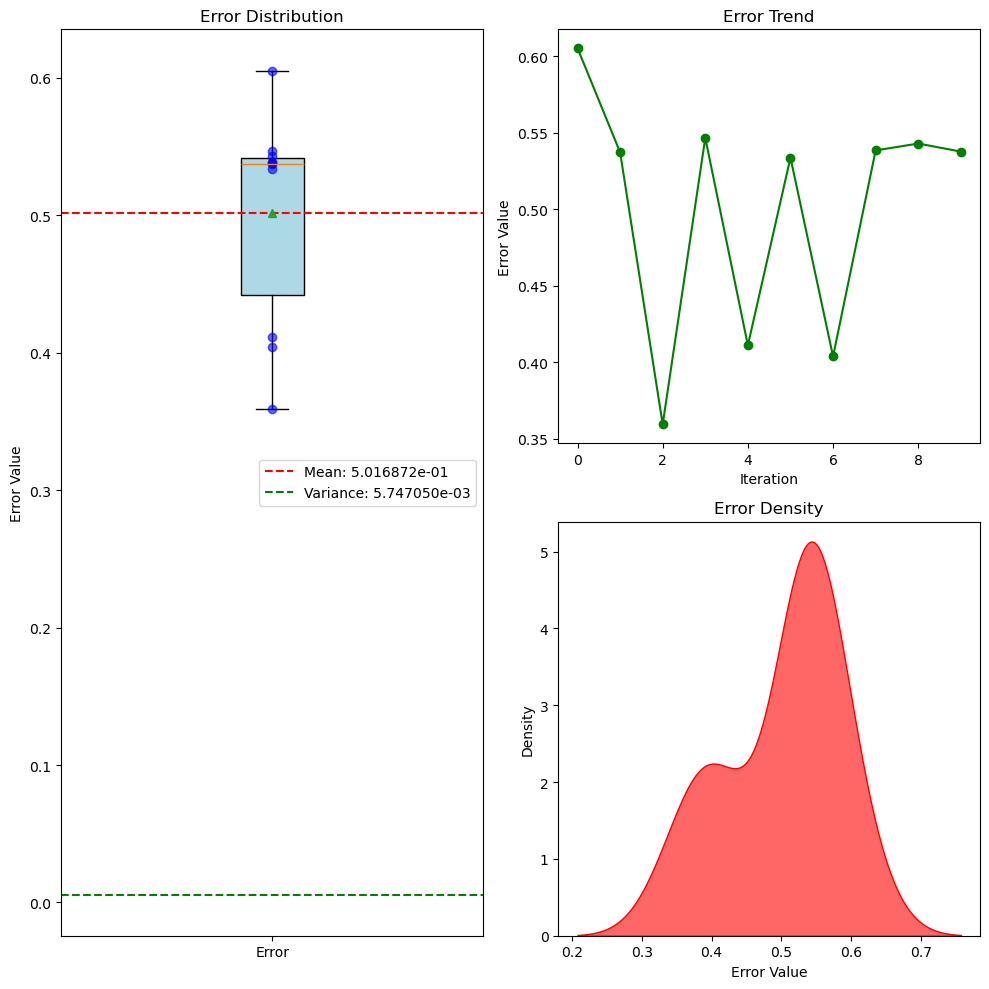

In [9]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns  # 导入seaborn库用于绘制密度图

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = error_u

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean Error u: %e' % (mean_error)) #打印误差
print('Variance Error u: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('Error Distribution')
plt.ylabel('Error Value')
plt.xticks([1], ['Error'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('Error Trend')
plt.ylabel('Error Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('Error Density')
plt.xlabel('Error Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

In [10]:
len_t = 101
len_x = 101

# --- 反向过程 (您需要的部分) ---

# 假设您现在只有 X_star, u_star，以及 len_t 和 len_x
# len_t = 101
# len_x = 256

# 1. 从 X_star 中分离出展平的 X 和 T
flat_X = X_star[:, 0]
flat_T = X_star[:, 1]

# 2. 使用 reshape 将它们恢复为原始的二维形状
# np.reshape 的默认顺序是 'C' (行主序)，这与 flatten 的默认行为一致
# 我们知道原始形状是 (len_t, len_x)
X = flat_X.reshape(len_t, len_x)
T = flat_T.reshape(len_t, len_x)

U_star = griddata(X_star, u_star.flatten(), (X, T), method='cubic')


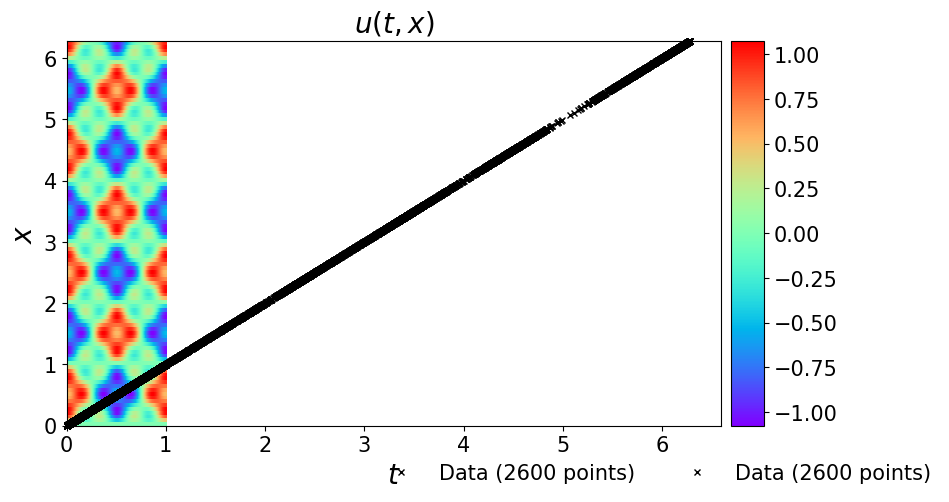

In [11]:
###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
im = ax.imshow(U_star.T, interpolation='nearest', cmap='rainbow', 
              extent=[lb[1], ub[1], lb[0], ub[0]], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是im，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(im, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（im）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


#在图上绘制散点图
ax.plot(
    X_f[:,1], 
    X_f[:,0], 
    'kx', label = 'Data (%d points)' % (X_f.shape[0]), 
    markersize = 4,  # marker size doubled
    clip_on = False,
    alpha=1.0
) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
  #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

In [12]:
trainloss = torch.stack(model.loss_value).cpu().detach().numpy()


14050


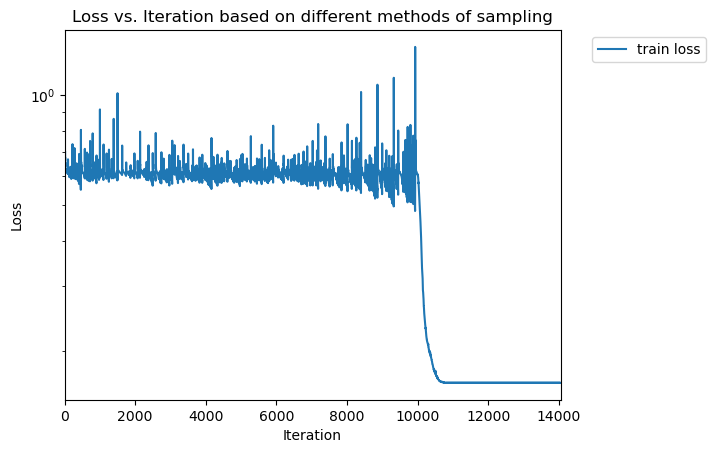

In [13]:
print(len(trainloss))
# print(trainloss)
# 定义图例的标签
labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(trainloss, label='train loss')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,len(trainloss)]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


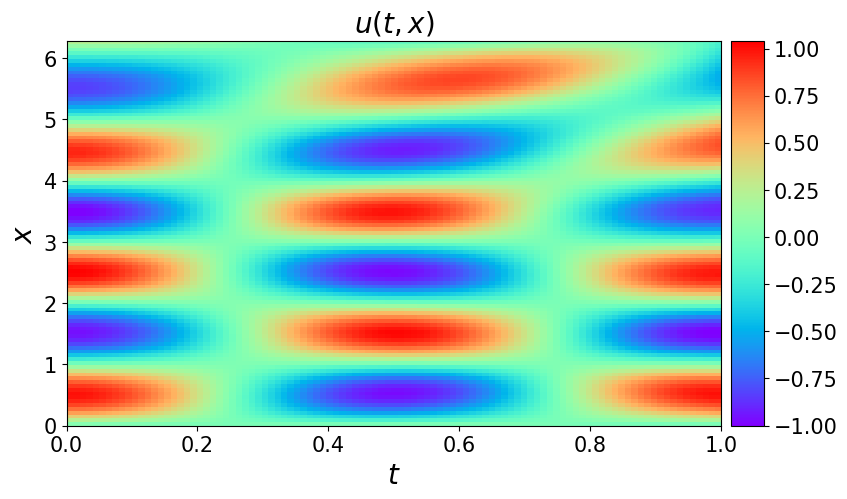

In [14]:
#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
im = ax.imshow(U_pred.T, interpolation='nearest', cmap='rainbow', 
              extent=[lb[1], ub[1], lb[0], ub[0]], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(im, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（im）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


# #在图上绘制散点图
# ax.plot(
#     X_f_train[:,1], 
#     X_f_train[:,0], 
#     'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
#     markersize = 4,  # marker size doubled
#     clip_on = False,
#     alpha=1.0
# ) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
#   #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

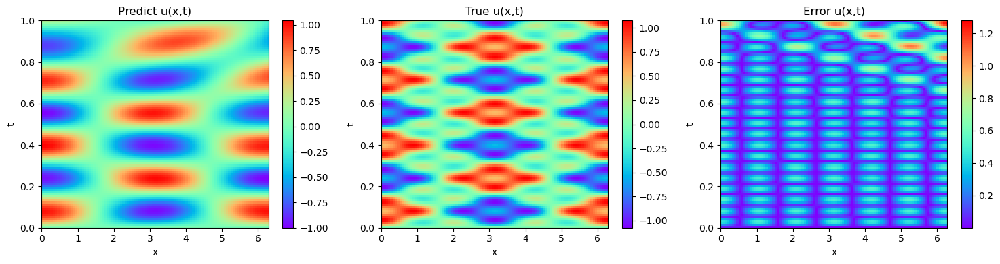

In [15]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_pred.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predict u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_star.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 绘制第三幅图像
axes[2].imshow(np.abs(U_pred - U_star).T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[2].invert_yaxis()
axes[2].set_xlabel('x')
axes[2].set_ylabel('t')
axes[2].set_title('Error u(x,t)')
fig.colorbar(axes[2].images[0], ax=axes[2])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()

In [16]:
#计算训练好模型的chaos（最后一个seed）
u_chaos = calculate_chaos(model, X_star, num_iter=50)
u_chaos_log = np.log(u_chaos + 1e-10) #对u_var取对数，然后加上一个很小的数，避免取对数时出现错误

#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_chaos = griddata(X_star, u_chaos.flatten(), (X, T), method='cubic')
U_chaos_log = griddata(X_star, u_chaos_log.flatten(), (X, T), method='cubic')

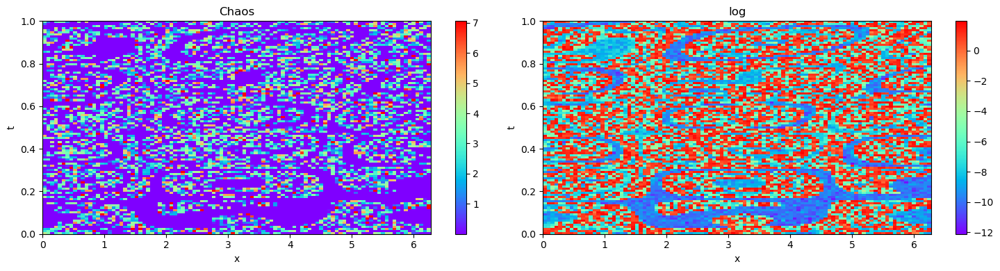

In [17]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_chaos.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Chaos')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_chaos_log.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('log')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()